In [1]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader

from PIL import Image
import torchvision
from torchvision import datasets, models, transforms
from torchvision.transforms import ToTensor
import matplotlib.pyplot as plt
from sklearn.metrics import *
import time
import os
from torch.utils import data
import random
import copy
import itertools
import io

# Tensorboard for logging
from torch.utils.tensorboard import SummaryWriter



In [2]:
if torch.cuda.is_available():
    device = torch.device('cuda') 
else:
    device = torch.device('cpu')
    
torch.cuda.set_device(1)
print(device)

cuda


In [3]:
# root directory
root_dir = "/home/andreasabo/Documents/HNProject/"

# data directory on current machine: abhishekmoturu, andreasabo, denizjafari, navidkorhani
data_dir = "/home/andreasabo/Documents/HNProject/all_label_img/"

# read target df
csv_path = os.path.join(root_dir, "all_splits_100000.csv")
data_df = pd.read_csv(csv_path, usecols=['subj_id', 'image_ids', 'view_label', 'view_train'])
data_df.head

<bound method NDFrame.head of        image_ids     view_label  subj_id  view_train
0       1323_2_1        Missing     1323         NaN
1       1323_2_2        Missing     1323         NaN
2       1323_2_3        Missing     1323         NaN
3       1323_2_4        Missing     1323         NaN
4       1323_2_5        Missing     1323         NaN
...          ...            ...      ...         ...
72454  1066_7_50  Saggital_Left     1066         0.0
72455  1066_7_51  Saggital_Left     1066         0.0
72456  1066_7_52  Saggital_Left     1066         0.0
72457  1066_7_53  Saggital_Left     1066         0.0
72458  1066_7_54          Other     1066         0.0

[72459 rows x 4 columns]>

### **Hyperparameters**

In [4]:
# Models to choose from [resnet, alexnet, vgg, squeezenet, densenet, inception]
model_name = "resnet"

# Number of classes in the dataset: right_sag, right_trav, left_sag, left_trav, bladder, other
num_classes = 6

# Batch size for training (change depending on how much memory you have)
batch_size = 64

# Number of epochs to train for
num_epochs = 300

# Flag for feature extracting. When False, we finetune the whole model; when True we only update the reshaped layer params
feature_extract = False

### **Reading Data Indicies and Labels**

In [5]:
label_mapping = {'Other':0, 'Saggital_Right':1, 'Transverse_Right':2, 
                 'Saggital_Left':3, 'Transverse_Left':4, 'Bladder':5}
label_unmapping = {0: 'Other', 1:'Saggital_Right', 2: 'Transverse_Right', 
                   3:'Saggital_Left', 4:'Transverse_Left', 5: 'Bladder'}

data_df['view_label'] = data_df['view_label'].map(label_mapping)

train_df = data_df[data_df.view_train == 1]
test_df = data_df[data_df.view_train == 0]

labels = {}
train_and_valid_subj_ids = []
train_and_valid_image_ids = []
test_ids = []

for ind, row in train_df.iterrows():
    train_and_valid_subj_ids.append(row['subj_id'])
    train_and_valid_image_ids.append(row['image_ids'])
    labels[row['image_ids']] = row['view_label']

for ind, row in test_df.iterrows():
    test_ids.append(row['image_ids'])
    labels[row['image_ids']] = row['view_label']

s = set()
t_v_ids = pd.DataFrame(list(zip(train_and_valid_subj_ids, train_and_valid_image_ids)), columns=['subj_ids', 'image_ids'])
id_groups = [t_v_ids for _, t_v_ids in t_v_ids.groupby('subj_ids')]
random.shuffle(id_groups)
id_groups = pd.concat(id_groups).reset_index(drop=True)
train_val_split = int(0.8*len(set(id_groups['subj_ids'].values)))
train_val_set = [i for i in id_groups['subj_ids'].values if not (i in s or s.add(i))]
cutoff = train_val_set[train_val_split]
train_portion = (id_groups['subj_ids'].values == cutoff).argmax()

train_ids = id_groups[:train_portion]['image_ids'].tolist()
valid_ids = id_groups[train_portion:]['image_ids'].tolist()

partition = {'train':train_ids, 'valid':valid_ids}

In [6]:
def plot_confusion_matrix_local(cm,
                          target_names,
                          title='Confusion matrix',
                          cmap=None,
                          normalize=False):
    """
    given a sklearn confusion matrix (cm), make a nice plot

    Arguments
    ---------
    cm:           confusion matrix from sklearn.metrics.confusion_matrix

    target_names: given classification classes such as [0, 1, 2]
                  the class names, for example: ['high', 'medium', 'low']

    title:        the text to display at the top of the matrix

    cmap:         the gradient of the values displayed from matplotlib.pyplot.cm
                  see http://matplotlib.org/examples/color/colormaps_reference.html
                  plt.get_cmap('jet') or plt.cm.Blues

    normalize:    If False, plot the raw numbers
                  If True, plot the proportions

    Usage
    -----
    plot_confusion_matrix(cm           = cm,                  # confusion matrix created by
                                                              # sklearn.metrics.confusion_matrix
                          normalize    = True,                # show proportions
                          target_names = y_labels_vals,       # list of names of the classes
                          title        = best_estimator_name) # title of graph

    Citiation
    ---------
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html

    """
    import matplotlib.pyplot as plt
    import numpy as np
    import itertools

    accuracy = np.trace(cm) / np.sum(cm).astype('float')
    misclass = 1 - accuracy

    if cmap is None:
        cmap = plt.get_cmap('Blues')

    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")


    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label\naccuracy={:0.4f}; misclass={:0.4f}'.format(accuracy, misclass))
    plt.show()

In [7]:
# https://www.tensorflow.org/tensorboard/image_summaries
# def plot_to_image(figure):
#   """Converts the matplotlib plot specified by 'figure' to a PNG image and
#   returns it. The supplied figure is closed and inaccessible after this call."""
#   # Save the plot to a PNG in memory.
#   buf = io.BytesIO()
#   plt.savefig(buf, format='png')
#   # Closing the figure prevents it from being displayed directly inside
#   # the notebook.
#   plt.close(figure)
#   buf.seek(0)
#   # Convert PNG buffer to TF image
#   image = tf.image.decode_png(buf.getvalue(), channels=4)
#   # Add the batch dimension
#   image = tf.expand_dims(image, 0)
#   return image

### **Model**

In [8]:
def train_model(model, dataloaders, criterion, optimizer, num_epochs=25, is_inception=False, writer = None):
    since = time.time()
    classnames = ['Other', 'Saggital_Right', 'Transverse_Right', 'Saggital_Left','Transverse_Left', 'Bladder']
    val_acc_history = []

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch + 1, num_epochs))
        print('-' * 54)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0
            
            running_preds = []
            running_labels = []

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                labels = labels.type(torch.long)
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()
                
                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    # Get model outputs and calculate loss
                    # Special case for inception because in training it has an auxiliary output. In train
                    #   mode we calculate the loss by summing the final output and the auxiliary output
                    #   but in testing we only consider the final output.
                    if is_inception and phase == 'train':
                        # From https://discuss.pytorch.org/t/how-to-optimize-inception-model-with-auxiliary-classifiers/7958
                        outputs, aux_outputs = model(inputs)
                        loss1 = criterion(outputs, labels)
                        loss2 = criterion(aux_outputs, labels)
                        loss = loss1 + 0.4*loss2
                    else:
                        outputs = model(inputs)
                        labels = torch.argmax(labels, 1)
                        running_preds += torch.argmax(outputs, 1).tolist()
                        running_labels += labels.tolist()
                        loss = criterion(outputs, labels)

                    preds = torch.argmax(outputs, 1)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            
            print('{} loss:\t{:.4f} | {} acc:\t{:.4f}\n'.format(phase, epoch_loss, phase, epoch_acc))
            # Log to tensorboard for visualization
            if writer is not None and phase == 'train':
                writer.add_scalar('Loss/train', epoch_loss, epoch)
                writer.add_scalar('Accuracy/train', epoch_acc, epoch)
#                 cm = confusion_matrix(running_labels, running_preds)
#                 figure = plot_confusion_matrix_local(cm, classnames)
#                 writer.add_image('confusion_matrix/train', figure, epoch)
                
                
                
            if writer is not None and phase == 'val':
                writer.add_scalar('Loss/val', epoch_loss, epoch)
                writer.add_scalar('Accuracy/val', epoch_acc, epoch)
               
                #COmpute and log f1, precision, recall for each class
                for c in range(6):
                    running_labels = np.asarray(running_labels)
                    running_preds = np.asarray(running_preds)

                    cur_c_labs_bin = np.asarray([0] *len(running_labels))
                    cur_c_preds_bin = np.asarray([0] *len(running_labels))

                    # Need to binarize
                    cur_c_preds_bin[running_preds == c] = 1
                    cur_c_labs_bin[running_labels == c] = 1
                    f1 = f1_score(cur_c_labs_bin, cur_c_preds_bin)
                    precision = precision_score(cur_c_labs_bin, cur_c_preds_bin)
                    recall = recall_score(cur_c_labs_bin, cur_c_preds_bin)
                    writer.add_scalar(f'f1/{c}', f1, epoch)
                    writer.add_scalar(f'precision/{c}', precision, epoch)
                    writer.add_scalar(f'recall/{c}', recall, epoch)
                    
            if phase == 'train':
                print(classification_report(running_labels, running_preds))
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
                print(classification_report(running_labels, running_preds))
            if phase == 'val':
                val_acc_history.append(epoch_acc)

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best val acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, val_acc_history

In [9]:
def set_parameter_requires_grad(model, feature_extracting):
    if feature_extracting:
        for param in model.parameters():
            param.requires_grad = False

In [10]:
def initialize_model(model_name, num_classes, feature_extract, use_pretrained=True):
    # Initialize these variables which will be set in this if statement. Each of these
    #   variables is model specific.
    model_ft = None
    input_size = 0

    if model_name == "resnet":
        """ Resnet18
        """
        model_ft = models.resnet18(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs, num_classes)
        input_size = 256

    elif model_name == "alexnet":
        """ Alexnet
        """
        model_ft = models.alexnet(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier[6].in_features
        model_ft.classifier[6] = nn.Linear(num_ftrs,num_classes)
        input_size = 224

    elif model_name == "vgg":
        """ VGG11_bn
        """
        model_ft = models.vgg11_bn(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier[6].in_features
        model_ft.classifier[6] = nn.Linear(num_ftrs,num_classes)
        input_size = 224

    elif model_name == "squeezenet":
        """ Squeezenet
        """
        model_ft = models.squeezenet1_0(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        model_ft.classifier[1] = nn.Conv2d(512, num_classes, kernel_size=(1,1), stride=(1,1))
        model_ft.num_classes = num_classes
        input_size = 224

    elif model_name == "densenet":
        """ Densenet
        """
        model_ft = models.densenet121(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier.in_features
        model_ft.classifier = nn.Linear(num_ftrs, num_classes)
        input_size = 224

    elif model_name == "inception":
        """ Inception v3
        Be careful, expects (299,299) sized images and has auxiliary output
        """
        model_ft = models.inception_v3(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        # Handle the auxilary net
        num_ftrs = model_ft.AuxLogits.fc.in_features
        model_ft.AuxLogits.fc = nn.Linear(num_ftrs, num_classes)
        # Handle the primary net
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs,num_classes)
        input_size = 299

    else:
        print("Invalid model name, exiting...")
        exit()

    return model_ft, input_size

# Initialize the model for this run
model_ft, input_size = initialize_model(model_name, num_classes, feature_extract, use_pretrained=False)

class ViewNet(nn.Module):

    
    def __init__(self, num_classes, conv1_filters, conv2_filters, conv3_filters, linear1_size, dropout):
        super(ViewNet, self).__init__()
        self.conv1_filters = conv1_filters
        self.conv2_filters = conv2_filters
        self.conv3_filters = conv3_filters
        self.linear1_size = linear1_size
        self.drop_percent = dropout
        
        self.conv1 = nn.Conv2d(1, self.conv1_filters, 4, padding=2)
        self.conv2 = nn.Conv2d(self.conv1_filters, self.conv2_filters, 4, padding=2)
        self.conv3 = nn.Conv2d(self.conv2_filters, self.conv3_filters, 4, padding=2)
        self.pool = nn.MaxPool2d(4, 4)
        self.dropout = nn.Dropout(self.drop_percent)
        self.linear1 = nn.Linear(self.conv3_filters*4*4, self.linear1_size)
        self.dropout = nn.Dropout(self.drop_percent)
        self.linear2 = nn.Linear(self.linear1_size, num_classes)
    
    def forward(self, x):
        x = self.pool(self.dropout(F.relu(self.conv1(x))))
        x = self.pool(self.dropout(F.relu(self.conv2(x))))
        x = self.pool(self.dropout(F.relu(self.conv3(x))))
        x = x.view(-1, self.conv3_filters*4*4) ## reshaping 
        x = self.dropout(F.relu((self.linear1(x))))
        x = self.linear2(x)
        return x



### **Data Loading**

In [11]:
class Dataset(data.Dataset):
  'Characterizes a dataset for PyTorch'
  def __init__(self, list_IDs, labels, transformations=None):
        'Initialization'
        self.labels = labels
        self.list_IDs = list_IDs
        self.transformations = transformations
  def __len__(self):
        'Denotes the total number of samples'
        return len(self.list_IDs)

  def __getitem__(self, index):
        'Generates one sample of data'
        # Select sample
        ID = self.list_IDs[index]

        # Load data and get label
        img_path = data_dir + ID + '.jpg'
        image = Image.open(img_path).convert('L')
        
        if self.transformations:
            image = self.transformations(image)
        
        
        image = ToTensor()(image)
        
        
        
        y = torch.FloatTensor([0]*6)        
        y[int(self.labels[ID])] = 1

        return image, y

In [12]:
# Data augmentation and normalization for training

# Parameters
params = {'batch_size': batch_size,
          'shuffle': True,
          'num_workers': 6}
transformation = transforms.Compose([transforms.RandomAffine(degrees=8, translate=(0.1, 0.1), scale=(0.95,1.25))])
# Generators
training_set = Dataset(partition['train'], labels, transformations = transformation)
training_generator = data.DataLoader(training_set, **params)

validation_set = Dataset(partition['valid'], labels)
validation_generator = data.DataLoader(validation_set, **params)

dataloaders_dict = {'train':training_generator, 'val':validation_generator}

(array([ 3,  4,  5,  6, 14, 15, 16, 17, 18, 19, 20, 21, 23, 28, 35, 36, 37,
       39, 40, 41, 48, 49, 50, 51, 52, 54, 55, 60, 61]),)
(array([ 0,  7,  8, 12, 24, 29, 30, 32, 38, 43, 53]),)
(array([22, 25, 47, 57]),)
(array([ 2,  9, 11, 27, 34, 42, 44, 56, 59]),)
(array([10, 13, 31, 33, 46, 58]),)
(array([ 1, 26, 45, 62, 63]),)


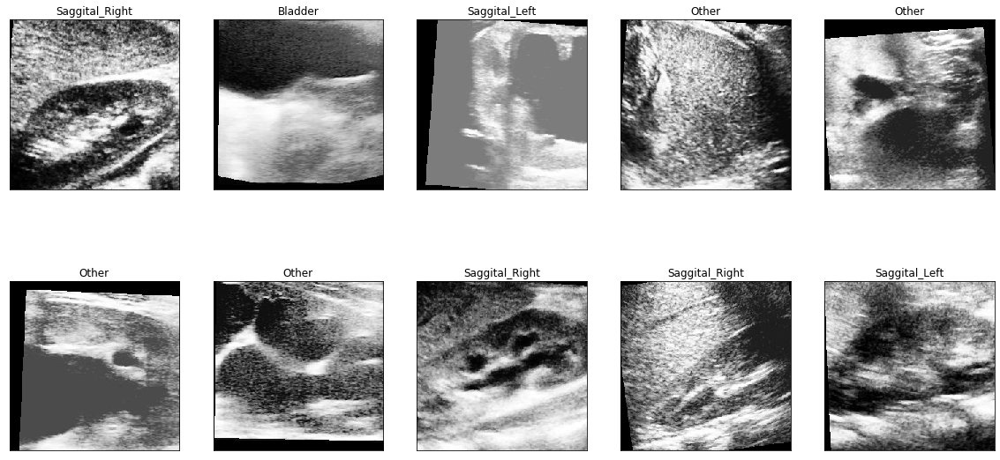

In [13]:
# Lets check that the data augmentation makes sense


for inputs, labs in training_generator:
#     plt.subplot(2,5)
    plt.figure(figsize=(20,10)) 
    for i in range(10):
        im = inputs[i]
        im_np = np.asarray(im).squeeze()
        plt.subplot(2,5,i+ 1)
        plt.imshow(im_np, cmap='gray')
        frame1 = plt.gca()
        frame1.axes.get_xaxis().set_visible(False)
        frame1.axes.get_yaxis().set_visible(False)
        label = np.argmax(labs[i]== 1).cpu().item()
        plt.title(label_unmapping[label])
        
        
    for c in range(6):
        l = np.where(labs[:, c]==1)
        print(l)
    break
    
# for c in range(6):
    
    
    

### **Running the Model**

In [14]:
def SetupAndRunTest(model_ft, writer, lr, wd, amsgrad):
    
    input_size = 256

    # Print the model we just instantiated
#     print(model_ft)

    model_ft = model_ft.to(device)

    # Gather the parameters to be optimized/updated in this run. If we are
    #  finetuning we will be updating all parameters. However, if we are
    #  doing feature extract method, we will only update the parameters
    #  that we have just initialized, i.e. the parameters with requires_grad
    #  is True.
    params_to_update = model_ft.parameters()
#     print("Params to learn:")
    if feature_extract:
        params_to_update = []
        for name,param in model_ft.named_parameters():
            if param.requires_grad == True:
                params_to_update.append(param)
                print("\t",name)
    else:
        for name,param in model_ft.named_parameters():
            if param.requires_grad == True:
                print("\t",name)

    # Observe that all parameters are being optimized
    optimizer_ft = optim.Adam(params_to_update, lr=lr, weight_decay=wd, amsgrad=amsgrad)

    # Setup the loss fxn
    criterion = nn.CrossEntropyLoss()
    
    model_ft, hist = train_model(model_ft, dataloaders_dict, criterion, optimizer_ft, num_epochs, is_inception=(model_name=="inception"), writer = writer)

In [15]:
# Train and evaluate
# model_ft, hist = train_model(model_ft, dataloaders_dict, criterion, optimizer_ft, num_epochs, is_inception=(model_name=="inception"), writer = writer)

In [16]:
feature_extract

False

In [ ]:
writer_prefix = "ablation"
writer_extra_string = "_da" 
conv1_filters_size = [8, 16, 32]
conv2_filters_size = [16, 32, 8]
conv3_filters_size = [32, 16, 8]
linear1_sizes = [256, 512, 1024]
dropouts = [0.35, 0.3, 0.25]

# lrs = [1e-5, 5e-5, 1e-4, 5e-4, 1e-3, 5e-3]
# weight_decays = [1e-5, 5e-5, 1e-4, 5e-4, 1e-6, 5e-6]
lrs = [5e-4, 5e-5, 1e-5]
weight_decays = [1e-3]

amsgrads=[False]
for conv1_filters in conv1_filters_size:
    for conv2_filters in conv2_filters_size:
        for conv3_filters in conv3_filters_size:
            for linear1_size in linear1_sizes:
                for dropout in dropouts:
                    for lr in lrs:
                        for wd in weight_decays:
                            for amsgrad in amsgrads:
                                config_string = f"{conv1_filters}_{conv2_filters}_{conv3_filters}_{linear1_size}_{dropout}_{lr}_{wd}_{amsgrad}"

                                model_ft = ViewNet(num_classes, conv1_filters, conv2_filters, conv3_filters, linear1_size, dropout)
                                writer = SummaryWriter(writer_prefix + "/" + config_string + writer_extra_string)
                                SetupAndRunTest(model_ft, writer, lr, wd, amsgrad)



	 conv1.weight
	 conv1.bias
	 conv2.weight
	 conv2.bias
	 conv3.weight
	 conv3.bias
	 linear1.weight
	 linear1.bias
	 linear2.weight
	 linear2.bias
Epoch 1/300
------------------------------------------------------
train loss:	1.5839 | train acc:	0.4003

              precision    recall  f1-score   support

           0       0.40      0.99      0.57      4772
           1       0.31      0.02      0.03      1739
           2       0.14      0.00      0.00      1214
           3       0.23      0.00      0.00      1790
           4       0.00      0.00      0.00      1355
           5       0.62      0.03      0.05      1079

    accuracy                           0.40     11949
   macro avg       0.28      0.17      0.11     11949
weighted avg       0.31      0.40      0.24     11949

val loss:	1.6483 | val acc:	0.3517

              precision    recall  f1-score   support

           0       0.33      0.90      0.48       689
           1       0.29      0.07      0.11       400
   

/home/andreasabo/.conda/envs/hn/lib/python3.6/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/home/andreasabo/.conda/envs/hn/lib/python3.6/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/home/andreasabo/.conda/envs/hn/lib/python3.6/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


train loss:	1.4133 | train acc:	0.4530

              precision    recall  f1-score   support

           0       0.47      0.86      0.61      4772
           1       0.35      0.16      0.22      1739
           2       0.45      0.02      0.03      1214
           3       0.36      0.25      0.30      1790
           4       0.40      0.01      0.02      1355
           5       0.51      0.51      0.51      1079

    accuracy                           0.45     11949
   macro avg       0.42      0.30      0.28     11949
weighted avg       0.43      0.45      0.37     11949

val loss:	1.6037 | val acc:	0.4236

              precision    recall  f1-score   support

           0       0.51      0.68      0.59       689
           1       0.36      0.03      0.06       400
           2       0.00      0.00      0.00       281
           3       0.30      0.77      0.43       385
           4       0.47      0.08      0.13       283
           5       0.62      0.80      0.70       174

 

val loss:	1.4653 | val acc:	0.4901

Epoch 11/300
------------------------------------------------------
train loss:	1.1296 | train acc:	0.5703

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.59      0.43      0.50      1739
           2       0.56      0.26      0.36      1214
           3       0.49      0.45      0.47      1790
           4       0.50      0.33      0.40      1355
           5       0.72      0.68      0.70      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.51     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.4410 | val acc:	0.5099

              precision    recall  f1-score   support

           0       0.48      0.73      0.58       689
           1       0.57      0.39      0.46       400
           2       0.54      0.27      0.36       281
           3       0.44      0.34      0.38       385
      

val loss:	1.3624 | val acc:	0.5267

              precision    recall  f1-score   support

           0       0.48      0.79      0.60       689
           1       0.64      0.30      0.41       400
           2       0.73      0.20      0.31       281
           3       0.45      0.52      0.48       385
           4       0.61      0.31      0.41       283
           5       0.73      0.88      0.80       174

    accuracy                           0.53      2212
   macro avg       0.61      0.50      0.50      2212
weighted avg       0.57      0.53      0.50      2212

Epoch 21/300
------------------------------------------------------
train loss:	1.0331 | train acc:	0.6104

              precision    recall  f1-score   support

           0       0.60      0.79      0.69      4772
           1       0.66      0.49      0.56      1739
           2       0.63      0.34      0.44      1214
           3       0.54      0.50      0.52      1790
           4       0.53      0.39      0.4

val loss:	1.3648 | val acc:	0.5118

Epoch 31/300
------------------------------------------------------
train loss:	0.9705 | train acc:	0.6278

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.68      0.50      0.57      1739
           2       0.66      0.41      0.51      1214
           3       0.56      0.53      0.54      1790
           4       0.56      0.46      0.50      1355
           5       0.76      0.76      0.76      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.57      0.60     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.3308 | val acc:	0.5222

Epoch 32/300
------------------------------------------------------
train loss:	0.9655 | train acc:	0.6312

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.68      0.53      0.59      1739
      

val loss:	1.3083 | val acc:	0.5538

              precision    recall  f1-score   support

           0       0.48      0.80      0.60       689
           1       0.65      0.39      0.48       400
           2       0.75      0.22      0.34       281
           3       0.50      0.52      0.51       385
           4       0.63      0.39      0.48       283
           5       0.83      0.84      0.84       174

    accuracy                           0.55      2212
   macro avg       0.64      0.53      0.54      2212
weighted avg       0.60      0.55      0.53      2212

Epoch 42/300
------------------------------------------------------
train loss:	0.9166 | train acc:	0.6520

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.70      0.53      0.60      1739
           2       0.67      0.45      0.54      1214
           3       0.59      0.55      0.57      1790
           4       0.59      0.50      0.5

val loss:	1.2693 | val acc:	0.5479

Epoch 53/300
------------------------------------------------------
train loss:	0.8642 | train acc:	0.6683

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4772
           1       0.71      0.56      0.63      1739
           2       0.68      0.48      0.56      1214
           3       0.61      0.56      0.59      1790
           4       0.59      0.50      0.54      1355
           5       0.80      0.81      0.81      1079

    accuracy                           0.67     11949
   macro avg       0.68      0.62      0.64     11949
weighted avg       0.67      0.67      0.66     11949

val loss:	1.2657 | val acc:	0.5524

Epoch 54/300
------------------------------------------------------
train loss:	0.8713 | train acc:	0.6678

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4772
           1       0.72      0.57      0.63      1739
      

val loss:	1.2827 | val acc:	0.5439

Epoch 64/300
------------------------------------------------------
train loss:	0.8367 | train acc:	0.6860

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.73      0.58      0.65      1739
           2       0.70      0.50      0.59      1214
           3       0.63      0.61      0.62      1790
           4       0.63      0.56      0.59      1355
           5       0.80      0.82      0.81      1079

    accuracy                           0.69     11949
   macro avg       0.70      0.65      0.67     11949
weighted avg       0.69      0.69      0.68     11949

val loss:	1.2656 | val acc:	0.5610

              precision    recall  f1-score   support

           0       0.49      0.81      0.61       689
           1       0.66      0.38      0.48       400
           2       0.75      0.30      0.43       281
           3       0.48      0.44      0.46       385
      

train loss:	0.8028 | train acc:	0.6966

              precision    recall  f1-score   support

           0       0.69      0.80      0.75      4772
           1       0.73      0.60      0.66      1739
           2       0.70      0.56      0.62      1214
           3       0.64      0.61      0.63      1790
           4       0.64      0.57      0.60      1355
           5       0.82      0.83      0.82      1079

    accuracy                           0.70     11949
   macro avg       0.70      0.66      0.68     11949
weighted avg       0.70      0.70      0.69     11949

val loss:	1.2600 | val acc:	0.5570

Epoch 76/300
------------------------------------------------------
train loss:	0.8079 | train acc:	0.6910

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.75      0.59      0.66      1739
           2       0.69      0.54      0.60      1214
           3       0.63      0.61      0.62      1790
  

val loss:	1.2093 | val acc:	0.5583

Epoch 87/300
------------------------------------------------------
train loss:	0.7746 | train acc:	0.7083

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4772
           1       0.75      0.62      0.68      1739
           2       0.72      0.58      0.64      1214
           3       0.65      0.63      0.64      1790
           4       0.65      0.58      0.62      1355
           5       0.82      0.83      0.82      1079

    accuracy                           0.71     11949
   macro avg       0.72      0.67      0.69     11949
weighted avg       0.71      0.71      0.71     11949

val loss:	1.2317 | val acc:	0.5710

              precision    recall  f1-score   support

           0       0.51      0.78      0.62       689
           1       0.61      0.45      0.52       400
           2       0.77      0.29      0.42       281
           3       0.51      0.42      0.46       385
      

train loss:	0.7641 | train acc:	0.7062

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4772
           1       0.74      0.62      0.68      1739
           2       0.72      0.57      0.64      1214
           3       0.64      0.63      0.63      1790
           4       0.65      0.58      0.61      1355
           5       0.82      0.83      0.82      1079

    accuracy                           0.71     11949
   macro avg       0.71      0.67      0.69     11949
weighted avg       0.71      0.71      0.70     11949

val loss:	1.2341 | val acc:	0.5416

Epoch 99/300
------------------------------------------------------
train loss:	0.7537 | train acc:	0.7116

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4772
           1       0.75      0.61      0.67      1739
           2       0.72      0.59      0.65      1214
           3       0.65      0.64      0.65      1790
  

train loss:	0.7296 | train acc:	0.7249

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4772
           1       0.76      0.63      0.69      1739
           2       0.75      0.61      0.67      1214
           3       0.67      0.65      0.66      1790
           4       0.68      0.61      0.65      1355
           5       0.82      0.83      0.83      1079

    accuracy                           0.72     11949
   macro avg       0.73      0.69      0.71     11949
weighted avg       0.73      0.72      0.72     11949

val loss:	1.2484 | val acc:	0.5362

Epoch 111/300
------------------------------------------------------
train loss:	0.7306 | train acc:	0.7223

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.78      0.64      0.70      1739
           2       0.74      0.60      0.66      1214
           3       0.67      0.64      0.65      1790
 

train loss:	0.7208 | train acc:	0.7253

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4772
           1       0.75      0.65      0.70      1739
           2       0.74      0.62      0.67      1214
           3       0.67      0.64      0.66      1790
           4       0.66      0.61      0.64      1355
           5       0.84      0.84      0.84      1079

    accuracy                           0.73     11949
   macro avg       0.73      0.70      0.71     11949
weighted avg       0.73      0.73      0.72     11949

val loss:	1.2378 | val acc:	0.5366

Epoch 123/300
------------------------------------------------------
train loss:	0.7283 | train acc:	0.7263

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4772
           1       0.76      0.63      0.69      1739
           2       0.74      0.62      0.67      1214
           3       0.68      0.66      0.67      1790
 

train loss:	0.6962 | train acc:	0.7362

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4772
           1       0.76      0.65      0.70      1739
           2       0.75      0.63      0.69      1214
           3       0.68      0.66      0.67      1790
           4       0.69      0.65      0.67      1355
           5       0.83      0.84      0.84      1079

    accuracy                           0.74     11949
   macro avg       0.74      0.71      0.72     11949
weighted avg       0.74      0.74      0.73     11949

val loss:	1.2057 | val acc:	0.5384

Epoch 135/300
------------------------------------------------------
train loss:	0.6895 | train acc:	0.7386

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4772
           1       0.79      0.66      0.72      1739
           2       0.74      0.63      0.68      1214
           3       0.68      0.67      0.67      1790
 

train loss:	0.6895 | train acc:	0.7392

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4772
           1       0.77      0.66      0.71      1739
           2       0.76      0.61      0.68      1214
           3       0.70      0.68      0.69      1790
           4       0.68      0.66      0.67      1355
           5       0.83      0.83      0.83      1079

    accuracy                           0.74     11949
   macro avg       0.75      0.71      0.72     11949
weighted avg       0.74      0.74      0.74     11949

val loss:	1.2255 | val acc:	0.5267

Epoch 147/300
------------------------------------------------------
train loss:	0.6897 | train acc:	0.7399

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4772
           1       0.77      0.66      0.71      1739
           2       0.74      0.62      0.68      1214
           3       0.71      0.67      0.69      1790
 

train loss:	0.6668 | train acc:	0.7465

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4772
           1       0.78      0.67      0.72      1739
           2       0.75      0.64      0.69      1214
           3       0.70      0.69      0.69      1790
           4       0.70      0.64      0.67      1355
           5       0.83      0.86      0.84      1079

    accuracy                           0.75     11949
   macro avg       0.75      0.72      0.73     11949
weighted avg       0.75      0.75      0.74     11949

val loss:	1.2082 | val acc:	0.5615

Epoch 159/300
------------------------------------------------------
train loss:	0.6672 | train acc:	0.7453

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4772
           1       0.78      0.66      0.72      1739
           2       0.74      0.64      0.69      1214
           3       0.70      0.69      0.69      1790
 

train loss:	0.6556 | train acc:	0.7540

              precision    recall  f1-score   support

           0       0.75      0.84      0.79      4772
           1       0.79      0.68      0.73      1739
           2       0.78      0.67      0.72      1214
           3       0.71      0.68      0.70      1790
           4       0.70      0.66      0.68      1355
           5       0.84      0.85      0.84      1079

    accuracy                           0.75     11949
   macro avg       0.76      0.73      0.74     11949
weighted avg       0.75      0.75      0.75     11949

val loss:	1.2105 | val acc:	0.5416

Epoch 171/300
------------------------------------------------------
train loss:	0.6521 | train acc:	0.7539

              precision    recall  f1-score   support

           0       0.75      0.84      0.79      4772
           1       0.78      0.67      0.72      1739
           2       0.76      0.64      0.69      1214
           3       0.70      0.69      0.69      1790
 

train loss:	0.6371 | train acc:	0.7582

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.78      0.68      0.72      1739
           2       0.78      0.67      0.72      1214
           3       0.72      0.69      0.71      1790
           4       0.71      0.67      0.69      1355
           5       0.85      0.85      0.85      1079

    accuracy                           0.76     11949
   macro avg       0.76      0.73      0.75     11949
weighted avg       0.76      0.76      0.76     11949

val loss:	1.2296 | val acc:	0.5407

Epoch 183/300
------------------------------------------------------
train loss:	0.6502 | train acc:	0.7501

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4772
           1       0.78      0.67      0.72      1739
           2       0.76      0.66      0.71      1214
           3       0.70      0.70      0.70      1790
 

train loss:	0.6280 | train acc:	0.7625

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.79      0.69      0.73      1739
           2       0.78      0.67      0.72      1214
           3       0.71      0.69      0.70      1790
           4       0.71      0.68      0.70      1355
           5       0.84      0.86      0.85      1079

    accuracy                           0.76     11949
   macro avg       0.77      0.74      0.75     11949
weighted avg       0.76      0.76      0.76     11949

val loss:	1.1907 | val acc:	0.5552

Epoch 195/300
------------------------------------------------------
train loss:	0.6390 | train acc:	0.7556

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4772
           1       0.78      0.68      0.73      1739
           2       0.76      0.67      0.71      1214
           3       0.70      0.69      0.69      1790
 

train loss:	0.6104 | train acc:	0.7704

              precision    recall  f1-score   support

           0       0.77      0.84      0.80      4772
           1       0.81      0.70      0.75      1739
           2       0.78      0.68      0.73      1214
           3       0.73      0.72      0.72      1790
           4       0.72      0.68      0.70      1355
           5       0.86      0.86      0.86      1079

    accuracy                           0.77     11949
   macro avg       0.78      0.75      0.76     11949
weighted avg       0.77      0.77      0.77     11949

val loss:	1.1759 | val acc:	0.5529

Epoch 207/300
------------------------------------------------------
train loss:	0.6216 | train acc:	0.7635

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.80      0.68      0.74      1739
           2       0.77      0.68      0.73      1214
           3       0.70      0.70      0.70      1790
 

train loss:	0.6131 | train acc:	0.7695

              precision    recall  f1-score   support

           0       0.77      0.85      0.80      4772
           1       0.80      0.69      0.74      1739
           2       0.78      0.68      0.72      1214
           3       0.73      0.72      0.73      1790
           4       0.72      0.68      0.70      1355
           5       0.86      0.86      0.86      1079

    accuracy                           0.77     11949
   macro avg       0.78      0.74      0.76     11949
weighted avg       0.77      0.77      0.77     11949

val loss:	1.1919 | val acc:	0.5344

Epoch 219/300
------------------------------------------------------
train loss:	0.5989 | train acc:	0.7726

              precision    recall  f1-score   support

           0       0.77      0.85      0.81      4772
           1       0.82      0.70      0.75      1739
           2       0.78      0.69      0.73      1214
           3       0.73      0.73      0.73      1790
 

train loss:	0.6049 | train acc:	0.7672

              precision    recall  f1-score   support

           0       0.76      0.85      0.80      4772
           1       0.80      0.70      0.74      1739
           2       0.79      0.67      0.73      1214
           3       0.73      0.71      0.72      1790
           4       0.72      0.67      0.70      1355
           5       0.86      0.85      0.85      1079

    accuracy                           0.77     11949
   macro avg       0.78      0.74      0.76     11949
weighted avg       0.77      0.77      0.77     11949

val loss:	1.1885 | val acc:	0.5371

Epoch 231/300
------------------------------------------------------
train loss:	0.5897 | train acc:	0.7783

              precision    recall  f1-score   support

           0       0.77      0.85      0.81      4772
           1       0.81      0.72      0.77      1739
           2       0.79      0.69      0.74      1214
           3       0.74      0.71      0.73      1790
 

train loss:	0.6066 | train acc:	0.7683

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.81      0.69      0.75      1739
           2       0.78      0.68      0.73      1214
           3       0.73      0.71      0.72      1790
           4       0.71      0.68      0.70      1355
           5       0.86      0.86      0.86      1079

    accuracy                           0.77     11949
   macro avg       0.77      0.75      0.76     11949
weighted avg       0.77      0.77      0.77     11949

val loss:	1.1887 | val acc:	0.5429

Epoch 243/300
------------------------------------------------------
train loss:	0.5922 | train acc:	0.7781

              precision    recall  f1-score   support

           0       0.78      0.85      0.81      4772
           1       0.81      0.72      0.76      1739
           2       0.76      0.67      0.71      1214
           3       0.75      0.73      0.74      1790
 

train loss:	0.5875 | train acc:	0.7776

              precision    recall  f1-score   support

           0       0.77      0.85      0.81      4772
           1       0.80      0.71      0.76      1739
           2       0.80      0.69      0.74      1214
           3       0.73      0.73      0.73      1790
           4       0.74      0.69      0.71      1355
           5       0.86      0.85      0.86      1079

    accuracy                           0.78     11949
   macro avg       0.78      0.75      0.77     11949
weighted avg       0.78      0.78      0.78     11949

val loss:	1.1996 | val acc:	0.5249

Epoch 255/300
------------------------------------------------------
train loss:	0.5807 | train acc:	0.7812

              precision    recall  f1-score   support

           0       0.78      0.85      0.82      4772
           1       0.80      0.71      0.75      1739
           2       0.79      0.69      0.74      1214
           3       0.73      0.73      0.73      1790
 

train loss:	0.5883 | train acc:	0.7812

              precision    recall  f1-score   support

           0       0.78      0.85      0.82      4772
           1       0.80      0.71      0.75      1739
           2       0.78      0.71      0.74      1214
           3       0.74      0.73      0.73      1790
           4       0.74      0.70      0.72      1355
           5       0.86      0.87      0.86      1079

    accuracy                           0.78     11949
   macro avg       0.78      0.76      0.77     11949
weighted avg       0.78      0.78      0.78     11949

val loss:	1.2084 | val acc:	0.5362

Epoch 267/300
------------------------------------------------------
train loss:	0.5710 | train acc:	0.7857

              precision    recall  f1-score   support

           0       0.78      0.85      0.82      4772
           1       0.81      0.73      0.77      1739
           2       0.79      0.71      0.75      1214
           3       0.75      0.73      0.74      1790
 

train loss:	0.5663 | train acc:	0.7877

              precision    recall  f1-score   support

           0       0.78      0.86      0.82      4772
           1       0.81      0.73      0.77      1739
           2       0.80      0.71      0.75      1214
           3       0.76      0.74      0.75      1790
           4       0.75      0.69      0.72      1355
           5       0.86      0.86      0.86      1079

    accuracy                           0.79     11949
   macro avg       0.79      0.76      0.78     11949
weighted avg       0.79      0.79      0.79     11949

val loss:	1.2070 | val acc:	0.5181

Epoch 279/300
------------------------------------------------------
train loss:	0.5650 | train acc:	0.7871

              precision    recall  f1-score   support

           0       0.78      0.85      0.81      4772
           1       0.81      0.72      0.76      1739
           2       0.80      0.72      0.76      1214
           3       0.75      0.73      0.74      1790
 

train loss:	0.5605 | train acc:	0.7868

              precision    recall  f1-score   support

           0       0.79      0.86      0.82      4772
           1       0.80      0.72      0.76      1739
           2       0.81      0.69      0.75      1214
           3       0.74      0.74      0.74      1790
           4       0.75      0.70      0.72      1355
           5       0.85      0.87      0.86      1079

    accuracy                           0.79     11949
   macro avg       0.79      0.76      0.77     11949
weighted avg       0.79      0.79      0.79     11949

val loss:	1.1786 | val acc:	0.5425

Epoch 291/300
------------------------------------------------------
train loss:	0.5552 | train acc:	0.7909

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4772
           1       0.81      0.74      0.77      1739
           2       0.79      0.73      0.76      1214
           3       0.76      0.75      0.75      1790
 

val loss:	1.7302 | val acc:	0.3115

              precision    recall  f1-score   support

           0       0.31      1.00      0.48       689
           1       0.00      0.00      0.00       400
           2       0.00      0.00      0.00       281
           3       0.00      0.00      0.00       385
           4       0.00      0.00      0.00       283
           5       0.00      0.00      0.00       174

    accuracy                           0.31      2212
   macro avg       0.05      0.17      0.08      2212
weighted avg       0.10      0.31      0.15      2212

Epoch 2/300
------------------------------------------------------
train loss:	1.5577 | train acc:	0.4015

              precision    recall  f1-score   support

           0       0.40      0.98      0.57      4772
           1       0.32      0.00      0.01      1739
           2       0.00      0.00      0.00      1214
           3       0.29      0.05      0.09      1790
           4       0.00      0.00      0.00

val loss:	1.5769 | val acc:	0.4277

              precision    recall  f1-score   support

           0       0.42      0.80      0.55       689
           1       0.41      0.40      0.40       400
           2       0.50      0.01      0.01       281
           3       0.35      0.29      0.31       385
           4       0.39      0.11      0.18       283
           5       0.81      0.52      0.63       174

    accuracy                           0.43      2212
   macro avg       0.48      0.35      0.35      2212
weighted avg       0.44      0.43      0.37      2212

Epoch 9/300
------------------------------------------------------
train loss:	1.3144 | train acc:	0.5022

              precision    recall  f1-score   support

           0       0.51      0.83      0.63      4772
           1       0.46      0.36      0.41      1739
           2       0.46      0.06      0.10      1214
           3       0.42      0.34      0.38      1790
           4       0.41      0.10      0.15

val loss:	1.5418 | val acc:	0.4733

              precision    recall  f1-score   support

           0       0.44      0.79      0.57       689
           1       0.54      0.34      0.42       400
           2       0.47      0.09      0.14       281
           3       0.41      0.36      0.38       385
           4       0.43      0.22      0.29       283
           5       0.73      0.82      0.77       174

    accuracy                           0.47      2212
   macro avg       0.50      0.43      0.43      2212
weighted avg       0.48      0.47      0.43      2212

Epoch 17/300
------------------------------------------------------
train loss:	1.2430 | train acc:	0.5306

              precision    recall  f1-score   support

           0       0.54      0.80      0.65      4772
           1       0.51      0.43      0.47      1739
           2       0.50      0.12      0.19      1214
           3       0.43      0.38      0.40      1790
           4       0.48      0.19      0.2

val loss:	1.5100 | val acc:	0.4801

Epoch 26/300
------------------------------------------------------
train loss:	1.1963 | train acc:	0.5446

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.54      0.42      0.48      1739
           2       0.56      0.19      0.28      1214
           3       0.45      0.42      0.44      1790
           4       0.44      0.23      0.31      1355
           5       0.68      0.65      0.67      1079

    accuracy                           0.54     11949
   macro avg       0.54      0.45      0.47     11949
weighted avg       0.54      0.54      0.52     11949

val loss:	1.5018 | val acc:	0.4720

Epoch 27/300
------------------------------------------------------
train loss:	1.1934 | train acc:	0.5471

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.55      0.43      0.48      1739
      

train loss:	1.1666 | train acc:	0.5595

              precision    recall  f1-score   support

           0       0.57      0.80      0.66      4772
           1       0.57      0.45      0.50      1739
           2       0.54      0.20      0.29      1214
           3       0.46      0.42      0.44      1790
           4       0.48      0.27      0.35      1355
           5       0.71      0.69      0.70      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.47      0.49     11949
weighted avg       0.55      0.56      0.54     11949

val loss:	1.5059 | val acc:	0.4851

Epoch 36/300
------------------------------------------------------
train loss:	1.1636 | train acc:	0.5564

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.56      0.45      0.50      1739
           2       0.56      0.21      0.30      1214
           3       0.47      0.43      0.45      1790
  

train loss:	1.1300 | train acc:	0.5694

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.58      0.46      0.51      1739
           2       0.56      0.25      0.34      1214
           3       0.49      0.43      0.46      1790
           4       0.49      0.29      0.36      1355
           5       0.71      0.69      0.70      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.51     11949
weighted avg       0.56      0.57      0.55     11949

val loss:	1.4739 | val acc:	0.5032

Epoch 47/300
------------------------------------------------------
train loss:	1.1382 | train acc:	0.5671

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4772
           1       0.59      0.46      0.51      1739
           2       0.59      0.24      0.34      1214
           3       0.48      0.45      0.46      1790
  

val loss:	1.4424 | val acc:	0.5167

Epoch 57/300
------------------------------------------------------
train loss:	1.1120 | train acc:	0.5772

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.59      0.47      0.52      1739
           2       0.58      0.27      0.37      1214
           3       0.49      0.45      0.47      1790
           4       0.49      0.32      0.39      1355
           5       0.73      0.71      0.72      1079

    accuracy                           0.58     11949
   macro avg       0.58      0.50      0.52     11949
weighted avg       0.57      0.58      0.56     11949

val loss:	1.4559 | val acc:	0.5172

Epoch 58/300
------------------------------------------------------
train loss:	1.1073 | train acc:	0.5818

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.59      0.46      0.52      1739
      

train loss:	1.0873 | train acc:	0.5854

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.61      0.46      0.52      1739
           2       0.59      0.31      0.40      1214
           3       0.50      0.47      0.48      1790
           4       0.50      0.34      0.40      1355
           5       0.72      0.72      0.72      1079

    accuracy                           0.59     11949
   macro avg       0.59      0.51      0.53     11949
weighted avg       0.58      0.59      0.57     11949

val loss:	1.4399 | val acc:	0.5208

Epoch 69/300
------------------------------------------------------
train loss:	1.0851 | train acc:	0.5894

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.61      0.47      0.53      1739
           2       0.60      0.32      0.42      1214
           3       0.51      0.46      0.48      1790
  

val loss:	1.4294 | val acc:	0.5262

Epoch 79/300
------------------------------------------------------
train loss:	1.0659 | train acc:	0.5965

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.62      0.49      0.54      1739
           2       0.61      0.32      0.42      1214
           3       0.53      0.48      0.50      1790
           4       0.51      0.36      0.42      1355
           5       0.74      0.72      0.73      1079

    accuracy                           0.60     11949
   macro avg       0.60      0.53      0.55     11949
weighted avg       0.59      0.60      0.58     11949

val loss:	1.4086 | val acc:	0.5280

Epoch 80/300
------------------------------------------------------
train loss:	1.0704 | train acc:	0.5908

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4772
           1       0.61      0.47      0.54      1739
      

train loss:	1.0447 | train acc:	0.6068

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.64      0.49      0.56      1739
           2       0.61      0.34      0.44      1214
           3       0.54      0.49      0.51      1790
           4       0.52      0.38      0.44      1355
           5       0.75      0.74      0.74      1079

    accuracy                           0.61     11949
   macro avg       0.61      0.54      0.56     11949
weighted avg       0.60      0.61      0.59     11949

val loss:	1.4057 | val acc:	0.5307

Epoch 91/300
------------------------------------------------------
train loss:	1.0482 | train acc:	0.6039

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.64      0.48      0.55      1739
           2       0.62      0.35      0.45      1214
           3       0.52      0.49      0.51      1790
  

val loss:	1.4006 | val acc:	0.5411

              precision    recall  f1-score   support

           0       0.51      0.74      0.60       689
           1       0.74      0.30      0.43       400
           2       0.57      0.30      0.40       281
           3       0.44      0.56      0.49       385
           4       0.53      0.43      0.48       283
           5       0.79      0.82      0.80       174

    accuracy                           0.54      2212
   macro avg       0.60      0.53      0.53      2212
weighted avg       0.57      0.54      0.53      2212

Epoch 102/300
------------------------------------------------------
train loss:	1.0360 | train acc:	0.6065

              precision    recall  f1-score   support

           0       0.61      0.78      0.69      4772
           1       0.64      0.47      0.54      1739
           2       0.59      0.34      0.43      1214
           3       0.53      0.51      0.52      1790
           4       0.54      0.42      0.

train loss:	1.0209 | train acc:	0.6159

              precision    recall  f1-score   support

           0       0.62      0.80      0.69      4772
           1       0.65      0.50      0.56      1739
           2       0.61      0.36      0.45      1214
           3       0.55      0.50      0.52      1790
           4       0.54      0.40      0.46      1355
           5       0.76      0.76      0.76      1079

    accuracy                           0.62     11949
   macro avg       0.62      0.55      0.58     11949
weighted avg       0.61      0.62      0.60     11949

val loss:	1.3801 | val acc:	0.5335

Epoch 114/300
------------------------------------------------------
train loss:	1.0149 | train acc:	0.6145

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4772
           1       0.64      0.50      0.56      1739
           2       0.63      0.36      0.46      1214
           3       0.54      0.51      0.52      1790
 

val loss:	1.3846 | val acc:	0.5411

Epoch 124/300
------------------------------------------------------
train loss:	1.0058 | train acc:	0.6190

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4772
           1       0.66      0.50      0.57      1739
           2       0.62      0.38      0.47      1214
           3       0.55      0.50      0.53      1790
           4       0.55      0.41      0.47      1355
           5       0.76      0.75      0.76      1079

    accuracy                           0.62     11949
   macro avg       0.63      0.56      0.58     11949
weighted avg       0.62      0.62      0.61     11949

val loss:	1.3672 | val acc:	0.5393

Epoch 125/300
------------------------------------------------------
train loss:	1.0006 | train acc:	0.6180

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.66      0.49      0.56      1739
    

val loss:	1.3611 | val acc:	0.5398

Epoch 135/300
------------------------------------------------------
train loss:	0.9862 | train acc:	0.6270

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4772
           1       0.68      0.50      0.58      1739
           2       0.64      0.39      0.48      1214
           3       0.55      0.51      0.53      1790
           4       0.57      0.44      0.50      1355
           5       0.76      0.76      0.76      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.57      0.59     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.3674 | val acc:	0.5357

Epoch 136/300
------------------------------------------------------
train loss:	0.9845 | train acc:	0.6252

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.65      0.50      0.56      1739
    

val loss:	1.3541 | val acc:	0.5434

Epoch 147/300
------------------------------------------------------
train loss:	0.9742 | train acc:	0.6331

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4772
           1       0.67      0.52      0.59      1739
           2       0.63      0.39      0.48      1214
           3       0.57      0.52      0.54      1790
           4       0.57      0.45      0.50      1355
           5       0.76      0.77      0.77      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.57      0.60     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.3622 | val acc:	0.5402

Epoch 148/300
------------------------------------------------------
train loss:	0.9723 | train acc:	0.6334

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4772
           1       0.68      0.51      0.58      1739
    

train loss:	0.9615 | train acc:	0.6327

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.68      0.50      0.58      1739
           2       0.64      0.41      0.50      1214
           3       0.57      0.54      0.56      1790
           4       0.56      0.45      0.50      1355
           5       0.77      0.77      0.77      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.58      0.60     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.3477 | val acc:	0.5493

Epoch 159/300
------------------------------------------------------
train loss:	0.9556 | train acc:	0.6411

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.69      0.53      0.60      1739
           2       0.64      0.41      0.50      1214
           3       0.57      0.53      0.55      1790
 

val loss:	1.3501 | val acc:	0.5556

Epoch 170/300
------------------------------------------------------
train loss:	0.9516 | train acc:	0.6385

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.68      0.52      0.59      1739
           2       0.65      0.44      0.52      1214
           3       0.57      0.53      0.55      1790
           4       0.57      0.45      0.51      1355
           5       0.78      0.78      0.78      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.59      0.61     11949
weighted avg       0.64      0.64      0.63     11949

val loss:	1.3470 | val acc:	0.5570

              precision    recall  f1-score   support

           0       0.52      0.73      0.61       689
           1       0.74      0.32      0.45       400
           2       0.62      0.37      0.46       281
           3       0.47      0.54      0.50       385
     

val loss:	1.3426 | val acc:	0.5497

Epoch 181/300
------------------------------------------------------
train loss:	0.9409 | train acc:	0.6443

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.69      0.53      0.60      1739
           2       0.66      0.43      0.52      1214
           3       0.58      0.54      0.56      1790
           4       0.58      0.47      0.52      1355
           5       0.77      0.77      0.77      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.59      0.61     11949
weighted avg       0.65      0.64      0.64     11949

val loss:	1.3334 | val acc:	0.5515

Epoch 182/300
------------------------------------------------------
train loss:	0.9273 | train acc:	0.6470

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4772
           1       0.69      0.52      0.60      1739
    

val loss:	1.3281 | val acc:	0.5533

Epoch 192/300
------------------------------------------------------
train loss:	0.9215 | train acc:	0.6538

              precision    recall  f1-score   support

           0       0.65      0.81      0.72      4772
           1       0.69      0.52      0.59      1739
           2       0.69      0.45      0.54      1214
           3       0.59      0.55      0.57      1790
           4       0.60      0.50      0.55      1355
           5       0.78      0.79      0.78      1079

    accuracy                           0.65     11949
   macro avg       0.67      0.60      0.63     11949
weighted avg       0.65      0.65      0.65     11949

val loss:	1.3258 | val acc:	0.5470

Epoch 193/300
------------------------------------------------------
train loss:	0.9136 | train acc:	0.6554

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.71      0.53      0.61      1739
    

train loss:	0.9108 | train acc:	0.6623

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4772
           1       0.71      0.55      0.62      1739
           2       0.68      0.45      0.54      1214
           3       0.59      0.56      0.58      1790
           4       0.60      0.50      0.54      1355
           5       0.78      0.79      0.78      1079

    accuracy                           0.66     11949
   macro avg       0.67      0.61      0.63     11949
weighted avg       0.66      0.66      0.65     11949

val loss:	1.3268 | val acc:	0.5484

Epoch 204/300
------------------------------------------------------
train loss:	0.9099 | train acc:	0.6558

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.70      0.53      0.61      1739
           2       0.67      0.46      0.54      1214
           3       0.57      0.55      0.56      1790
 

val loss:	1.3200 | val acc:	0.5493

Epoch 214/300
------------------------------------------------------
train loss:	0.8973 | train acc:	0.6625

              precision    recall  f1-score   support

           0       0.66      0.81      0.72      4772
           1       0.71      0.55      0.62      1739
           2       0.67      0.46      0.55      1214
           3       0.60      0.56      0.58      1790
           4       0.61      0.50      0.55      1355
           5       0.80      0.79      0.79      1079

    accuracy                           0.66     11949
   macro avg       0.67      0.61      0.64     11949
weighted avg       0.66      0.66      0.66     11949

val loss:	1.3128 | val acc:	0.5674

              precision    recall  f1-score   support

           0       0.53      0.74      0.62       689
           1       0.65      0.37      0.47       400
           2       0.64      0.40      0.49       281
           3       0.45      0.52      0.49       385
     

train loss:	0.8978 | train acc:	0.6591

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4772
           1       0.70      0.53      0.60      1739
           2       0.67      0.48      0.56      1214
           3       0.59      0.57      0.58      1790
           4       0.60      0.51      0.55      1355
           5       0.77      0.79      0.78      1079

    accuracy                           0.66     11949
   macro avg       0.67      0.61      0.63     11949
weighted avg       0.66      0.66      0.65     11949

val loss:	1.3107 | val acc:	0.5619

Epoch 226/300
------------------------------------------------------
train loss:	0.8912 | train acc:	0.6626

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4772
           1       0.70      0.54      0.61      1739
           2       0.67      0.48      0.56      1214
           3       0.59      0.57      0.58      1790
 

val loss:	1.3000 | val acc:	0.5633

Epoch 237/300
------------------------------------------------------
train loss:	0.8729 | train acc:	0.6701

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4772
           1       0.71      0.56      0.63      1739
           2       0.70      0.48      0.57      1214
           3       0.60      0.58      0.59      1790
           4       0.60      0.52      0.56      1355
           5       0.80      0.80      0.80      1079

    accuracy                           0.67     11949
   macro avg       0.68      0.62      0.65     11949
weighted avg       0.67      0.67      0.66     11949

val loss:	1.3007 | val acc:	0.5556

Epoch 238/300
------------------------------------------------------
train loss:	0.8726 | train acc:	0.6678

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4772
           1       0.70      0.56      0.62      1739
    

val loss:	1.3000 | val acc:	0.5619

Epoch 249/300
------------------------------------------------------
train loss:	0.8665 | train acc:	0.6714

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4772
           1       0.71      0.55      0.62      1739
           2       0.69      0.50      0.58      1214
           3       0.62      0.59      0.60      1790
           4       0.61      0.51      0.56      1355
           5       0.80      0.80      0.80      1079

    accuracy                           0.67     11949
   macro avg       0.68      0.63      0.65     11949
weighted avg       0.67      0.67      0.67     11949

val loss:	1.2894 | val acc:	0.5565

Epoch 250/300
------------------------------------------------------
train loss:	0.8610 | train acc:	0.6792

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4772
           1       0.73      0.57      0.64      1739
    

val loss:	1.2876 | val acc:	0.5674

Epoch 260/300
------------------------------------------------------
train loss:	0.8576 | train acc:	0.6732

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4772
           1       0.74      0.56      0.64      1739
           2       0.67      0.48      0.56      1214
           3       0.61      0.59      0.60      1790
           4       0.62      0.54      0.58      1355
           5       0.79      0.79      0.79      1079

    accuracy                           0.67     11949
   macro avg       0.68      0.63      0.65     11949
weighted avg       0.67      0.67      0.67     11949

val loss:	1.2786 | val acc:	0.5637

Epoch 261/300
------------------------------------------------------
train loss:	0.8567 | train acc:	0.6797

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4772
           1       0.73      0.58      0.64      1739
    

train loss:	0.8515 | train acc:	0.6819

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.71      0.56      0.63      1739
           2       0.69      0.53      0.60      1214
           3       0.62      0.60      0.61      1790
           4       0.63      0.53      0.57      1355
           5       0.81      0.80      0.81      1079

    accuracy                           0.68     11949
   macro avg       0.69      0.64      0.66     11949
weighted avg       0.68      0.68      0.68     11949

val loss:	1.2860 | val acc:	0.5637

Epoch 272/300
------------------------------------------------------
train loss:	0.8405 | train acc:	0.6830

              precision    recall  f1-score   support

           0       0.67      0.81      0.74      4772
           1       0.72      0.57      0.64      1739
           2       0.70      0.51      0.59      1214
           3       0.62      0.60      0.61      1790
 

train loss:	0.8342 | train acc:	0.6831

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4772
           1       0.73      0.58      0.64      1739
           2       0.70      0.52      0.60      1214
           3       0.63      0.61      0.62      1790
           4       0.61      0.52      0.56      1355
           5       0.83      0.81      0.82      1079

    accuracy                           0.68     11949
   macro avg       0.69      0.64      0.66     11949
weighted avg       0.68      0.68      0.68     11949

val loss:	1.2816 | val acc:	0.5678

Epoch 284/300
------------------------------------------------------
train loss:	0.8418 | train acc:	0.6811

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4772
           1       0.73      0.58      0.65      1739
           2       0.70      0.50      0.59      1214
           3       0.62      0.60      0.61      1790
 

val loss:	1.2727 | val acc:	0.5646

Epoch 295/300
------------------------------------------------------
train loss:	0.8220 | train acc:	0.6937

              precision    recall  f1-score   support

           0       0.68      0.82      0.75      4772
           1       0.74      0.60      0.66      1739
           2       0.70      0.52      0.60      1214
           3       0.65      0.61      0.63      1790
           4       0.63      0.55      0.59      1355
           5       0.82      0.82      0.82      1079

    accuracy                           0.69     11949
   macro avg       0.70      0.65      0.67     11949
weighted avg       0.69      0.69      0.69     11949

val loss:	1.2667 | val acc:	0.5606

Epoch 296/300
------------------------------------------------------
train loss:	0.8201 | train acc:	0.6893

              precision    recall  f1-score   support

           0       0.69      0.82      0.75      4772
           1       0.74      0.58      0.65      1739
    

val loss:	1.7280 | val acc:	0.3115

Epoch 6/300
------------------------------------------------------
train loss:	1.5890 | train acc:	0.3994

              precision    recall  f1-score   support

           0       0.40      1.00      0.57      4772
           1       0.00      0.00      0.00      1739
           2       0.00      0.00      0.00      1214
           3       0.00      0.00      0.00      1790
           4       0.00      0.00      0.00      1355
           5       0.00      0.00      0.00      1079

    accuracy                           0.40     11949
   macro avg       0.07      0.17      0.10     11949
weighted avg       0.16      0.40      0.23     11949

val loss:	1.7223 | val acc:	0.3115

Epoch 7/300
------------------------------------------------------
train loss:	1.5745 | train acc:	0.3994

              precision    recall  f1-score   support

           0       0.40      1.00      0.57      4772
           1       1.00      0.00      0.00      1739
        

train loss:	1.4522 | train acc:	0.4430

              precision    recall  f1-score   support

           0       0.45      0.89      0.60      4772
           1       0.32      0.11      0.17      1739
           2       0.00      0.00      0.00      1214
           3       0.35      0.23      0.27      1790
           4       0.18      0.00      0.00      1355
           5       0.65      0.42      0.51      1079

    accuracy                           0.44     11949
   macro avg       0.32      0.27      0.26     11949
weighted avg       0.36      0.44      0.35     11949

val loss:	1.6510 | val acc:	0.3725

              precision    recall  f1-score   support

           0       0.35      0.90      0.50       689
           1       0.45      0.04      0.07       400
           2       0.00      0.00      0.00       281
           3       0.37      0.28      0.32       385
           4       0.00      0.00      0.00       283
           5       0.78      0.48      0.59       174

 

train loss:	1.3985 | train acc:	0.4677

              precision    recall  f1-score   support

           0       0.47      0.86      0.61      4772
           1       0.41      0.18      0.25      1739
           2       0.40      0.00      0.00      1214
           3       0.38      0.29      0.33      1790
           4       0.49      0.03      0.05      1355
           5       0.60      0.55      0.57      1079

    accuracy                           0.47     11949
   macro avg       0.46      0.32      0.30     11949
weighted avg       0.46      0.47      0.39     11949

val loss:	1.6181 | val acc:	0.3847

              precision    recall  f1-score   support

           0       0.36      0.87      0.51       689
           1       0.69      0.02      0.04       400
           2       0.00      0.00      0.00       281
           3       0.35      0.38      0.36       385
           4       0.33      0.01      0.01       283
           5       0.76      0.57      0.65       174

 

train loss:	1.3677 | train acc:	0.4791

              precision    recall  f1-score   support

           0       0.48      0.85      0.62      4772
           1       0.43      0.20      0.27      1739
           2       0.53      0.01      0.02      1214
           3       0.38      0.32      0.35      1790
           4       0.50      0.07      0.12      1355
           5       0.60      0.62      0.61      1079

    accuracy                           0.48     11949
   macro avg       0.49      0.34      0.33     11949
weighted avg       0.48      0.48      0.41     11949

val loss:	1.5984 | val acc:	0.3987

Epoch 31/300
------------------------------------------------------
train loss:	1.3647 | train acc:	0.4784

              precision    recall  f1-score   support

           0       0.49      0.85      0.62      4772
           1       0.41      0.19      0.26      1739
           2       0.52      0.01      0.02      1214
           3       0.39      0.33      0.35      1790
  

val loss:	1.5874 | val acc:	0.4123

Epoch 39/300
------------------------------------------------------
train loss:	1.3417 | train acc:	0.4905

              precision    recall  f1-score   support

           0       0.49      0.83      0.62      4772
           1       0.47      0.25      0.32      1739
           2       0.51      0.02      0.05      1214
           3       0.40      0.36      0.38      1790
           4       0.47      0.09      0.15      1355
           5       0.62      0.61      0.62      1079

    accuracy                           0.49     11949
   macro avg       0.49      0.36      0.36     11949
weighted avg       0.49      0.49      0.43     11949

val loss:	1.5863 | val acc:	0.4100

Epoch 40/300
------------------------------------------------------
train loss:	1.3339 | train acc:	0.4920

              precision    recall  f1-score   support

           0       0.50      0.84      0.62      4772
           1       0.45      0.25      0.33      1739
      

val loss:	1.5743 | val acc:	0.4281

              precision    recall  f1-score   support

           0       0.39      0.81      0.53       689
           1       0.59      0.19      0.28       400
           2       1.00      0.01      0.02       281
           3       0.36      0.44      0.40       385
           4       0.44      0.08      0.14       283
           5       0.81      0.69      0.75       174

    accuracy                           0.43      2212
   macro avg       0.60      0.37      0.35      2212
weighted avg       0.54      0.43      0.36      2212

Epoch 49/300
------------------------------------------------------
train loss:	1.3130 | train acc:	0.4999

              precision    recall  f1-score   support

           0       0.51      0.82      0.63      4772
           1       0.46      0.26      0.33      1739
           2       0.62      0.05      0.09      1214
           3       0.40      0.38      0.39      1790
           4       0.49      0.13      0.2

train loss:	1.2964 | train acc:	0.5094

              precision    recall  f1-score   support

           0       0.52      0.81      0.63      4772
           1       0.49      0.30      0.37      1739
           2       0.57      0.07      0.12      1214
           3       0.42      0.40      0.41      1790
           4       0.45      0.16      0.24      1355
           5       0.64      0.63      0.63      1079

    accuracy                           0.51     11949
   macro avg       0.51      0.39      0.40     11949
weighted avg       0.51      0.51      0.46     11949

val loss:	1.5631 | val acc:	0.4358

              precision    recall  f1-score   support

           0       0.40      0.79      0.53       689
           1       0.60      0.22      0.32       400
           2       0.57      0.01      0.03       281
           3       0.36      0.46      0.40       385
           4       0.47      0.11      0.17       283
           5       0.82      0.69      0.75       174

 

val loss:	1.5512 | val acc:	0.4340

Epoch 69/300
------------------------------------------------------
train loss:	1.2807 | train acc:	0.5139

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4772
           1       0.49      0.33      0.39      1739
           2       0.55      0.09      0.16      1214
           3       0.41      0.39      0.40      1790
           4       0.49      0.19      0.28      1355
           5       0.65      0.64      0.64      1079

    accuracy                           0.51     11949
   macro avg       0.52      0.41      0.42     11949
weighted avg       0.51      0.51      0.47     11949

val loss:	1.5544 | val acc:	0.4376

Epoch 70/300
------------------------------------------------------
train loss:	1.2796 | train acc:	0.5185

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4772
           1       0.50      0.33      0.40      1739
      

val loss:	1.5427 | val acc:	0.4376

Epoch 81/300
------------------------------------------------------
train loss:	1.2606 | train acc:	0.5231

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4772
           1       0.52      0.35      0.41      1739
           2       0.57      0.11      0.18      1214
           3       0.43      0.41      0.42      1790
           4       0.46      0.21      0.28      1355
           5       0.65      0.64      0.64      1079

    accuracy                           0.52     11949
   macro avg       0.53      0.42      0.43     11949
weighted avg       0.52      0.52      0.49     11949

val loss:	1.5382 | val acc:	0.4439

Epoch 82/300
------------------------------------------------------
train loss:	1.2494 | train acc:	0.5252

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4772
           1       0.51      0.35      0.42      1739
      

train loss:	1.2454 | train acc:	0.5263

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4772
           1       0.51      0.36      0.42      1739
           2       0.54      0.10      0.17      1214
           3       0.43      0.39      0.41      1790
           4       0.47      0.23      0.31      1355
           5       0.66      0.66      0.66      1079

    accuracy                           0.53     11949
   macro avg       0.52      0.42      0.43     11949
weighted avg       0.52      0.53      0.49     11949

val loss:	1.5329 | val acc:	0.4507

              precision    recall  f1-score   support

           0       0.41      0.80      0.55       689
           1       0.57      0.28      0.38       400
           2       0.50      0.07      0.13       281
           3       0.37      0.37      0.37       385
           4       0.45      0.18      0.26       283
           5       0.83      0.68      0.74       174

 

val loss:	1.5222 | val acc:	0.4539

              precision    recall  f1-score   support

           0       0.42      0.78      0.55       689
           1       0.56      0.31      0.40       400
           2       0.53      0.07      0.13       281
           3       0.36      0.38      0.37       385
           4       0.46      0.18      0.26       283
           5       0.82      0.70      0.75       174

    accuracy                           0.45      2212
   macro avg       0.52      0.40      0.41      2212
weighted avg       0.48      0.45      0.42      2212

Epoch 103/300
------------------------------------------------------
train loss:	1.2266 | train acc:	0.5339

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4772
           1       0.54      0.38      0.44      1739
           2       0.57      0.13      0.22      1214
           3       0.44      0.43      0.43      1790
           4       0.45      0.24      0.

val loss:	1.5136 | val acc:	0.4575

Epoch 114/300
------------------------------------------------------
train loss:	1.2218 | train acc:	0.5361

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4772
           1       0.53      0.38      0.44      1739
           2       0.56      0.15      0.24      1214
           3       0.45      0.41      0.43      1790
           4       0.48      0.25      0.33      1355
           5       0.67      0.66      0.66      1079

    accuracy                           0.54     11949
   macro avg       0.54      0.44      0.46     11949
weighted avg       0.53      0.54      0.51     11949

val loss:	1.5192 | val acc:	0.4525

Epoch 115/300
------------------------------------------------------
train loss:	1.2199 | train acc:	0.5369

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4772
           1       0.54      0.39      0.46      1739
    

train loss:	1.2070 | train acc:	0.5380

              precision    recall  f1-score   support

           0       0.55      0.78      0.64      4772
           1       0.53      0.38      0.45      1739
           2       0.55      0.17      0.26      1214
           3       0.45      0.42      0.44      1790
           4       0.47      0.26      0.34      1355
           5       0.67      0.66      0.66      1079

    accuracy                           0.54     11949
   macro avg       0.53      0.45      0.46     11949
weighted avg       0.53      0.54      0.51     11949

val loss:	1.5078 | val acc:	0.4607

              precision    recall  f1-score   support

           0       0.42      0.79      0.55       689
           1       0.57      0.35      0.44       400
           2       0.47      0.11      0.18       281
           3       0.39      0.37      0.38       385
           4       0.45      0.17      0.24       283
           5       0.83      0.67      0.74       174

 

val loss:	1.5012 | val acc:	0.4638

Epoch 136/300
------------------------------------------------------
train loss:	1.1994 | train acc:	0.5460

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.55      0.38      0.45      1739
           2       0.54      0.17      0.26      1214
           3       0.45      0.43      0.44      1790
           4       0.50      0.27      0.35      1355
           5       0.69      0.67      0.68      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.45      0.47     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.5053 | val acc:	0.4670

              precision    recall  f1-score   support

           0       0.43      0.76      0.55       689
           1       0.54      0.37      0.44       400
           2       0.53      0.15      0.23       281
           3       0.37      0.37      0.37       385
     

val loss:	1.4989 | val acc:	0.4643

Epoch 145/300
------------------------------------------------------
train loss:	1.1892 | train acc:	0.5524

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.55      0.39      0.46      1739
           2       0.58      0.19      0.29      1214
           3       0.46      0.43      0.44      1790
           4       0.52      0.29      0.37      1355
           5       0.69      0.67      0.68      1079

    accuracy                           0.55     11949
   macro avg       0.56      0.46      0.48     11949
weighted avg       0.55      0.55      0.53     11949

val loss:	1.5020 | val acc:	0.4720

Epoch 146/300
------------------------------------------------------
train loss:	1.1853 | train acc:	0.5564

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.57      0.40      0.47      1739
    

train loss:	1.1841 | train acc:	0.5578

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.58      0.43      0.50      1739
           2       0.54      0.20      0.29      1214
           3       0.49      0.44      0.46      1790
           4       0.48      0.30      0.37      1355
           5       0.68      0.67      0.68      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.47      0.49     11949
weighted avg       0.55      0.56      0.54     11949

val loss:	1.4936 | val acc:	0.4702

Epoch 157/300
------------------------------------------------------
train loss:	1.1792 | train acc:	0.5560

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.54      0.40      0.46      1739
           2       0.59      0.21      0.31      1214
           3       0.47      0.43      0.45      1790
 

val loss:	1.4894 | val acc:	0.4760

Epoch 167/300
------------------------------------------------------
train loss:	1.1723 | train acc:	0.5591

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.58      0.41      0.48      1739
           2       0.60      0.22      0.32      1214
           3       0.48      0.44      0.46      1790
           4       0.49      0.31      0.38      1355
           5       0.69      0.69      0.69      1079

    accuracy                           0.56     11949
   macro avg       0.57      0.48      0.50     11949
weighted avg       0.56      0.56      0.54     11949

val loss:	1.4885 | val acc:	0.4774

Epoch 168/300
------------------------------------------------------
train loss:	1.1728 | train acc:	0.5566

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.58      0.42      0.48      1739
    

val loss:	1.4790 | val acc:	0.4765

Epoch 179/300
------------------------------------------------------
train loss:	1.1687 | train acc:	0.5556

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4772
           1       0.56      0.41      0.48      1739
           2       0.57      0.20      0.30      1214
           3       0.48      0.44      0.46      1790
           4       0.49      0.31      0.38      1355
           5       0.70      0.70      0.70      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.47      0.49     11949
weighted avg       0.55      0.56      0.53     11949

val loss:	1.4849 | val acc:	0.4778

Epoch 180/300
------------------------------------------------------
train loss:	1.1687 | train acc:	0.5581

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.56      0.41      0.47      1739
    

val loss:	1.4772 | val acc:	0.4769

Epoch 191/300
------------------------------------------------------
train loss:	1.1587 | train acc:	0.5594

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.57      0.41      0.48      1739
           2       0.55      0.21      0.31      1214
           3       0.48      0.45      0.46      1790
           4       0.50      0.32      0.39      1355
           5       0.69      0.69      0.69      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.48      0.50     11949
weighted avg       0.56      0.56      0.54     11949

val loss:	1.4793 | val acc:	0.4760

Epoch 192/300
------------------------------------------------------
train loss:	1.1569 | train acc:	0.5575

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.57      0.41      0.47      1739
    

train loss:	1.1555 | train acc:	0.5657

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.58      0.43      0.49      1739
           2       0.55      0.22      0.32      1214
           3       0.48      0.44      0.46      1790
           4       0.52      0.34      0.41      1355
           5       0.70      0.69      0.69      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.48      0.51     11949
weighted avg       0.56      0.57      0.55     11949

val loss:	1.4642 | val acc:	0.4760

Epoch 203/300
------------------------------------------------------
train loss:	1.1536 | train acc:	0.5691

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.59      0.42      0.49      1739
           2       0.58      0.24      0.34      1214
           3       0.49      0.46      0.48      1790
 

val loss:	1.4674 | val acc:	0.4778

Epoch 214/300
------------------------------------------------------
train loss:	1.1518 | train acc:	0.5615

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.56      0.42      0.48      1739
           2       0.55      0.22      0.32      1214
           3       0.49      0.45      0.47      1790
           4       0.48      0.31      0.38      1355
           5       0.72      0.69      0.70      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.48      0.50     11949
weighted avg       0.56      0.56      0.54     11949

val loss:	1.4706 | val acc:	0.4833

Epoch 215/300
------------------------------------------------------
train loss:	1.1470 | train acc:	0.5667

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.59      0.41      0.48      1739
    

train loss:	1.1430 | train acc:	0.5694

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.59      0.41      0.48      1739
           2       0.58      0.25      0.35      1214
           3       0.49      0.47      0.48      1790
           4       0.51      0.34      0.41      1355
           5       0.72      0.70      0.71      1079

    accuracy                           0.57     11949
   macro avg       0.58      0.49      0.51     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.4644 | val acc:	0.4788

Epoch 226/300
------------------------------------------------------
train loss:	1.1403 | train acc:	0.5703

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.59      0.43      0.50      1739
           2       0.57      0.23      0.33      1214
           3       0.50      0.43      0.46      1790
 

val loss:	1.4591 | val acc:	0.4806

Epoch 236/300
------------------------------------------------------
train loss:	1.1332 | train acc:	0.5668

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.58      0.42      0.49      1739
           2       0.60      0.24      0.35      1214
           3       0.49      0.44      0.47      1790
           4       0.50      0.34      0.41      1355
           5       0.71      0.69      0.70      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.51     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.4630 | val acc:	0.4819

Epoch 237/300
------------------------------------------------------
train loss:	1.1341 | train acc:	0.5713

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.60      0.45      0.51      1739
    

val loss:	1.4596 | val acc:	0.4819

Epoch 247/300
------------------------------------------------------
train loss:	1.1290 | train acc:	0.5744

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4772
           1       0.60      0.44      0.51      1739
           2       0.59      0.25      0.35      1214
           3       0.50      0.46      0.48      1790
           4       0.49      0.35      0.41      1355
           5       0.71      0.70      0.70      1079

    accuracy                           0.57     11949
   macro avg       0.58      0.50      0.52     11949
weighted avg       0.57      0.57      0.56     11949

val loss:	1.4602 | val acc:	0.4819

Epoch 248/300
------------------------------------------------------
train loss:	1.1302 | train acc:	0.5714

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.58      0.42      0.49      1739
    

val loss:	1.4544 | val acc:	0.4905

Epoch 259/300
------------------------------------------------------
train loss:	1.1257 | train acc:	0.5749

              precision    recall  f1-score   support

           0       0.57      0.80      0.67      4772
           1       0.60      0.43      0.50      1739
           2       0.61      0.24      0.35      1214
           3       0.51      0.45      0.48      1790
           4       0.52      0.34      0.41      1355
           5       0.71      0.69      0.70      1079

    accuracy                           0.57     11949
   macro avg       0.59      0.49      0.52     11949
weighted avg       0.58      0.57      0.56     11949

val loss:	1.4531 | val acc:	0.4864

Epoch 260/300
------------------------------------------------------
train loss:	1.1229 | train acc:	0.5737

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.60      0.42      0.50      1739
    

train loss:	1.1192 | train acc:	0.5740

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4772
           1       0.58      0.44      0.50      1739
           2       0.56      0.26      0.36      1214
           3       0.50      0.45      0.47      1790
           4       0.50      0.36      0.42      1355
           5       0.72      0.71      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.58      0.50      0.52     11949
weighted avg       0.57      0.57      0.56     11949

val loss:	1.4523 | val acc:	0.4910

Epoch 271/300
------------------------------------------------------
train loss:	1.1183 | train acc:	0.5713

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.60      0.44      0.51      1739
           2       0.57      0.25      0.35      1214
           3       0.50      0.46      0.48      1790
 

val loss:	1.4475 | val acc:	0.4905

Epoch 281/300
------------------------------------------------------
train loss:	1.1216 | train acc:	0.5723

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.60      0.44      0.51      1739
           2       0.56      0.26      0.36      1214
           3       0.50      0.45      0.48      1790
           4       0.51      0.34      0.41      1355
           5       0.71      0.70      0.71      1079

    accuracy                           0.57     11949
   macro avg       0.58      0.50      0.52     11949
weighted avg       0.57      0.57      0.56     11949

val loss:	1.4494 | val acc:	0.4878

Epoch 282/300
------------------------------------------------------
train loss:	1.1150 | train acc:	0.5749

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4772
           1       0.59      0.44      0.51      1739
    

train loss:	1.1050 | train acc:	0.5809

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.58      0.44      0.50      1739
           2       0.58      0.27      0.37      1214
           3       0.52      0.48      0.50      1790
           4       0.52      0.36      0.42      1355
           5       0.73      0.71      0.72      1079

    accuracy                           0.58     11949
   macro avg       0.58      0.51      0.53     11949
weighted avg       0.58      0.58      0.56     11949

val loss:	1.4474 | val acc:	0.4977

Epoch 293/300
------------------------------------------------------
train loss:	1.1095 | train acc:	0.5762

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.58      0.43      0.50      1739
           2       0.59      0.28      0.38      1214
           3       0.50      0.45      0.47      1790
 

val loss:	1.5179 | val acc:	0.3992

Epoch 3/300
------------------------------------------------------
train loss:	1.2966 | train acc:	0.5026

              precision    recall  f1-score   support

           0       0.52      0.81      0.63      4772
           1       0.47      0.35      0.40      1739
           2       0.47      0.06      0.11      1214
           3       0.39      0.32      0.36      1790
           4       0.44      0.16      0.23      1355
           5       0.65      0.62      0.63      1079

    accuracy                           0.50     11949
   macro avg       0.49      0.39      0.39     11949
weighted avg       0.49      0.50      0.46     11949

val loss:	1.5147 | val acc:	0.4344

              precision    recall  f1-score   support

           0       0.42      0.74      0.53       689
           1       0.45      0.45      0.45       400
           2       1.00      0.00      0.01       281
           3       0.36      0.24      0.28       385
       

val loss:	1.4050 | val acc:	0.4873

Epoch 11/300
------------------------------------------------------
train loss:	1.1147 | train acc:	0.5698

              precision    recall  f1-score   support

           0       0.57      0.77      0.65      4772
           1       0.60      0.45      0.52      1739
           2       0.58      0.29      0.38      1214
           3       0.48      0.43      0.46      1790
           4       0.50      0.33      0.40      1355
           5       0.72      0.71      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.58      0.50      0.52     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.4037 | val acc:	0.4837

Epoch 12/300
------------------------------------------------------
train loss:	1.1057 | train acc:	0.5813

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.59      0.44      0.50      1739
      

val loss:	1.3131 | val acc:	0.5262

Epoch 20/300
------------------------------------------------------
train loss:	1.0197 | train acc:	0.6184

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.67      0.49      0.56      1739
           2       0.65      0.39      0.49      1214
           3       0.55      0.50      0.53      1790
           4       0.55      0.41      0.47      1355
           5       0.76      0.76      0.76      1079

    accuracy                           0.62     11949
   macro avg       0.63      0.56      0.58     11949
weighted avg       0.62      0.62      0.61     11949

val loss:	1.3053 | val acc:	0.5303

Epoch 21/300
------------------------------------------------------
train loss:	1.0050 | train acc:	0.6192

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.67      0.50      0.57      1739
      

val loss:	1.2795 | val acc:	0.5280

Epoch 31/300
------------------------------------------------------
train loss:	0.9332 | train acc:	0.6447

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4772
           1       0.69      0.51      0.59      1739
           2       0.67      0.44      0.53      1214
           3       0.58      0.55      0.57      1790
           4       0.59      0.47      0.53      1355
           5       0.78      0.79      0.79      1079

    accuracy                           0.64     11949
   macro avg       0.66      0.59      0.62     11949
weighted avg       0.65      0.64      0.64     11949

val loss:	1.2731 | val acc:	0.5416

Epoch 32/300
------------------------------------------------------
train loss:	0.9463 | train acc:	0.6430

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.68      0.52      0.59      1739
      

val loss:	1.2297 | val acc:	0.5312

Epoch 42/300
------------------------------------------------------
train loss:	0.8853 | train acc:	0.6647

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.71      0.55      0.62      1739
           2       0.68      0.49      0.57      1214
           3       0.60      0.56      0.58      1790
           4       0.62      0.51      0.56      1355
           5       0.79      0.81      0.80      1079

    accuracy                           0.66     11949
   macro avg       0.68      0.62      0.64     11949
weighted avg       0.67      0.66      0.66     11949

val loss:	1.2208 | val acc:	0.5479

Epoch 43/300
------------------------------------------------------
train loss:	0.8759 | train acc:	0.6692

              precision    recall  f1-score   support

           0       0.66      0.80      0.73      4772
           1       0.70      0.55      0.62      1739
      

val loss:	1.2235 | val acc:	0.5407

Epoch 54/300
------------------------------------------------------
train loss:	0.8242 | train acc:	0.6871

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4772
           1       0.73      0.59      0.65      1739
           2       0.71      0.54      0.61      1214
           3       0.62      0.60      0.61      1790
           4       0.64      0.56      0.60      1355
           5       0.80      0.80      0.80      1079

    accuracy                           0.69     11949
   macro avg       0.70      0.65      0.67     11949
weighted avg       0.69      0.69      0.68     11949

val loss:	1.2251 | val acc:	0.5475

Epoch 55/300
------------------------------------------------------
train loss:	0.8183 | train acc:	0.6894

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.73      0.59      0.65      1739
      

val loss:	1.1983 | val acc:	0.5330

Epoch 65/300
------------------------------------------------------
train loss:	0.7790 | train acc:	0.7037

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4772
           1       0.72      0.59      0.65      1739
           2       0.72      0.58      0.65      1214
           3       0.64      0.62      0.63      1790
           4       0.67      0.59      0.63      1355
           5       0.80      0.82      0.81      1079

    accuracy                           0.70     11949
   macro avg       0.71      0.67      0.69     11949
weighted avg       0.70      0.70      0.70     11949

val loss:	1.2053 | val acc:	0.5420

Epoch 66/300
------------------------------------------------------
train loss:	0.7946 | train acc:	0.6944

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4772
           1       0.74      0.60      0.66      1739
      

train loss:	0.7658 | train acc:	0.7083

              precision    recall  f1-score   support

           0       0.71      0.81      0.75      4772
           1       0.73      0.62      0.67      1739
           2       0.73      0.59      0.65      1214
           3       0.66      0.62      0.64      1790
           4       0.65      0.58      0.61      1355
           5       0.82      0.84      0.83      1079

    accuracy                           0.71     11949
   macro avg       0.71      0.68      0.69     11949
weighted avg       0.71      0.71      0.71     11949

val loss:	1.1975 | val acc:	0.5737

Epoch 77/300
------------------------------------------------------
train loss:	0.7677 | train acc:	0.7052

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4772
           1       0.73      0.62      0.67      1739
           2       0.70      0.57      0.63      1214
           3       0.66      0.63      0.64      1790
  

train loss:	0.7284 | train acc:	0.7226

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4772
           1       0.76      0.63      0.69      1739
           2       0.73      0.61      0.66      1214
           3       0.67      0.65      0.66      1790
           4       0.68      0.61      0.64      1355
           5       0.82      0.83      0.83      1079

    accuracy                           0.72     11949
   macro avg       0.73      0.69      0.71     11949
weighted avg       0.72      0.72      0.72     11949

val loss:	1.1839 | val acc:	0.5303

Epoch 89/300
------------------------------------------------------
train loss:	0.7309 | train acc:	0.7211

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.75      0.64      0.69      1739
           2       0.72      0.59      0.65      1214
           3       0.68      0.64      0.66      1790
  

train loss:	0.7184 | train acc:	0.7247

              precision    recall  f1-score   support

           0       0.73      0.81      0.77      4772
           1       0.76      0.63      0.69      1739
           2       0.73      0.62      0.67      1214
           3       0.67      0.66      0.67      1790
           4       0.67      0.63      0.65      1355
           5       0.81      0.83      0.82      1079

    accuracy                           0.72     11949
   macro avg       0.73      0.70      0.71     11949
weighted avg       0.72      0.72      0.72     11949

val loss:	1.1726 | val acc:	0.5588

Epoch 101/300
------------------------------------------------------
train loss:	0.7168 | train acc:	0.7286

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4772
           1       0.75      0.64      0.69      1739
           2       0.73      0.62      0.67      1214
           3       0.69      0.66      0.67      1790
 

train loss:	0.6995 | train acc:	0.7386

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4772
           1       0.77      0.66      0.71      1739
           2       0.74      0.64      0.68      1214
           3       0.69      0.68      0.68      1790
           4       0.70      0.63      0.66      1355
           5       0.83      0.84      0.83      1079

    accuracy                           0.74     11949
   macro avg       0.74      0.71      0.73     11949
weighted avg       0.74      0.74      0.74     11949

val loss:	1.1828 | val acc:	0.5439

Epoch 113/300
------------------------------------------------------
train loss:	0.6879 | train acc:	0.7401

              precision    recall  f1-score   support

           0       0.74      0.82      0.78      4772
           1       0.78      0.67      0.72      1739
           2       0.73      0.63      0.68      1214
           3       0.69      0.67      0.68      1790
 

train loss:	0.6855 | train acc:	0.7440

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4772
           1       0.77      0.68      0.73      1739
           2       0.76      0.63      0.69      1214
           3       0.71      0.68      0.69      1790
           4       0.70      0.64      0.67      1355
           5       0.83      0.84      0.83      1079

    accuracy                           0.74     11949
   macro avg       0.75      0.72      0.73     11949
weighted avg       0.74      0.74      0.74     11949

val loss:	1.1588 | val acc:	0.5683

Epoch 125/300
------------------------------------------------------
train loss:	0.6821 | train acc:	0.7419

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4772
           1       0.76      0.65      0.70      1739
           2       0.74      0.63      0.68      1214
           3       0.70      0.69      0.70      1790
 

train loss:	0.6529 | train acc:	0.7524

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4772
           1       0.78      0.67      0.72      1739
           2       0.75      0.65      0.70      1214
           3       0.71      0.70      0.71      1790
           4       0.72      0.67      0.69      1355
           5       0.83      0.84      0.83      1079

    accuracy                           0.75     11949
   macro avg       0.76      0.73      0.74     11949
weighted avg       0.75      0.75      0.75     11949

val loss:	1.1401 | val acc:	0.5511

Epoch 137/300
------------------------------------------------------
train loss:	0.6522 | train acc:	0.7534

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4772
           1       0.77      0.67      0.72      1739
           2       0.76      0.65      0.70      1214
           3       0.72      0.70      0.71      1790
 

train loss:	0.6399 | train acc:	0.7571

              precision    recall  f1-score   support

           0       0.76      0.84      0.79      4772
           1       0.79      0.69      0.74      1739
           2       0.76      0.65      0.70      1214
           3       0.71      0.70      0.71      1790
           4       0.72      0.65      0.68      1355
           5       0.84      0.86      0.85      1079

    accuracy                           0.76     11949
   macro avg       0.76      0.73      0.74     11949
weighted avg       0.76      0.76      0.76     11949

val loss:	1.1527 | val acc:	0.5547

Epoch 149/300
------------------------------------------------------
train loss:	0.6330 | train acc:	0.7612

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.78      0.69      0.73      1739
           2       0.77      0.67      0.72      1214
           3       0.71      0.70      0.71      1790
 

train loss:	0.6287 | train acc:	0.7623

              precision    recall  f1-score   support

           0       0.77      0.84      0.80      4772
           1       0.78      0.70      0.74      1739
           2       0.75      0.67      0.71      1214
           3       0.72      0.71      0.72      1790
           4       0.71      0.66      0.68      1355
           5       0.86      0.86      0.86      1079

    accuracy                           0.76     11949
   macro avg       0.76      0.74      0.75     11949
weighted avg       0.76      0.76      0.76     11949

val loss:	1.1614 | val acc:	0.5402

Epoch 161/300
------------------------------------------------------
train loss:	0.6135 | train acc:	0.7719

              precision    recall  f1-score   support

           0       0.77      0.85      0.80      4772
           1       0.79      0.71      0.74      1739
           2       0.78      0.67      0.72      1214
           3       0.74      0.71      0.73      1790
 

train loss:	0.6117 | train acc:	0.7745

              precision    recall  f1-score   support

           0       0.77      0.84      0.81      4772
           1       0.79      0.71      0.75      1739
           2       0.78      0.69      0.73      1214
           3       0.74      0.72      0.73      1790
           4       0.74      0.69      0.72      1355
           5       0.85      0.86      0.86      1079

    accuracy                           0.77     11949
   macro avg       0.78      0.75      0.76     11949
weighted avg       0.77      0.77      0.77     11949

val loss:	1.1358 | val acc:	0.5484

Epoch 173/300
------------------------------------------------------
train loss:	0.6138 | train acc:	0.7694

              precision    recall  f1-score   support

           0       0.77      0.84      0.80      4772
           1       0.79      0.71      0.74      1739
           2       0.76      0.69      0.72      1214
           3       0.74      0.71      0.73      1790
 

train loss:	0.6031 | train acc:	0.7715

              precision    recall  f1-score   support

           0       0.77      0.84      0.81      4772
           1       0.78      0.71      0.74      1739
           2       0.77      0.69      0.72      1214
           3       0.74      0.70      0.72      1790
           4       0.74      0.70      0.72      1355
           5       0.84      0.86      0.85      1079

    accuracy                           0.77     11949
   macro avg       0.77      0.75      0.76     11949
weighted avg       0.77      0.77      0.77     11949

val loss:	1.1396 | val acc:	0.5588

Epoch 185/300
------------------------------------------------------
train loss:	0.5993 | train acc:	0.7735

              precision    recall  f1-score   support

           0       0.78      0.84      0.81      4772
           1       0.80      0.71      0.75      1739
           2       0.76      0.69      0.72      1214
           3       0.73      0.73      0.73      1790
 

train loss:	0.5919 | train acc:	0.7794

              precision    recall  f1-score   support

           0       0.78      0.85      0.81      4772
           1       0.80      0.71      0.75      1739
           2       0.78      0.69      0.73      1214
           3       0.74      0.72      0.73      1790
           4       0.75      0.71      0.73      1355
           5       0.85      0.87      0.86      1079

    accuracy                           0.78     11949
   macro avg       0.78      0.76      0.77     11949
weighted avg       0.78      0.78      0.78     11949

val loss:	1.1455 | val acc:	0.5615

Epoch 197/300
------------------------------------------------------
train loss:	0.5813 | train acc:	0.7791

              precision    recall  f1-score   support

           0       0.77      0.84      0.81      4772
           1       0.80      0.73      0.76      1739
           2       0.80      0.71      0.75      1214
           3       0.75      0.72      0.74      1790
 

train loss:	0.5703 | train acc:	0.7866

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4772
           1       0.79      0.73      0.76      1739
           2       0.79      0.72      0.75      1214
           3       0.76      0.73      0.74      1790
           4       0.75      0.70      0.72      1355
           5       0.87      0.87      0.87      1079

    accuracy                           0.79     11949
   macro avg       0.79      0.77      0.78     11949
weighted avg       0.79      0.79      0.79     11949

val loss:	1.1415 | val acc:	0.5475

Epoch 209/300
------------------------------------------------------
train loss:	0.5734 | train acc:	0.7813

              precision    recall  f1-score   support

           0       0.78      0.85      0.81      4772
           1       0.80      0.72      0.76      1739
           2       0.77      0.69      0.72      1214
           3       0.75      0.72      0.73      1790
 

train loss:	0.5589 | train acc:	0.7912

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4772
           1       0.81      0.75      0.78      1739
           2       0.78      0.70      0.74      1214
           3       0.76      0.74      0.75      1790
           4       0.75      0.71      0.73      1355
           5       0.87      0.87      0.87      1079

    accuracy                           0.79     11949
   macro avg       0.79      0.77      0.78     11949
weighted avg       0.79      0.79      0.79     11949

val loss:	1.1342 | val acc:	0.5533

Epoch 221/300
------------------------------------------------------
train loss:	0.5540 | train acc:	0.7884

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4772
           1       0.81      0.73      0.77      1739
           2       0.80      0.70      0.75      1214
           3       0.74      0.73      0.74      1790
 

train loss:	0.5595 | train acc:	0.7919

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4772
           1       0.81      0.74      0.77      1739
           2       0.81      0.72      0.76      1214
           3       0.75      0.73      0.74      1790
           4       0.75      0.72      0.73      1355
           5       0.86      0.87      0.86      1079

    accuracy                           0.79     11949
   macro avg       0.80      0.77      0.78     11949
weighted avg       0.79      0.79      0.79     11949

val loss:	1.1480 | val acc:	0.5592

Epoch 233/300
------------------------------------------------------
train loss:	0.5457 | train acc:	0.7924

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.80      0.73      0.77      1739
           2       0.78      0.71      0.74      1214
           3       0.75      0.74      0.75      1790
 

train loss:	0.5386 | train acc:	0.7993

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.81      0.74      0.77      1739
           2       0.80      0.71      0.75      1214
           3       0.78      0.76      0.77      1790
           4       0.76      0.73      0.75      1355
           5       0.88      0.89      0.88      1079

    accuracy                           0.80     11949
   macro avg       0.80      0.78      0.79     11949
weighted avg       0.80      0.80      0.80     11949

val loss:	1.1229 | val acc:	0.5597

Epoch 245/300
------------------------------------------------------
train loss:	0.5379 | train acc:	0.7995

              precision    recall  f1-score   support

           0       0.80      0.85      0.83      4772
           1       0.80      0.75      0.77      1739
           2       0.80      0.72      0.76      1214
           3       0.77      0.76      0.77      1790
 

train loss:	0.5391 | train acc:	0.7969

              precision    recall  f1-score   support

           0       0.80      0.85      0.82      4772
           1       0.81      0.74      0.78      1739
           2       0.78      0.73      0.76      1214
           3       0.76      0.75      0.76      1790
           4       0.76      0.73      0.75      1355
           5       0.87      0.88      0.88      1079

    accuracy                           0.80     11949
   macro avg       0.80      0.78      0.79     11949
weighted avg       0.80      0.80      0.80     11949

val loss:	1.1287 | val acc:	0.5561

Epoch 257/300
------------------------------------------------------
train loss:	0.5343 | train acc:	0.7996

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.81      0.74      0.77      1739
           2       0.79      0.73      0.76      1214
           3       0.76      0.75      0.76      1790
 

train loss:	0.5283 | train acc:	0.8020

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.82      0.74      0.78      1739
           2       0.80      0.74      0.77      1214
           3       0.78      0.76      0.77      1790
           4       0.77      0.74      0.76      1355
           5       0.86      0.87      0.86      1079

    accuracy                           0.80     11949
   macro avg       0.80      0.79      0.79     11949
weighted avg       0.80      0.80      0.80     11949

val loss:	1.1283 | val acc:	0.5416

Epoch 269/300
------------------------------------------------------
train loss:	0.5253 | train acc:	0.8001

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.82      0.76      0.79      1739
           2       0.79      0.72      0.75      1214
           3       0.77      0.75      0.76      1790
 

train loss:	0.5292 | train acc:	0.8043

              precision    recall  f1-score   support

           0       0.81      0.86      0.84      4772
           1       0.82      0.75      0.78      1739
           2       0.81      0.75      0.78      1214
           3       0.76      0.76      0.76      1790
           4       0.77      0.73      0.75      1355
           5       0.87      0.87      0.87      1079

    accuracy                           0.80     11949
   macro avg       0.81      0.79      0.80     11949
weighted avg       0.80      0.80      0.80     11949

val loss:	1.1326 | val acc:	0.5470

Epoch 281/300
------------------------------------------------------
train loss:	0.5247 | train acc:	0.8036

              precision    recall  f1-score   support

           0       0.81      0.86      0.83      4772
           1       0.81      0.76      0.79      1739
           2       0.80      0.73      0.77      1214
           3       0.76      0.75      0.75      1790
 

train loss:	0.5036 | train acc:	0.8137

              precision    recall  f1-score   support

           0       0.81      0.87      0.84      4772
           1       0.84      0.77      0.81      1739
           2       0.82      0.74      0.78      1214
           3       0.78      0.76      0.77      1790
           4       0.79      0.76      0.77      1355
           5       0.86      0.88      0.87      1079

    accuracy                           0.81     11949
   macro avg       0.82      0.80      0.81     11949
weighted avg       0.81      0.81      0.81     11949

val loss:	1.1139 | val acc:	0.5538

Epoch 293/300
------------------------------------------------------
train loss:	0.5039 | train acc:	0.8108

              precision    recall  f1-score   support

           0       0.81      0.86      0.84      4772
           1       0.82      0.76      0.79      1739
           2       0.81      0.76      0.78      1214
           3       0.78      0.76      0.77      1790
 

val loss:	1.6708 | val acc:	0.3228

              precision    recall  f1-score   support

           0       0.32      0.99      0.48       689
           1       0.38      0.07      0.12       400
           2       0.00      0.00      0.00       281
           3       0.88      0.02      0.04       385
           4       0.00      0.00      0.00       283
           5       0.00      0.00      0.00       174

    accuracy                           0.32      2212
   macro avg       0.26      0.18      0.11      2212
weighted avg       0.32      0.32      0.18      2212

Epoch 3/300
------------------------------------------------------
train loss:	1.4856 | train acc:	0.4294

              precision    recall  f1-score   support

           0       0.44      0.91      0.59      4772
           1       0.32      0.10      0.15      1739
           2       0.00      0.00      0.00      1214
           3       0.33      0.20      0.25      1790
           4       0.50      0.00      0.01

val loss:	1.5297 | val acc:	0.4213

              precision    recall  f1-score   support

           0       0.42      0.76      0.54       689
           1       0.41      0.39      0.40       400
           2       0.67      0.01      0.03       281
           3       0.31      0.33      0.32       385
           4       0.44      0.04      0.07       283
           5       0.83      0.61      0.70       174

    accuracy                           0.42      2212
   macro avg       0.51      0.36      0.34      2212
weighted avg       0.46      0.42      0.36      2212

Epoch 11/300
------------------------------------------------------
train loss:	1.3031 | train acc:	0.5033

              precision    recall  f1-score   support

           0       0.51      0.82      0.63      4772
           1       0.45      0.36      0.40      1739
           2       0.58      0.07      0.12      1214
           3       0.41      0.33      0.36      1790
           4       0.43      0.12      0.1

val loss:	1.4978 | val acc:	0.4498

              precision    recall  f1-score   support

           0       0.46      0.66      0.55       689
           1       0.46      0.42      0.44       400
           2       0.38      0.10      0.16       281
           3       0.34      0.43      0.38       385
           4       0.40      0.24      0.30       283
           5       0.81      0.63      0.71       174

    accuracy                           0.45      2212
   macro avg       0.48      0.41      0.42      2212
weighted avg       0.45      0.45      0.43      2212

Epoch 20/300
------------------------------------------------------
train loss:	1.2377 | train acc:	0.5276

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4772
           1       0.51      0.39      0.44      1739
           2       0.54      0.14      0.22      1214
           3       0.44      0.38      0.41      1790
           4       0.44      0.20      0.2

val loss:	1.4589 | val acc:	0.4616

Epoch 29/300
------------------------------------------------------
train loss:	1.1931 | train acc:	0.5488

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.54      0.42      0.47      1739
           2       0.56      0.19      0.29      1214
           3       0.47      0.42      0.44      1790
           4       0.47      0.24      0.32      1355
           5       0.69      0.69      0.69      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.46      0.48     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.4562 | val acc:	0.4548

Epoch 30/300
------------------------------------------------------
train loss:	1.1891 | train acc:	0.5472

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.56      0.40      0.47      1739
      

val loss:	1.4346 | val acc:	0.4778

Epoch 40/300
------------------------------------------------------
train loss:	1.1537 | train acc:	0.5559

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.57      0.43      0.49      1739
           2       0.55      0.20      0.30      1214
           3       0.49      0.42      0.45      1790
           4       0.48      0.30      0.37      1355
           5       0.71      0.70      0.71      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.47      0.49     11949
weighted avg       0.55      0.56      0.53     11949

val loss:	1.4360 | val acc:	0.4656

Epoch 41/300
------------------------------------------------------
train loss:	1.1450 | train acc:	0.5648

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.59      0.43      0.50      1739
      

val loss:	1.4125 | val acc:	0.4733

Epoch 51/300
------------------------------------------------------
train loss:	1.1252 | train acc:	0.5749

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.61      0.45      0.52      1739
           2       0.58      0.24      0.34      1214
           3       0.51      0.44      0.47      1790
           4       0.50      0.33      0.40      1355
           5       0.73      0.72      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.58      0.50      0.52     11949
weighted avg       0.57      0.57      0.56     11949

val loss:	1.4134 | val acc:	0.4751

Epoch 52/300
------------------------------------------------------
train loss:	1.1232 | train acc:	0.5729

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.59      0.44      0.50      1739
      

train loss:	1.1050 | train acc:	0.5773

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.59      0.45      0.51      1739
           2       0.60      0.28      0.38      1214
           3       0.51      0.44      0.47      1790
           4       0.52      0.35      0.42      1355
           5       0.73      0.71      0.72      1079

    accuracy                           0.58     11949
   macro avg       0.59      0.50      0.53     11949
weighted avg       0.58      0.58      0.56     11949

val loss:	1.4099 | val acc:	0.5059

              precision    recall  f1-score   support

           0       0.49      0.69      0.57       689
           1       0.55      0.40      0.46       400
           2       0.51      0.26      0.35       281
           3       0.43      0.50      0.46       385
           4       0.46      0.35      0.40       283
           5       0.84      0.68      0.76       174

 

val loss:	1.3797 | val acc:	0.4991

Epoch 72/300
------------------------------------------------------
train loss:	1.0822 | train acc:	0.5874

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.63      0.46      0.54      1739
           2       0.59      0.29      0.39      1214
           3       0.52      0.46      0.49      1790
           4       0.53      0.35      0.42      1355
           5       0.74      0.74      0.74      1079

    accuracy                           0.59     11949
   macro avg       0.60      0.51      0.54     11949
weighted avg       0.59      0.59      0.57     11949

val loss:	1.3861 | val acc:	0.4995

Epoch 73/300
------------------------------------------------------
train loss:	1.0790 | train acc:	0.5893

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.62      0.46      0.53      1739
      

train loss:	1.0646 | train acc:	0.5937

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.63      0.47      0.53      1739
           2       0.62      0.32      0.43      1214
           3       0.52      0.45      0.48      1790
           4       0.54      0.38      0.44      1355
           5       0.75      0.73      0.74      1079

    accuracy                           0.59     11949
   macro avg       0.61      0.52      0.55     11949
weighted avg       0.59      0.59      0.58     11949

val loss:	1.3625 | val acc:	0.5127

Epoch 84/300
------------------------------------------------------
train loss:	1.0610 | train acc:	0.5959

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.64      0.47      0.54      1739
           2       0.60      0.30      0.40      1214
           3       0.53      0.48      0.50      1790
  

val loss:	1.3560 | val acc:	0.5176

              precision    recall  f1-score   support

           0       0.47      0.74      0.57       689
           1       0.52      0.43      0.48       400
           2       0.61      0.31      0.41       281
           3       0.47      0.40      0.43       385
           4       0.55      0.35      0.43       283
           5       0.89      0.70      0.78       174

    accuracy                           0.52      2212
   macro avg       0.58      0.49      0.52      2212
weighted avg       0.54      0.52      0.51      2212

Epoch 95/300
------------------------------------------------------
train loss:	1.0506 | train acc:	0.6004

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.63      0.48      0.54      1739
           2       0.61      0.31      0.41      1214
           3       0.54      0.48      0.51      1790
           4       0.54      0.39      0.4

val loss:	1.3492 | val acc:	0.5217

              precision    recall  f1-score   support

           0       0.51      0.65      0.57       689
           1       0.51      0.47      0.49       400
           2       0.54      0.37      0.44       281
           3       0.45      0.42      0.43       385
           4       0.48      0.44      0.46       283
           5       0.86      0.73      0.79       174

    accuracy                           0.52      2212
   macro avg       0.56      0.51      0.53      2212
weighted avg       0.53      0.52      0.52      2212

Epoch 106/300
------------------------------------------------------
train loss:	1.0289 | train acc:	0.6044

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.63      0.48      0.55      1739
           2       0.61      0.34      0.44      1214
           3       0.53      0.47      0.50      1790
           4       0.56      0.41      0.

val loss:	1.3506 | val acc:	0.5176

Epoch 117/300
------------------------------------------------------
train loss:	1.0190 | train acc:	0.6149

              precision    recall  f1-score   support

           0       0.60      0.80      0.69      4772
           1       0.66      0.47      0.55      1739
           2       0.64      0.37      0.47      1214
           3       0.55      0.49      0.52      1790
           4       0.55      0.42      0.47      1355
           5       0.78      0.77      0.77      1079

    accuracy                           0.61     11949
   macro avg       0.63      0.55      0.58     11949
weighted avg       0.62      0.61      0.60     11949

val loss:	1.3309 | val acc:	0.5240

Epoch 118/300
------------------------------------------------------
train loss:	1.0100 | train acc:	0.6175

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4772
           1       0.65      0.49      0.55      1739
    

val loss:	1.3325 | val acc:	0.5258

Epoch 129/300
------------------------------------------------------
train loss:	1.0030 | train acc:	0.6170

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4772
           1       0.64      0.49      0.55      1739
           2       0.64      0.36      0.46      1214
           3       0.55      0.50      0.52      1790
           4       0.56      0.42      0.48      1355
           5       0.78      0.76      0.77      1079

    accuracy                           0.62     11949
   macro avg       0.63      0.55      0.58     11949
weighted avg       0.62      0.62      0.61     11949

val loss:	1.3330 | val acc:	0.5325

              precision    recall  f1-score   support

           0       0.50      0.69      0.58       689
           1       0.54      0.47      0.50       400
           2       0.59      0.35      0.44       281
           3       0.47      0.43      0.45       385
     

train loss:	0.9894 | train acc:	0.6221

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.67      0.49      0.57      1739
           2       0.63      0.38      0.48      1214
           3       0.55      0.51      0.53      1790
           4       0.57      0.43      0.49      1355
           5       0.77      0.76      0.76      1079

    accuracy                           0.62     11949
   macro avg       0.63      0.56      0.59     11949
weighted avg       0.62      0.62      0.61     11949

val loss:	1.3222 | val acc:	0.5217

Epoch 141/300
------------------------------------------------------
train loss:	0.9877 | train acc:	0.6242

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4772
           1       0.67      0.50      0.58      1739
           2       0.64      0.38      0.48      1214
           3       0.56      0.52      0.54      1790
 

val loss:	1.3161 | val acc:	0.5325

Epoch 152/300
------------------------------------------------------
train loss:	0.9687 | train acc:	0.6290

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4772
           1       0.66      0.51      0.57      1739
           2       0.64      0.40      0.49      1214
           3       0.56      0.51      0.53      1790
           4       0.58      0.46      0.51      1355
           5       0.79      0.79      0.79      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.58      0.60     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.3114 | val acc:	0.5316

Epoch 153/300
------------------------------------------------------
train loss:	0.9672 | train acc:	0.6365

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4772
           1       0.68      0.51      0.58      1739
    

val loss:	1.3154 | val acc:	0.5353

Epoch 163/300
------------------------------------------------------
train loss:	0.9604 | train acc:	0.6339

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.67      0.51      0.58      1739
           2       0.66      0.42      0.51      1214
           3       0.57      0.53      0.55      1790
           4       0.58      0.45      0.51      1355
           5       0.77      0.76      0.76      1079

    accuracy                           0.63     11949
   macro avg       0.65      0.58      0.60     11949
weighted avg       0.64      0.63      0.63     11949

val loss:	1.3046 | val acc:	0.5303

Epoch 164/300
------------------------------------------------------
train loss:	0.9582 | train acc:	0.6362

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4772
           1       0.68      0.51      0.58      1739
    

val loss:	1.2955 | val acc:	0.5407

Epoch 174/300
------------------------------------------------------
train loss:	0.9450 | train acc:	0.6432

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4772
           1       0.69      0.53      0.60      1739
           2       0.65      0.43      0.52      1214
           3       0.58      0.54      0.56      1790
           4       0.60      0.47      0.53      1355
           5       0.79      0.77      0.78      1079

    accuracy                           0.64     11949
   macro avg       0.66      0.59      0.61     11949
weighted avg       0.64      0.64      0.64     11949

val loss:	1.3029 | val acc:	0.5316

Epoch 175/300
------------------------------------------------------
train loss:	0.9517 | train acc:	0.6389

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.69      0.53      0.60      1739
    

val loss:	1.2961 | val acc:	0.5321

Epoch 186/300
------------------------------------------------------
train loss:	0.9344 | train acc:	0.6443

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4772
           1       0.69      0.53      0.60      1739
           2       0.67      0.43      0.52      1214
           3       0.59      0.54      0.56      1790
           4       0.60      0.48      0.54      1355
           5       0.79      0.76      0.77      1079

    accuracy                           0.64     11949
   macro avg       0.66      0.59      0.62     11949
weighted avg       0.65      0.64      0.64     11949

val loss:	1.2941 | val acc:	0.5384

Epoch 187/300
------------------------------------------------------
train loss:	0.9290 | train acc:	0.6467

              precision    recall  f1-score   support

           0       0.64      0.81      0.71      4772
           1       0.68      0.52      0.59      1739
    

val loss:	1.2855 | val acc:	0.5420

Epoch 198/300
------------------------------------------------------
train loss:	0.9229 | train acc:	0.6525

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.69      0.54      0.61      1739
           2       0.68      0.44      0.54      1214
           3       0.59      0.55      0.57      1790
           4       0.60      0.49      0.54      1355
           5       0.81      0.78      0.80      1079

    accuracy                           0.65     11949
   macro avg       0.67      0.60      0.63     11949
weighted avg       0.65      0.65      0.65     11949

val loss:	1.2870 | val acc:	0.5285

Epoch 199/300
------------------------------------------------------
train loss:	0.9237 | train acc:	0.6503

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.70      0.53      0.60      1739
    

val loss:	1.2805 | val acc:	0.5312

Epoch 208/300
------------------------------------------------------
train loss:	0.9137 | train acc:	0.6526

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.70      0.55      0.62      1739
           2       0.66      0.45      0.53      1214
           3       0.61      0.55      0.58      1790
           4       0.60      0.48      0.53      1355
           5       0.80      0.78      0.79      1079

    accuracy                           0.65     11949
   macro avg       0.67      0.60      0.63     11949
weighted avg       0.65      0.65      0.65     11949

val loss:	1.2911 | val acc:	0.5443

Epoch 209/300
------------------------------------------------------
train loss:	0.9129 | train acc:	0.6540

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.69      0.53      0.60      1739
    

val loss:	1.2583 | val acc:	0.5407

Epoch 220/300
------------------------------------------------------
train loss:	0.9069 | train acc:	0.6551

              precision    recall  f1-score   support

           0       0.65      0.81      0.72      4772
           1       0.69      0.54      0.61      1739
           2       0.67      0.45      0.54      1214
           3       0.60      0.55      0.57      1790
           4       0.60      0.50      0.55      1355
           5       0.80      0.77      0.79      1079

    accuracy                           0.66     11949
   macro avg       0.67      0.60      0.63     11949
weighted avg       0.66      0.66      0.65     11949

val loss:	1.2790 | val acc:	0.5466

Epoch 221/300
------------------------------------------------------
train loss:	0.9023 | train acc:	0.6594

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.71      0.53      0.61      1739
    

train loss:	0.8964 | train acc:	0.6617

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.70      0.54      0.61      1739
           2       0.68      0.47      0.55      1214
           3       0.61      0.57      0.59      1790
           4       0.61      0.51      0.56      1355
           5       0.81      0.80      0.80      1079

    accuracy                           0.66     11949
   macro avg       0.68      0.62      0.64     11949
weighted avg       0.66      0.66      0.66     11949

val loss:	1.2678 | val acc:	0.5484

Epoch 232/300
------------------------------------------------------
train loss:	0.8910 | train acc:	0.6604

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.69      0.54      0.60      1739
           2       0.69      0.47      0.56      1214
           3       0.60      0.57      0.58      1790
 

val loss:	1.2673 | val acc:	0.5552

Epoch 243/300
------------------------------------------------------
train loss:	0.8840 | train acc:	0.6664

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.70      0.56      0.62      1739
           2       0.69      0.49      0.57      1214
           3       0.61      0.58      0.59      1790
           4       0.63      0.51      0.56      1355
           5       0.81      0.79      0.80      1079

    accuracy                           0.67     11949
   macro avg       0.68      0.62      0.64     11949
weighted avg       0.67      0.67      0.66     11949

val loss:	1.2736 | val acc:	0.5520

Epoch 244/300
------------------------------------------------------
train loss:	0.8748 | train acc:	0.6712

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.72      0.57      0.64      1739
    

train loss:	0.8764 | train acc:	0.6727

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4772
           1       0.72      0.57      0.64      1739
           2       0.69      0.49      0.57      1214
           3       0.61      0.58      0.60      1790
           4       0.63      0.52      0.57      1355
           5       0.82      0.80      0.81      1079

    accuracy                           0.67     11949
   macro avg       0.69      0.63      0.65     11949
weighted avg       0.67      0.67      0.67     11949

val loss:	1.2641 | val acc:	0.5484

Epoch 255/300
------------------------------------------------------
train loss:	0.8703 | train acc:	0.6706

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4772
           1       0.70      0.56      0.62      1739
           2       0.71      0.51      0.59      1214
           3       0.62      0.57      0.59      1790
 

train loss:	0.8635 | train acc:	0.6734

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4772
           1       0.70      0.57      0.63      1739
           2       0.69      0.49      0.58      1214
           3       0.63      0.60      0.61      1790
           4       0.63      0.53      0.58      1355
           5       0.80      0.79      0.80      1079

    accuracy                           0.67     11949
   macro avg       0.68      0.63      0.65     11949
weighted avg       0.67      0.67      0.67     11949

val loss:	1.2594 | val acc:	0.5574

Epoch 267/300
------------------------------------------------------
train loss:	0.8641 | train acc:	0.6741

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4772
           1       0.71      0.56      0.63      1739
           2       0.69      0.49      0.58      1214
           3       0.61      0.58      0.60      1790
 

train loss:	0.8524 | train acc:	0.6753

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4772
           1       0.71      0.57      0.63      1739
           2       0.70      0.52      0.60      1214
           3       0.62      0.58      0.60      1790
           4       0.64      0.52      0.58      1355
           5       0.82      0.80      0.81      1079

    accuracy                           0.68     11949
   macro avg       0.69      0.63      0.66     11949
weighted avg       0.68      0.68      0.67     11949

val loss:	1.2436 | val acc:	0.5538

Epoch 279/300
------------------------------------------------------
train loss:	0.8541 | train acc:	0.6753

              precision    recall  f1-score   support

           0       0.66      0.80      0.73      4772
           1       0.71      0.57      0.63      1739
           2       0.69      0.50      0.58      1214
           3       0.62      0.60      0.61      1790
 

train loss:	0.8433 | train acc:	0.6783

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4772
           1       0.72      0.58      0.64      1739
           2       0.68      0.50      0.58      1214
           3       0.62      0.60      0.61      1790
           4       0.65      0.52      0.58      1355
           5       0.81      0.79      0.80      1079

    accuracy                           0.68     11949
   macro avg       0.69      0.63      0.66     11949
weighted avg       0.68      0.68      0.67     11949

val loss:	1.2343 | val acc:	0.5502

Epoch 291/300
------------------------------------------------------
train loss:	0.8447 | train acc:	0.6765

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4772
           1       0.71      0.56      0.63      1739
           2       0.69      0.51      0.59      1214
           3       0.62      0.60      0.61      1790
 

val loss:	1.7442 | val acc:	0.3115

              precision    recall  f1-score   support

           0       0.31      1.00      0.48       689
           1       0.00      0.00      0.00       400
           2       0.00      0.00      0.00       281
           3       0.00      0.00      0.00       385
           4       0.00      0.00      0.00       283
           5       0.00      0.00      0.00       174

    accuracy                           0.31      2212
   macro avg       0.05      0.17      0.08      2212
weighted avg       0.10      0.31      0.15      2212

Epoch 2/300
------------------------------------------------------
train loss:	1.6215 | train acc:	0.3994

              precision    recall  f1-score   support

           0       0.40      1.00      0.57      4772
           1       0.00      0.00      0.00      1739
           2       0.00      0.00      0.00      1214
           3       0.00      0.00      0.00      1790
           4       0.00      0.00      0.00

train loss:	1.5341 | train acc:	0.4183

              precision    recall  f1-score   support

           0       0.42      0.97      0.58      4772
           1       0.21      0.01      0.01      1739
           2       0.00      0.00      0.00      1214
           3       0.29      0.06      0.10      1790
           4       0.00      0.00      0.00      1355
           5       0.64      0.23      0.34      1079

    accuracy                           0.42     11949
   macro avg       0.26      0.21      0.17     11949
weighted avg       0.30      0.42      0.28     11949

val loss:	1.6787 | val acc:	0.3287

              precision    recall  f1-score   support

           0       0.32      0.97      0.48       689
           1       0.00      0.00      0.00       400
           2       0.00      0.00      0.00       281
           3       0.25      0.02      0.04       385
           4       0.00      0.00      0.00       283
           5       0.59      0.28      0.37       174

 

val loss:	1.6401 | val acc:	0.3409

              precision    recall  f1-score   support

           0       0.33      0.89      0.48       689
           1       0.00      0.00      0.00       400
           2       0.00      0.00      0.00       281
           3       0.27      0.14      0.18       385
           4       0.00      0.00      0.00       283
           5       0.55      0.50      0.52       174

    accuracy                           0.34      2212
   macro avg       0.19      0.25      0.20      2212
weighted avg       0.19      0.34      0.22      2212

Epoch 19/300
------------------------------------------------------
train loss:	1.4589 | train acc:	0.4430

              precision    recall  f1-score   support

           0       0.45      0.89      0.59      4772
           1       0.45      0.02      0.04      1739
           2       0.00      0.00      0.00      1214
           3       0.35      0.24      0.28      1790
           4       0.20      0.00      0.0

val loss:	1.6099 | val acc:	0.3693

Epoch 27/300
------------------------------------------------------
train loss:	1.4067 | train acc:	0.4594

              precision    recall  f1-score   support

           0       0.46      0.87      0.60      4772
           1       0.47      0.10      0.16      1739
           2       0.70      0.01      0.01      1214
           3       0.37      0.29      0.33      1790
           4       0.29      0.02      0.03      1355
           5       0.56      0.56      0.56      1079

    accuracy                           0.46     11949
   macro avg       0.48      0.31      0.28     11949
weighted avg       0.46      0.46      0.37     11949

val loss:	1.6071 | val acc:	0.3748

              precision    recall  f1-score   support

           0       0.35      0.87      0.50       689
           1       0.50      0.01      0.02       400
           2       0.00      0.00      0.00       281
           3       0.35      0.29      0.32       385
      

val loss:	1.5857 | val acc:	0.3947

Epoch 35/300
------------------------------------------------------
train loss:	1.3673 | train acc:	0.4776

              precision    recall  f1-score   support

           0       0.48      0.84      0.61      4772
           1       0.50      0.20      0.29      1739
           2       0.56      0.02      0.04      1214
           3       0.39      0.34      0.37      1790
           4       0.34      0.04      0.07      1355
           5       0.58      0.58      0.58      1079

    accuracy                           0.48     11949
   macro avg       0.48      0.34      0.33     11949
weighted avg       0.47      0.48      0.41     11949

val loss:	1.5818 | val acc:	0.3965

Epoch 36/300
------------------------------------------------------
train loss:	1.3646 | train acc:	0.4778

              precision    recall  f1-score   support

           0       0.48      0.84      0.61      4772
           1       0.51      0.22      0.31      1739
      

val loss:	1.5672 | val acc:	0.4141

              precision    recall  f1-score   support

           0       0.38      0.80      0.52       689
           1       0.49      0.22      0.31       400
           2       0.50      0.00      0.01       281
           3       0.36      0.39      0.37       385
           4       0.33      0.03      0.05       283
           5       0.75      0.68      0.71       174

    accuracy                           0.41      2212
   macro avg       0.47      0.35      0.33      2212
weighted avg       0.44      0.41      0.35      2212

Epoch 43/300
------------------------------------------------------
train loss:	1.3407 | train acc:	0.4912

              precision    recall  f1-score   support

           0       0.50      0.84      0.62      4772
           1       0.52      0.29      0.37      1739
           2       0.51      0.02      0.04      1214
           3       0.39      0.34      0.36      1790
           4       0.35      0.06      0.1

train loss:	1.3196 | train acc:	0.4990

              precision    recall  f1-score   support

           0       0.50      0.82      0.62      4772
           1       0.50      0.32      0.39      1739
           2       0.52      0.04      0.07      1214
           3       0.41      0.37      0.39      1790
           4       0.41      0.08      0.13      1355
           5       0.61      0.61      0.61      1079

    accuracy                           0.50     11949
   macro avg       0.49      0.37      0.37     11949
weighted avg       0.49      0.50      0.44     11949

val loss:	1.5547 | val acc:	0.4250

Epoch 51/300
------------------------------------------------------
train loss:	1.3204 | train acc:	0.5009

              precision    recall  f1-score   support

           0       0.51      0.83      0.63      4772
           1       0.50      0.32      0.39      1739
           2       0.47      0.04      0.08      1214
           3       0.42      0.36      0.39      1790
  

val loss:	1.5355 | val acc:	0.4308

              precision    recall  f1-score   support

           0       0.40      0.78      0.53       689
           1       0.49      0.28      0.36       400
           2       0.75      0.02      0.04       281
           3       0.35      0.37      0.36       385
           4       0.42      0.09      0.15       283
           5       0.76      0.75      0.75       174

    accuracy                           0.43      2212
   macro avg       0.53      0.38      0.37      2212
weighted avg       0.48      0.43      0.38      2212

Epoch 62/300
------------------------------------------------------
train loss:	1.2969 | train acc:	0.5104

              precision    recall  f1-score   support

           0       0.52      0.82      0.63      4772
           1       0.50      0.37      0.43      1739
           2       0.49      0.06      0.10      1214
           3       0.43      0.37      0.39      1790
           4       0.41      0.10      0.1

val loss:	1.5309 | val acc:	0.4399

Epoch 70/300
------------------------------------------------------
train loss:	1.2837 | train acc:	0.5099

              precision    recall  f1-score   support

           0       0.52      0.81      0.64      4772
           1       0.49      0.37      0.42      1739
           2       0.47      0.06      0.10      1214
           3       0.41      0.35      0.38      1790
           4       0.43      0.12      0.19      1355
           5       0.63      0.64      0.63      1079

    accuracy                           0.51     11949
   macro avg       0.49      0.39      0.39     11949
weighted avg       0.49      0.51      0.46     11949

val loss:	1.5313 | val acc:	0.4403

Epoch 71/300
------------------------------------------------------
train loss:	1.2781 | train acc:	0.5162

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.51      0.38      0.44      1739
      

val loss:	1.5163 | val acc:	0.4476

              precision    recall  f1-score   support

           0       0.42      0.77      0.55       689
           1       0.53      0.29      0.38       400
           2       0.58      0.04      0.07       281
           3       0.36      0.43      0.39       385
           4       0.38      0.12      0.18       283
           5       0.78      0.78      0.78       174

    accuracy                           0.45      2212
   macro avg       0.51      0.40      0.39      2212
weighted avg       0.47      0.45      0.40      2212

Epoch 81/300
------------------------------------------------------
train loss:	1.2702 | train acc:	0.5195

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.51      0.39      0.44      1739
           2       0.51      0.07      0.12      1214
           3       0.42      0.38      0.40      1790
           4       0.45      0.14      0.2

val loss:	1.5090 | val acc:	0.4485

Epoch 89/300
------------------------------------------------------
train loss:	1.2556 | train acc:	0.5251

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.50      0.40      0.45      1739
           2       0.50      0.10      0.17      1214
           3       0.44      0.38      0.41      1790
           4       0.43      0.14      0.22      1355
           5       0.65      0.66      0.66      1079

    accuracy                           0.53     11949
   macro avg       0.51      0.42      0.42     11949
weighted avg       0.51      0.53      0.48     11949

val loss:	1.5064 | val acc:	0.4489

Epoch 90/300
------------------------------------------------------
train loss:	1.2517 | train acc:	0.5285

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.51      0.41      0.46      1739
      

train loss:	1.2365 | train acc:	0.5333

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4772
           1       0.51      0.40      0.45      1739
           2       0.57      0.12      0.20      1214
           3       0.45      0.41      0.43      1790
           4       0.49      0.19      0.27      1355
           5       0.66      0.67      0.66      1079

    accuracy                           0.53     11949
   macro avg       0.54      0.43      0.44     11949
weighted avg       0.53      0.53      0.50     11949

val loss:	1.4989 | val acc:	0.4589

Epoch 101/300
------------------------------------------------------
train loss:	1.2375 | train acc:	0.5380

              precision    recall  f1-score   support

           0       0.54      0.81      0.65      4772
           1       0.53      0.43      0.47      1739
           2       0.54      0.12      0.19      1214
           3       0.45      0.39      0.42      1790
 

val loss:	1.4859 | val acc:	0.4638

Epoch 110/300
------------------------------------------------------
train loss:	1.2211 | train acc:	0.5376

              precision    recall  f1-score   support

           0       0.54      0.80      0.65      4772
           1       0.53      0.42      0.46      1739
           2       0.54      0.12      0.20      1214
           3       0.45      0.40      0.42      1790
           4       0.47      0.19      0.27      1355
           5       0.68      0.70      0.69      1079

    accuracy                           0.54     11949
   macro avg       0.54      0.44      0.45     11949
weighted avg       0.53      0.54      0.50     11949

val loss:	1.4829 | val acc:	0.4665

              precision    recall  f1-score   support

           0       0.42      0.80      0.55       689
           1       0.51      0.38      0.44       400
           2       0.50      0.08      0.14       281
           3       0.41      0.34      0.37       385
     

val loss:	1.4792 | val acc:	0.4652

Epoch 121/300
------------------------------------------------------
train loss:	1.2140 | train acc:	0.5383

              precision    recall  f1-score   support

           0       0.54      0.80      0.65      4772
           1       0.53      0.42      0.47      1739
           2       0.56      0.14      0.22      1214
           3       0.46      0.41      0.43      1790
           4       0.48      0.19      0.28      1355
           5       0.66      0.68      0.67      1079

    accuracy                           0.54     11949
   macro avg       0.54      0.44      0.45     11949
weighted avg       0.53      0.54      0.51     11949

val loss:	1.4786 | val acc:	0.4665

Epoch 122/300
------------------------------------------------------
train loss:	1.2105 | train acc:	0.5417

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.53      0.42      0.47      1739
    

val loss:	1.4710 | val acc:	0.4665

Epoch 133/300
------------------------------------------------------
train loss:	1.2055 | train acc:	0.5423

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.53      0.43      0.47      1739
           2       0.53      0.14      0.22      1214
           3       0.45      0.41      0.43      1790
           4       0.49      0.23      0.31      1355
           5       0.68      0.69      0.69      1079

    accuracy                           0.54     11949
   macro avg       0.54      0.45      0.46     11949
weighted avg       0.54      0.54      0.51     11949

val loss:	1.4666 | val acc:	0.4720

Epoch 134/300
------------------------------------------------------
train loss:	1.2032 | train acc:	0.5420

              precision    recall  f1-score   support

           0       0.54      0.79      0.65      4772
           1       0.54      0.42      0.47      1739
    

val loss:	1.4589 | val acc:	0.4733

Epoch 144/300
------------------------------------------------------
train loss:	1.2013 | train acc:	0.5426

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.54      0.43      0.48      1739
           2       0.52      0.14      0.21      1214
           3       0.46      0.42      0.44      1790
           4       0.45      0.22      0.30      1355
           5       0.68      0.68      0.68      1079

    accuracy                           0.54     11949
   macro avg       0.53      0.45      0.46     11949
weighted avg       0.53      0.54      0.51     11949

val loss:	1.4666 | val acc:	0.4778

Epoch 145/300
------------------------------------------------------
train loss:	1.1987 | train acc:	0.5445

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.54      0.43      0.48      1739
    

train loss:	1.1903 | train acc:	0.5472

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.54      0.44      0.48      1739
           2       0.52      0.15      0.24      1214
           3       0.48      0.42      0.45      1790
           4       0.49      0.24      0.32      1355
           5       0.67      0.70      0.68      1079

    accuracy                           0.55     11949
   macro avg       0.54      0.46      0.47     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.4574 | val acc:	0.4815

Epoch 156/300
------------------------------------------------------
train loss:	1.1852 | train acc:	0.5498

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.55      0.42      0.48      1739
           2       0.55      0.16      0.25      1214
           3       0.48      0.44      0.46      1790
 

val loss:	1.4520 | val acc:	0.4824

Epoch 167/300
------------------------------------------------------
train loss:	1.1753 | train acc:	0.5545

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4772
           1       0.56      0.43      0.49      1739
           2       0.57      0.19      0.28      1214
           3       0.49      0.45      0.47      1790
           4       0.49      0.25      0.33      1355
           5       0.69      0.71      0.70      1079

    accuracy                           0.55     11949
   macro avg       0.56      0.47      0.49     11949
weighted avg       0.55      0.55      0.53     11949

val loss:	1.4472 | val acc:	0.4792

Epoch 168/300
------------------------------------------------------
train loss:	1.1729 | train acc:	0.5588

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.55      0.43      0.49      1739
    

train loss:	1.1734 | train acc:	0.5550

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.56      0.43      0.49      1739
           2       0.60      0.18      0.28      1214
           3       0.47      0.43      0.45      1790
           4       0.47      0.26      0.33      1355
           5       0.69      0.72      0.70      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.47      0.48     11949
weighted avg       0.55      0.56      0.53     11949

val loss:	1.4435 | val acc:	0.4792

Epoch 179/300
------------------------------------------------------
train loss:	1.1660 | train acc:	0.5616

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.56      0.44      0.49      1739
           2       0.57      0.19      0.28      1214
           3       0.48      0.46      0.47      1790
 

val loss:	1.4416 | val acc:	0.4910

Epoch 190/300
------------------------------------------------------
train loss:	1.1663 | train acc:	0.5591

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.54      0.44      0.49      1739
           2       0.56      0.19      0.29      1214
           3       0.48      0.43      0.46      1790
           4       0.48      0.28      0.35      1355
           5       0.70      0.72      0.71      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.48      0.49     11949
weighted avg       0.55      0.56      0.54     11949

val loss:	1.4416 | val acc:	0.4855

Epoch 191/300
------------------------------------------------------
train loss:	1.1634 | train acc:	0.5519

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4772
           1       0.54      0.43      0.48      1739
    

val loss:	1.4308 | val acc:	0.4864

Epoch 202/300
------------------------------------------------------
train loss:	1.1616 | train acc:	0.5591

              precision    recall  f1-score   support

           0       0.56      0.78      0.66      4772
           1       0.57      0.42      0.48      1739
           2       0.55      0.21      0.30      1214
           3       0.47      0.43      0.45      1790
           4       0.48      0.29      0.36      1355
           5       0.71      0.73      0.72      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.48      0.50     11949
weighted avg       0.55      0.56      0.54     11949

val loss:	1.4339 | val acc:	0.4851

Epoch 203/300
------------------------------------------------------
train loss:	1.1556 | train acc:	0.5612

              precision    recall  f1-score   support

           0       0.57      0.80      0.66      4772
           1       0.57      0.43      0.49      1739
    

train loss:	1.1517 | train acc:	0.5647

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.56      0.44      0.49      1739
           2       0.57      0.21      0.31      1214
           3       0.50      0.45      0.47      1790
           4       0.49      0.31      0.38      1355
           5       0.70      0.71      0.70      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.48      0.50     11949
weighted avg       0.56      0.56      0.54     11949

val loss:	1.4279 | val acc:	0.4873

Epoch 214/300
------------------------------------------------------
train loss:	1.1477 | train acc:	0.5671

              precision    recall  f1-score   support

           0       0.58      0.79      0.66      4772
           1       0.57      0.44      0.50      1739
           2       0.53      0.21      0.31      1214
           3       0.49      0.44      0.46      1790
 

val loss:	1.4271 | val acc:	0.4869

Epoch 225/300
------------------------------------------------------
train loss:	1.1517 | train acc:	0.5642

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.43      0.49      1739
           2       0.57      0.21      0.31      1214
           3       0.48      0.44      0.46      1790
           4       0.49      0.30      0.37      1355
           5       0.71      0.71      0.71      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.48      0.50     11949
weighted avg       0.56      0.56      0.54     11949

val loss:	1.4289 | val acc:	0.4959

              precision    recall  f1-score   support

           0       0.47      0.73      0.57       689
           1       0.57      0.39      0.47       400
           2       0.48      0.19      0.27       281
           3       0.41      0.44      0.42       385
     

val loss:	1.4188 | val acc:	0.4882

Epoch 235/300
------------------------------------------------------
train loss:	1.1405 | train acc:	0.5661

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.43      0.49      1739
           2       0.54      0.22      0.32      1214
           3       0.49      0.43      0.46      1790
           4       0.50      0.32      0.39      1355
           5       0.71      0.72      0.71      1079

    accuracy                           0.57     11949
   macro avg       0.56      0.49      0.51     11949
weighted avg       0.56      0.57      0.55     11949

val loss:	1.4165 | val acc:	0.4946

Epoch 236/300
------------------------------------------------------
train loss:	1.1368 | train acc:	0.5651

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4772
           1       0.55      0.43      0.48      1739
    

train loss:	1.1338 | train acc:	0.5667

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.58      0.44      0.50      1739
           2       0.56      0.23      0.32      1214
           3       0.49      0.44      0.46      1790
           4       0.50      0.31      0.38      1355
           5       0.71      0.70      0.70      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.48      0.51     11949
weighted avg       0.56      0.57      0.55     11949

val loss:	1.4150 | val acc:	0.4901

Epoch 247/300
------------------------------------------------------
train loss:	1.1312 | train acc:	0.5683

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.59      0.45      0.51      1739
           2       0.54      0.23      0.32      1214
           3       0.49      0.45      0.47      1790
 

val loss:	1.4088 | val acc:	0.4955

Epoch 257/300
------------------------------------------------------
train loss:	1.1271 | train acc:	0.5727

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.59      0.44      0.51      1739
           2       0.55      0.23      0.32      1214
           3       0.49      0.46      0.48      1790
           4       0.50      0.33      0.40      1355
           5       0.71      0.72      0.71      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.51     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.4121 | val acc:	0.5000

Epoch 258/300
------------------------------------------------------
train loss:	1.1232 | train acc:	0.5736

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.60      0.46      0.52      1739
    

val loss:	1.4077 | val acc:	0.4968

Epoch 269/300
------------------------------------------------------
train loss:	1.1269 | train acc:	0.5735

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.58      0.45      0.51      1739
           2       0.57      0.24      0.34      1214
           3       0.50      0.45      0.47      1790
           4       0.51      0.33      0.40      1355
           5       0.72      0.72      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.58      0.50      0.52     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.4079 | val acc:	0.4977

Epoch 270/300
------------------------------------------------------
train loss:	1.1240 | train acc:	0.5743

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4772
           1       0.61      0.45      0.52      1739
    

val loss:	1.3996 | val acc:	0.5041

              precision    recall  f1-score   support

           0       0.46      0.77      0.58       689
           1       0.60      0.39      0.47       400
           2       0.52      0.21      0.30       281
           3       0.43      0.42      0.43       385
           4       0.51      0.28      0.36       283
           5       0.81      0.74      0.77       174

    accuracy                           0.50      2212
   macro avg       0.56      0.47      0.48      2212
weighted avg       0.52      0.50      0.48      2212

Epoch 281/300
------------------------------------------------------
train loss:	1.1159 | train acc:	0.5783

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.59      0.46      0.52      1739
           2       0.56      0.25      0.35      1214
           3       0.49      0.45      0.47      1790
           4       0.52      0.35      0.

val loss:	1.4015 | val acc:	0.5000

Epoch 292/300
------------------------------------------------------
train loss:	1.1177 | train acc:	0.5723

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4772
           1       0.59      0.45      0.51      1739
           2       0.55      0.24      0.34      1214
           3       0.50      0.46      0.48      1790
           4       0.50      0.34      0.41      1355
           5       0.71      0.70      0.71      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.50      0.52     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.4014 | val acc:	0.5032

Epoch 293/300
------------------------------------------------------
train loss:	1.1147 | train acc:	0.5743

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.60      0.44      0.51      1739
    

val loss:	1.5122 | val acc:	0.4060

              precision    recall  f1-score   support

           0       0.36      0.95      0.53       689
           1       0.48      0.17      0.25       400
           2       1.00      0.01      0.02       281
           3       0.42      0.12      0.19       385
           4       1.00      0.00      0.01       283
           5       0.80      0.73      0.76       174

    accuracy                           0.41      2212
   macro avg       0.68      0.33      0.29      2212
weighted avg       0.59      0.41      0.30      2212

Epoch 3/300
------------------------------------------------------
train loss:	1.3130 | train acc:	0.4949

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4772
           1       0.44      0.31      0.36      1739
           2       0.52      0.07      0.13      1214
           3       0.40      0.36      0.38      1790
           4       0.42      0.06      0.10

val loss:	1.3547 | val acc:	0.4851

Epoch 11/300
------------------------------------------------------
train loss:	1.1372 | train acc:	0.5629

              precision    recall  f1-score   support

           0       0.57      0.77      0.66      4772
           1       0.58      0.43      0.49      1739
           2       0.55      0.26      0.35      1214
           3       0.47      0.45      0.46      1790
           4       0.46      0.31      0.37      1355
           5       0.73      0.71      0.72      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.49      0.51     11949
weighted avg       0.56      0.56      0.55     11949

val loss:	1.3575 | val acc:	0.4910

              precision    recall  f1-score   support

           0       0.44      0.74      0.55       689
           1       0.64      0.30      0.41       400
           2       0.47      0.28      0.35       281
           3       0.44      0.41      0.42       385
      

val loss:	1.2879 | val acc:	0.4941

Epoch 20/300
------------------------------------------------------
train loss:	1.0471 | train acc:	0.6016

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.63      0.48      0.54      1739
           2       0.63      0.34      0.44      1214
           3       0.54      0.48      0.51      1790
           4       0.54      0.39      0.45      1355
           5       0.74      0.72      0.73      1079

    accuracy                           0.60     11949
   macro avg       0.61      0.53      0.56     11949
weighted avg       0.60      0.60      0.59     11949

val loss:	1.2893 | val acc:	0.5149

Epoch 21/300
------------------------------------------------------
train loss:	1.0275 | train acc:	0.6068

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4772
           1       0.67      0.47      0.55      1739
      

val loss:	1.2510 | val acc:	0.5429

              precision    recall  f1-score   support

           0       0.47      0.75      0.58       689
           1       0.67      0.35      0.46       400
           2       0.53      0.36      0.43       281
           3       0.59      0.38      0.46       385
           4       0.50      0.51      0.51       283
           5       0.81      0.88      0.84       174

    accuracy                           0.54      2212
   macro avg       0.60      0.54      0.55      2212
weighted avg       0.57      0.54      0.53      2212

Epoch 30/300
------------------------------------------------------
train loss:	0.9774 | train acc:	0.6338

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.68      0.51      0.58      1739
           2       0.64      0.41      0.50      1214
           3       0.57      0.53      0.55      1790
           4       0.56      0.46      0.5

val loss:	1.2064 | val acc:	0.5561

              precision    recall  f1-score   support

           0       0.52      0.71      0.60       689
           1       0.63      0.35      0.45       400
           2       0.60      0.38      0.47       281
           3       0.52      0.45      0.48       385
           4       0.48      0.59      0.53       283
           5       0.82      0.87      0.84       174

    accuracy                           0.56      2212
   macro avg       0.60      0.56      0.56      2212
weighted avg       0.57      0.56      0.55      2212

Epoch 40/300
------------------------------------------------------
train loss:	0.9268 | train acc:	0.6485

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4772
           1       0.68      0.52      0.59      1739
           2       0.66      0.45      0.54      1214
           3       0.59      0.56      0.57      1790
           4       0.60      0.49      0.5

val loss:	1.1916 | val acc:	0.5506

Epoch 50/300
------------------------------------------------------
train loss:	0.8636 | train acc:	0.6755

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4772
           1       0.72      0.56      0.63      1739
           2       0.66      0.50      0.57      1214
           3       0.62      0.59      0.60      1790
           4       0.61      0.52      0.56      1355
           5       0.81      0.83      0.82      1079

    accuracy                           0.68     11949
   macro avg       0.68      0.63      0.65     11949
weighted avg       0.67      0.68      0.67     11949

val loss:	1.1845 | val acc:	0.5348

Epoch 51/300
------------------------------------------------------
train loss:	0.8700 | train acc:	0.6707

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4772
           1       0.72      0.56      0.63      1739
      

train loss:	0.8270 | train acc:	0.6854

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.72      0.56      0.63      1739
           2       0.71      0.54      0.61      1214
           3       0.61      0.59      0.60      1790
           4       0.64      0.56      0.60      1355
           5       0.80      0.82      0.81      1079

    accuracy                           0.69     11949
   macro avg       0.69      0.65      0.67     11949
weighted avg       0.69      0.69      0.68     11949

val loss:	1.1850 | val acc:	0.5470

Epoch 62/300
------------------------------------------------------
train loss:	0.8264 | train acc:	0.6894

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.73      0.56      0.64      1739
           2       0.69      0.53      0.60      1214
           3       0.64      0.61      0.62      1790
  

val loss:	1.1615 | val acc:	0.5615

Epoch 72/300
------------------------------------------------------
train loss:	0.7898 | train acc:	0.7012

              precision    recall  f1-score   support

           0       0.69      0.81      0.75      4772
           1       0.76      0.60      0.67      1739
           2       0.71      0.55      0.62      1214
           3       0.64      0.62      0.63      1790
           4       0.65      0.58      0.61      1355
           5       0.82      0.82      0.82      1079

    accuracy                           0.70     11949
   macro avg       0.71      0.66      0.68     11949
weighted avg       0.70      0.70      0.70     11949

val loss:	1.1473 | val acc:	0.5637

Epoch 73/300
------------------------------------------------------
train loss:	0.7808 | train acc:	0.6977

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4772
           1       0.72      0.59      0.65      1739
      

val loss:	1.1360 | val acc:	0.5646

Epoch 84/300
------------------------------------------------------
train loss:	0.7692 | train acc:	0.7038

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4772
           1       0.74      0.60      0.66      1739
           2       0.72      0.58      0.64      1214
           3       0.65      0.63      0.64      1790
           4       0.65      0.58      0.61      1355
           5       0.81      0.82      0.82      1079

    accuracy                           0.70     11949
   macro avg       0.71      0.67      0.69     11949
weighted avg       0.70      0.70      0.70     11949

val loss:	1.1421 | val acc:	0.5529

Epoch 85/300
------------------------------------------------------
train loss:	0.7525 | train acc:	0.7158

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.74      0.60      0.66      1739
      

val loss:	1.1406 | val acc:	0.5574

Epoch 96/300
------------------------------------------------------
train loss:	0.7250 | train acc:	0.7286

              precision    recall  f1-score   support

           0       0.72      0.83      0.77      4772
           1       0.76      0.63      0.69      1739
           2       0.76      0.61      0.68      1214
           3       0.67      0.66      0.66      1790
           4       0.67      0.61      0.64      1355
           5       0.83      0.85      0.84      1079

    accuracy                           0.73     11949
   macro avg       0.74      0.70      0.71     11949
weighted avg       0.73      0.73      0.73     11949

val loss:	1.1414 | val acc:	0.5398

Epoch 97/300
------------------------------------------------------
train loss:	0.7286 | train acc:	0.7232

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4772
           1       0.74      0.64      0.69      1739
      

val loss:	1.1460 | val acc:	0.5565

Epoch 108/300
------------------------------------------------------
train loss:	0.6949 | train acc:	0.7353

              precision    recall  f1-score   support

           0       0.73      0.82      0.78      4772
           1       0.76      0.65      0.70      1739
           2       0.74      0.62      0.67      1214
           3       0.69      0.67      0.68      1790
           4       0.68      0.63      0.65      1355
           5       0.83      0.85      0.84      1079

    accuracy                           0.74     11949
   macro avg       0.74      0.71      0.72     11949
weighted avg       0.73      0.74      0.73     11949

val loss:	1.1231 | val acc:	0.5506

Epoch 109/300
------------------------------------------------------
train loss:	0.6988 | train acc:	0.7319

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4772
           1       0.76      0.63      0.69      1739
    

val loss:	1.1283 | val acc:	0.5597

Epoch 120/300
------------------------------------------------------
train loss:	0.6876 | train acc:	0.7377

              precision    recall  f1-score   support

           0       0.74      0.82      0.78      4772
           1       0.76      0.66      0.71      1739
           2       0.74      0.62      0.68      1214
           3       0.68      0.67      0.67      1790
           4       0.70      0.65      0.68      1355
           5       0.83      0.85      0.84      1079

    accuracy                           0.74     11949
   macro avg       0.74      0.71      0.72     11949
weighted avg       0.74      0.74      0.74     11949

val loss:	1.1236 | val acc:	0.5723

Epoch 121/300
------------------------------------------------------
train loss:	0.6735 | train acc:	0.7460

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4772
           1       0.77      0.67      0.72      1739
    

val loss:	1.1162 | val acc:	0.5732

Epoch 132/300
------------------------------------------------------
train loss:	0.6668 | train acc:	0.7476

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4772
           1       0.77      0.67      0.72      1739
           2       0.76      0.63      0.69      1214
           3       0.69      0.67      0.68      1790
           4       0.71      0.65      0.68      1355
           5       0.85      0.86      0.86      1079

    accuracy                           0.75     11949
   macro avg       0.75      0.72      0.74     11949
weighted avg       0.75      0.75      0.75     11949

val loss:	1.1647 | val acc:	0.5262

Epoch 133/300
------------------------------------------------------
train loss:	0.6663 | train acc:	0.7463

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4772
           1       0.76      0.66      0.71      1739
    

val loss:	1.1309 | val acc:	0.5565

Epoch 144/300
------------------------------------------------------
train loss:	0.6397 | train acc:	0.7601

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.77      0.68      0.72      1739
           2       0.78      0.67      0.72      1214
           3       0.71      0.69      0.70      1790
           4       0.74      0.68      0.71      1355
           5       0.84      0.86      0.85      1079

    accuracy                           0.76     11949
   macro avg       0.77      0.74      0.75     11949
weighted avg       0.76      0.76      0.76     11949

val loss:	1.1475 | val acc:	0.5420

Epoch 145/300
------------------------------------------------------
train loss:	0.6547 | train acc:	0.7524

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4772
           1       0.77      0.67      0.72      1739
    

val loss:	1.1101 | val acc:	0.5705

Epoch 156/300
------------------------------------------------------
train loss:	0.6317 | train acc:	0.7612

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.78      0.69      0.73      1739
           2       0.76      0.67      0.71      1214
           3       0.72      0.69      0.70      1790
           4       0.73      0.69      0.71      1355
           5       0.85      0.86      0.85      1079

    accuracy                           0.76     11949
   macro avg       0.77      0.74      0.75     11949
weighted avg       0.76      0.76      0.76     11949

val loss:	1.1220 | val acc:	0.5529

Epoch 157/300
------------------------------------------------------
train loss:	0.6277 | train acc:	0.7636

              precision    recall  f1-score   support

           0       0.76      0.85      0.80      4772
           1       0.78      0.69      0.73      1739
    

val loss:	1.1308 | val acc:	0.5533

Epoch 168/300
------------------------------------------------------
train loss:	0.6202 | train acc:	0.7654

              precision    recall  f1-score   support

           0       0.76      0.83      0.80      4772
           1       0.78      0.71      0.74      1739
           2       0.77      0.69      0.73      1214
           3       0.73      0.71      0.72      1790
           4       0.73      0.66      0.69      1355
           5       0.85      0.87      0.86      1079

    accuracy                           0.77     11949
   macro avg       0.77      0.74      0.76     11949
weighted avg       0.77      0.77      0.76     11949

val loss:	1.1257 | val acc:	0.5610

Epoch 169/300
------------------------------------------------------
train loss:	0.6167 | train acc:	0.7683

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.80      0.70      0.75      1739
    

val loss:	1.1107 | val acc:	0.5570

Epoch 180/300
------------------------------------------------------
train loss:	0.6036 | train acc:	0.7730

              precision    recall  f1-score   support

           0       0.77      0.84      0.80      4772
           1       0.80      0.71      0.75      1739
           2       0.79      0.70      0.74      1214
           3       0.73      0.72      0.72      1790
           4       0.73      0.69      0.71      1355
           5       0.86      0.87      0.87      1079

    accuracy                           0.77     11949
   macro avg       0.78      0.75      0.77     11949
weighted avg       0.77      0.77      0.77     11949

val loss:	1.1535 | val acc:	0.5384

Epoch 181/300
------------------------------------------------------
train loss:	0.5979 | train acc:	0.7796

              precision    recall  f1-score   support

           0       0.77      0.84      0.81      4772
           1       0.80      0.71      0.76      1739
    

val loss:	1.1390 | val acc:	0.5610

Epoch 192/300
------------------------------------------------------
train loss:	0.5997 | train acc:	0.7745

              precision    recall  f1-score   support

           0       0.77      0.84      0.81      4772
           1       0.80      0.72      0.76      1739
           2       0.78      0.70      0.73      1214
           3       0.73      0.72      0.72      1790
           4       0.72      0.67      0.69      1355
           5       0.87      0.87      0.87      1079

    accuracy                           0.77     11949
   macro avg       0.78      0.75      0.76     11949
weighted avg       0.77      0.77      0.77     11949

val loss:	1.1309 | val acc:	0.5570

Epoch 193/300
------------------------------------------------------
train loss:	0.6026 | train acc:	0.7771

              precision    recall  f1-score   support

           0       0.78      0.84      0.81      4772
           1       0.79      0.72      0.75      1739
    

val loss:	1.1236 | val acc:	0.5552

Epoch 204/300
------------------------------------------------------
train loss:	0.5817 | train acc:	0.7824

              precision    recall  f1-score   support

           0       0.78      0.85      0.81      4772
           1       0.80      0.72      0.76      1739
           2       0.77      0.70      0.73      1214
           3       0.75      0.72      0.74      1790
           4       0.75      0.69      0.72      1355
           5       0.87      0.88      0.88      1079

    accuracy                           0.78     11949
   macro avg       0.79      0.76      0.77     11949
weighted avg       0.78      0.78      0.78     11949

val loss:	1.1163 | val acc:	0.5475

Epoch 205/300
------------------------------------------------------
train loss:	0.5842 | train acc:	0.7784

              precision    recall  f1-score   support

           0       0.78      0.85      0.81      4772
           1       0.80      0.73      0.76      1739
    

val loss:	1.1232 | val acc:	0.5583

Epoch 216/300
------------------------------------------------------
train loss:	0.5676 | train acc:	0.7899

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4772
           1       0.82      0.73      0.77      1739
           2       0.77      0.72      0.75      1214
           3       0.76      0.75      0.75      1790
           4       0.75      0.70      0.72      1355
           5       0.86      0.88      0.87      1079

    accuracy                           0.79     11949
   macro avg       0.79      0.77      0.78     11949
weighted avg       0.79      0.79      0.79     11949

val loss:	1.1195 | val acc:	0.5547

Epoch 217/300
------------------------------------------------------
train loss:	0.5669 | train acc:	0.7868

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4772
           1       0.80      0.75      0.78      1739
    

val loss:	1.1281 | val acc:	0.5493

Epoch 228/300
------------------------------------------------------
train loss:	0.5574 | train acc:	0.7897

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4772
           1       0.80      0.73      0.77      1739
           2       0.80      0.72      0.76      1214
           3       0.74      0.75      0.75      1790
           4       0.75      0.70      0.73      1355
           5       0.87      0.88      0.88      1079

    accuracy                           0.79     11949
   macro avg       0.79      0.77      0.78     11949
weighted avg       0.79      0.79      0.79     11949

val loss:	1.1254 | val acc:	0.5619

Epoch 229/300
------------------------------------------------------
train loss:	0.5504 | train acc:	0.7936

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4772
           1       0.81      0.74      0.77      1739
    

val loss:	1.1213 | val acc:	0.5538

Epoch 240/300
------------------------------------------------------
train loss:	0.5563 | train acc:	0.7966

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.81      0.74      0.78      1739
           2       0.80      0.73      0.77      1214
           3       0.75      0.74      0.75      1790
           4       0.76      0.71      0.74      1355
           5       0.86      0.86      0.86      1079

    accuracy                           0.80     11949
   macro avg       0.80      0.78      0.79     11949
weighted avg       0.80      0.80      0.80     11949

val loss:	1.1312 | val acc:	0.5592

Epoch 241/300
------------------------------------------------------
train loss:	0.5476 | train acc:	0.7965

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.81      0.73      0.77      1739
    

val loss:	1.1292 | val acc:	0.5561

Epoch 252/300
------------------------------------------------------
train loss:	0.5446 | train acc:	0.7939

              precision    recall  f1-score   support

           0       0.80      0.85      0.82      4772
           1       0.80      0.73      0.77      1739
           2       0.80      0.73      0.76      1214
           3       0.74      0.75      0.75      1790
           4       0.76      0.73      0.75      1355
           5       0.87      0.87      0.87      1079

    accuracy                           0.79     11949
   macro avg       0.80      0.78      0.79     11949
weighted avg       0.79      0.79      0.79     11949

val loss:	1.1433 | val acc:	0.5506

Epoch 253/300
------------------------------------------------------
train loss:	0.5375 | train acc:	0.7991

              precision    recall  f1-score   support

           0       0.80      0.85      0.83      4772
           1       0.81      0.75      0.78      1739
    

val loss:	1.1073 | val acc:	0.5610

Epoch 264/300
------------------------------------------------------
train loss:	0.5265 | train acc:	0.8022

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.81      0.75      0.78      1739
           2       0.82      0.75      0.78      1214
           3       0.76      0.74      0.75      1790
           4       0.76      0.72      0.74      1355
           5       0.88      0.88      0.88      1079

    accuracy                           0.80     11949
   macro avg       0.81      0.79      0.79     11949
weighted avg       0.80      0.80      0.80     11949

val loss:	1.1515 | val acc:	0.5416

Epoch 265/300
------------------------------------------------------
train loss:	0.5206 | train acc:	0.8053

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.81      0.76      0.78      1739
    

val loss:	1.1366 | val acc:	0.5624

Epoch 276/300
------------------------------------------------------
train loss:	0.5137 | train acc:	0.8079

              precision    recall  f1-score   support

           0       0.81      0.86      0.84      4772
           1       0.82      0.75      0.78      1739
           2       0.79      0.74      0.76      1214
           3       0.78      0.77      0.77      1790
           4       0.78      0.73      0.75      1355
           5       0.86      0.89      0.88      1079

    accuracy                           0.81     11949
   macro avg       0.81      0.79      0.80     11949
weighted avg       0.81      0.81      0.81     11949

val loss:	1.1226 | val acc:	0.5628

Epoch 277/300
------------------------------------------------------
train loss:	0.5271 | train acc:	0.7998

              precision    recall  f1-score   support

           0       0.81      0.86      0.83      4772
           1       0.80      0.75      0.78      1739
    

val loss:	1.1150 | val acc:	0.5669

Epoch 288/300
------------------------------------------------------
train loss:	0.5227 | train acc:	0.8064

              precision    recall  f1-score   support

           0       0.81      0.86      0.84      4772
           1       0.80      0.74      0.77      1739
           2       0.80      0.74      0.77      1214
           3       0.77      0.76      0.76      1790
           4       0.79      0.75      0.77      1355
           5       0.88      0.89      0.89      1079

    accuracy                           0.81     11949
   macro avg       0.81      0.79      0.80     11949
weighted avg       0.81      0.81      0.81     11949

val loss:	1.1261 | val acc:	0.5619

Epoch 289/300
------------------------------------------------------
train loss:	0.5056 | train acc:	0.8099

              precision    recall  f1-score   support

           0       0.81      0.86      0.84      4772
           1       0.83      0.76      0.79      1739
    

val loss:	1.1312 | val acc:	0.5646

Epoch 300/300
------------------------------------------------------
train loss:	0.5176 | train acc:	0.8053

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.83      0.77      0.80      1739
           2       0.80      0.73      0.76      1214
           3       0.77      0.76      0.77      1790
           4       0.77      0.72      0.75      1355
           5       0.89      0.88      0.89      1079

    accuracy                           0.81     11949
   macro avg       0.81      0.79      0.80     11949
weighted avg       0.81      0.81      0.80     11949

val loss:	1.1361 | val acc:	0.5588

Training complete in 50m 26s
Best val acc: 0.574141
	 conv1.weight
	 conv1.bias
	 conv2.weight
	 conv2.bias
	 conv3.weight
	 conv3.bias
	 linear1.weight
	 linear1.bias
	 linear2.weight
	 linear2.bias
Epoch 1/300
------------------------------------------------------
train los

train loss:	1.4033 | train acc:	0.4593

              precision    recall  f1-score   support

           0       0.46      0.87      0.60      4772
           1       0.43      0.10      0.17      1739
           2       0.43      0.02      0.03      1214
           3       0.37      0.28      0.32      1790
           4       0.36      0.03      0.05      1355
           5       0.57      0.57      0.57      1079

    accuracy                           0.46     11949
   macro avg       0.44      0.31      0.29     11949
weighted avg       0.44      0.46      0.37     11949

val loss:	1.5618 | val acc:	0.3693

              precision    recall  f1-score   support

           0       0.35      0.86      0.50       689
           1       0.00      0.00      0.00       400
           2       0.00      0.00      0.00       281
           3       0.32      0.31      0.31       385
           4       0.24      0.04      0.07       283
           5       0.75      0.56      0.64       174

 

val loss:	1.5041 | val acc:	0.4209

              precision    recall  f1-score   support

           0       0.39      0.79      0.52       689
           1       0.54      0.20      0.29       400
           2       0.41      0.06      0.10       281
           3       0.35      0.36      0.35       385
           4       0.36      0.07      0.12       283
           5       0.73      0.78      0.76       174

    accuracy                           0.42      2212
   macro avg       0.46      0.38      0.36      2212
weighted avg       0.44      0.42      0.36      2212

Epoch 16/300
------------------------------------------------------
train loss:	1.3056 | train acc:	0.5000

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4772
           1       0.48      0.29      0.36      1739
           2       0.46      0.09      0.15      1214
           3       0.40      0.40      0.40      1790
           4       0.41      0.09      0.1

val loss:	1.4621 | val acc:	0.4503

              precision    recall  f1-score   support

           0       0.42      0.78      0.55       689
           1       0.57      0.27      0.36       400
           2       0.44      0.09      0.14       281
           3       0.37      0.43      0.40       385
           4       0.37      0.10      0.15       283
           5       0.74      0.79      0.77       174

    accuracy                           0.45      2212
   macro avg       0.49      0.41      0.39      2212
weighted avg       0.46      0.45      0.40      2212

Epoch 25/300
------------------------------------------------------
train loss:	1.2505 | train acc:	0.5244

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4772
           1       0.50      0.37      0.42      1739
           2       0.47      0.12      0.19      1214
           3       0.43      0.41      0.42      1790
           4       0.48      0.16      0.2

val loss:	1.4342 | val acc:	0.4625

Epoch 35/300
------------------------------------------------------
train loss:	1.2068 | train acc:	0.5401

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.54      0.42      0.47      1739
           2       0.50      0.16      0.25      1214
           3       0.45      0.42      0.43      1790
           4       0.43      0.20      0.27      1355
           5       0.68      0.68      0.68      1079

    accuracy                           0.54     11949
   macro avg       0.53      0.45      0.46     11949
weighted avg       0.53      0.54      0.51     11949

val loss:	1.4306 | val acc:	0.4584

Epoch 36/300
------------------------------------------------------
train loss:	1.1991 | train acc:	0.5436

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4772
           1       0.52      0.42      0.46      1739
      

val loss:	1.4112 | val acc:	0.4688

Epoch 46/300
------------------------------------------------------
train loss:	1.1749 | train acc:	0.5554

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.54      0.42      0.48      1739
           2       0.54      0.20      0.29      1214
           3       0.47      0.43      0.45      1790
           4       0.48      0.26      0.34      1355
           5       0.70      0.72      0.71      1079

    accuracy                           0.56     11949
   macro avg       0.55      0.47      0.49     11949
weighted avg       0.55      0.56      0.53     11949

val loss:	1.4163 | val acc:	0.4756

              precision    recall  f1-score   support

           0       0.46      0.70      0.55       689
           1       0.51      0.34      0.41       400
           2       0.48      0.14      0.21       281
           3       0.39      0.49      0.43       385
      

val loss:	1.3875 | val acc:	0.4869

Epoch 56/300
------------------------------------------------------
train loss:	1.1564 | train acc:	0.5578

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4772
           1       0.58      0.43      0.49      1739
           2       0.51      0.21      0.29      1214
           3       0.47      0.46      0.47      1790
           4       0.49      0.29      0.36      1355
           5       0.70      0.69      0.70      1079

    accuracy                           0.56     11949
   macro avg       0.55      0.48      0.49     11949
weighted avg       0.55      0.56      0.54     11949

val loss:	1.3951 | val acc:	0.4801

Epoch 57/300
------------------------------------------------------
train loss:	1.1481 | train acc:	0.5621

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.58      0.44      0.50      1739
      

val loss:	1.3773 | val acc:	0.4824

Epoch 68/300
------------------------------------------------------
train loss:	1.1258 | train acc:	0.5703

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.58      0.44      0.50      1739
           2       0.56      0.25      0.34      1214
           3       0.50      0.45      0.47      1790
           4       0.48      0.33      0.39      1355
           5       0.73      0.70      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.51     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.3728 | val acc:	0.4864

Epoch 69/300
------------------------------------------------------
train loss:	1.1243 | train acc:	0.5719

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.57      0.44      0.50      1739
      

val loss:	1.3788 | val acc:	0.5136

              precision    recall  f1-score   support

           0       0.49      0.71      0.58       689
           1       0.64      0.32      0.42       400
           2       0.44      0.21      0.28       281
           3       0.44      0.52      0.48       385
           4       0.47      0.40      0.44       283
           5       0.78      0.86      0.82       174

    accuracy                           0.51      2212
   macro avg       0.54      0.50      0.50      2212
weighted avg       0.52      0.51      0.50      2212

Epoch 79/300
------------------------------------------------------
train loss:	1.1106 | train acc:	0.5741

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4772
           1       0.61      0.45      0.51      1739
           2       0.56      0.24      0.34      1214
           3       0.49      0.46      0.48      1790
           4       0.48      0.34      0.4

train loss:	1.0879 | train acc:	0.5831

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.60      0.46      0.52      1739
           2       0.58      0.29      0.38      1214
           3       0.51      0.46      0.48      1790
           4       0.50      0.36      0.42      1355
           5       0.74      0.73      0.74      1079

    accuracy                           0.58     11949
   macro avg       0.59      0.51      0.54     11949
weighted avg       0.58      0.58      0.57     11949

val loss:	1.3422 | val acc:	0.4955

Epoch 91/300
------------------------------------------------------
train loss:	1.0885 | train acc:	0.5836

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.60      0.46      0.52      1739
           2       0.58      0.28      0.38      1214
           3       0.51      0.47      0.49      1790
  

train loss:	1.0710 | train acc:	0.5954

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.62      0.47      0.53      1739
           2       0.61      0.30      0.40      1214
           3       0.52      0.48      0.50      1790
           4       0.53      0.38      0.44      1355
           5       0.75      0.73      0.74      1079

    accuracy                           0.60     11949
   macro avg       0.60      0.52      0.55     11949
weighted avg       0.59      0.60      0.58     11949

val loss:	1.3332 | val acc:	0.5077

Epoch 103/300
------------------------------------------------------
train loss:	1.0693 | train acc:	0.5934

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4772
           1       0.61      0.47      0.53      1739
           2       0.58      0.31      0.40      1214
           3       0.53      0.48      0.50      1790
 

val loss:	1.3299 | val acc:	0.5099

Epoch 113/300
------------------------------------------------------
train loss:	1.0595 | train acc:	0.5974

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.64      0.47      0.54      1739
           2       0.59      0.31      0.41      1214
           3       0.53      0.47      0.50      1790
           4       0.52      0.39      0.44      1355
           5       0.75      0.75      0.75      1079

    accuracy                           0.60     11949
   macro avg       0.60      0.53      0.55     11949
weighted avg       0.60      0.60      0.58     11949

val loss:	1.3328 | val acc:	0.5122

Epoch 114/300
------------------------------------------------------
train loss:	1.0614 | train acc:	0.5933

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4772
           1       0.61      0.47      0.53      1739
    

train loss:	1.0471 | train acc:	0.6042

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.64      0.48      0.55      1739
           2       0.61      0.34      0.44      1214
           3       0.54      0.49      0.52      1790
           4       0.52      0.39      0.44      1355
           5       0.76      0.75      0.75      1079

    accuracy                           0.60     11949
   macro avg       0.61      0.54      0.56     11949
weighted avg       0.60      0.60      0.59     11949

val loss:	1.3065 | val acc:	0.5108

Epoch 125/300
------------------------------------------------------
train loss:	1.0487 | train acc:	0.6025

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.62      0.46      0.53      1739
           2       0.62      0.33      0.43      1214
           3       0.54      0.48      0.51      1790
 

val loss:	1.2980 | val acc:	0.5231

Epoch 136/300
------------------------------------------------------
train loss:	1.0315 | train acc:	0.6083

              precision    recall  f1-score   support

           0       0.61      0.79      0.68      4772
           1       0.63      0.47      0.54      1739
           2       0.63      0.36      0.46      1214
           3       0.54      0.50      0.52      1790
           4       0.53      0.41      0.47      1355
           5       0.77      0.74      0.75      1079

    accuracy                           0.61     11949
   macro avg       0.62      0.55      0.57     11949
weighted avg       0.61      0.61      0.60     11949

val loss:	1.2975 | val acc:	0.5181

Epoch 137/300
------------------------------------------------------
train loss:	1.0310 | train acc:	0.6092

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.65      0.50      0.57      1739
    

train loss:	1.0145 | train acc:	0.6150

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4772
           1       0.65      0.49      0.56      1739
           2       0.61      0.34      0.44      1214
           3       0.55      0.50      0.52      1790
           4       0.56      0.41      0.48      1355
           5       0.76      0.76      0.76      1079

    accuracy                           0.62     11949
   macro avg       0.62      0.55      0.57     11949
weighted avg       0.61      0.62      0.60     11949

val loss:	1.2854 | val acc:	0.5176

Epoch 148/300
------------------------------------------------------
train loss:	1.0142 | train acc:	0.6140

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.64      0.49      0.56      1739
           2       0.61      0.35      0.44      1214
           3       0.55      0.50      0.52      1790
 

val loss:	1.2802 | val acc:	0.5167

Epoch 158/300
------------------------------------------------------
train loss:	1.0044 | train acc:	0.6148

              precision    recall  f1-score   support

           0       0.61      0.78      0.68      4772
           1       0.65      0.50      0.56      1739
           2       0.61      0.36      0.45      1214
           3       0.55      0.52      0.53      1790
           4       0.54      0.43      0.48      1355
           5       0.78      0.77      0.77      1079

    accuracy                           0.61     11949
   macro avg       0.62      0.56      0.58     11949
weighted avg       0.61      0.61      0.60     11949

val loss:	1.2923 | val acc:	0.5262

Epoch 159/300
------------------------------------------------------
train loss:	0.9938 | train acc:	0.6197

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.65      0.50      0.56      1739
    

val loss:	1.2839 | val acc:	0.5226

Epoch 168/300
------------------------------------------------------
train loss:	0.9854 | train acc:	0.6284

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.66      0.50      0.57      1739
           2       0.63      0.40      0.49      1214
           3       0.58      0.53      0.55      1790
           4       0.56      0.45      0.50      1355
           5       0.79      0.77      0.78      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.57      0.60     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.2700 | val acc:	0.5217

Epoch 169/300
------------------------------------------------------
train loss:	0.9884 | train acc:	0.6267

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4772
           1       0.66      0.50      0.57      1739
    

train loss:	0.9734 | train acc:	0.6303

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4772
           1       0.67      0.50      0.57      1739
           2       0.63      0.41      0.49      1214
           3       0.57      0.52      0.54      1790
           4       0.55      0.45      0.50      1355
           5       0.79      0.76      0.78      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.57      0.60     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.2655 | val acc:	0.5244

Epoch 180/300
------------------------------------------------------
train loss:	0.9744 | train acc:	0.6271

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.66      0.51      0.57      1739
           2       0.63      0.39      0.49      1214
           3       0.56      0.53      0.54      1790
 

train loss:	0.9616 | train acc:	0.6399

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4772
           1       0.67      0.52      0.59      1739
           2       0.65      0.42      0.51      1214
           3       0.58      0.53      0.55      1790
           4       0.58      0.47      0.52      1355
           5       0.79      0.77      0.78      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.58      0.61     11949
weighted avg       0.64      0.64      0.63     11949

val loss:	1.2605 | val acc:	0.5280

Epoch 192/300
------------------------------------------------------
train loss:	0.9640 | train acc:	0.6386

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4772
           1       0.68      0.52      0.59      1739
           2       0.65      0.42      0.51      1214
           3       0.59      0.52      0.55      1790
 

train loss:	0.9572 | train acc:	0.6368

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.68      0.51      0.58      1739
           2       0.65      0.41      0.50      1214
           3       0.58      0.55      0.56      1790
           4       0.57      0.47      0.52      1355
           5       0.78      0.77      0.77      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.58      0.61     11949
weighted avg       0.64      0.64      0.63     11949

val loss:	1.2594 | val acc:	0.5276

Epoch 204/300
------------------------------------------------------
train loss:	0.9492 | train acc:	0.6409

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4772
           1       0.67      0.52      0.58      1739
           2       0.64      0.42      0.50      1214
           3       0.58      0.54      0.56      1790
 

train loss:	0.9448 | train acc:	0.6395

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.66      0.52      0.58      1739
           2       0.64      0.42      0.51      1214
           3       0.59      0.54      0.56      1790
           4       0.58      0.48      0.53      1355
           5       0.79      0.77      0.78      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.59      0.61     11949
weighted avg       0.64      0.64      0.63     11949

val loss:	1.2476 | val acc:	0.5366

Epoch 216/300
------------------------------------------------------
train loss:	0.9350 | train acc:	0.6456

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.68      0.52      0.59      1739
           2       0.64      0.43      0.51      1214
           3       0.59      0.54      0.57      1790
 

val loss:	1.2377 | val acc:	0.5294

Epoch 227/300
------------------------------------------------------
train loss:	0.9268 | train acc:	0.6437

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4772
           1       0.69      0.54      0.60      1739
           2       0.67      0.44      0.53      1214
           3       0.58      0.54      0.56      1790
           4       0.56      0.48      0.52      1355
           5       0.79      0.78      0.78      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.59      0.62     11949
weighted avg       0.64      0.64      0.64     11949

val loss:	1.2371 | val acc:	0.5402

Epoch 228/300
------------------------------------------------------
train loss:	0.9288 | train acc:	0.6475

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.68      0.53      0.59      1739
    

train loss:	0.9166 | train acc:	0.6591

              precision    recall  f1-score   support

           0       0.65      0.81      0.72      4772
           1       0.69      0.54      0.61      1739
           2       0.67      0.45      0.54      1214
           3       0.60      0.56      0.58      1790
           4       0.62      0.51      0.56      1355
           5       0.81      0.79      0.80      1079

    accuracy                           0.66     11949
   macro avg       0.67      0.61      0.63     11949
weighted avg       0.66      0.66      0.65     11949

val loss:	1.2430 | val acc:	0.5258

Epoch 239/300
------------------------------------------------------
train loss:	0.9238 | train acc:	0.6514

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.69      0.54      0.61      1739
           2       0.65      0.45      0.53      1214
           3       0.60      0.56      0.58      1790
 

train loss:	0.9152 | train acc:	0.6521

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.68      0.53      0.60      1739
           2       0.64      0.46      0.53      1214
           3       0.59      0.55      0.57      1790
           4       0.59      0.49      0.54      1355
           5       0.81      0.78      0.79      1079

    accuracy                           0.65     11949
   macro avg       0.66      0.60      0.63     11949
weighted avg       0.65      0.65      0.65     11949

val loss:	1.2347 | val acc:	0.5393

Epoch 251/300
------------------------------------------------------
train loss:	0.9131 | train acc:	0.6529

              precision    recall  f1-score   support

           0       0.65      0.79      0.71      4772
           1       0.69      0.55      0.61      1739
           2       0.65      0.44      0.52      1214
           3       0.60      0.56      0.57      1790
 

val loss:	1.2207 | val acc:	0.5439

Epoch 261/300
------------------------------------------------------
train loss:	0.8985 | train acc:	0.6575

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.68      0.55      0.61      1739
           2       0.68      0.47      0.55      1214
           3       0.62      0.55      0.58      1790
           4       0.59      0.50      0.54      1355
           5       0.79      0.80      0.79      1079

    accuracy                           0.66     11949
   macro avg       0.67      0.61      0.63     11949
weighted avg       0.66      0.66      0.65     11949

val loss:	1.2282 | val acc:	0.5344

Epoch 262/300
------------------------------------------------------
train loss:	0.9013 | train acc:	0.6545

              precision    recall  f1-score   support

           0       0.65      0.80      0.71      4772
           1       0.67      0.54      0.60      1739
    

val loss:	1.2271 | val acc:	0.5461

Epoch 273/300
------------------------------------------------------
train loss:	0.8788 | train acc:	0.6653

              precision    recall  f1-score   support

           0       0.66      0.81      0.72      4772
           1       0.69      0.55      0.61      1739
           2       0.68      0.48      0.56      1214
           3       0.61      0.57      0.59      1790
           4       0.61      0.50      0.55      1355
           5       0.81      0.80      0.81      1079

    accuracy                           0.67     11949
   macro avg       0.68      0.62      0.64     11949
weighted avg       0.67      0.67      0.66     11949

val loss:	1.2322 | val acc:	0.5393

Epoch 274/300
------------------------------------------------------
train loss:	0.8878 | train acc:	0.6642

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4772
           1       0.70      0.56      0.62      1739
    

val loss:	1.2101 | val acc:	0.5402

Epoch 285/300
------------------------------------------------------
train loss:	0.8718 | train acc:	0.6742

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4772
           1       0.71      0.57      0.63      1739
           2       0.70      0.50      0.59      1214
           3       0.61      0.59      0.60      1790
           4       0.61      0.51      0.56      1355
           5       0.80      0.79      0.80      1079

    accuracy                           0.67     11949
   macro avg       0.68      0.63      0.65     11949
weighted avg       0.68      0.67      0.67     11949

val loss:	1.2158 | val acc:	0.5398

Epoch 286/300
------------------------------------------------------
train loss:	0.8745 | train acc:	0.6713

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4772
           1       0.71      0.56      0.63      1739
    

val loss:	1.1999 | val acc:	0.5425

Epoch 297/300
------------------------------------------------------
train loss:	0.8673 | train acc:	0.6769

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4772
           1       0.72      0.57      0.64      1739
           2       0.67      0.50      0.57      1214
           3       0.63      0.59      0.61      1790
           4       0.63      0.53      0.57      1355
           5       0.82      0.80      0.81      1079

    accuracy                           0.68     11949
   macro avg       0.69      0.63      0.66     11949
weighted avg       0.68      0.68      0.67     11949

val loss:	1.2108 | val acc:	0.5375

Epoch 298/300
------------------------------------------------------
train loss:	0.8638 | train acc:	0.6777

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4772
           1       0.71      0.58      0.64      1739
    

val loss:	1.6926 | val acc:	0.3115

Epoch 8/300
------------------------------------------------------
train loss:	1.5615 | train acc:	0.3996

              precision    recall  f1-score   support

           0       0.40      1.00      0.57      4772
           1       0.10      0.00      0.00      1739
           2       0.00      0.00      0.00      1214
           3       0.24      0.00      0.00      1790
           4       0.00      0.00      0.00      1355
           5       1.00      0.00      0.00      1079

    accuracy                           0.40     11949
   macro avg       0.29      0.17      0.10     11949
weighted avg       0.30      0.40      0.23     11949

val loss:	1.6825 | val acc:	0.3115

Epoch 9/300
------------------------------------------------------
train loss:	1.5408 | train acc:	0.4023

              precision    recall  f1-score   support

           0       0.40      0.99      0.57      4772
           1       0.15      0.00      0.01      1739
        

val loss:	1.6021 | val acc:	0.3635

Epoch 16/300
------------------------------------------------------
train loss:	1.4362 | train acc:	0.4524

              precision    recall  f1-score   support

           0       0.46      0.87      0.60      4772
           1       0.36      0.12      0.18      1739
           2       0.50      0.00      0.00      1214
           3       0.35      0.28      0.32      1790
           4       0.10      0.00      0.00      1355
           5       0.59      0.47      0.52      1079

    accuracy                           0.45     11949
   macro avg       0.39      0.29      0.27     11949
weighted avg       0.41      0.45      0.36     11949

val loss:	1.5904 | val acc:	0.3653

Epoch 17/300
------------------------------------------------------
train loss:	1.4281 | train acc:	0.4550

              precision    recall  f1-score   support

           0       0.46      0.87      0.60      4772
           1       0.39      0.13      0.20      1739
      

val loss:	1.5475 | val acc:	0.4028

              precision    recall  f1-score   support

           0       0.37      0.87      0.52       689
           1       0.57      0.16      0.25       400
           2       0.00      0.00      0.00       281
           3       0.37      0.33      0.35       385
           4       0.67      0.01      0.01       283
           5       0.78      0.56      0.65       174

    accuracy                           0.40      2212
   macro avg       0.46      0.32      0.30      2212
weighted avg       0.43      0.40      0.32      2212

Epoch 25/300
------------------------------------------------------
train loss:	1.3771 | train acc:	0.4743

              precision    recall  f1-score   support

           0       0.48      0.85      0.61      4772
           1       0.44      0.25      0.32      1739
           2       0.47      0.01      0.03      1214
           3       0.38      0.31      0.34      1790
           4       0.46      0.03      0.0

val loss:	1.5296 | val acc:	0.4159

              precision    recall  f1-score   support

           0       0.39      0.78      0.52       689
           1       0.43      0.33      0.38       400
           2       0.50      0.02      0.05       281
           3       0.34      0.31      0.33       385
           4       0.38      0.04      0.07       283
           5       0.80      0.63      0.70       174

    accuracy                           0.42      2212
   macro avg       0.47      0.35      0.34      2212
weighted avg       0.44      0.42      0.36      2212

Epoch 33/300
------------------------------------------------------
train loss:	1.3437 | train acc:	0.4890

              precision    recall  f1-score   support

           0       0.49      0.83      0.62      4772
           1       0.47      0.30      0.36      1739
           2       0.61      0.04      0.07      1214
           3       0.40      0.34      0.37      1790
           4       0.43      0.06      0.1

train loss:	1.3161 | train acc:	0.4979

              precision    recall  f1-score   support

           0       0.50      0.82      0.62      4772
           1       0.47      0.33      0.39      1739
           2       0.41      0.03      0.06      1214
           3       0.41      0.34      0.37      1790
           4       0.44      0.10      0.16      1355
           5       0.65      0.62      0.63      1079

    accuracy                           0.50     11949
   macro avg       0.48      0.37      0.37     11949
weighted avg       0.48      0.50      0.44     11949

val loss:	1.5080 | val acc:	0.4268

Epoch 43/300
------------------------------------------------------
train loss:	1.3176 | train acc:	0.4977

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4772
           1       0.48      0.34      0.40      1739
           2       0.44      0.05      0.08      1214
           3       0.40      0.36      0.38      1790
  

val loss:	1.4905 | val acc:	0.4286

Epoch 53/300
------------------------------------------------------
train loss:	1.2847 | train acc:	0.5112

              precision    recall  f1-score   support

           0       0.51      0.82      0.63      4772
           1       0.49      0.36      0.41      1739
           2       0.56      0.08      0.13      1214
           3       0.42      0.36      0.39      1790
           4       0.47      0.10      0.17      1355
           5       0.65      0.64      0.65      1079

    accuracy                           0.51     11949
   macro avg       0.52      0.39      0.40     11949
weighted avg       0.51      0.51      0.46     11949

val loss:	1.4932 | val acc:	0.4326

Epoch 54/300
------------------------------------------------------
train loss:	1.2858 | train acc:	0.5118

              precision    recall  f1-score   support

           0       0.52      0.82      0.63      4772
           1       0.50      0.36      0.42      1739
      

val loss:	1.4783 | val acc:	0.4421

Epoch 62/300
------------------------------------------------------
train loss:	1.2769 | train acc:	0.5127

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4772
           1       0.50      0.39      0.43      1739
           2       0.54      0.08      0.14      1214
           3       0.43      0.35      0.39      1790
           4       0.43      0.14      0.21      1355
           5       0.66      0.64      0.65      1079

    accuracy                           0.51     11949
   macro avg       0.51      0.40      0.41     11949
weighted avg       0.51      0.51      0.47     11949

val loss:	1.4813 | val acc:	0.4448

Epoch 63/300
------------------------------------------------------
train loss:	1.2768 | train acc:	0.5183

              precision    recall  f1-score   support

           0       0.52      0.81      0.63      4772
           1       0.51      0.38      0.44      1739
      

val loss:	1.4643 | val acc:	0.4485

Epoch 73/300
------------------------------------------------------
train loss:	1.2523 | train acc:	0.5243

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.52      0.40      0.45      1739
           2       0.54      0.10      0.16      1214
           3       0.43      0.38      0.40      1790
           4       0.46      0.16      0.23      1355
           5       0.68      0.65      0.67      1079

    accuracy                           0.52     11949
   macro avg       0.53      0.42      0.43     11949
weighted avg       0.52      0.52      0.48     11949

val loss:	1.4634 | val acc:	0.4534

Epoch 74/300
------------------------------------------------------
train loss:	1.2562 | train acc:	0.5210

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4772
           1       0.52      0.40      0.45      1739
      

train loss:	1.2401 | train acc:	0.5290

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4772
           1       0.52      0.40      0.45      1739
           2       0.52      0.10      0.17      1214
           3       0.45      0.40      0.42      1790
           4       0.49      0.18      0.27      1355
           5       0.68      0.67      0.68      1079

    accuracy                           0.53     11949
   macro avg       0.53      0.43      0.44     11949
weighted avg       0.52      0.53      0.49     11949

val loss:	1.4540 | val acc:	0.4503

Epoch 85/300
------------------------------------------------------
train loss:	1.2413 | train acc:	0.5313

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4772
           1       0.52      0.41      0.46      1739
           2       0.54      0.11      0.19      1214
           3       0.45      0.39      0.42      1790
  

val loss:	1.4507 | val acc:	0.4575

Epoch 96/300
------------------------------------------------------
train loss:	1.2259 | train acc:	0.5354

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4772
           1       0.54      0.42      0.47      1739
           2       0.52      0.12      0.20      1214
           3       0.46      0.38      0.42      1790
           4       0.47      0.20      0.28      1355
           5       0.69      0.69      0.69      1079

    accuracy                           0.54     11949
   macro avg       0.53      0.44      0.45     11949
weighted avg       0.53      0.54      0.50     11949

val loss:	1.4406 | val acc:	0.4620

Epoch 97/300
------------------------------------------------------
train loss:	1.2203 | train acc:	0.5339

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4772
           1       0.53      0.42      0.47      1739
      

val loss:	1.4370 | val acc:	0.4625

Epoch 108/300
------------------------------------------------------
train loss:	1.2125 | train acc:	0.5391

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4772
           1       0.54      0.43      0.48      1739
           2       0.56      0.12      0.19      1214
           3       0.46      0.39      0.42      1790
           4       0.48      0.23      0.31      1355
           5       0.69      0.68      0.68      1079

    accuracy                           0.54     11949
   macro avg       0.54      0.44      0.45     11949
weighted avg       0.54      0.54      0.51     11949

val loss:	1.4333 | val acc:	0.4598

Epoch 109/300
------------------------------------------------------
train loss:	1.2095 | train acc:	0.5384

              precision    recall  f1-score   support

           0       0.54      0.80      0.65      4772
           1       0.52      0.42      0.46      1739
    

train loss:	1.2060 | train acc:	0.5416

              precision    recall  f1-score   support

           0       0.54      0.78      0.64      4772
           1       0.53      0.43      0.47      1739
           2       0.54      0.14      0.22      1214
           3       0.46      0.41      0.43      1790
           4       0.50      0.24      0.33      1355
           5       0.68      0.69      0.69      1079

    accuracy                           0.54     11949
   macro avg       0.54      0.45      0.46     11949
weighted avg       0.54      0.54      0.51     11949

val loss:	1.4294 | val acc:	0.4638

Epoch 120/300
------------------------------------------------------
train loss:	1.2010 | train acc:	0.5462

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.54      0.43      0.48      1739
           2       0.57      0.16      0.25      1214
           3       0.47      0.41      0.44      1790
 

val loss:	1.4233 | val acc:	0.4625

Epoch 131/300
------------------------------------------------------
train loss:	1.1949 | train acc:	0.5477

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.52      0.42      0.47      1739
           2       0.55      0.15      0.24      1214
           3       0.48      0.41      0.44      1790
           4       0.48      0.23      0.31      1355
           5       0.70      0.70      0.70      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.45      0.47     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.4228 | val acc:	0.4679

Epoch 132/300
------------------------------------------------------
train loss:	1.1923 | train acc:	0.5447

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.53      0.43      0.48      1739
    

train loss:	1.1872 | train acc:	0.5462

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.54      0.43      0.48      1739
           2       0.55      0.16      0.25      1214
           3       0.46      0.41      0.44      1790
           4       0.49      0.25      0.33      1355
           5       0.70      0.70      0.70      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.46      0.47     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.4157 | val acc:	0.4620

Epoch 143/300
------------------------------------------------------
train loss:	1.1809 | train acc:	0.5528

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.54      0.43      0.48      1739
           2       0.58      0.17      0.26      1214
           3       0.48      0.42      0.45      1790
 

val loss:	1.4085 | val acc:	0.4688

Epoch 153/300
------------------------------------------------------
train loss:	1.1783 | train acc:	0.5496

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.54      0.43      0.48      1739
           2       0.55      0.17      0.25      1214
           3       0.45      0.41      0.43      1790
           4       0.48      0.25      0.33      1355
           5       0.71      0.71      0.71      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.46      0.48     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.4114 | val acc:	0.4706

Epoch 154/300
------------------------------------------------------
train loss:	1.1775 | train acc:	0.5571

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.55      0.43      0.49      1739
    

train loss:	1.1680 | train acc:	0.5575

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.55      0.44      0.49      1739
           2       0.59      0.18      0.28      1214
           3       0.47      0.43      0.45      1790
           4       0.50      0.28      0.36      1355
           5       0.71      0.71      0.71      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.47      0.49     11949
weighted avg       0.56      0.56      0.53     11949

val loss:	1.3981 | val acc:	0.4715

Epoch 165/300
------------------------------------------------------
train loss:	1.1687 | train acc:	0.5611

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.57      0.45      0.50      1739
           2       0.59      0.19      0.28      1214
           3       0.48      0.43      0.45      1790
 

val loss:	1.4039 | val acc:	0.4706

Epoch 174/300
------------------------------------------------------
train loss:	1.1633 | train acc:	0.5585

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.55      0.43      0.49      1739
           2       0.56      0.19      0.28      1214
           3       0.48      0.43      0.45      1790
           4       0.49      0.27      0.35      1355
           5       0.72      0.72      0.72      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.47      0.49     11949
weighted avg       0.55      0.56      0.53     11949

val loss:	1.4011 | val acc:	0.4769

Epoch 175/300
------------------------------------------------------
train loss:	1.1642 | train acc:	0.5567

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.56      0.43      0.48      1739
    

train loss:	1.1561 | train acc:	0.5576

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4772
           1       0.56      0.43      0.49      1739
           2       0.54      0.19      0.28      1214
           3       0.48      0.43      0.45      1790
           4       0.49      0.29      0.36      1355
           5       0.72      0.73      0.72      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.47      0.49     11949
weighted avg       0.55      0.56      0.53     11949

val loss:	1.3959 | val acc:	0.4846

Epoch 186/300
------------------------------------------------------
train loss:	1.1537 | train acc:	0.5600

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.55      0.43      0.49      1739
           2       0.57      0.22      0.31      1214
           3       0.48      0.43      0.45      1790
 

train loss:	1.1497 | train acc:	0.5608

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.43      0.49      1739
           2       0.55      0.21      0.30      1214
           3       0.47      0.42      0.44      1790
           4       0.48      0.29      0.36      1355
           5       0.73      0.71      0.72      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.48      0.50     11949
weighted avg       0.55      0.56      0.54     11949

val loss:	1.3928 | val acc:	0.4828

Epoch 198/300
------------------------------------------------------
train loss:	1.1504 | train acc:	0.5596

              precision    recall  f1-score   support

           0       0.56      0.77      0.65      4772
           1       0.57      0.44      0.50      1739
           2       0.54      0.20      0.29      1214
           3       0.48      0.45      0.46      1790
 

val loss:	1.3833 | val acc:	0.4815

Epoch 209/300
------------------------------------------------------
train loss:	1.1439 | train acc:	0.5653

              precision    recall  f1-score   support

           0       0.57      0.80      0.66      4772
           1       0.55      0.43      0.48      1739
           2       0.59      0.21      0.32      1214
           3       0.49      0.43      0.46      1790
           4       0.49      0.29      0.37      1355
           5       0.72      0.72      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.48      0.50     11949
weighted avg       0.56      0.57      0.54     11949

val loss:	1.3914 | val acc:	0.4819

Epoch 210/300
------------------------------------------------------
train loss:	1.1447 | train acc:	0.5622

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.57      0.43      0.49      1739
    

val loss:	1.3789 | val acc:	0.4851

Epoch 221/300
------------------------------------------------------
train loss:	1.1339 | train acc:	0.5675

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.44      0.50      1739
           2       0.58      0.23      0.33      1214
           3       0.49      0.44      0.47      1790
           4       0.49      0.30      0.37      1355
           5       0.71      0.72      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.51     11949
weighted avg       0.56      0.57      0.55     11949

val loss:	1.3796 | val acc:	0.4810

Epoch 222/300
------------------------------------------------------
train loss:	1.1336 | train acc:	0.5718

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.44      0.50      1739
    

val loss:	1.3803 | val acc:	0.4837

Epoch 233/300
------------------------------------------------------
train loss:	1.1327 | train acc:	0.5688

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.45      0.50      1739
           2       0.58      0.23      0.33      1214
           3       0.49      0.43      0.46      1790
           4       0.49      0.30      0.37      1355
           5       0.72      0.72      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.51     11949
weighted avg       0.56      0.57      0.55     11949

val loss:	1.3745 | val acc:	0.4864

Epoch 234/300
------------------------------------------------------
train loss:	1.1308 | train acc:	0.5691

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.43      0.49      1739
    

train loss:	1.1243 | train acc:	0.5725

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.60      0.45      0.51      1739
           2       0.59      0.23      0.33      1214
           3       0.50      0.46      0.48      1790
           4       0.50      0.32      0.39      1355
           5       0.72      0.72      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.58      0.49      0.52     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.3741 | val acc:	0.4896

Epoch 245/300
------------------------------------------------------
train loss:	1.1259 | train acc:	0.5718

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.58      0.45      0.50      1739
           2       0.59      0.22      0.32      1214
           3       0.51      0.45      0.48      1790
 

val loss:	1.3692 | val acc:	0.4878

Epoch 256/300
------------------------------------------------------
train loss:	1.1160 | train acc:	0.5775

              precision    recall  f1-score   support

           0       0.57      0.79      0.67      4772
           1       0.58      0.45      0.50      1739
           2       0.59      0.24      0.34      1214
           3       0.52      0.45      0.48      1790
           4       0.52      0.33      0.41      1355
           5       0.73      0.73      0.73      1079

    accuracy                           0.58     11949
   macro avg       0.59      0.50      0.52     11949
weighted avg       0.58      0.58      0.56     11949

val loss:	1.3728 | val acc:	0.4892

Epoch 257/300
------------------------------------------------------
train loss:	1.1212 | train acc:	0.5718

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.58      0.44      0.50      1739
    

val loss:	1.3642 | val acc:	0.4928

              precision    recall  f1-score   support

           0       0.46      0.73      0.56       689
           1       0.58      0.39      0.46       400
           2       0.42      0.21      0.28       281
           3       0.43      0.41      0.42       385
           4       0.46      0.29      0.36       283
           5       0.80      0.76      0.78       174

    accuracy                           0.49      2212
   macro avg       0.53      0.47      0.48      2212
weighted avg       0.50      0.49      0.48      2212

Epoch 268/300
------------------------------------------------------
train loss:	1.1156 | train acc:	0.5780

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.59      0.45      0.51      1739
           2       0.59      0.25      0.35      1214
           3       0.51      0.46      0.48      1790
           4       0.51      0.34      0.

val loss:	1.3655 | val acc:	0.4910

Epoch 278/300
------------------------------------------------------
train loss:	1.1145 | train acc:	0.5719

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.59      0.44      0.50      1739
           2       0.57      0.25      0.35      1214
           3       0.50      0.46      0.48      1790
           4       0.50      0.32      0.39      1355
           5       0.72      0.71      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.52     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.3643 | val acc:	0.4905

Epoch 279/300
------------------------------------------------------
train loss:	1.1123 | train acc:	0.5790

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.59      0.45      0.51      1739
    

train loss:	1.1079 | train acc:	0.5773

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4772
           1       0.59      0.43      0.50      1739
           2       0.59      0.25      0.35      1214
           3       0.49      0.46      0.48      1790
           4       0.53      0.36      0.43      1355
           5       0.73      0.74      0.73      1079

    accuracy                           0.58     11949
   macro avg       0.59      0.50      0.53     11949
weighted avg       0.58      0.58      0.56     11949

val loss:	1.3553 | val acc:	0.4982

Epoch 290/300
------------------------------------------------------
train loss:	1.1128 | train acc:	0.5802

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.59      0.46      0.52      1739
           2       0.57      0.25      0.34      1214
           3       0.50      0.46      0.48      1790
 

train loss:	1.5047 | train acc:	0.4226

              precision    recall  f1-score   support

           0       0.43      0.90      0.58      4772
           1       0.29      0.08      0.13      1739
           2       0.14      0.00      0.00      1214
           3       0.31      0.15      0.20      1790
           4       0.40      0.02      0.03      1355
           5       0.57      0.29      0.39      1079

    accuracy                           0.42     11949
   macro avg       0.36      0.24      0.22     11949
weighted avg       0.37      0.42      0.32     11949

val loss:	1.6000 | val acc:	0.4055

              precision    recall  f1-score   support

           0       0.39      0.79      0.52       689
           1       0.51      0.06      0.11       400
           2       0.00      0.00      0.00       281
           3       0.34      0.50      0.40       385
           4       0.00      0.00      0.00       283
           5       0.70      0.79      0.75       174

 

train loss:	1.1089 | train acc:	0.5775

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.59      0.44      0.50      1739
           2       0.56      0.28      0.37      1214
           3       0.50      0.46      0.48      1790
           4       0.51      0.35      0.41      1355
           5       0.72      0.71      0.71      1079

    accuracy                           0.58     11949
   macro avg       0.58      0.50      0.52     11949
weighted avg       0.57      0.58      0.56     11949

val loss:	1.4307 | val acc:	0.5059

              precision    recall  f1-score   support

           0       0.45      0.74      0.56       689
           1       0.63      0.38      0.47       400
           2       0.44      0.33      0.38       281
           3       0.47      0.32      0.38       385
           4       0.54      0.36      0.43       283
           5       0.80      0.81      0.81       174

 

val loss:	1.3300 | val acc:	0.5335

Epoch 18/300
------------------------------------------------------
train loss:	1.0047 | train acc:	0.6186

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.66      0.48      0.56      1739
           2       0.63      0.38      0.47      1214
           3       0.55      0.51      0.53      1790
           4       0.56      0.42      0.48      1355
           5       0.76      0.78      0.77      1079

    accuracy                           0.62     11949
   macro avg       0.63      0.56      0.58     11949
weighted avg       0.62      0.62      0.61     11949

val loss:	1.3333 | val acc:	0.5330

Epoch 19/300
------------------------------------------------------
train loss:	0.9898 | train acc:	0.6231

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.64      0.50      0.56      1739
      

val loss:	1.2655 | val acc:	0.5610

              precision    recall  f1-score   support

           0       0.50      0.79      0.61       689
           1       0.63      0.39      0.48       400
           2       0.65      0.33      0.44       281
           3       0.54      0.44      0.49       385
           4       0.55      0.50      0.52       283
           5       0.85      0.80      0.83       174

    accuracy                           0.56      2212
   macro avg       0.62      0.54      0.56      2212
weighted avg       0.58      0.56      0.55      2212

Epoch 29/300
------------------------------------------------------
train loss:	0.8947 | train acc:	0.6612

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4772
           1       0.70      0.54      0.61      1739
           2       0.68      0.48      0.56      1214
           3       0.59      0.56      0.58      1790
           4       0.60      0.50      0.5

train loss:	0.8318 | train acc:	0.6907

              precision    recall  f1-score   support

           0       0.69      0.82      0.75      4772
           1       0.74      0.57      0.64      1739
           2       0.69      0.54      0.61      1214
           3       0.63      0.60      0.61      1790
           4       0.64      0.55      0.59      1355
           5       0.80      0.81      0.81      1079

    accuracy                           0.69     11949
   macro avg       0.70      0.65      0.67     11949
weighted avg       0.69      0.69      0.69     11949

val loss:	1.2752 | val acc:	0.5371

Epoch 41/300
------------------------------------------------------
train loss:	0.8203 | train acc:	0.6942

              precision    recall  f1-score   support

           0       0.69      0.81      0.75      4772
           1       0.74      0.58      0.65      1739
           2       0.72      0.54      0.62      1214
           3       0.63      0.60      0.62      1790
  

val loss:	1.2199 | val acc:	0.5692

              precision    recall  f1-score   support

           0       0.53      0.74      0.62       689
           1       0.58      0.45      0.51       400
           2       0.58      0.45      0.51       281
           3       0.50      0.43      0.46       385
           4       0.59      0.48      0.53       283
           5       0.89      0.81      0.85       174

    accuracy                           0.57      2212
   macro avg       0.61      0.56      0.58      2212
weighted avg       0.58      0.57      0.56      2212

Epoch 52/300
------------------------------------------------------
train loss:	0.7540 | train acc:	0.7113

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.74      0.61      0.67      1739
           2       0.72      0.56      0.63      1214
           3       0.67      0.63      0.65      1790
           4       0.65      0.60      0.6

train loss:	0.7111 | train acc:	0.7303

              precision    recall  f1-score   support

           0       0.73      0.83      0.77      4772
           1       0.74      0.63      0.69      1739
           2       0.73      0.61      0.66      1214
           3       0.69      0.67      0.68      1790
           4       0.68      0.61      0.64      1355
           5       0.83      0.85      0.84      1079

    accuracy                           0.73     11949
   macro avg       0.73      0.70      0.71     11949
weighted avg       0.73      0.73      0.73     11949

val loss:	1.2103 | val acc:	0.5574

Epoch 64/300
------------------------------------------------------
train loss:	0.7119 | train acc:	0.7304

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4772
           1       0.75      0.64      0.69      1739
           2       0.75      0.62      0.68      1214
           3       0.67      0.66      0.67      1790
  

train loss:	0.6835 | train acc:	0.7446

              precision    recall  f1-score   support

           0       0.74      0.84      0.79      4772
           1       0.77      0.66      0.71      1739
           2       0.74      0.61      0.67      1214
           3       0.71      0.69      0.70      1790
           4       0.69      0.64      0.66      1355
           5       0.86      0.85      0.85      1079

    accuracy                           0.74     11949
   macro avg       0.75      0.71      0.73     11949
weighted avg       0.74      0.74      0.74     11949

val loss:	1.2152 | val acc:	0.5393

Epoch 76/300
------------------------------------------------------
train loss:	0.6684 | train acc:	0.7478

              precision    recall  f1-score   support

           0       0.74      0.83      0.79      4772
           1       0.77      0.68      0.72      1739
           2       0.74      0.64      0.69      1214
           3       0.70      0.68      0.69      1790
  

train loss:	0.6350 | train acc:	0.7636

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.77      0.68      0.72      1739
           2       0.75      0.67      0.71      1214
           3       0.73      0.71      0.72      1790
           4       0.73      0.66      0.69      1355
           5       0.86      0.87      0.86      1079

    accuracy                           0.76     11949
   macro avg       0.77      0.74      0.75     11949
weighted avg       0.76      0.76      0.76     11949

val loss:	1.2127 | val acc:	0.5411

Epoch 88/300
------------------------------------------------------
train loss:	0.6424 | train acc:	0.7550

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4772
           1       0.77      0.69      0.73      1739
           2       0.76      0.65      0.70      1214
           3       0.72      0.69      0.70      1790
  

train loss:	0.6259 | train acc:	0.7646

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.79      0.70      0.74      1739
           2       0.76      0.66      0.71      1214
           3       0.72      0.71      0.72      1790
           4       0.72      0.67      0.70      1355
           5       0.87      0.85      0.86      1079

    accuracy                           0.76     11949
   macro avg       0.77      0.74      0.75     11949
weighted avg       0.76      0.76      0.76     11949

val loss:	1.2191 | val acc:	0.5262

Epoch 100/300
------------------------------------------------------
train loss:	0.6201 | train acc:	0.7655

              precision    recall  f1-score   support

           0       0.77      0.84      0.80      4772
           1       0.78      0.69      0.73      1739
           2       0.77      0.69      0.73      1214
           3       0.71      0.70      0.71      1790
 

val loss:	1.1969 | val acc:	0.5371

Epoch 111/300
------------------------------------------------------
train loss:	0.6051 | train acc:	0.7724

              precision    recall  f1-score   support

           0       0.77      0.85      0.81      4772
           1       0.79      0.71      0.75      1739
           2       0.77      0.68      0.72      1214
           3       0.74      0.73      0.73      1790
           4       0.73      0.67      0.70      1355
           5       0.85      0.85      0.85      1079

    accuracy                           0.77     11949
   macro avg       0.78      0.75      0.76     11949
weighted avg       0.77      0.77      0.77     11949

val loss:	1.1926 | val acc:	0.5420

Epoch 112/300
------------------------------------------------------
train loss:	0.5999 | train acc:	0.7717

              precision    recall  f1-score   support

           0       0.77      0.84      0.81      4772
           1       0.79      0.71      0.75      1739
    

val loss:	1.1743 | val acc:	0.5488

Epoch 123/300
------------------------------------------------------
train loss:	0.5830 | train acc:	0.7849

              precision    recall  f1-score   support

           0       0.78      0.85      0.81      4772
           1       0.80      0.72      0.76      1739
           2       0.79      0.70      0.74      1214
           3       0.75      0.74      0.74      1790
           4       0.76      0.71      0.73      1355
           5       0.85      0.88      0.87      1079

    accuracy                           0.78     11949
   macro avg       0.79      0.77      0.78     11949
weighted avg       0.78      0.78      0.78     11949

val loss:	1.1728 | val acc:	0.5565

Epoch 124/300
------------------------------------------------------
train loss:	0.5669 | train acc:	0.7876

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4772
           1       0.80      0.73      0.76      1739
    

val loss:	1.1645 | val acc:	0.5579

Epoch 135/300
------------------------------------------------------
train loss:	0.5481 | train acc:	0.7972

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.81      0.75      0.78      1739
           2       0.79      0.70      0.74      1214
           3       0.76      0.75      0.76      1790
           4       0.77      0.72      0.74      1355
           5       0.87      0.89      0.88      1079

    accuracy                           0.80     11949
   macro avg       0.80      0.78      0.79     11949
weighted avg       0.80      0.80      0.80     11949

val loss:	1.1607 | val acc:	0.5488

Epoch 136/300
------------------------------------------------------
train loss:	0.5573 | train acc:	0.7960

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.81      0.73      0.77      1739
    

val loss:	1.1741 | val acc:	0.5515

Epoch 147/300
------------------------------------------------------
train loss:	0.5278 | train acc:	0.8050

              precision    recall  f1-score   support

           0       0.81      0.86      0.84      4772
           1       0.81      0.74      0.78      1739
           2       0.81      0.72      0.76      1214
           3       0.77      0.77      0.77      1790
           4       0.76      0.74      0.75      1355
           5       0.88      0.88      0.88      1079

    accuracy                           0.81     11949
   macro avg       0.81      0.79      0.80     11949
weighted avg       0.80      0.81      0.80     11949

val loss:	1.1567 | val acc:	0.5493

Epoch 148/300
------------------------------------------------------
train loss:	0.5486 | train acc:	0.7943

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.81      0.74      0.77      1739
    

val loss:	1.1713 | val acc:	0.5637

Epoch 159/300
------------------------------------------------------
train loss:	0.5303 | train acc:	0.7992

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.82      0.75      0.78      1739
           2       0.78      0.71      0.75      1214
           3       0.76      0.76      0.76      1790
           4       0.76      0.73      0.74      1355
           5       0.88      0.88      0.88      1079

    accuracy                           0.80     11949
   macro avg       0.80      0.78      0.79     11949
weighted avg       0.80      0.80      0.80     11949

val loss:	1.1658 | val acc:	0.5420

Epoch 160/300
------------------------------------------------------
train loss:	0.5288 | train acc:	0.8002

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.81      0.75      0.78      1739
    

val loss:	1.1527 | val acc:	0.5556

Epoch 171/300
------------------------------------------------------
train loss:	0.5163 | train acc:	0.8074

              precision    recall  f1-score   support

           0       0.82      0.86      0.84      4772
           1       0.83      0.77      0.80      1739
           2       0.80      0.73      0.76      1214
           3       0.77      0.77      0.77      1790
           4       0.76      0.74      0.75      1355
           5       0.86      0.88      0.87      1079

    accuracy                           0.81     11949
   macro avg       0.81      0.79      0.80     11949
weighted avg       0.81      0.81      0.81     11949

val loss:	1.1616 | val acc:	0.5524

Epoch 172/300
------------------------------------------------------
train loss:	0.5183 | train acc:	0.8050

              precision    recall  f1-score   support

           0       0.81      0.86      0.83      4772
           1       0.82      0.75      0.78      1739
    

val loss:	1.1710 | val acc:	0.5524

Epoch 183/300
------------------------------------------------------
train loss:	0.5059 | train acc:	0.8102

              precision    recall  f1-score   support

           0       0.81      0.86      0.84      4772
           1       0.82      0.77      0.79      1739
           2       0.81      0.75      0.78      1214
           3       0.78      0.75      0.77      1790
           4       0.77      0.75      0.76      1355
           5       0.88      0.90      0.89      1079

    accuracy                           0.81     11949
   macro avg       0.81      0.80      0.80     11949
weighted avg       0.81      0.81      0.81     11949

val loss:	1.1653 | val acc:	0.5538

Epoch 184/300
------------------------------------------------------
train loss:	0.5124 | train acc:	0.8124

              precision    recall  f1-score   support

           0       0.82      0.87      0.84      4772
           1       0.82      0.76      0.79      1739
    

val loss:	1.1751 | val acc:	0.5470

Epoch 195/300
------------------------------------------------------
train loss:	0.4860 | train acc:	0.8198

              precision    recall  f1-score   support

           0       0.82      0.87      0.84      4772
           1       0.83      0.78      0.80      1739
           2       0.83      0.77      0.80      1214
           3       0.80      0.78      0.79      1790
           4       0.77      0.75      0.76      1355
           5       0.88      0.89      0.89      1079

    accuracy                           0.82     11949
   macro avg       0.82      0.81      0.81     11949
weighted avg       0.82      0.82      0.82     11949

val loss:	1.1751 | val acc:	0.5416

Epoch 196/300
------------------------------------------------------
train loss:	0.4913 | train acc:	0.8197

              precision    recall  f1-score   support

           0       0.82      0.87      0.85      4772
           1       0.84      0.78      0.81      1739
    

val loss:	1.1721 | val acc:	0.5497

Epoch 207/300
------------------------------------------------------
train loss:	0.4927 | train acc:	0.8158

              precision    recall  f1-score   support

           0       0.82      0.86      0.84      4772
           1       0.83      0.76      0.80      1739
           2       0.80      0.75      0.78      1214
           3       0.79      0.78      0.79      1790
           4       0.78      0.75      0.77      1355
           5       0.89      0.90      0.90      1079

    accuracy                           0.82     11949
   macro avg       0.82      0.80      0.81     11949
weighted avg       0.82      0.82      0.82     11949

val loss:	1.1792 | val acc:	0.5298

Epoch 208/300
------------------------------------------------------
train loss:	0.4836 | train acc:	0.8238

              precision    recall  f1-score   support

           0       0.82      0.87      0.84      4772
           1       0.83      0.77      0.80      1739
    

val loss:	1.1732 | val acc:	0.5407

Epoch 219/300
------------------------------------------------------
train loss:	0.4785 | train acc:	0.8221

              precision    recall  f1-score   support

           0       0.82      0.87      0.84      4772
           1       0.83      0.78      0.81      1739
           2       0.83      0.76      0.80      1214
           3       0.79      0.78      0.78      1790
           4       0.79      0.77      0.78      1355
           5       0.89      0.89      0.89      1079

    accuracy                           0.82     11949
   macro avg       0.83      0.81      0.82     11949
weighted avg       0.82      0.82      0.82     11949

val loss:	1.1613 | val acc:	0.5488

Epoch 220/300
------------------------------------------------------
train loss:	0.4694 | train acc:	0.8263

              precision    recall  f1-score   support

           0       0.83      0.87      0.85      4772
           1       0.82      0.78      0.80      1739
    

val loss:	1.1736 | val acc:	0.5348

Epoch 231/300
------------------------------------------------------
train loss:	0.4645 | train acc:	0.8260

              precision    recall  f1-score   support

           0       0.83      0.88      0.85      4772
           1       0.83      0.78      0.80      1739
           2       0.82      0.77      0.79      1214
           3       0.78      0.78      0.78      1790
           4       0.82      0.76      0.79      1355
           5       0.90      0.90      0.90      1079

    accuracy                           0.83     11949
   macro avg       0.83      0.81      0.82     11949
weighted avg       0.83      0.83      0.83     11949

val loss:	1.1701 | val acc:	0.5434

Epoch 232/300
------------------------------------------------------
train loss:	0.4684 | train acc:	0.8251

              precision    recall  f1-score   support

           0       0.83      0.88      0.85      4772
           1       0.84      0.78      0.81      1739
    

val loss:	1.1379 | val acc:	0.5416

Epoch 243/300
------------------------------------------------------
train loss:	0.4645 | train acc:	0.8313

              precision    recall  f1-score   support

           0       0.83      0.88      0.85      4772
           1       0.84      0.79      0.82      1739
           2       0.83      0.78      0.80      1214
           3       0.81      0.79      0.80      1790
           4       0.81      0.77      0.79      1355
           5       0.88      0.89      0.88      1079

    accuracy                           0.83     11949
   macro avg       0.83      0.82      0.82     11949
weighted avg       0.83      0.83      0.83     11949

val loss:	1.1849 | val acc:	0.5244

Epoch 244/300
------------------------------------------------------
train loss:	0.4647 | train acc:	0.8293

              precision    recall  f1-score   support

           0       0.82      0.88      0.85      4772
           1       0.85      0.79      0.82      1739
    

val loss:	1.1740 | val acc:	0.5416

Epoch 255/300
------------------------------------------------------
train loss:	0.4473 | train acc:	0.8297

              precision    recall  f1-score   support

           0       0.83      0.87      0.85      4772
           1       0.84      0.79      0.81      1739
           2       0.82      0.76      0.79      1214
           3       0.81      0.81      0.81      1790
           4       0.80      0.78      0.79      1355
           5       0.89      0.89      0.89      1079

    accuracy                           0.83     11949
   macro avg       0.83      0.82      0.82     11949
weighted avg       0.83      0.83      0.83     11949

val loss:	1.1742 | val acc:	0.5285

Epoch 256/300
------------------------------------------------------
train loss:	0.4500 | train acc:	0.8284

              precision    recall  f1-score   support

           0       0.83      0.87      0.85      4772
           1       0.84      0.79      0.82      1739
    

val loss:	1.1541 | val acc:	0.5411

Epoch 267/300
------------------------------------------------------
train loss:	0.4538 | train acc:	0.8342

              precision    recall  f1-score   support

           0       0.84      0.89      0.86      4772
           1       0.84      0.79      0.82      1739
           2       0.81      0.76      0.78      1214
           3       0.81      0.79      0.80      1790
           4       0.80      0.78      0.79      1355
           5       0.90      0.90      0.90      1079

    accuracy                           0.83     11949
   macro avg       0.84      0.82      0.83     11949
weighted avg       0.83      0.83      0.83     11949

val loss:	1.1736 | val acc:	0.5402

Epoch 268/300
------------------------------------------------------
train loss:	0.4454 | train acc:	0.8364

              precision    recall  f1-score   support

           0       0.84      0.88      0.86      4772
           1       0.85      0.80      0.83      1739
    

val loss:	1.1579 | val acc:	0.5402

Epoch 279/300
------------------------------------------------------
train loss:	0.4506 | train acc:	0.8330

              precision    recall  f1-score   support

           0       0.83      0.88      0.85      4772
           1       0.85      0.79      0.82      1739
           2       0.83      0.77      0.80      1214
           3       0.80      0.80      0.80      1790
           4       0.80      0.79      0.80      1355
           5       0.90      0.90      0.90      1079

    accuracy                           0.83     11949
   macro avg       0.84      0.82      0.83     11949
weighted avg       0.83      0.83      0.83     11949

val loss:	1.1554 | val acc:	0.5479

Epoch 280/300
------------------------------------------------------
train loss:	0.4463 | train acc:	0.8356

              precision    recall  f1-score   support

           0       0.83      0.89      0.86      4772
           1       0.83      0.80      0.81      1739
    

val loss:	1.1645 | val acc:	0.5303

Epoch 291/300
------------------------------------------------------
train loss:	0.4449 | train acc:	0.8325

              precision    recall  f1-score   support

           0       0.83      0.87      0.85      4772
           1       0.85      0.80      0.83      1739
           2       0.83      0.78      0.80      1214
           3       0.82      0.80      0.81      1790
           4       0.79      0.77      0.78      1355
           5       0.88      0.89      0.89      1079

    accuracy                           0.83     11949
   macro avg       0.83      0.82      0.83     11949
weighted avg       0.83      0.83      0.83     11949

val loss:	1.1658 | val acc:	0.5393

Epoch 292/300
------------------------------------------------------
train loss:	0.4394 | train acc:	0.8357

              precision    recall  f1-score   support

           0       0.84      0.88      0.86      4772
           1       0.85      0.80      0.82      1739
    

train loss:	1.5399 | train acc:	0.4066

              precision    recall  f1-score   support

           0       0.41      0.99      0.58      4772
           1       0.35      0.01      0.02      1739
           2       0.00      0.00      0.00      1214
           3       0.39      0.06      0.11      1790
           4       0.00      0.00      0.00      1355
           5       0.71      0.02      0.04      1079

    accuracy                           0.41     11949
   macro avg       0.31      0.18      0.13     11949
weighted avg       0.34      0.41      0.25     11949

val loss:	1.6690 | val acc:	0.3264

              precision    recall  f1-score   support

           0       0.32      0.98      0.48       689
           1       0.00      0.00      0.00       400
           2       0.00      0.00      0.00       281
           3       0.33      0.09      0.14       385
           4       0.00      0.00      0.00       283
           5       0.89      0.10      0.18       174

 

val loss:	1.5485 | val acc:	0.4191

Epoch 10/300
------------------------------------------------------
train loss:	1.2848 | train acc:	0.5107

              precision    recall  f1-score   support

           0       0.53      0.80      0.63      4772
           1       0.48      0.34      0.40      1739
           2       0.47      0.10      0.17      1214
           3       0.41      0.40      0.41      1790
           4       0.46      0.12      0.19      1355
           5       0.62      0.63      0.63      1079

    accuracy                           0.51     11949
   macro avg       0.50      0.40      0.40     11949
weighted avg       0.50      0.51      0.47     11949

val loss:	1.5460 | val acc:	0.4263

Epoch 11/300
------------------------------------------------------
train loss:	1.2711 | train acc:	0.5172

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.49      0.35      0.40      1739
      

val loss:	1.5088 | val acc:	0.4480

Epoch 20/300
------------------------------------------------------
train loss:	1.2121 | train acc:	0.5400

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.52      0.39      0.45      1739
           2       0.53      0.17      0.26      1214
           3       0.45      0.43      0.44      1790
           4       0.47      0.22      0.30      1355
           5       0.68      0.67      0.68      1079

    accuracy                           0.54     11949
   macro avg       0.53      0.45      0.46     11949
weighted avg       0.53      0.54      0.51     11949

val loss:	1.5029 | val acc:	0.4498

Epoch 21/300
------------------------------------------------------
train loss:	1.1991 | train acc:	0.5483

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.54      0.42      0.47      1739
      

val loss:	1.4963 | val acc:	0.4769

              precision    recall  f1-score   support

           0       0.44      0.81      0.57       689
           1       0.61      0.28      0.38       400
           2       0.51      0.08      0.14       281
           3       0.41      0.44      0.43       385
           4       0.47      0.23      0.31       283
           5       0.80      0.77      0.78       174

    accuracy                           0.48      2212
   macro avg       0.54      0.43      0.43      2212
weighted avg       0.51      0.48      0.44      2212

Epoch 29/300
------------------------------------------------------
train loss:	1.1682 | train acc:	0.5545

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.55      0.41      0.47      1739
           2       0.57      0.21      0.30      1214
           3       0.47      0.44      0.46      1790
           4       0.51      0.27      0.3

val loss:	1.4603 | val acc:	0.4751

Epoch 39/300
------------------------------------------------------
train loss:	1.1211 | train acc:	0.5740

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.59      0.44      0.50      1739
           2       0.57      0.25      0.35      1214
           3       0.49      0.47      0.48      1790
           4       0.52      0.32      0.39      1355
           5       0.73      0.72      0.73      1079

    accuracy                           0.57     11949
   macro avg       0.58      0.50      0.52     11949
weighted avg       0.57      0.57      0.56     11949

val loss:	1.4547 | val acc:	0.4778

Epoch 40/300
------------------------------------------------------
train loss:	1.1163 | train acc:	0.5737

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.59      0.44      0.50      1739
      

train loss:	1.0945 | train acc:	0.5842

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.61      0.44      0.51      1739
           2       0.60      0.28      0.38      1214
           3       0.50      0.50      0.50      1790
           4       0.52      0.35      0.42      1355
           5       0.75      0.74      0.74      1079

    accuracy                           0.58     11949
   macro avg       0.59      0.51      0.54     11949
weighted avg       0.58      0.58      0.57     11949

val loss:	1.4379 | val acc:	0.4878

              precision    recall  f1-score   support

           0       0.44      0.78      0.57       689
           1       0.51      0.43      0.47       400
           2       0.55      0.17      0.26       281
           3       0.42      0.27      0.33       385
           4       0.52      0.27      0.36       283
           5       0.79      0.79      0.79       174

 

val loss:	1.4270 | val acc:	0.5045

              precision    recall  f1-score   support

           0       0.45      0.81      0.58       689
           1       0.59      0.36      0.45       400
           2       0.62      0.17      0.27       281
           3       0.43      0.39      0.41       385
           4       0.54      0.27      0.36       283
           5       0.80      0.80      0.80       174

    accuracy                           0.50      2212
   macro avg       0.57      0.47      0.48      2212
weighted avg       0.54      0.50      0.48      2212

Epoch 58/300
------------------------------------------------------
train loss:	1.0726 | train acc:	0.5898

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.62      0.47      0.53      1739
           2       0.62      0.31      0.42      1214
           3       0.51      0.47      0.49      1790
           4       0.51      0.36      0.4

val loss:	1.4053 | val acc:	0.4977

Epoch 68/300
------------------------------------------------------
train loss:	1.0478 | train acc:	0.6084

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.63      0.48      0.55      1739
           2       0.65      0.34      0.44      1214
           3       0.54      0.50      0.52      1790
           4       0.54      0.40      0.46      1355
           5       0.77      0.75      0.76      1079

    accuracy                           0.61     11949
   macro avg       0.62      0.54      0.57     11949
weighted avg       0.61      0.61      0.60     11949

val loss:	1.4100 | val acc:	0.5077

Epoch 69/300
------------------------------------------------------
train loss:	1.0396 | train acc:	0.6048

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.64      0.48      0.55      1739
      

val loss:	1.3858 | val acc:	0.5009

Epoch 79/300
------------------------------------------------------
train loss:	1.0237 | train acc:	0.6128

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.65      0.49      0.56      1739
           2       0.62      0.35      0.45      1214
           3       0.56      0.50      0.53      1790
           4       0.56      0.41      0.48      1355
           5       0.76      0.75      0.76      1079

    accuracy                           0.61     11949
   macro avg       0.63      0.55      0.57     11949
weighted avg       0.61      0.61      0.60     11949

val loss:	1.3886 | val acc:	0.5018

Epoch 80/300
------------------------------------------------------
train loss:	1.0204 | train acc:	0.6128

              precision    recall  f1-score   support

           0       0.60      0.79      0.69      4772
           1       0.64      0.48      0.55      1739
      

train loss:	0.9969 | train acc:	0.6203

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.66      0.49      0.56      1739
           2       0.60      0.38      0.46      1214
           3       0.55      0.51      0.53      1790
           4       0.57      0.44      0.50      1355
           5       0.77      0.75      0.76      1079

    accuracy                           0.62     11949
   macro avg       0.63      0.56      0.59     11949
weighted avg       0.62      0.62      0.61     11949

val loss:	1.3677 | val acc:	0.5090

Epoch 91/300
------------------------------------------------------
train loss:	1.0052 | train acc:	0.6167

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.65      0.49      0.56      1739
           2       0.64      0.38      0.48      1214
           3       0.53      0.50      0.51      1790
  

val loss:	1.3642 | val acc:	0.5244

Epoch 100/300
------------------------------------------------------
train loss:	0.9840 | train acc:	0.6262

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4772
           1       0.65      0.50      0.57      1739
           2       0.62      0.38      0.47      1214
           3       0.56      0.52      0.54      1790
           4       0.59      0.45      0.51      1355
           5       0.77      0.76      0.77      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.57      0.59     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.3582 | val acc:	0.5253

Epoch 101/300
------------------------------------------------------
train loss:	0.9828 | train acc:	0.6270

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4772
           1       0.67      0.52      0.59      1739
    

val loss:	1.3621 | val acc:	0.5276

Epoch 111/300
------------------------------------------------------
train loss:	0.9591 | train acc:	0.6341

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.66      0.51      0.57      1739
           2       0.64      0.41      0.50      1214
           3       0.58      0.53      0.55      1790
           4       0.59      0.46      0.52      1355
           5       0.77      0.78      0.78      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.58      0.60     11949
weighted avg       0.63      0.63      0.63     11949

val loss:	1.3471 | val acc:	0.5303

Epoch 112/300
------------------------------------------------------
train loss:	0.9572 | train acc:	0.6410

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.67      0.51      0.58      1739
    

val loss:	1.3388 | val acc:	0.5294

Epoch 123/300
------------------------------------------------------
train loss:	0.9393 | train acc:	0.6414

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.67      0.52      0.58      1739
           2       0.66      0.43      0.52      1214
           3       0.59      0.56      0.57      1790
           4       0.59      0.47      0.53      1355
           5       0.78      0.77      0.78      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.59      0.61     11949
weighted avg       0.64      0.64      0.63     11949

val loss:	1.3496 | val acc:	0.5325

Epoch 124/300
------------------------------------------------------
train loss:	0.9379 | train acc:	0.6464

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4772
           1       0.69      0.54      0.60      1739
    

train loss:	0.9158 | train acc:	0.6514

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.68      0.54      0.60      1739
           2       0.66      0.45      0.53      1214
           3       0.60      0.55      0.57      1790
           4       0.62      0.48      0.54      1355
           5       0.79      0.77      0.78      1079

    accuracy                           0.65     11949
   macro avg       0.66      0.60      0.62     11949
weighted avg       0.65      0.65      0.64     11949

val loss:	1.3279 | val acc:	0.5461

Epoch 135/300
------------------------------------------------------
train loss:	0.9281 | train acc:	0.6521

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4772
           1       0.70      0.55      0.61      1739
           2       0.65      0.43      0.52      1214
           3       0.59      0.56      0.58      1790
 

train loss:	0.9085 | train acc:	0.6561

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.69      0.54      0.61      1739
           2       0.66      0.45      0.54      1214
           3       0.60      0.56      0.58      1790
           4       0.61      0.50      0.55      1355
           5       0.80      0.77      0.79      1079

    accuracy                           0.66     11949
   macro avg       0.67      0.61      0.63     11949
weighted avg       0.66      0.66      0.65     11949

val loss:	1.3304 | val acc:	0.5429

Epoch 147/300
------------------------------------------------------
train loss:	0.9038 | train acc:	0.6646

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4772
           1       0.70      0.54      0.61      1739
           2       0.69      0.49      0.57      1214
           3       0.60      0.57      0.58      1790
 

train loss:	0.8834 | train acc:	0.6695

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4772
           1       0.73      0.56      0.63      1739
           2       0.67      0.47      0.55      1214
           3       0.61      0.58      0.60      1790
           4       0.62      0.53      0.57      1355
           5       0.80      0.79      0.80      1079

    accuracy                           0.67     11949
   macro avg       0.68      0.62      0.65     11949
weighted avg       0.67      0.67      0.66     11949

val loss:	1.3086 | val acc:	0.5366

Epoch 159/300
------------------------------------------------------
train loss:	0.8863 | train acc:	0.6677

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4772
           1       0.70      0.56      0.62      1739
           2       0.69      0.48      0.56      1214
           3       0.62      0.58      0.60      1790
 

train loss:	0.8565 | train acc:	0.6808

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4772
           1       0.72      0.58      0.64      1739
           2       0.70      0.51      0.59      1214
           3       0.63      0.60      0.61      1790
           4       0.64      0.53      0.58      1355
           5       0.80      0.81      0.80      1079

    accuracy                           0.68     11949
   macro avg       0.69      0.64      0.66     11949
weighted avg       0.68      0.68      0.68     11949

val loss:	1.3030 | val acc:	0.5353

Epoch 171/300
------------------------------------------------------
train loss:	0.8613 | train acc:	0.6780

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4772
           1       0.72      0.58      0.64      1739
           2       0.73      0.50      0.60      1214
           3       0.63      0.58      0.60      1790
 

train loss:	0.8503 | train acc:	0.6801

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4772
           1       0.71      0.58      0.64      1739
           2       0.68      0.50      0.58      1214
           3       0.62      0.58      0.60      1790
           4       0.65      0.55      0.59      1355
           5       0.80      0.81      0.81      1079

    accuracy                           0.68     11949
   macro avg       0.69      0.64      0.66     11949
weighted avg       0.68      0.68      0.68     11949

val loss:	1.2983 | val acc:	0.5506

Epoch 183/300
------------------------------------------------------
train loss:	0.8512 | train acc:	0.6801

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4772
           1       0.70      0.58      0.64      1739
           2       0.68      0.52      0.59      1214
           3       0.64      0.60      0.62      1790
 

train loss:	0.8323 | train acc:	0.6850

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.72      0.58      0.64      1739
           2       0.69      0.52      0.59      1214
           3       0.63      0.60      0.62      1790
           4       0.65      0.57      0.60      1355
           5       0.81      0.80      0.81      1079

    accuracy                           0.68     11949
   macro avg       0.70      0.64      0.67     11949
weighted avg       0.69      0.68      0.68     11949

val loss:	1.2924 | val acc:	0.5452

Epoch 195/300
------------------------------------------------------
train loss:	0.8225 | train acc:	0.6954

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.72      0.60      0.65      1739
           2       0.71      0.54      0.61      1214
           3       0.65      0.62      0.63      1790
 

train loss:	0.8151 | train acc:	0.6916

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.73      0.60      0.66      1739
           2       0.72      0.54      0.62      1214
           3       0.65      0.60      0.62      1790
           4       0.63      0.57      0.60      1355
           5       0.81      0.81      0.81      1079

    accuracy                           0.69     11949
   macro avg       0.70      0.65      0.67     11949
weighted avg       0.69      0.69      0.69     11949

val loss:	1.2841 | val acc:	0.5402

Epoch 207/300
------------------------------------------------------
train loss:	0.8161 | train acc:	0.6890

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.72      0.60      0.65      1739
           2       0.70      0.52      0.60      1214
           3       0.63      0.59      0.61      1790
 

train loss:	0.7949 | train acc:	0.7028

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4772
           1       0.74      0.61      0.67      1739
           2       0.73      0.57      0.64      1214
           3       0.65      0.63      0.64      1790
           4       0.66      0.58      0.62      1355
           5       0.82      0.81      0.81      1079

    accuracy                           0.70     11949
   macro avg       0.71      0.67      0.69     11949
weighted avg       0.70      0.70      0.70     11949

val loss:	1.2812 | val acc:	0.5601

              precision    recall  f1-score   support

           0       0.52      0.73      0.61       689
           1       0.59      0.41      0.49       400
           2       0.63      0.43      0.51       281
           3       0.48      0.46      0.47       385
           4       0.57      0.45      0.50       283
           5       0.83      0.83      0.83       174

 

val loss:	1.2815 | val acc:	0.5538

Epoch 230/300
------------------------------------------------------
train loss:	0.7896 | train acc:	0.7030

              precision    recall  f1-score   support

           0       0.69      0.82      0.75      4772
           1       0.74      0.60      0.66      1739
           2       0.70      0.55      0.62      1214
           3       0.68      0.63      0.65      1790
           4       0.64      0.56      0.60      1355
           5       0.83      0.83      0.83      1079

    accuracy                           0.70     11949
   macro avg       0.71      0.67      0.69     11949
weighted avg       0.70      0.70      0.70     11949

val loss:	1.2779 | val acc:	0.5475

Epoch 231/300
------------------------------------------------------
train loss:	0.7751 | train acc:	0.7122

              precision    recall  f1-score   support

           0       0.70      0.82      0.75      4772
           1       0.74      0.62      0.68      1739
    

val loss:	1.2663 | val acc:	0.5511

Epoch 242/300
------------------------------------------------------
train loss:	0.7570 | train acc:	0.7149

              precision    recall  f1-score   support

           0       0.70      0.82      0.76      4772
           1       0.75      0.63      0.69      1739
           2       0.72      0.58      0.64      1214
           3       0.67      0.63      0.65      1790
           4       0.68      0.60      0.64      1355
           5       0.84      0.81      0.82      1079

    accuracy                           0.71     11949
   macro avg       0.73      0.68      0.70     11949
weighted avg       0.72      0.71      0.71     11949

val loss:	1.2669 | val acc:	0.5606

              precision    recall  f1-score   support

           0       0.52      0.73      0.60       689
           1       0.58      0.47      0.52       400
           2       0.62      0.44      0.51       281
           3       0.48      0.43      0.45       385
     

val loss:	1.2610 | val acc:	0.5515

Epoch 253/300
------------------------------------------------------
train loss:	0.7476 | train acc:	0.7229

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.75      0.65      0.70      1739
           2       0.74      0.60      0.66      1214
           3       0.69      0.64      0.66      1790
           4       0.68      0.61      0.65      1355
           5       0.84      0.84      0.84      1079

    accuracy                           0.72     11949
   macro avg       0.73      0.69      0.71     11949
weighted avg       0.72      0.72      0.72     11949

val loss:	1.2672 | val acc:	0.5570

Epoch 254/300
------------------------------------------------------
train loss:	0.7591 | train acc:	0.7126

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4772
           1       0.74      0.62      0.67      1739
    

train loss:	0.7447 | train acc:	0.7258

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.75      0.65      0.70      1739
           2       0.73      0.59      0.65      1214
           3       0.70      0.66      0.68      1790
           4       0.68      0.62      0.65      1355
           5       0.85      0.85      0.85      1079

    accuracy                           0.73     11949
   macro avg       0.74      0.70      0.71     11949
weighted avg       0.73      0.73      0.72     11949

val loss:	1.2658 | val acc:	0.5420

Epoch 265/300
------------------------------------------------------
train loss:	0.7377 | train acc:	0.7226

              precision    recall  f1-score   support

           0       0.72      0.81      0.76      4772
           1       0.75      0.64      0.69      1739
           2       0.73      0.60      0.66      1214
           3       0.67      0.65      0.66      1790
 

train loss:	0.7282 | train acc:	0.7277

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.75      0.65      0.70      1739
           2       0.75      0.60      0.67      1214
           3       0.70      0.67      0.68      1790
           4       0.68      0.61      0.65      1355
           5       0.83      0.84      0.83      1079

    accuracy                           0.73     11949
   macro avg       0.74      0.70      0.71     11949
weighted avg       0.73      0.73      0.73     11949

val loss:	1.2519 | val acc:	0.5529

Epoch 277/300
------------------------------------------------------
train loss:	0.7266 | train acc:	0.7340

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4772
           1       0.75      0.65      0.70      1739
           2       0.75      0.62      0.68      1214
           3       0.69      0.65      0.67      1790
 

val loss:	1.2448 | val acc:	0.5633

Epoch 287/300
------------------------------------------------------
train loss:	0.7129 | train acc:	0.7293

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4772
           1       0.76      0.67      0.71      1739
           2       0.73      0.60      0.66      1214
           3       0.70      0.65      0.67      1790
           4       0.69      0.62      0.65      1355
           5       0.84      0.84      0.84      1079

    accuracy                           0.73     11949
   macro avg       0.74      0.70      0.72     11949
weighted avg       0.73      0.73      0.73     11949

val loss:	1.2436 | val acc:	0.5547

Epoch 288/300
------------------------------------------------------
train loss:	0.7138 | train acc:	0.7373

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4772
           1       0.78      0.66      0.72      1739
    

val loss:	1.2400 | val acc:	0.5597

Epoch 299/300
------------------------------------------------------
train loss:	0.6987 | train acc:	0.7406

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4772
           1       0.76      0.67      0.71      1739
           2       0.77      0.63      0.69      1214
           3       0.70      0.66      0.68      1790
           4       0.71      0.65      0.68      1355
           5       0.84      0.84      0.84      1079

    accuracy                           0.74     11949
   macro avg       0.75      0.71      0.73     11949
weighted avg       0.74      0.74      0.74     11949

val loss:	1.2420 | val acc:	0.5552

Epoch 300/300
------------------------------------------------------
train loss:	0.6959 | train acc:	0.7427

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4772
           1       0.77      0.65      0.71      1739
    

val loss:	1.6943 | val acc:	0.3133

              precision    recall  f1-score   support

           0       0.31      1.00      0.48       689
           1       0.00      0.00      0.00       400
           2       0.00      0.00      0.00       281
           3       0.00      0.00      0.00       385
           4       0.00      0.00      0.00       283
           5       1.00      0.02      0.04       174

    accuracy                           0.31      2212
   macro avg       0.22      0.17      0.09      2212
weighted avg       0.18      0.31      0.15      2212

Epoch 10/300
------------------------------------------------------
train loss:	1.5108 | train acc:	0.4179

              precision    recall  f1-score   support

           0       0.42      0.97      0.58      4772
           1       0.26      0.02      0.04      1739
           2       0.00      0.00      0.00      1214
           3       0.37      0.08      0.13      1790
           4       0.00      0.00      0.0

train loss:	1.4173 | train acc:	0.4560

              precision    recall  f1-score   support

           0       0.46      0.88      0.60      4772
           1       0.42      0.16      0.23      1739
           2       0.78      0.01      0.01      1214
           3       0.36      0.25      0.30      1790
           4       0.54      0.01      0.02      1355
           5       0.59      0.48      0.53      1079

    accuracy                           0.46     11949
   macro avg       0.52      0.30      0.28     11949
weighted avg       0.49      0.46      0.37     11949

val loss:	1.6334 | val acc:	0.3788

              precision    recall  f1-score   support

           0       0.36      0.90      0.51       689
           1       0.38      0.12      0.18       400
           2       0.00      0.00      0.00       281
           3       0.36      0.22      0.28       385
           4       0.00      0.00      0.00       283
           5       0.75      0.48      0.58       174

 

train loss:	1.3633 | train acc:	0.4828

              precision    recall  f1-score   support

           0       0.48      0.86      0.62      4772
           1       0.46      0.27      0.34      1739
           2       0.48      0.02      0.04      1214
           3       0.40      0.29      0.34      1790
           4       0.45      0.04      0.08      1355
           5       0.62      0.57      0.59      1079

    accuracy                           0.48     11949
   macro avg       0.48      0.34      0.33     11949
weighted avg       0.48      0.48      0.41     11949

val loss:	1.6034 | val acc:	0.4019

              precision    recall  f1-score   support

           0       0.39      0.83      0.53       689
           1       0.38      0.26      0.31       400
           2       0.50      0.00      0.01       281
           3       0.33      0.28      0.30       385
           4       0.47      0.03      0.05       283
           5       0.77      0.57      0.65       174

 

val loss:	1.5846 | val acc:	0.4155

              precision    recall  f1-score   support

           0       0.39      0.83      0.53       689
           1       0.46      0.28      0.35       400
           2       0.62      0.02      0.03       281
           3       0.36      0.27      0.31       385
           4       0.36      0.07      0.12       283
           5       0.79      0.62      0.70       174

    accuracy                           0.42      2212
   macro avg       0.50      0.35      0.34      2212
weighted avg       0.45      0.42      0.35      2212

Epoch 35/300
------------------------------------------------------
train loss:	1.3268 | train acc:	0.4962

              precision    recall  f1-score   support

           0       0.50      0.83      0.62      4772
           1       0.47      0.33      0.39      1739
           2       0.46      0.05      0.09      1214
           3       0.42      0.32      0.36      1790
           4       0.45      0.08      0.1

val loss:	1.5772 | val acc:	0.4331

              precision    recall  f1-score   support

           0       0.42      0.74      0.54       689
           1       0.43      0.37      0.40       400
           2       0.53      0.03      0.06       281
           3       0.33      0.34      0.33       385
           4       0.42      0.14      0.21       283
           5       0.78      0.70      0.74       174

    accuracy                           0.43      2212
   macro avg       0.49      0.39      0.38      2212
weighted avg       0.45      0.43      0.39      2212

Epoch 43/300
------------------------------------------------------
train loss:	1.3044 | train acc:	0.5092

              precision    recall  f1-score   support

           0       0.51      0.83      0.63      4772
           1       0.49      0.36      0.42      1739
           2       0.55      0.08      0.14      1214
           3       0.42      0.33      0.37      1790
           4       0.48      0.12      0.2

val loss:	1.5628 | val acc:	0.4417

Epoch 52/300
------------------------------------------------------
train loss:	1.2827 | train acc:	0.5144

              precision    recall  f1-score   support

           0       0.52      0.82      0.63      4772
           1       0.50      0.38      0.43      1739
           2       0.51      0.09      0.16      1214
           3       0.44      0.36      0.39      1790
           4       0.45      0.13      0.20      1355
           5       0.65      0.62      0.63      1079

    accuracy                           0.51     11949
   macro avg       0.51      0.40      0.41     11949
weighted avg       0.51      0.51      0.47     11949

val loss:	1.5641 | val acc:	0.4512

              precision    recall  f1-score   support

           0       0.42      0.76      0.54       689
           1       0.53      0.30      0.39       400
           2       0.54      0.05      0.09       281
           3       0.37      0.38      0.38       385
      

val loss:	1.5479 | val acc:	0.4489

Epoch 63/300
------------------------------------------------------
train loss:	1.2698 | train acc:	0.5200

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.51      0.40      0.45      1739
           2       0.53      0.11      0.19      1214
           3       0.43      0.37      0.40      1790
           4       0.45      0.16      0.24      1355
           5       0.66      0.62      0.64      1079

    accuracy                           0.52     11949
   macro avg       0.52      0.41      0.42     11949
weighted avg       0.51      0.52      0.48     11949

val loss:	1.5447 | val acc:	0.4399

Epoch 64/300
------------------------------------------------------
train loss:	1.2632 | train acc:	0.5231

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.51      0.40      0.45      1739
      

val loss:	1.5418 | val acc:	0.4530

Epoch 74/300
------------------------------------------------------
train loss:	1.2447 | train acc:	0.5311

              precision    recall  f1-score   support

           0       0.54      0.81      0.65      4772
           1       0.53      0.39      0.45      1739
           2       0.54      0.13      0.21      1214
           3       0.44      0.40      0.42      1790
           4       0.47      0.18      0.26      1355
           5       0.67      0.63      0.65      1079

    accuracy                           0.53     11949
   macro avg       0.53      0.42      0.44     11949
weighted avg       0.53      0.53      0.50     11949

val loss:	1.5371 | val acc:	0.4543

Epoch 75/300
------------------------------------------------------
train loss:	1.2440 | train acc:	0.5264

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4772
           1       0.50      0.40      0.45      1739
      

train loss:	1.2325 | train acc:	0.5354

              precision    recall  f1-score   support

           0       0.54      0.81      0.65      4772
           1       0.53      0.40      0.46      1739
           2       0.53      0.14      0.22      1214
           3       0.44      0.38      0.41      1790
           4       0.47      0.20      0.28      1355
           5       0.69      0.66      0.67      1079

    accuracy                           0.54     11949
   macro avg       0.53      0.43      0.45     11949
weighted avg       0.53      0.54      0.50     11949

val loss:	1.5308 | val acc:	0.4661

              precision    recall  f1-score   support

           0       0.43      0.76      0.55       689
           1       0.55      0.34      0.42       400
           2       0.45      0.10      0.16       281
           3       0.39      0.41      0.40       385
           4       0.40      0.19      0.26       283
           5       0.78      0.79      0.78       174

 

val loss:	1.5266 | val acc:	0.4720

              precision    recall  f1-score   support

           0       0.45      0.70      0.55       689
           1       0.54      0.37      0.44       400
           2       0.47      0.12      0.20       281
           3       0.39      0.43      0.41       385
           4       0.40      0.27      0.32       283
           5       0.79      0.78      0.78       174

    accuracy                           0.47      2212
   macro avg       0.51      0.45      0.45      2212
weighted avg       0.48      0.47      0.45      2212

Epoch 95/300
------------------------------------------------------
train loss:	1.2147 | train acc:	0.5408

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.52      0.43      0.47      1739
           2       0.53      0.17      0.26      1214
           3       0.44      0.39      0.41      1790
           4       0.49      0.23      0.3

val loss:	1.5152 | val acc:	0.4715

Epoch 106/300
------------------------------------------------------
train loss:	1.2016 | train acc:	0.5472

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.54      0.42      0.47      1739
           2       0.54      0.17      0.26      1214
           3       0.46      0.42      0.44      1790
           4       0.49      0.25      0.33      1355
           5       0.70      0.68      0.69      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.45      0.47     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.5233 | val acc:	0.4801

              precision    recall  f1-score   support

           0       0.45      0.71      0.55       689
           1       0.58      0.33      0.42       400
           2       0.46      0.17      0.24       281
           3       0.41      0.43      0.42       385
     

train loss:	1.1973 | train acc:	0.5474

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.56      0.43      0.49      1739
           2       0.54      0.17      0.26      1214
           3       0.47      0.42      0.44      1790
           4       0.46      0.24      0.31      1355
           5       0.70      0.68      0.69      1079

    accuracy                           0.55     11949
   macro avg       0.54      0.45      0.47     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.5102 | val acc:	0.4806

Epoch 117/300
------------------------------------------------------
train loss:	1.1936 | train acc:	0.5449

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.54      0.42      0.47      1739
           2       0.55      0.18      0.28      1214
           3       0.46      0.42      0.44      1790
 

val loss:	1.5048 | val acc:	0.4783

Epoch 126/300
------------------------------------------------------
train loss:	1.1850 | train acc:	0.5506

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.56      0.43      0.49      1739
           2       0.54      0.20      0.29      1214
           3       0.47      0.42      0.44      1790
           4       0.48      0.26      0.33      1355
           5       0.68      0.68      0.68      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.46      0.48     11949
weighted avg       0.54      0.55      0.53     11949

val loss:	1.5053 | val acc:	0.4819

Epoch 127/300
------------------------------------------------------
train loss:	1.1820 | train acc:	0.5496

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.55      0.42      0.47      1739
    

val loss:	1.4959 | val acc:	0.4914

              precision    recall  f1-score   support

           0       0.46      0.74      0.57       689
           1       0.58      0.34      0.43       400
           2       0.47      0.17      0.25       281
           3       0.42      0.44      0.43       385
           4       0.46      0.31      0.37       283
           5       0.78      0.80      0.79       174

    accuracy                           0.49      2212
   macro avg       0.53      0.47      0.47      2212
weighted avg       0.50      0.49      0.47      2212

Epoch 137/300
------------------------------------------------------
train loss:	1.1751 | train acc:	0.5534

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.56      0.43      0.49      1739
           2       0.54      0.19      0.28      1214
           3       0.47      0.42      0.44      1790
           4       0.48      0.25      0.

val loss:	1.4855 | val acc:	0.4842

Epoch 148/300
------------------------------------------------------
train loss:	1.1660 | train acc:	0.5590

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.55      0.44      0.49      1739
           2       0.57      0.21      0.31      1214
           3       0.48      0.43      0.45      1790
           4       0.50      0.27      0.35      1355
           5       0.71      0.68      0.70      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.47      0.49     11949
weighted avg       0.56      0.56      0.54     11949

val loss:	1.4932 | val acc:	0.4855

Epoch 149/300
------------------------------------------------------
train loss:	1.1628 | train acc:	0.5600

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.44      0.50      1739
    

val loss:	1.4865 | val acc:	0.4937

Epoch 160/300
------------------------------------------------------
train loss:	1.1511 | train acc:	0.5623

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.58      0.44      0.50      1739
           2       0.57      0.22      0.32      1214
           3       0.48      0.44      0.46      1790
           4       0.50      0.28      0.36      1355
           5       0.70      0.71      0.71      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.48      0.50     11949
weighted avg       0.56      0.56      0.54     11949

val loss:	1.4831 | val acc:	0.4914

Epoch 161/300
------------------------------------------------------
train loss:	1.1533 | train acc:	0.5594

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.44      0.49      1739
    

train loss:	1.1449 | train acc:	0.5646

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.44      0.49      1739
           2       0.56      0.22      0.32      1214
           3       0.49      0.45      0.47      1790
           4       0.49      0.29      0.37      1355
           5       0.70      0.69      0.70      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.48      0.50     11949
weighted avg       0.56      0.56      0.54     11949

val loss:	1.4815 | val acc:	0.4941

Epoch 172/300
------------------------------------------------------
train loss:	1.1450 | train acc:	0.5674

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.58      0.43      0.49      1739
           2       0.56      0.23      0.33      1214
           3       0.49      0.45      0.47      1790
 

val loss:	1.4788 | val acc:	0.5027

              precision    recall  f1-score   support

           0       0.48      0.71      0.57       689
           1       0.61      0.37      0.46       400
           2       0.51      0.20      0.29       281
           3       0.43      0.46      0.44       385
           4       0.43      0.38      0.40       283
           5       0.79      0.76      0.78       174

    accuracy                           0.50      2212
   macro avg       0.54      0.48      0.49      2212
weighted avg       0.52      0.50      0.49      2212

Epoch 183/300
------------------------------------------------------
train loss:	1.1410 | train acc:	0.5674

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.60      0.46      0.52      1739
           2       0.54      0.22      0.32      1214
           3       0.48      0.44      0.46      1790
           4       0.49      0.30      0.

val loss:	1.4756 | val acc:	0.5014

Epoch 194/300
------------------------------------------------------
train loss:	1.1316 | train acc:	0.5743

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.59      0.45      0.51      1739
           2       0.61      0.26      0.37      1214
           3       0.49      0.44      0.46      1790
           4       0.52      0.31      0.39      1355
           5       0.70      0.70      0.70      1079

    accuracy                           0.57     11949
   macro avg       0.58      0.49      0.52     11949
weighted avg       0.57      0.57      0.56     11949

val loss:	1.4760 | val acc:	0.5023

Epoch 195/300
------------------------------------------------------
train loss:	1.1267 | train acc:	0.5677

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.58      0.45      0.51      1739
    

val loss:	1.4704 | val acc:	0.5014

Epoch 206/300
------------------------------------------------------
train loss:	1.1273 | train acc:	0.5690

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4772
           1       0.58      0.44      0.50      1739
           2       0.53      0.24      0.33      1214
           3       0.49      0.45      0.47      1790
           4       0.50      0.32      0.39      1355
           5       0.72      0.71      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.51     11949
weighted avg       0.56      0.57      0.55     11949

val loss:	1.4695 | val acc:	0.5005

Epoch 207/300
------------------------------------------------------
train loss:	1.1274 | train acc:	0.5729

              precision    recall  f1-score   support

           0       0.58      0.79      0.66      4772
           1       0.58      0.45      0.51      1739
    

train loss:	1.1158 | train acc:	0.5776

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.61      0.45      0.52      1739
           2       0.58      0.25      0.35      1214
           3       0.50      0.46      0.47      1790
           4       0.51      0.32      0.40      1355
           5       0.72      0.72      0.72      1079

    accuracy                           0.58     11949
   macro avg       0.58      0.50      0.52     11949
weighted avg       0.57      0.58      0.56     11949

val loss:	1.4614 | val acc:	0.5059

Epoch 218/300
------------------------------------------------------
train loss:	1.1170 | train acc:	0.5720

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.60      0.45      0.51      1739
           2       0.55      0.26      0.35      1214
           3       0.49      0.46      0.47      1790
 

val loss:	1.4536 | val acc:	0.5032

Epoch 229/300
------------------------------------------------------
train loss:	1.1142 | train acc:	0.5754

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.60      0.46      0.52      1739
           2       0.57      0.26      0.35      1214
           3       0.50      0.45      0.47      1790
           4       0.50      0.33      0.40      1355
           5       0.73      0.71      0.72      1079

    accuracy                           0.58     11949
   macro avg       0.58      0.50      0.52     11949
weighted avg       0.57      0.58      0.56     11949

val loss:	1.4666 | val acc:	0.5077

Epoch 230/300
------------------------------------------------------
train loss:	1.1155 | train acc:	0.5787

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.59      0.46      0.52      1739
    

val loss:	1.4531 | val acc:	0.5108

Epoch 240/300
------------------------------------------------------
train loss:	1.1036 | train acc:	0.5856

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.61      0.46      0.53      1739
           2       0.61      0.25      0.36      1214
           3       0.51      0.49      0.50      1790
           4       0.51      0.34      0.41      1355
           5       0.74      0.73      0.73      1079

    accuracy                           0.59     11949
   macro avg       0.59      0.51      0.53     11949
weighted avg       0.59      0.59      0.57     11949

val loss:	1.4602 | val acc:	0.5136

Epoch 241/300
------------------------------------------------------
train loss:	1.1120 | train acc:	0.5770

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.60      0.45      0.51      1739
    

val loss:	1.4499 | val acc:	0.5077

Epoch 251/300
------------------------------------------------------
train loss:	1.0954 | train acc:	0.5816

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.60      0.46      0.52      1739
           2       0.58      0.28      0.37      1214
           3       0.52      0.46      0.49      1790
           4       0.52      0.34      0.41      1355
           5       0.72      0.72      0.72      1079

    accuracy                           0.58     11949
   macro avg       0.59      0.51      0.53     11949
weighted avg       0.58      0.58      0.56     11949

val loss:	1.4542 | val acc:	0.5090

Epoch 252/300
------------------------------------------------------
train loss:	1.1067 | train acc:	0.5795

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.61      0.45      0.52      1739
    

train loss:	1.0944 | train acc:	0.5815

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.60      0.46      0.52      1739
           2       0.59      0.27      0.37      1214
           3       0.52      0.49      0.50      1790
           4       0.51      0.34      0.41      1355
           5       0.72      0.71      0.71      1079

    accuracy                           0.58     11949
   macro avg       0.59      0.51      0.53     11949
weighted avg       0.58      0.58      0.57     11949

val loss:	1.4436 | val acc:	0.5185

Epoch 263/300
------------------------------------------------------
train loss:	1.0959 | train acc:	0.5848

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.62      0.46      0.53      1739
           2       0.58      0.28      0.38      1214
           3       0.52      0.47      0.49      1790
 

val loss:	1.4461 | val acc:	0.5190

Epoch 274/300
------------------------------------------------------
train loss:	1.0863 | train acc:	0.5839

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.61      0.45      0.52      1739
           2       0.57      0.29      0.38      1214
           3       0.50      0.47      0.48      1790
           4       0.53      0.34      0.42      1355
           5       0.73      0.73      0.73      1079

    accuracy                           0.58     11949
   macro avg       0.59      0.51      0.53     11949
weighted avg       0.58      0.58      0.57     11949

val loss:	1.4454 | val acc:	0.5167

Epoch 275/300
------------------------------------------------------
train loss:	1.0898 | train acc:	0.5882

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.61      0.47      0.53      1739
    

train loss:	1.0816 | train acc:	0.5897

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.60      0.47      0.53      1739
           2       0.60      0.29      0.39      1214
           3       0.52      0.47      0.50      1790
           4       0.51      0.34      0.41      1355
           5       0.73      0.73      0.73      1079

    accuracy                           0.59     11949
   macro avg       0.59      0.52      0.54     11949
weighted avg       0.59      0.59      0.57     11949

val loss:	1.4497 | val acc:	0.5145

Epoch 286/300
------------------------------------------------------
train loss:	1.0755 | train acc:	0.5944

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.61      0.46      0.53      1739
           2       0.61      0.31      0.41      1214
           3       0.52      0.48      0.50      1790
 

val loss:	1.4422 | val acc:	0.5181

Epoch 297/300
------------------------------------------------------
train loss:	1.0710 | train acc:	0.5955

              precision    recall  f1-score   support

           0       0.60      0.80      0.68      4772
           1       0.61      0.47      0.53      1739
           2       0.61      0.30      0.40      1214
           3       0.52      0.47      0.50      1790
           4       0.53      0.36      0.43      1355
           5       0.74      0.73      0.73      1079

    accuracy                           0.60     11949
   macro avg       0.60      0.52      0.55     11949
weighted avg       0.59      0.60      0.58     11949

val loss:	1.4318 | val acc:	0.5226

Epoch 298/300
------------------------------------------------------
train loss:	1.0857 | train acc:	0.5873

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.61      0.47      0.53      1739
    

val loss:	1.4764 | val acc:	0.4702

              precision    recall  f1-score   support

           0       0.45      0.72      0.56       689
           1       0.54      0.28      0.37       400
           2       0.43      0.21      0.28       281
           3       0.40      0.31      0.35       385
           4       0.47      0.32      0.38       283
           5       0.61      0.90      0.73       174

    accuracy                           0.47      2212
   macro avg       0.48      0.46      0.44      2212
weighted avg       0.47      0.47      0.44      2212

Epoch 6/300
------------------------------------------------------
train loss:	1.1806 | train acc:	0.5458

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4772
           1       0.54      0.40      0.46      1739
           2       0.52      0.20      0.29      1214
           3       0.46      0.42      0.44      1790
           4       0.46      0.28      0.35

val loss:	1.3553 | val acc:	0.4873

Epoch 15/300
------------------------------------------------------
train loss:	1.0493 | train acc:	0.6011

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.64      0.46      0.53      1739
           2       0.58      0.32      0.42      1214
           3       0.52      0.49      0.51      1790
           4       0.53      0.41      0.46      1355
           5       0.74      0.74      0.74      1079

    accuracy                           0.60     11949
   macro avg       0.60      0.53      0.56     11949
weighted avg       0.60      0.60      0.59     11949

val loss:	1.3381 | val acc:	0.5375

              precision    recall  f1-score   support

           0       0.49      0.78      0.60       689
           1       0.69      0.33      0.44       400
           2       0.52      0.39      0.45       281
           3       0.47      0.44      0.45       385
      

train loss:	0.9323 | train acc:	0.6436

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.70      0.53      0.60      1739
           2       0.63      0.43      0.51      1214
           3       0.58      0.55      0.57      1790
           4       0.58      0.46      0.51      1355
           5       0.77      0.78      0.78      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.59      0.61     11949
weighted avg       0.64      0.64      0.64     11949

val loss:	1.2652 | val acc:	0.5267

Epoch 26/300
------------------------------------------------------
train loss:	0.9332 | train acc:	0.6459

              precision    recall  f1-score   support

           0       0.64      0.78      0.70      4772
           1       0.71      0.55      0.62      1739
           2       0.64      0.43      0.52      1214
           3       0.59      0.56      0.58      1790
  

val loss:	1.2556 | val acc:	0.5420

Epoch 37/300
------------------------------------------------------
train loss:	0.8348 | train acc:	0.6873

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.74      0.59      0.65      1739
           2       0.71      0.53      0.60      1214
           3       0.62      0.59      0.61      1790
           4       0.64      0.54      0.58      1355
           5       0.81      0.82      0.81      1079

    accuracy                           0.69     11949
   macro avg       0.70      0.65      0.67     11949
weighted avg       0.69      0.69      0.68     11949

val loss:	1.2175 | val acc:	0.5683

              precision    recall  f1-score   support

           0       0.52      0.75      0.61       689
           1       0.59      0.42      0.49       400
           2       0.59      0.46      0.52       281
           3       0.48      0.41      0.44       385
      

val loss:	1.1993 | val acc:	0.5615

Epoch 47/300
------------------------------------------------------
train loss:	0.7695 | train acc:	0.7120

              precision    recall  f1-score   support

           0       0.70      0.82      0.76      4772
           1       0.76      0.63      0.69      1739
           2       0.73      0.57      0.64      1214
           3       0.65      0.63      0.64      1790
           4       0.68      0.59      0.63      1355
           5       0.81      0.83      0.82      1079

    accuracy                           0.71     11949
   macro avg       0.72      0.68      0.70     11949
weighted avg       0.71      0.71      0.71     11949

val loss:	1.1948 | val acc:	0.5484

Epoch 48/300
------------------------------------------------------
train loss:	0.7662 | train acc:	0.7140

              precision    recall  f1-score   support

           0       0.71      0.83      0.76      4772
           1       0.75      0.62      0.68      1739
      

val loss:	1.1851 | val acc:	0.5484

Epoch 59/300
------------------------------------------------------
train loss:	0.7156 | train acc:	0.7349

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4772
           1       0.76      0.66      0.71      1739
           2       0.75      0.60      0.67      1214
           3       0.69      0.65      0.67      1790
           4       0.69      0.64      0.66      1355
           5       0.84      0.84      0.84      1079

    accuracy                           0.73     11949
   macro avg       0.74      0.70      0.72     11949
weighted avg       0.74      0.73      0.73     11949

val loss:	1.1874 | val acc:	0.5420

Epoch 60/300
------------------------------------------------------
train loss:	0.7012 | train acc:	0.7368

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4772
           1       0.77      0.67      0.72      1739
      

val loss:	1.1716 | val acc:	0.5606

Epoch 71/300
------------------------------------------------------
train loss:	0.6597 | train acc:	0.7519

              precision    recall  f1-score   support

           0       0.75      0.84      0.79      4772
           1       0.79      0.70      0.74      1739
           2       0.75      0.66      0.70      1214
           3       0.70      0.68      0.69      1790
           4       0.72      0.64      0.67      1355
           5       0.84      0.85      0.84      1079

    accuracy                           0.75     11949
   macro avg       0.76      0.73      0.74     11949
weighted avg       0.75      0.75      0.75     11949

val loss:	1.1488 | val acc:	0.5624

Epoch 72/300
------------------------------------------------------
train loss:	0.6508 | train acc:	0.7537

              precision    recall  f1-score   support

           0       0.75      0.84      0.79      4772
           1       0.78      0.68      0.73      1739
      

val loss:	1.1407 | val acc:	0.5665

Epoch 83/300
------------------------------------------------------
train loss:	0.6106 | train acc:	0.7744

              precision    recall  f1-score   support

           0       0.77      0.84      0.81      4772
           1       0.79      0.71      0.75      1739
           2       0.78      0.70      0.74      1214
           3       0.73      0.71      0.72      1790
           4       0.74      0.70      0.72      1355
           5       0.86      0.86      0.86      1079

    accuracy                           0.77     11949
   macro avg       0.78      0.75      0.77     11949
weighted avg       0.77      0.77      0.77     11949

val loss:	1.1526 | val acc:	0.5511

Epoch 84/300
------------------------------------------------------
train loss:	0.6228 | train acc:	0.7678

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.78      0.71      0.74      1739
      

val loss:	1.1585 | val acc:	0.5606

Epoch 95/300
------------------------------------------------------
train loss:	0.5931 | train acc:	0.7792

              precision    recall  f1-score   support

           0       0.78      0.85      0.81      4772
           1       0.80      0.71      0.75      1739
           2       0.78      0.70      0.74      1214
           3       0.74      0.73      0.73      1790
           4       0.74      0.70      0.72      1355
           5       0.86      0.87      0.87      1079

    accuracy                           0.78     11949
   macro avg       0.78      0.76      0.77     11949
weighted avg       0.78      0.78      0.78     11949

val loss:	1.1565 | val acc:	0.5529

Epoch 96/300
------------------------------------------------------
train loss:	0.5744 | train acc:	0.7845

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4772
           1       0.80      0.71      0.75      1739
      

val loss:	1.1204 | val acc:	0.5646

Epoch 107/300
------------------------------------------------------
train loss:	0.5632 | train acc:	0.7890

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4772
           1       0.81      0.74      0.77      1739
           2       0.78      0.71      0.75      1214
           3       0.75      0.74      0.74      1790
           4       0.77      0.72      0.74      1355
           5       0.86      0.87      0.86      1079

    accuracy                           0.79     11949
   macro avg       0.79      0.77      0.78     11949
weighted avg       0.79      0.79      0.79     11949

val loss:	1.1486 | val acc:	0.5642

Epoch 108/300
------------------------------------------------------
train loss:	0.5656 | train acc:	0.7887

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4772
           1       0.81      0.74      0.77      1739
    

val loss:	1.1322 | val acc:	0.5674

Epoch 119/300
------------------------------------------------------
train loss:	0.5363 | train acc:	0.8024

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.83      0.75      0.79      1739
           2       0.81      0.74      0.78      1214
           3       0.77      0.75      0.76      1790
           4       0.76      0.72      0.74      1355
           5       0.87      0.88      0.88      1079

    accuracy                           0.80     11949
   macro avg       0.81      0.78      0.80     11949
weighted avg       0.80      0.80      0.80     11949

val loss:	1.1422 | val acc:	0.5660

Epoch 120/300
------------------------------------------------------
train loss:	0.5325 | train acc:	0.8037

              precision    recall  f1-score   support

           0       0.81      0.86      0.83      4772
           1       0.82      0.75      0.78      1739
    

val loss:	1.1337 | val acc:	0.5628

Epoch 131/300
------------------------------------------------------
train loss:	0.5119 | train acc:	0.8113

              precision    recall  f1-score   support

           0       0.81      0.87      0.84      4772
           1       0.84      0.76      0.80      1739
           2       0.82      0.75      0.78      1214
           3       0.77      0.77      0.77      1790
           4       0.78      0.73      0.76      1355
           5       0.88      0.87      0.87      1079

    accuracy                           0.81     11949
   macro avg       0.82      0.79      0.80     11949
weighted avg       0.81      0.81      0.81     11949

val loss:	1.1628 | val acc:	0.5484

Epoch 132/300
------------------------------------------------------
train loss:	0.5266 | train acc:	0.8038

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.82      0.76      0.79      1739
    

val loss:	1.1424 | val acc:	0.5552

Epoch 143/300
------------------------------------------------------
train loss:	0.5108 | train acc:	0.8054

              precision    recall  f1-score   support

           0       0.81      0.87      0.84      4772
           1       0.82      0.77      0.79      1739
           2       0.81      0.74      0.78      1214
           3       0.76      0.74      0.75      1790
           4       0.78      0.73      0.75      1355
           5       0.87      0.88      0.88      1079

    accuracy                           0.81     11949
   macro avg       0.81      0.79      0.80     11949
weighted avg       0.81      0.81      0.80     11949

val loss:	1.1437 | val acc:	0.5570

Epoch 144/300
------------------------------------------------------
train loss:	0.4975 | train acc:	0.8114

              precision    recall  f1-score   support

           0       0.81      0.87      0.84      4772
           1       0.83      0.76      0.79      1739
    

val loss:	1.1474 | val acc:	0.5565

Epoch 155/300
------------------------------------------------------
train loss:	0.4966 | train acc:	0.8151

              precision    recall  f1-score   support

           0       0.82      0.87      0.84      4772
           1       0.83      0.77      0.80      1739
           2       0.82      0.76      0.79      1214
           3       0.78      0.77      0.77      1790
           4       0.77      0.74      0.76      1355
           5       0.89      0.89      0.89      1079

    accuracy                           0.82     11949
   macro avg       0.82      0.80      0.81     11949
weighted avg       0.81      0.82      0.81     11949

val loss:	1.1432 | val acc:	0.5592

Epoch 156/300
------------------------------------------------------
train loss:	0.4989 | train acc:	0.8151

              precision    recall  f1-score   support

           0       0.82      0.86      0.84      4772
           1       0.81      0.76      0.79      1739
    

val loss:	1.1203 | val acc:	0.5692

Epoch 167/300
------------------------------------------------------
train loss:	0.4818 | train acc:	0.8236

              precision    recall  f1-score   support

           0       0.82      0.87      0.85      4772
           1       0.83      0.79      0.81      1739
           2       0.82      0.76      0.79      1214
           3       0.79      0.78      0.78      1790
           4       0.79      0.76      0.78      1355
           5       0.90      0.89      0.89      1079

    accuracy                           0.82     11949
   macro avg       0.83      0.81      0.82     11949
weighted avg       0.82      0.82      0.82     11949

val loss:	1.1373 | val acc:	0.5542

Epoch 168/300
------------------------------------------------------
train loss:	0.4767 | train acc:	0.8244

              precision    recall  f1-score   support

           0       0.82      0.88      0.85      4772
           1       0.84      0.78      0.81      1739
    

val loss:	1.1218 | val acc:	0.5619

Epoch 179/300
------------------------------------------------------
train loss:	0.4772 | train acc:	0.8227

              precision    recall  f1-score   support

           0       0.83      0.87      0.85      4772
           1       0.82      0.79      0.80      1739
           2       0.81      0.75      0.78      1214
           3       0.79      0.78      0.79      1790
           4       0.81      0.77      0.79      1355
           5       0.87      0.89      0.88      1079

    accuracy                           0.82     11949
   macro avg       0.82      0.81      0.81     11949
weighted avg       0.82      0.82      0.82     11949

val loss:	1.1387 | val acc:	0.5533

Epoch 180/300
------------------------------------------------------
train loss:	0.4572 | train acc:	0.8306

              precision    recall  f1-score   support

           0       0.83      0.88      0.85      4772
           1       0.85      0.79      0.82      1739
    

val loss:	1.1374 | val acc:	0.5615

Epoch 191/300
------------------------------------------------------
train loss:	0.4706 | train acc:	0.8259

              precision    recall  f1-score   support

           0       0.83      0.87      0.85      4772
           1       0.84      0.79      0.81      1739
           2       0.83      0.77      0.80      1214
           3       0.80      0.78      0.79      1790
           4       0.80      0.77      0.79      1355
           5       0.88      0.88      0.88      1079

    accuracy                           0.83     11949
   macro avg       0.83      0.81      0.82     11949
weighted avg       0.83      0.83      0.83     11949

val loss:	1.1385 | val acc:	0.5615

Epoch 192/300
------------------------------------------------------
train loss:	0.4549 | train acc:	0.8314

              precision    recall  f1-score   support

           0       0.83      0.87      0.85      4772
           1       0.84      0.79      0.82      1739
    

val loss:	1.1512 | val acc:	0.5556

Epoch 203/300
------------------------------------------------------
train loss:	0.4545 | train acc:	0.8311

              precision    recall  f1-score   support

           0       0.83      0.88      0.85      4772
           1       0.84      0.79      0.82      1739
           2       0.84      0.77      0.80      1214
           3       0.80      0.79      0.80      1790
           4       0.79      0.79      0.79      1355
           5       0.89      0.89      0.89      1079

    accuracy                           0.83     11949
   macro avg       0.83      0.82      0.82     11949
weighted avg       0.83      0.83      0.83     11949

val loss:	1.1334 | val acc:	0.5570

Epoch 204/300
------------------------------------------------------
train loss:	0.4632 | train acc:	0.8274

              precision    recall  f1-score   support

           0       0.83      0.87      0.85      4772
           1       0.83      0.79      0.81      1739
    

val loss:	1.1353 | val acc:	0.5484

Epoch 215/300
------------------------------------------------------
train loss:	0.4512 | train acc:	0.8299

              precision    recall  f1-score   support

           0       0.84      0.87      0.86      4772
           1       0.84      0.78      0.81      1739
           2       0.83      0.78      0.80      1214
           3       0.80      0.81      0.80      1790
           4       0.79      0.77      0.78      1355
           5       0.88      0.88      0.88      1079

    accuracy                           0.83     11949
   macro avg       0.83      0.82      0.82     11949
weighted avg       0.83      0.83      0.83     11949

val loss:	1.1223 | val acc:	0.5597

Epoch 216/300
------------------------------------------------------
train loss:	0.4416 | train acc:	0.8387

              precision    recall  f1-score   support

           0       0.84      0.88      0.86      4772
           1       0.84      0.79      0.82      1739
    

val loss:	1.1363 | val acc:	0.5515

Epoch 227/300
------------------------------------------------------
train loss:	0.4433 | train acc:	0.8345

              precision    recall  f1-score   support

           0       0.84      0.89      0.86      4772
           1       0.84      0.79      0.81      1739
           2       0.84      0.77      0.80      1214
           3       0.80      0.80      0.80      1790
           4       0.82      0.76      0.79      1355
           5       0.88      0.90      0.89      1079

    accuracy                           0.83     11949
   macro avg       0.84      0.82      0.83     11949
weighted avg       0.83      0.83      0.83     11949

val loss:	1.1170 | val acc:	0.5660

Epoch 228/300
------------------------------------------------------
train loss:	0.4433 | train acc:	0.8357

              precision    recall  f1-score   support

           0       0.84      0.88      0.86      4772
           1       0.84      0.79      0.82      1739
    

val loss:	1.1520 | val acc:	0.5484

Epoch 239/300
------------------------------------------------------
train loss:	0.4451 | train acc:	0.8346

              precision    recall  f1-score   support

           0       0.84      0.88      0.86      4772
           1       0.83      0.81      0.82      1739
           2       0.83      0.77      0.80      1214
           3       0.81      0.80      0.80      1790
           4       0.80      0.77      0.79      1355
           5       0.89      0.90      0.90      1079

    accuracy                           0.83     11949
   macro avg       0.83      0.82      0.83     11949
weighted avg       0.83      0.83      0.83     11949

val loss:	1.1277 | val acc:	0.5610

Epoch 240/300
------------------------------------------------------
train loss:	0.4405 | train acc:	0.8378

              precision    recall  f1-score   support

           0       0.84      0.88      0.86      4772
           1       0.85      0.80      0.82      1739
    

val loss:	1.1150 | val acc:	0.5592

Epoch 251/300
------------------------------------------------------
train loss:	0.4224 | train acc:	0.8463

              precision    recall  f1-score   support

           0       0.85      0.89      0.87      4772
           1       0.85      0.81      0.83      1739
           2       0.84      0.79      0.81      1214
           3       0.81      0.82      0.81      1790
           4       0.82      0.79      0.81      1355
           5       0.90      0.90      0.90      1079

    accuracy                           0.85     11949
   macro avg       0.85      0.83      0.84     11949
weighted avg       0.85      0.85      0.85     11949

val loss:	1.1314 | val acc:	0.5561

Epoch 252/300
------------------------------------------------------
train loss:	0.4198 | train acc:	0.8462

              precision    recall  f1-score   support

           0       0.85      0.88      0.87      4772
           1       0.85      0.81      0.83      1739
    

val loss:	1.1461 | val acc:	0.5615

Epoch 263/300
------------------------------------------------------
train loss:	0.4171 | train acc:	0.8425

              precision    recall  f1-score   support

           0       0.85      0.88      0.86      4772
           1       0.84      0.81      0.83      1739
           2       0.83      0.80      0.81      1214
           3       0.82      0.81      0.82      1790
           4       0.82      0.79      0.80      1355
           5       0.89      0.90      0.89      1079

    accuracy                           0.84     11949
   macro avg       0.84      0.83      0.84     11949
weighted avg       0.84      0.84      0.84     11949

val loss:	1.1453 | val acc:	0.5533

Epoch 264/300
------------------------------------------------------
train loss:	0.4336 | train acc:	0.8416

              precision    recall  f1-score   support

           0       0.85      0.88      0.86      4772
           1       0.84      0.81      0.82      1739
    

val loss:	1.1327 | val acc:	0.5574

Epoch 275/300
------------------------------------------------------
train loss:	0.4187 | train acc:	0.8490

              precision    recall  f1-score   support

           0       0.85      0.89      0.87      4772
           1       0.86      0.82      0.84      1739
           2       0.85      0.82      0.83      1214
           3       0.82      0.81      0.81      1790
           4       0.83      0.80      0.81      1355
           5       0.89      0.88      0.89      1079

    accuracy                           0.85     11949
   macro avg       0.85      0.84      0.84     11949
weighted avg       0.85      0.85      0.85     11949

val loss:	1.1399 | val acc:	0.5434

Epoch 276/300
------------------------------------------------------
train loss:	0.4185 | train acc:	0.8493

              precision    recall  f1-score   support

           0       0.85      0.89      0.87      4772
           1       0.87      0.81      0.84      1739
    

val loss:	1.1379 | val acc:	0.5515

Epoch 287/300
------------------------------------------------------
train loss:	0.4189 | train acc:	0.8471

              precision    recall  f1-score   support

           0       0.86      0.89      0.87      4772
           1       0.85      0.82      0.83      1739
           2       0.83      0.78      0.80      1214
           3       0.82      0.81      0.82      1790
           4       0.82      0.79      0.81      1355
           5       0.89      0.92      0.91      1079

    accuracy                           0.85     11949
   macro avg       0.84      0.83      0.84     11949
weighted avg       0.85      0.85      0.85     11949

val loss:	1.1476 | val acc:	0.5457

Epoch 288/300
------------------------------------------------------
train loss:	0.4190 | train acc:	0.8448

              precision    recall  f1-score   support

           0       0.85      0.89      0.87      4772
           1       0.85      0.79      0.82      1739
    

val loss:	1.1223 | val acc:	0.5624

Epoch 299/300
------------------------------------------------------
train loss:	0.4065 | train acc:	0.8538

              precision    recall  f1-score   support

           0       0.86      0.89      0.88      4772
           1       0.86      0.83      0.84      1739
           2       0.85      0.79      0.82      1214
           3       0.83      0.83      0.83      1790
           4       0.83      0.80      0.81      1355
           5       0.89      0.90      0.90      1079

    accuracy                           0.85     11949
   macro avg       0.85      0.84      0.85     11949
weighted avg       0.85      0.85      0.85     11949

val loss:	1.1427 | val acc:	0.5448

Epoch 300/300
------------------------------------------------------
train loss:	0.4128 | train acc:	0.8469

              precision    recall  f1-score   support

           0       0.85      0.89      0.87      4772
           1       0.86      0.81      0.84      1739
    

val loss:	1.5571 | val acc:	0.4087

              precision    recall  f1-score   support

           0       0.38      0.82      0.52       689
           1       0.47      0.30      0.36       400
           2       0.60      0.01      0.02       281
           3       0.36      0.29      0.32       385
           4       0.20      0.01      0.03       283
           5       0.84      0.56      0.67       174

    accuracy                           0.41      2212
   macro avg       0.47      0.33      0.32      2212
weighted avg       0.43      0.41      0.34      2212

Epoch 7/300
------------------------------------------------------
train loss:	1.3452 | train acc:	0.4866

              precision    recall  f1-score   support

           0       0.50      0.83      0.62      4772
           1       0.46      0.24      0.32      1739
           2       0.41      0.05      0.09      1214
           3       0.39      0.35      0.37      1790
           4       0.35      0.07      0.12

val loss:	1.5019 | val acc:	0.4444

              precision    recall  f1-score   support

           0       0.42      0.78      0.54       689
           1       0.45      0.46      0.45       400
           2       0.55      0.02      0.04       281
           3       0.36      0.30      0.33       385
           4       0.46      0.08      0.13       283
           5       0.83      0.70      0.76       174

    accuracy                           0.44      2212
   macro avg       0.51      0.39      0.38      2212
weighted avg       0.47      0.44      0.39      2212

Epoch 15/300
------------------------------------------------------
train loss:	1.2561 | train acc:	0.5271

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4772
           1       0.50      0.37      0.42      1739
           2       0.51      0.11      0.18      1214
           3       0.44      0.40      0.42      1790
           4       0.48      0.17      0.2

val loss:	1.4615 | val acc:	0.4512

Epoch 23/300
------------------------------------------------------
train loss:	1.2062 | train acc:	0.5412

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.53      0.40      0.46      1739
           2       0.53      0.16      0.24      1214
           3       0.44      0.42      0.43      1790
           4       0.46      0.22      0.30      1355
           5       0.69      0.70      0.69      1079

    accuracy                           0.54     11949
   macro avg       0.54      0.45      0.46     11949
weighted avg       0.53      0.54      0.51     11949

val loss:	1.4701 | val acc:	0.4616

              precision    recall  f1-score   support

           0       0.43      0.78      0.55       689
           1       0.52      0.43      0.48       400
           2       0.50      0.12      0.20       281
           3       0.39      0.27      0.32       385
      

val loss:	1.4366 | val acc:	0.4656

Epoch 32/300
------------------------------------------------------
train loss:	1.1632 | train acc:	0.5594

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.56      0.44      0.49      1739
           2       0.58      0.20      0.30      1214
           3       0.48      0.43      0.46      1790
           4       0.50      0.29      0.37      1355
           5       0.69      0.70      0.70      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.48      0.49     11949
weighted avg       0.56      0.56      0.54     11949

val loss:	1.4430 | val acc:	0.4675

Epoch 33/300
------------------------------------------------------
train loss:	1.1610 | train acc:	0.5573

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4772
           1       0.58      0.42      0.49      1739
      

val loss:	1.4149 | val acc:	0.4864

Epoch 43/300
------------------------------------------------------
train loss:	1.1246 | train acc:	0.5706

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.58      0.45      0.51      1739
           2       0.57      0.25      0.35      1214
           3       0.50      0.46      0.48      1790
           4       0.50      0.31      0.39      1355
           5       0.72      0.72      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.52     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.4054 | val acc:	0.4801

Epoch 44/300
------------------------------------------------------
train loss:	1.1224 | train acc:	0.5739

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.59      0.45      0.51      1739
      

val loss:	1.3944 | val acc:	0.5005

              precision    recall  f1-score   support

           0       0.47      0.72      0.57       689
           1       0.57      0.43      0.49       400
           2       0.52      0.21      0.30       281
           3       0.43      0.41      0.42       385
           4       0.47      0.34      0.39       283
           5       0.82      0.70      0.76       174

    accuracy                           0.50      2212
   macro avg       0.54      0.47      0.49      2212
weighted avg       0.51      0.50      0.49      2212

Epoch 54/300
------------------------------------------------------
train loss:	1.1050 | train acc:	0.5765

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4772
           1       0.59      0.43      0.50      1739
           2       0.59      0.28      0.38      1214
           3       0.50      0.46      0.48      1790
           4       0.51      0.34      0.4

train loss:	1.0817 | train acc:	0.5942

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.62      0.46      0.53      1739
           2       0.64      0.31      0.42      1214
           3       0.53      0.48      0.50      1790
           4       0.54      0.37      0.44      1355
           5       0.74      0.73      0.73      1079

    accuracy                           0.59     11949
   macro avg       0.61      0.52      0.55     11949
weighted avg       0.60      0.59      0.58     11949

val loss:	1.3819 | val acc:	0.5090

Epoch 64/300
------------------------------------------------------
train loss:	1.0761 | train acc:	0.5980

              precision    recall  f1-score   support

           0       0.59      0.80      0.68      4772
           1       0.63      0.47      0.54      1739
           2       0.62      0.32      0.42      1214
           3       0.53      0.47      0.50      1790
  

val loss:	1.3600 | val acc:	0.5122

Epoch 75/300
------------------------------------------------------
train loss:	1.0572 | train acc:	0.6009

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.64      0.48      0.55      1739
           2       0.63      0.33      0.43      1214
           3       0.53      0.49      0.51      1790
           4       0.53      0.39      0.45      1355
           5       0.75      0.75      0.75      1079

    accuracy                           0.60     11949
   macro avg       0.61      0.54      0.56     11949
weighted avg       0.60      0.60      0.59     11949

val loss:	1.3673 | val acc:	0.5190

              precision    recall  f1-score   support

           0       0.49      0.74      0.59       689
           1       0.54      0.46      0.50       400
           2       0.62      0.23      0.33       281
           3       0.42      0.43      0.43       385
      

val loss:	1.3470 | val acc:	0.5095

Epoch 86/300
------------------------------------------------------
train loss:	1.0344 | train acc:	0.6053

              precision    recall  f1-score   support

           0       0.59      0.78      0.68      4772
           1       0.64      0.49      0.56      1739
           2       0.61      0.34      0.43      1214
           3       0.55      0.49      0.52      1790
           4       0.56      0.41      0.48      1355
           5       0.75      0.73      0.74      1079

    accuracy                           0.61     11949
   macro avg       0.62      0.54      0.57     11949
weighted avg       0.61      0.61      0.59     11949

val loss:	1.3487 | val acc:	0.5036

Epoch 87/300
------------------------------------------------------
train loss:	1.0224 | train acc:	0.6156

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4772
           1       0.65      0.48      0.55      1739
      

train loss:	1.0125 | train acc:	0.6167

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.66      0.50      0.57      1739
           2       0.62      0.37      0.47      1214
           3       0.54      0.51      0.52      1790
           4       0.55      0.41      0.47      1355
           5       0.76      0.76      0.76      1079

    accuracy                           0.62     11949
   macro avg       0.62      0.56      0.58     11949
weighted avg       0.62      0.62      0.61     11949

val loss:	1.3277 | val acc:	0.5163

Epoch 98/300
------------------------------------------------------
train loss:	1.0160 | train acc:	0.6153

              precision    recall  f1-score   support

           0       0.61      0.78      0.68      4772
           1       0.65      0.49      0.56      1739
           2       0.62      0.36      0.45      1214
           3       0.55      0.52      0.53      1790
  

train loss:	0.9927 | train acc:	0.6238

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4772
           1       0.66      0.50      0.57      1739
           2       0.64      0.37      0.47      1214
           3       0.56      0.53      0.55      1790
           4       0.56      0.44      0.49      1355
           5       0.77      0.77      0.77      1079

    accuracy                           0.62     11949
   macro avg       0.63      0.57      0.59     11949
weighted avg       0.62      0.62      0.61     11949

val loss:	1.3274 | val acc:	0.5199

Epoch 110/300
------------------------------------------------------
train loss:	0.9913 | train acc:	0.6258

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4772
           1       0.66      0.51      0.58      1739
           2       0.64      0.39      0.48      1214
           3       0.56      0.51      0.54      1790
 

val loss:	1.3060 | val acc:	0.5217

Epoch 120/300
------------------------------------------------------
train loss:	0.9760 | train acc:	0.6281

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.66      0.51      0.57      1739
           2       0.63      0.41      0.50      1214
           3       0.56      0.51      0.54      1790
           4       0.58      0.46      0.51      1355
           5       0.77      0.76      0.76      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.57      0.60     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.3113 | val acc:	0.5212

Epoch 121/300
------------------------------------------------------
train loss:	0.9802 | train acc:	0.6294

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4772
           1       0.66      0.51      0.58      1739
    

train loss:	0.9616 | train acc:	0.6350

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.68      0.52      0.59      1739
           2       0.63      0.41      0.50      1214
           3       0.59      0.53      0.56      1790
           4       0.59      0.46      0.51      1355
           5       0.78      0.77      0.77      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.58      0.60     11949
weighted avg       0.64      0.64      0.63     11949

val loss:	1.3022 | val acc:	0.5158

Epoch 132/300
------------------------------------------------------
train loss:	0.9597 | train acc:	0.6310

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.67      0.51      0.58      1739
           2       0.65      0.41      0.51      1214
           3       0.57      0.52      0.54      1790
 

val loss:	1.3031 | val acc:	0.5348

Epoch 143/300
------------------------------------------------------
train loss:	0.9391 | train acc:	0.6477

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4772
           1       0.69      0.53      0.60      1739
           2       0.65      0.43      0.52      1214
           3       0.60      0.54      0.57      1790
           4       0.61      0.48      0.54      1355
           5       0.80      0.78      0.79      1079

    accuracy                           0.65     11949
   macro avg       0.66      0.59      0.62     11949
weighted avg       0.65      0.65      0.64     11949

val loss:	1.3003 | val acc:	0.5289

Epoch 144/300
------------------------------------------------------
train loss:	0.9435 | train acc:	0.6405

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.68      0.53      0.59      1739
    

val loss:	1.2941 | val acc:	0.5289

Epoch 155/300
------------------------------------------------------
train loss:	0.9238 | train acc:	0.6488

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4772
           1       0.69      0.53      0.60      1739
           2       0.66      0.45      0.54      1214
           3       0.60      0.55      0.57      1790
           4       0.61      0.48      0.54      1355
           5       0.80      0.78      0.79      1079

    accuracy                           0.65     11949
   macro avg       0.67      0.60      0.62     11949
weighted avg       0.65      0.65      0.64     11949

val loss:	1.2945 | val acc:	0.5271

Epoch 156/300
------------------------------------------------------
train loss:	0.9234 | train acc:	0.6526

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4772
           1       0.69      0.55      0.61      1739
    

train loss:	0.9059 | train acc:	0.6600

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.70      0.54      0.61      1739
           2       0.66      0.46      0.55      1214
           3       0.61      0.58      0.60      1790
           4       0.62      0.50      0.56      1355
           5       0.80      0.78      0.79      1079

    accuracy                           0.66     11949
   macro avg       0.67      0.61      0.64     11949
weighted avg       0.66      0.66      0.65     11949

val loss:	1.2837 | val acc:	0.5371

Epoch 167/300
------------------------------------------------------
train loss:	0.9067 | train acc:	0.6600

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.70      0.56      0.62      1739
           2       0.66      0.45      0.54      1214
           3       0.61      0.56      0.58      1790
 

train loss:	0.8891 | train acc:	0.6604

              precision    recall  f1-score   support

           0       0.65      0.80      0.71      4772
           1       0.68      0.53      0.60      1739
           2       0.69      0.48      0.57      1214
           3       0.61      0.57      0.59      1790
           4       0.63      0.53      0.57      1355
           5       0.79      0.79      0.79      1079

    accuracy                           0.66     11949
   macro avg       0.68      0.62      0.64     11949
weighted avg       0.66      0.66      0.65     11949

val loss:	1.2745 | val acc:	0.5366

Epoch 179/300
------------------------------------------------------
train loss:	0.8926 | train acc:	0.6611

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.68      0.56      0.61      1739
           2       0.68      0.46      0.55      1214
           3       0.61      0.55      0.58      1790
 

train loss:	0.8696 | train acc:	0.6702

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.71      0.56      0.63      1739
           2       0.70      0.50      0.58      1214
           3       0.62      0.58      0.60      1790
           4       0.62      0.52      0.57      1355
           5       0.81      0.79      0.80      1079

    accuracy                           0.67     11949
   macro avg       0.69      0.63      0.65     11949
weighted avg       0.67      0.67      0.66     11949

val loss:	1.2823 | val acc:	0.5416

Epoch 191/300
------------------------------------------------------
train loss:	0.8709 | train acc:	0.6707

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4772
           1       0.71      0.58      0.64      1739
           2       0.68      0.49      0.57      1214
           3       0.63      0.59      0.61      1790
 

train loss:	0.8507 | train acc:	0.6762

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4772
           1       0.70      0.58      0.63      1739
           2       0.68      0.52      0.59      1214
           3       0.63      0.59      0.61      1790
           4       0.64      0.52      0.57      1355
           5       0.81      0.81      0.81      1079

    accuracy                           0.68     11949
   macro avg       0.69      0.63      0.66     11949
weighted avg       0.68      0.68      0.67     11949

val loss:	1.2578 | val acc:	0.5393

Epoch 203/300
------------------------------------------------------
train loss:	0.8554 | train acc:	0.6770

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4772
           1       0.71      0.58      0.63      1739
           2       0.69      0.51      0.58      1214
           3       0.63      0.59      0.61      1790
 

val loss:	1.2616 | val acc:	0.5312

Epoch 214/300
------------------------------------------------------
train loss:	0.8390 | train acc:	0.6824

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4772
           1       0.71      0.58      0.64      1739
           2       0.70      0.53      0.61      1214
           3       0.63      0.58      0.61      1790
           4       0.65      0.55      0.60      1355
           5       0.82      0.80      0.81      1079

    accuracy                           0.68     11949
   macro avg       0.70      0.64      0.66     11949
weighted avg       0.68      0.68      0.68     11949

val loss:	1.2604 | val acc:	0.5380

Epoch 215/300
------------------------------------------------------
train loss:	0.8490 | train acc:	0.6816

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4772
           1       0.70      0.58      0.64      1739
    

val loss:	1.2573 | val acc:	0.5312

Epoch 226/300
------------------------------------------------------
train loss:	0.8260 | train acc:	0.6939

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.72      0.59      0.65      1739
           2       0.71      0.54      0.62      1214
           3       0.64      0.61      0.63      1790
           4       0.66      0.56      0.61      1355
           5       0.83      0.81      0.82      1079

    accuracy                           0.69     11949
   macro avg       0.71      0.65      0.68     11949
weighted avg       0.70      0.69      0.69     11949

val loss:	1.2434 | val acc:	0.5479

              precision    recall  f1-score   support

           0       0.50      0.75      0.60       689
           1       0.56      0.46      0.50       400
           2       0.67      0.36      0.47       281
           3       0.45      0.39      0.42       385
     

val loss:	1.2501 | val acc:	0.5497

              precision    recall  f1-score   support

           0       0.53      0.70      0.60       689
           1       0.56      0.42      0.48       400
           2       0.64      0.41      0.50       281
           3       0.42      0.49      0.45       385
           4       0.61      0.39      0.47       283
           5       0.81      0.87      0.84       174

    accuracy                           0.55      2212
   macro avg       0.59      0.55      0.56      2212
weighted avg       0.56      0.55      0.54      2212

Epoch 237/300
------------------------------------------------------
train loss:	0.8061 | train acc:	0.6964

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.73      0.62      0.67      1739
           2       0.70      0.54      0.61      1214
           3       0.66      0.61      0.63      1790
           4       0.66      0.58      0.

train loss:	0.8055 | train acc:	0.6933

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4772
           1       0.71      0.60      0.65      1739
           2       0.70      0.54      0.61      1214
           3       0.64      0.61      0.62      1790
           4       0.64      0.57      0.60      1355
           5       0.82      0.81      0.82      1079

    accuracy                           0.69     11949
   macro avg       0.70      0.66      0.68     11949
weighted avg       0.69      0.69      0.69     11949

val loss:	1.2641 | val acc:	0.5366

Epoch 249/300
------------------------------------------------------
train loss:	0.7946 | train acc:	0.7032

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4772
           1       0.73      0.62      0.67      1739
           2       0.73      0.57      0.64      1214
           3       0.66      0.61      0.64      1790
 

val loss:	1.2406 | val acc:	0.5443

Epoch 260/300
------------------------------------------------------
train loss:	0.7790 | train acc:	0.7119

              precision    recall  f1-score   support

           0       0.70      0.82      0.75      4772
           1       0.75      0.63      0.69      1739
           2       0.71      0.57      0.63      1214
           3       0.66      0.62      0.64      1790
           4       0.69      0.60      0.64      1355
           5       0.84      0.83      0.84      1079

    accuracy                           0.71     11949
   macro avg       0.72      0.68      0.70     11949
weighted avg       0.71      0.71      0.71     11949

val loss:	1.2375 | val acc:	0.5393

Epoch 261/300
------------------------------------------------------
train loss:	0.7837 | train acc:	0.7113

              precision    recall  f1-score   support

           0       0.70      0.82      0.76      4772
           1       0.72      0.62      0.67      1739
    

val loss:	1.2347 | val acc:	0.5402

Epoch 272/300
------------------------------------------------------
train loss:	0.7771 | train acc:	0.7114

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4772
           1       0.74      0.62      0.68      1739
           2       0.72      0.56      0.63      1214
           3       0.68      0.65      0.66      1790
           4       0.68      0.60      0.64      1355
           5       0.83      0.82      0.83      1079

    accuracy                           0.71     11949
   macro avg       0.72      0.68      0.70     11949
weighted avg       0.71      0.71      0.71     11949

val loss:	1.2371 | val acc:	0.5434

Epoch 273/300
------------------------------------------------------
train loss:	0.7641 | train acc:	0.7085

              precision    recall  f1-score   support

           0       0.70      0.82      0.75      4772
           1       0.72      0.61      0.66      1739
    

val loss:	1.2272 | val acc:	0.5565

              precision    recall  f1-score   support

           0       0.53      0.68      0.59       689
           1       0.59      0.43      0.50       400
           2       0.59      0.44      0.51       281
           3       0.46      0.46      0.46       385
           4       0.56      0.50      0.53       283
           5       0.81      0.85      0.83       174

    accuracy                           0.56      2212
   macro avg       0.59      0.56      0.57      2212
weighted avg       0.56      0.56      0.55      2212

Epoch 284/300
------------------------------------------------------
train loss:	0.7490 | train acc:	0.7200

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.76      0.64      0.69      1739
           2       0.73      0.57      0.64      1214
           3       0.68      0.65      0.66      1790
           4       0.69      0.61      0.

train loss:	0.7495 | train acc:	0.7230

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.75      0.64      0.69      1739
           2       0.76      0.60      0.67      1214
           3       0.68      0.65      0.66      1790
           4       0.69      0.62      0.65      1355
           5       0.84      0.83      0.83      1079

    accuracy                           0.72     11949
   macro avg       0.74      0.69      0.71     11949
weighted avg       0.72      0.72      0.72     11949

val loss:	1.2312 | val acc:	0.5439

Epoch 296/300
------------------------------------------------------
train loss:	0.7451 | train acc:	0.7247

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.76      0.63      0.69      1739
           2       0.73      0.59      0.66      1214
           3       0.68      0.66      0.67      1790
 

val loss:	1.7148 | val acc:	0.3115

Epoch 6/300
------------------------------------------------------
train loss:	1.5658 | train acc:	0.4005

              precision    recall  f1-score   support

           0       0.40      1.00      0.57      4772
           1       0.00      0.00      0.00      1739
           2       0.00      0.00      0.00      1214
           3       0.21      0.00      0.01      1790
           4       0.00      0.00      0.00      1355
           5       0.80      0.01      0.01      1079

    accuracy                           0.40     11949
   macro avg       0.23      0.17      0.10     11949
weighted avg       0.26      0.40      0.23     11949

val loss:	1.7036 | val acc:	0.3124

              precision    recall  f1-score   support

           0       0.31      1.00      0.48       689
           1       0.00      0.00      0.00       400
           2       0.00      0.00      0.00       281
           3       0.00      0.00      0.00       385
       

train loss:	1.4530 | train acc:	0.4472

              precision    recall  f1-score   support

           0       0.45      0.90      0.60      4772
           1       0.33      0.06      0.10      1739
           2       0.33      0.00      0.00      1214
           3       0.38      0.27      0.31      1790
           4       0.20      0.00      0.01      1355
           5       0.56      0.42      0.48      1079

    accuracy                           0.45     11949
   macro avg       0.38      0.27      0.25     11949
weighted avg       0.39      0.45      0.35     11949

val loss:	1.6403 | val acc:	0.3662

              precision    recall  f1-score   support

           0       0.35      0.86      0.50       689
           1       0.29      0.02      0.03       400
           2       0.00      0.00      0.00       281
           3       0.35      0.34      0.34       385
           4       0.00      0.00      0.00       283
           5       0.68      0.45      0.54       174

 

train loss:	1.3805 | train acc:	0.4718

              precision    recall  f1-score   support

           0       0.48      0.86      0.61      4772
           1       0.44      0.17      0.24      1739
           2       0.39      0.02      0.03      1214
           3       0.39      0.33      0.36      1790
           4       0.32      0.03      0.06      1355
           5       0.59      0.54      0.56      1079

    accuracy                           0.47     11949
   macro avg       0.44      0.32      0.31     11949
weighted avg       0.44      0.47      0.40     11949

val loss:	1.5904 | val acc:	0.3942

Epoch 22/300
------------------------------------------------------
train loss:	1.3774 | train acc:	0.4734

              precision    recall  f1-score   support

           0       0.48      0.85      0.61      4772
           1       0.45      0.17      0.25      1739
           2       0.38      0.02      0.04      1214
           3       0.39      0.35      0.37      1790
  

val loss:	1.5617 | val acc:	0.4042

Epoch 31/300
------------------------------------------------------
train loss:	1.3392 | train acc:	0.4897

              precision    recall  f1-score   support

           0       0.50      0.84      0.62      4772
           1       0.47      0.28      0.35      1739
           2       0.43      0.04      0.08      1214
           3       0.41      0.34      0.37      1790
           4       0.39      0.07      0.12      1355
           5       0.62      0.57      0.60      1079

    accuracy                           0.49     11949
   macro avg       0.47      0.36      0.36     11949
weighted avg       0.47      0.49      0.43     11949

val loss:	1.5584 | val acc:	0.4286

Epoch 32/300
------------------------------------------------------
train loss:	1.3320 | train acc:	0.4928

              precision    recall  f1-score   support

           0       0.50      0.84      0.62      4772
           1       0.49      0.27      0.35      1739
      

train loss:	1.2970 | train acc:	0.5050

              precision    recall  f1-score   support

           0       0.51      0.82      0.63      4772
           1       0.51      0.34      0.41      1739
           2       0.42      0.06      0.11      1214
           3       0.41      0.36      0.39      1790
           4       0.41      0.10      0.16      1355
           5       0.65      0.61      0.63      1079

    accuracy                           0.50     11949
   macro avg       0.49      0.38      0.39     11949
weighted avg       0.49      0.50      0.45     11949

val loss:	1.5285 | val acc:	0.4268

Epoch 43/300
------------------------------------------------------
train loss:	1.2937 | train acc:	0.5081

              precision    recall  f1-score   support

           0       0.52      0.82      0.63      4772
           1       0.49      0.32      0.38      1739
           2       0.43      0.07      0.12      1214
           3       0.41      0.38      0.39      1790
  

val loss:	1.5166 | val acc:	0.4426

Epoch 53/300
------------------------------------------------------
train loss:	1.2758 | train acc:	0.5131

              precision    recall  f1-score   support

           0       0.52      0.81      0.63      4772
           1       0.49      0.35      0.41      1739
           2       0.44      0.08      0.13      1214
           3       0.42      0.39      0.40      1790
           4       0.46      0.12      0.20      1355
           5       0.67      0.64      0.65      1079

    accuracy                           0.51     11949
   macro avg       0.50      0.40      0.40     11949
weighted avg       0.50      0.51      0.47     11949

val loss:	1.5189 | val acc:	0.4417

Epoch 54/300
------------------------------------------------------
train loss:	1.2704 | train acc:	0.5210

              precision    recall  f1-score   support

           0       0.53      0.82      0.64      4772
           1       0.50      0.37      0.43      1739
      

val loss:	1.5023 | val acc:	0.4340

Epoch 64/300
------------------------------------------------------
train loss:	1.2521 | train acc:	0.5243

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4772
           1       0.52      0.40      0.45      1739
           2       0.49      0.11      0.18      1214
           3       0.43      0.41      0.42      1790
           4       0.45      0.15      0.22      1355
           5       0.66      0.65      0.65      1079

    accuracy                           0.52     11949
   macro avg       0.51      0.42      0.43     11949
weighted avg       0.51      0.52      0.49     11949

val loss:	1.4956 | val acc:	0.4462

Epoch 65/300
------------------------------------------------------
train loss:	1.2515 | train acc:	0.5216

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4772
           1       0.51      0.40      0.44      1739
      

val loss:	1.4892 | val acc:	0.4489

Epoch 74/300
------------------------------------------------------
train loss:	1.2390 | train acc:	0.5318

              precision    recall  f1-score   support

           0       0.54      0.81      0.65      4772
           1       0.51      0.41      0.46      1739
           2       0.53      0.11      0.18      1214
           3       0.43      0.39      0.41      1790
           4       0.45      0.17      0.25      1355
           5       0.68      0.67      0.68      1079

    accuracy                           0.53     11949
   macro avg       0.53      0.43      0.44     11949
weighted avg       0.52      0.53      0.49     11949

val loss:	1.4895 | val acc:	0.4571

              precision    recall  f1-score   support

           0       0.43      0.79      0.56       689
           1       0.54      0.35      0.43       400
           2       0.45      0.07      0.13       281
           3       0.36      0.37      0.37       385
      

val loss:	1.4794 | val acc:	0.4571

Epoch 85/300
------------------------------------------------------
train loss:	1.2218 | train acc:	0.5326

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4772
           1       0.52      0.42      0.46      1739
           2       0.54      0.14      0.22      1214
           3       0.44      0.41      0.42      1790
           4       0.44      0.18      0.25      1355
           5       0.68      0.68      0.68      1079

    accuracy                           0.53     11949
   macro avg       0.53      0.43      0.45     11949
weighted avg       0.52      0.53      0.50     11949

val loss:	1.4759 | val acc:	0.4507

Epoch 86/300
------------------------------------------------------
train loss:	1.2174 | train acc:	0.5359

              precision    recall  f1-score   support

           0       0.54      0.80      0.65      4772
           1       0.51      0.42      0.46      1739
      

val loss:	1.4667 | val acc:	0.4602

Epoch 96/300
------------------------------------------------------
train loss:	1.2058 | train acc:	0.5410

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.53      0.41      0.46      1739
           2       0.52      0.14      0.23      1214
           3       0.45      0.42      0.43      1790
           4       0.50      0.21      0.30      1355
           5       0.68      0.68      0.68      1079

    accuracy                           0.54     11949
   macro avg       0.54      0.45      0.46     11949
weighted avg       0.53      0.54      0.51     11949

val loss:	1.4662 | val acc:	0.4539

Epoch 97/300
------------------------------------------------------
train loss:	1.2067 | train acc:	0.5443

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.53      0.43      0.47      1739
      

train loss:	1.1979 | train acc:	0.5462

              precision    recall  f1-score   support

           0       0.55      0.80      0.66      4772
           1       0.53      0.42      0.47      1739
           2       0.53      0.16      0.24      1214
           3       0.45      0.40      0.42      1790
           4       0.50      0.22      0.31      1355
           5       0.69      0.70      0.70      1079

    accuracy                           0.55     11949
   macro avg       0.54      0.45      0.47     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.4573 | val acc:	0.4679

              precision    recall  f1-score   support

           0       0.44      0.77      0.56       689
           1       0.47      0.42      0.44       400
           2       0.53      0.12      0.20       281
           3       0.38      0.35      0.36       385
           4       0.50      0.17      0.25       283
           5       0.82      0.70      0.75       174

 

train loss:	1.1853 | train acc:	0.5494

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.53      0.43      0.47      1739
           2       0.57      0.16      0.25      1214
           3       0.47      0.42      0.44      1790
           4       0.48      0.23      0.31      1355
           5       0.70      0.70      0.70      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.46      0.47     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.4511 | val acc:	0.4693

Epoch 117/300
------------------------------------------------------
train loss:	1.1852 | train acc:	0.5544

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.56      0.44      0.49      1739
           2       0.55      0.17      0.26      1214
           3       0.48      0.44      0.45      1790
 

train loss:	1.1754 | train acc:	0.5557

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.55      0.44      0.49      1739
           2       0.53      0.18      0.27      1214
           3       0.47      0.42      0.44      1790
           4       0.52      0.25      0.34      1355
           5       0.69      0.71      0.70      1079

    accuracy                           0.56     11949
   macro avg       0.55      0.47      0.48     11949
weighted avg       0.55      0.56      0.53     11949

val loss:	1.4462 | val acc:	0.4738

Epoch 127/300
------------------------------------------------------
train loss:	1.1822 | train acc:	0.5480

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4772
           1       0.54      0.43      0.48      1739
           2       0.52      0.17      0.26      1214
           3       0.47      0.43      0.45      1790
 

val loss:	1.4342 | val acc:	0.4828

              precision    recall  f1-score   support

           0       0.44      0.81      0.57       689
           1       0.54      0.38      0.44       400
           2       0.58      0.15      0.23       281
           3       0.40      0.35      0.37       385
           4       0.51      0.23      0.31       283
           5       0.81      0.72      0.76       174

    accuracy                           0.48      2212
   macro avg       0.55      0.44      0.45      2212
weighted avg       0.51      0.48      0.45      2212

Epoch 138/300
------------------------------------------------------
train loss:	1.1621 | train acc:	0.5580

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.56      0.43      0.49      1739
           2       0.55      0.19      0.28      1214
           3       0.47      0.44      0.46      1790
           4       0.50      0.27      0.

val loss:	1.4245 | val acc:	0.4815

Epoch 148/300
------------------------------------------------------
train loss:	1.1565 | train acc:	0.5634

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.59      0.45      0.51      1739
           2       0.57      0.20      0.29      1214
           3       0.49      0.46      0.47      1790
           4       0.48      0.27      0.35      1355
           5       0.71      0.72      0.71      1079

    accuracy                           0.56     11949
   macro avg       0.57      0.48      0.50     11949
weighted avg       0.56      0.56      0.54     11949

val loss:	1.4233 | val acc:	0.4742

Epoch 149/300
------------------------------------------------------
train loss:	1.1578 | train acc:	0.5632

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.56      0.44      0.49      1739
    

train loss:	1.1488 | train acc:	0.5652

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.56      0.44      0.49      1739
           2       0.56      0.21      0.30      1214
           3       0.48      0.46      0.47      1790
           4       0.51      0.30      0.37      1355
           5       0.72      0.72      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.48      0.50     11949
weighted avg       0.56      0.57      0.54     11949

val loss:	1.4243 | val acc:	0.4892

              precision    recall  f1-score   support

           0       0.46      0.75      0.58       689
           1       0.49      0.42      0.46       400
           2       0.50      0.21      0.30       281
           3       0.40      0.37      0.39       385
           4       0.54      0.20      0.30       283
           5       0.79      0.75      0.77       174

 

val loss:	1.4174 | val acc:	0.4896

              precision    recall  f1-score   support

           0       0.45      0.79      0.57       689
           1       0.55      0.40      0.46       400
           2       0.50      0.16      0.25       281
           3       0.40      0.34      0.37       385
           4       0.54      0.25      0.35       283
           5       0.80      0.75      0.78       174

    accuracy                           0.49      2212
   macro avg       0.54      0.45      0.46      2212
weighted avg       0.51      0.49      0.46      2212

Epoch 171/300
------------------------------------------------------
train loss:	1.1384 | train acc:	0.5665

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.58      0.45      0.51      1739
           2       0.57      0.23      0.33      1214
           3       0.49      0.44      0.46      1790
           4       0.48      0.30      0.

val loss:	1.4113 | val acc:	0.4896

Epoch 182/300
------------------------------------------------------
train loss:	1.1302 | train acc:	0.5733

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.59      0.45      0.51      1739
           2       0.56      0.23      0.33      1214
           3       0.49      0.46      0.47      1790
           4       0.51      0.30      0.37      1355
           5       0.72      0.72      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.51     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.4124 | val acc:	0.4869

Epoch 183/300
------------------------------------------------------
train loss:	1.1284 | train acc:	0.5734

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.58      0.46      0.51      1739
    

val loss:	1.4045 | val acc:	0.4905

Epoch 193/300
------------------------------------------------------
train loss:	1.1291 | train acc:	0.5701

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4772
           1       0.57      0.45      0.50      1739
           2       0.56      0.24      0.34      1214
           3       0.49      0.45      0.47      1790
           4       0.50      0.31      0.38      1355
           5       0.72      0.73      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.51     11949
weighted avg       0.56      0.57      0.55     11949

val loss:	1.4057 | val acc:	0.4955

Epoch 194/300
------------------------------------------------------
train loss:	1.1232 | train acc:	0.5770

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.58      0.45      0.51      1739
    

train loss:	1.1167 | train acc:	0.5735

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.58      0.45      0.51      1739
           2       0.56      0.25      0.35      1214
           3       0.50      0.46      0.48      1790
           4       0.49      0.32      0.38      1355
           5       0.72      0.72      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.50      0.52     11949
weighted avg       0.57      0.57      0.56     11949

val loss:	1.3981 | val acc:	0.4968

Epoch 205/300
------------------------------------------------------
train loss:	1.1135 | train acc:	0.5765

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.59      0.45      0.51      1739
           2       0.56      0.25      0.34      1214
           3       0.50      0.47      0.48      1790
 

train loss:	1.1157 | train acc:	0.5745

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.60      0.46      0.52      1739
           2       0.54      0.24      0.33      1214
           3       0.50      0.45      0.47      1790
           4       0.51      0.32      0.40      1355
           5       0.71      0.72      0.71      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.50      0.52     11949
weighted avg       0.57      0.57      0.56     11949

val loss:	1.4030 | val acc:	0.4959

Epoch 216/300
------------------------------------------------------
train loss:	1.1120 | train acc:	0.5787

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.58      0.46      0.52      1739
           2       0.56      0.25      0.35      1214
           3       0.50      0.46      0.48      1790
 

val loss:	1.3939 | val acc:	0.4955

Epoch 226/300
------------------------------------------------------
train loss:	1.1071 | train acc:	0.5867

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.60      0.47      0.53      1739
           2       0.58      0.25      0.35      1214
           3       0.52      0.47      0.49      1790
           4       0.53      0.36      0.43      1355
           5       0.72      0.72      0.72      1079

    accuracy                           0.59     11949
   macro avg       0.59      0.51      0.53     11949
weighted avg       0.58      0.59      0.57     11949

val loss:	1.3993 | val acc:	0.5005

Epoch 227/300
------------------------------------------------------
train loss:	1.1034 | train acc:	0.5830

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.60      0.45      0.52      1739
    

train loss:	1.1001 | train acc:	0.5807

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.60      0.47      0.52      1739
           2       0.54      0.26      0.35      1214
           3       0.50      0.47      0.48      1790
           4       0.52      0.34      0.41      1355
           5       0.74      0.73      0.73      1079

    accuracy                           0.58     11949
   macro avg       0.58      0.51      0.53     11949
weighted avg       0.58      0.58      0.56     11949

val loss:	1.3863 | val acc:	0.4955

Epoch 238/300
------------------------------------------------------
train loss:	1.1016 | train acc:	0.5854

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.60      0.46      0.52      1739
           2       0.61      0.28      0.38      1214
           3       0.52      0.47      0.49      1790
 

val loss:	1.3920 | val acc:	0.4964

Epoch 249/300
------------------------------------------------------
train loss:	1.0946 | train acc:	0.5836

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.61      0.47      0.53      1739
           2       0.55      0.27      0.37      1214
           3       0.51      0.48      0.49      1790
           4       0.51      0.34      0.41      1355
           5       0.73      0.72      0.72      1079

    accuracy                           0.58     11949
   macro avg       0.58      0.51      0.53     11949
weighted avg       0.58      0.58      0.57     11949

val loss:	1.3867 | val acc:	0.4977

Epoch 250/300
------------------------------------------------------
train loss:	1.0910 | train acc:	0.5915

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.61      0.48      0.54      1739
    

train loss:	1.0933 | train acc:	0.5865

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.61      0.46      0.52      1739
           2       0.57      0.26      0.35      1214
           3       0.51      0.46      0.49      1790
           4       0.51      0.35      0.42      1355
           5       0.73      0.74      0.74      1079

    accuracy                           0.59     11949
   macro avg       0.59      0.51      0.53     11949
weighted avg       0.58      0.59      0.57     11949

val loss:	1.3834 | val acc:	0.5023

Epoch 261/300
------------------------------------------------------
train loss:	1.0877 | train acc:	0.5872

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.61      0.46      0.53      1739
           2       0.58      0.28      0.38      1214
           3       0.51      0.48      0.50      1790
 

train loss:	1.0761 | train acc:	0.5946

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.62      0.47      0.54      1739
           2       0.59      0.28      0.38      1214
           3       0.52      0.48      0.50      1790
           4       0.55      0.39      0.45      1355
           5       0.74      0.74      0.74      1079

    accuracy                           0.59     11949
   macro avg       0.60      0.52      0.55     11949
weighted avg       0.59      0.59      0.58     11949

val loss:	1.3778 | val acc:	0.5045

Epoch 273/300
------------------------------------------------------
train loss:	1.0893 | train acc:	0.5874

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.60      0.47      0.53      1739
           2       0.55      0.27      0.36      1214
           3       0.51      0.47      0.49      1790
 

val loss:	1.3809 | val acc:	0.5050

Epoch 284/300
------------------------------------------------------
train loss:	1.0824 | train acc:	0.5869

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.61      0.46      0.52      1739
           2       0.56      0.28      0.37      1214
           3       0.51      0.47      0.49      1790
           4       0.53      0.36      0.43      1355
           5       0.74      0.73      0.74      1079

    accuracy                           0.59     11949
   macro avg       0.59      0.52      0.54     11949
weighted avg       0.58      0.59      0.57     11949

val loss:	1.3807 | val acc:	0.5036

Epoch 285/300
------------------------------------------------------
train loss:	1.0822 | train acc:	0.5928

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.60      0.48      0.53      1739
    

val loss:	1.3722 | val acc:	0.5163

              precision    recall  f1-score   support

           0       0.47      0.75      0.58       689
           1       0.57      0.41      0.47       400
           2       0.57      0.26      0.36       281
           3       0.45      0.39      0.42       385
           4       0.51      0.36      0.42       283
           5       0.81      0.78      0.79       174

    accuracy                           0.52      2212
   macro avg       0.56      0.49      0.51      2212
weighted avg       0.53      0.52      0.50      2212

Epoch 296/300
------------------------------------------------------
train loss:	1.0739 | train acc:	0.5941

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.62      0.47      0.54      1739
           2       0.58      0.30      0.40      1214
           3       0.52      0.48      0.50      1790
           4       0.53      0.36      0.

val loss:	1.4089 | val acc:	0.4602

              precision    recall  f1-score   support

           0       0.43      0.81      0.56       689
           1       0.49      0.40      0.44       400
           2       0.48      0.09      0.16       281
           3       0.40      0.32      0.36       385
           4       0.47      0.11      0.18       283
           5       0.81      0.69      0.74       174

    accuracy                           0.46      2212
   macro avg       0.51      0.40      0.41      2212
weighted avg       0.48      0.46      0.42      2212

Epoch 5/300
------------------------------------------------------
train loss:	1.2055 | train acc:	0.5421

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4772
           1       0.55      0.39      0.46      1739
           2       0.54      0.21      0.30      1214
           3       0.45      0.42      0.44      1790
           4       0.44      0.25      0.32

val loss:	1.3210 | val acc:	0.4986

Epoch 13/300
------------------------------------------------------
train loss:	1.0728 | train acc:	0.5949

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.63      0.46      0.53      1739
           2       0.62      0.33      0.43      1214
           3       0.53      0.48      0.50      1790
           4       0.52      0.38      0.44      1355
           5       0.73      0.72      0.73      1079

    accuracy                           0.59     11949
   macro avg       0.60      0.53      0.55     11949
weighted avg       0.59      0.59      0.58     11949

val loss:	1.3140 | val acc:	0.5262

              precision    recall  f1-score   support

           0       0.51      0.68      0.58       689
           1       0.63      0.38      0.47       400
           2       0.56      0.32      0.41       281
           3       0.45      0.49      0.47       385
      

val loss:	1.2248 | val acc:	0.5429

              precision    recall  f1-score   support

           0       0.51      0.75      0.61       689
           1       0.60      0.41      0.49       400
           2       0.53      0.44      0.48       281
           3       0.45      0.46      0.46       385
           4       0.54      0.30      0.38       283
           5       0.86      0.78      0.82       174

    accuracy                           0.54      2212
   macro avg       0.58      0.52      0.54      2212
weighted avg       0.55      0.54      0.53      2212

Epoch 23/300
------------------------------------------------------
train loss:	0.9631 | train acc:	0.6365

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.70      0.52      0.60      1739
           2       0.63      0.41      0.49      1214
           3       0.57      0.53      0.55      1790
           4       0.58      0.47      0.5

val loss:	1.1896 | val acc:	0.5411

Epoch 34/300
------------------------------------------------------
train loss:	0.8714 | train acc:	0.6721

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4772
           1       0.73      0.57      0.64      1739
           2       0.68      0.48      0.56      1214
           3       0.62      0.58      0.60      1790
           4       0.62      0.52      0.57      1355
           5       0.80      0.80      0.80      1079

    accuracy                           0.67     11949
   macro avg       0.69      0.63      0.65     11949
weighted avg       0.67      0.67      0.67     11949

val loss:	1.1979 | val acc:	0.5452

Epoch 35/300
------------------------------------------------------
train loss:	0.8711 | train acc:	0.6698

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4772
           1       0.71      0.56      0.63      1739
      

val loss:	1.1603 | val acc:	0.5574

Epoch 44/300
------------------------------------------------------
train loss:	0.8042 | train acc:	0.6962

              precision    recall  f1-score   support

           0       0.69      0.82      0.75      4772
           1       0.75      0.61      0.67      1739
           2       0.71      0.53      0.61      1214
           3       0.65      0.60      0.62      1790
           4       0.64      0.57      0.60      1355
           5       0.80      0.81      0.80      1079

    accuracy                           0.70     11949
   macro avg       0.71      0.65      0.68     11949
weighted avg       0.70      0.70      0.69     11949

val loss:	1.1970 | val acc:	0.5425

Epoch 45/300
------------------------------------------------------
train loss:	0.8084 | train acc:	0.6975

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4772
           1       0.75      0.61      0.67      1739
      

train loss:	0.7456 | train acc:	0.7206

              precision    recall  f1-score   support

           0       0.71      0.83      0.76      4772
           1       0.76      0.62      0.69      1739
           2       0.72      0.58      0.64      1214
           3       0.69      0.65      0.67      1790
           4       0.68      0.59      0.63      1355
           5       0.83      0.84      0.83      1079

    accuracy                           0.72     11949
   macro avg       0.73      0.68      0.70     11949
weighted avg       0.72      0.72      0.72     11949

val loss:	1.1468 | val acc:	0.5701

Epoch 56/300
------------------------------------------------------
train loss:	0.7316 | train acc:	0.7273

              precision    recall  f1-score   support

           0       0.72      0.83      0.77      4772
           1       0.76      0.64      0.70      1739
           2       0.74      0.61      0.67      1214
           3       0.68      0.64      0.66      1790
  

train loss:	0.6816 | train acc:	0.7422

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4772
           1       0.77      0.67      0.72      1739
           2       0.72      0.61      0.66      1214
           3       0.71      0.68      0.69      1790
           4       0.71      0.65      0.68      1355
           5       0.84      0.85      0.84      1079

    accuracy                           0.74     11949
   macro avg       0.75      0.71      0.73     11949
weighted avg       0.74      0.74      0.74     11949

val loss:	1.1492 | val acc:	0.5574

Epoch 68/300
------------------------------------------------------
train loss:	0.6794 | train acc:	0.7449

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4772
           1       0.77      0.67      0.71      1739
           2       0.74      0.63      0.68      1214
           3       0.71      0.69      0.70      1790
  

train loss:	0.6345 | train acc:	0.7612

              precision    recall  f1-score   support

           0       0.75      0.84      0.79      4772
           1       0.79      0.69      0.74      1739
           2       0.76      0.66      0.71      1214
           3       0.73      0.72      0.72      1790
           4       0.73      0.66      0.70      1355
           5       0.85      0.85      0.85      1079

    accuracy                           0.76     11949
   macro avg       0.77      0.74      0.75     11949
weighted avg       0.76      0.76      0.76     11949

val loss:	1.1497 | val acc:	0.5565

Epoch 80/300
------------------------------------------------------
train loss:	0.6315 | train acc:	0.7596

              precision    recall  f1-score   support

           0       0.75      0.84      0.79      4772
           1       0.78      0.70      0.74      1739
           2       0.75      0.66      0.70      1214
           3       0.73      0.69      0.71      1790
  

train loss:	0.5987 | train acc:	0.7719

              precision    recall  f1-score   support

           0       0.77      0.84      0.80      4772
           1       0.78      0.71      0.74      1739
           2       0.78      0.69      0.74      1214
           3       0.74      0.72      0.73      1790
           4       0.75      0.68      0.71      1355
           5       0.85      0.85      0.85      1079

    accuracy                           0.77     11949
   macro avg       0.78      0.75      0.76     11949
weighted avg       0.77      0.77      0.77     11949

val loss:	1.1149 | val acc:	0.5533

Epoch 92/300
------------------------------------------------------
train loss:	0.6059 | train acc:	0.7707

              precision    recall  f1-score   support

           0       0.77      0.84      0.80      4772
           1       0.78      0.71      0.75      1739
           2       0.75      0.67      0.71      1214
           3       0.74      0.72      0.73      1790
  

train loss:	0.5758 | train acc:	0.7801

              precision    recall  f1-score   support

           0       0.78      0.85      0.81      4772
           1       0.78      0.73      0.75      1739
           2       0.77      0.69      0.73      1214
           3       0.75      0.72      0.73      1790
           4       0.74      0.70      0.72      1355
           5       0.87      0.87      0.87      1079

    accuracy                           0.78     11949
   macro avg       0.78      0.76      0.77     11949
weighted avg       0.78      0.78      0.78     11949

val loss:	1.1300 | val acc:	0.5565

Epoch 104/300
------------------------------------------------------
train loss:	0.5692 | train acc:	0.7907

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4772
           1       0.80      0.72      0.76      1739
           2       0.80      0.72      0.76      1214
           3       0.76      0.73      0.74      1790
 

train loss:	0.5471 | train acc:	0.7971

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.81      0.74      0.77      1739
           2       0.79      0.73      0.76      1214
           3       0.78      0.75      0.76      1790
           4       0.77      0.71      0.74      1355
           5       0.87      0.87      0.87      1079

    accuracy                           0.80     11949
   macro avg       0.80      0.78      0.79     11949
weighted avg       0.80      0.80      0.80     11949

val loss:	1.1235 | val acc:	0.5552

Epoch 116/300
------------------------------------------------------
train loss:	0.5476 | train acc:	0.7992

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.81      0.73      0.77      1739
           2       0.80      0.73      0.77      1214
           3       0.75      0.75      0.75      1790
 

train loss:	0.5210 | train acc:	0.8050

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.83      0.76      0.79      1739
           2       0.80      0.75      0.77      1214
           3       0.77      0.75      0.76      1790
           4       0.77      0.73      0.75      1355
           5       0.88      0.87      0.87      1079

    accuracy                           0.81     11949
   macro avg       0.81      0.79      0.80     11949
weighted avg       0.81      0.81      0.80     11949

val loss:	1.1150 | val acc:	0.5669

Epoch 128/300
------------------------------------------------------
train loss:	0.5338 | train acc:	0.8021

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.81      0.75      0.78      1739
           2       0.80      0.73      0.76      1214
           3       0.77      0.75      0.76      1790
 

train loss:	0.5004 | train acc:	0.8145

              precision    recall  f1-score   support

           0       0.82      0.86      0.84      4772
           1       0.84      0.77      0.80      1739
           2       0.82      0.76      0.79      1214
           3       0.78      0.78      0.78      1790
           4       0.77      0.75      0.76      1355
           5       0.88      0.90      0.89      1079

    accuracy                           0.81     11949
   macro avg       0.82      0.80      0.81     11949
weighted avg       0.81      0.81      0.81     11949

val loss:	1.1166 | val acc:	0.5601

Epoch 140/300
------------------------------------------------------
train loss:	0.5097 | train acc:	0.8114

              precision    recall  f1-score   support

           0       0.81      0.86      0.84      4772
           1       0.83      0.76      0.79      1739
           2       0.80      0.76      0.78      1214
           3       0.78      0.77      0.77      1790
 

train loss:	0.4891 | train acc:	0.8171

              precision    recall  f1-score   support

           0       0.82      0.87      0.84      4772
           1       0.84      0.77      0.80      1739
           2       0.81      0.77      0.79      1214
           3       0.79      0.78      0.78      1790
           4       0.78      0.74      0.76      1355
           5       0.90      0.89      0.89      1079

    accuracy                           0.82     11949
   macro avg       0.82      0.80      0.81     11949
weighted avg       0.82      0.82      0.82     11949

val loss:	1.1326 | val acc:	0.5669

Epoch 152/300
------------------------------------------------------
train loss:	0.5095 | train acc:	0.8094

              precision    recall  f1-score   support

           0       0.81      0.86      0.83      4772
           1       0.83      0.77      0.80      1739
           2       0.80      0.75      0.77      1214
           3       0.78      0.77      0.77      1790
 

train loss:	0.4816 | train acc:	0.8183

              precision    recall  f1-score   support

           0       0.82      0.87      0.84      4772
           1       0.84      0.78      0.81      1739
           2       0.82      0.75      0.78      1214
           3       0.79      0.79      0.79      1790
           4       0.79      0.74      0.76      1355
           5       0.88      0.89      0.88      1079

    accuracy                           0.82     11949
   macro avg       0.82      0.80      0.81     11949
weighted avg       0.82      0.82      0.82     11949

val loss:	1.1291 | val acc:	0.5592

Epoch 164/300
------------------------------------------------------
train loss:	0.4777 | train acc:	0.8222

              precision    recall  f1-score   support

           0       0.82      0.87      0.85      4772
           1       0.84      0.78      0.81      1739
           2       0.83      0.77      0.80      1214
           3       0.80      0.77      0.79      1790
 

train loss:	0.4707 | train acc:	0.8227

              precision    recall  f1-score   support

           0       0.83      0.87      0.85      4772
           1       0.83      0.79      0.81      1739
           2       0.82      0.77      0.79      1214
           3       0.79      0.77      0.78      1790
           4       0.79      0.76      0.78      1355
           5       0.89      0.89      0.89      1079

    accuracy                           0.82     11949
   macro avg       0.82      0.81      0.82     11949
weighted avg       0.82      0.82      0.82     11949

val loss:	1.1345 | val acc:	0.5448

Epoch 176/300
------------------------------------------------------
train loss:	0.4612 | train acc:	0.8289

              precision    recall  f1-score   support

           0       0.83      0.87      0.85      4772
           1       0.84      0.79      0.81      1739
           2       0.82      0.76      0.79      1214
           3       0.81      0.79      0.80      1790
 

train loss:	0.4548 | train acc:	0.8291

              precision    recall  f1-score   support

           0       0.83      0.88      0.85      4772
           1       0.83      0.78      0.80      1739
           2       0.83      0.77      0.80      1214
           3       0.81      0.80      0.80      1790
           4       0.80      0.78      0.79      1355
           5       0.89      0.89      0.89      1079

    accuracy                           0.83     11949
   macro avg       0.83      0.82      0.82     11949
weighted avg       0.83      0.83      0.83     11949

val loss:	1.1277 | val acc:	0.5592

Epoch 188/300
------------------------------------------------------
train loss:	0.4408 | train acc:	0.8404

              precision    recall  f1-score   support

           0       0.84      0.89      0.86      4772
           1       0.85      0.80      0.82      1739
           2       0.84      0.79      0.82      1214
           3       0.81      0.80      0.80      1790
 

train loss:	0.4491 | train acc:	0.8333

              precision    recall  f1-score   support

           0       0.83      0.88      0.86      4772
           1       0.85      0.79      0.82      1739
           2       0.83      0.77      0.80      1214
           3       0.79      0.79      0.79      1790
           4       0.80      0.78      0.79      1355
           5       0.92      0.92      0.92      1079

    accuracy                           0.83     11949
   macro avg       0.84      0.82      0.83     11949
weighted avg       0.83      0.83      0.83     11949

val loss:	1.1253 | val acc:	0.5547

Epoch 200/300
------------------------------------------------------
train loss:	0.4468 | train acc:	0.8346

              precision    recall  f1-score   support

           0       0.83      0.88      0.86      4772
           1       0.85      0.80      0.82      1739
           2       0.83      0.78      0.80      1214
           3       0.81      0.80      0.80      1790
 

train loss:	0.4375 | train acc:	0.8363

              precision    recall  f1-score   support

           0       0.84      0.88      0.86      4772
           1       0.84      0.80      0.82      1739
           2       0.83      0.77      0.80      1214
           3       0.80      0.80      0.80      1790
           4       0.81      0.78      0.80      1355
           5       0.90      0.90      0.90      1079

    accuracy                           0.84     11949
   macro avg       0.84      0.82      0.83     11949
weighted avg       0.84      0.84      0.84     11949

val loss:	1.1001 | val acc:	0.5773

Epoch 212/300
------------------------------------------------------
train loss:	0.4329 | train acc:	0.8376

              precision    recall  f1-score   support

           0       0.84      0.88      0.86      4772
           1       0.84      0.80      0.82      1739
           2       0.83      0.78      0.80      1214
           3       0.81      0.81      0.81      1790
 

train loss:	0.4343 | train acc:	0.8341

              precision    recall  f1-score   support

           0       0.84      0.88      0.86      4772
           1       0.85      0.79      0.82      1739
           2       0.83      0.77      0.80      1214
           3       0.81      0.80      0.80      1790
           4       0.80      0.79      0.80      1355
           5       0.90      0.90      0.90      1079

    accuracy                           0.83     11949
   macro avg       0.84      0.82      0.83     11949
weighted avg       0.83      0.83      0.83     11949

val loss:	1.1167 | val acc:	0.5656

Epoch 224/300
------------------------------------------------------
train loss:	0.4285 | train acc:	0.8401

              precision    recall  f1-score   support

           0       0.84      0.88      0.86      4772
           1       0.85      0.80      0.82      1739
           2       0.84      0.79      0.82      1214
           3       0.81      0.82      0.81      1790
 

train loss:	0.4389 | train acc:	0.8375

              precision    recall  f1-score   support

           0       0.83      0.88      0.86      4772
           1       0.84      0.80      0.82      1739
           2       0.85      0.79      0.81      1214
           3       0.82      0.80      0.81      1790
           4       0.82      0.78      0.80      1355
           5       0.90      0.89      0.89      1079

    accuracy                           0.84     11949
   macro avg       0.84      0.82      0.83     11949
weighted avg       0.84      0.84      0.84     11949

val loss:	1.1180 | val acc:	0.5556

Epoch 236/300
------------------------------------------------------
train loss:	0.4256 | train acc:	0.8458

              precision    recall  f1-score   support

           0       0.85      0.89      0.87      4772
           1       0.85      0.81      0.83      1739
           2       0.85      0.80      0.82      1214
           3       0.82      0.80      0.81      1790
 

train loss:	0.4063 | train acc:	0.8529

              precision    recall  f1-score   support

           0       0.85      0.89      0.87      4772
           1       0.87      0.83      0.84      1739
           2       0.85      0.80      0.82      1214
           3       0.83      0.82      0.82      1790
           4       0.82      0.80      0.81      1355
           5       0.91      0.92      0.91      1079

    accuracy                           0.85     11949
   macro avg       0.85      0.84      0.85     11949
weighted avg       0.85      0.85      0.85     11949

val loss:	1.0930 | val acc:	0.5850

              precision    recall  f1-score   support

           0       0.56      0.72      0.63       689
           1       0.58      0.48      0.53       400
           2       0.65      0.47      0.55       281
           3       0.50      0.46      0.48       385
           4       0.55      0.52      0.53       283
           5       0.87      0.83      0.85       174

 

val loss:	1.1446 | val acc:	0.5683

Epoch 259/300
------------------------------------------------------
train loss:	0.4215 | train acc:	0.8451

              precision    recall  f1-score   support

           0       0.85      0.88      0.86      4772
           1       0.86      0.81      0.83      1739
           2       0.84      0.80      0.82      1214
           3       0.82      0.81      0.81      1790
           4       0.82      0.81      0.81      1355
           5       0.90      0.91      0.90      1079

    accuracy                           0.85     11949
   macro avg       0.85      0.83      0.84     11949
weighted avg       0.84      0.85      0.84     11949

val loss:	1.1174 | val acc:	0.5692

Epoch 260/300
------------------------------------------------------
train loss:	0.4154 | train acc:	0.8474

              precision    recall  f1-score   support

           0       0.85      0.89      0.87      4772
           1       0.86      0.81      0.83      1739
    

val loss:	1.1341 | val acc:	0.5497

Epoch 271/300
------------------------------------------------------
train loss:	0.3928 | train acc:	0.8539

              precision    recall  f1-score   support

           0       0.85      0.89      0.87      4772
           1       0.86      0.83      0.85      1739
           2       0.86      0.81      0.83      1214
           3       0.83      0.82      0.82      1790
           4       0.84      0.81      0.82      1355
           5       0.90      0.89      0.89      1079

    accuracy                           0.85     11949
   macro avg       0.86      0.84      0.85     11949
weighted avg       0.85      0.85      0.85     11949

val loss:	1.1360 | val acc:	0.5588

Epoch 272/300
------------------------------------------------------
train loss:	0.4149 | train acc:	0.8478

              precision    recall  f1-score   support

           0       0.85      0.89      0.87      4772
           1       0.85      0.80      0.82      1739
    

val loss:	1.1384 | val acc:	0.5601

Epoch 283/300
------------------------------------------------------
train loss:	0.3975 | train acc:	0.8507

              precision    recall  f1-score   support

           0       0.85      0.89      0.87      4772
           1       0.87      0.82      0.85      1739
           2       0.87      0.81      0.84      1214
           3       0.82      0.81      0.82      1790
           4       0.82      0.80      0.81      1355
           5       0.90      0.90      0.90      1079

    accuracy                           0.85     11949
   macro avg       0.85      0.84      0.85     11949
weighted avg       0.85      0.85      0.85     11949

val loss:	1.1184 | val acc:	0.5705

Epoch 284/300
------------------------------------------------------
train loss:	0.4102 | train acc:	0.8482

              precision    recall  f1-score   support

           0       0.85      0.89      0.87      4772
           1       0.85      0.81      0.83      1739
    

val loss:	1.1366 | val acc:	0.5592

Epoch 295/300
------------------------------------------------------
train loss:	0.3884 | train acc:	0.8585

              precision    recall  f1-score   support

           0       0.87      0.90      0.88      4772
           1       0.86      0.83      0.84      1739
           2       0.85      0.80      0.82      1214
           3       0.84      0.83      0.84      1790
           4       0.83      0.81      0.82      1355
           5       0.90      0.90      0.90      1079

    accuracy                           0.86     11949
   macro avg       0.86      0.85      0.85     11949
weighted avg       0.86      0.86      0.86     11949

val loss:	1.1446 | val acc:	0.5606

Epoch 296/300
------------------------------------------------------
train loss:	0.3926 | train acc:	0.8541

              precision    recall  f1-score   support

           0       0.86      0.90      0.88      4772
           1       0.86      0.81      0.84      1739
    

train loss:	1.3868 | train acc:	0.4713

              precision    recall  f1-score   support

           0       0.48      0.85      0.62      4772
           1       0.42      0.21      0.28      1739
           2       0.60      0.00      0.01      1214
           3       0.37      0.31      0.34      1790
           4       0.40      0.03      0.05      1355
           5       0.56      0.56      0.56      1079

    accuracy                           0.47     11949
   macro avg       0.47      0.33      0.31     11949
weighted avg       0.47      0.47      0.40     11949

val loss:	1.5391 | val acc:	0.3838

              precision    recall  f1-score   support

           0       0.35      0.94      0.51       689
           1       0.52      0.11      0.18       400
           2       0.00      0.00      0.00       281
           3       0.36      0.17      0.23       385
           4       0.32      0.02      0.05       283
           5       0.84      0.51      0.63       174

 

val loss:	1.4778 | val acc:	0.4399

              precision    recall  f1-score   support

           0       0.41      0.81      0.55       689
           1       0.45      0.43      0.44       400
           2       0.45      0.05      0.10       281
           3       0.35      0.23      0.28       385
           4       0.43      0.11      0.17       283
           5       0.86      0.62      0.72       174

    accuracy                           0.44      2212
   macro avg       0.49      0.38      0.38      2212
weighted avg       0.45      0.44      0.39      2212

Epoch 14/300
------------------------------------------------------
train loss:	1.2823 | train acc:	0.5183

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.49      0.36      0.41      1739
           2       0.56      0.08      0.14      1214
           3       0.43      0.39      0.41      1790
           4       0.48      0.15      0.2

train loss:	1.2300 | train acc:	0.5385

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.52      0.38      0.44      1739
           2       0.56      0.15      0.24      1214
           3       0.44      0.41      0.42      1790
           4       0.50      0.24      0.32      1355
           5       0.66      0.66      0.66      1079

    accuracy                           0.54     11949
   macro avg       0.54      0.44      0.46     11949
weighted avg       0.53      0.54      0.51     11949

val loss:	1.4355 | val acc:	0.4525

Epoch 25/300
------------------------------------------------------
train loss:	1.2304 | train acc:	0.5327

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4772
           1       0.51      0.39      0.44      1739
           2       0.53      0.13      0.21      1214
           3       0.45      0.41      0.43      1790
  

val loss:	1.3976 | val acc:	0.4598

Epoch 35/300
------------------------------------------------------
train loss:	1.1807 | train acc:	0.5518

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.54      0.41      0.46      1739
           2       0.56      0.18      0.27      1214
           3       0.47      0.44      0.45      1790
           4       0.49      0.29      0.36      1355
           5       0.69      0.68      0.68      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.46      0.48     11949
weighted avg       0.55      0.55      0.53     11949

val loss:	1.3993 | val acc:	0.4711

              precision    recall  f1-score   support

           0       0.42      0.79      0.55       689
           1       0.62      0.33      0.43       400
           2       0.52      0.14      0.22       281
           3       0.41      0.37      0.39       385
      

val loss:	1.3848 | val acc:	0.4760

Epoch 45/300
------------------------------------------------------
train loss:	1.1540 | train acc:	0.5608

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.57      0.42      0.48      1739
           2       0.57      0.23      0.33      1214
           3       0.48      0.44      0.46      1790
           4       0.48      0.33      0.39      1355
           5       0.70      0.69      0.69      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.48      0.50     11949
weighted avg       0.56      0.56      0.54     11949

val loss:	1.3802 | val acc:	0.4806

              precision    recall  f1-score   support

           0       0.43      0.78      0.56       689
           1       0.60      0.38      0.46       400
           2       0.51      0.17      0.26       281
           3       0.42      0.36      0.39       385
      

val loss:	1.3625 | val acc:	0.4869

Epoch 56/300
------------------------------------------------------
train loss:	1.1157 | train acc:	0.5734

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.58      0.43      0.50      1739
           2       0.58      0.25      0.35      1214
           3       0.50      0.46      0.48      1790
           4       0.52      0.35      0.42      1355
           5       0.72      0.71      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.58      0.50      0.52     11949
weighted avg       0.57      0.57      0.56     11949

val loss:	1.3641 | val acc:	0.4914

              precision    recall  f1-score   support

           0       0.44      0.78      0.56       689
           1       0.58      0.42      0.49       400
           2       0.52      0.19      0.27       281
           3       0.44      0.39      0.42       385
      

val loss:	1.3415 | val acc:	0.4932

Epoch 65/300
------------------------------------------------------
train loss:	1.0941 | train acc:	0.5840

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.60      0.45      0.51      1739
           2       0.58      0.27      0.37      1214
           3       0.51      0.47      0.49      1790
           4       0.53      0.38      0.44      1355
           5       0.72      0.73      0.72      1079

    accuracy                           0.58     11949
   macro avg       0.59      0.51      0.53     11949
weighted avg       0.58      0.58      0.57     11949

val loss:	1.3409 | val acc:	0.5014

              precision    recall  f1-score   support

           0       0.44      0.77      0.56       689
           1       0.60      0.41      0.49       400
           2       0.55      0.22      0.31       281
           3       0.49      0.37      0.42       385
      

val loss:	1.3297 | val acc:	0.5027

Epoch 76/300
------------------------------------------------------
train loss:	1.0701 | train acc:	0.5986

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.62      0.46      0.53      1739
           2       0.62      0.32      0.42      1214
           3       0.54      0.50      0.52      1790
           4       0.54      0.38      0.44      1355
           5       0.74      0.72      0.73      1079

    accuracy                           0.60     11949
   macro avg       0.61      0.53      0.55     11949
weighted avg       0.60      0.60      0.58     11949

val loss:	1.3254 | val acc:	0.5014

Epoch 77/300
------------------------------------------------------
train loss:	1.0619 | train acc:	0.5966

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4772
           1       0.61      0.48      0.54      1739
      

train loss:	1.0423 | train acc:	0.6007

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4772
           1       0.62      0.48      0.54      1739
           2       0.64      0.33      0.44      1214
           3       0.53      0.49      0.51      1790
           4       0.54      0.40      0.46      1355
           5       0.74      0.74      0.74      1079

    accuracy                           0.60     11949
   macro avg       0.61      0.54      0.56     11949
weighted avg       0.60      0.60      0.59     11949

val loss:	1.3195 | val acc:	0.5041

Epoch 88/300
------------------------------------------------------
train loss:	1.0385 | train acc:	0.6042

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.63      0.49      0.55      1739
           2       0.57      0.32      0.41      1214
           3       0.55      0.49      0.52      1790
  

val loss:	1.2995 | val acc:	0.5222

              precision    recall  f1-score   support

           0       0.45      0.81      0.58       689
           1       0.61      0.38      0.47       400
           2       0.64      0.29      0.40       281
           3       0.48      0.39      0.43       385
           4       0.63      0.30      0.41       283
           5       0.84      0.75      0.79       174

    accuracy                           0.52      2212
   macro avg       0.61      0.49      0.51      2212
weighted avg       0.56      0.52      0.51      2212

Epoch 98/300
------------------------------------------------------
train loss:	1.0257 | train acc:	0.6100

              precision    recall  f1-score   support

           0       0.61      0.78      0.68      4772
           1       0.63      0.48      0.55      1739
           2       0.63      0.37      0.47      1214
           3       0.55      0.50      0.52      1790
           4       0.56      0.41      0.4

train loss:	1.0070 | train acc:	0.6152

              precision    recall  f1-score   support

           0       0.61      0.78      0.68      4772
           1       0.64      0.49      0.56      1739
           2       0.63      0.36      0.46      1214
           3       0.55      0.51      0.53      1790
           4       0.57      0.44      0.50      1355
           5       0.77      0.77      0.77      1079

    accuracy                           0.62     11949
   macro avg       0.63      0.56      0.58     11949
weighted avg       0.62      0.62      0.60     11949

val loss:	1.2877 | val acc:	0.5086

Epoch 109/300
------------------------------------------------------
train loss:	1.0140 | train acc:	0.6147

              precision    recall  f1-score   support

           0       0.61      0.78      0.68      4772
           1       0.64      0.50      0.56      1739
           2       0.63      0.38      0.47      1214
           3       0.55      0.50      0.52      1790
 

val loss:	1.2823 | val acc:	0.5253

Epoch 120/300
------------------------------------------------------
train loss:	0.9853 | train acc:	0.6282

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.67      0.51      0.58      1739
           2       0.62      0.39      0.48      1214
           3       0.56      0.53      0.54      1790
           4       0.58      0.46      0.51      1355
           5       0.77      0.76      0.76      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.57      0.60     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.2765 | val acc:	0.5136

Epoch 121/300
------------------------------------------------------
train loss:	0.9838 | train acc:	0.6230

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4772
           1       0.65      0.51      0.57      1739
    

train loss:	0.9746 | train acc:	0.6311

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4772
           1       0.66      0.53      0.59      1739
           2       0.65      0.40      0.49      1214
           3       0.57      0.52      0.55      1790
           4       0.58      0.45      0.51      1355
           5       0.79      0.77      0.78      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.58      0.60     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.2690 | val acc:	0.5303

Epoch 132/300
------------------------------------------------------
train loss:	0.9714 | train acc:	0.6350

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.69      0.52      0.59      1739
           2       0.65      0.41      0.51      1214
           3       0.58      0.53      0.55      1790
 

val loss:	1.2510 | val acc:	0.5330

Epoch 143/300
------------------------------------------------------
train loss:	0.9564 | train acc:	0.6425

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.67      0.53      0.59      1739
           2       0.66      0.44      0.53      1214
           3       0.57      0.53      0.55      1790
           4       0.60      0.48      0.53      1355
           5       0.78      0.77      0.78      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.59      0.61     11949
weighted avg       0.64      0.64      0.63     11949

val loss:	1.2500 | val acc:	0.5316

Epoch 144/300
------------------------------------------------------
train loss:	0.9531 | train acc:	0.6370

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.67      0.53      0.59      1739
    

train loss:	0.9334 | train acc:	0.6446

              precision    recall  f1-score   support

           0       0.63      0.79      0.71      4772
           1       0.68      0.53      0.59      1739
           2       0.66      0.43      0.52      1214
           3       0.60      0.56      0.58      1790
           4       0.59      0.47      0.53      1355
           5       0.78      0.77      0.78      1079

    accuracy                           0.64     11949
   macro avg       0.66      0.59      0.62     11949
weighted avg       0.65      0.64      0.64     11949

val loss:	1.2463 | val acc:	0.5357

Epoch 155/300
------------------------------------------------------
train loss:	0.9338 | train acc:	0.6401

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4772
           1       0.66      0.52      0.58      1739
           2       0.63      0.44      0.51      1214
           3       0.58      0.53      0.55      1790
 

val loss:	1.2425 | val acc:	0.5457

              precision    recall  f1-score   support

           0       0.50      0.71      0.59       689
           1       0.61      0.38      0.47       400
           2       0.63      0.40      0.48       281
           3       0.47      0.49      0.48       385
           4       0.52      0.47      0.49       283
           5       0.86      0.76      0.81       174

    accuracy                           0.55      2212
   macro avg       0.60      0.53      0.55      2212
weighted avg       0.56      0.55      0.54      2212

Epoch 166/300
------------------------------------------------------
train loss:	0.9074 | train acc:	0.6543

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4772
           1       0.69      0.55      0.61      1739
           2       0.66      0.46      0.54      1214
           3       0.61      0.57      0.59      1790
           4       0.60      0.50      0.

val loss:	1.2309 | val acc:	0.5371

Epoch 176/300
------------------------------------------------------
train loss:	0.8973 | train acc:	0.6591

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.69      0.55      0.62      1739
           2       0.67      0.45      0.54      1214
           3       0.61      0.57      0.59      1790
           4       0.60      0.50      0.55      1355
           5       0.78      0.78      0.78      1079

    accuracy                           0.66     11949
   macro avg       0.67      0.61      0.63     11949
weighted avg       0.66      0.66      0.65     11949

val loss:	1.2240 | val acc:	0.5429

Epoch 177/300
------------------------------------------------------
train loss:	0.9031 | train acc:	0.6566

              precision    recall  f1-score   support

           0       0.65      0.79      0.71      4772
           1       0.67      0.54      0.60      1739
    

train loss:	0.8823 | train acc:	0.6662

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4772
           1       0.70      0.57      0.63      1739
           2       0.65      0.46      0.54      1214
           3       0.62      0.58      0.60      1790
           4       0.61      0.52      0.56      1355
           5       0.81      0.80      0.80      1079

    accuracy                           0.67     11949
   macro avg       0.68      0.62      0.64     11949
weighted avg       0.67      0.67      0.66     11949

val loss:	1.2249 | val acc:	0.5362

Epoch 188/300
------------------------------------------------------
train loss:	0.8828 | train acc:	0.6694

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4772
           1       0.70      0.56      0.62      1739
           2       0.67      0.48      0.55      1214
           3       0.63      0.59      0.61      1790
 

val loss:	1.2166 | val acc:	0.5357

Epoch 199/300
------------------------------------------------------
train loss:	0.8672 | train acc:	0.6724

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4772
           1       0.69      0.57      0.62      1739
           2       0.69      0.51      0.59      1214
           3       0.61      0.57      0.59      1790
           4       0.62      0.52      0.57      1355
           5       0.80      0.80      0.80      1079

    accuracy                           0.67     11949
   macro avg       0.68      0.63      0.65     11949
weighted avg       0.67      0.67      0.67     11949

val loss:	1.2119 | val acc:	0.5479

Epoch 200/300
------------------------------------------------------
train loss:	0.8654 | train acc:	0.6709

              precision    recall  f1-score   support

           0       0.66      0.79      0.72      4772
           1       0.70      0.56      0.63      1739
    

train loss:	0.8484 | train acc:	0.6825

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4772
           1       0.71      0.57      0.64      1739
           2       0.69      0.52      0.60      1214
           3       0.64      0.60      0.62      1790
           4       0.63      0.54      0.58      1355
           5       0.83      0.80      0.82      1079

    accuracy                           0.68     11949
   macro avg       0.70      0.64      0.66     11949
weighted avg       0.68      0.68      0.68     11949

val loss:	1.2155 | val acc:	0.5393

Epoch 211/300
------------------------------------------------------
train loss:	0.8502 | train acc:	0.6809

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4772
           1       0.71      0.58      0.64      1739
           2       0.70      0.50      0.58      1214
           3       0.64      0.61      0.62      1790
 

train loss:	0.8360 | train acc:	0.6878

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.72      0.60      0.65      1739
           2       0.69      0.52      0.59      1214
           3       0.63      0.60      0.61      1790
           4       0.66      0.57      0.61      1355
           5       0.81      0.79      0.80      1079

    accuracy                           0.69     11949
   macro avg       0.70      0.65      0.67     11949
weighted avg       0.69      0.69      0.68     11949

val loss:	1.1981 | val acc:	0.5420

Epoch 223/300
------------------------------------------------------
train loss:	0.8289 | train acc:	0.6877

              precision    recall  f1-score   support

           0       0.67      0.81      0.74      4772
           1       0.71      0.58      0.64      1739
           2       0.69      0.52      0.59      1214
           3       0.64      0.60      0.62      1790
 

train loss:	0.8254 | train acc:	0.6909

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4772
           1       0.73      0.61      0.66      1739
           2       0.69      0.52      0.60      1214
           3       0.64      0.61      0.62      1790
           4       0.65      0.56      0.60      1355
           5       0.82      0.81      0.82      1079

    accuracy                           0.69     11949
   macro avg       0.70      0.65      0.67     11949
weighted avg       0.69      0.69      0.69     11949

val loss:	1.1901 | val acc:	0.5389

Epoch 235/300
------------------------------------------------------
train loss:	0.8252 | train acc:	0.6899

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.71      0.60      0.65      1739
           2       0.70      0.54      0.61      1214
           3       0.65      0.61      0.63      1790
 

val loss:	1.1890 | val acc:	0.5511

Epoch 245/300
------------------------------------------------------
train loss:	0.8044 | train acc:	0.6924

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4772
           1       0.72      0.61      0.66      1739
           2       0.71      0.54      0.62      1214
           3       0.65      0.60      0.62      1790
           4       0.66      0.56      0.61      1355
           5       0.81      0.81      0.81      1079

    accuracy                           0.69     11949
   macro avg       0.70      0.66      0.68     11949
weighted avg       0.69      0.69      0.69     11949

val loss:	1.1898 | val acc:	0.5362

Epoch 246/300
------------------------------------------------------
train loss:	0.8102 | train acc:	0.6954

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4772
           1       0.73      0.62      0.67      1739
    

val loss:	1.1875 | val acc:	0.5466

Epoch 257/300
------------------------------------------------------
train loss:	0.7916 | train acc:	0.7054

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4772
           1       0.74      0.62      0.68      1739
           2       0.71      0.55      0.62      1214
           3       0.66      0.63      0.64      1790
           4       0.67      0.58      0.62      1355
           5       0.82      0.81      0.82      1079

    accuracy                           0.71     11949
   macro avg       0.72      0.67      0.69     11949
weighted avg       0.71      0.71      0.70     11949

val loss:	1.1975 | val acc:	0.5353

Epoch 258/300
------------------------------------------------------
train loss:	0.7878 | train acc:	0.7036

              precision    recall  f1-score   support

           0       0.69      0.81      0.75      4772
           1       0.75      0.63      0.68      1739
    

val loss:	1.2003 | val acc:	0.5398

Epoch 269/300
------------------------------------------------------
train loss:	0.7769 | train acc:	0.7096

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4772
           1       0.73      0.63      0.68      1739
           2       0.71      0.56      0.62      1214
           3       0.67      0.63      0.65      1790
           4       0.68      0.60      0.64      1355
           5       0.83      0.82      0.83      1079

    accuracy                           0.71     11949
   macro avg       0.72      0.68      0.69     11949
weighted avg       0.71      0.71      0.71     11949

val loss:	1.1778 | val acc:	0.5411

Epoch 270/300
------------------------------------------------------
train loss:	0.7746 | train acc:	0.7076

              precision    recall  f1-score   support

           0       0.69      0.81      0.75      4772
           1       0.75      0.63      0.68      1739
    

val loss:	1.1812 | val acc:	0.5448

Epoch 281/300
------------------------------------------------------
train loss:	0.7755 | train acc:	0.7102

              precision    recall  f1-score   support

           0       0.69      0.81      0.75      4772
           1       0.74      0.63      0.68      1739
           2       0.71      0.55      0.62      1214
           3       0.68      0.64      0.66      1790
           4       0.68      0.60      0.64      1355
           5       0.84      0.82      0.83      1079

    accuracy                           0.71     11949
   macro avg       0.72      0.68      0.70     11949
weighted avg       0.71      0.71      0.71     11949

val loss:	1.1679 | val acc:	0.5488

Epoch 282/300
------------------------------------------------------
train loss:	0.7581 | train acc:	0.7185

              precision    recall  f1-score   support

           0       0.70      0.82      0.75      4772
           1       0.75      0.63      0.69      1739
    

val loss:	1.1695 | val acc:	0.5493

Epoch 293/300
------------------------------------------------------
train loss:	0.7430 | train acc:	0.7222

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.75      0.64      0.69      1739
           2       0.72      0.60      0.65      1214
           3       0.68      0.66      0.67      1790
           4       0.69      0.61      0.65      1355
           5       0.83      0.83      0.83      1079

    accuracy                           0.72     11949
   macro avg       0.73      0.69      0.71     11949
weighted avg       0.72      0.72      0.72     11949

val loss:	1.1718 | val acc:	0.5538

Epoch 294/300
------------------------------------------------------
train loss:	0.7436 | train acc:	0.7227

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4772
           1       0.76      0.65      0.70      1739
    

train loss:	1.6131 | train acc:	0.3994

              precision    recall  f1-score   support

           0       0.40      1.00      0.57      4772
           1       0.00      0.00      0.00      1739
           2       0.00      0.00      0.00      1214
           3       0.00      0.00      0.00      1790
           4       0.00      0.00      0.00      1355
           5       0.00      0.00      0.00      1079

    accuracy                           0.40     11949
   macro avg       0.07      0.17      0.10     11949
weighted avg       0.16      0.40      0.23     11949

val loss:	1.7118 | val acc:	0.3115

Epoch 4/300
------------------------------------------------------
train loss:	1.6053 | train acc:	0.3994

              precision    recall  f1-score   support

           0       0.40      1.00      0.57      4772
           1       0.00      0.00      0.00      1739
           2       0.00      0.00      0.00      1214
           3       0.00      0.00      0.00      1790
   

val loss:	1.6166 | val acc:	0.3382

              precision    recall  f1-score   support

           0       0.33      0.98      0.49       689
           1       0.00      0.00      0.00       400
           2       0.00      0.00      0.00       281
           3       0.33      0.09      0.14       385
           4       0.00      0.00      0.00       283
           5       0.80      0.24      0.36       174

    accuracy                           0.34      2212
   macro avg       0.24      0.22      0.17      2212
weighted avg       0.22      0.34      0.21      2212

Epoch 13/300
------------------------------------------------------
train loss:	1.4506 | train acc:	0.4491

              precision    recall  f1-score   support

           0       0.45      0.91      0.60      4772
           1       0.36      0.12      0.18      1739
           2       0.00      0.00      0.00      1214
           3       0.37      0.21      0.27      1790
           4       0.67      0.00      0.0

val loss:	1.5540 | val acc:	0.3870

Epoch 21/300
------------------------------------------------------
train loss:	1.3757 | train acc:	0.4749

              precision    recall  f1-score   support

           0       0.48      0.86      0.62      4772
           1       0.43      0.21      0.28      1739
           2       0.39      0.01      0.01      1214
           3       0.40      0.31      0.35      1790
           4       0.44      0.04      0.07      1355
           5       0.61      0.52      0.56      1079

    accuracy                           0.47     11949
   macro avg       0.46      0.33      0.32     11949
weighted avg       0.46      0.47      0.40     11949

val loss:	1.5476 | val acc:	0.3938

Epoch 22/300
------------------------------------------------------
train loss:	1.3698 | train acc:	0.4774

              precision    recall  f1-score   support

           0       0.48      0.86      0.62      4772
           1       0.43      0.23      0.30      1739
      

train loss:	1.3365 | train acc:	0.4905

              precision    recall  f1-score   support

           0       0.49      0.84      0.62      4772
           1       0.46      0.29      0.36      1739
           2       0.53      0.04      0.07      1214
           3       0.40      0.32      0.36      1790
           4       0.46      0.07      0.12      1355
           5       0.64      0.58      0.61      1079

    accuracy                           0.49     11949
   macro avg       0.50      0.36      0.36     11949
weighted avg       0.49      0.49      0.43     11949

val loss:	1.5188 | val acc:	0.4069

Epoch 31/300
------------------------------------------------------
train loss:	1.3304 | train acc:	0.4941

              precision    recall  f1-score   support

           0       0.50      0.84      0.63      4772
           1       0.45      0.32      0.37      1739
           2       0.51      0.04      0.07      1214
           3       0.41      0.31      0.36      1790
  

val loss:	1.5014 | val acc:	0.4173

Epoch 40/300
------------------------------------------------------
train loss:	1.3067 | train acc:	0.4972

              precision    recall  f1-score   support

           0       0.50      0.82      0.63      4772
           1       0.45      0.33      0.38      1739
           2       0.52      0.05      0.10      1214
           3       0.41      0.34      0.38      1790
           4       0.41      0.09      0.15      1355
           5       0.66      0.60      0.63      1079

    accuracy                           0.50     11949
   macro avg       0.49      0.37      0.38     11949
weighted avg       0.49      0.50      0.44     11949

val loss:	1.5011 | val acc:	0.4164

Epoch 41/300
------------------------------------------------------
train loss:	1.3040 | train acc:	0.5041

              precision    recall  f1-score   support

           0       0.51      0.83      0.63      4772
           1       0.45      0.32      0.37      1739
      

val loss:	1.4881 | val acc:	0.4222

Epoch 50/300
------------------------------------------------------
train loss:	1.2873 | train acc:	0.5123

              precision    recall  f1-score   support

           0       0.52      0.82      0.64      4772
           1       0.49      0.36      0.41      1739
           2       0.52      0.08      0.14      1214
           3       0.42      0.36      0.39      1790
           4       0.44      0.12      0.19      1355
           5       0.67      0.61      0.64      1079

    accuracy                           0.51     11949
   macro avg       0.51      0.39      0.40     11949
weighted avg       0.50      0.51      0.47     11949

val loss:	1.4870 | val acc:	0.4254

Epoch 51/300
------------------------------------------------------
train loss:	1.2825 | train acc:	0.5141

              precision    recall  f1-score   support

           0       0.52      0.83      0.64      4772
           1       0.47      0.35      0.40      1739
      

train loss:	1.2653 | train acc:	0.5210

              precision    recall  f1-score   support

           0       0.52      0.82      0.64      4772
           1       0.50      0.38      0.43      1739
           2       0.54      0.09      0.15      1214
           3       0.44      0.38      0.41      1790
           4       0.47      0.14      0.21      1355
           5       0.67      0.65      0.66      1079

    accuracy                           0.52     11949
   macro avg       0.52      0.41      0.42     11949
weighted avg       0.52      0.52      0.48     11949

val loss:	1.4737 | val acc:	0.4354

Epoch 61/300
------------------------------------------------------
train loss:	1.2661 | train acc:	0.5159

              precision    recall  f1-score   support

           0       0.52      0.81      0.64      4772
           1       0.48      0.37      0.42      1739
           2       0.51      0.10      0.17      1214
           3       0.42      0.36      0.39      1790
  

val loss:	1.4633 | val acc:	0.4435

Epoch 72/300
------------------------------------------------------
train loss:	1.2502 | train acc:	0.5278

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.49      0.40      0.44      1739
           2       0.53      0.11      0.18      1214
           3       0.46      0.38      0.42      1790
           4       0.48      0.17      0.26      1355
           5       0.68      0.64      0.66      1079

    accuracy                           0.53     11949
   macro avg       0.53      0.42      0.43     11949
weighted avg       0.52      0.53      0.49     11949

val loss:	1.4614 | val acc:	0.4408

Epoch 73/300
------------------------------------------------------
train loss:	1.2487 | train acc:	0.5267

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.50      0.38      0.43      1739
      

val loss:	1.4583 | val acc:	0.4548

              precision    recall  f1-score   support

           0       0.42      0.76      0.54       689
           1       0.54      0.33      0.41       400
           2       0.45      0.11      0.17       281
           3       0.38      0.35      0.36       385
           4       0.39      0.20      0.27       283
           5       0.81      0.72      0.77       174

    accuracy                           0.45      2212
   macro avg       0.50      0.41      0.42      2212
weighted avg       0.47      0.45      0.42      2212

Epoch 83/300
------------------------------------------------------
train loss:	1.2363 | train acc:	0.5307

              precision    recall  f1-score   support

           0       0.54      0.80      0.65      4772
           1       0.51      0.39      0.44      1739
           2       0.52      0.13      0.21      1214
           3       0.44      0.40      0.42      1790
           4       0.44      0.17      0.2

val loss:	1.4442 | val acc:	0.4571

Epoch 93/300
------------------------------------------------------
train loss:	1.2202 | train acc:	0.5415

              precision    recall  f1-score   support

           0       0.55      0.81      0.65      4772
           1       0.51      0.41      0.45      1739
           2       0.55      0.15      0.24      1214
           3       0.47      0.42      0.44      1790
           4       0.50      0.19      0.28      1355
           5       0.68      0.68      0.68      1079

    accuracy                           0.54     11949
   macro avg       0.54      0.44      0.46     11949
weighted avg       0.54      0.54      0.51     11949

val loss:	1.4433 | val acc:	0.4589

Epoch 94/300
------------------------------------------------------
train loss:	1.2243 | train acc:	0.5359

              precision    recall  f1-score   support

           0       0.54      0.80      0.65      4772
           1       0.52      0.39      0.44      1739
      

train loss:	1.2140 | train acc:	0.5410

              precision    recall  f1-score   support

           0       0.55      0.81      0.65      4772
           1       0.52      0.41      0.46      1739
           2       0.56      0.16      0.25      1214
           3       0.45      0.40      0.43      1790
           4       0.47      0.19      0.28      1355
           5       0.69      0.68      0.69      1079

    accuracy                           0.54     11949
   macro avg       0.54      0.44      0.46     11949
weighted avg       0.53      0.54      0.51     11949

val loss:	1.4372 | val acc:	0.4629

              precision    recall  f1-score   support

           0       0.42      0.81      0.55       689
           1       0.57      0.34      0.42       400
           2       0.47      0.14      0.22       281
           3       0.40      0.32      0.35       385
           4       0.49      0.16      0.24       283
           5       0.80      0.72      0.76       174

 

train loss:	1.1976 | train acc:	0.5462

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.54      0.42      0.47      1739
           2       0.56      0.18      0.27      1214
           3       0.46      0.42      0.44      1790
           4       0.48      0.21      0.29      1355
           5       0.69      0.68      0.68      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.45      0.47     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.4303 | val acc:	0.4643

Epoch 115/300
------------------------------------------------------
train loss:	1.2018 | train acc:	0.5409

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.52      0.41      0.46      1739
           2       0.55      0.17      0.27      1214
           3       0.45      0.39      0.42      1790
 

train loss:	1.1907 | train acc:	0.5459

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.53      0.41      0.46      1739
           2       0.52      0.18      0.27      1214
           3       0.47      0.42      0.45      1790
           4       0.46      0.23      0.31      1355
           5       0.70      0.69      0.70      1079

    accuracy                           0.55     11949
   macro avg       0.54      0.45      0.47     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.4178 | val acc:	0.4652

Epoch 126/300
------------------------------------------------------
train loss:	1.1874 | train acc:	0.5498

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.53      0.42      0.47      1739
           2       0.56      0.18      0.28      1214
           3       0.47      0.41      0.44      1790
 

val loss:	1.4117 | val acc:	0.4720

Epoch 137/300
------------------------------------------------------
train loss:	1.1842 | train acc:	0.5496

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.55      0.43      0.48      1739
           2       0.56      0.20      0.29      1214
           3       0.47      0.42      0.45      1790
           4       0.49      0.23      0.32      1355
           5       0.69      0.69      0.69      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.46      0.48     11949
weighted avg       0.55      0.55      0.52     11949

val loss:	1.4123 | val acc:	0.4706

Epoch 138/300
------------------------------------------------------
train loss:	1.1724 | train acc:	0.5566

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.53      0.43      0.48      1739
    

train loss:	1.1646 | train acc:	0.5653

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.57      0.44      0.50      1739
           2       0.58      0.22      0.32      1214
           3       0.49      0.44      0.47      1790
           4       0.50      0.27      0.35      1355
           5       0.72      0.71      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.48      0.50     11949
weighted avg       0.56      0.57      0.54     11949

val loss:	1.4037 | val acc:	0.4765

Epoch 149/300
------------------------------------------------------
train loss:	1.1647 | train acc:	0.5626

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.58      0.44      0.50      1739
           2       0.54      0.22      0.31      1214
           3       0.49      0.43      0.46      1790
 

val loss:	1.3977 | val acc:	0.4751

Epoch 160/300
------------------------------------------------------
train loss:	1.1573 | train acc:	0.5616

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.55      0.43      0.49      1739
           2       0.55      0.22      0.31      1214
           3       0.49      0.44      0.46      1790
           4       0.49      0.26      0.34      1355
           5       0.70      0.72      0.71      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.48      0.50     11949
weighted avg       0.55      0.56      0.54     11949

val loss:	1.3938 | val acc:	0.4724

Epoch 161/300
------------------------------------------------------
train loss:	1.1544 | train acc:	0.5627

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.56      0.45      0.50      1739
    

train loss:	1.1409 | train acc:	0.5685

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.45      0.50      1739
           2       0.57      0.22      0.32      1214
           3       0.50      0.44      0.47      1790
           4       0.49      0.29      0.36      1355
           5       0.72      0.72      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.51     11949
weighted avg       0.56      0.57      0.55     11949

val loss:	1.3922 | val acc:	0.4774

Epoch 172/300
------------------------------------------------------
train loss:	1.1453 | train acc:	0.5668

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.58      0.44      0.50      1739
           2       0.55      0.22      0.31      1214
           3       0.49      0.45      0.47      1790
 

val loss:	1.3865 | val acc:	0.4873

              precision    recall  f1-score   support

           0       0.46      0.73      0.56       689
           1       0.58      0.38      0.46       400
           2       0.43      0.22      0.30       281
           3       0.42      0.37      0.39       385
           4       0.44      0.31      0.37       283
           5       0.80      0.72      0.76       174

    accuracy                           0.49      2212
   macro avg       0.52      0.46      0.47      2212
weighted avg       0.50      0.49      0.47      2212

Epoch 182/300
------------------------------------------------------
train loss:	1.1393 | train acc:	0.5734

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.58      0.45      0.51      1739
           2       0.56      0.24      0.33      1214
           3       0.51      0.46      0.48      1790
           4       0.50      0.30      0.

train loss:	1.1316 | train acc:	0.5725

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.59      0.46      0.52      1739
           2       0.57      0.24      0.33      1214
           3       0.50      0.46      0.48      1790
           4       0.51      0.32      0.39      1355
           5       0.72      0.72      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.58      0.50      0.52     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.3742 | val acc:	0.4810

Epoch 194/300
------------------------------------------------------
train loss:	1.1283 | train acc:	0.5675

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.58      0.45      0.51      1739
           2       0.58      0.24      0.34      1214
           3       0.49      0.44      0.46      1790
 

train loss:	1.1246 | train acc:	0.5754

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.59      0.45      0.51      1739
           2       0.57      0.25      0.35      1214
           3       0.51      0.46      0.48      1790
           4       0.51      0.32      0.39      1355
           5       0.72      0.72      0.72      1079

    accuracy                           0.58     11949
   macro avg       0.58      0.50      0.52     11949
weighted avg       0.57      0.58      0.56     11949

val loss:	1.3696 | val acc:	0.4887

              precision    recall  f1-score   support

           0       0.44      0.78      0.57       689
           1       0.55      0.41      0.47       400
           2       0.48      0.20      0.28       281
           3       0.44      0.30      0.36       385
           4       0.46      0.27      0.34       283
           5       0.80      0.75      0.78       174

 

val loss:	1.3650 | val acc:	0.4837

Epoch 216/300
------------------------------------------------------
train loss:	1.1167 | train acc:	0.5821

              precision    recall  f1-score   support

           0       0.58      0.80      0.67      4772
           1       0.59      0.47      0.52      1739
           2       0.61      0.27      0.38      1214
           3       0.52      0.45      0.48      1790
           4       0.51      0.33      0.40      1355
           5       0.71      0.71      0.71      1079

    accuracy                           0.58     11949
   macro avg       0.59      0.50      0.53     11949
weighted avg       0.58      0.58      0.56     11949

val loss:	1.3637 | val acc:	0.4855

Epoch 217/300
------------------------------------------------------
train loss:	1.1144 | train acc:	0.5755

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.59      0.45      0.51      1739
    

train loss:	1.1083 | train acc:	0.5807

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.60      0.47      0.52      1739
           2       0.56      0.26      0.36      1214
           3       0.52      0.46      0.49      1790
           4       0.52      0.35      0.41      1355
           5       0.72      0.72      0.72      1079

    accuracy                           0.58     11949
   macro avg       0.58      0.51      0.53     11949
weighted avg       0.58      0.58      0.56     11949

val loss:	1.3645 | val acc:	0.4923

              precision    recall  f1-score   support

           0       0.47      0.74      0.57       689
           1       0.53      0.42      0.47       400
           2       0.48      0.21      0.29       281
           3       0.41      0.38      0.39       385
           4       0.46      0.29      0.36       283
           5       0.81      0.74      0.77       174

 

val loss:	1.3603 | val acc:	0.4932

Epoch 238/300
------------------------------------------------------
train loss:	1.0966 | train acc:	0.5864

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.60      0.47      0.53      1739
           2       0.57      0.27      0.37      1214
           3       0.52      0.48      0.50      1790
           4       0.53      0.34      0.42      1355
           5       0.72      0.72      0.72      1079

    accuracy                           0.59     11949
   macro avg       0.59      0.51      0.53     11949
weighted avg       0.58      0.59      0.57     11949

val loss:	1.3558 | val acc:	0.4887

Epoch 239/300
------------------------------------------------------
train loss:	1.1032 | train acc:	0.5821

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.59      0.47      0.52      1739
    

train loss:	1.0929 | train acc:	0.5807

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.61      0.46      0.53      1739
           2       0.57      0.27      0.37      1214
           3       0.51      0.46      0.49      1790
           4       0.50      0.33      0.40      1355
           5       0.71      0.73      0.72      1079

    accuracy                           0.58     11949
   macro avg       0.58      0.51      0.53     11949
weighted avg       0.58      0.58      0.56     11949

val loss:	1.3472 | val acc:	0.4905

Epoch 250/300
------------------------------------------------------
train loss:	1.0924 | train acc:	0.5857

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.61      0.49      0.54      1739
           2       0.61      0.29      0.39      1214
           3       0.53      0.46      0.50      1790
 

train loss:	1.0831 | train acc:	0.5928

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.61      0.47      0.53      1739
           2       0.59      0.29      0.39      1214
           3       0.53      0.48      0.50      1790
           4       0.52      0.36      0.43      1355
           5       0.74      0.73      0.74      1079

    accuracy                           0.59     11949
   macro avg       0.60      0.52      0.54     11949
weighted avg       0.59      0.59      0.58     11949

val loss:	1.3478 | val acc:	0.4964

Epoch 262/300
------------------------------------------------------
train loss:	1.0891 | train acc:	0.5869

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.60      0.47      0.53      1739
           2       0.57      0.30      0.39      1214
           3       0.52      0.45      0.48      1790
 

val loss:	1.3423 | val acc:	0.5005

Epoch 273/300
------------------------------------------------------
train loss:	1.0831 | train acc:	0.5913

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.62      0.47      0.53      1739
           2       0.62      0.30      0.40      1214
           3       0.52      0.47      0.49      1790
           4       0.53      0.37      0.43      1355
           5       0.73      0.73      0.73      1079

    accuracy                           0.59     11949
   macro avg       0.60      0.52      0.54     11949
weighted avg       0.59      0.59      0.58     11949

val loss:	1.3454 | val acc:	0.5000

Epoch 274/300
------------------------------------------------------
train loss:	1.0808 | train acc:	0.5907

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.62      0.48      0.54      1739
    

train loss:	1.0821 | train acc:	0.5888

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.62      0.47      0.53      1739
           2       0.60      0.29      0.39      1214
           3       0.54      0.48      0.51      1790
           4       0.50      0.35      0.41      1355
           5       0.73      0.73      0.73      1079

    accuracy                           0.59     11949
   macro avg       0.59      0.52      0.54     11949
weighted avg       0.59      0.59      0.57     11949

val loss:	1.3403 | val acc:	0.4946

Epoch 285/300
------------------------------------------------------
train loss:	1.0745 | train acc:	0.5952

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.62      0.49      0.54      1739
           2       0.61      0.31      0.41      1214
           3       0.54      0.48      0.51      1790
 

val loss:	1.3338 | val acc:	0.5027

Epoch 296/300
------------------------------------------------------
train loss:	1.0700 | train acc:	0.5978

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.61      0.49      0.54      1739
           2       0.61      0.31      0.41      1214
           3       0.55      0.49      0.52      1790
           4       0.52      0.34      0.41      1355
           5       0.75      0.73      0.74      1079

    accuracy                           0.60     11949
   macro avg       0.61      0.53      0.55     11949
weighted avg       0.60      0.60      0.58     11949

val loss:	1.3416 | val acc:	0.5050

Epoch 297/300
------------------------------------------------------
train loss:	1.0724 | train acc:	0.5945

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.62      0.48      0.54      1739
    

val loss:	1.5242 | val acc:	0.4403

Epoch 5/300
------------------------------------------------------
train loss:	1.2207 | train acc:	0.5320

              precision    recall  f1-score   support

           0       0.53      0.78      0.64      4772
           1       0.52      0.37      0.43      1739
           2       0.57      0.18      0.27      1214
           3       0.45      0.39      0.42      1790
           4       0.44      0.24      0.31      1355
           5       0.70      0.67      0.68      1079

    accuracy                           0.53     11949
   macro avg       0.54      0.44      0.46     11949
weighted avg       0.53      0.53      0.50     11949

val loss:	1.5152 | val acc:	0.4548

              precision    recall  f1-score   support

           0       0.39      0.83      0.53       689
           1       0.67      0.23      0.35       400
           2       0.56      0.12      0.19       281
           3       0.47      0.22      0.30       385
       

val loss:	1.4220 | val acc:	0.5212

              precision    recall  f1-score   support

           0       0.48      0.69      0.57       689
           1       0.67      0.32      0.43       400
           2       0.51      0.38      0.43       281
           3       0.50      0.44      0.47       385
           4       0.46      0.43      0.44       283
           5       0.71      0.89      0.79       174

    accuracy                           0.52      2212
   macro avg       0.55      0.52      0.52      2212
weighted avg       0.54      0.52      0.51      2212

Epoch 14/300
------------------------------------------------------
train loss:	1.0517 | train acc:	0.6000

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.63      0.47      0.54      1739
           2       0.60      0.35      0.44      1214
           3       0.54      0.48      0.51      1790
           4       0.54      0.40      0.4

val loss:	1.3023 | val acc:	0.5244

Epoch 25/300
------------------------------------------------------
train loss:	0.9134 | train acc:	0.6545

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.69      0.52      0.59      1739
           2       0.67      0.47      0.55      1214
           3       0.59      0.55      0.57      1790
           4       0.62      0.51      0.56      1355
           5       0.80      0.79      0.79      1079

    accuracy                           0.65     11949
   macro avg       0.67      0.61      0.63     11949
weighted avg       0.66      0.65      0.65     11949

val loss:	1.3490 | val acc:	0.5357

              precision    recall  f1-score   support

           0       0.53      0.66      0.59       689
           1       0.54      0.42      0.48       400
           2       0.62      0.42      0.50       281
           3       0.39      0.53      0.45       385
      

val loss:	1.2730 | val acc:	0.5488

              precision    recall  f1-score   support

           0       0.51      0.70      0.59       689
           1       0.57      0.41      0.47       400
           2       0.68      0.38      0.48       281
           3       0.47      0.46      0.47       385
           4       0.52      0.54      0.53       283
           5       0.89      0.76      0.82       174

    accuracy                           0.55      2212
   macro avg       0.60      0.54      0.56      2212
weighted avg       0.57      0.55      0.54      2212

Epoch 34/300
------------------------------------------------------
train loss:	0.8268 | train acc:	0.6876

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.73      0.60      0.66      1739
           2       0.73      0.54      0.62      1214
           3       0.62      0.57      0.60      1790
           4       0.63      0.55      0.5

val loss:	1.2654 | val acc:	0.5538

Epoch 45/300
------------------------------------------------------
train loss:	0.7563 | train acc:	0.7124

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4772
           1       0.75      0.63      0.69      1739
           2       0.72      0.60      0.65      1214
           3       0.66      0.63      0.65      1790
           4       0.67      0.59      0.63      1355
           5       0.83      0.82      0.82      1079

    accuracy                           0.71     11949
   macro avg       0.72      0.68      0.70     11949
weighted avg       0.71      0.71      0.71     11949

val loss:	1.2584 | val acc:	0.5475

Epoch 46/300
------------------------------------------------------
train loss:	0.7438 | train acc:	0.7211

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.75      0.63      0.68      1739
      

val loss:	1.2237 | val acc:	0.5502

Epoch 56/300
------------------------------------------------------
train loss:	0.6878 | train acc:	0.7393

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4772
           1       0.78      0.67      0.72      1739
           2       0.75      0.64      0.69      1214
           3       0.70      0.68      0.69      1790
           4       0.71      0.62      0.66      1355
           5       0.83      0.85      0.84      1079

    accuracy                           0.74     11949
   macro avg       0.75      0.71      0.73     11949
weighted avg       0.74      0.74      0.74     11949

val loss:	1.2271 | val acc:	0.5524

Epoch 57/300
------------------------------------------------------
train loss:	0.6803 | train acc:	0.7439

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4772
           1       0.77      0.67      0.72      1739
      

train loss:	0.6334 | train acc:	0.7627

              precision    recall  f1-score   support

           0       0.76      0.83      0.79      4772
           1       0.79      0.71      0.74      1739
           2       0.78      0.65      0.71      1214
           3       0.71      0.71      0.71      1790
           4       0.74      0.68      0.71      1355
           5       0.87      0.87      0.87      1079

    accuracy                           0.76     11949
   macro avg       0.77      0.74      0.75     11949
weighted avg       0.76      0.76      0.76     11949

val loss:	1.1828 | val acc:	0.5610

Epoch 68/300
------------------------------------------------------
train loss:	0.6252 | train acc:	0.7619

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4772
           1       0.79      0.70      0.74      1739
           2       0.78      0.68      0.72      1214
           3       0.72      0.71      0.72      1790
  

val loss:	1.1993 | val acc:	0.5687

Epoch 79/300
------------------------------------------------------
train loss:	0.5914 | train acc:	0.7803

              precision    recall  f1-score   support

           0       0.77      0.84      0.81      4772
           1       0.81      0.74      0.77      1739
           2       0.79      0.71      0.75      1214
           3       0.75      0.72      0.73      1790
           4       0.75      0.69      0.71      1355
           5       0.86      0.88      0.87      1079

    accuracy                           0.78     11949
   macro avg       0.79      0.76      0.77     11949
weighted avg       0.78      0.78      0.78     11949

val loss:	1.2178 | val acc:	0.5511

Epoch 80/300
------------------------------------------------------
train loss:	0.5952 | train acc:	0.7757

              precision    recall  f1-score   support

           0       0.77      0.84      0.80      4772
           1       0.80      0.72      0.76      1739
      

val loss:	1.1767 | val acc:	0.5606

Epoch 91/300
------------------------------------------------------
train loss:	0.5502 | train acc:	0.7981

              precision    recall  f1-score   support

           0       0.79      0.86      0.82      4772
           1       0.82      0.75      0.78      1739
           2       0.82      0.73      0.78      1214
           3       0.77      0.75      0.76      1790
           4       0.77      0.72      0.74      1355
           5       0.87      0.87      0.87      1079

    accuracy                           0.80     11949
   macro avg       0.81      0.78      0.79     11949
weighted avg       0.80      0.80      0.80     11949

val loss:	1.2008 | val acc:	0.5497

Epoch 92/300
------------------------------------------------------
train loss:	0.5403 | train acc:	0.7972

              precision    recall  f1-score   support

           0       0.79      0.84      0.82      4772
           1       0.81      0.77      0.79      1739
      

train loss:	0.5306 | train acc:	0.7998

              precision    recall  f1-score   support

           0       0.80      0.85      0.82      4772
           1       0.80      0.75      0.77      1739
           2       0.80      0.74      0.77      1214
           3       0.78      0.75      0.76      1790
           4       0.78      0.74      0.76      1355
           5       0.88      0.88      0.88      1079

    accuracy                           0.80     11949
   macro avg       0.80      0.78      0.79     11949
weighted avg       0.80      0.80      0.80     11949

val loss:	1.2059 | val acc:	0.5542

Epoch 103/300
------------------------------------------------------
train loss:	0.5290 | train acc:	0.8040

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.83      0.76      0.79      1739
           2       0.81      0.74      0.78      1214
           3       0.77      0.77      0.77      1790
 

train loss:	0.4963 | train acc:	0.8141

              precision    recall  f1-score   support

           0       0.81      0.86      0.83      4772
           1       0.83      0.77      0.80      1739
           2       0.82      0.75      0.78      1214
           3       0.79      0.77      0.78      1790
           4       0.79      0.75      0.77      1355
           5       0.88      0.88      0.88      1079

    accuracy                           0.81     11949
   macro avg       0.82      0.80      0.81     11949
weighted avg       0.81      0.81      0.81     11949

val loss:	1.1727 | val acc:	0.5511

Epoch 115/300
------------------------------------------------------
train loss:	0.4938 | train acc:	0.8149

              precision    recall  f1-score   support

           0       0.81      0.87      0.84      4772
           1       0.84      0.78      0.81      1739
           2       0.82      0.74      0.78      1214
           3       0.79      0.77      0.78      1790
 

train loss:	0.4786 | train acc:	0.8241

              precision    recall  f1-score   support

           0       0.82      0.87      0.85      4772
           1       0.84      0.79      0.81      1739
           2       0.84      0.77      0.80      1214
           3       0.80      0.78      0.79      1790
           4       0.79      0.77      0.78      1355
           5       0.89      0.88      0.88      1079

    accuracy                           0.82     11949
   macro avg       0.83      0.81      0.82     11949
weighted avg       0.82      0.82      0.82     11949

val loss:	1.1698 | val acc:	0.5552

Epoch 127/300
------------------------------------------------------
train loss:	0.4772 | train acc:	0.8244

              precision    recall  f1-score   support

           0       0.82      0.87      0.84      4772
           1       0.84      0.78      0.81      1739
           2       0.82      0.77      0.80      1214
           3       0.80      0.78      0.79      1790
 

train loss:	0.4657 | train acc:	0.8286

              precision    recall  f1-score   support

           0       0.82      0.88      0.85      4772
           1       0.83      0.78      0.80      1739
           2       0.84      0.78      0.81      1214
           3       0.80      0.78      0.79      1790
           4       0.82      0.78      0.80      1355
           5       0.89      0.90      0.89      1079

    accuracy                           0.83     11949
   macro avg       0.83      0.81      0.82     11949
weighted avg       0.83      0.83      0.83     11949

val loss:	1.1697 | val acc:	0.5588

Epoch 139/300
------------------------------------------------------
train loss:	0.4733 | train acc:	0.8259

              precision    recall  f1-score   support

           0       0.82      0.87      0.85      4772
           1       0.84      0.80      0.82      1739
           2       0.84      0.76      0.80      1214
           3       0.81      0.79      0.80      1790
 

train loss:	0.4530 | train acc:	0.8302

              precision    recall  f1-score   support

           0       0.83      0.87      0.85      4772
           1       0.83      0.79      0.81      1739
           2       0.83      0.78      0.80      1214
           3       0.82      0.80      0.81      1790
           4       0.80      0.78      0.79      1355
           5       0.89      0.89      0.89      1079

    accuracy                           0.83     11949
   macro avg       0.83      0.82      0.83     11949
weighted avg       0.83      0.83      0.83     11949

val loss:	1.1756 | val acc:	0.5597

Epoch 151/300
------------------------------------------------------
train loss:	0.4426 | train acc:	0.8382

              precision    recall  f1-score   support

           0       0.84      0.88      0.86      4772
           1       0.85      0.80      0.82      1739
           2       0.84      0.78      0.81      1214
           3       0.82      0.80      0.81      1790
 

train loss:	0.4342 | train acc:	0.8387

              precision    recall  f1-score   support

           0       0.84      0.87      0.86      4772
           1       0.85      0.81      0.83      1739
           2       0.85      0.81      0.83      1214
           3       0.81      0.79      0.80      1790
           4       0.81      0.79      0.80      1355
           5       0.90      0.90      0.90      1079

    accuracy                           0.84     11949
   macro avg       0.84      0.83      0.84     11949
weighted avg       0.84      0.84      0.84     11949

val loss:	1.1566 | val acc:	0.5656

Epoch 163/300
------------------------------------------------------
train loss:	0.4257 | train acc:	0.8410

              precision    recall  f1-score   support

           0       0.84      0.88      0.86      4772
           1       0.85      0.81      0.83      1739
           2       0.84      0.79      0.81      1214
           3       0.82      0.81      0.81      1790
 

val loss:	1.1821 | val acc:	0.5511

Epoch 174/300
------------------------------------------------------
train loss:	0.4305 | train acc:	0.8375

              precision    recall  f1-score   support

           0       0.84      0.88      0.86      4772
           1       0.83      0.80      0.81      1739
           2       0.83      0.78      0.80      1214
           3       0.81      0.80      0.81      1790
           4       0.82      0.79      0.81      1355
           5       0.90      0.90      0.90      1079

    accuracy                           0.84     11949
   macro avg       0.84      0.83      0.83     11949
weighted avg       0.84      0.84      0.84     11949

val loss:	1.1814 | val acc:	0.5466

Epoch 175/300
------------------------------------------------------
train loss:	0.4304 | train acc:	0.8417

              precision    recall  f1-score   support

           0       0.84      0.88      0.86      4772
           1       0.84      0.80      0.82      1739
    

val loss:	1.1625 | val acc:	0.5660

Epoch 186/300
------------------------------------------------------
train loss:	0.4447 | train acc:	0.8351

              precision    recall  f1-score   support

           0       0.83      0.88      0.85      4772
           1       0.85      0.80      0.83      1739
           2       0.84      0.77      0.80      1214
           3       0.81      0.80      0.81      1790
           4       0.81      0.79      0.80      1355
           5       0.90      0.90      0.90      1079

    accuracy                           0.84     11949
   macro avg       0.84      0.82      0.83     11949
weighted avg       0.84      0.84      0.83     11949

val loss:	1.1800 | val acc:	0.5389

Epoch 187/300
------------------------------------------------------
train loss:	0.4228 | train acc:	0.8439

              precision    recall  f1-score   support

           0       0.84      0.88      0.86      4772
           1       0.86      0.81      0.83      1739
    

val loss:	1.1667 | val acc:	0.5524

Epoch 198/300
------------------------------------------------------
train loss:	0.4194 | train acc:	0.8448

              precision    recall  f1-score   support

           0       0.84      0.89      0.87      4772
           1       0.85      0.80      0.83      1739
           2       0.85      0.79      0.82      1214
           3       0.83      0.81      0.82      1790
           4       0.82      0.80      0.81      1355
           5       0.89      0.90      0.90      1079

    accuracy                           0.84     11949
   macro avg       0.85      0.83      0.84     11949
weighted avg       0.84      0.84      0.84     11949

val loss:	1.1707 | val acc:	0.5425

Epoch 199/300
------------------------------------------------------
train loss:	0.4096 | train acc:	0.8474

              precision    recall  f1-score   support

           0       0.85      0.88      0.86      4772
           1       0.85      0.82      0.84      1739
    

val loss:	1.1681 | val acc:	0.5502

Epoch 210/300
------------------------------------------------------
train loss:	0.4138 | train acc:	0.8451

              precision    recall  f1-score   support

           0       0.84      0.88      0.86      4772
           1       0.85      0.81      0.83      1739
           2       0.84      0.80      0.82      1214
           3       0.84      0.82      0.83      1790
           4       0.82      0.79      0.81      1355
           5       0.90      0.90      0.90      1079

    accuracy                           0.85     11949
   macro avg       0.85      0.83      0.84     11949
weighted avg       0.85      0.85      0.84     11949

val loss:	1.1771 | val acc:	0.5457

Epoch 211/300
------------------------------------------------------
train loss:	0.4131 | train acc:	0.8489

              precision    recall  f1-score   support

           0       0.85      0.89      0.87      4772
           1       0.85      0.82      0.84      1739
    

val loss:	1.1808 | val acc:	0.5325

Epoch 222/300
------------------------------------------------------
train loss:	0.4119 | train acc:	0.8489

              precision    recall  f1-score   support

           0       0.85      0.89      0.87      4772
           1       0.85      0.81      0.83      1739
           2       0.85      0.81      0.83      1214
           3       0.83      0.81      0.82      1790
           4       0.82      0.81      0.81      1355
           5       0.90      0.90      0.90      1079

    accuracy                           0.85     11949
   macro avg       0.85      0.84      0.84     11949
weighted avg       0.85      0.85      0.85     11949

val loss:	1.1562 | val acc:	0.5606

Epoch 223/300
------------------------------------------------------
train loss:	0.4035 | train acc:	0.8535

              precision    recall  f1-score   support

           0       0.86      0.89      0.87      4772
           1       0.86      0.83      0.84      1739
    

val loss:	1.1525 | val acc:	0.5542

Epoch 234/300
------------------------------------------------------
train loss:	0.3981 | train acc:	0.8530

              precision    recall  f1-score   support

           0       0.85      0.89      0.87      4772
           1       0.86      0.82      0.84      1739
           2       0.86      0.82      0.84      1214
           3       0.82      0.82      0.82      1790
           4       0.83      0.79      0.81      1355
           5       0.91      0.91      0.91      1079

    accuracy                           0.85     11949
   macro avg       0.86      0.84      0.85     11949
weighted avg       0.85      0.85      0.85     11949

val loss:	1.1692 | val acc:	0.5633

Epoch 235/300
------------------------------------------------------
train loss:	0.3833 | train acc:	0.8637

              precision    recall  f1-score   support

           0       0.86      0.90      0.88      4772
           1       0.87      0.84      0.85      1739
    

val loss:	1.1654 | val acc:	0.5502

Epoch 246/300
------------------------------------------------------
train loss:	0.3980 | train acc:	0.8550

              precision    recall  f1-score   support

           0       0.86      0.89      0.87      4772
           1       0.86      0.83      0.84      1739
           2       0.84      0.81      0.82      1214
           3       0.84      0.83      0.83      1790
           4       0.83      0.81      0.82      1355
           5       0.90      0.90      0.90      1079

    accuracy                           0.85     11949
   macro avg       0.85      0.84      0.85     11949
weighted avg       0.85      0.85      0.85     11949

val loss:	1.1629 | val acc:	0.5502

Epoch 247/300
------------------------------------------------------
train loss:	0.3951 | train acc:	0.8548

              precision    recall  f1-score   support

           0       0.85      0.89      0.87      4772
           1       0.87      0.83      0.85      1739
    

val loss:	1.1802 | val acc:	0.5285

Epoch 258/300
------------------------------------------------------
train loss:	0.3775 | train acc:	0.8626

              precision    recall  f1-score   support

           0       0.86      0.90      0.88      4772
           1       0.88      0.83      0.85      1739
           2       0.87      0.80      0.83      1214
           3       0.84      0.82      0.83      1790
           4       0.85      0.82      0.83      1355
           5       0.92      0.91      0.92      1079

    accuracy                           0.86     11949
   macro avg       0.87      0.85      0.86     11949
weighted avg       0.86      0.86      0.86     11949

val loss:	1.1491 | val acc:	0.5524

Epoch 259/300
------------------------------------------------------
train loss:	0.3804 | train acc:	0.8596

              precision    recall  f1-score   support

           0       0.86      0.89      0.88      4772
           1       0.87      0.84      0.85      1739
    

val loss:	1.1856 | val acc:	0.5484

Epoch 270/300
------------------------------------------------------
train loss:	0.3871 | train acc:	0.8571

              precision    recall  f1-score   support

           0       0.86      0.89      0.87      4772
           1       0.86      0.83      0.84      1739
           2       0.87      0.82      0.85      1214
           3       0.84      0.83      0.83      1790
           4       0.84      0.82      0.83      1355
           5       0.90      0.91      0.90      1079

    accuracy                           0.86     11949
   macro avg       0.86      0.85      0.85     11949
weighted avg       0.86      0.86      0.86     11949

val loss:	1.1647 | val acc:	0.5542

Epoch 271/300
------------------------------------------------------
train loss:	0.3914 | train acc:	0.8592

              precision    recall  f1-score   support

           0       0.86      0.89      0.88      4772
           1       0.85      0.83      0.84      1739
    

val loss:	1.1715 | val acc:	0.5420

Epoch 282/300
------------------------------------------------------
train loss:	0.3806 | train acc:	0.8602

              precision    recall  f1-score   support

           0       0.86      0.89      0.88      4772
           1       0.86      0.84      0.85      1739
           2       0.86      0.81      0.83      1214
           3       0.85      0.82      0.83      1790
           4       0.84      0.83      0.84      1355
           5       0.91      0.90      0.91      1079

    accuracy                           0.86     11949
   macro avg       0.86      0.85      0.86     11949
weighted avg       0.86      0.86      0.86     11949

val loss:	1.1684 | val acc:	0.5411

Epoch 283/300
------------------------------------------------------
train loss:	0.3726 | train acc:	0.8646

              precision    recall  f1-score   support

           0       0.87      0.89      0.88      4772
           1       0.87      0.84      0.85      1739
    

val loss:	1.1633 | val acc:	0.5529

Epoch 294/300
------------------------------------------------------
train loss:	0.3870 | train acc:	0.8622

              precision    recall  f1-score   support

           0       0.86      0.89      0.88      4772
           1       0.88      0.84      0.86      1739
           2       0.85      0.82      0.84      1214
           3       0.84      0.83      0.83      1790
           4       0.85      0.83      0.84      1355
           5       0.91      0.91      0.91      1079

    accuracy                           0.86     11949
   macro avg       0.86      0.85      0.86     11949
weighted avg       0.86      0.86      0.86     11949

val loss:	1.1833 | val acc:	0.5289

Epoch 295/300
------------------------------------------------------
train loss:	0.3795 | train acc:	0.8580

              precision    recall  f1-score   support

           0       0.86      0.90      0.88      4772
           1       0.86      0.82      0.84      1739
    

train loss:	1.3987 | train acc:	0.4663

              precision    recall  f1-score   support

           0       0.47      0.86      0.61      4772
           1       0.39      0.15      0.22      1739
           2       0.46      0.04      0.07      1214
           3       0.38      0.27      0.32      1790
           4       0.45      0.04      0.07      1355
           5       0.58      0.56      0.57      1079

    accuracy                           0.47     11949
   macro avg       0.46      0.32      0.31     11949
weighted avg       0.45      0.47      0.39     11949

val loss:	1.6094 | val acc:	0.3508

Epoch 5/300
------------------------------------------------------
train loss:	1.3710 | train acc:	0.4741

              precision    recall  f1-score   support

           0       0.48      0.85      0.62      4772
           1       0.42      0.19      0.27      1739
           2       0.42      0.06      0.11      1214
           3       0.38      0.30      0.33      1790
   

train loss:	1.2447 | train acc:	0.5308

              precision    recall  f1-score   support

           0       0.54      0.80      0.65      4772
           1       0.53      0.39      0.45      1739
           2       0.53      0.14      0.22      1214
           3       0.43      0.41      0.42      1790
           4       0.44      0.19      0.26      1355
           5       0.65      0.64      0.64      1079

    accuracy                           0.53     11949
   macro avg       0.52      0.43      0.44     11949
weighted avg       0.52      0.53      0.50     11949

val loss:	1.5346 | val acc:	0.4534

Epoch 14/300
------------------------------------------------------
train loss:	1.2358 | train acc:	0.5328

              precision    recall  f1-score   support

           0       0.55      0.81      0.65      4772
           1       0.53      0.38      0.44      1739
           2       0.52      0.15      0.23      1214
           3       0.44      0.41      0.42      1790
  

val loss:	1.4939 | val acc:	0.4715

Epoch 23/300
------------------------------------------------------
train loss:	1.1790 | train acc:	0.5549

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.56      0.42      0.48      1739
           2       0.57      0.20      0.29      1214
           3       0.48      0.44      0.46      1790
           4       0.46      0.25      0.32      1355
           5       0.69      0.67      0.68      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.46      0.48     11949
weighted avg       0.55      0.55      0.53     11949

val loss:	1.4950 | val acc:	0.4837

              precision    recall  f1-score   support

           0       0.45      0.77      0.57       689
           1       0.60      0.31      0.41       400
           2       0.49      0.20      0.29       281
           3       0.40      0.39      0.40       385
      

val loss:	1.4775 | val acc:	0.4869

Epoch 32/300
------------------------------------------------------
train loss:	1.1330 | train acc:	0.5732

              precision    recall  f1-score   support

           0       0.57      0.79      0.67      4772
           1       0.60      0.44      0.50      1739
           2       0.60      0.24      0.34      1214
           3       0.49      0.46      0.47      1790
           4       0.50      0.31      0.38      1355
           5       0.71      0.72      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.58      0.49      0.51     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.4700 | val acc:	0.4968

Epoch 33/300
------------------------------------------------------
train loss:	1.1351 | train acc:	0.5744

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.59      0.45      0.51      1739
      

val loss:	1.4625 | val acc:	0.5027

Epoch 43/300
------------------------------------------------------
train loss:	1.0939 | train acc:	0.5862

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.60      0.46      0.52      1739
           2       0.59      0.28      0.38      1214
           3       0.51      0.47      0.49      1790
           4       0.54      0.36      0.43      1355
           5       0.73      0.72      0.73      1079

    accuracy                           0.59     11949
   macro avg       0.59      0.51      0.54     11949
weighted avg       0.58      0.59      0.57     11949

val loss:	1.4584 | val acc:	0.5014

Epoch 44/300
------------------------------------------------------
train loss:	1.0933 | train acc:	0.5870

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.60      0.46      0.52      1739
      

val loss:	1.4275 | val acc:	0.5181

              precision    recall  f1-score   support

           0       0.48      0.77      0.59       689
           1       0.62      0.35      0.45       400
           2       0.52      0.29      0.37       281
           3       0.44      0.43      0.43       385
           4       0.54      0.35      0.43       283
           5       0.84      0.74      0.78       174

    accuracy                           0.52      2212
   macro avg       0.57      0.49      0.51      2212
weighted avg       0.54      0.52      0.50      2212

Epoch 54/300
------------------------------------------------------
train loss:	1.0639 | train acc:	0.5956

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.63      0.47      0.54      1739
           2       0.63      0.31      0.42      1214
           3       0.53      0.48      0.50      1790
           4       0.53      0.38      0.4

val loss:	1.4051 | val acc:	0.5298

              precision    recall  f1-score   support

           0       0.48      0.78      0.60       689
           1       0.61      0.37      0.46       400
           2       0.58      0.29      0.39       281
           3       0.45      0.40      0.43       385
           4       0.55      0.39      0.45       283
           5       0.82      0.80      0.81       174

    accuracy                           0.53      2212
   macro avg       0.58      0.51      0.52      2212
weighted avg       0.55      0.53      0.51      2212

Epoch 64/300
------------------------------------------------------
train loss:	1.0286 | train acc:	0.6098

              precision    recall  f1-score   support

           0       0.61      0.79      0.68      4772
           1       0.65      0.49      0.56      1739
           2       0.62      0.34      0.44      1214
           3       0.54      0.49      0.52      1790
           4       0.56      0.42      0.4

val loss:	1.3870 | val acc:	0.5280

Epoch 75/300
------------------------------------------------------
train loss:	1.0025 | train acc:	0.6237

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.66      0.50      0.57      1739
           2       0.64      0.37      0.47      1214
           3       0.56      0.52      0.54      1790
           4       0.59      0.44      0.51      1355
           5       0.76      0.75      0.76      1079

    accuracy                           0.62     11949
   macro avg       0.64      0.56      0.59     11949
weighted avg       0.63      0.62      0.61     11949

val loss:	1.3969 | val acc:	0.5348

              precision    recall  f1-score   support

           0       0.52      0.70      0.59       689
           1       0.63      0.33      0.43       400
           2       0.59      0.34      0.43       281
           3       0.45      0.54      0.49       385
      

val loss:	1.3840 | val acc:	0.5321

Epoch 86/300
------------------------------------------------------
train loss:	0.9764 | train acc:	0.6280

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.66      0.51      0.58      1739
           2       0.64      0.40      0.49      1214
           3       0.57      0.52      0.55      1790
           4       0.57      0.45      0.50      1355
           5       0.76      0.77      0.76      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.57      0.60     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.3730 | val acc:	0.5357

Epoch 87/300
------------------------------------------------------
train loss:	0.9678 | train acc:	0.6307

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.66      0.52      0.58      1739
      

val loss:	1.3615 | val acc:	0.5411

Epoch 97/300
------------------------------------------------------
train loss:	0.9484 | train acc:	0.6436

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4772
           1       0.68      0.52      0.59      1739
           2       0.65      0.44      0.52      1214
           3       0.58      0.55      0.56      1790
           4       0.60      0.46      0.52      1355
           5       0.78      0.78      0.78      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.59      0.61     11949
weighted avg       0.64      0.64      0.64     11949

val loss:	1.3734 | val acc:	0.5448

Epoch 98/300
------------------------------------------------------
train loss:	0.9456 | train acc:	0.6439

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4772
           1       0.68      0.52      0.59      1739
      

train loss:	0.9238 | train acc:	0.6501

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.68      0.54      0.60      1739
           2       0.67      0.45      0.54      1214
           3       0.58      0.54      0.56      1790
           4       0.61      0.49      0.54      1355
           5       0.80      0.78      0.79      1079

    accuracy                           0.65     11949
   macro avg       0.66      0.60      0.62     11949
weighted avg       0.65      0.65      0.64     11949

val loss:	1.3498 | val acc:	0.5420

Epoch 109/300
------------------------------------------------------
train loss:	0.9183 | train acc:	0.6560

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.68      0.54      0.60      1739
           2       0.69      0.46      0.55      1214
           3       0.60      0.57      0.58      1790
 

train loss:	0.8966 | train acc:	0.6600

              precision    recall  f1-score   support

           0       0.65      0.81      0.72      4772
           1       0.70      0.54      0.61      1739
           2       0.66      0.45      0.54      1214
           3       0.61      0.57      0.59      1790
           4       0.61      0.50      0.55      1355
           5       0.78      0.77      0.78      1079

    accuracy                           0.66     11949
   macro avg       0.67      0.61      0.63     11949
weighted avg       0.66      0.66      0.65     11949

val loss:	1.3433 | val acc:	0.5434

Epoch 121/300
------------------------------------------------------
train loss:	0.8940 | train acc:	0.6670

              precision    recall  f1-score   support

           0       0.66      0.81      0.72      4772
           1       0.70      0.55      0.62      1739
           2       0.70      0.48      0.57      1214
           3       0.60      0.57      0.59      1790
 

val loss:	1.3232 | val acc:	0.5524

Epoch 131/300
------------------------------------------------------
train loss:	0.8706 | train acc:	0.6760

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4772
           1       0.71      0.56      0.63      1739
           2       0.70      0.50      0.58      1214
           3       0.63      0.60      0.61      1790
           4       0.63      0.54      0.58      1355
           5       0.79      0.79      0.79      1079

    accuracy                           0.68     11949
   macro avg       0.69      0.63      0.65     11949
weighted avg       0.68      0.68      0.67     11949

val loss:	1.3297 | val acc:	0.5565

Epoch 132/300
------------------------------------------------------
train loss:	0.8749 | train acc:	0.6724

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4772
           1       0.71      0.56      0.63      1739
    

val loss:	1.3132 | val acc:	0.5579

Epoch 143/300
------------------------------------------------------
train loss:	0.8406 | train acc:	0.6795

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4772
           1       0.69      0.57      0.63      1739
           2       0.72      0.52      0.60      1214
           3       0.61      0.57      0.59      1790
           4       0.65      0.56      0.60      1355
           5       0.80      0.79      0.80      1079

    accuracy                           0.68     11949
   macro avg       0.69      0.64      0.66     11949
weighted avg       0.68      0.68      0.67     11949

val loss:	1.3128 | val acc:	0.5506

Epoch 144/300
------------------------------------------------------
train loss:	0.8448 | train acc:	0.6782

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4772
           1       0.72      0.58      0.64      1739
    

train loss:	0.8226 | train acc:	0.6906

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.74      0.59      0.66      1739
           2       0.71      0.52      0.60      1214
           3       0.65      0.61      0.63      1790
           4       0.65      0.55      0.59      1355
           5       0.82      0.80      0.81      1079

    accuracy                           0.69     11949
   macro avg       0.70      0.65      0.67     11949
weighted avg       0.69      0.69      0.69     11949

val loss:	1.3062 | val acc:	0.5606

Epoch 155/300
------------------------------------------------------
train loss:	0.8163 | train acc:	0.6955

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.74      0.60      0.66      1739
           2       0.73      0.53      0.61      1214
           3       0.63      0.61      0.62      1790
 

train loss:	0.7936 | train acc:	0.6993

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.74      0.60      0.66      1739
           2       0.74      0.56      0.64      1214
           3       0.65      0.62      0.64      1790
           4       0.66      0.59      0.62      1355
           5       0.82      0.80      0.81      1079

    accuracy                           0.70     11949
   macro avg       0.72      0.66      0.69     11949
weighted avg       0.70      0.70      0.70     11949

val loss:	1.2893 | val acc:	0.5660

Epoch 166/300
------------------------------------------------------
train loss:	0.7920 | train acc:	0.7027

              precision    recall  f1-score   support

           0       0.69      0.81      0.75      4772
           1       0.74      0.60      0.66      1739
           2       0.73      0.57      0.64      1214
           3       0.65      0.62      0.63      1790
 

val loss:	1.2906 | val acc:	0.5610

Epoch 177/300
------------------------------------------------------
train loss:	0.7779 | train acc:	0.7064

              precision    recall  f1-score   support

           0       0.69      0.82      0.75      4772
           1       0.74      0.62      0.67      1739
           2       0.73      0.57      0.64      1214
           3       0.66      0.63      0.65      1790
           4       0.66      0.57      0.61      1355
           5       0.82      0.82      0.82      1079

    accuracy                           0.71     11949
   macro avg       0.72      0.67      0.69     11949
weighted avg       0.71      0.71      0.70     11949

val loss:	1.2769 | val acc:	0.5633

Epoch 178/300
------------------------------------------------------
train loss:	0.7737 | train acc:	0.7119

              precision    recall  f1-score   support

           0       0.70      0.82      0.75      4772
           1       0.75      0.61      0.68      1739
    

val loss:	1.2629 | val acc:	0.5687

Epoch 189/300
------------------------------------------------------
train loss:	0.7494 | train acc:	0.7166

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4772
           1       0.74      0.63      0.68      1739
           2       0.74      0.59      0.66      1214
           3       0.66      0.64      0.65      1790
           4       0.68      0.61      0.64      1355
           5       0.83      0.83      0.83      1079

    accuracy                           0.72     11949
   macro avg       0.73      0.69      0.70     11949
weighted avg       0.72      0.72      0.71     11949

val loss:	1.2790 | val acc:	0.5660

Epoch 190/300
------------------------------------------------------
train loss:	0.7492 | train acc:	0.7137

              precision    recall  f1-score   support

           0       0.70      0.82      0.75      4772
           1       0.76      0.63      0.69      1739
    

val loss:	1.2665 | val acc:	0.5665

Epoch 201/300
------------------------------------------------------
train loss:	0.7252 | train acc:	0.7294

              precision    recall  f1-score   support

           0       0.72      0.83      0.77      4772
           1       0.76      0.64      0.69      1739
           2       0.74      0.59      0.66      1214
           3       0.70      0.67      0.68      1790
           4       0.68      0.62      0.65      1355
           5       0.83      0.84      0.83      1079

    accuracy                           0.73     11949
   macro avg       0.74      0.70      0.71     11949
weighted avg       0.73      0.73      0.73     11949

val loss:	1.2620 | val acc:	0.5719

Epoch 202/300
------------------------------------------------------
train loss:	0.7191 | train acc:	0.7337

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4772
           1       0.75      0.65      0.70      1739
    

val loss:	1.2678 | val acc:	0.5656

Epoch 213/300
------------------------------------------------------
train loss:	0.6902 | train acc:	0.7436

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4772
           1       0.76      0.65      0.70      1739
           2       0.78      0.64      0.70      1214
           3       0.70      0.68      0.69      1790
           4       0.71      0.65      0.68      1355
           5       0.84      0.85      0.85      1079

    accuracy                           0.74     11949
   macro avg       0.75      0.72      0.73     11949
weighted avg       0.74      0.74      0.74     11949

val loss:	1.2517 | val acc:	0.5606

Epoch 214/300
------------------------------------------------------
train loss:	0.6888 | train acc:	0.7451

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4772
           1       0.78      0.66      0.72      1739
    

val loss:	1.2452 | val acc:	0.5601

Epoch 225/300
------------------------------------------------------
train loss:	0.6798 | train acc:	0.7486

              precision    recall  f1-score   support

           0       0.74      0.84      0.79      4772
           1       0.77      0.66      0.71      1739
           2       0.75      0.63      0.68      1214
           3       0.71      0.68      0.70      1790
           4       0.72      0.67      0.69      1355
           5       0.84      0.84      0.84      1079

    accuracy                           0.75     11949
   macro avg       0.76      0.72      0.74     11949
weighted avg       0.75      0.75      0.75     11949

val loss:	1.2417 | val acc:	0.5719

Epoch 226/300
------------------------------------------------------
train loss:	0.6752 | train acc:	0.7466

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4772
           1       0.78      0.67      0.73      1739
    

val loss:	1.2396 | val acc:	0.5674

Epoch 237/300
------------------------------------------------------
train loss:	0.6510 | train acc:	0.7587

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4772
           1       0.78      0.68      0.72      1739
           2       0.77      0.68      0.72      1214
           3       0.74      0.71      0.72      1790
           4       0.72      0.68      0.70      1355
           5       0.85      0.84      0.84      1079

    accuracy                           0.76     11949
   macro avg       0.77      0.74      0.75     11949
weighted avg       0.76      0.76      0.76     11949

val loss:	1.2391 | val acc:	0.5565

Epoch 238/300
------------------------------------------------------
train loss:	0.6557 | train acc:	0.7563

              precision    recall  f1-score   support

           0       0.75      0.84      0.79      4772
           1       0.77      0.68      0.72      1739
    

val loss:	1.2391 | val acc:	0.5701

Epoch 249/300
------------------------------------------------------
train loss:	0.6374 | train acc:	0.7627

              precision    recall  f1-score   support

           0       0.75      0.84      0.80      4772
           1       0.79      0.69      0.74      1739
           2       0.78      0.67      0.72      1214
           3       0.73      0.69      0.71      1790
           4       0.73      0.68      0.70      1355
           5       0.85      0.85      0.85      1079

    accuracy                           0.76     11949
   macro avg       0.77      0.74      0.75     11949
weighted avg       0.76      0.76      0.76     11949

val loss:	1.2332 | val acc:	0.5646

Epoch 250/300
------------------------------------------------------
train loss:	0.6380 | train acc:	0.7616

              precision    recall  f1-score   support

           0       0.75      0.84      0.79      4772
           1       0.79      0.69      0.74      1739
    

train loss:	0.6128 | train acc:	0.7749

              precision    recall  f1-score   support

           0       0.76      0.85      0.80      4772
           1       0.79      0.71      0.75      1739
           2       0.79      0.68      0.73      1214
           3       0.75      0.72      0.73      1790
           4       0.74      0.70      0.72      1355
           5       0.86      0.86      0.86      1079

    accuracy                           0.77     11949
   macro avg       0.78      0.75      0.77     11949
weighted avg       0.78      0.77      0.77     11949

val loss:	1.2288 | val acc:	0.5656

Epoch 261/300
------------------------------------------------------
train loss:	0.6137 | train acc:	0.7737

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.80      0.72      0.76      1739
           2       0.79      0.69      0.73      1214
           3       0.74      0.71      0.72      1790
 

train loss:	0.5960 | train acc:	0.7807

              precision    recall  f1-score   support

           0       0.77      0.84      0.81      4772
           1       0.79      0.70      0.74      1739
           2       0.81      0.72      0.76      1214
           3       0.75      0.73      0.74      1790
           4       0.75      0.71      0.73      1355
           5       0.86      0.86      0.86      1079

    accuracy                           0.78     11949
   macro avg       0.79      0.76      0.77     11949
weighted avg       0.78      0.78      0.78     11949

val loss:	1.2292 | val acc:	0.5646

Epoch 273/300
------------------------------------------------------
train loss:	0.5881 | train acc:	0.7831

              precision    recall  f1-score   support

           0       0.78      0.85      0.81      4772
           1       0.81      0.72      0.76      1739
           2       0.79      0.70      0.75      1214
           3       0.74      0.73      0.73      1790
 

train loss:	0.5655 | train acc:	0.7914

              precision    recall  f1-score   support

           0       0.78      0.86      0.82      4772
           1       0.82      0.73      0.77      1739
           2       0.81      0.71      0.76      1214
           3       0.76      0.74      0.75      1790
           4       0.76      0.72      0.74      1355
           5       0.88      0.88      0.88      1079

    accuracy                           0.79     11949
   macro avg       0.80      0.77      0.78     11949
weighted avg       0.79      0.79      0.79     11949

val loss:	1.2214 | val acc:	0.5651

Epoch 285/300
------------------------------------------------------
train loss:	0.5764 | train acc:	0.7893

              precision    recall  f1-score   support

           0       0.78      0.86      0.81      4772
           1       0.80      0.73      0.77      1739
           2       0.80      0.70      0.75      1214
           3       0.77      0.73      0.75      1790
 

train loss:	0.5484 | train acc:	0.7986

              precision    recall  f1-score   support

           0       0.79      0.86      0.82      4772
           1       0.81      0.74      0.77      1739
           2       0.81      0.74      0.77      1214
           3       0.76      0.75      0.75      1790
           4       0.79      0.74      0.76      1355
           5       0.86      0.87      0.87      1079

    accuracy                           0.80     11949
   macro avg       0.80      0.78      0.79     11949
weighted avg       0.80      0.80      0.80     11949

val loss:	1.2161 | val acc:	0.5624

Epoch 297/300
------------------------------------------------------
train loss:	0.5524 | train acc:	0.7993

              precision    recall  f1-score   support

           0       0.79      0.86      0.82      4772
           1       0.82      0.74      0.77      1739
           2       0.80      0.72      0.76      1214
           3       0.77      0.75      0.76      1790
 

val loss:	1.7108 | val acc:	0.3115

Epoch 7/300
------------------------------------------------------
train loss:	1.5379 | train acc:	0.4051

              precision    recall  f1-score   support

           0       0.40      0.99      0.57      4772
           1       0.16      0.00      0.01      1739
           2       0.00      0.00      0.00      1214
           3       0.35      0.03      0.05      1790
           4       0.00      0.00      0.00      1355
           5       0.84      0.05      0.09      1079

    accuracy                           0.41     11949
   macro avg       0.29      0.18      0.12     11949
weighted avg       0.31      0.41      0.25     11949

val loss:	1.7049 | val acc:	0.3246

              precision    recall  f1-score   support

           0       0.32      0.99      0.48       689
           1       0.47      0.07      0.11       400
           2       0.00      0.00      0.00       281
           3       0.00      0.00      0.00       385
       

train loss:	1.4140 | train acc:	0.4582

              precision    recall  f1-score   support

           0       0.46      0.88      0.60      4772
           1       0.39      0.14      0.21      1739
           2       1.00      0.01      0.01      1214
           3       0.39      0.24      0.30      1790
           4       0.38      0.02      0.03      1355
           5       0.60      0.54      0.57      1079

    accuracy                           0.46     11949
   macro avg       0.54      0.30      0.29     11949
weighted avg       0.50      0.46      0.37     11949

val loss:	1.6383 | val acc:	0.3707

              precision    recall  f1-score   support

           0       0.35      0.84      0.50       689
           1       0.36      0.03      0.06       400
           2       0.00      0.00      0.00       281
           3       0.35      0.38      0.36       385
           4       0.22      0.01      0.03       283
           5       0.83      0.45      0.58       174

 

val loss:	1.6098 | val acc:	0.3843

Epoch 23/300
------------------------------------------------------
train loss:	1.3627 | train acc:	0.4793

              precision    recall  f1-score   support

           0       0.48      0.85      0.62      4772
           1       0.41      0.20      0.27      1739
           2       0.68      0.04      0.08      1214
           3       0.39      0.29      0.33      1790
           4       0.47      0.07      0.12      1355
           5       0.62      0.60      0.61      1079

    accuracy                           0.48     11949
   macro avg       0.51      0.34      0.34     11949
weighted avg       0.49      0.48      0.41     11949

val loss:	1.6096 | val acc:	0.3996

              precision    recall  f1-score   support

           0       0.38      0.76      0.51       689
           1       0.38      0.14      0.21       400
           2       0.45      0.02      0.03       281
           3       0.35      0.42      0.38       385
      

val loss:	1.5982 | val acc:	0.4268

              precision    recall  f1-score   support

           0       0.44      0.65      0.52       689
           1       0.39      0.31      0.35       400
           2       0.41      0.03      0.06       281
           3       0.34      0.47      0.39       385
           4       0.35      0.20      0.26       283
           5       0.78      0.73      0.75       174

    accuracy                           0.43      2212
   macro avg       0.45      0.40      0.39      2212
weighted avg       0.43      0.43      0.39      2212

Epoch 32/300
------------------------------------------------------
train loss:	1.3289 | train acc:	0.4959

              precision    recall  f1-score   support

           0       0.50      0.83      0.62      4772
           1       0.45      0.25      0.32      1739
           2       0.54      0.07      0.12      1214
           3       0.41      0.34      0.37      1790
           4       0.51      0.13      0.2

train loss:	1.3019 | train acc:	0.5088

              precision    recall  f1-score   support

           0       0.51      0.82      0.63      4772
           1       0.48      0.28      0.35      1739
           2       0.50      0.09      0.15      1214
           3       0.43      0.39      0.41      1790
           4       0.49      0.15      0.23      1355
           5       0.62      0.64      0.63      1079

    accuracy                           0.51     11949
   macro avg       0.51      0.39      0.40     11949
weighted avg       0.50      0.51      0.46     11949

val loss:	1.5751 | val acc:	0.4331

Epoch 43/300
------------------------------------------------------
train loss:	1.3002 | train acc:	0.5056

              precision    recall  f1-score   support

           0       0.51      0.82      0.63      4772
           1       0.49      0.28      0.35      1739
           2       0.55      0.09      0.16      1214
           3       0.41      0.38      0.39      1790
  

train loss:	1.2748 | train acc:	0.5195

              precision    recall  f1-score   support

           0       0.52      0.81      0.64      4772
           1       0.50      0.30      0.37      1739
           2       0.54      0.11      0.18      1214
           3       0.43      0.41      0.42      1790
           4       0.47      0.18      0.26      1355
           5       0.65      0.66      0.66      1079

    accuracy                           0.52     11949
   macro avg       0.52      0.41      0.42     11949
weighted avg       0.52      0.52      0.48     11949

val loss:	1.5592 | val acc:	0.4394

Epoch 53/300
------------------------------------------------------
train loss:	1.2732 | train acc:	0.5177

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.47      0.30      0.37      1739
           2       0.54      0.12      0.20      1214
           3       0.42      0.40      0.41      1790
  

val loss:	1.5497 | val acc:	0.4521

Epoch 62/300
------------------------------------------------------
train loss:	1.2561 | train acc:	0.5269

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.52      0.34      0.41      1739
           2       0.53      0.13      0.21      1214
           3       0.43      0.41      0.42      1790
           4       0.50      0.20      0.28      1355
           5       0.66      0.66      0.66      1079

    accuracy                           0.53     11949
   macro avg       0.53      0.42      0.44     11949
weighted avg       0.52      0.53      0.49     11949

val loss:	1.5456 | val acc:	0.4507

Epoch 63/300
------------------------------------------------------
train loss:	1.2530 | train acc:	0.5253

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4772
           1       0.50      0.34      0.40      1739
      

train loss:	1.2353 | train acc:	0.5399

              precision    recall  f1-score   support

           0       0.54      0.81      0.65      4772
           1       0.53      0.37      0.44      1739
           2       0.56      0.15      0.23      1214
           3       0.45      0.42      0.44      1790
           4       0.50      0.23      0.31      1355
           5       0.67      0.66      0.67      1079

    accuracy                           0.54     11949
   macro avg       0.54      0.44      0.46     11949
weighted avg       0.54      0.54      0.51     11949

val loss:	1.5313 | val acc:	0.4611

              precision    recall  f1-score   support

           0       0.44      0.74      0.55       689
           1       0.55      0.31      0.40       400
           2       0.48      0.11      0.18       281
           3       0.37      0.41      0.39       385
           4       0.41      0.22      0.29       283
           5       0.79      0.75      0.77       174

 

val loss:	1.5213 | val acc:	0.4575

Epoch 83/300
------------------------------------------------------
train loss:	1.2170 | train acc:	0.5453

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.53      0.38      0.44      1739
           2       0.59      0.16      0.25      1214
           3       0.46      0.43      0.44      1790
           4       0.49      0.24      0.33      1355
           5       0.68      0.68      0.68      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.45      0.47     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.5182 | val acc:	0.4638

Epoch 84/300
------------------------------------------------------
train loss:	1.2144 | train acc:	0.5478

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.56      0.37      0.45      1739
      

val loss:	1.5093 | val acc:	0.4706

Epoch 94/300
------------------------------------------------------
train loss:	1.2011 | train acc:	0.5486

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.55      0.38      0.45      1739
           2       0.53      0.18      0.27      1214
           3       0.48      0.44      0.46      1790
           4       0.49      0.26      0.34      1355
           5       0.68      0.67      0.67      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.46      0.47     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.5138 | val acc:	0.4706

Epoch 95/300
------------------------------------------------------
train loss:	1.1943 | train acc:	0.5504

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.56      0.40      0.47      1739
      

val loss:	1.5028 | val acc:	0.4724

Epoch 105/300
------------------------------------------------------
train loss:	1.1839 | train acc:	0.5559

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.56      0.39      0.46      1739
           2       0.58      0.20      0.30      1214
           3       0.47      0.46      0.46      1790
           4       0.51      0.28      0.36      1355
           5       0.70      0.70      0.70      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.47      0.49     11949
weighted avg       0.55      0.56      0.53     11949

val loss:	1.4976 | val acc:	0.4656

Epoch 106/300
------------------------------------------------------
train loss:	1.1784 | train acc:	0.5575

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.56      0.41      0.47      1739
    

train loss:	1.1726 | train acc:	0.5591

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.56      0.41      0.48      1739
           2       0.57      0.20      0.29      1214
           3       0.47      0.44      0.45      1790
           4       0.49      0.28      0.36      1355
           5       0.69      0.70      0.69      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.47      0.49     11949
weighted avg       0.55      0.56      0.53     11949

val loss:	1.4926 | val acc:	0.4819

Epoch 117/300
------------------------------------------------------
train loss:	1.1739 | train acc:	0.5611

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.56      0.42      0.48      1739
           2       0.56      0.22      0.31      1214
           3       0.48      0.45      0.46      1790
 

val loss:	1.4848 | val acc:	0.4828

Epoch 127/300
------------------------------------------------------
train loss:	1.1667 | train acc:	0.5591

              precision    recall  f1-score   support

           0       0.56      0.78      0.66      4772
           1       0.56      0.42      0.48      1739
           2       0.58      0.21      0.31      1214
           3       0.47      0.44      0.46      1790
           4       0.50      0.31      0.38      1355
           5       0.70      0.70      0.70      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.48      0.50     11949
weighted avg       0.56      0.56      0.54     11949

val loss:	1.4801 | val acc:	0.4769

Epoch 128/300
------------------------------------------------------
train loss:	1.1551 | train acc:	0.5618

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.56      0.42      0.48      1739
    

val loss:	1.4817 | val acc:	0.4905

              precision    recall  f1-score   support

           0       0.46      0.75      0.57       689
           1       0.58      0.34      0.43       400
           2       0.55      0.19      0.28       281
           3       0.43      0.40      0.41       385
           4       0.42      0.35      0.38       283
           5       0.79      0.73      0.76       174

    accuracy                           0.49      2212
   macro avg       0.54      0.46      0.47      2212
weighted avg       0.51      0.49      0.47      2212

Epoch 138/300
------------------------------------------------------
train loss:	1.1448 | train acc:	0.5713

              precision    recall  f1-score   support

           0       0.58      0.80      0.67      4772
           1       0.58      0.42      0.49      1739
           2       0.55      0.22      0.32      1214
           3       0.49      0.47      0.48      1790
           4       0.52      0.32      0.

train loss:	1.1387 | train acc:	0.5693

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.44      0.49      1739
           2       0.59      0.23      0.33      1214
           3       0.50      0.45      0.47      1790
           4       0.51      0.32      0.39      1355
           5       0.71      0.70      0.71      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.51     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.4751 | val acc:	0.4919

              precision    recall  f1-score   support

           0       0.46      0.75      0.57       689
           1       0.59      0.32      0.42       400
           2       0.54      0.21      0.30       281
           3       0.42      0.45      0.43       385
           4       0.45      0.30      0.36       283
           5       0.78      0.75      0.77       174

 

val loss:	1.4717 | val acc:	0.4905

Epoch 160/300
------------------------------------------------------
train loss:	1.1302 | train acc:	0.5754

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.60      0.45      0.51      1739
           2       0.58      0.22      0.32      1214
           3       0.50      0.47      0.49      1790
           4       0.52      0.34      0.41      1355
           5       0.70      0.71      0.70      1079

    accuracy                           0.58     11949
   macro avg       0.58      0.50      0.52     11949
weighted avg       0.57      0.58      0.56     11949

val loss:	1.4670 | val acc:	0.4860

Epoch 161/300
------------------------------------------------------
train loss:	1.1303 | train acc:	0.5713

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.58      0.43      0.49      1739
    

train loss:	1.1199 | train acc:	0.5820

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.60      0.44      0.51      1739
           2       0.58      0.26      0.36      1214
           3       0.50      0.47      0.49      1790
           4       0.52      0.34      0.41      1355
           5       0.73      0.72      0.73      1079

    accuracy                           0.58     11949
   macro avg       0.59      0.50      0.53     11949
weighted avg       0.58      0.58      0.56     11949

val loss:	1.4609 | val acc:	0.4901

Epoch 172/300
------------------------------------------------------
train loss:	1.1228 | train acc:	0.5734

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.59      0.44      0.50      1739
           2       0.59      0.25      0.35      1214
           3       0.50      0.47      0.48      1790
 

val loss:	1.4586 | val acc:	0.4955

Epoch 182/300
------------------------------------------------------
train loss:	1.1098 | train acc:	0.5855

              precision    recall  f1-score   support

           0       0.59      0.80      0.68      4772
           1       0.61      0.45      0.52      1739
           2       0.59      0.25      0.35      1214
           3       0.51      0.47      0.49      1790
           4       0.52      0.36      0.43      1355
           5       0.72      0.73      0.73      1079

    accuracy                           0.59     11949
   macro avg       0.59      0.51      0.53     11949
weighted avg       0.58      0.59      0.57     11949

val loss:	1.4519 | val acc:	0.4905

Epoch 183/300
------------------------------------------------------
train loss:	1.1175 | train acc:	0.5805

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.60      0.45      0.52      1739
    

val loss:	1.4503 | val acc:	0.4964

Epoch 194/300
------------------------------------------------------
train loss:	1.1034 | train acc:	0.5823

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.60      0.45      0.51      1739
           2       0.58      0.25      0.35      1214
           3       0.51      0.47      0.49      1790
           4       0.54      0.36      0.43      1355
           5       0.73      0.72      0.72      1079

    accuracy                           0.58     11949
   macro avg       0.59      0.51      0.53     11949
weighted avg       0.58      0.58      0.56     11949

val loss:	1.4510 | val acc:	0.5009

              precision    recall  f1-score   support

           0       0.45      0.77      0.57       689
           1       0.60      0.35      0.44       400
           2       0.59      0.21      0.31       281
           3       0.45      0.40      0.43       385
     

train loss:	1.0963 | train acc:	0.5881

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.61      0.46      0.53      1739
           2       0.61      0.27      0.37      1214
           3       0.51      0.47      0.49      1790
           4       0.53      0.36      0.43      1355
           5       0.72      0.73      0.72      1079

    accuracy                           0.59     11949
   macro avg       0.59      0.51      0.54     11949
weighted avg       0.59      0.59      0.57     11949

val loss:	1.4482 | val acc:	0.5014

              precision    recall  f1-score   support

           0       0.45      0.76      0.57       689
           1       0.56      0.37      0.45       400
           2       0.56      0.22      0.31       281
           3       0.46      0.36      0.40       385
           4       0.47      0.36      0.41       283
           5       0.79      0.78      0.78       174

 

val loss:	1.4440 | val acc:	0.4986

Epoch 215/300
------------------------------------------------------
train loss:	1.0918 | train acc:	0.5887

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.61      0.47      0.53      1739
           2       0.60      0.28      0.38      1214
           3       0.52      0.48      0.50      1790
           4       0.52      0.37      0.43      1355
           5       0.72      0.72      0.72      1079

    accuracy                           0.59     11949
   macro avg       0.59      0.52      0.54     11949
weighted avg       0.59      0.59      0.57     11949

val loss:	1.4377 | val acc:	0.4991

Epoch 216/300
------------------------------------------------------
train loss:	1.0947 | train acc:	0.5864

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.60      0.45      0.52      1739
    

train loss:	1.0862 | train acc:	0.5860

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.60      0.46      0.52      1739
           2       0.60      0.27      0.37      1214
           3       0.52      0.47      0.49      1790
           4       0.52      0.37      0.44      1355
           5       0.73      0.71      0.72      1079

    accuracy                           0.59     11949
   macro avg       0.59      0.51      0.54     11949
weighted avg       0.58      0.59      0.57     11949

val loss:	1.4383 | val acc:	0.5000

Epoch 226/300
------------------------------------------------------
train loss:	1.0886 | train acc:	0.5888

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.61      0.46      0.52      1739
           2       0.59      0.27      0.37      1214
           3       0.53      0.49      0.51      1790
 

train loss:	1.0790 | train acc:	0.5944

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.63      0.48      0.54      1739
           2       0.59      0.29      0.39      1214
           3       0.53      0.49      0.51      1790
           4       0.52      0.38      0.44      1355
           5       0.74      0.74      0.74      1079

    accuracy                           0.59     11949
   macro avg       0.60      0.53      0.55     11949
weighted avg       0.59      0.59      0.58     11949

val loss:	1.4381 | val acc:	0.5050

Epoch 238/300
------------------------------------------------------
train loss:	1.0826 | train acc:	0.5873

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.60      0.46      0.52      1739
           2       0.59      0.28      0.38      1214
           3       0.52      0.48      0.50      1790
 

val loss:	1.4376 | val acc:	0.5050

Epoch 249/300
------------------------------------------------------
train loss:	1.0703 | train acc:	0.5965

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.63      0.46      0.53      1739
           2       0.60      0.30      0.40      1214
           3       0.53      0.49      0.51      1790
           4       0.52      0.39      0.44      1355
           5       0.74      0.73      0.73      1079

    accuracy                           0.60     11949
   macro avg       0.60      0.53      0.55     11949
weighted avg       0.60      0.60      0.58     11949

val loss:	1.4292 | val acc:	0.5086

Epoch 250/300
------------------------------------------------------
train loss:	1.0747 | train acc:	0.5951

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.62      0.47      0.53      1739
    

val loss:	1.4276 | val acc:	0.5027

Epoch 261/300
------------------------------------------------------
train loss:	1.0644 | train acc:	0.6002

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.62      0.47      0.54      1739
           2       0.61      0.31      0.41      1214
           3       0.54      0.51      0.52      1790
           4       0.53      0.39      0.45      1355
           5       0.74      0.73      0.73      1079

    accuracy                           0.60     11949
   macro avg       0.61      0.53      0.56     11949
weighted avg       0.60      0.60      0.59     11949

val loss:	1.4287 | val acc:	0.5041

Epoch 262/300
------------------------------------------------------
train loss:	1.0637 | train acc:	0.5935

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.63      0.46      0.53      1739
    

train loss:	1.0516 | train acc:	0.6056

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4772
           1       0.63      0.48      0.55      1739
           2       0.63      0.32      0.42      1214
           3       0.54      0.50      0.52      1790
           4       0.54      0.42      0.47      1355
           5       0.75      0.74      0.75      1079

    accuracy                           0.61     11949
   macro avg       0.62      0.54      0.57     11949
weighted avg       0.61      0.61      0.59     11949

val loss:	1.4288 | val acc:	0.5059

Epoch 273/300
------------------------------------------------------
train loss:	1.0542 | train acc:	0.6072

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.63      0.49      0.55      1739
           2       0.59      0.31      0.40      1214
           3       0.55      0.50      0.52      1790
 

val loss:	1.4127 | val acc:	0.5090

Epoch 284/300
------------------------------------------------------
train loss:	1.0486 | train acc:	0.6060

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.63      0.48      0.54      1739
           2       0.64      0.33      0.43      1214
           3       0.54      0.49      0.52      1790
           4       0.55      0.41      0.47      1355
           5       0.75      0.74      0.74      1079

    accuracy                           0.61     11949
   macro avg       0.62      0.54      0.56     11949
weighted avg       0.61      0.61      0.59     11949

val loss:	1.4213 | val acc:	0.5145

              precision    recall  f1-score   support

           0       0.48      0.73      0.58       689
           1       0.59      0.37      0.46       400
           2       0.54      0.26      0.35       281
           3       0.46      0.39      0.42       385
     

train loss:	1.0502 | train acc:	0.6038

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.63      0.48      0.54      1739
           2       0.60      0.31      0.40      1214
           3       0.54      0.51      0.52      1790
           4       0.55      0.40      0.46      1355
           5       0.74      0.75      0.75      1079

    accuracy                           0.60     11949
   macro avg       0.61      0.54      0.56     11949
weighted avg       0.60      0.60      0.59     11949

val loss:	1.4144 | val acc:	0.5081

Epoch 296/300
------------------------------------------------------
train loss:	1.0496 | train acc:	0.6036

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.63      0.48      0.54      1739
           2       0.62      0.33      0.43      1214
           3       0.54      0.50      0.52      1790
 

val loss:	1.5144 | val acc:	0.4385

Epoch 5/300
------------------------------------------------------
train loss:	1.1864 | train acc:	0.5453

              precision    recall  f1-score   support

           0       0.55      0.77      0.64      4772
           1       0.56      0.40      0.46      1739
           2       0.52      0.22      0.31      1214
           3       0.47      0.41      0.44      1790
           4       0.46      0.29      0.35      1355
           5       0.68      0.69      0.68      1079

    accuracy                           0.55     11949
   macro avg       0.54      0.46      0.48     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.4766 | val acc:	0.4376

Epoch 6/300
------------------------------------------------------
train loss:	1.1553 | train acc:	0.5611

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.58      0.41      0.48      1739
        

val loss:	1.3447 | val acc:	0.5267

              precision    recall  f1-score   support

           0       0.44      0.82      0.58       689
           1       0.82      0.25      0.38       400
           2       0.69      0.26      0.38       281
           3       0.55      0.40      0.46       385
           4       0.53      0.45      0.49       283
           5       0.76      0.83      0.80       174

    accuracy                           0.53      2212
   macro avg       0.63      0.50      0.51      2212
weighted avg       0.60      0.53      0.50      2212

Epoch 15/300
------------------------------------------------------
train loss:	1.0061 | train acc:	0.6189

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.65      0.50      0.56      1739
           2       0.64      0.37      0.47      1214
           3       0.56      0.52      0.54      1790
           4       0.56      0.42      0.4

val loss:	1.2711 | val acc:	0.5475

Epoch 25/300
------------------------------------------------------
train loss:	0.8897 | train acc:	0.6653

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4772
           1       0.71      0.54      0.61      1739
           2       0.67      0.49      0.57      1214
           3       0.61      0.56      0.58      1790
           4       0.60      0.51      0.55      1355
           5       0.79      0.79      0.79      1079

    accuracy                           0.67     11949
   macro avg       0.67      0.62      0.64     11949
weighted avg       0.67      0.67      0.66     11949

val loss:	1.2463 | val acc:	0.5425

Epoch 26/300
------------------------------------------------------
train loss:	0.8828 | train acc:	0.6676

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4772
           1       0.71      0.55      0.62      1739
      

train loss:	0.7832 | train acc:	0.7060

              precision    recall  f1-score   support

           0       0.70      0.82      0.76      4772
           1       0.75      0.61      0.67      1739
           2       0.72      0.56      0.63      1214
           3       0.66      0.63      0.64      1790
           4       0.66      0.57      0.61      1355
           5       0.81      0.81      0.81      1079

    accuracy                           0.71     11949
   macro avg       0.71      0.67      0.69     11949
weighted avg       0.71      0.71      0.70     11949

val loss:	1.2201 | val acc:	0.5276

Epoch 37/300
------------------------------------------------------
train loss:	0.7838 | train acc:	0.7074

              precision    recall  f1-score   support

           0       0.69      0.81      0.75      4772
           1       0.77      0.61      0.68      1739
           2       0.72      0.57      0.64      1214
           3       0.67      0.63      0.65      1790
  

val loss:	1.1838 | val acc:	0.5371

Epoch 47/300
------------------------------------------------------
train loss:	0.7033 | train acc:	0.7372

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4772
           1       0.77      0.66      0.71      1739
           2       0.75      0.62      0.68      1214
           3       0.70      0.67      0.69      1790
           4       0.70      0.63      0.67      1355
           5       0.83      0.82      0.83      1079

    accuracy                           0.74     11949
   macro avg       0.75      0.71      0.72     11949
weighted avg       0.74      0.74      0.73     11949

val loss:	1.1829 | val acc:	0.5683

Epoch 48/300
------------------------------------------------------
train loss:	0.6916 | train acc:	0.7406

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4772
           1       0.77      0.67      0.72      1739
      

train loss:	0.6137 | train acc:	0.7708

              precision    recall  f1-score   support

           0       0.77      0.85      0.81      4772
           1       0.78      0.69      0.73      1739
           2       0.80      0.69      0.74      1214
           3       0.72      0.70      0.71      1790
           4       0.73      0.68      0.71      1355
           5       0.87      0.86      0.87      1079

    accuracy                           0.77     11949
   macro avg       0.78      0.75      0.76     11949
weighted avg       0.77      0.77      0.77     11949

val loss:	1.1371 | val acc:	0.5723

Epoch 59/300
------------------------------------------------------
train loss:	0.6067 | train acc:	0.7718

              precision    recall  f1-score   support

           0       0.76      0.85      0.80      4772
           1       0.80      0.70      0.74      1739
           2       0.77      0.69      0.73      1214
           3       0.74      0.71      0.73      1790
  

train loss:	0.5547 | train acc:	0.7936

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4772
           1       0.81      0.74      0.78      1739
           2       0.80      0.73      0.76      1214
           3       0.78      0.74      0.76      1790
           4       0.75      0.71      0.73      1355
           5       0.87      0.87      0.87      1079

    accuracy                           0.79     11949
   macro avg       0.80      0.77      0.79     11949
weighted avg       0.79      0.79      0.79     11949

val loss:	1.1589 | val acc:	0.5425

Epoch 71/300
------------------------------------------------------
train loss:	0.5628 | train acc:	0.7865

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4772
           1       0.80      0.73      0.76      1739
           2       0.78      0.70      0.74      1214
           3       0.75      0.73      0.74      1790
  

train loss:	0.5091 | train acc:	0.8126

              precision    recall  f1-score   support

           0       0.81      0.87      0.84      4772
           1       0.84      0.76      0.79      1739
           2       0.82      0.75      0.78      1214
           3       0.80      0.76      0.78      1790
           4       0.77      0.74      0.75      1355
           5       0.88      0.88      0.88      1079

    accuracy                           0.81     11949
   macro avg       0.82      0.79      0.81     11949
weighted avg       0.81      0.81      0.81     11949

val loss:	1.1381 | val acc:	0.5656

Epoch 83/300
------------------------------------------------------
train loss:	0.5034 | train acc:	0.8166

              precision    recall  f1-score   support

           0       0.82      0.87      0.84      4772
           1       0.83      0.77      0.80      1739
           2       0.83      0.76      0.79      1214
           3       0.78      0.77      0.78      1790
  

train loss:	0.4758 | train acc:	0.8243

              precision    recall  f1-score   support

           0       0.82      0.87      0.85      4772
           1       0.83      0.78      0.81      1739
           2       0.83      0.77      0.80      1214
           3       0.81      0.78      0.79      1790
           4       0.79      0.77      0.78      1355
           5       0.88      0.88      0.88      1079

    accuracy                           0.82     11949
   macro avg       0.83      0.81      0.82     11949
weighted avg       0.82      0.82      0.82     11949

val loss:	1.1377 | val acc:	0.5556

Epoch 95/300
------------------------------------------------------
train loss:	0.4611 | train acc:	0.8317

              precision    recall  f1-score   support

           0       0.83      0.88      0.85      4772
           1       0.83      0.79      0.81      1739
           2       0.84      0.77      0.80      1214
           3       0.82      0.79      0.80      1790
  

train loss:	0.4390 | train acc:	0.8395

              precision    recall  f1-score   support

           0       0.84      0.88      0.86      4772
           1       0.85      0.81      0.83      1739
           2       0.83      0.79      0.81      1214
           3       0.81      0.79      0.80      1790
           4       0.81      0.80      0.80      1355
           5       0.91      0.90      0.90      1079

    accuracy                           0.84     11949
   macro avg       0.84      0.83      0.83     11949
weighted avg       0.84      0.84      0.84     11949

val loss:	1.1600 | val acc:	0.5524

Epoch 107/300
------------------------------------------------------
train loss:	0.4485 | train acc:	0.8366

              precision    recall  f1-score   support

           0       0.84      0.88      0.86      4772
           1       0.84      0.79      0.82      1739
           2       0.83      0.78      0.80      1214
           3       0.81      0.79      0.80      1790
 

train loss:	0.4207 | train acc:	0.8480

              precision    recall  f1-score   support

           0       0.85      0.89      0.87      4772
           1       0.86      0.79      0.82      1739
           2       0.85      0.82      0.84      1214
           3       0.82      0.82      0.82      1790
           4       0.84      0.80      0.82      1355
           5       0.90      0.90      0.90      1079

    accuracy                           0.85     11949
   macro avg       0.85      0.84      0.84     11949
weighted avg       0.85      0.85      0.85     11949

val loss:	1.1225 | val acc:	0.5633

Epoch 119/300
------------------------------------------------------
train loss:	0.4146 | train acc:	0.8443

              precision    recall  f1-score   support

           0       0.84      0.88      0.86      4772
           1       0.86      0.80      0.82      1739
           2       0.84      0.81      0.83      1214
           3       0.82      0.80      0.81      1790
 

train loss:	0.4020 | train acc:	0.8546

              precision    recall  f1-score   support

           0       0.85      0.89      0.87      4772
           1       0.87      0.82      0.84      1739
           2       0.85      0.80      0.83      1214
           3       0.82      0.82      0.82      1790
           4       0.85      0.82      0.83      1355
           5       0.90      0.91      0.91      1079

    accuracy                           0.85     11949
   macro avg       0.86      0.84      0.85     11949
weighted avg       0.85      0.85      0.85     11949

val loss:	1.1004 | val acc:	0.5868

              precision    recall  f1-score   support

           0       0.56      0.72      0.63       689
           1       0.62      0.47      0.54       400
           2       0.66      0.46      0.54       281
           3       0.51      0.50      0.51       385
           4       0.55      0.52      0.53       283
           5       0.81      0.83      0.82       174

 

train loss:	0.3990 | train acc:	0.8535

              precision    recall  f1-score   support

           0       0.85      0.89      0.87      4772
           1       0.87      0.84      0.85      1739
           2       0.84      0.79      0.82      1214
           3       0.83      0.81      0.82      1790
           4       0.83      0.82      0.82      1355
           5       0.91      0.89      0.90      1079

    accuracy                           0.85     11949
   macro avg       0.86      0.84      0.85     11949
weighted avg       0.85      0.85      0.85     11949

val loss:	1.1170 | val acc:	0.5669

Epoch 142/300
------------------------------------------------------
train loss:	0.3940 | train acc:	0.8531

              precision    recall  f1-score   support

           0       0.85      0.89      0.87      4772
           1       0.85      0.81      0.83      1739
           2       0.86      0.81      0.83      1214
           3       0.82      0.82      0.82      1790
 

train loss:	0.3840 | train acc:	0.8605

              precision    recall  f1-score   support

           0       0.86      0.89      0.88      4772
           1       0.88      0.85      0.86      1739
           2       0.85      0.81      0.83      1214
           3       0.85      0.83      0.84      1790
           4       0.83      0.81      0.82      1355
           5       0.90      0.91      0.90      1079

    accuracy                           0.86     11949
   macro avg       0.86      0.85      0.86     11949
weighted avg       0.86      0.86      0.86     11949

val loss:	1.1250 | val acc:	0.5624

Epoch 154/300
------------------------------------------------------
train loss:	0.3790 | train acc:	0.8639

              precision    recall  f1-score   support

           0       0.87      0.90      0.88      4772
           1       0.87      0.84      0.85      1739
           2       0.87      0.83      0.85      1214
           3       0.85      0.83      0.84      1790
 

train loss:	0.3614 | train acc:	0.8710

              precision    recall  f1-score   support

           0       0.87      0.90      0.89      4772
           1       0.89      0.84      0.86      1739
           2       0.86      0.84      0.85      1214
           3       0.85      0.84      0.85      1790
           4       0.84      0.83      0.83      1355
           5       0.92      0.92      0.92      1079

    accuracy                           0.87     11949
   macro avg       0.87      0.86      0.87     11949
weighted avg       0.87      0.87      0.87     11949

val loss:	1.1552 | val acc:	0.5547

Epoch 166/300
------------------------------------------------------
train loss:	0.3562 | train acc:	0.8706

              precision    recall  f1-score   support

           0       0.88      0.90      0.89      4772
           1       0.87      0.83      0.85      1739
           2       0.87      0.84      0.86      1214
           3       0.85      0.84      0.85      1790
 

train loss:	0.3653 | train acc:	0.8693

              precision    recall  f1-score   support

           0       0.87      0.90      0.89      4772
           1       0.87      0.83      0.85      1739
           2       0.86      0.83      0.85      1214
           3       0.86      0.84      0.85      1790
           4       0.84      0.82      0.83      1355
           5       0.91      0.92      0.92      1079

    accuracy                           0.87     11949
   macro avg       0.87      0.86      0.86     11949
weighted avg       0.87      0.87      0.87     11949

val loss:	1.1123 | val acc:	0.5628

Epoch 178/300
------------------------------------------------------
train loss:	0.3644 | train acc:	0.8663

              precision    recall  f1-score   support

           0       0.87      0.90      0.88      4772
           1       0.87      0.84      0.86      1739
           2       0.87      0.83      0.85      1214
           3       0.85      0.84      0.85      1790
 

train loss:	0.3598 | train acc:	0.8657

              precision    recall  f1-score   support

           0       0.86      0.90      0.88      4772
           1       0.87      0.84      0.85      1739
           2       0.87      0.82      0.85      1214
           3       0.85      0.83      0.84      1790
           4       0.85      0.83      0.84      1355
           5       0.91      0.90      0.91      1079

    accuracy                           0.87     11949
   macro avg       0.87      0.85      0.86     11949
weighted avg       0.87      0.87      0.87     11949

val loss:	1.1313 | val acc:	0.5719

Epoch 190/300
------------------------------------------------------
train loss:	0.3518 | train acc:	0.8704

              precision    recall  f1-score   support

           0       0.87      0.90      0.88      4772
           1       0.88      0.85      0.86      1739
           2       0.87      0.83      0.85      1214
           3       0.85      0.84      0.84      1790
 

train loss:	0.3439 | train acc:	0.8750

              precision    recall  f1-score   support

           0       0.87      0.90      0.89      4772
           1       0.88      0.84      0.86      1739
           2       0.88      0.84      0.86      1214
           3       0.85      0.84      0.85      1790
           4       0.86      0.86      0.86      1355
           5       0.91      0.91      0.91      1079

    accuracy                           0.87     11949
   macro avg       0.88      0.87      0.87     11949
weighted avg       0.87      0.87      0.87     11949

val loss:	1.1264 | val acc:	0.5547

Epoch 202/300
------------------------------------------------------
train loss:	0.3513 | train acc:	0.8700

              precision    recall  f1-score   support

           0       0.87      0.90      0.89      4772
           1       0.88      0.84      0.86      1739
           2       0.87      0.83      0.84      1214
           3       0.85      0.85      0.85      1790
 

train loss:	0.3322 | train acc:	0.8792

              precision    recall  f1-score   support

           0       0.88      0.91      0.90      4772
           1       0.89      0.85      0.87      1739
           2       0.89      0.84      0.87      1214
           3       0.86      0.85      0.85      1790
           4       0.86      0.84      0.85      1355
           5       0.91      0.92      0.92      1079

    accuracy                           0.88     11949
   macro avg       0.88      0.87      0.87     11949
weighted avg       0.88      0.88      0.88     11949

val loss:	1.1095 | val acc:	0.5755

Epoch 214/300
------------------------------------------------------
train loss:	0.3338 | train acc:	0.8767

              precision    recall  f1-score   support

           0       0.88      0.91      0.89      4772
           1       0.88      0.85      0.87      1739
           2       0.88      0.85      0.87      1214
           3       0.86      0.83      0.84      1790
 

train loss:	0.3383 | train acc:	0.8759

              precision    recall  f1-score   support

           0       0.88      0.91      0.89      4772
           1       0.88      0.84      0.86      1739
           2       0.88      0.84      0.86      1214
           3       0.86      0.85      0.85      1790
           4       0.85      0.84      0.84      1355
           5       0.92      0.91      0.92      1079

    accuracy                           0.88     11949
   macro avg       0.88      0.87      0.87     11949
weighted avg       0.88      0.88      0.88     11949

val loss:	1.1092 | val acc:	0.5692

Epoch 226/300
------------------------------------------------------
train loss:	0.3366 | train acc:	0.8792

              precision    recall  f1-score   support

           0       0.89      0.90      0.90      4772
           1       0.87      0.85      0.86      1739
           2       0.88      0.86      0.87      1214
           3       0.86      0.86      0.86      1790
 

train loss:	0.3443 | train acc:	0.8748

              precision    recall  f1-score   support

           0       0.88      0.91      0.89      4772
           1       0.87      0.84      0.86      1739
           2       0.87      0.83      0.85      1214
           3       0.86      0.84      0.85      1790
           4       0.86      0.84      0.85      1355
           5       0.91      0.91      0.91      1079

    accuracy                           0.87     11949
   macro avg       0.88      0.86      0.87     11949
weighted avg       0.87      0.87      0.87     11949

val loss:	1.1279 | val acc:	0.5669

Epoch 238/300
------------------------------------------------------
train loss:	0.3371 | train acc:	0.8792

              precision    recall  f1-score   support

           0       0.88      0.91      0.89      4772
           1       0.89      0.85      0.87      1739
           2       0.87      0.83      0.85      1214
           3       0.86      0.87      0.86      1790
 

train loss:	0.3189 | train acc:	0.8859

              precision    recall  f1-score   support

           0       0.89      0.91      0.90      4772
           1       0.89      0.86      0.88      1739
           2       0.89      0.85      0.87      1214
           3       0.87      0.87      0.87      1790
           4       0.85      0.85      0.85      1355
           5       0.92      0.93      0.92      1079

    accuracy                           0.89     11949
   macro avg       0.89      0.88      0.88     11949
weighted avg       0.89      0.89      0.89     11949

val loss:	1.0978 | val acc:	0.5818

Epoch 250/300
------------------------------------------------------
train loss:	0.3237 | train acc:	0.8828

              precision    recall  f1-score   support

           0       0.89      0.92      0.90      4772
           1       0.90      0.85      0.87      1739
           2       0.87      0.85      0.86      1214
           3       0.86      0.86      0.86      1790
 

train loss:	0.3205 | train acc:	0.8840

              precision    recall  f1-score   support

           0       0.88      0.91      0.89      4772
           1       0.90      0.86      0.88      1739
           2       0.88      0.85      0.86      1214
           3       0.88      0.87      0.88      1790
           4       0.86      0.84      0.85      1355
           5       0.92      0.92      0.92      1079

    accuracy                           0.88     11949
   macro avg       0.89      0.88      0.88     11949
weighted avg       0.88      0.88      0.88     11949

val loss:	1.1140 | val acc:	0.5674

Epoch 262/300
------------------------------------------------------
train loss:	0.3266 | train acc:	0.8802

              precision    recall  f1-score   support

           0       0.88      0.91      0.90      4772
           1       0.88      0.86      0.87      1739
           2       0.87      0.84      0.85      1214
           3       0.87      0.85      0.86      1790
 

train loss:	0.3242 | train acc:	0.8836

              precision    recall  f1-score   support

           0       0.89      0.91      0.90      4772
           1       0.89      0.85      0.87      1739
           2       0.88      0.84      0.86      1214
           3       0.86      0.87      0.87      1790
           4       0.86      0.85      0.85      1355
           5       0.92      0.93      0.92      1079

    accuracy                           0.88     11949
   macro avg       0.88      0.87      0.88     11949
weighted avg       0.88      0.88      0.88     11949

val loss:	1.1322 | val acc:	0.5674

Epoch 274/300
------------------------------------------------------
train loss:	0.3240 | train acc:	0.8843

              precision    recall  f1-score   support

           0       0.89      0.91      0.90      4772
           1       0.89      0.86      0.88      1739
           2       0.90      0.86      0.88      1214
           3       0.87      0.86      0.86      1790
 

train loss:	0.3110 | train acc:	0.8858

              precision    recall  f1-score   support

           0       0.89      0.91      0.90      4772
           1       0.89      0.86      0.88      1739
           2       0.88      0.87      0.87      1214
           3       0.87      0.86      0.86      1790
           4       0.87      0.86      0.86      1355
           5       0.92      0.92      0.92      1079

    accuracy                           0.89     11949
   macro avg       0.89      0.88      0.88     11949
weighted avg       0.89      0.89      0.89     11949

val loss:	1.1313 | val acc:	0.5497

Epoch 286/300
------------------------------------------------------
train loss:	0.3078 | train acc:	0.8911

              precision    recall  f1-score   support

           0       0.89      0.92      0.90      4772
           1       0.90      0.87      0.89      1739
           2       0.90      0.85      0.87      1214
           3       0.88      0.88      0.88      1790
 

train loss:	0.3103 | train acc:	0.8884

              precision    recall  f1-score   support

           0       0.89      0.91      0.90      4772
           1       0.89      0.87      0.88      1739
           2       0.89      0.85      0.87      1214
           3       0.87      0.86      0.86      1790
           4       0.88      0.86      0.87      1355
           5       0.93      0.93      0.93      1079

    accuracy                           0.89     11949
   macro avg       0.89      0.88      0.89     11949
weighted avg       0.89      0.89      0.89     11949

val loss:	1.1214 | val acc:	0.5588

Epoch 298/300
------------------------------------------------------
train loss:	0.3163 | train acc:	0.8839

              precision    recall  f1-score   support

           0       0.89      0.91      0.90      4772
           1       0.88      0.86      0.87      1739
           2       0.89      0.85      0.87      1214
           3       0.86      0.85      0.86      1790
 

val loss:	1.5767 | val acc:	0.3910

              precision    recall  f1-score   support

           0       0.36      0.85      0.51       689
           1       0.49      0.06      0.11       400
           2       1.00      0.01      0.01       281
           3       0.35      0.31      0.33       385
           4       0.28      0.02      0.03       283
           5       0.67      0.74      0.70       174

    accuracy                           0.39      2212
   macro avg       0.53      0.33      0.28      2212
weighted avg       0.48      0.39      0.30      2212

Epoch 6/300
------------------------------------------------------
train loss:	1.3590 | train acc:	0.4779

              precision    recall  f1-score   support

           0       0.49      0.84      0.62      4772
           1       0.44      0.21      0.28      1739
           2       0.46      0.02      0.04      1214
           3       0.38      0.33      0.35      1790
           4       0.41      0.06      0.10

val loss:	1.5246 | val acc:	0.4435

Epoch 14/300
------------------------------------------------------
train loss:	1.2738 | train acc:	0.5187

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4772
           1       0.49      0.34      0.40      1739
           2       0.56      0.14      0.22      1214
           3       0.42      0.41      0.41      1790
           4       0.47      0.17      0.25      1355
           5       0.63      0.61      0.62      1079

    accuracy                           0.52     11949
   macro avg       0.52      0.41      0.42     11949
weighted avg       0.51      0.52      0.48     11949

val loss:	1.5201 | val acc:	0.4335

Epoch 15/300
------------------------------------------------------
train loss:	1.2633 | train acc:	0.5236

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4772
           1       0.50      0.35      0.41      1739
      

train loss:	1.2129 | train acc:	0.5415

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.54      0.40      0.46      1739
           2       0.55      0.18      0.28      1214
           3       0.44      0.42      0.43      1790
           4       0.47      0.23      0.30      1355
           5       0.69      0.66      0.67      1079

    accuracy                           0.54     11949
   macro avg       0.54      0.45      0.47     11949
weighted avg       0.54      0.54      0.51     11949

val loss:	1.4721 | val acc:	0.4607

Epoch 23/300
------------------------------------------------------
train loss:	1.2058 | train acc:	0.5445

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.55      0.41      0.47      1739
           2       0.56      0.20      0.29      1214
           3       0.45      0.43      0.44      1790
  

val loss:	1.4537 | val acc:	0.4720

Epoch 31/300
------------------------------------------------------
train loss:	1.1621 | train acc:	0.5599

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.58      0.43      0.49      1739
           2       0.55      0.22      0.31      1214
           3       0.48      0.45      0.47      1790
           4       0.47      0.27      0.34      1355
           5       0.68      0.68      0.68      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.47      0.49     11949
weighted avg       0.55      0.56      0.54     11949

val loss:	1.4500 | val acc:	0.4724

Epoch 32/300
------------------------------------------------------
train loss:	1.1577 | train acc:	0.5607

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.57      0.43      0.49      1739
      

val loss:	1.4062 | val acc:	0.4887

Epoch 42/300
------------------------------------------------------
train loss:	1.1175 | train acc:	0.5740

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.58      0.45      0.51      1739
           2       0.58      0.26      0.36      1214
           3       0.48      0.44      0.46      1790
           4       0.52      0.34      0.41      1355
           5       0.72      0.72      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.58      0.50      0.52     11949
weighted avg       0.57      0.57      0.56     11949

val loss:	1.4121 | val acc:	0.4846

Epoch 43/300
------------------------------------------------------
train loss:	1.1094 | train acc:	0.5795

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4772
           1       0.61      0.46      0.52      1739
      

train loss:	1.0811 | train acc:	0.5930

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4772
           1       0.60      0.47      0.53      1739
           2       0.60      0.31      0.41      1214
           3       0.53      0.48      0.50      1790
           4       0.52      0.38      0.44      1355
           5       0.73      0.72      0.73      1079

    accuracy                           0.59     11949
   macro avg       0.60      0.52      0.55     11949
weighted avg       0.59      0.59      0.58     11949

val loss:	1.3870 | val acc:	0.4819

Epoch 54/300
------------------------------------------------------
train loss:	1.0784 | train acc:	0.5872

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.61      0.47      0.53      1739
           2       0.59      0.29      0.39      1214
           3       0.53      0.47      0.50      1790
  

val loss:	1.3668 | val acc:	0.5009

Epoch 65/300
------------------------------------------------------
train loss:	1.0435 | train acc:	0.6047

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.62      0.47      0.53      1739
           2       0.63      0.35      0.45      1214
           3       0.53      0.49      0.51      1790
           4       0.53      0.40      0.46      1355
           5       0.74      0.74      0.74      1079

    accuracy                           0.60     11949
   macro avg       0.61      0.54      0.56     11949
weighted avg       0.60      0.60      0.59     11949

val loss:	1.3583 | val acc:	0.4819

Epoch 66/300
------------------------------------------------------
train loss:	1.0431 | train acc:	0.6027

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4772
           1       0.63      0.48      0.55      1739
      

val loss:	1.3454 | val acc:	0.5086

Epoch 76/300
------------------------------------------------------
train loss:	1.0128 | train acc:	0.6147

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.65      0.49      0.56      1739
           2       0.63      0.36      0.46      1214
           3       0.55      0.51      0.53      1790
           4       0.54      0.41      0.47      1355
           5       0.76      0.76      0.76      1079

    accuracy                           0.61     11949
   macro avg       0.62      0.55      0.58     11949
weighted avg       0.61      0.61      0.60     11949

val loss:	1.3481 | val acc:	0.5158

Epoch 77/300
------------------------------------------------------
train loss:	1.0066 | train acc:	0.6205

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4772
           1       0.66      0.50      0.57      1739
      

train loss:	0.9926 | train acc:	0.6245

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.64      0.50      0.57      1739
           2       0.64      0.39      0.48      1214
           3       0.57      0.51      0.54      1790
           4       0.57      0.45      0.50      1355
           5       0.77      0.77      0.77      1079

    accuracy                           0.62     11949
   macro avg       0.64      0.57      0.59     11949
weighted avg       0.62      0.62      0.61     11949

val loss:	1.3243 | val acc:	0.5172

Epoch 88/300
------------------------------------------------------
train loss:	0.9834 | train acc:	0.6243

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4772
           1       0.65      0.51      0.57      1739
           2       0.63      0.37      0.47      1214
           3       0.56      0.53      0.54      1790
  

train loss:	0.9664 | train acc:	0.6364

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4772
           1       0.67      0.52      0.58      1739
           2       0.64      0.40      0.49      1214
           3       0.57      0.53      0.55      1790
           4       0.57      0.45      0.51      1355
           5       0.78      0.77      0.77      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.58      0.60     11949
weighted avg       0.64      0.64      0.63     11949

val loss:	1.3214 | val acc:	0.5231

Epoch 98/300
------------------------------------------------------
train loss:	0.9673 | train acc:	0.6341

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.65      0.51      0.57      1739
           2       0.65      0.41      0.50      1214
           3       0.58      0.53      0.55      1790
  

val loss:	1.3057 | val acc:	0.5316

Epoch 109/300
------------------------------------------------------
train loss:	0.9375 | train acc:	0.6452

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.69      0.53      0.60      1739
           2       0.65      0.41      0.50      1214
           3       0.59      0.54      0.56      1790
           4       0.59      0.48      0.53      1355
           5       0.78      0.78      0.78      1079

    accuracy                           0.65     11949
   macro avg       0.65      0.59      0.61     11949
weighted avg       0.65      0.65      0.64     11949

val loss:	1.2953 | val acc:	0.5289

Epoch 110/300
------------------------------------------------------
train loss:	0.9360 | train acc:	0.6491

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.68      0.53      0.60      1739
    

val loss:	1.2817 | val acc:	0.5285

Epoch 121/300
------------------------------------------------------
train loss:	0.9126 | train acc:	0.6583

              precision    recall  f1-score   support

           0       0.65      0.81      0.72      4772
           1       0.69      0.56      0.62      1739
           2       0.66      0.46      0.54      1214
           3       0.60      0.55      0.57      1790
           4       0.62      0.49      0.55      1355
           5       0.79      0.78      0.78      1079

    accuracy                           0.66     11949
   macro avg       0.67      0.61      0.63     11949
weighted avg       0.66      0.66      0.65     11949

val loss:	1.2904 | val acc:	0.5289

Epoch 122/300
------------------------------------------------------
train loss:	0.9141 | train acc:	0.6559

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.68      0.55      0.61      1739
    

val loss:	1.2739 | val acc:	0.5325

Epoch 133/300
------------------------------------------------------
train loss:	0.8950 | train acc:	0.6649

              precision    recall  f1-score   support

           0       0.65      0.81      0.72      4772
           1       0.71      0.55      0.62      1739
           2       0.69      0.47      0.56      1214
           3       0.60      0.56      0.58      1790
           4       0.62      0.52      0.57      1355
           5       0.81      0.80      0.80      1079

    accuracy                           0.66     11949
   macro avg       0.68      0.62      0.64     11949
weighted avg       0.67      0.66      0.66     11949

val loss:	1.2719 | val acc:	0.5398

Epoch 134/300
------------------------------------------------------
train loss:	0.8887 | train acc:	0.6670

              precision    recall  f1-score   support

           0       0.66      0.81      0.72      4772
           1       0.70      0.56      0.62      1739
    

train loss:	0.8647 | train acc:	0.6693

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4772
           1       0.71      0.57      0.63      1739
           2       0.68      0.50      0.58      1214
           3       0.61      0.58      0.59      1790
           4       0.62      0.52      0.57      1355
           5       0.80      0.80      0.80      1079

    accuracy                           0.67     11949
   macro avg       0.68      0.63      0.65     11949
weighted avg       0.67      0.67      0.66     11949

val loss:	1.2682 | val acc:	0.5258

Epoch 145/300
------------------------------------------------------
train loss:	0.8690 | train acc:	0.6716

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4772
           1       0.71      0.57      0.63      1739
           2       0.69      0.49      0.58      1214
           3       0.62      0.57      0.60      1790
 

val loss:	1.2486 | val acc:	0.5411

Epoch 156/300
------------------------------------------------------
train loss:	0.8412 | train acc:	0.6842

              precision    recall  f1-score   support

           0       0.68      0.80      0.73      4772
           1       0.73      0.58      0.65      1739
           2       0.69      0.52      0.59      1214
           3       0.64      0.60      0.62      1790
           4       0.62      0.55      0.59      1355
           5       0.81      0.81      0.81      1079

    accuracy                           0.68     11949
   macro avg       0.69      0.64      0.66     11949
weighted avg       0.69      0.68      0.68     11949

val loss:	1.2659 | val acc:	0.5357

Epoch 157/300
------------------------------------------------------
train loss:	0.8412 | train acc:	0.6831

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4772
           1       0.72      0.60      0.65      1739
    

val loss:	1.2396 | val acc:	0.5439

Epoch 168/300
------------------------------------------------------
train loss:	0.8201 | train acc:	0.6949

              precision    recall  f1-score   support

           0       0.69      0.82      0.75      4772
           1       0.74      0.59      0.65      1739
           2       0.70      0.52      0.60      1214
           3       0.65      0.61      0.63      1790
           4       0.65      0.57      0.61      1355
           5       0.81      0.81      0.81      1079

    accuracy                           0.69     11949
   macro avg       0.70      0.65      0.67     11949
weighted avg       0.70      0.69      0.69     11949

val loss:	1.2480 | val acc:	0.5371

Epoch 169/300
------------------------------------------------------
train loss:	0.8218 | train acc:	0.6949

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.73      0.61      0.66      1739
    

train loss:	0.7908 | train acc:	0.7053

              precision    recall  f1-score   support

           0       0.69      0.82      0.75      4772
           1       0.74      0.61      0.67      1739
           2       0.71      0.56      0.62      1214
           3       0.66      0.61      0.63      1790
           4       0.67      0.59      0.63      1355
           5       0.82      0.83      0.83      1079

    accuracy                           0.71     11949
   macro avg       0.72      0.67      0.69     11949
weighted avg       0.71      0.71      0.70     11949

val loss:	1.2419 | val acc:	0.5407

Epoch 180/300
------------------------------------------------------
train loss:	0.7940 | train acc:	0.7021

              precision    recall  f1-score   support

           0       0.69      0.82      0.75      4772
           1       0.74      0.61      0.67      1739
           2       0.71      0.55      0.62      1214
           3       0.65      0.62      0.64      1790
 

train loss:	0.7706 | train acc:	0.7096

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4772
           1       0.74      0.63      0.68      1739
           2       0.72      0.57      0.64      1214
           3       0.67      0.63      0.65      1790
           4       0.67      0.58      0.62      1355
           5       0.83      0.82      0.82      1079

    accuracy                           0.71     11949
   macro avg       0.72      0.67      0.69     11949
weighted avg       0.71      0.71      0.71     11949

val loss:	1.2331 | val acc:	0.5429

Epoch 192/300
------------------------------------------------------
train loss:	0.7619 | train acc:	0.7163

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.75      0.63      0.69      1739
           2       0.73      0.58      0.64      1214
           3       0.67      0.63      0.65      1790
 

val loss:	1.2264 | val acc:	0.5533

Epoch 203/300
------------------------------------------------------
train loss:	0.7464 | train acc:	0.7184

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.75      0.64      0.69      1739
           2       0.73      0.58      0.65      1214
           3       0.67      0.64      0.65      1790
           4       0.67      0.59      0.63      1355
           5       0.84      0.83      0.83      1079

    accuracy                           0.72     11949
   macro avg       0.73      0.68      0.70     11949
weighted avg       0.72      0.72      0.72     11949

val loss:	1.2213 | val acc:	0.5547

Epoch 204/300
------------------------------------------------------
train loss:	0.7407 | train acc:	0.7232

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.75      0.65      0.70      1739
    

val loss:	1.2177 | val acc:	0.5506

Epoch 215/300
------------------------------------------------------
train loss:	0.7209 | train acc:	0.7302

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4772
           1       0.76      0.65      0.70      1739
           2       0.74      0.61      0.67      1214
           3       0.69      0.67      0.68      1790
           4       0.68      0.62      0.65      1355
           5       0.84      0.83      0.83      1079

    accuracy                           0.73     11949
   macro avg       0.74      0.70      0.72     11949
weighted avg       0.73      0.73      0.73     11949

val loss:	1.2264 | val acc:	0.5506

Epoch 216/300
------------------------------------------------------
train loss:	0.7245 | train acc:	0.7342

              precision    recall  f1-score   support

           0       0.73      0.83      0.77      4772
           1       0.76      0.66      0.71      1739
    

val loss:	1.2174 | val acc:	0.5470

Epoch 227/300
------------------------------------------------------
train loss:	0.7050 | train acc:	0.7402

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4772
           1       0.77      0.65      0.71      1739
           2       0.75      0.63      0.69      1214
           3       0.70      0.67      0.69      1790
           4       0.70      0.64      0.67      1355
           5       0.84      0.84      0.84      1079

    accuracy                           0.74     11949
   macro avg       0.75      0.71      0.73     11949
weighted avg       0.74      0.74      0.74     11949

val loss:	1.2025 | val acc:	0.5488

Epoch 228/300
------------------------------------------------------
train loss:	0.6924 | train acc:	0.7431

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4772
           1       0.78      0.68      0.72      1739
    

val loss:	1.2028 | val acc:	0.5588

Epoch 239/300
------------------------------------------------------
train loss:	0.6774 | train acc:	0.7514

              precision    recall  f1-score   support

           0       0.75      0.84      0.79      4772
           1       0.77      0.68      0.72      1739
           2       0.77      0.64      0.70      1214
           3       0.71      0.68      0.70      1790
           4       0.70      0.65      0.67      1355
           5       0.85      0.85      0.85      1079

    accuracy                           0.75     11949
   macro avg       0.76      0.72      0.74     11949
weighted avg       0.75      0.75      0.75     11949

val loss:	1.1998 | val acc:	0.5565

Epoch 240/300
------------------------------------------------------
train loss:	0.6766 | train acc:	0.7501

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4772
           1       0.78      0.67      0.72      1739
    

train loss:	0.6558 | train acc:	0.7583

              precision    recall  f1-score   support

           0       0.75      0.84      0.79      4772
           1       0.79      0.69      0.74      1739
           2       0.76      0.64      0.69      1214
           3       0.72      0.69      0.71      1790
           4       0.71      0.66      0.68      1355
           5       0.86      0.86      0.86      1079

    accuracy                           0.76     11949
   macro avg       0.77      0.73      0.75     11949
weighted avg       0.76      0.76      0.76     11949

val loss:	1.2028 | val acc:	0.5570

Epoch 251/300
------------------------------------------------------
train loss:	0.6589 | train acc:	0.7559

              precision    recall  f1-score   support

           0       0.74      0.84      0.79      4772
           1       0.78      0.70      0.74      1739
           2       0.77      0.63      0.70      1214
           3       0.74      0.68      0.71      1790
 

val loss:	1.1913 | val acc:	0.5547

Epoch 262/300
------------------------------------------------------
train loss:	0.6422 | train acc:	0.7653

              precision    recall  f1-score   support

           0       0.76      0.85      0.80      4772
           1       0.80      0.71      0.75      1739
           2       0.78      0.65      0.71      1214
           3       0.73      0.70      0.71      1790
           4       0.71      0.66      0.69      1355
           5       0.86      0.87      0.87      1079

    accuracy                           0.77     11949
   macro avg       0.77      0.74      0.75     11949
weighted avg       0.77      0.77      0.76     11949

val loss:	1.2121 | val acc:	0.5470

Epoch 263/300
------------------------------------------------------
train loss:	0.6438 | train acc:	0.7612

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.78      0.68      0.73      1739
    

val loss:	1.1813 | val acc:	0.5619

Epoch 274/300
------------------------------------------------------
train loss:	0.6197 | train acc:	0.7689

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.80      0.70      0.75      1739
           2       0.77      0.67      0.72      1214
           3       0.74      0.70      0.72      1790
           4       0.75      0.71      0.73      1355
           5       0.85      0.85      0.85      1079

    accuracy                           0.77     11949
   macro avg       0.78      0.75      0.76     11949
weighted avg       0.77      0.77      0.77     11949

val loss:	1.1883 | val acc:	0.5533

Epoch 275/300
------------------------------------------------------
train loss:	0.6261 | train acc:	0.7699

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.79      0.70      0.74      1739
    

train loss:	0.5974 | train acc:	0.7796

              precision    recall  f1-score   support

           0       0.77      0.85      0.81      4772
           1       0.82      0.73      0.77      1739
           2       0.77      0.68      0.72      1214
           3       0.75      0.73      0.74      1790
           4       0.74      0.69      0.71      1355
           5       0.87      0.87      0.87      1079

    accuracy                           0.78     11949
   macro avg       0.79      0.76      0.77     11949
weighted avg       0.78      0.78      0.78     11949

val loss:	1.1765 | val acc:	0.5547

Epoch 286/300
------------------------------------------------------
train loss:	0.5983 | train acc:	0.7807

              precision    recall  f1-score   support

           0       0.77      0.85      0.81      4772
           1       0.80      0.71      0.75      1739
           2       0.81      0.70      0.75      1214
           3       0.74      0.73      0.73      1790
 

train loss:	0.5799 | train acc:	0.7859

              precision    recall  f1-score   support

           0       0.77      0.85      0.81      4772
           1       0.81      0.73      0.77      1739
           2       0.79      0.70      0.74      1214
           3       0.76      0.72      0.74      1790
           4       0.75      0.72      0.74      1355
           5       0.89      0.88      0.88      1079

    accuracy                           0.79     11949
   macro avg       0.80      0.77      0.78     11949
weighted avg       0.79      0.79      0.78     11949

val loss:	1.1905 | val acc:	0.5579

Epoch 298/300
------------------------------------------------------
train loss:	0.5838 | train acc:	0.7804

              precision    recall  f1-score   support

           0       0.77      0.84      0.81      4772
           1       0.81      0.73      0.77      1739
           2       0.78      0.67      0.72      1214
           3       0.76      0.74      0.75      1790
 

train loss:	1.5331 | train acc:	0.4015

              precision    recall  f1-score   support

           0       0.40      1.00      0.57      4772
           1       0.00      0.00      0.00      1739
           2       0.00      0.00      0.00      1214
           3       0.00      0.00      0.00      1790
           4       0.00      0.00      0.00      1355
           5       0.81      0.03      0.05      1079

    accuracy                           0.40     11949
   macro avg       0.20      0.17      0.10     11949
weighted avg       0.23      0.40      0.23     11949

val loss:	1.6844 | val acc:	0.3210

              precision    recall  f1-score   support

           0       0.31      1.00      0.48       689
           1       0.00      0.00      0.00       400
           2       0.00      0.00      0.00       281
           3       0.00      0.00      0.00       385
           4       0.00      0.00      0.00       283
           5       1.00      0.12      0.22       174

 

val loss:	1.6007 | val acc:	0.3725

              precision    recall  f1-score   support

           0       0.35      0.89      0.50       689
           1       0.35      0.09      0.14       400
           2       0.00      0.00      0.00       281
           3       0.37      0.19      0.25       385
           4       0.00      0.00      0.00       283
           5       0.72      0.57      0.64       174

    accuracy                           0.37      2212
   macro avg       0.30      0.29      0.26      2212
weighted avg       0.29      0.37      0.28      2212

Epoch 16/300
------------------------------------------------------
train loss:	1.4063 | train acc:	0.4515

              precision    recall  f1-score   support

           0       0.45      0.87      0.59      4772
           1       0.39      0.15      0.22      1739
           2       0.00      0.00      0.00      1214
           3       0.39      0.21      0.28      1790
           4       0.38      0.00      0.0

train loss:	1.3638 | train acc:	0.4707

              precision    recall  f1-score   support

           0       0.47      0.85      0.61      4772
           1       0.43      0.19      0.27      1739
           2       0.58      0.03      0.06      1214
           3       0.40      0.28      0.33      1790
           4       0.51      0.04      0.07      1355
           5       0.57      0.59      0.58      1079

    accuracy                           0.47     11949
   macro avg       0.49      0.33      0.32     11949
weighted avg       0.48      0.47      0.40     11949

val loss:	1.5683 | val acc:	0.3942

              precision    recall  f1-score   support

           0       0.37      0.82      0.51       689
           1       0.41      0.08      0.13       400
           2       1.00      0.01      0.01       281
           3       0.35      0.41      0.38       385
           4       0.24      0.02      0.04       283
           5       0.73      0.65      0.69       174

 

val loss:	1.5471 | val acc:	0.4001

Epoch 33/300
------------------------------------------------------
train loss:	1.3280 | train acc:	0.4939

              precision    recall  f1-score   support

           0       0.50      0.84      0.62      4772
           1       0.47      0.25      0.32      1739
           2       0.55      0.08      0.14      1214
           3       0.41      0.34      0.37      1790
           4       0.44      0.09      0.15      1355
           5       0.60      0.61      0.61      1079

    accuracy                           0.49     11949
   macro avg       0.49      0.37      0.37     11949
weighted avg       0.49      0.49      0.44     11949

val loss:	1.5486 | val acc:	0.4051

Epoch 34/300
------------------------------------------------------
train loss:	1.3307 | train acc:	0.4948

              precision    recall  f1-score   support

           0       0.50      0.84      0.63      4772
           1       0.46      0.24      0.31      1739
      

val loss:	1.5371 | val acc:	0.4344

              precision    recall  f1-score   support

           0       0.42      0.76      0.54       689
           1       0.55      0.15      0.24       400
           2       0.45      0.05      0.09       281
           3       0.36      0.49      0.41       385
           4       0.37      0.19      0.25       283
           5       0.79      0.68      0.73       174

    accuracy                           0.43      2212
   macro avg       0.49      0.39      0.38      2212
weighted avg       0.46      0.43      0.38      2212

Epoch 42/300
------------------------------------------------------
train loss:	1.3027 | train acc:	0.5108

              precision    recall  f1-score   support

           0       0.51      0.82      0.63      4772
           1       0.51      0.27      0.36      1739
           2       0.55      0.11      0.19      1214
           3       0.43      0.39      0.41      1790
           4       0.47      0.14      0.2

val loss:	1.5258 | val acc:	0.4439

Epoch 51/300
------------------------------------------------------
train loss:	1.2809 | train acc:	0.5199

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.52      0.33      0.40      1739
           2       0.52      0.13      0.21      1214
           3       0.43      0.41      0.42      1790
           4       0.47      0.16      0.24      1355
           5       0.63      0.61      0.62      1079

    accuracy                           0.52     11949
   macro avg       0.52      0.41      0.42     11949
weighted avg       0.51      0.52      0.48     11949

val loss:	1.5225 | val acc:	0.4430

Epoch 52/300
------------------------------------------------------
train loss:	1.2785 | train acc:	0.5149

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.50      0.33      0.40      1739
      

val loss:	1.5144 | val acc:	0.4507

Epoch 61/300
------------------------------------------------------
train loss:	1.2528 | train acc:	0.5282

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4772
           1       0.52      0.36      0.42      1739
           2       0.55      0.15      0.24      1214
           3       0.43      0.41      0.42      1790
           4       0.49      0.19      0.28      1355
           5       0.65      0.64      0.64      1079

    accuracy                           0.53     11949
   macro avg       0.53      0.42      0.44     11949
weighted avg       0.52      0.53      0.49     11949

val loss:	1.5074 | val acc:	0.4430

Epoch 62/300
------------------------------------------------------
train loss:	1.2577 | train acc:	0.5258

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4772
           1       0.52      0.35      0.42      1739
      

train loss:	1.2384 | train acc:	0.5355

              precision    recall  f1-score   support

           0       0.54      0.80      0.65      4772
           1       0.53      0.39      0.44      1739
           2       0.57      0.16      0.25      1214
           3       0.44      0.42      0.43      1790
           4       0.48      0.21      0.29      1355
           5       0.65      0.65      0.65      1079

    accuracy                           0.54     11949
   macro avg       0.54      0.44      0.45     11949
weighted avg       0.53      0.54      0.50     11949

val loss:	1.4998 | val acc:	0.4534

Epoch 72/300
------------------------------------------------------
train loss:	1.2366 | train acc:	0.5339

              precision    recall  f1-score   support

           0       0.54      0.80      0.65      4772
           1       0.52      0.37      0.43      1739
           2       0.54      0.16      0.24      1214
           3       0.44      0.42      0.43      1790
  

val loss:	1.4911 | val acc:	0.4688

Epoch 82/300
------------------------------------------------------
train loss:	1.2228 | train acc:	0.5400

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.53      0.39      0.45      1739
           2       0.57      0.18      0.27      1214
           3       0.45      0.42      0.44      1790
           4       0.47      0.22      0.30      1355
           5       0.66      0.63      0.64      1079

    accuracy                           0.54     11949
   macro avg       0.54      0.44      0.46     11949
weighted avg       0.54      0.54      0.51     11949

val loss:	1.4955 | val acc:	0.4552

Epoch 83/300
------------------------------------------------------
train loss:	1.2224 | train acc:	0.5392

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.53      0.39      0.45      1739
      

train loss:	1.1992 | train acc:	0.5539

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.55      0.42      0.48      1739
           2       0.57      0.19      0.29      1214
           3       0.47      0.45      0.46      1790
           4       0.49      0.24      0.32      1355
           5       0.67      0.66      0.67      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.46      0.48     11949
weighted avg       0.55      0.55      0.53     11949

val loss:	1.4812 | val acc:	0.4665

Epoch 94/300
------------------------------------------------------
train loss:	1.2009 | train acc:	0.5521

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.55      0.41      0.47      1739
           2       0.59      0.19      0.29      1214
           3       0.46      0.44      0.45      1790
  

val loss:	1.4736 | val acc:	0.4661

Epoch 105/300
------------------------------------------------------
train loss:	1.1933 | train acc:	0.5511

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.54      0.43      0.48      1739
           2       0.53      0.20      0.29      1214
           3       0.46      0.42      0.44      1790
           4       0.49      0.25      0.33      1355
           5       0.69      0.65      0.67      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.46      0.48     11949
weighted avg       0.54      0.55      0.53     11949

val loss:	1.4742 | val acc:	0.4665

Epoch 106/300
------------------------------------------------------
train loss:	1.1834 | train acc:	0.5522

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.55      0.45      0.49      1739
    

train loss:	1.1734 | train acc:	0.5563

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.56      0.43      0.49      1739
           2       0.55      0.21      0.30      1214
           3       0.46      0.44      0.45      1790
           4       0.49      0.26      0.34      1355
           5       0.69      0.67      0.68      1079

    accuracy                           0.56     11949
   macro avg       0.55      0.47      0.49     11949
weighted avg       0.55      0.56      0.53     11949

val loss:	1.4605 | val acc:	0.4711

Epoch 117/300
------------------------------------------------------
train loss:	1.1686 | train acc:	0.5554

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.55      0.44      0.49      1739
           2       0.58      0.20      0.30      1214
           3       0.47      0.44      0.45      1790
 

train loss:	1.1595 | train acc:	0.5624

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.56      0.43      0.49      1739
           2       0.56      0.22      0.32      1214
           3       0.47      0.46      0.46      1790
           4       0.51      0.28      0.37      1355
           5       0.69      0.67      0.68      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.48      0.50     11949
weighted avg       0.56      0.56      0.54     11949

val loss:	1.4607 | val acc:	0.4616

Epoch 129/300
------------------------------------------------------
train loss:	1.1602 | train acc:	0.5643

              precision    recall  f1-score   support

           0       0.57      0.80      0.66      4772
           1       0.57      0.44      0.50      1739
           2       0.58      0.22      0.32      1214
           3       0.47      0.44      0.46      1790
 

val loss:	1.4426 | val acc:	0.4824

Epoch 140/300
------------------------------------------------------
train loss:	1.1434 | train acc:	0.5681

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.45      0.50      1739
           2       0.57      0.22      0.32      1214
           3       0.49      0.46      0.47      1790
           4       0.49      0.30      0.37      1355
           5       0.71      0.70      0.70      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.51     11949
weighted avg       0.56      0.57      0.55     11949

val loss:	1.4505 | val acc:	0.4801

Epoch 141/300
------------------------------------------------------
train loss:	1.1488 | train acc:	0.5678

              precision    recall  f1-score   support

           0       0.57      0.79      0.67      4772
           1       0.57      0.45      0.50      1739
    

train loss:	1.1379 | train acc:	0.5737

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.58      0.45      0.50      1739
           2       0.54      0.24      0.33      1214
           3       0.49      0.47      0.48      1790
           4       0.52      0.30      0.38      1355
           5       0.72      0.70      0.71      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.51     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.4444 | val acc:	0.4837

Epoch 152/300
------------------------------------------------------
train loss:	1.1379 | train acc:	0.5685

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.58      0.44      0.50      1739
           2       0.56      0.23      0.33      1214
           3       0.50      0.46      0.48      1790
 

val loss:	1.4371 | val acc:	0.4864

Epoch 163/300
------------------------------------------------------
train loss:	1.1242 | train acc:	0.5727

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.56      0.45      0.50      1739
           2       0.57      0.24      0.34      1214
           3       0.49      0.45      0.47      1790
           4       0.51      0.32      0.39      1355
           5       0.71      0.71      0.71      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.51     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.4392 | val acc:	0.4860

Epoch 164/300
------------------------------------------------------
train loss:	1.1251 | train acc:	0.5740

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.57      0.45      0.51      1739
    

val loss:	1.4460 | val acc:	0.4706

Epoch 174/300
------------------------------------------------------
train loss:	1.1112 | train acc:	0.5825

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.58      0.47      0.52      1739
           2       0.59      0.26      0.36      1214
           3       0.50      0.46      0.48      1790
           4       0.52      0.35      0.42      1355
           5       0.72      0.71      0.72      1079

    accuracy                           0.58     11949
   macro avg       0.58      0.51      0.53     11949
weighted avg       0.58      0.58      0.57     11949

val loss:	1.4294 | val acc:	0.4937

Epoch 175/300
------------------------------------------------------
train loss:	1.1110 | train acc:	0.5783

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.59      0.46      0.51      1739
    

train loss:	1.1094 | train acc:	0.5805

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.59      0.46      0.52      1739
           2       0.60      0.25      0.35      1214
           3       0.49      0.46      0.48      1790
           4       0.48      0.32      0.38      1355
           5       0.72      0.72      0.72      1079

    accuracy                           0.58     11949
   macro avg       0.58      0.50      0.52     11949
weighted avg       0.58      0.58      0.56     11949

val loss:	1.4287 | val acc:	0.4711

Epoch 186/300
------------------------------------------------------
train loss:	1.1082 | train acc:	0.5799

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.58      0.45      0.51      1739
           2       0.57      0.26      0.36      1214
           3       0.50      0.48      0.49      1790
 

train loss:	1.1017 | train acc:	0.5815

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.58      0.46      0.51      1739
           2       0.61      0.27      0.38      1214
           3       0.51      0.47      0.49      1790
           4       0.49      0.33      0.39      1355
           5       0.73      0.71      0.72      1079

    accuracy                           0.58     11949
   macro avg       0.58      0.51      0.53     11949
weighted avg       0.58      0.58      0.56     11949

val loss:	1.4234 | val acc:	0.4873

Epoch 198/300
------------------------------------------------------
train loss:	1.0979 | train acc:	0.5816

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.59      0.47      0.52      1739
           2       0.57      0.26      0.36      1214
           3       0.50      0.47      0.49      1790
 

val loss:	1.4170 | val acc:	0.4977

Epoch 209/300
------------------------------------------------------
train loss:	1.0944 | train acc:	0.5818

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.58      0.46      0.51      1739
           2       0.59      0.27      0.37      1214
           3       0.51      0.47      0.49      1790
           4       0.51      0.33      0.40      1355
           5       0.73      0.72      0.72      1079

    accuracy                           0.58     11949
   macro avg       0.58      0.51      0.53     11949
weighted avg       0.58      0.58      0.56     11949

val loss:	1.4217 | val acc:	0.4964

Epoch 210/300
------------------------------------------------------
train loss:	1.0914 | train acc:	0.5870

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.60      0.46      0.52      1739
    

val loss:	1.4110 | val acc:	0.5009

              precision    recall  f1-score   support

           0       0.53      0.63      0.57       689
           1       0.49      0.45      0.47       400
           2       0.46      0.23      0.30       281
           3       0.39      0.46      0.42       385
           4       0.45      0.44      0.45       283
           5       0.81      0.74      0.77       174

    accuracy                           0.50      2212
   macro avg       0.52      0.49      0.50      2212
weighted avg       0.50      0.50      0.49      2212

Epoch 221/300
------------------------------------------------------
train loss:	1.0806 | train acc:	0.5918

              precision    recall  f1-score   support

           0       0.60      0.80      0.68      4772
           1       0.60      0.47      0.53      1739
           2       0.61      0.29      0.39      1214
           3       0.51      0.47      0.49      1790
           4       0.52      0.37      0.

val loss:	1.4038 | val acc:	0.5045

Epoch 231/300
------------------------------------------------------
train loss:	1.0813 | train acc:	0.5912

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.62      0.47      0.53      1739
           2       0.60      0.29      0.39      1214
           3       0.50      0.48      0.49      1790
           4       0.52      0.36      0.43      1355
           5       0.74      0.73      0.73      1079

    accuracy                           0.59     11949
   macro avg       0.60      0.52      0.54     11949
weighted avg       0.59      0.59      0.58     11949

val loss:	1.4015 | val acc:	0.4950

Epoch 232/300
------------------------------------------------------
train loss:	1.0805 | train acc:	0.5883

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.60      0.47      0.53      1739
    

val loss:	1.4035 | val acc:	0.5032

Epoch 243/300
------------------------------------------------------
train loss:	1.0740 | train acc:	0.5941

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.60      0.48      0.53      1739
           2       0.63      0.29      0.40      1214
           3       0.51      0.48      0.50      1790
           4       0.51      0.35      0.41      1355
           5       0.74      0.73      0.74      1079

    accuracy                           0.59     11949
   macro avg       0.60      0.52      0.54     11949
weighted avg       0.59      0.59      0.58     11949

val loss:	1.4005 | val acc:	0.5054

              precision    recall  f1-score   support

           0       0.53      0.64      0.58       689
           1       0.50      0.42      0.46       400
           2       0.45      0.27      0.33       281
           3       0.41      0.45      0.43       385
     

val loss:	1.4011 | val acc:	0.5032

Epoch 253/300
------------------------------------------------------
train loss:	1.0641 | train acc:	0.5951

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.61      0.48      0.54      1739
           2       0.60      0.30      0.40      1214
           3       0.51      0.49      0.50      1790
           4       0.53      0.36      0.43      1355
           5       0.74      0.73      0.73      1079

    accuracy                           0.60     11949
   macro avg       0.60      0.53      0.55     11949
weighted avg       0.59      0.60      0.58     11949

val loss:	1.4002 | val acc:	0.5027

Epoch 254/300
------------------------------------------------------
train loss:	1.0614 | train acc:	0.5979

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.62      0.49      0.54      1739
    

val loss:	1.3928 | val acc:	0.5086

Epoch 265/300
------------------------------------------------------
train loss:	1.0541 | train acc:	0.5999

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.60      0.48      0.53      1739
           2       0.61      0.29      0.40      1214
           3       0.54      0.51      0.52      1790
           4       0.53      0.39      0.45      1355
           5       0.74      0.73      0.73      1079

    accuracy                           0.60     11949
   macro avg       0.60      0.53      0.55     11949
weighted avg       0.60      0.60      0.59     11949

val loss:	1.3873 | val acc:	0.5045

Epoch 266/300
------------------------------------------------------
train loss:	1.0537 | train acc:	0.6012

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.60      0.49      0.54      1739
    

val loss:	1.3907 | val acc:	0.5077

Epoch 277/300
------------------------------------------------------
train loss:	1.0452 | train acc:	0.6018

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.61      0.48      0.54      1739
           2       0.60      0.32      0.42      1214
           3       0.52      0.49      0.50      1790
           4       0.54      0.38      0.44      1355
           5       0.75      0.74      0.75      1079

    accuracy                           0.60     11949
   macro avg       0.60      0.53      0.56     11949
weighted avg       0.60      0.60      0.59     11949

val loss:	1.3888 | val acc:	0.5018

Epoch 278/300
------------------------------------------------------
train loss:	1.0488 | train acc:	0.6059

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4772
           1       0.63      0.49      0.55      1739
    

train loss:	1.0474 | train acc:	0.6059

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.61      0.49      0.54      1739
           2       0.63      0.33      0.43      1214
           3       0.53      0.49      0.51      1790
           4       0.54      0.40      0.46      1355
           5       0.75      0.74      0.75      1079

    accuracy                           0.61     11949
   macro avg       0.61      0.54      0.56     11949
weighted avg       0.60      0.61      0.59     11949

val loss:	1.3872 | val acc:	0.5068

Epoch 289/300
------------------------------------------------------
train loss:	1.0426 | train acc:	0.6053

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.62      0.49      0.55      1739
           2       0.60      0.31      0.41      1214
           3       0.52      0.48      0.50      1790
 

val loss:	1.3746 | val acc:	0.5068

Epoch 300/300
------------------------------------------------------
train loss:	1.0419 | train acc:	0.6047

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.61      0.48      0.54      1739
           2       0.63      0.32      0.42      1214
           3       0.53      0.49      0.51      1790
           4       0.54      0.41      0.46      1355
           5       0.73      0.74      0.74      1079

    accuracy                           0.60     11949
   macro avg       0.61      0.54      0.56     11949
weighted avg       0.60      0.60      0.59     11949

val loss:	1.3770 | val acc:	0.5108

Training complete in 48m 58s
Best val acc: 0.515823
	 conv1.weight
	 conv1.bias
	 conv2.weight
	 conv2.bias
	 conv3.weight
	 conv3.bias
	 linear1.weight
	 linear1.bias
	 linear2.weight
	 linear2.bias
Epoch 1/300
------------------------------------------------------
train los

train loss:	1.1338 | train acc:	0.5680

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4772
           1       0.60      0.44      0.51      1739
           2       0.57      0.25      0.35      1214
           3       0.49      0.45      0.47      1790
           4       0.50      0.31      0.39      1355
           5       0.75      0.71      0.73      1079

    accuracy                           0.57     11949
   macro avg       0.58      0.49      0.52     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.3768 | val acc:	0.4647

Epoch 9/300
------------------------------------------------------
train loss:	1.1075 | train acc:	0.5785

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.61      0.45      0.52      1739
           2       0.61      0.30      0.40      1214
           3       0.51      0.44      0.47      1790
   

val loss:	1.2705 | val acc:	0.5086

Epoch 18/300
------------------------------------------------------
train loss:	0.9835 | train acc:	0.6278

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.66      0.51      0.57      1739
           2       0.66      0.41      0.50      1214
           3       0.58      0.52      0.55      1790
           4       0.60      0.46      0.52      1355
           5       0.77      0.76      0.77      1079

    accuracy                           0.63     11949
   macro avg       0.65      0.57      0.60     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.2802 | val acc:	0.5158

Epoch 19/300
------------------------------------------------------
train loss:	0.9709 | train acc:	0.6332

              precision    recall  f1-score   support

           0       0.62      0.78      0.69      4772
           1       0.68      0.52      0.59      1739
      

val loss:	1.2128 | val acc:	0.5479

              precision    recall  f1-score   support

           0       0.51      0.66      0.57       689
           1       0.56      0.45      0.50       400
           2       0.68      0.37      0.48       281
           3       0.49      0.46      0.48       385
           4       0.49      0.57      0.53       283
           5       0.88      0.77      0.82       174

    accuracy                           0.55      2212
   macro avg       0.60      0.55      0.56      2212
weighted avg       0.56      0.55      0.54      2212

Epoch 28/300
------------------------------------------------------
train loss:	0.8756 | train acc:	0.6718

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4772
           1       0.72      0.58      0.64      1739
           2       0.69      0.49      0.57      1214
           3       0.61      0.57      0.59      1790
           4       0.63      0.53      0.5

val loss:	1.2118 | val acc:	0.5425

Epoch 39/300
------------------------------------------------------
train loss:	0.7715 | train acc:	0.7090

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4772
           1       0.75      0.62      0.68      1739
           2       0.71      0.57      0.63      1214
           3       0.66      0.63      0.64      1790
           4       0.67      0.59      0.63      1355
           5       0.82      0.84      0.83      1079

    accuracy                           0.71     11949
   macro avg       0.72      0.68      0.69     11949
weighted avg       0.71      0.71      0.71     11949

val loss:	1.1699 | val acc:	0.5538

              precision    recall  f1-score   support

           0       0.47      0.79      0.59       689
           1       0.61      0.37      0.46       400
           2       0.64      0.48      0.55       281
           3       0.54      0.36      0.43       385
      

val loss:	1.1512 | val acc:	0.5529

Epoch 49/300
------------------------------------------------------
train loss:	0.6967 | train acc:	0.7428

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4772
           1       0.77      0.67      0.72      1739
           2       0.75      0.63      0.69      1214
           3       0.72      0.68      0.70      1790
           4       0.70      0.65      0.68      1355
           5       0.84      0.85      0.85      1079

    accuracy                           0.74     11949
   macro avg       0.75      0.72      0.73     11949
weighted avg       0.74      0.74      0.74     11949

val loss:	1.1524 | val acc:	0.5583

Epoch 50/300
------------------------------------------------------
train loss:	0.6810 | train acc:	0.7456

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4772
           1       0.78      0.67      0.72      1739
      

val loss:	1.1515 | val acc:	0.5380

Epoch 61/300
------------------------------------------------------
train loss:	0.6073 | train acc:	0.7735

              precision    recall  f1-score   support

           0       0.77      0.84      0.80      4772
           1       0.79      0.72      0.75      1739
           2       0.79      0.69      0.73      1214
           3       0.72      0.70      0.71      1790
           4       0.76      0.70      0.73      1355
           5       0.86      0.87      0.87      1079

    accuracy                           0.77     11949
   macro avg       0.78      0.75      0.77     11949
weighted avg       0.77      0.77      0.77     11949

val loss:	1.1622 | val acc:	0.5289

Epoch 62/300
------------------------------------------------------
train loss:	0.6183 | train acc:	0.7712

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.79      0.71      0.75      1739
      

train loss:	0.5654 | train acc:	0.7864

              precision    recall  f1-score   support

           0       0.78      0.84      0.81      4772
           1       0.80      0.74      0.77      1739
           2       0.78      0.70      0.74      1214
           3       0.76      0.74      0.75      1790
           4       0.77      0.73      0.75      1355
           5       0.87      0.86      0.87      1079

    accuracy                           0.79     11949
   macro avg       0.79      0.77      0.78     11949
weighted avg       0.79      0.79      0.79     11949

val loss:	1.1279 | val acc:	0.5556

Epoch 73/300
------------------------------------------------------
train loss:	0.5631 | train acc:	0.7873

              precision    recall  f1-score   support

           0       0.78      0.84      0.81      4772
           1       0.81      0.73      0.77      1739
           2       0.80      0.72      0.76      1214
           3       0.76      0.74      0.75      1790
  

train loss:	0.5149 | train acc:	0.8128

              precision    recall  f1-score   support

           0       0.81      0.87      0.84      4772
           1       0.82      0.76      0.79      1739
           2       0.81      0.75      0.78      1214
           3       0.78      0.77      0.77      1790
           4       0.80      0.76      0.78      1355
           5       0.88      0.88      0.88      1079

    accuracy                           0.81     11949
   macro avg       0.82      0.80      0.81     11949
weighted avg       0.81      0.81      0.81     11949

val loss:	1.1484 | val acc:	0.5529

Epoch 85/300
------------------------------------------------------
train loss:	0.5100 | train acc:	0.8109

              precision    recall  f1-score   support

           0       0.81      0.86      0.84      4772
           1       0.82      0.76      0.78      1739
           2       0.82      0.75      0.78      1214
           3       0.78      0.77      0.78      1790
  

train loss:	0.4779 | train acc:	0.8235

              precision    recall  f1-score   support

           0       0.82      0.87      0.84      4772
           1       0.82      0.77      0.79      1739
           2       0.84      0.77      0.80      1214
           3       0.80      0.79      0.79      1790
           4       0.81      0.78      0.79      1355
           5       0.89      0.88      0.89      1079

    accuracy                           0.82     11949
   macro avg       0.83      0.81      0.82     11949
weighted avg       0.82      0.82      0.82     11949

val loss:	1.1508 | val acc:	0.5561

Epoch 97/300
------------------------------------------------------
train loss:	0.4775 | train acc:	0.8222

              precision    recall  f1-score   support

           0       0.82      0.87      0.84      4772
           1       0.83      0.78      0.81      1739
           2       0.82      0.75      0.78      1214
           3       0.80      0.78      0.79      1790
  

train loss:	0.4579 | train acc:	0.8299

              precision    recall  f1-score   support

           0       0.82      0.87      0.85      4772
           1       0.85      0.80      0.82      1739
           2       0.83      0.77      0.80      1214
           3       0.81      0.80      0.81      1790
           4       0.81      0.77      0.79      1355
           5       0.89      0.88      0.89      1079

    accuracy                           0.83     11949
   macro avg       0.84      0.82      0.82     11949
weighted avg       0.83      0.83      0.83     11949

val loss:	1.1365 | val acc:	0.5601

Epoch 109/300
------------------------------------------------------
train loss:	0.4495 | train acc:	0.8370

              precision    recall  f1-score   support

           0       0.83      0.88      0.85      4772
           1       0.84      0.78      0.81      1739
           2       0.85      0.79      0.82      1214
           3       0.82      0.81      0.81      1790
 

val loss:	1.1672 | val acc:	0.5439

Epoch 120/300
------------------------------------------------------
train loss:	0.4251 | train acc:	0.8474

              precision    recall  f1-score   support

           0       0.84      0.88      0.86      4772
           1       0.85      0.82      0.84      1739
           2       0.85      0.79      0.82      1214
           3       0.83      0.81      0.82      1790
           4       0.84      0.82      0.83      1355
           5       0.89      0.90      0.89      1079

    accuracy                           0.85     11949
   macro avg       0.85      0.84      0.84     11949
weighted avg       0.85      0.85      0.85     11949

val loss:	1.1583 | val acc:	0.5520

Epoch 121/300
------------------------------------------------------
train loss:	0.4295 | train acc:	0.8425

              precision    recall  f1-score   support

           0       0.85      0.88      0.86      4772
           1       0.85      0.81      0.83      1739
    

val loss:	1.1416 | val acc:	0.5515

Epoch 132/300
------------------------------------------------------
train loss:	0.4211 | train acc:	0.8412

              precision    recall  f1-score   support

           0       0.83      0.88      0.86      4772
           1       0.85      0.81      0.83      1739
           2       0.85      0.79      0.82      1214
           3       0.82      0.80      0.81      1790
           4       0.83      0.81      0.82      1355
           5       0.89      0.89      0.89      1079

    accuracy                           0.84     11949
   macro avg       0.85      0.83      0.84     11949
weighted avg       0.84      0.84      0.84     11949

val loss:	1.1664 | val acc:	0.5515

Epoch 133/300
------------------------------------------------------
train loss:	0.4069 | train acc:	0.8509

              precision    recall  f1-score   support

           0       0.85      0.89      0.87      4772
           1       0.86      0.81      0.84      1739
    

val loss:	1.1336 | val acc:	0.5502

Epoch 144/300
------------------------------------------------------
train loss:	0.3893 | train acc:	0.8600

              precision    recall  f1-score   support

           0       0.86      0.89      0.88      4772
           1       0.85      0.82      0.84      1739
           2       0.88      0.83      0.85      1214
           3       0.83      0.83      0.83      1790
           4       0.84      0.82      0.83      1355
           5       0.92      0.91      0.92      1079

    accuracy                           0.86     11949
   macro avg       0.86      0.85      0.86     11949
weighted avg       0.86      0.86      0.86     11949

val loss:	1.1482 | val acc:	0.5511

Epoch 145/300
------------------------------------------------------
train loss:	0.3979 | train acc:	0.8518

              precision    recall  f1-score   support

           0       0.85      0.89      0.87      4772
           1       0.86      0.83      0.84      1739
    

val loss:	1.1291 | val acc:	0.5488

Epoch 156/300
------------------------------------------------------
train loss:	0.3898 | train acc:	0.8549

              precision    recall  f1-score   support

           0       0.86      0.89      0.87      4772
           1       0.86      0.83      0.85      1739
           2       0.86      0.81      0.83      1214
           3       0.83      0.82      0.83      1790
           4       0.83      0.83      0.83      1355
           5       0.89      0.89      0.89      1079

    accuracy                           0.85     11949
   macro avg       0.86      0.84      0.85     11949
weighted avg       0.85      0.85      0.85     11949

val loss:	1.1644 | val acc:	0.5470

Epoch 157/300
------------------------------------------------------
train loss:	0.3852 | train acc:	0.8607

              precision    recall  f1-score   support

           0       0.86      0.89      0.87      4772
           1       0.86      0.83      0.85      1739
    

val loss:	1.1534 | val acc:	0.5705

              precision    recall  f1-score   support

           0       0.54      0.72      0.62       689
           1       0.55      0.48      0.51       400
           2       0.61      0.49      0.54       281
           3       0.51      0.37      0.43       385
           4       0.58      0.50      0.54       283
           5       0.80      0.87      0.84       174

    accuracy                           0.57      2212
   macro avg       0.60      0.57      0.58      2212
weighted avg       0.57      0.57      0.56      2212

Epoch 168/300
------------------------------------------------------
train loss:	0.3832 | train acc:	0.8609

              precision    recall  f1-score   support

           0       0.87      0.89      0.88      4772
           1       0.86      0.83      0.85      1739
           2       0.86      0.83      0.84      1214
           3       0.83      0.84      0.83      1790
           4       0.85      0.82      0.

train loss:	0.3716 | train acc:	0.8656

              precision    recall  f1-score   support

           0       0.87      0.90      0.88      4772
           1       0.86      0.85      0.86      1739
           2       0.87      0.82      0.85      1214
           3       0.84      0.84      0.84      1790
           4       0.84      0.82      0.83      1355
           5       0.91      0.91      0.91      1079

    accuracy                           0.87     11949
   macro avg       0.87      0.86      0.86     11949
weighted avg       0.87      0.87      0.87     11949

val loss:	1.1608 | val acc:	0.5407

Epoch 180/300
------------------------------------------------------
train loss:	0.3680 | train acc:	0.8643

              precision    recall  f1-score   support

           0       0.86      0.90      0.88      4772
           1       0.86      0.83      0.84      1739
           2       0.86      0.81      0.84      1214
           3       0.85      0.83      0.84      1790
 

train loss:	0.3576 | train acc:	0.8730

              precision    recall  f1-score   support

           0       0.87      0.91      0.89      4772
           1       0.88      0.83      0.86      1739
           2       0.89      0.85      0.87      1214
           3       0.85      0.85      0.85      1790
           4       0.85      0.83      0.84      1355
           5       0.91      0.91      0.91      1079

    accuracy                           0.87     11949
   macro avg       0.88      0.86      0.87     11949
weighted avg       0.87      0.87      0.87     11949

val loss:	1.1929 | val acc:	0.5371

Epoch 192/300
------------------------------------------------------
train loss:	0.3449 | train acc:	0.8751

              precision    recall  f1-score   support

           0       0.87      0.90      0.89      4772
           1       0.88      0.85      0.87      1739
           2       0.87      0.83      0.85      1214
           3       0.87      0.85      0.86      1790
 

train loss:	0.3563 | train acc:	0.8700

              precision    recall  f1-score   support

           0       0.87      0.90      0.89      4772
           1       0.86      0.84      0.85      1739
           2       0.87      0.83      0.84      1214
           3       0.85      0.84      0.85      1790
           4       0.86      0.83      0.85      1355
           5       0.91      0.93      0.92      1079

    accuracy                           0.87     11949
   macro avg       0.87      0.86      0.87     11949
weighted avg       0.87      0.87      0.87     11949

val loss:	1.1794 | val acc:	0.5303

Epoch 204/300
------------------------------------------------------
train loss:	0.3513 | train acc:	0.8720

              precision    recall  f1-score   support

           0       0.87      0.90      0.89      4772
           1       0.87      0.86      0.87      1739
           2       0.88      0.83      0.86      1214
           3       0.85      0.84      0.84      1790
 

train loss:	0.3550 | train acc:	0.8699

              precision    recall  f1-score   support

           0       0.87      0.90      0.88      4772
           1       0.88      0.85      0.86      1739
           2       0.86      0.84      0.85      1214
           3       0.85      0.83      0.84      1790
           4       0.86      0.84      0.85      1355
           5       0.92      0.91      0.91      1079

    accuracy                           0.87     11949
   macro avg       0.87      0.86      0.87     11949
weighted avg       0.87      0.87      0.87     11949

val loss:	1.1452 | val acc:	0.5515

Epoch 216/300
------------------------------------------------------
train loss:	0.3410 | train acc:	0.8751

              precision    recall  f1-score   support

           0       0.87      0.90      0.89      4772
           1       0.88      0.85      0.86      1739
           2       0.89      0.84      0.86      1214
           3       0.86      0.84      0.85      1790
 

train loss:	0.3417 | train acc:	0.8749

              precision    recall  f1-score   support

           0       0.88      0.90      0.89      4772
           1       0.88      0.85      0.87      1739
           2       0.87      0.83      0.85      1214
           3       0.85      0.85      0.85      1790
           4       0.86      0.84      0.85      1355
           5       0.91      0.92      0.92      1079

    accuracy                           0.87     11949
   macro avg       0.88      0.87      0.87     11949
weighted avg       0.87      0.87      0.87     11949

val loss:	1.1714 | val acc:	0.5375

Epoch 228/300
------------------------------------------------------
train loss:	0.3429 | train acc:	0.8741

              precision    recall  f1-score   support

           0       0.87      0.90      0.89      4772
           1       0.88      0.85      0.86      1739
           2       0.87      0.82      0.84      1214
           3       0.86      0.86      0.86      1790
 

train loss:	0.3406 | train acc:	0.8787

              precision    recall  f1-score   support

           0       0.88      0.90      0.89      4772
           1       0.88      0.85      0.86      1739
           2       0.88      0.84      0.86      1214
           3       0.86      0.86      0.86      1790
           4       0.86      0.86      0.86      1355
           5       0.92      0.91      0.92      1079

    accuracy                           0.88     11949
   macro avg       0.88      0.87      0.87     11949
weighted avg       0.88      0.88      0.88     11949

val loss:	1.1652 | val acc:	0.5506

Epoch 240/300
------------------------------------------------------
train loss:	0.3448 | train acc:	0.8756

              precision    recall  f1-score   support

           0       0.88      0.90      0.89      4772
           1       0.88      0.87      0.87      1739
           2       0.88      0.84      0.86      1214
           3       0.87      0.85      0.86      1790
 

train loss:	0.3370 | train acc:	0.8786

              precision    recall  f1-score   support

           0       0.88      0.90      0.89      4772
           1       0.88      0.87      0.87      1739
           2       0.87      0.84      0.86      1214
           3       0.86      0.85      0.85      1790
           4       0.87      0.84      0.86      1355
           5       0.91      0.92      0.92      1079

    accuracy                           0.88     11949
   macro avg       0.88      0.87      0.88     11949
weighted avg       0.88      0.88      0.88     11949

val loss:	1.1553 | val acc:	0.5683

Epoch 252/300
------------------------------------------------------
train loss:	0.3437 | train acc:	0.8741

              precision    recall  f1-score   support

           0       0.88      0.90      0.89      4772
           1       0.89      0.86      0.87      1739
           2       0.85      0.82      0.84      1214
           3       0.86      0.85      0.86      1790
 

train loss:	0.3235 | train acc:	0.8852

              precision    recall  f1-score   support

           0       0.89      0.91      0.90      4772
           1       0.88      0.85      0.87      1739
           2       0.88      0.86      0.87      1214
           3       0.87      0.86      0.86      1790
           4       0.87      0.85      0.86      1355
           5       0.92      0.93      0.92      1079

    accuracy                           0.89     11949
   macro avg       0.89      0.88      0.88     11949
weighted avg       0.89      0.89      0.88     11949

val loss:	1.1489 | val acc:	0.5506

Epoch 264/300
------------------------------------------------------
train loss:	0.3234 | train acc:	0.8850

              precision    recall  f1-score   support

           0       0.89      0.91      0.90      4772
           1       0.89      0.87      0.88      1739
           2       0.88      0.85      0.86      1214
           3       0.87      0.86      0.86      1790
 

train loss:	0.3346 | train acc:	0.8818

              precision    recall  f1-score   support

           0       0.88      0.91      0.90      4772
           1       0.89      0.86      0.87      1739
           2       0.87      0.84      0.86      1214
           3       0.87      0.86      0.86      1790
           4       0.87      0.84      0.85      1355
           5       0.91      0.92      0.92      1079

    accuracy                           0.88     11949
   macro avg       0.88      0.87      0.88     11949
weighted avg       0.88      0.88      0.88     11949

val loss:	1.1738 | val acc:	0.5515

Epoch 276/300
------------------------------------------------------
train loss:	0.3247 | train acc:	0.8840

              precision    recall  f1-score   support

           0       0.88      0.91      0.90      4772
           1       0.88      0.86      0.87      1739
           2       0.88      0.84      0.86      1214
           3       0.88      0.87      0.88      1790
 

train loss:	0.3225 | train acc:	0.8849

              precision    recall  f1-score   support

           0       0.89      0.91      0.90      4772
           1       0.89      0.87      0.88      1739
           2       0.89      0.86      0.87      1214
           3       0.86      0.86      0.86      1790
           4       0.86      0.84      0.85      1355
           5       0.92      0.93      0.93      1079

    accuracy                           0.88     11949
   macro avg       0.89      0.88      0.88     11949
weighted avg       0.88      0.88      0.88     11949

val loss:	1.1674 | val acc:	0.5475

Epoch 288/300
------------------------------------------------------
train loss:	0.3261 | train acc:	0.8812

              precision    recall  f1-score   support

           0       0.88      0.91      0.89      4772
           1       0.89      0.86      0.87      1739
           2       0.88      0.84      0.86      1214
           3       0.87      0.86      0.87      1790
 

train loss:	0.3126 | train acc:	0.8876

              precision    recall  f1-score   support

           0       0.89      0.92      0.90      4772
           1       0.89      0.86      0.87      1739
           2       0.90      0.86      0.88      1214
           3       0.87      0.86      0.86      1790
           4       0.87      0.85      0.86      1355
           5       0.93      0.93      0.93      1079

    accuracy                           0.89     11949
   macro avg       0.89      0.88      0.88     11949
weighted avg       0.89      0.89      0.89     11949

val loss:	1.1376 | val acc:	0.5552

Epoch 300/300
------------------------------------------------------
train loss:	0.3165 | train acc:	0.8887

              precision    recall  f1-score   support

           0       0.89      0.92      0.90      4772
           1       0.89      0.86      0.88      1739
           2       0.89      0.86      0.87      1214
           3       0.87      0.86      0.87      1790
 

train loss:	1.3846 | train acc:	0.4636

              precision    recall  f1-score   support

           0       0.48      0.84      0.61      4772
           1       0.43      0.16      0.23      1739
           2       0.54      0.03      0.06      1214
           3       0.34      0.33      0.34      1790
           4       0.34      0.07      0.11      1355
           5       0.54      0.51      0.53      1079

    accuracy                           0.46     11949
   macro avg       0.45      0.32      0.31     11949
weighted avg       0.45      0.46      0.40     11949

val loss:	1.5565 | val acc:	0.3666

Epoch 8/300
------------------------------------------------------
train loss:	1.3693 | train acc:	0.4731

              precision    recall  f1-score   support

           0       0.49      0.83      0.62      4772
           1       0.41      0.16      0.23      1739
           2       0.46      0.04      0.08      1214
           3       0.36      0.35      0.35      1790
   

train loss:	1.2950 | train acc:	0.5040

              precision    recall  f1-score   support

           0       0.53      0.79      0.64      4772
           1       0.47      0.30      0.37      1739
           2       0.51      0.11      0.19      1214
           3       0.39      0.38      0.39      1790
           4       0.39      0.17      0.23      1355
           5       0.60      0.60      0.60      1079

    accuracy                           0.50     11949
   macro avg       0.48      0.39      0.40     11949
weighted avg       0.49      0.50      0.47     11949

val loss:	1.4923 | val acc:	0.4177

              precision    recall  f1-score   support

           0       0.37      0.89      0.52       689
           1       0.62      0.10      0.18       400
           2       0.51      0.07      0.13       281
           3       0.44      0.23      0.30       385
           4       0.42      0.09      0.15       283
           5       0.72      0.77      0.75       174

 

val loss:	1.4625 | val acc:	0.4552

              precision    recall  f1-score   support

           0       0.41      0.83      0.55       689
           1       0.68      0.23      0.35       400
           2       0.53      0.15      0.23       281
           3       0.41      0.31      0.35       385
           4       0.42      0.14      0.21       283
           5       0.68      0.80      0.74       174

    accuracy                           0.46      2212
   macro avg       0.52      0.41      0.41      2212
weighted avg       0.50      0.46      0.41      2212

Epoch 25/300
------------------------------------------------------
train loss:	1.2382 | train acc:	0.5318

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.52      0.37      0.44      1739
           2       0.55      0.15      0.24      1214
           3       0.44      0.41      0.42      1790
           4       0.45      0.22      0.2

val loss:	1.4445 | val acc:	0.4385

Epoch 35/300
------------------------------------------------------
train loss:	1.1953 | train acc:	0.5467

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.55      0.40      0.47      1739
           2       0.55      0.21      0.31      1214
           3       0.45      0.42      0.43      1790
           4       0.48      0.26      0.34      1355
           5       0.65      0.65      0.65      1079

    accuracy                           0.55     11949
   macro avg       0.54      0.46      0.47     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.4315 | val acc:	0.4593

Epoch 36/300
------------------------------------------------------
train loss:	1.1893 | train acc:	0.5525

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.54      0.42      0.47      1739
      

train loss:	1.1590 | train acc:	0.5634

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.59      0.44      0.51      1739
           2       0.56      0.21      0.31      1214
           3       0.48      0.44      0.46      1790
           4       0.49      0.30      0.37      1355
           5       0.69      0.67      0.68      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.48      0.50     11949
weighted avg       0.56      0.56      0.54     11949

val loss:	1.4012 | val acc:	0.4729

Epoch 47/300
------------------------------------------------------
train loss:	1.1560 | train acc:	0.5607

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.56      0.43      0.49      1739
           2       0.56      0.23      0.32      1214
           3       0.47      0.45      0.46      1790
  

val loss:	1.3908 | val acc:	0.4760

Epoch 58/300
------------------------------------------------------
train loss:	1.1250 | train acc:	0.5770

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.59      0.45      0.51      1739
           2       0.55      0.27      0.36      1214
           3       0.51      0.47      0.49      1790
           4       0.50      0.32      0.39      1355
           5       0.69      0.70      0.69      1079

    accuracy                           0.58     11949
   macro avg       0.57      0.50      0.52     11949
weighted avg       0.57      0.58      0.56     11949

val loss:	1.3777 | val acc:	0.4882

Epoch 59/300
------------------------------------------------------
train loss:	1.1264 | train acc:	0.5711

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4772
           1       0.58      0.44      0.50      1739
      

val loss:	1.3674 | val acc:	0.4968

Epoch 68/300
------------------------------------------------------
train loss:	1.0993 | train acc:	0.5852

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.60      0.46      0.52      1739
           2       0.59      0.28      0.38      1214
           3       0.52      0.48      0.50      1790
           4       0.52      0.34      0.41      1355
           5       0.71      0.71      0.71      1079

    accuracy                           0.59     11949
   macro avg       0.59      0.51      0.53     11949
weighted avg       0.58      0.59      0.57     11949

val loss:	1.3811 | val acc:	0.4892

Epoch 69/300
------------------------------------------------------
train loss:	1.0929 | train acc:	0.5848

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.61      0.47      0.53      1739
      

train loss:	1.0682 | train acc:	0.5942

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.62      0.47      0.53      1739
           2       0.61      0.29      0.40      1214
           3       0.53      0.50      0.51      1790
           4       0.53      0.36      0.43      1355
           5       0.73      0.72      0.72      1079

    accuracy                           0.59     11949
   macro avg       0.60      0.52      0.55     11949
weighted avg       0.59      0.59      0.58     11949

val loss:	1.3359 | val acc:	0.5122

              precision    recall  f1-score   support

           0       0.46      0.78      0.58       689
           1       0.61      0.34      0.44       400
           2       0.55      0.31      0.40       281
           3       0.45      0.34      0.39       385
           4       0.55      0.31      0.40       283
           5       0.75      0.88      0.81       174

 

train loss:	1.0449 | train acc:	0.6082

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.63      0.49      0.55      1739
           2       0.63      0.32      0.42      1214
           3       0.54      0.52      0.53      1790
           4       0.55      0.39      0.46      1355
           5       0.73      0.73      0.73      1079

    accuracy                           0.61     11949
   macro avg       0.61      0.54      0.56     11949
weighted avg       0.61      0.61      0.59     11949

val loss:	1.3244 | val acc:	0.5108

Epoch 90/300
------------------------------------------------------
train loss:	1.0435 | train acc:	0.6062

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.63      0.48      0.55      1739
           2       0.61      0.33      0.43      1214
           3       0.55      0.51      0.53      1790
  

val loss:	1.3153 | val acc:	0.5312

Epoch 100/300
------------------------------------------------------
train loss:	1.0240 | train acc:	0.6153

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4772
           1       0.64      0.49      0.55      1739
           2       0.64      0.36      0.46      1214
           3       0.55      0.52      0.53      1790
           4       0.55      0.41      0.47      1355
           5       0.73      0.74      0.74      1079

    accuracy                           0.62     11949
   macro avg       0.62      0.55      0.57     11949
weighted avg       0.61      0.62      0.60     11949

val loss:	1.2941 | val acc:	0.5140

Epoch 101/300
------------------------------------------------------
train loss:	1.0216 | train acc:	0.6140

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4772
           1       0.64      0.50      0.56      1739
    

val loss:	1.3153 | val acc:	0.5072

Epoch 112/300
------------------------------------------------------
train loss:	1.0034 | train acc:	0.6206

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.65      0.50      0.57      1739
           2       0.63      0.36      0.46      1214
           3       0.56      0.52      0.54      1790
           4       0.56      0.43      0.48      1355
           5       0.76      0.76      0.76      1079

    accuracy                           0.62     11949
   macro avg       0.63      0.56      0.58     11949
weighted avg       0.62      0.62      0.61     11949

val loss:	1.2879 | val acc:	0.5231

Epoch 113/300
------------------------------------------------------
train loss:	0.9997 | train acc:	0.6193

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4772
           1       0.65      0.50      0.56      1739
    

val loss:	1.2891 | val acc:	0.5244

Epoch 123/300
------------------------------------------------------
train loss:	0.9831 | train acc:	0.6314

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4772
           1       0.66      0.52      0.58      1739
           2       0.63      0.37      0.47      1214
           3       0.57      0.54      0.55      1790
           4       0.58      0.44      0.50      1355
           5       0.77      0.77      0.77      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.57      0.60     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.2868 | val acc:	0.5362

Epoch 124/300
------------------------------------------------------
train loss:	0.9838 | train acc:	0.6314

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4772
           1       0.66      0.52      0.58      1739
    

val loss:	1.2636 | val acc:	0.5348

Epoch 133/300
------------------------------------------------------
train loss:	0.9671 | train acc:	0.6293

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.66      0.52      0.58      1739
           2       0.62      0.38      0.47      1214
           3       0.56      0.53      0.55      1790
           4       0.58      0.45      0.51      1355
           5       0.75      0.76      0.76      1079

    accuracy                           0.63     11949
   macro avg       0.63      0.57      0.59     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.2710 | val acc:	0.5479

              precision    recall  f1-score   support

           0       0.49      0.77      0.60       689
           1       0.66      0.34      0.45       400
           2       0.61      0.40      0.49       281
           3       0.48      0.46      0.47       385
     

train loss:	0.9449 | train acc:	0.6417

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.67      0.53      0.59      1739
           2       0.63      0.42      0.50      1214
           3       0.58      0.55      0.56      1790
           4       0.59      0.47      0.52      1355
           5       0.76      0.76      0.76      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.59      0.61     11949
weighted avg       0.64      0.64      0.63     11949

val loss:	1.2711 | val acc:	0.5276

Epoch 145/300
------------------------------------------------------
train loss:	0.9401 | train acc:	0.6423

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.66      0.54      0.59      1739
           2       0.66      0.42      0.51      1214
           3       0.58      0.54      0.56      1790
 

train loss:	0.9234 | train acc:	0.6552

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.70      0.54      0.61      1739
           2       0.67      0.44      0.53      1214
           3       0.59      0.56      0.58      1790
           4       0.60      0.49      0.54      1355
           5       0.77      0.79      0.78      1079

    accuracy                           0.66     11949
   macro avg       0.66      0.61      0.63     11949
weighted avg       0.66      0.66      0.65     11949

val loss:	1.2397 | val acc:	0.5434

Epoch 157/300
------------------------------------------------------
train loss:	0.9177 | train acc:	0.6522

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.67      0.55      0.60      1739
           2       0.64      0.43      0.51      1214
           3       0.60      0.55      0.57      1790
 

val loss:	1.2364 | val acc:	0.5348

Epoch 167/300
------------------------------------------------------
train loss:	0.8955 | train acc:	0.6626

              precision    recall  f1-score   support

           0       0.66      0.81      0.72      4772
           1       0.69      0.56      0.62      1739
           2       0.67      0.45      0.54      1214
           3       0.60      0.57      0.59      1790
           4       0.62      0.50      0.56      1355
           5       0.79      0.79      0.79      1079

    accuracy                           0.66     11949
   macro avg       0.67      0.61      0.64     11949
weighted avg       0.66      0.66      0.66     11949

val loss:	1.2428 | val acc:	0.5515

Epoch 168/300
------------------------------------------------------
train loss:	0.9111 | train acc:	0.6546

              precision    recall  f1-score   support

           0       0.65      0.79      0.72      4772
           1       0.69      0.55      0.61      1739
    

val loss:	1.2410 | val acc:	0.5470

Epoch 179/300
------------------------------------------------------
train loss:	0.8811 | train acc:	0.6695

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4772
           1       0.70      0.56      0.62      1739
           2       0.69      0.46      0.55      1214
           3       0.61      0.58      0.60      1790
           4       0.61      0.50      0.55      1355
           5       0.79      0.80      0.80      1079

    accuracy                           0.67     11949
   macro avg       0.68      0.62      0.64     11949
weighted avg       0.67      0.67      0.66     11949

val loss:	1.2256 | val acc:	0.5420

Epoch 180/300
------------------------------------------------------
train loss:	0.8829 | train acc:	0.6676

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4772
           1       0.68      0.56      0.61      1739
    

val loss:	1.2197 | val acc:	0.5610

Epoch 190/300
------------------------------------------------------
train loss:	0.8669 | train acc:	0.6738

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4772
           1       0.70      0.58      0.63      1739
           2       0.67      0.48      0.56      1214
           3       0.62      0.59      0.60      1790
           4       0.61      0.53      0.57      1355
           5       0.80      0.81      0.80      1079

    accuracy                           0.67     11949
   macro avg       0.68      0.63      0.65     11949
weighted avg       0.67      0.67      0.67     11949

val loss:	1.2141 | val acc:	0.5601

Epoch 191/300
------------------------------------------------------
train loss:	0.8654 | train acc:	0.6751

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4772
           1       0.71      0.58      0.63      1739
    

val loss:	1.2142 | val acc:	0.5624

Epoch 201/300
------------------------------------------------------
train loss:	0.8511 | train acc:	0.6872

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.71      0.59      0.64      1739
           2       0.69      0.50      0.57      1214
           3       0.65      0.60      0.62      1790
           4       0.63      0.56      0.59      1355
           5       0.81      0.83      0.82      1079

    accuracy                           0.69     11949
   macro avg       0.70      0.65      0.67     11949
weighted avg       0.69      0.69      0.68     11949

val loss:	1.2168 | val acc:	0.5552

Epoch 202/300
------------------------------------------------------
train loss:	0.8403 | train acc:	0.6859

              precision    recall  f1-score   support

           0       0.68      0.82      0.74      4772
           1       0.71      0.59      0.64      1739
    

train loss:	0.8207 | train acc:	0.6936

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4772
           1       0.72      0.59      0.65      1739
           2       0.71      0.53      0.61      1214
           3       0.65      0.62      0.63      1790
           4       0.65      0.55      0.60      1355
           5       0.81      0.82      0.81      1079

    accuracy                           0.69     11949
   macro avg       0.70      0.65      0.67     11949
weighted avg       0.69      0.69      0.69     11949

val loss:	1.2070 | val acc:	0.5669

Epoch 213/300
------------------------------------------------------
train loss:	0.8269 | train acc:	0.6928

              precision    recall  f1-score   support

           0       0.69      0.82      0.75      4772
           1       0.70      0.59      0.64      1739
           2       0.70      0.53      0.60      1214
           3       0.65      0.60      0.62      1790
 

val loss:	1.1951 | val acc:	0.5637

Epoch 224/300
------------------------------------------------------
train loss:	0.8109 | train acc:	0.6924

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4772
           1       0.73      0.59      0.66      1739
           2       0.70      0.53      0.60      1214
           3       0.64      0.62      0.63      1790
           4       0.65      0.57      0.61      1355
           5       0.80      0.81      0.80      1079

    accuracy                           0.69     11949
   macro avg       0.70      0.65      0.67     11949
weighted avg       0.69      0.69      0.69     11949

val loss:	1.1959 | val acc:	0.5479

Epoch 225/300
------------------------------------------------------
train loss:	0.7957 | train acc:	0.7026

              precision    recall  f1-score   support

           0       0.69      0.82      0.75      4772
           1       0.74      0.61      0.67      1739
    

val loss:	1.1883 | val acc:	0.5552

Epoch 236/300
------------------------------------------------------
train loss:	0.7910 | train acc:	0.6993

              precision    recall  f1-score   support

           0       0.69      0.81      0.75      4772
           1       0.72      0.62      0.67      1739
           2       0.70      0.54      0.61      1214
           3       0.66      0.60      0.63      1790
           4       0.66      0.58      0.61      1355
           5       0.80      0.81      0.81      1079

    accuracy                           0.70     11949
   macro avg       0.71      0.66      0.68     11949
weighted avg       0.70      0.70      0.70     11949

val loss:	1.1993 | val acc:	0.5696

Epoch 237/300
------------------------------------------------------
train loss:	0.7858 | train acc:	0.7044

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4772
           1       0.73      0.61      0.66      1739
    

val loss:	1.1966 | val acc:	0.5533

Epoch 248/300
------------------------------------------------------
train loss:	0.7709 | train acc:	0.7144

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.74      0.63      0.68      1739
           2       0.71      0.55      0.62      1214
           3       0.67      0.64      0.66      1790
           4       0.68      0.59      0.63      1355
           5       0.82      0.83      0.83      1079

    accuracy                           0.71     11949
   macro avg       0.72      0.68      0.70     11949
weighted avg       0.71      0.71      0.71     11949

val loss:	1.1812 | val acc:	0.5610

Epoch 249/300
------------------------------------------------------
train loss:	0.7734 | train acc:	0.7132

              precision    recall  f1-score   support

           0       0.70      0.83      0.76      4772
           1       0.74      0.62      0.68      1739
    

val loss:	1.1796 | val acc:	0.5610

Epoch 260/300
------------------------------------------------------
train loss:	0.7454 | train acc:	0.7178

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.73      0.63      0.68      1739
           2       0.72      0.57      0.64      1214
           3       0.67      0.64      0.66      1790
           4       0.68      0.60      0.64      1355
           5       0.83      0.83      0.83      1079

    accuracy                           0.72     11949
   macro avg       0.73      0.68      0.70     11949
weighted avg       0.72      0.72      0.71     11949

val loss:	1.1706 | val acc:	0.5615

Epoch 261/300
------------------------------------------------------
train loss:	0.7445 | train acc:	0.7278

              precision    recall  f1-score   support

           0       0.72      0.83      0.77      4772
           1       0.74      0.64      0.69      1739
    

val loss:	1.1734 | val acc:	0.5565

Epoch 272/300
------------------------------------------------------
train loss:	0.7227 | train acc:	0.7325

              precision    recall  f1-score   support

           0       0.73      0.83      0.77      4772
           1       0.75      0.65      0.70      1739
           2       0.75      0.61      0.67      1214
           3       0.69      0.67      0.68      1790
           4       0.69      0.62      0.65      1355
           5       0.84      0.84      0.84      1079

    accuracy                           0.73     11949
   macro avg       0.74      0.70      0.72     11949
weighted avg       0.73      0.73      0.73     11949

val loss:	1.1789 | val acc:	0.5565

Epoch 273/300
------------------------------------------------------
train loss:	0.7363 | train acc:	0.7252

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4772
           1       0.74      0.65      0.70      1739
    

val loss:	1.1660 | val acc:	0.5651

Epoch 284/300
------------------------------------------------------
train loss:	0.7035 | train acc:	0.7370

              precision    recall  f1-score   support

           0       0.73      0.84      0.78      4772
           1       0.76      0.65      0.70      1739
           2       0.75      0.61      0.68      1214
           3       0.69      0.65      0.67      1790
           4       0.70      0.63      0.66      1355
           5       0.84      0.85      0.85      1079

    accuracy                           0.74     11949
   macro avg       0.75      0.71      0.72     11949
weighted avg       0.74      0.74      0.73     11949

val loss:	1.1502 | val acc:	0.5773

Epoch 285/300
------------------------------------------------------
train loss:	0.7107 | train acc:	0.7387

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4772
           1       0.76      0.65      0.70      1739
    

val loss:	1.1600 | val acc:	0.5588

Epoch 296/300
------------------------------------------------------
train loss:	0.6828 | train acc:	0.7450

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4772
           1       0.77      0.68      0.72      1739
           2       0.75      0.63      0.68      1214
           3       0.70      0.68      0.69      1790
           4       0.71      0.63      0.67      1355
           5       0.83      0.85      0.84      1079

    accuracy                           0.74     11949
   macro avg       0.75      0.72      0.73     11949
weighted avg       0.74      0.74      0.74     11949

val loss:	1.1565 | val acc:	0.5646

Epoch 297/300
------------------------------------------------------
train loss:	0.6817 | train acc:	0.7490

              precision    recall  f1-score   support

           0       0.75      0.84      0.79      4772
           1       0.77      0.67      0.72      1739
    

val loss:	1.6700 | val acc:	0.3115

Epoch 7/300
------------------------------------------------------
train loss:	1.5197 | train acc:	0.4055

              precision    recall  f1-score   support

           0       0.40      1.00      0.57      4772
           1       0.55      0.00      0.01      1739
           2       0.00      0.00      0.00      1214
           3       0.48      0.03      0.06      1790
           4       0.00      0.00      0.00      1355
           5       0.96      0.03      0.05      1079

    accuracy                           0.41     11949
   macro avg       0.40      0.18      0.11     11949
weighted avg       0.40      0.41      0.24     11949

val loss:	1.6524 | val acc:	0.3142

              precision    recall  f1-score   support

           0       0.31      1.00      0.48       689
           1       0.00      0.00      0.00       400
           2       0.00      0.00      0.00       281
           3       0.17      0.01      0.02       385
       

train loss:	1.3772 | train acc:	0.4699

              precision    recall  f1-score   support

           0       0.47      0.86      0.61      4772
           1       0.43      0.19      0.26      1739
           2       0.00      0.00      0.00      1214
           3       0.38      0.29      0.33      1790
           4       0.50      0.01      0.03      1355
           5       0.61      0.60      0.60      1079

    accuracy                           0.47     11949
   macro avg       0.40      0.32      0.30     11949
weighted avg       0.42      0.47      0.39     11949

val loss:	1.5494 | val acc:	0.3797

Epoch 15/300
------------------------------------------------------
train loss:	1.3685 | train acc:	0.4748

              precision    recall  f1-score   support

           0       0.47      0.85      0.61      4772
           1       0.44      0.21      0.29      1739
           2       0.50      0.00      0.00      1214
           3       0.38      0.29      0.33      1790
  

train loss:	1.3304 | train acc:	0.4922

              precision    recall  f1-score   support

           0       0.49      0.83      0.62      4772
           1       0.46      0.27      0.34      1739
           2       0.69      0.03      0.05      1214
           3       0.41      0.34      0.37      1790
           4       0.50      0.08      0.14      1355
           5       0.61      0.62      0.62      1079

    accuracy                           0.49     11949
   macro avg       0.53      0.36      0.36     11949
weighted avg       0.51      0.49      0.43     11949

val loss:	1.5147 | val acc:	0.4042

Epoch 23/300
------------------------------------------------------
train loss:	1.3271 | train acc:	0.4928

              precision    recall  f1-score   support

           0       0.50      0.83      0.62      4772
           1       0.47      0.26      0.34      1739
           2       0.67      0.03      0.06      1214
           3       0.40      0.36      0.38      1790
  

val loss:	1.4893 | val acc:	0.4155

Epoch 32/300
------------------------------------------------------
train loss:	1.2935 | train acc:	0.5071

              precision    recall  f1-score   support

           0       0.51      0.82      0.63      4772
           1       0.49      0.32      0.39      1739
           2       0.56      0.07      0.12      1214
           3       0.42      0.37      0.39      1790
           4       0.44      0.12      0.19      1355
           5       0.62      0.65      0.63      1079

    accuracy                           0.51     11949
   macro avg       0.51      0.39      0.39     11949
weighted avg       0.50      0.51      0.46     11949

val loss:	1.4889 | val acc:	0.4281

              precision    recall  f1-score   support

           0       0.42      0.77      0.54       689
           1       0.45      0.33      0.38       400
           2       0.46      0.02      0.04       281
           3       0.33      0.35      0.34       385
      

val loss:	1.4725 | val acc:	0.4344

Epoch 42/300
------------------------------------------------------
train loss:	1.2633 | train acc:	0.5232

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.50      0.37      0.42      1739
           2       0.57      0.10      0.17      1214
           3       0.43      0.39      0.41      1790
           4       0.51      0.17      0.26      1355
           5       0.66      0.65      0.65      1079

    accuracy                           0.52     11949
   macro avg       0.53      0.41      0.43     11949
weighted avg       0.52      0.52      0.48     11949

val loss:	1.4698 | val acc:	0.4304

Epoch 43/300
------------------------------------------------------
train loss:	1.2603 | train acc:	0.5269

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.53      0.37      0.44      1739
      

val loss:	1.4584 | val acc:	0.4485

              precision    recall  f1-score   support

           0       0.43      0.77      0.55       689
           1       0.52      0.38      0.43       400
           2       0.48      0.06      0.10       281
           3       0.36      0.35      0.36       385
           4       0.38      0.22      0.28       283
           5       0.84      0.57      0.68       174

    accuracy                           0.45      2212
   macro avg       0.50      0.39      0.40      2212
weighted avg       0.47      0.45      0.41      2212

Epoch 52/300
------------------------------------------------------
train loss:	1.2469 | train acc:	0.5293

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4772
           1       0.53      0.39      0.45      1739
           2       0.55      0.12      0.20      1214
           3       0.45      0.41      0.43      1790
           4       0.47      0.19      0.2

val loss:	1.4454 | val acc:	0.4530

              precision    recall  f1-score   support

           0       0.43      0.76      0.55       689
           1       0.51      0.39      0.44       400
           2       0.48      0.07      0.12       281
           3       0.36      0.37      0.36       385
           4       0.42      0.19      0.26       283
           5       0.85      0.61      0.71       174

    accuracy                           0.45      2212
   macro avg       0.51      0.40      0.41      2212
weighted avg       0.47      0.45      0.42      2212

Epoch 62/300
------------------------------------------------------
train loss:	1.2231 | train acc:	0.5450

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.54      0.40      0.46      1739
           2       0.59      0.16      0.25      1214
           3       0.46      0.42      0.44      1790
           4       0.50      0.22      0.3

val loss:	1.4353 | val acc:	0.4629

Epoch 72/300
------------------------------------------------------
train loss:	1.2036 | train acc:	0.5515

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.55      0.42      0.47      1739
           2       0.58      0.17      0.26      1214
           3       0.46      0.43      0.45      1790
           4       0.50      0.25      0.34      1355
           5       0.68      0.68      0.68      1079

    accuracy                           0.55     11949
   macro avg       0.56      0.46      0.48     11949
weighted avg       0.55      0.55      0.52     11949

val loss:	1.4328 | val acc:	0.4665

              precision    recall  f1-score   support

           0       0.43      0.78      0.56       689
           1       0.54      0.40      0.46       400
           2       0.48      0.11      0.18       281
           3       0.39      0.31      0.34       385
      

train loss:	1.1918 | train acc:	0.5507

              precision    recall  f1-score   support

           0       0.56      0.80      0.65      4772
           1       0.56      0.42      0.48      1739
           2       0.52      0.17      0.26      1214
           3       0.47      0.43      0.45      1790
           4       0.50      0.25      0.34      1355
           5       0.68      0.68      0.68      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.46      0.48     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.4216 | val acc:	0.4602

Epoch 84/300
------------------------------------------------------
train loss:	1.1906 | train acc:	0.5539

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.57      0.42      0.49      1739
           2       0.57      0.20      0.29      1214
           3       0.46      0.42      0.44      1790
  

val loss:	1.4088 | val acc:	0.4548

Epoch 94/300
------------------------------------------------------
train loss:	1.1782 | train acc:	0.5560

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.56      0.43      0.49      1739
           2       0.56      0.18      0.28      1214
           3       0.48      0.42      0.45      1790
           4       0.49      0.27      0.35      1355
           5       0.68      0.69      0.68      1079

    accuracy                           0.56     11949
   macro avg       0.55      0.47      0.48     11949
weighted avg       0.55      0.56      0.53     11949

val loss:	1.4134 | val acc:	0.4684

Epoch 95/300
------------------------------------------------------
train loss:	1.1762 | train acc:	0.5575

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.57      0.43      0.49      1739
      

val loss:	1.4023 | val acc:	0.4693

Epoch 105/300
------------------------------------------------------
train loss:	1.1620 | train acc:	0.5603

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.43      0.49      1739
           2       0.57      0.20      0.30      1214
           3       0.47      0.43      0.45      1790
           4       0.50      0.29      0.36      1355
           5       0.69      0.69      0.69      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.47      0.49     11949
weighted avg       0.56      0.56      0.54     11949

val loss:	1.4040 | val acc:	0.4738

              precision    recall  f1-score   support

           0       0.45      0.77      0.57       689
           1       0.55      0.40      0.46       400
           2       0.51      0.15      0.24       281
           3       0.37      0.36      0.37       385
     

val loss:	1.4021 | val acc:	0.4747

Epoch 115/300
------------------------------------------------------
train loss:	1.1560 | train acc:	0.5651

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.59      0.44      0.51      1739
           2       0.52      0.22      0.31      1214
           3       0.49      0.45      0.47      1790
           4       0.51      0.29      0.37      1355
           5       0.70      0.70      0.70      1079

    accuracy                           0.57     11949
   macro avg       0.56      0.48      0.50     11949
weighted avg       0.56      0.57      0.54     11949

val loss:	1.3980 | val acc:	0.4679

Epoch 116/300
------------------------------------------------------
train loss:	1.1516 | train acc:	0.5635

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.43      0.49      1739
    

train loss:	1.1388 | train acc:	0.5734

              precision    recall  f1-score   support

           0       0.57      0.80      0.67      4772
           1       0.58      0.45      0.51      1739
           2       0.55      0.22      0.32      1214
           3       0.49      0.45      0.47      1790
           4       0.54      0.31      0.39      1355
           5       0.71      0.71      0.71      1079

    accuracy                           0.57     11949
   macro avg       0.58      0.49      0.51     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.3983 | val acc:	0.4756

Epoch 127/300
------------------------------------------------------
train loss:	1.1419 | train acc:	0.5753

              precision    recall  f1-score   support

           0       0.57      0.80      0.67      4772
           1       0.59      0.45      0.51      1739
           2       0.58      0.23      0.33      1214
           3       0.51      0.46      0.48      1790
 

val loss:	1.3828 | val acc:	0.4742

Epoch 137/300
------------------------------------------------------
train loss:	1.1354 | train acc:	0.5732

              precision    recall  f1-score   support

           0       0.58      0.79      0.66      4772
           1       0.58      0.46      0.51      1739
           2       0.56      0.24      0.34      1214
           3       0.50      0.46      0.48      1790
           4       0.52      0.31      0.39      1355
           5       0.71      0.71      0.71      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.52     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.3804 | val acc:	0.4711

Epoch 138/300
------------------------------------------------------
train loss:	1.1288 | train acc:	0.5763

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.57      0.45      0.50      1739
    

train loss:	1.1221 | train acc:	0.5763

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.59      0.44      0.51      1739
           2       0.58      0.25      0.35      1214
           3       0.49      0.45      0.47      1790
           4       0.53      0.33      0.41      1355
           5       0.72      0.72      0.72      1079

    accuracy                           0.58     11949
   macro avg       0.58      0.50      0.52     11949
weighted avg       0.57      0.58      0.56     11949

val loss:	1.3750 | val acc:	0.4878

              precision    recall  f1-score   support

           0       0.45      0.77      0.57       689
           1       0.56      0.42      0.48       400
           2       0.56      0.17      0.26       281
           3       0.41      0.35      0.38       385
           4       0.46      0.30      0.37       283
           5       0.84      0.65      0.73       174

 

val loss:	1.3730 | val acc:	0.4910

Epoch 159/300
------------------------------------------------------
train loss:	1.1089 | train acc:	0.5802

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.59      0.45      0.51      1739
           2       0.58      0.27      0.36      1214
           3       0.51      0.47      0.49      1790
           4       0.53      0.34      0.42      1355
           5       0.72      0.71      0.71      1079

    accuracy                           0.58     11949
   macro avg       0.58      0.50      0.53     11949
weighted avg       0.58      0.58      0.56     11949

val loss:	1.3667 | val acc:	0.4842

Epoch 160/300
------------------------------------------------------
train loss:	1.1131 | train acc:	0.5795

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.59      0.46      0.52      1739
    

val loss:	1.3641 | val acc:	0.4932

              precision    recall  f1-score   support

           0       0.46      0.74      0.56       689
           1       0.57      0.43      0.49       400
           2       0.52      0.23      0.32       281
           3       0.41      0.37      0.39       385
           4       0.48      0.29      0.36       283
           5       0.82      0.68      0.74       174

    accuracy                           0.49      2212
   macro avg       0.54      0.46      0.48      2212
weighted avg       0.51      0.49      0.48      2212

Epoch 170/300
------------------------------------------------------
train loss:	1.1005 | train acc:	0.5860

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.61      0.47      0.53      1739
           2       0.60      0.29      0.39      1214
           3       0.50      0.46      0.48      1790
           4       0.53      0.35      0.

val loss:	1.3600 | val acc:	0.4837

Epoch 181/300
------------------------------------------------------
train loss:	1.0950 | train acc:	0.5858

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.60      0.46      0.52      1739
           2       0.57      0.29      0.38      1214
           3       0.51      0.48      0.50      1790
           4       0.52      0.35      0.42      1355
           5       0.72      0.72      0.72      1079

    accuracy                           0.59     11949
   macro avg       0.59      0.51      0.54     11949
weighted avg       0.58      0.59      0.57     11949

val loss:	1.3648 | val acc:	0.4914

Epoch 182/300
------------------------------------------------------
train loss:	1.0945 | train acc:	0.5857

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.60      0.47      0.52      1739
    

val loss:	1.3614 | val acc:	0.4869

Epoch 192/300
------------------------------------------------------
train loss:	1.0833 | train acc:	0.5899

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.62      0.48      0.54      1739
           2       0.59      0.30      0.39      1214
           3       0.52      0.47      0.50      1790
           4       0.53      0.36      0.43      1355
           5       0.72      0.74      0.73      1079

    accuracy                           0.59     11949
   macro avg       0.59      0.52      0.54     11949
weighted avg       0.59      0.59      0.58     11949

val loss:	1.3578 | val acc:	0.4923

Epoch 193/300
------------------------------------------------------
train loss:	1.0846 | train acc:	0.5918

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.60      0.47      0.52      1739
    

train loss:	1.0842 | train acc:	0.5881

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.61      0.46      0.53      1739
           2       0.61      0.30      0.41      1214
           3       0.51      0.46      0.48      1790
           4       0.54      0.38      0.44      1355
           5       0.72      0.72      0.72      1079

    accuracy                           0.59     11949
   macro avg       0.60      0.52      0.54     11949
weighted avg       0.59      0.59      0.57     11949

val loss:	1.3530 | val acc:	0.4968

Epoch 204/300
------------------------------------------------------
train loss:	1.0793 | train acc:	0.5923

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.61      0.46      0.52      1739
           2       0.62      0.31      0.42      1214
           3       0.52      0.48      0.50      1790
 

train loss:	1.0684 | train acc:	0.5968

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.61      0.47      0.53      1739
           2       0.60      0.31      0.40      1214
           3       0.53      0.49      0.51      1790
           4       0.54      0.38      0.45      1355
           5       0.72      0.73      0.73      1079

    accuracy                           0.60     11949
   macro avg       0.60      0.53      0.55     11949
weighted avg       0.59      0.60      0.58     11949

val loss:	1.3460 | val acc:	0.4950

Epoch 216/300
------------------------------------------------------
train loss:	1.0686 | train acc:	0.6003

              precision    recall  f1-score   support

           0       0.60      0.80      0.68      4772
           1       0.62      0.49      0.55      1739
           2       0.62      0.31      0.41      1214
           3       0.53      0.48      0.51      1790
 

train loss:	1.0609 | train acc:	0.5987

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.62      0.47      0.54      1739
           2       0.59      0.31      0.40      1214
           3       0.54      0.50      0.52      1790
           4       0.53      0.39      0.45      1355
           5       0.73      0.72      0.73      1079

    accuracy                           0.60     11949
   macro avg       0.60      0.53      0.55     11949
weighted avg       0.60      0.60      0.59     11949

val loss:	1.3436 | val acc:	0.4905

Epoch 228/300
------------------------------------------------------
train loss:	1.0596 | train acc:	0.5975

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4772
           1       0.61      0.47      0.53      1739
           2       0.61      0.33      0.43      1214
           3       0.51      0.48      0.49      1790
 

val loss:	1.3336 | val acc:	0.5054

              precision    recall  f1-score   support

           0       0.47      0.75      0.58       689
           1       0.58      0.39      0.47       400
           2       0.57      0.24      0.34       281
           3       0.43      0.40      0.41       385
           4       0.49      0.36      0.41       283
           5       0.86      0.68      0.76       174

    accuracy                           0.51      2212
   macro avg       0.56      0.47      0.49      2212
weighted avg       0.53      0.51      0.49      2212

Epoch 239/300
------------------------------------------------------
train loss:	1.0604 | train acc:	0.5998

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.63      0.48      0.54      1739
           2       0.62      0.33      0.43      1214
           3       0.54      0.50      0.52      1790
           4       0.54      0.37      0.

val loss:	1.3272 | val acc:	0.4986

Epoch 250/300
------------------------------------------------------
train loss:	1.0490 | train acc:	0.5992

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.63      0.47      0.54      1739
           2       0.59      0.33      0.42      1214
           3       0.53      0.49      0.51      1790
           4       0.55      0.38      0.45      1355
           5       0.74      0.73      0.74      1079

    accuracy                           0.60     11949
   macro avg       0.61      0.53      0.56     11949
weighted avg       0.60      0.60      0.59     11949

val loss:	1.3299 | val acc:	0.5018

Epoch 251/300
------------------------------------------------------
train loss:	1.0482 | train acc:	0.6017

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.63      0.48      0.55      1739
    

train loss:	1.0405 | train acc:	0.6066

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4772
           1       0.63      0.48      0.55      1739
           2       0.60      0.33      0.43      1214
           3       0.54      0.51      0.52      1790
           4       0.55      0.41      0.47      1355
           5       0.76      0.76      0.76      1079

    accuracy                           0.61     11949
   macro avg       0.61      0.55      0.57     11949
weighted avg       0.61      0.61      0.59     11949

val loss:	1.3296 | val acc:	0.5081

Epoch 262/300
------------------------------------------------------
train loss:	1.0371 | train acc:	0.6085

              precision    recall  f1-score   support

           0       0.60      0.80      0.69      4772
           1       0.64      0.49      0.56      1739
           2       0.62      0.33      0.43      1214
           3       0.54      0.48      0.51      1790
 

train loss:	1.0328 | train acc:	0.6099

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.63      0.48      0.55      1739
           2       0.59      0.34      0.43      1214
           3       0.55      0.50      0.53      1790
           4       0.55      0.42      0.48      1355
           5       0.75      0.75      0.75      1079

    accuracy                           0.61     11949
   macro avg       0.61      0.55      0.57     11949
weighted avg       0.61      0.61      0.60     11949

val loss:	1.3197 | val acc:	0.5086

Epoch 274/300
------------------------------------------------------
train loss:	1.0306 | train acc:	0.6127

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.63      0.49      0.55      1739
           2       0.61      0.35      0.44      1214
           3       0.54      0.50      0.52      1790
 

train loss:	1.0296 | train acc:	0.6134

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.63      0.49      0.55      1739
           2       0.62      0.35      0.44      1214
           3       0.56      0.52      0.54      1790
           4       0.56      0.40      0.47      1355
           5       0.74      0.75      0.75      1079

    accuracy                           0.61     11949
   macro avg       0.62      0.55      0.57     11949
weighted avg       0.61      0.61      0.60     11949

val loss:	1.3219 | val acc:	0.5072

Epoch 286/300
------------------------------------------------------
train loss:	1.0268 | train acc:	0.6112

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.62      0.50      0.55      1739
           2       0.61      0.36      0.45      1214
           3       0.56      0.49      0.52      1790
 

val loss:	1.3117 | val acc:	0.5050

Epoch 296/300
------------------------------------------------------
train loss:	1.0262 | train acc:	0.6133

              precision    recall  f1-score   support

           0       0.61      0.78      0.69      4772
           1       0.63      0.49      0.55      1739
           2       0.62      0.37      0.46      1214
           3       0.55      0.51      0.53      1790
           4       0.56      0.41      0.48      1355
           5       0.75      0.75      0.75      1079

    accuracy                           0.61     11949
   macro avg       0.62      0.55      0.58     11949
weighted avg       0.61      0.61      0.60     11949

val loss:	1.3189 | val acc:	0.5099

Epoch 297/300
------------------------------------------------------
train loss:	1.0199 | train acc:	0.6128

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.64      0.49      0.56      1739
    

val loss:	1.5225 | val acc:	0.4209

Epoch 5/300
------------------------------------------------------
train loss:	1.2267 | train acc:	0.5339

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4772
           1       0.53      0.40      0.46      1739
           2       0.52      0.14      0.23      1214
           3       0.45      0.40      0.42      1790
           4       0.44      0.24      0.31      1355
           5       0.67      0.66      0.66      1079

    accuracy                           0.53     11949
   macro avg       0.53      0.44      0.45     11949
weighted avg       0.53      0.53      0.51     11949

val loss:	1.4937 | val acc:	0.4720

              precision    recall  f1-score   support

           0       0.43      0.76      0.54       689
           1       0.69      0.29      0.41       400
           2       0.46      0.13      0.20       281
           3       0.46      0.43      0.45       385
       

train loss:	1.1171 | train acc:	0.5753

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4772
           1       0.61      0.44      0.51      1739
           2       0.57      0.28      0.38      1214
           3       0.49      0.46      0.48      1790
           4       0.50      0.33      0.40      1355
           5       0.72      0.70      0.71      1079

    accuracy                           0.58     11949
   macro avg       0.58      0.50      0.52     11949
weighted avg       0.57      0.58      0.56     11949

val loss:	1.4445 | val acc:	0.5086

Epoch 14/300
------------------------------------------------------
train loss:	1.1065 | train acc:	0.5794

              precision    recall  f1-score   support

           0       0.58      0.78      0.66      4772
           1       0.62      0.43      0.51      1739
           2       0.60      0.30      0.40      1214
           3       0.50      0.46      0.48      1790
  

val loss:	1.3719 | val acc:	0.5222

Epoch 24/300
------------------------------------------------------
train loss:	1.0313 | train acc:	0.6076

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.67      0.47      0.55      1739
           2       0.60      0.35      0.44      1214
           3       0.53      0.49      0.51      1790
           4       0.54      0.41      0.47      1355
           5       0.77      0.74      0.75      1079

    accuracy                           0.61     11949
   macro avg       0.62      0.54      0.57     11949
weighted avg       0.61      0.61      0.60     11949

val loss:	1.3752 | val acc:	0.5339

              precision    recall  f1-score   support

           0       0.49      0.67      0.57       689
           1       0.65      0.39      0.49       400
           2       0.62      0.33      0.43       281
           3       0.46      0.54      0.49       385
      

val loss:	1.3388 | val acc:	0.5353

Epoch 34/300
------------------------------------------------------
train loss:	0.9851 | train acc:	0.6261

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4772
           1       0.68      0.48      0.56      1739
           2       0.66      0.41      0.50      1214
           3       0.56      0.52      0.54      1790
           4       0.56      0.45      0.50      1355
           5       0.76      0.77      0.76      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.57      0.59     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.3393 | val acc:	0.5362

Epoch 35/300
------------------------------------------------------
train loss:	0.9720 | train acc:	0.6288

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4772
           1       0.68      0.48      0.56      1739
      

train loss:	0.9376 | train acc:	0.6483

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.69      0.51      0.59      1739
           2       0.67      0.45      0.54      1214
           3       0.58      0.55      0.56      1790
           4       0.59      0.47      0.53      1355
           5       0.79      0.79      0.79      1079

    accuracy                           0.65     11949
   macro avg       0.66      0.60      0.62     11949
weighted avg       0.65      0.65      0.64     11949

val loss:	1.2986 | val acc:	0.5393

Epoch 46/300
------------------------------------------------------
train loss:	0.9438 | train acc:	0.6432

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.70      0.49      0.58      1739
           2       0.66      0.43      0.52      1214
           3       0.57      0.56      0.56      1790
  

val loss:	1.2742 | val acc:	0.5475

Epoch 57/300
------------------------------------------------------
train loss:	0.9079 | train acc:	0.6557

              precision    recall  f1-score   support

           0       0.65      0.81      0.72      4772
           1       0.69      0.52      0.59      1739
           2       0.68      0.47      0.56      1214
           3       0.58      0.56      0.57      1790
           4       0.60      0.50      0.54      1355
           5       0.80      0.79      0.79      1079

    accuracy                           0.66     11949
   macro avg       0.67      0.61      0.63     11949
weighted avg       0.66      0.66      0.65     11949

val loss:	1.2826 | val acc:	0.5520

Epoch 58/300
------------------------------------------------------
train loss:	0.9078 | train acc:	0.6564

              precision    recall  f1-score   support

           0       0.65      0.81      0.72      4772
           1       0.71      0.52      0.60      1739
      

train loss:	0.8914 | train acc:	0.6580

              precision    recall  f1-score   support

           0       0.65      0.81      0.72      4772
           1       0.70      0.53      0.61      1739
           2       0.67      0.48      0.56      1214
           3       0.58      0.54      0.56      1790
           4       0.61      0.51      0.55      1355
           5       0.80      0.79      0.79      1079

    accuracy                           0.66     11949
   macro avg       0.67      0.61      0.63     11949
weighted avg       0.66      0.66      0.65     11949

val loss:	1.2413 | val acc:	0.5420

Epoch 69/300
------------------------------------------------------
train loss:	0.8865 | train acc:	0.6667

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4772
           1       0.71      0.54      0.61      1739
           2       0.68      0.49      0.57      1214
           3       0.61      0.56      0.58      1790
  

train loss:	0.8506 | train acc:	0.6780

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4772
           1       0.73      0.55      0.63      1739
           2       0.69      0.50      0.58      1214
           3       0.61      0.58      0.60      1790
           4       0.64      0.54      0.58      1355
           5       0.81      0.82      0.81      1079

    accuracy                           0.68     11949
   macro avg       0.69      0.63      0.66     11949
weighted avg       0.68      0.68      0.67     11949

val loss:	1.2753 | val acc:	0.5565

Epoch 81/300
------------------------------------------------------
train loss:	0.8657 | train acc:	0.6725

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4772
           1       0.72      0.54      0.62      1739
           2       0.68      0.48      0.57      1214
           3       0.60      0.58      0.59      1790
  

train loss:	0.8421 | train acc:	0.6769

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4772
           1       0.71      0.55      0.62      1739
           2       0.69      0.53      0.60      1214
           3       0.62      0.59      0.60      1790
           4       0.62      0.52      0.57      1355
           5       0.81      0.82      0.81      1079

    accuracy                           0.68     11949
   macro avg       0.68      0.63      0.65     11949
weighted avg       0.68      0.68      0.67     11949

val loss:	1.2490 | val acc:	0.5515

Epoch 93/300
------------------------------------------------------
train loss:	0.8363 | train acc:	0.6799

              precision    recall  f1-score   support

           0       0.67      0.81      0.74      4772
           1       0.72      0.54      0.62      1739
           2       0.69      0.52      0.60      1214
           3       0.60      0.58      0.59      1790
  

val loss:	1.2318 | val acc:	0.5552

Epoch 104/300
------------------------------------------------------
train loss:	0.8262 | train acc:	0.6850

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.72      0.56      0.63      1739
           2       0.72      0.54      0.61      1214
           3       0.63      0.61      0.62      1790
           4       0.63      0.54      0.58      1355
           5       0.81      0.82      0.82      1079

    accuracy                           0.68     11949
   macro avg       0.70      0.65      0.67     11949
weighted avg       0.69      0.68      0.68     11949

val loss:	1.2380 | val acc:	0.5348

Epoch 105/300
------------------------------------------------------
train loss:	0.8294 | train acc:	0.6854

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.74      0.57      0.64      1739
    

val loss:	1.2188 | val acc:	0.5398

Epoch 116/300
------------------------------------------------------
train loss:	0.8090 | train acc:	0.6942

              precision    recall  f1-score   support

           0       0.69      0.82      0.75      4772
           1       0.74      0.56      0.64      1739
           2       0.71      0.54      0.62      1214
           3       0.64      0.62      0.63      1790
           4       0.65      0.57      0.61      1355
           5       0.81      0.82      0.81      1079

    accuracy                           0.69     11949
   macro avg       0.70      0.65      0.67     11949
weighted avg       0.70      0.69      0.69     11949

val loss:	1.2430 | val acc:	0.5624

Epoch 117/300
------------------------------------------------------
train loss:	0.7986 | train acc:	0.7001

              precision    recall  f1-score   support

           0       0.70      0.82      0.75      4772
           1       0.74      0.59      0.65      1739
    

val loss:	1.2493 | val acc:	0.5194

Epoch 128/300
------------------------------------------------------
train loss:	0.8006 | train acc:	0.6962

              precision    recall  f1-score   support

           0       0.68      0.82      0.75      4772
           1       0.73      0.57      0.64      1739
           2       0.74      0.55      0.63      1214
           3       0.65      0.63      0.64      1790
           4       0.65      0.56      0.60      1355
           5       0.80      0.81      0.81      1079

    accuracy                           0.70     11949
   macro avg       0.71      0.66      0.68     11949
weighted avg       0.70      0.70      0.69     11949

val loss:	1.2302 | val acc:	0.5601

Epoch 129/300
------------------------------------------------------
train loss:	0.7940 | train acc:	0.6986

              precision    recall  f1-score   support

           0       0.70      0.82      0.75      4772
           1       0.73      0.59      0.65      1739
    

val loss:	1.2251 | val acc:	0.5461

Epoch 140/300
------------------------------------------------------
train loss:	0.7906 | train acc:	0.7051

              precision    recall  f1-score   support

           0       0.70      0.82      0.75      4772
           1       0.75      0.60      0.67      1739
           2       0.72      0.58      0.64      1214
           3       0.65      0.63      0.64      1790
           4       0.66      0.58      0.62      1355
           5       0.81      0.80      0.81      1079

    accuracy                           0.71     11949
   macro avg       0.71      0.67      0.69     11949
weighted avg       0.71      0.71      0.70     11949

val loss:	1.2519 | val acc:	0.5226

Epoch 141/300
------------------------------------------------------
train loss:	0.7902 | train acc:	0.6970

              precision    recall  f1-score   support

           0       0.69      0.82      0.75      4772
           1       0.73      0.58      0.65      1739
    

val loss:	1.2328 | val acc:	0.5502

Epoch 152/300
------------------------------------------------------
train loss:	0.7785 | train acc:	0.7068

              precision    recall  f1-score   support

           0       0.70      0.82      0.75      4772
           1       0.75      0.59      0.66      1739
           2       0.73      0.57      0.64      1214
           3       0.65      0.64      0.64      1790
           4       0.66      0.58      0.61      1355
           5       0.84      0.82      0.83      1079

    accuracy                           0.71     11949
   macro avg       0.72      0.67      0.69     11949
weighted avg       0.71      0.71      0.70     11949

val loss:	1.2208 | val acc:	0.5461

Epoch 153/300
------------------------------------------------------
train loss:	0.7704 | train acc:	0.7022

              precision    recall  f1-score   support

           0       0.70      0.82      0.75      4772
           1       0.73      0.58      0.65      1739
    

val loss:	1.2286 | val acc:	0.5488

Epoch 164/300
------------------------------------------------------
train loss:	0.7671 | train acc:	0.7080

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4772
           1       0.75      0.60      0.67      1739
           2       0.73      0.59      0.65      1214
           3       0.66      0.64      0.65      1790
           4       0.67      0.58      0.62      1355
           5       0.82      0.82      0.82      1079

    accuracy                           0.71     11949
   macro avg       0.72      0.67      0.69     11949
weighted avg       0.71      0.71      0.70     11949

val loss:	1.2365 | val acc:	0.5439

Epoch 165/300
------------------------------------------------------
train loss:	0.7656 | train acc:	0.7101

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.75      0.60      0.67      1739
    

val loss:	1.2107 | val acc:	0.5384

Epoch 176/300
------------------------------------------------------
train loss:	0.7609 | train acc:	0.7085

              precision    recall  f1-score   support

           0       0.70      0.82      0.76      4772
           1       0.75      0.60      0.67      1739
           2       0.74      0.57      0.64      1214
           3       0.66      0.64      0.65      1790
           4       0.66      0.57      0.61      1355
           5       0.82      0.82      0.82      1079

    accuracy                           0.71     11949
   macro avg       0.72      0.67      0.69     11949
weighted avg       0.71      0.71      0.70     11949

val loss:	1.2048 | val acc:	0.5610

Epoch 177/300
------------------------------------------------------
train loss:	0.7529 | train acc:	0.7162

              precision    recall  f1-score   support

           0       0.71      0.83      0.76      4772
           1       0.76      0.63      0.69      1739
    

val loss:	1.2152 | val acc:	0.5380

Epoch 188/300
------------------------------------------------------
train loss:	0.7406 | train acc:	0.7246

              precision    recall  f1-score   support

           0       0.72      0.83      0.77      4772
           1       0.77      0.62      0.69      1739
           2       0.75      0.58      0.65      1214
           3       0.67      0.65      0.66      1790
           4       0.67      0.62      0.65      1355
           5       0.83      0.83      0.83      1079

    accuracy                           0.72     11949
   macro avg       0.73      0.69      0.71     11949
weighted avg       0.73      0.72      0.72     11949

val loss:	1.2115 | val acc:	0.5384

Epoch 189/300
------------------------------------------------------
train loss:	0.7473 | train acc:	0.7145

              precision    recall  f1-score   support

           0       0.71      0.83      0.76      4772
           1       0.75      0.60      0.67      1739
    

val loss:	1.2071 | val acc:	0.5470

Epoch 200/300
------------------------------------------------------
train loss:	0.7493 | train acc:	0.7170

              precision    recall  f1-score   support

           0       0.72      0.82      0.76      4772
           1       0.76      0.63      0.69      1739
           2       0.74      0.59      0.66      1214
           3       0.66      0.65      0.66      1790
           4       0.66      0.58      0.62      1355
           5       0.81      0.82      0.82      1079

    accuracy                           0.72     11949
   macro avg       0.72      0.68      0.70     11949
weighted avg       0.72      0.72      0.71     11949

val loss:	1.2079 | val acc:	0.5325

Epoch 201/300
------------------------------------------------------
train loss:	0.7383 | train acc:	0.7204

              precision    recall  f1-score   support

           0       0.72      0.82      0.76      4772
           1       0.75      0.62      0.68      1739
    

val loss:	1.2060 | val acc:	0.5398

Epoch 212/300
------------------------------------------------------
train loss:	0.7352 | train acc:	0.7215

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4772
           1       0.75      0.62      0.68      1739
           2       0.75      0.61      0.67      1214
           3       0.65      0.63      0.64      1790
           4       0.69      0.62      0.66      1355
           5       0.83      0.83      0.83      1079

    accuracy                           0.72     11949
   macro avg       0.73      0.69      0.71     11949
weighted avg       0.72      0.72      0.72     11949

val loss:	1.2138 | val acc:	0.5393

Epoch 213/300
------------------------------------------------------
train loss:	0.7273 | train acc:	0.7299

              precision    recall  f1-score   support

           0       0.72      0.83      0.77      4772
           1       0.76      0.63      0.69      1739
    

val loss:	1.2027 | val acc:	0.5583

Epoch 224/300
------------------------------------------------------
train loss:	0.7202 | train acc:	0.7263

              precision    recall  f1-score   support

           0       0.72      0.83      0.77      4772
           1       0.75      0.63      0.69      1739
           2       0.75      0.62      0.68      1214
           3       0.69      0.65      0.67      1790
           4       0.68      0.60      0.64      1355
           5       0.83      0.84      0.84      1079

    accuracy                           0.73     11949
   macro avg       0.74      0.69      0.71     11949
weighted avg       0.73      0.73      0.72     11949

val loss:	1.2060 | val acc:	0.5524

Epoch 225/300
------------------------------------------------------
train loss:	0.7292 | train acc:	0.7219

              precision    recall  f1-score   support

           0       0.72      0.83      0.77      4772
           1       0.74      0.62      0.67      1739
    

val loss:	1.2064 | val acc:	0.5484

Epoch 236/300
------------------------------------------------------
train loss:	0.7121 | train acc:	0.7303

              precision    recall  f1-score   support

           0       0.72      0.83      0.77      4772
           1       0.76      0.65      0.70      1739
           2       0.73      0.59      0.65      1214
           3       0.69      0.67      0.68      1790
           4       0.69      0.63      0.66      1355
           5       0.84      0.84      0.84      1079

    accuracy                           0.73     11949
   macro avg       0.74      0.70      0.72     11949
weighted avg       0.73      0.73      0.73     11949

val loss:	1.2237 | val acc:	0.5276

Epoch 237/300
------------------------------------------------------
train loss:	0.7197 | train acc:	0.7247

              precision    recall  f1-score   support

           0       0.71      0.83      0.77      4772
           1       0.76      0.64      0.69      1739
    

val loss:	1.2058 | val acc:	0.5416

Epoch 248/300
------------------------------------------------------
train loss:	0.7086 | train acc:	0.7295

              precision    recall  f1-score   support

           0       0.72      0.83      0.77      4772
           1       0.78      0.65      0.71      1739
           2       0.73      0.60      0.66      1214
           3       0.69      0.66      0.67      1790
           4       0.69      0.60      0.64      1355
           5       0.83      0.84      0.84      1079

    accuracy                           0.73     11949
   macro avg       0.74      0.70      0.71     11949
weighted avg       0.73      0.73      0.73     11949

val loss:	1.2165 | val acc:	0.5185

Epoch 249/300
------------------------------------------------------
train loss:	0.7058 | train acc:	0.7341

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4772
           1       0.77      0.65      0.70      1739
    

val loss:	1.2115 | val acc:	0.5375

Epoch 260/300
------------------------------------------------------
train loss:	0.7104 | train acc:	0.7288

              precision    recall  f1-score   support

           0       0.72      0.83      0.77      4772
           1       0.76      0.64      0.69      1739
           2       0.76      0.61      0.67      1214
           3       0.67      0.65      0.66      1790
           4       0.69      0.62      0.65      1355
           5       0.83      0.83      0.83      1079

    accuracy                           0.73     11949
   macro avg       0.74      0.70      0.71     11949
weighted avg       0.73      0.73      0.73     11949

val loss:	1.2202 | val acc:	0.5357

Epoch 261/300
------------------------------------------------------
train loss:	0.7179 | train acc:	0.7255

              precision    recall  f1-score   support

           0       0.72      0.83      0.78      4772
           1       0.76      0.63      0.69      1739
    

val loss:	1.2119 | val acc:	0.5316

Epoch 272/300
------------------------------------------------------
train loss:	0.6953 | train acc:	0.7358

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4772
           1       0.77      0.65      0.71      1739
           2       0.74      0.61      0.67      1214
           3       0.69      0.66      0.67      1790
           4       0.69      0.63      0.66      1355
           5       0.82      0.84      0.83      1079

    accuracy                           0.74     11949
   macro avg       0.74      0.71      0.72     11949
weighted avg       0.74      0.74      0.73     11949

val loss:	1.2121 | val acc:	0.5077

Epoch 273/300
------------------------------------------------------
train loss:	0.6987 | train acc:	0.7345

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4772
           1       0.76      0.64      0.70      1739
    

val loss:	1.1877 | val acc:	0.5398

Epoch 284/300
------------------------------------------------------
train loss:	0.6966 | train acc:	0.7414

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4772
           1       0.77      0.65      0.71      1739
           2       0.76      0.62      0.69      1214
           3       0.70      0.68      0.69      1790
           4       0.69      0.64      0.66      1355
           5       0.83      0.84      0.83      1079

    accuracy                           0.74     11949
   macro avg       0.75      0.71      0.73     11949
weighted avg       0.74      0.74      0.74     11949

val loss:	1.2044 | val acc:	0.5298

Epoch 285/300
------------------------------------------------------
train loss:	0.7022 | train acc:	0.7289

              precision    recall  f1-score   support

           0       0.73      0.83      0.77      4772
           1       0.76      0.63      0.69      1739
    

val loss:	1.2078 | val acc:	0.5262

Epoch 296/300
------------------------------------------------------
train loss:	0.6943 | train acc:	0.7355

              precision    recall  f1-score   support

           0       0.73      0.84      0.78      4772
           1       0.78      0.63      0.70      1739
           2       0.73      0.62      0.67      1214
           3       0.69      0.67      0.68      1790
           4       0.67      0.62      0.64      1355
           5       0.83      0.83      0.83      1079

    accuracy                           0.74     11949
   macro avg       0.74      0.70      0.72     11949
weighted avg       0.74      0.74      0.73     11949

val loss:	1.1815 | val acc:	0.5339

Epoch 297/300
------------------------------------------------------
train loss:	0.6920 | train acc:	0.7413

              precision    recall  f1-score   support

           0       0.74      0.84      0.78      4772
           1       0.78      0.65      0.71      1739
    

train loss:	1.4504 | train acc:	0.4388

              precision    recall  f1-score   support

           0       0.45      0.89      0.59      4772
           1       0.36      0.06      0.10      1739
           2       0.00      0.00      0.00      1214
           3       0.34      0.20      0.25      1790
           4       0.32      0.01      0.02      1355
           5       0.48      0.51      0.50      1079

    accuracy                           0.44     11949
   macro avg       0.33      0.28      0.24     11949
weighted avg       0.36      0.44      0.34     11949

val loss:	1.6295 | val acc:	0.3499

              precision    recall  f1-score   support

           0       0.34      0.92      0.50       689
           1       0.00      0.00      0.00       400
           2       0.00      0.00      0.00       281
           3       0.29      0.21      0.24       385
           4       0.00      0.00      0.00       283
           5       0.92      0.33      0.49       174

 

train loss:	1.3633 | train acc:	0.4702

              precision    recall  f1-score   support

           0       0.49      0.83      0.62      4772
           1       0.38      0.14      0.20      1739
           2       0.47      0.07      0.12      1214
           3       0.35      0.35      0.35      1790
           4       0.35      0.08      0.13      1355
           5       0.57      0.56      0.57      1079

    accuracy                           0.47     11949
   macro avg       0.44      0.34      0.33     11949
weighted avg       0.45      0.47      0.41     11949

val loss:	1.5879 | val acc:	0.3920

Epoch 15/300
------------------------------------------------------
train loss:	1.3583 | train acc:	0.4815

              precision    recall  f1-score   support

           0       0.50      0.82      0.62      4772
           1       0.43      0.16      0.23      1739
           2       0.44      0.07      0.12      1214
           3       0.37      0.37      0.37      1790
  

train loss:	1.3170 | train acc:	0.4995

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.44      0.23      0.31      1739
           2       0.48      0.11      0.18      1214
           3       0.40      0.43      0.42      1790
           4       0.37      0.14      0.21      1355
           5       0.59      0.57      0.58      1079

    accuracy                           0.50     11949
   macro avg       0.47      0.38      0.39     11949
weighted avg       0.48      0.50      0.46     11949

val loss:	1.5665 | val acc:	0.4159

Epoch 24/300
------------------------------------------------------
train loss:	1.3105 | train acc:	0.5076

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.46      0.25      0.33      1739
           2       0.48      0.13      0.20      1214
           3       0.40      0.42      0.41      1790
  

val loss:	1.5424 | val acc:	0.4326

Epoch 33/300
------------------------------------------------------
train loss:	1.2692 | train acc:	0.5221

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.48      0.32      0.38      1739
           2       0.50      0.16      0.24      1214
           3       0.41      0.43      0.42      1790
           4       0.45      0.18      0.25      1355
           5       0.64      0.62      0.63      1079

    accuracy                           0.52     11949
   macro avg       0.51      0.42      0.43     11949
weighted avg       0.51      0.52      0.49     11949

val loss:	1.5433 | val acc:	0.4367

Epoch 34/300
------------------------------------------------------
train loss:	1.2679 | train acc:	0.5205

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.49      0.32      0.38      1739
      

val loss:	1.5257 | val acc:	0.4512

              precision    recall  f1-score   support

           0       0.45      0.78      0.57       689
           1       0.45      0.35      0.39       400
           2       0.58      0.07      0.13       281
           3       0.34      0.45      0.39       385
           4       0.41      0.10      0.16       283
           5       0.88      0.57      0.69       174

    accuracy                           0.45      2212
   macro avg       0.52      0.39      0.39      2212
weighted avg       0.48      0.45      0.41      2212

Epoch 44/300
------------------------------------------------------
train loss:	1.2337 | train acc:	0.5383

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.52      0.36      0.43      1739
           2       0.53      0.17      0.26      1214
           3       0.44      0.45      0.44      1790
           4       0.49      0.21      0.2

train loss:	1.2114 | train acc:	0.5425

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.52      0.38      0.44      1739
           2       0.54      0.21      0.30      1214
           3       0.46      0.44      0.45      1790
           4       0.44      0.23      0.30      1355
           5       0.67      0.66      0.66      1079

    accuracy                           0.54     11949
   macro avg       0.53      0.45      0.47     11949
weighted avg       0.53      0.54      0.52     11949

val loss:	1.5010 | val acc:	0.4557

Epoch 54/300
------------------------------------------------------
train loss:	1.2065 | train acc:	0.5442

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.55      0.39      0.46      1739
           2       0.55      0.21      0.30      1214
           3       0.45      0.45      0.45      1790
  

train loss:	1.1847 | train acc:	0.5501

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.55      0.39      0.46      1739
           2       0.55      0.22      0.32      1214
           3       0.45      0.43      0.44      1790
           4       0.49      0.26      0.34      1355
           5       0.69      0.66      0.68      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.46      0.48     11949
weighted avg       0.54      0.55      0.53     11949

val loss:	1.4813 | val acc:	0.4616

Epoch 66/300
------------------------------------------------------
train loss:	1.1781 | train acc:	0.5498

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.56      0.41      0.47      1739
           2       0.54      0.22      0.31      1214
           3       0.45      0.45      0.45      1790
  

val loss:	1.4783 | val acc:	0.4665

Epoch 74/300
------------------------------------------------------
train loss:	1.1662 | train acc:	0.5564

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.56      0.41      0.47      1739
           2       0.56      0.24      0.33      1214
           3       0.48      0.45      0.46      1790
           4       0.48      0.28      0.36      1355
           5       0.68      0.68      0.68      1079

    accuracy                           0.56     11949
   macro avg       0.55      0.47      0.49     11949
weighted avg       0.55      0.56      0.54     11949

val loss:	1.4799 | val acc:	0.4720

Epoch 75/300
------------------------------------------------------
train loss:	1.1602 | train acc:	0.5580

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.42      0.48      1739
      

val loss:	1.4745 | val acc:	0.4815

              precision    recall  f1-score   support

           0       0.46      0.74      0.56       689
           1       0.57      0.32      0.41       400
           2       0.53      0.17      0.26       281
           3       0.40      0.49      0.44       385
           4       0.43      0.26      0.32       283
           5       0.89      0.67      0.76       174

    accuracy                           0.48      2212
   macro avg       0.54      0.44      0.46      2212
weighted avg       0.51      0.48      0.46      2212

Epoch 86/300
------------------------------------------------------
train loss:	1.1455 | train acc:	0.5661

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.58      0.42      0.48      1739
           2       0.57      0.22      0.32      1214
           3       0.48      0.45      0.47      1790
           4       0.50      0.32      0.3

val loss:	1.4398 | val acc:	0.4819

Epoch 97/300
------------------------------------------------------
train loss:	1.1269 | train acc:	0.5726

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.59      0.43      0.50      1739
           2       0.58      0.27      0.37      1214
           3       0.49      0.47      0.48      1790
           4       0.49      0.32      0.39      1355
           5       0.71      0.69      0.70      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.50      0.52     11949
weighted avg       0.57      0.57      0.56     11949

val loss:	1.4443 | val acc:	0.4742

Epoch 98/300
------------------------------------------------------
train loss:	1.1271 | train acc:	0.5666

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.59      0.43      0.50      1739
      

val loss:	1.4322 | val acc:	0.4855

Epoch 108/300
------------------------------------------------------
train loss:	1.1178 | train acc:	0.5759

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.59      0.44      0.51      1739
           2       0.60      0.28      0.38      1214
           3       0.49      0.46      0.48      1790
           4       0.51      0.34      0.41      1355
           5       0.71      0.69      0.70      1079

    accuracy                           0.58     11949
   macro avg       0.58      0.50      0.52     11949
weighted avg       0.57      0.58      0.56     11949

val loss:	1.4413 | val acc:	0.4851

Epoch 109/300
------------------------------------------------------
train loss:	1.1083 | train acc:	0.5810

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.60      0.44      0.51      1739
    

train loss:	1.1049 | train acc:	0.5834

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.60      0.45      0.51      1739
           2       0.61      0.28      0.39      1214
           3       0.51      0.47      0.48      1790
           4       0.53      0.35      0.42      1355
           5       0.71      0.72      0.71      1079

    accuracy                           0.58     11949
   macro avg       0.59      0.51      0.53     11949
weighted avg       0.58      0.58      0.57     11949

val loss:	1.4291 | val acc:	0.4973

Epoch 120/300
------------------------------------------------------
train loss:	1.1041 | train acc:	0.5782

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.61      0.44      0.51      1739
           2       0.58      0.27      0.37      1214
           3       0.50      0.47      0.48      1790
 

train loss:	1.0869 | train acc:	0.5844

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.62      0.45      0.52      1739
           2       0.59      0.29      0.39      1214
           3       0.49      0.48      0.49      1790
           4       0.51      0.36      0.42      1355
           5       0.72      0.73      0.73      1079

    accuracy                           0.58     11949
   macro avg       0.59      0.51      0.54     11949
weighted avg       0.58      0.58      0.57     11949

val loss:	1.4265 | val acc:	0.5018

Epoch 132/300
------------------------------------------------------
train loss:	1.0821 | train acc:	0.5845

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.60      0.44      0.51      1739
           2       0.60      0.30      0.40      1214
           3       0.51      0.47      0.49      1790
 

val loss:	1.4177 | val acc:	0.5036

Epoch 143/300
------------------------------------------------------
train loss:	1.0694 | train acc:	0.5904

              precision    recall  f1-score   support

           0       0.59      0.78      0.68      4772
           1       0.61      0.45      0.52      1739
           2       0.58      0.30      0.39      1214
           3       0.51      0.48      0.49      1790
           4       0.53      0.38      0.44      1355
           5       0.74      0.74      0.74      1079

    accuracy                           0.59     11949
   macro avg       0.59      0.52      0.54     11949
weighted avg       0.59      0.59      0.58     11949

val loss:	1.4118 | val acc:	0.5059

Epoch 144/300
------------------------------------------------------
train loss:	1.0661 | train acc:	0.5976

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.64      0.48      0.54      1739
    

train loss:	1.0582 | train acc:	0.5977

              precision    recall  f1-score   support

           0       0.60      0.80      0.68      4772
           1       0.64      0.46      0.54      1739
           2       0.60      0.31      0.41      1214
           3       0.52      0.48      0.50      1790
           4       0.52      0.37      0.43      1355
           5       0.74      0.73      0.74      1079

    accuracy                           0.60     11949
   macro avg       0.60      0.53      0.55     11949
weighted avg       0.60      0.60      0.58     11949

val loss:	1.4021 | val acc:	0.4968

Epoch 155/300
------------------------------------------------------
train loss:	1.0629 | train acc:	0.5956

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.64      0.45      0.53      1739
           2       0.59      0.30      0.40      1214
           3       0.52      0.48      0.50      1790
 

val loss:	1.4082 | val acc:	0.5127

Epoch 165/300
------------------------------------------------------
train loss:	1.0507 | train acc:	0.6040

              precision    recall  f1-score   support

           0       0.60      0.80      0.69      4772
           1       0.64      0.48      0.55      1739
           2       0.61      0.31      0.41      1214
           3       0.53      0.50      0.51      1790
           4       0.53      0.39      0.45      1355
           5       0.74      0.74      0.74      1079

    accuracy                           0.60     11949
   macro avg       0.61      0.53      0.56     11949
weighted avg       0.60      0.60      0.59     11949

val loss:	1.3985 | val acc:	0.5145

              precision    recall  f1-score   support

           0       0.46      0.80      0.59       689
           1       0.58      0.39      0.46       400
           2       0.63      0.27      0.38       281
           3       0.42      0.39      0.41       385
     

train loss:	1.0451 | train acc:	0.6083

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4772
           1       0.64      0.48      0.55      1739
           2       0.61      0.32      0.42      1214
           3       0.52      0.50      0.51      1790
           4       0.54      0.39      0.45      1355
           5       0.76      0.75      0.75      1079

    accuracy                           0.61     11949
   macro avg       0.61      0.54      0.56     11949
weighted avg       0.61      0.61      0.59     11949

val loss:	1.3959 | val acc:	0.5158

Epoch 176/300
------------------------------------------------------
train loss:	1.0286 | train acc:	0.6035

              precision    recall  f1-score   support

           0       0.61      0.79      0.68      4772
           1       0.64      0.48      0.55      1739
           2       0.61      0.33      0.43      1214
           3       0.52      0.49      0.50      1790
 

val loss:	1.3915 | val acc:	0.5217

              precision    recall  f1-score   support

           0       0.46      0.82      0.59       689
           1       0.64      0.34      0.45       400
           2       0.65      0.26      0.37       281
           3       0.44      0.42      0.43       385
           4       0.63      0.33      0.43       283
           5       0.84      0.75      0.79       174

    accuracy                           0.52      2212
   macro avg       0.61      0.48      0.51      2212
weighted avg       0.57      0.52      0.50      2212

Epoch 186/300
------------------------------------------------------
train loss:	1.0273 | train acc:	0.6116

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4772
           1       0.65      0.50      0.56      1739
           2       0.60      0.33      0.42      1214
           3       0.54      0.49      0.52      1790
           4       0.55      0.42      0.

val loss:	1.3808 | val acc:	0.5190

Epoch 197/300
------------------------------------------------------
train loss:	1.0151 | train acc:	0.6134

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4772
           1       0.66      0.49      0.56      1739
           2       0.65      0.35      0.45      1214
           3       0.55      0.51      0.53      1790
           4       0.54      0.40      0.46      1355
           5       0.75      0.73      0.74      1079

    accuracy                           0.61     11949
   macro avg       0.62      0.54      0.57     11949
weighted avg       0.61      0.61      0.60     11949

val loss:	1.3711 | val acc:	0.5226

Epoch 198/300
------------------------------------------------------
train loss:	1.0227 | train acc:	0.6148

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.66      0.50      0.57      1739
    

val loss:	1.3807 | val acc:	0.5185

Epoch 208/300
------------------------------------------------------
train loss:	1.0127 | train acc:	0.6143

              precision    recall  f1-score   support

           0       0.61      0.80      0.70      4772
           1       0.65      0.49      0.56      1739
           2       0.60      0.32      0.42      1214
           3       0.54      0.51      0.53      1790
           4       0.53      0.41      0.46      1355
           5       0.78      0.75      0.76      1079

    accuracy                           0.61     11949
   macro avg       0.62      0.55      0.57     11949
weighted avg       0.61      0.61      0.60     11949

val loss:	1.3758 | val acc:	0.5185

Epoch 209/300
------------------------------------------------------
train loss:	1.0075 | train acc:	0.6170

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4772
           1       0.66      0.47      0.55      1739
    

val loss:	1.3726 | val acc:	0.5212

Epoch 220/300
------------------------------------------------------
train loss:	1.0060 | train acc:	0.6189

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4772
           1       0.66      0.49      0.56      1739
           2       0.60      0.35      0.45      1214
           3       0.54      0.52      0.53      1790
           4       0.56      0.44      0.49      1355
           5       0.76      0.76      0.76      1079

    accuracy                           0.62     11949
   macro avg       0.62      0.56      0.58     11949
weighted avg       0.62      0.62      0.61     11949

val loss:	1.3646 | val acc:	0.5140

Epoch 221/300
------------------------------------------------------
train loss:	1.0037 | train acc:	0.6193

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4772
           1       0.67      0.50      0.57      1739
    

val loss:	1.3640 | val acc:	0.5276

Epoch 231/300
------------------------------------------------------
train loss:	0.9836 | train acc:	0.6299

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4772
           1       0.68      0.51      0.58      1739
           2       0.63      0.38      0.47      1214
           3       0.56      0.53      0.55      1790
           4       0.56      0.43      0.49      1355
           5       0.75      0.77      0.76      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.57      0.59     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.3669 | val acc:	0.5307

Epoch 232/300
------------------------------------------------------
train loss:	1.0009 | train acc:	0.6237

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.65      0.50      0.57      1739
    

val loss:	1.3573 | val acc:	0.5217

Epoch 243/300
------------------------------------------------------
train loss:	0.9840 | train acc:	0.6267

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4772
           1       0.66      0.50      0.57      1739
           2       0.62      0.37      0.47      1214
           3       0.56      0.53      0.54      1790
           4       0.56      0.43      0.49      1355
           5       0.78      0.76      0.77      1079

    accuracy                           0.63     11949
   macro avg       0.63      0.57      0.59     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.3640 | val acc:	0.5348

Epoch 244/300
------------------------------------------------------
train loss:	0.9849 | train acc:	0.6226

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.66      0.51      0.57      1739
    

train loss:	0.9771 | train acc:	0.6277

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4772
           1       0.67      0.49      0.56      1739
           2       0.62      0.37      0.47      1214
           3       0.56      0.54      0.55      1790
           4       0.56      0.46      0.51      1355
           5       0.77      0.75      0.76      1079

    accuracy                           0.63     11949
   macro avg       0.63      0.57      0.59     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.3552 | val acc:	0.5339

Epoch 255/300
------------------------------------------------------
train loss:	0.9816 | train acc:	0.6279

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.66      0.50      0.57      1739
           2       0.63      0.38      0.47      1214
           3       0.56      0.54      0.55      1790
 

train loss:	0.9704 | train acc:	0.6340

              precision    recall  f1-score   support

           0       0.63      0.81      0.70      4772
           1       0.68      0.51      0.58      1739
           2       0.64      0.39      0.48      1214
           3       0.58      0.53      0.55      1790
           4       0.57      0.43      0.49      1355
           5       0.77      0.77      0.77      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.57      0.60     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.3425 | val acc:	0.5357

Epoch 267/300
------------------------------------------------------
train loss:	0.9673 | train acc:	0.6346

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4772
           1       0.67      0.52      0.59      1739
           2       0.65      0.39      0.48      1214
           3       0.55      0.53      0.54      1790
 

val loss:	1.3441 | val acc:	0.5416

Epoch 277/300
------------------------------------------------------
train loss:	0.9623 | train acc:	0.6324

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4772
           1       0.67      0.51      0.58      1739
           2       0.64      0.39      0.49      1214
           3       0.56      0.53      0.54      1790
           4       0.57      0.46      0.51      1355
           5       0.76      0.77      0.77      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.58      0.60     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.3406 | val acc:	0.5199

Epoch 278/300
------------------------------------------------------
train loss:	0.9605 | train acc:	0.6401

              precision    recall  f1-score   support

           0       0.64      0.81      0.71      4772
           1       0.69      0.51      0.59      1739
    

val loss:	1.3413 | val acc:	0.5353

Epoch 289/300
------------------------------------------------------
train loss:	0.9593 | train acc:	0.6334

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4772
           1       0.68      0.51      0.58      1739
           2       0.64      0.41      0.50      1214
           3       0.57      0.54      0.55      1790
           4       0.56      0.44      0.49      1355
           5       0.77      0.76      0.77      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.58      0.60     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.3415 | val acc:	0.5303

Epoch 290/300
------------------------------------------------------
train loss:	0.9536 | train acc:	0.6376

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.68      0.51      0.58      1739
    

train loss:	0.9488 | train acc:	0.6397

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4772
           1       0.67      0.51      0.58      1739
           2       0.65      0.42      0.51      1214
           3       0.57      0.54      0.55      1790
           4       0.59      0.47      0.52      1355
           5       0.78      0.77      0.77      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.58      0.61     11949
weighted avg       0.64      0.64      0.63     11949

val loss:	1.3322 | val acc:	0.5231

Training complete in 48m 58s
Best val acc: 0.545208
	 conv1.weight
	 conv1.bias
	 conv2.weight
	 conv2.bias
	 conv3.weight
	 conv3.bias
	 linear1.weight
	 linear1.bias
	 linear2.weight
	 linear2.bias
Epoch 1/300
------------------------------------------------------
train loss:	1.7612 | train acc:	0.2748

              precision    recall  f1-score   support

           0       

val loss:	1.7103 | val acc:	0.3146

              precision    recall  f1-score   support

           0       0.31      1.00      0.48       689
           1       0.71      0.01      0.02       400
           2       0.00      0.00      0.00       281
           3       0.67      0.01      0.01       385
           4       0.00      0.00      0.00       283
           5       0.00      0.00      0.00       174

    accuracy                           0.31      2212
   macro avg       0.28      0.17      0.09      2212
weighted avg       0.34      0.31      0.15      2212

Epoch 11/300
------------------------------------------------------
train loss:	1.5439 | train acc:	0.4048

              precision    recall  f1-score   support

           0       0.41      0.97      0.58      4772
           1       0.18      0.03      0.06      1739
           2       0.00      0.00      0.00      1214
           3       0.29      0.04      0.07      1790
           4       0.00      0.00      0.0

val loss:	1.6712 | val acc:	0.3540

              precision    recall  f1-score   support

           0       0.34      0.90      0.50       689
           1       0.43      0.01      0.01       400
           2       0.00      0.00      0.00       281
           3       0.35      0.28      0.31       385
           4       0.00      0.00      0.00       283
           5       0.68      0.30      0.41       174

    accuracy                           0.35      2212
   macro avg       0.30      0.25      0.21      2212
weighted avg       0.30      0.35      0.24      2212

Epoch 18/300
------------------------------------------------------
train loss:	1.4745 | train acc:	0.4345

              precision    recall  f1-score   support

           0       0.45      0.89      0.60      4772
           1       0.27      0.11      0.15      1739
           2       0.64      0.01      0.01      1214
           3       0.33      0.19      0.25      1790
           4       0.38      0.01      0.0

train loss:	1.4202 | train acc:	0.4559

              precision    recall  f1-score   support

           0       0.47      0.86      0.60      4772
           1       0.33      0.13      0.19      1739
           2       0.39      0.02      0.03      1214
           3       0.37      0.28      0.32      1790
           4       0.41      0.05      0.08      1355
           5       0.58      0.51      0.54      1079

    accuracy                           0.46     11949
   macro avg       0.42      0.31      0.29     11949
weighted avg       0.43      0.46      0.38     11949

val loss:	1.6359 | val acc:	0.3802

Epoch 27/300
------------------------------------------------------
train loss:	1.4148 | train acc:	0.4588

              precision    recall  f1-score   support

           0       0.47      0.86      0.61      4772
           1       0.34      0.13      0.19      1739
           2       0.37      0.02      0.04      1214
           3       0.36      0.28      0.32      1790
  

val loss:	1.6148 | val acc:	0.3852

Epoch 36/300
------------------------------------------------------
train loss:	1.3773 | train acc:	0.4744

              precision    recall  f1-score   support

           0       0.48      0.85      0.62      4772
           1       0.40      0.17      0.24      1739
           2       0.46      0.05      0.09      1214
           3       0.38      0.30      0.34      1790
           4       0.43      0.09      0.15      1355
           5       0.60      0.57      0.58      1079

    accuracy                           0.47     11949
   macro avg       0.46      0.34      0.34     11949
weighted avg       0.46      0.47      0.41     11949

val loss:	1.6146 | val acc:	0.3983

              precision    recall  f1-score   support

           0       0.36      0.86      0.51       689
           1       0.53      0.13      0.21       400
           2       0.25      0.01      0.02       281
           3       0.36      0.29      0.32       385
      

val loss:	1.6008 | val acc:	0.4055

Epoch 46/300
------------------------------------------------------
train loss:	1.3488 | train acc:	0.4855

              precision    recall  f1-score   support

           0       0.49      0.83      0.62      4772
           1       0.42      0.21      0.28      1739
           2       0.47      0.07      0.12      1214
           3       0.39      0.33      0.36      1790
           4       0.46      0.12      0.19      1355
           5       0.61      0.59      0.60      1079

    accuracy                           0.49     11949
   macro avg       0.48      0.36      0.36     11949
weighted avg       0.47      0.49      0.43     11949

val loss:	1.5967 | val acc:	0.4014

Epoch 47/300
------------------------------------------------------
train loss:	1.3509 | train acc:	0.4846

              precision    recall  f1-score   support

           0       0.49      0.83      0.62      4772
           1       0.42      0.21      0.28      1739
      

train loss:	1.3204 | train acc:	0.4964

              precision    recall  f1-score   support

           0       0.51      0.83      0.63      4772
           1       0.44      0.25      0.32      1739
           2       0.47      0.08      0.13      1214
           3       0.40      0.34      0.37      1790
           4       0.43      0.14      0.21      1355
           5       0.63      0.61      0.62      1079

    accuracy                           0.50     11949
   macro avg       0.48      0.37      0.38     11949
weighted avg       0.48      0.50      0.45     11949

val loss:	1.5830 | val acc:	0.4250

Epoch 58/300
------------------------------------------------------
train loss:	1.3277 | train acc:	0.4935

              precision    recall  f1-score   support

           0       0.50      0.81      0.62      4772
           1       0.45      0.24      0.32      1739
           2       0.50      0.10      0.16      1214
           3       0.40      0.36      0.38      1790
  

val loss:	1.5737 | val acc:	0.4281

Epoch 67/300
------------------------------------------------------
train loss:	1.3084 | train acc:	0.5001

              precision    recall  f1-score   support

           0       0.51      0.82      0.63      4772
           1       0.45      0.26      0.33      1739
           2       0.46      0.09      0.15      1214
           3       0.39      0.36      0.37      1790
           4       0.47      0.15      0.23      1355
           5       0.64      0.62      0.63      1079

    accuracy                           0.50     11949
   macro avg       0.49      0.38      0.39     11949
weighted avg       0.49      0.50      0.45     11949

val loss:	1.5735 | val acc:	0.4335

Epoch 68/300
------------------------------------------------------
train loss:	1.3037 | train acc:	0.5014

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4772
           1       0.44      0.26      0.33      1739
      

train loss:	1.2865 | train acc:	0.5104

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4772
           1       0.49      0.29      0.36      1739
           2       0.50      0.11      0.19      1214
           3       0.41      0.38      0.40      1790
           4       0.46      0.17      0.24      1355
           5       0.64      0.66      0.65      1079

    accuracy                           0.51     11949
   macro avg       0.50      0.40      0.41     11949
weighted avg       0.50      0.51      0.47     11949

val loss:	1.5628 | val acc:	0.4390

Epoch 79/300
------------------------------------------------------
train loss:	1.2865 | train acc:	0.5067

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4772
           1       0.44      0.30      0.35      1739
           2       0.47      0.12      0.19      1214
           3       0.42      0.38      0.40      1790
  

val loss:	1.5527 | val acc:	0.4435

Epoch 88/300
------------------------------------------------------
train loss:	1.2759 | train acc:	0.5154

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4772
           1       0.47      0.33      0.38      1739
           2       0.51      0.13      0.20      1214
           3       0.42      0.37      0.40      1790
           4       0.44      0.19      0.27      1355
           5       0.65      0.65      0.65      1079

    accuracy                           0.52     11949
   macro avg       0.50      0.41      0.42     11949
weighted avg       0.50      0.52      0.48     11949

val loss:	1.5522 | val acc:	0.4448

Epoch 89/300
------------------------------------------------------
train loss:	1.2716 | train acc:	0.5132

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4772
           1       0.46      0.33      0.38      1739
      

train loss:	1.2591 | train acc:	0.5210

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4772
           1       0.48      0.33      0.39      1739
           2       0.52      0.13      0.21      1214
           3       0.42      0.37      0.40      1790
           4       0.44      0.21      0.28      1355
           5       0.66      0.66      0.66      1079

    accuracy                           0.52     11949
   macro avg       0.51      0.42      0.43     11949
weighted avg       0.51      0.52      0.49     11949

val loss:	1.5440 | val acc:	0.4467

Epoch 99/300
------------------------------------------------------
train loss:	1.2583 | train acc:	0.5228

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4772
           1       0.49      0.34      0.40      1739
           2       0.48      0.13      0.21      1214
           3       0.44      0.39      0.42      1790
  

val loss:	1.5390 | val acc:	0.4548

Epoch 108/300
------------------------------------------------------
train loss:	1.2452 | train acc:	0.5261

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4772
           1       0.50      0.35      0.41      1739
           2       0.53      0.15      0.24      1214
           3       0.42      0.40      0.41      1790
           4       0.49      0.22      0.31      1355
           5       0.65      0.65      0.65      1079

    accuracy                           0.53     11949
   macro avg       0.52      0.43      0.44     11949
weighted avg       0.52      0.53      0.50     11949

val loss:	1.5329 | val acc:	0.4503

Epoch 109/300
------------------------------------------------------
train loss:	1.2455 | train acc:	0.5256

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4772
           1       0.48      0.35      0.41      1739
    

train loss:	1.2373 | train acc:	0.5313

              precision    recall  f1-score   support

           0       0.55      0.79      0.64      4772
           1       0.51      0.39      0.44      1739
           2       0.49      0.16      0.24      1214
           3       0.44      0.39      0.41      1790
           4       0.47      0.23      0.31      1355
           5       0.66      0.66      0.66      1079

    accuracy                           0.53     11949
   macro avg       0.52      0.44      0.45     11949
weighted avg       0.52      0.53      0.50     11949

val loss:	1.5264 | val acc:	0.4584

Epoch 120/300
------------------------------------------------------
train loss:	1.2307 | train acc:	0.5338

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.51      0.37      0.43      1739
           2       0.51      0.16      0.24      1214
           3       0.44      0.41      0.43      1790
 

train loss:	1.2319 | train acc:	0.5359

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.51      0.39      0.44      1739
           2       0.54      0.17      0.26      1214
           3       0.44      0.39      0.42      1790
           4       0.46      0.22      0.30      1355
           5       0.68      0.67      0.68      1079

    accuracy                           0.54     11949
   macro avg       0.53      0.44      0.46     11949
weighted avg       0.53      0.54      0.51     11949

val loss:	1.5242 | val acc:	0.4584

Epoch 132/300
------------------------------------------------------
train loss:	1.2272 | train acc:	0.5293

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4772
           1       0.49      0.37      0.42      1739
           2       0.53      0.17      0.26      1214
           3       0.43      0.38      0.41      1790
 

val loss:	1.5185 | val acc:	0.4634

              precision    recall  f1-score   support

           0       0.42      0.78      0.55       689
           1       0.54      0.37      0.44       400
           2       0.39      0.13      0.19       281
           3       0.41      0.26      0.32       385
           4       0.46      0.23      0.31       283
           5       0.81      0.77      0.79       174

    accuracy                           0.46      2212
   macro avg       0.50      0.42      0.43      2212
weighted avg       0.47      0.46      0.43      2212

Epoch 143/300
------------------------------------------------------
train loss:	1.2185 | train acc:	0.5390

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.51      0.40      0.45      1739
           2       0.51      0.18      0.26      1214
           3       0.45      0.39      0.42      1790
           4       0.47      0.25      0.

val loss:	1.5124 | val acc:	0.4652

Epoch 152/300
------------------------------------------------------
train loss:	1.2058 | train acc:	0.5451

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.54      0.38      0.45      1739
           2       0.53      0.18      0.27      1214
           3       0.44      0.41      0.42      1790
           4       0.49      0.26      0.34      1355
           5       0.71      0.70      0.70      1079

    accuracy                           0.55     11949
   macro avg       0.54      0.45      0.47     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.5087 | val acc:	0.4629

Epoch 153/300
------------------------------------------------------
train loss:	1.2074 | train acc:	0.5422

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.53      0.40      0.45      1739
    

train loss:	1.2015 | train acc:	0.5418

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.53      0.40      0.46      1739
           2       0.51      0.18      0.27      1214
           3       0.45      0.40      0.42      1790
           4       0.47      0.25      0.33      1355
           5       0.68      0.68      0.68      1079

    accuracy                           0.54     11949
   macro avg       0.53      0.45      0.47     11949
weighted avg       0.53      0.54      0.52     11949

val loss:	1.5032 | val acc:	0.4684

              precision    recall  f1-score   support

           0       0.42      0.81      0.55       689
           1       0.55      0.38      0.45       400
           2       0.43      0.13      0.20       281
           3       0.41      0.28      0.33       385
           4       0.51      0.18      0.27       283
           5       0.81      0.74      0.77       174

 

val loss:	1.5012 | val acc:	0.4697

Epoch 172/300
------------------------------------------------------
train loss:	1.1958 | train acc:	0.5450

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.52      0.40      0.45      1739
           2       0.53      0.20      0.29      1214
           3       0.46      0.40      0.43      1790
           4       0.47      0.26      0.33      1355
           5       0.69      0.68      0.69      1079

    accuracy                           0.54     11949
   macro avg       0.54      0.45      0.47     11949
weighted avg       0.54      0.54      0.52     11949

val loss:	1.4991 | val acc:	0.4724

              precision    recall  f1-score   support

           0       0.43      0.78      0.55       689
           1       0.55      0.36      0.44       400
           2       0.42      0.15      0.22       281
           3       0.40      0.36      0.38       385
     

val loss:	1.4967 | val acc:	0.4738

Epoch 183/300
------------------------------------------------------
train loss:	1.1950 | train acc:	0.5456

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4772
           1       0.54      0.41      0.47      1739
           2       0.53      0.20      0.29      1214
           3       0.46      0.41      0.43      1790
           4       0.46      0.26      0.34      1355
           5       0.69      0.68      0.68      1079

    accuracy                           0.55     11949
   macro avg       0.54      0.46      0.48     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.5011 | val acc:	0.4747

Epoch 184/300
------------------------------------------------------
train loss:	1.1868 | train acc:	0.5446

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4772
           1       0.53      0.38      0.45      1739
    

train loss:	1.1819 | train acc:	0.5491

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.54      0.41      0.46      1739
           2       0.51      0.20      0.29      1214
           3       0.46      0.42      0.44      1790
           4       0.49      0.27      0.34      1355
           5       0.69      0.67      0.68      1079

    accuracy                           0.55     11949
   macro avg       0.54      0.46      0.48     11949
weighted avg       0.54      0.55      0.53     11949

val loss:	1.4906 | val acc:	0.4706

Epoch 195/300
------------------------------------------------------
train loss:	1.1811 | train acc:	0.5525

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.55      0.41      0.47      1739
           2       0.54      0.21      0.31      1214
           3       0.47      0.42      0.44      1790
 

train loss:	1.1759 | train acc:	0.5494

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4772
           1       0.52      0.41      0.46      1739
           2       0.52      0.21      0.30      1214
           3       0.46      0.42      0.44      1790
           4       0.47      0.28      0.35      1355
           5       0.72      0.69      0.70      1079

    accuracy                           0.55     11949
   macro avg       0.54      0.46      0.48     11949
weighted avg       0.54      0.55      0.53     11949

val loss:	1.4876 | val acc:	0.4760

Epoch 207/300
------------------------------------------------------
train loss:	1.1790 | train acc:	0.5532

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4772
           1       0.56      0.41      0.47      1739
           2       0.53      0.22      0.31      1214
           3       0.47      0.43      0.45      1790
 

val loss:	1.4814 | val acc:	0.4797

Epoch 215/300
------------------------------------------------------
train loss:	1.1718 | train acc:	0.5532

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.56      0.41      0.47      1739
           2       0.55      0.22      0.31      1214
           3       0.47      0.42      0.45      1790
           4       0.47      0.28      0.35      1355
           5       0.70      0.69      0.70      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.47      0.49     11949
weighted avg       0.55      0.55      0.53     11949

val loss:	1.4867 | val acc:	0.4810

              precision    recall  f1-score   support

           0       0.44      0.76      0.55       689
           1       0.57      0.40      0.47       400
           2       0.42      0.21      0.28       281
           3       0.42      0.32      0.36       385
     

val loss:	1.4831 | val acc:	0.4806

Epoch 226/300
------------------------------------------------------
train loss:	1.1669 | train acc:	0.5586

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.56      0.43      0.49      1739
           2       0.55      0.21      0.30      1214
           3       0.47      0.41      0.44      1790
           4       0.48      0.31      0.37      1355
           5       0.71      0.71      0.71      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.47      0.50     11949
weighted avg       0.55      0.56      0.54     11949

val loss:	1.4781 | val acc:	0.4797

Epoch 227/300
------------------------------------------------------
train loss:	1.1653 | train acc:	0.5563

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4772
           1       0.56      0.41      0.47      1739
    

val loss:	1.4763 | val acc:	0.4760

Epoch 237/300
------------------------------------------------------
train loss:	1.1618 | train acc:	0.5550

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.56      0.41      0.48      1739
           2       0.55      0.24      0.33      1214
           3       0.48      0.42      0.45      1790
           4       0.46      0.27      0.34      1355
           5       0.69      0.69      0.69      1079

    accuracy                           0.56     11949
   macro avg       0.55      0.47      0.49     11949
weighted avg       0.55      0.56      0.53     11949

val loss:	1.4763 | val acc:	0.4765

Epoch 238/300
------------------------------------------------------
train loss:	1.1603 | train acc:	0.5601

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.56      0.43      0.49      1739
    

val loss:	1.4736 | val acc:	0.4851

              precision    recall  f1-score   support

           0       0.44      0.76      0.56       689
           1       0.57      0.42      0.48       400
           2       0.43      0.19      0.26       281
           3       0.42      0.38      0.40       385
           4       0.52      0.22      0.30       283
           5       0.82      0.72      0.76       174

    accuracy                           0.49      2212
   macro avg       0.53      0.45      0.46      2212
weighted avg       0.50      0.49      0.46      2212

Epoch 249/300
------------------------------------------------------
train loss:	1.1567 | train acc:	0.5611

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.43      0.49      1739
           2       0.55      0.24      0.33      1214
           3       0.48      0.42      0.45      1790
           4       0.48      0.29      0.

val loss:	1.4705 | val acc:	0.4882

Epoch 259/300
------------------------------------------------------
train loss:	1.1493 | train acc:	0.5596

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.56      0.41      0.48      1739
           2       0.56      0.24      0.33      1214
           3       0.46      0.43      0.45      1790
           4       0.49      0.30      0.37      1355
           5       0.71      0.70      0.71      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.48      0.50     11949
weighted avg       0.55      0.56      0.54     11949

val loss:	1.4712 | val acc:	0.4864

Epoch 260/300
------------------------------------------------------
train loss:	1.1502 | train acc:	0.5626

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.56      0.43      0.49      1739
    

train loss:	1.1411 | train acc:	0.5661

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.44      0.50      1739
           2       0.58      0.24      0.34      1214
           3       0.49      0.44      0.46      1790
           4       0.48      0.30      0.37      1355
           5       0.71      0.70      0.70      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.48      0.51     11949
weighted avg       0.56      0.57      0.55     11949

val loss:	1.4684 | val acc:	0.4905

Epoch 271/300
------------------------------------------------------
train loss:	1.1489 | train acc:	0.5611

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.57      0.42      0.48      1739
           2       0.56      0.23      0.32      1214
           3       0.49      0.43      0.46      1790
 

val loss:	1.4654 | val acc:	0.4901

Epoch 281/300
------------------------------------------------------
train loss:	1.1349 | train acc:	0.5698

              precision    recall  f1-score   support

           0       0.58      0.79      0.66      4772
           1       0.58      0.44      0.50      1739
           2       0.59      0.25      0.35      1214
           3       0.49      0.44      0.46      1790
           4       0.48      0.31      0.38      1355
           5       0.71      0.72      0.71      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.51     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.4618 | val acc:	0.4828

Epoch 282/300
------------------------------------------------------
train loss:	1.1380 | train acc:	0.5632

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.58      0.42      0.48      1739
    

train loss:	1.1414 | train acc:	0.5703

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.58      0.44      0.50      1739
           2       0.58      0.25      0.35      1214
           3       0.50      0.45      0.47      1790
           4       0.49      0.33      0.39      1355
           5       0.70      0.71      0.70      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.51     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.4632 | val acc:	0.4959

              precision    recall  f1-score   support

           0       0.44      0.77      0.56       689
           1       0.59      0.41      0.49       400
           2       0.47      0.19      0.27       281
           3       0.45      0.38      0.41       385
           4       0.51      0.25      0.34       283
           5       0.83      0.74      0.78       174

 

val loss:	1.6289 | val acc:	0.3766

              precision    recall  f1-score   support

           0       0.35      0.87      0.50       689
           1       0.00      0.00      0.00       400
           2       0.00      0.00      0.00       281
           3       0.37      0.28      0.32       385
           4       0.00      0.00      0.00       283
           5       0.62      0.73      0.67       174

    accuracy                           0.38      2212
   macro avg       0.22      0.31      0.25      2212
weighted avg       0.22      0.38      0.26      2212

Epoch 2/300
------------------------------------------------------
train loss:	1.3797 | train acc:	0.4759

              precision    recall  f1-score   support

           0       0.49      0.84      0.62      4772
           1       0.43      0.26      0.33      1739
           2       0.48      0.02      0.05      1214
           3       0.38      0.29      0.33      1790
           4       0.42      0.07      0.13

val loss:	1.4330 | val acc:	0.4824

              precision    recall  f1-score   support

           0       0.42      0.81      0.55       689
           1       0.67      0.25      0.36       400
           2       0.62      0.17      0.26       281
           3       0.47      0.39      0.43       385
           4       0.42      0.26      0.32       283
           5       0.79      0.80      0.80       174

    accuracy                           0.48      2212
   macro avg       0.57      0.45      0.45      2212
weighted avg       0.53      0.48      0.45      2212

Epoch 10/300
------------------------------------------------------
train loss:	1.1520 | train acc:	0.5580

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4772
           1       0.58      0.40      0.47      1739
           2       0.53      0.23      0.33      1214
           3       0.47      0.45      0.46      1790
           4       0.50      0.31      0.3

train loss:	1.0766 | train acc:	0.5871

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.61      0.45      0.52      1739
           2       0.59      0.33      0.43      1214
           3       0.51      0.47      0.49      1790
           4       0.51      0.36      0.42      1355
           5       0.74      0.72      0.73      1079

    accuracy                           0.59     11949
   macro avg       0.59      0.52      0.54     11949
weighted avg       0.58      0.59      0.57     11949

val loss:	1.3541 | val acc:	0.5131

Epoch 19/300
------------------------------------------------------
train loss:	1.0742 | train acc:	0.5929

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.62      0.46      0.52      1739
           2       0.59      0.32      0.41      1214
           3       0.53      0.48      0.50      1790
  

val loss:	1.3109 | val acc:	0.5181

Epoch 28/300
------------------------------------------------------
train loss:	1.0077 | train acc:	0.6131

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.66      0.48      0.56      1739
           2       0.62      0.38      0.47      1214
           3       0.54      0.51      0.53      1790
           4       0.56      0.40      0.47      1355
           5       0.77      0.75      0.76      1079

    accuracy                           0.61     11949
   macro avg       0.63      0.55      0.58     11949
weighted avg       0.61      0.61      0.60     11949

val loss:	1.3181 | val acc:	0.5267

Epoch 29/300
------------------------------------------------------
train loss:	1.0078 | train acc:	0.6131

              precision    recall  f1-score   support

           0       0.61      0.78      0.68      4772
           1       0.65      0.49      0.56      1739
      

val loss:	1.2788 | val acc:	0.5339

Epoch 39/300
------------------------------------------------------
train loss:	0.9533 | train acc:	0.6358

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.68      0.51      0.59      1739
           2       0.64      0.44      0.52      1214
           3       0.57      0.54      0.55      1790
           4       0.59      0.45      0.51      1355
           5       0.78      0.77      0.77      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.58      0.61     11949
weighted avg       0.64      0.64      0.63     11949

val loss:	1.2684 | val acc:	0.5276

Epoch 40/300
------------------------------------------------------
train loss:	0.9503 | train acc:	0.6372

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.67      0.52      0.59      1739
      

val loss:	1.2576 | val acc:	0.5457

              precision    recall  f1-score   support

           0       0.47      0.81      0.59       689
           1       0.66      0.36      0.47       400
           2       0.67      0.33      0.44       281
           3       0.53      0.48      0.50       385
           4       0.60      0.39      0.47       283
           5       0.89      0.71      0.79       174

    accuracy                           0.55      2212
   macro avg       0.64      0.51      0.54      2212
weighted avg       0.59      0.55      0.53      2212

Epoch 50/300
------------------------------------------------------
train loss:	0.9075 | train acc:	0.6564

              precision    recall  f1-score   support

           0       0.65      0.80      0.71      4772
           1       0.70      0.54      0.61      1739
           2       0.67      0.47      0.55      1214
           3       0.59      0.55      0.57      1790
           4       0.60      0.51      0.5

val loss:	1.2411 | val acc:	0.5565

              precision    recall  f1-score   support

           0       0.50      0.75      0.60       689
           1       0.68      0.36      0.47       400
           2       0.72      0.36      0.48       281
           3       0.50      0.45      0.47       385
           4       0.50      0.55      0.53       283
           5       0.86      0.80      0.83       174

    accuracy                           0.56      2212
   macro avg       0.63      0.55      0.56      2212
weighted avg       0.59      0.56      0.55      2212

Epoch 61/300
------------------------------------------------------
train loss:	0.8691 | train acc:	0.6709

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4772
           1       0.72      0.56      0.63      1739
           2       0.71      0.50      0.59      1214
           3       0.61      0.58      0.60      1790
           4       0.60      0.53      0.5

train loss:	0.8464 | train acc:	0.6751

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4772
           1       0.71      0.58      0.63      1739
           2       0.71      0.53      0.60      1214
           3       0.62      0.59      0.60      1790
           4       0.62      0.51      0.56      1355
           5       0.80      0.82      0.81      1079

    accuracy                           0.68     11949
   macro avg       0.69      0.64      0.66     11949
weighted avg       0.68      0.68      0.67     11949

val loss:	1.2301 | val acc:	0.5461

Epoch 73/300
------------------------------------------------------
train loss:	0.8379 | train acc:	0.6805

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4772
           1       0.70      0.58      0.64      1739
           2       0.70      0.53      0.61      1214
           3       0.64      0.59      0.61      1790
  

train loss:	0.8124 | train acc:	0.6926

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.73      0.60      0.66      1739
           2       0.73      0.56      0.63      1214
           3       0.64      0.61      0.62      1790
           4       0.65      0.55      0.60      1355
           5       0.81      0.80      0.80      1079

    accuracy                           0.69     11949
   macro avg       0.71      0.65      0.68     11949
weighted avg       0.69      0.69      0.69     11949

val loss:	1.2108 | val acc:	0.5298

Epoch 85/300
------------------------------------------------------
train loss:	0.8199 | train acc:	0.6878

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4772
           1       0.72      0.60      0.65      1739
           2       0.69      0.54      0.60      1214
           3       0.64      0.61      0.63      1790
  

val loss:	1.2233 | val acc:	0.5425

Epoch 96/300
------------------------------------------------------
train loss:	0.7961 | train acc:	0.6938

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4772
           1       0.72      0.60      0.65      1739
           2       0.73      0.57      0.64      1214
           3       0.64      0.61      0.62      1790
           4       0.64      0.55      0.59      1355
           5       0.81      0.81      0.81      1079

    accuracy                           0.69     11949
   macro avg       0.70      0.66      0.68     11949
weighted avg       0.69      0.69      0.69     11949

val loss:	1.2019 | val acc:	0.5574

Epoch 97/300
------------------------------------------------------
train loss:	0.7858 | train acc:	0.7027

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4772
           1       0.73      0.59      0.65      1739
      

val loss:	1.2034 | val acc:	0.5271

Epoch 108/300
------------------------------------------------------
train loss:	0.7737 | train acc:	0.7074

              precision    recall  f1-score   support

           0       0.70      0.82      0.75      4772
           1       0.74      0.61      0.67      1739
           2       0.72      0.58      0.64      1214
           3       0.66      0.64      0.65      1790
           4       0.66      0.58      0.62      1355
           5       0.82      0.81      0.82      1079

    accuracy                           0.71     11949
   macro avg       0.72      0.67      0.69     11949
weighted avg       0.71      0.71      0.70     11949

val loss:	1.1894 | val acc:	0.5425

Epoch 109/300
------------------------------------------------------
train loss:	0.7768 | train acc:	0.7042

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4772
           1       0.73      0.61      0.66      1739
    

train loss:	0.7570 | train acc:	0.7132

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4772
           1       0.74      0.62      0.68      1739
           2       0.73      0.59      0.65      1214
           3       0.67      0.65      0.66      1790
           4       0.67      0.59      0.63      1355
           5       0.83      0.82      0.83      1079

    accuracy                           0.71     11949
   macro avg       0.72      0.68      0.70     11949
weighted avg       0.71      0.71      0.71     11949

val loss:	1.1930 | val acc:	0.5583

Epoch 120/300
------------------------------------------------------
train loss:	0.7442 | train acc:	0.7170

              precision    recall  f1-score   support

           0       0.71      0.81      0.75      4772
           1       0.74      0.63      0.68      1739
           2       0.75      0.61      0.67      1214
           3       0.68      0.64      0.66      1790
 

train loss:	0.7339 | train acc:	0.7230

              precision    recall  f1-score   support

           0       0.72      0.82      0.76      4772
           1       0.74      0.62      0.68      1739
           2       0.74      0.62      0.67      1214
           3       0.68      0.65      0.66      1790
           4       0.69      0.62      0.65      1355
           5       0.83      0.83      0.83      1079

    accuracy                           0.72     11949
   macro avg       0.73      0.69      0.71     11949
weighted avg       0.72      0.72      0.72     11949

val loss:	1.1875 | val acc:	0.5371

Epoch 132/300
------------------------------------------------------
train loss:	0.7537 | train acc:	0.7144

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4772
           1       0.76      0.63      0.68      1739
           2       0.73      0.59      0.65      1214
           3       0.66      0.65      0.65      1790
 

train loss:	0.7378 | train acc:	0.7192

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.75      0.64      0.69      1739
           2       0.73      0.61      0.67      1214
           3       0.67      0.64      0.66      1790
           4       0.67      0.60      0.63      1355
           5       0.84      0.82      0.83      1079

    accuracy                           0.72     11949
   macro avg       0.73      0.69      0.71     11949
weighted avg       0.72      0.72      0.72     11949

val loss:	1.1766 | val acc:	0.5511

Epoch 144/300
------------------------------------------------------
train loss:	0.7212 | train acc:	0.7258

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4772
           1       0.75      0.64      0.69      1739
           2       0.75      0.61      0.67      1214
           3       0.68      0.65      0.66      1790
 

val loss:	1.1700 | val acc:	0.5407

Epoch 155/300
------------------------------------------------------
train loss:	0.7351 | train acc:	0.7222

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4772
           1       0.74      0.63      0.68      1739
           2       0.75      0.60      0.67      1214
           3       0.67      0.64      0.66      1790
           4       0.68      0.62      0.65      1355
           5       0.83      0.83      0.83      1079

    accuracy                           0.72     11949
   macro avg       0.73      0.69      0.71     11949
weighted avg       0.72      0.72      0.72     11949

val loss:	1.2044 | val acc:	0.5470

Epoch 156/300
------------------------------------------------------
train loss:	0.7353 | train acc:	0.7227

              precision    recall  f1-score   support

           0       0.72      0.82      0.76      4772
           1       0.75      0.64      0.69      1739
    

val loss:	1.1690 | val acc:	0.5624

Epoch 167/300
------------------------------------------------------
train loss:	0.7009 | train acc:	0.7353

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4772
           1       0.75      0.65      0.70      1739
           2       0.76      0.64      0.69      1214
           3       0.68      0.66      0.67      1790
           4       0.70      0.63      0.66      1355
           5       0.84      0.84      0.84      1079

    accuracy                           0.74     11949
   macro avg       0.74      0.71      0.72     11949
weighted avg       0.74      0.74      0.73     11949

val loss:	1.1840 | val acc:	0.5384

Epoch 168/300
------------------------------------------------------
train loss:	0.7117 | train acc:	0.7333

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4772
           1       0.75      0.66      0.71      1739
    

val loss:	1.1598 | val acc:	0.5583

Epoch 179/300
------------------------------------------------------
train loss:	0.6927 | train acc:	0.7351

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4772
           1       0.76      0.67      0.71      1739
           2       0.73      0.61      0.67      1214
           3       0.69      0.67      0.68      1790
           4       0.70      0.63      0.66      1355
           5       0.83      0.83      0.83      1079

    accuracy                           0.74     11949
   macro avg       0.74      0.71      0.72     11949
weighted avg       0.74      0.74      0.73     11949

val loss:	1.1712 | val acc:	0.5669

              precision    recall  f1-score   support

           0       0.47      0.83      0.60       689
           1       0.69      0.36      0.48       400
           2       0.75      0.36      0.48       281
           3       0.55      0.48      0.51       385
     

train loss:	0.6894 | train acc:	0.7449

              precision    recall  f1-score   support

           0       0.74      0.84      0.79      4772
           1       0.76      0.65      0.70      1739
           2       0.77      0.63      0.69      1214
           3       0.70      0.69      0.69      1790
           4       0.69      0.63      0.66      1355
           5       0.86      0.86      0.86      1079

    accuracy                           0.74     11949
   macro avg       0.75      0.72      0.73     11949
weighted avg       0.75      0.74      0.74     11949

val loss:	1.1691 | val acc:	0.5420

Epoch 191/300
------------------------------------------------------
train loss:	0.6964 | train acc:	0.7422

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4772
           1       0.77      0.68      0.72      1739
           2       0.77      0.65      0.70      1214
           3       0.71      0.67      0.69      1790
 

train loss:	0.6873 | train acc:	0.7358

              precision    recall  f1-score   support

           0       0.73      0.82      0.78      4772
           1       0.75      0.66      0.70      1739
           2       0.72      0.62      0.67      1214
           3       0.70      0.68      0.69      1790
           4       0.70      0.63      0.66      1355
           5       0.83      0.82      0.83      1079

    accuracy                           0.74     11949
   macro avg       0.74      0.71      0.72     11949
weighted avg       0.74      0.74      0.73     11949

val loss:	1.1706 | val acc:	0.5452

Epoch 203/300
------------------------------------------------------
train loss:	0.6708 | train acc:	0.7463

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4772
           1       0.77      0.68      0.72      1739
           2       0.75      0.63      0.68      1214
           3       0.71      0.70      0.70      1790
 

train loss:	0.6724 | train acc:	0.7432

              precision    recall  f1-score   support

           0       0.74      0.82      0.78      4772
           1       0.77      0.67      0.71      1739
           2       0.77      0.64      0.70      1214
           3       0.70      0.69      0.70      1790
           4       0.69      0.64      0.66      1355
           5       0.85      0.84      0.84      1079

    accuracy                           0.74     11949
   macro avg       0.75      0.72      0.73     11949
weighted avg       0.74      0.74      0.74     11949

val loss:	1.1758 | val acc:	0.5439

Epoch 215/300
------------------------------------------------------
train loss:	0.6643 | train acc:	0.7481

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4772
           1       0.76      0.68      0.72      1739
           2       0.77      0.66      0.71      1214
           3       0.71      0.68      0.70      1790
 

train loss:	0.6698 | train acc:	0.7416

              precision    recall  f1-score   support

           0       0.74      0.82      0.78      4772
           1       0.76      0.65      0.70      1739
           2       0.76      0.65      0.70      1214
           3       0.69      0.69      0.69      1790
           4       0.69      0.64      0.66      1355
           5       0.85      0.84      0.84      1079

    accuracy                           0.74     11949
   macro avg       0.75      0.72      0.73     11949
weighted avg       0.74      0.74      0.74     11949

val loss:	1.1627 | val acc:	0.5561

Epoch 227/300
------------------------------------------------------
train loss:	0.6530 | train acc:	0.7512

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4772
           1       0.77      0.68      0.72      1739
           2       0.76      0.65      0.70      1214
           3       0.72      0.68      0.70      1790
 

train loss:	0.6671 | train acc:	0.7483

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4772
           1       0.78      0.69      0.73      1739
           2       0.75      0.66      0.70      1214
           3       0.71      0.69      0.70      1790
           4       0.70      0.64      0.67      1355
           5       0.84      0.84      0.84      1079

    accuracy                           0.75     11949
   macro avg       0.75      0.72      0.74     11949
weighted avg       0.75      0.75      0.75     11949

val loss:	1.1604 | val acc:	0.5542

Epoch 239/300
------------------------------------------------------
train loss:	0.6510 | train acc:	0.7546

              precision    recall  f1-score   support

           0       0.75      0.84      0.79      4772
           1       0.76      0.67      0.71      1739
           2       0.77      0.65      0.70      1214
           3       0.73      0.72      0.72      1790
 

train loss:	0.6497 | train acc:	0.7553

              precision    recall  f1-score   support

           0       0.75      0.84      0.79      4772
           1       0.79      0.70      0.74      1739
           2       0.77      0.67      0.71      1214
           3       0.72      0.69      0.71      1790
           4       0.71      0.63      0.67      1355
           5       0.85      0.83      0.84      1079

    accuracy                           0.76     11949
   macro avg       0.76      0.73      0.74     11949
weighted avg       0.76      0.76      0.75     11949

val loss:	1.1670 | val acc:	0.5429

Epoch 251/300
------------------------------------------------------
train loss:	0.6584 | train acc:	0.7428

              precision    recall  f1-score   support

           0       0.74      0.82      0.78      4772
           1       0.76      0.67      0.71      1739
           2       0.75      0.65      0.70      1214
           3       0.69      0.68      0.69      1790
 

train loss:	0.6362 | train acc:	0.7598

              precision    recall  f1-score   support

           0       0.76      0.83      0.79      4772
           1       0.77      0.68      0.72      1739
           2       0.78      0.70      0.74      1214
           3       0.71      0.69      0.70      1790
           4       0.72      0.67      0.70      1355
           5       0.86      0.85      0.85      1079

    accuracy                           0.76     11949
   macro avg       0.77      0.74      0.75     11949
weighted avg       0.76      0.76      0.76     11949

val loss:	1.1670 | val acc:	0.5321

Epoch 263/300
------------------------------------------------------
train loss:	0.6481 | train acc:	0.7559

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4772
           1       0.79      0.70      0.74      1739
           2       0.76      0.64      0.70      1214
           3       0.72      0.70      0.71      1790
 

train loss:	0.6418 | train acc:	0.7617

              precision    recall  f1-score   support

           0       0.76      0.83      0.80      4772
           1       0.78      0.69      0.73      1739
           2       0.77      0.68      0.72      1214
           3       0.71      0.71      0.71      1790
           4       0.74      0.68      0.71      1355
           5       0.83      0.85      0.84      1079

    accuracy                           0.76     11949
   macro avg       0.77      0.74      0.75     11949
weighted avg       0.76      0.76      0.76     11949

val loss:	1.1622 | val acc:	0.5285

Epoch 275/300
------------------------------------------------------
train loss:	0.6348 | train acc:	0.7616

              precision    recall  f1-score   support

           0       0.76      0.84      0.79      4772
           1       0.78      0.71      0.74      1739
           2       0.77      0.65      0.71      1214
           3       0.74      0.71      0.73      1790
 

train loss:	0.6310 | train acc:	0.7638

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.79      0.71      0.75      1739
           2       0.78      0.66      0.71      1214
           3       0.73      0.70      0.71      1790
           4       0.72      0.68      0.70      1355
           5       0.85      0.85      0.85      1079

    accuracy                           0.76     11949
   macro avg       0.77      0.74      0.75     11949
weighted avg       0.76      0.76      0.76     11949

val loss:	1.1749 | val acc:	0.5443

Epoch 287/300
------------------------------------------------------
train loss:	0.6306 | train acc:	0.7643

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.79      0.71      0.75      1739
           2       0.79      0.68      0.73      1214
           3       0.73      0.71      0.72      1790
 

train loss:	0.6183 | train acc:	0.7648

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.78      0.70      0.74      1739
           2       0.76      0.68      0.72      1214
           3       0.73      0.71      0.72      1790
           4       0.74      0.68      0.71      1355
           5       0.84      0.85      0.84      1079

    accuracy                           0.76     11949
   macro avg       0.77      0.74      0.75     11949
weighted avg       0.76      0.76      0.76     11949

val loss:	1.1840 | val acc:	0.5081

Epoch 299/300
------------------------------------------------------
train loss:	0.6356 | train acc:	0.7576

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4772
           1       0.78      0.69      0.73      1739
           2       0.77      0.66      0.71      1214
           3       0.72      0.70      0.71      1790
 

val loss:	1.6089 | val acc:	0.3915

              precision    recall  f1-score   support

           0       0.38      0.77      0.51       689
           1       0.37      0.22      0.28       400
           2       0.00      0.00      0.00       281
           3       0.31      0.35      0.33       385
           4       0.17      0.01      0.02       283
           5       0.76      0.65      0.70       174

    accuracy                           0.39      2212
   macro avg       0.33      0.33      0.31      2212
weighted avg       0.32      0.39      0.32      2212

Epoch 7/300
------------------------------------------------------
train loss:	1.3994 | train acc:	0.4619

              precision    recall  f1-score   support

           0       0.47      0.86      0.61      4772
           1       0.41      0.16      0.23      1739
           2       0.50      0.01      0.01      1214
           3       0.37      0.27      0.31      1790
           4       0.26      0.01      0.03

val loss:	1.5353 | val acc:	0.4236

Epoch 15/300
------------------------------------------------------
train loss:	1.3063 | train acc:	0.4982

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4772
           1       0.47      0.33      0.39      1739
           2       0.53      0.06      0.11      1214
           3       0.41      0.35      0.38      1790
           4       0.38      0.09      0.14      1355
           5       0.63      0.62      0.62      1079

    accuracy                           0.50     11949
   macro avg       0.49      0.38      0.38     11949
weighted avg       0.49      0.50      0.45     11949

val loss:	1.5267 | val acc:	0.4064

Epoch 16/300
------------------------------------------------------
train loss:	1.2968 | train acc:	0.5030

              precision    recall  f1-score   support

           0       0.52      0.81      0.63      4772
           1       0.48      0.35      0.40      1739
      

val loss:	1.4862 | val acc:	0.4363

Epoch 25/300
------------------------------------------------------
train loss:	1.2571 | train acc:	0.5252

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.52      0.39      0.45      1739
           2       0.57      0.12      0.20      1214
           3       0.43      0.40      0.42      1790
           4       0.43      0.14      0.21      1355
           5       0.66      0.65      0.65      1079

    accuracy                           0.53     11949
   macro avg       0.52      0.42      0.43     11949
weighted avg       0.52      0.53      0.49     11949

val loss:	1.4926 | val acc:	0.4543

              precision    recall  f1-score   support

           0       0.42      0.84      0.56       689
           1       0.53      0.31      0.39       400
           2       0.57      0.04      0.08       281
           3       0.39      0.31      0.35       385
      

train loss:	1.2191 | train acc:	0.5386

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.53      0.41      0.46      1739
           2       0.51      0.17      0.26      1214
           3       0.45      0.41      0.43      1790
           4       0.46      0.18      0.26      1355
           5       0.68      0.68      0.68      1079

    accuracy                           0.54     11949
   macro avg       0.53      0.44      0.46     11949
weighted avg       0.53      0.54      0.51     11949

val loss:	1.4657 | val acc:	0.4467

Epoch 36/300
------------------------------------------------------
train loss:	1.2142 | train acc:	0.5432

              precision    recall  f1-score   support

           0       0.55      0.81      0.66      4772
           1       0.54      0.41      0.46      1739
           2       0.54      0.15      0.23      1214
           3       0.45      0.42      0.43      1790
  

train loss:	1.1896 | train acc:	0.5453

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.55      0.43      0.49      1739
           2       0.51      0.18      0.27      1214
           3       0.45      0.42      0.43      1790
           4       0.45      0.22      0.30      1355
           5       0.69      0.69      0.69      1079

    accuracy                           0.55     11949
   macro avg       0.54      0.45      0.47     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.4494 | val acc:	0.4543

Epoch 48/300
------------------------------------------------------
train loss:	1.1831 | train acc:	0.5505

              precision    recall  f1-score   support

           0       0.56      0.80      0.65      4772
           1       0.55      0.42      0.47      1739
           2       0.54      0.20      0.29      1214
           3       0.46      0.43      0.44      1790
  

val loss:	1.4325 | val acc:	0.4697

Epoch 57/300
------------------------------------------------------
train loss:	1.1733 | train acc:	0.5508

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.55      0.42      0.48      1739
           2       0.55      0.21      0.30      1214
           3       0.46      0.42      0.44      1790
           4       0.48      0.26      0.34      1355
           5       0.69      0.68      0.68      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.46      0.48     11949
weighted avg       0.54      0.55      0.53     11949

val loss:	1.4292 | val acc:	0.4593

Epoch 58/300
------------------------------------------------------
train loss:	1.1680 | train acc:	0.5564

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.56      0.43      0.49      1739
      

train loss:	1.1491 | train acc:	0.5666

              precision    recall  f1-score   support

           0       0.57      0.80      0.66      4772
           1       0.58      0.43      0.50      1739
           2       0.55      0.23      0.33      1214
           3       0.49      0.45      0.47      1790
           4       0.50      0.28      0.36      1355
           5       0.71      0.69      0.70      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.48      0.50     11949
weighted avg       0.56      0.57      0.55     11949

val loss:	1.4269 | val acc:	0.4724

Epoch 69/300
------------------------------------------------------
train loss:	1.1453 | train acc:	0.5631

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.43      0.49      1739
           2       0.55      0.24      0.33      1214
           3       0.48      0.44      0.46      1790
  

val loss:	1.4188 | val acc:	0.4855

Epoch 79/300
------------------------------------------------------
train loss:	1.1338 | train acc:	0.5678

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.58      0.44      0.50      1739
           2       0.58      0.27      0.37      1214
           3       0.49      0.44      0.46      1790
           4       0.50      0.31      0.38      1355
           5       0.71      0.69      0.70      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.51     11949
weighted avg       0.56      0.57      0.55     11949

val loss:	1.4126 | val acc:	0.4819

Epoch 80/300
------------------------------------------------------
train loss:	1.1250 | train acc:	0.5746

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.60      0.44      0.50      1739
      

train loss:	1.1128 | train acc:	0.5741

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.60      0.44      0.51      1739
           2       0.56      0.26      0.36      1214
           3       0.50      0.46      0.48      1790
           4       0.52      0.32      0.40      1355
           5       0.73      0.70      0.71      1079

    accuracy                           0.57     11949
   macro avg       0.58      0.50      0.52     11949
weighted avg       0.57      0.57      0.56     11949

val loss:	1.3937 | val acc:	0.4882

Epoch 91/300
------------------------------------------------------
train loss:	1.1119 | train acc:	0.5776

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.59      0.44      0.50      1739
           2       0.57      0.27      0.37      1214
           3       0.50      0.47      0.49      1790
  

train loss:	1.1008 | train acc:	0.5816

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.61      0.45      0.52      1739
           2       0.60      0.28      0.38      1214
           3       0.51      0.47      0.49      1790
           4       0.51      0.34      0.41      1355
           5       0.73      0.71      0.72      1079

    accuracy                           0.58     11949
   macro avg       0.59      0.51      0.53     11949
weighted avg       0.58      0.58      0.57     11949

val loss:	1.3848 | val acc:	0.4946

Epoch 102/300
------------------------------------------------------
train loss:	1.0983 | train acc:	0.5834

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.61      0.46      0.52      1739
           2       0.56      0.30      0.39      1214
           3       0.51      0.45      0.48      1790
 

train loss:	1.0829 | train acc:	0.5895

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.63      0.47      0.54      1739
           2       0.59      0.31      0.41      1214
           3       0.52      0.48      0.50      1790
           4       0.52      0.35      0.42      1355
           5       0.72      0.71      0.71      1079

    accuracy                           0.59     11949
   macro avg       0.59      0.52      0.54     11949
weighted avg       0.59      0.59      0.58     11949

val loss:	1.3884 | val acc:	0.4878

Epoch 114/300
------------------------------------------------------
train loss:	1.0818 | train acc:	0.5923

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.62      0.47      0.54      1739
           2       0.62      0.30      0.40      1214
           3       0.51      0.47      0.49      1790
 

val loss:	1.3649 | val acc:	0.5009

Epoch 125/300
------------------------------------------------------
train loss:	1.0678 | train acc:	0.5933

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.62      0.46      0.53      1739
           2       0.60      0.33      0.42      1214
           3       0.52      0.48      0.50      1790
           4       0.53      0.37      0.43      1355
           5       0.74      0.73      0.73      1079

    accuracy                           0.59     11949
   macro avg       0.60      0.52      0.55     11949
weighted avg       0.59      0.59      0.58     11949

val loss:	1.3639 | val acc:	0.5032

Epoch 126/300
------------------------------------------------------
train loss:	1.0737 | train acc:	0.5932

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.62      0.47      0.53      1739
    

val loss:	1.3607 | val acc:	0.5108

Epoch 136/300
------------------------------------------------------
train loss:	1.0588 | train acc:	0.5990

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.63      0.47      0.54      1739
           2       0.58      0.33      0.42      1214
           3       0.54      0.49      0.51      1790
           4       0.55      0.38      0.45      1355
           5       0.75      0.72      0.73      1079

    accuracy                           0.60     11949
   macro avg       0.61      0.53      0.56     11949
weighted avg       0.60      0.60      0.59     11949

val loss:	1.3667 | val acc:	0.5068

Epoch 137/300
------------------------------------------------------
train loss:	1.0610 | train acc:	0.5968

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.62      0.46      0.53      1739
    

train loss:	1.0466 | train acc:	0.6014

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.64      0.46      0.53      1739
           2       0.58      0.34      0.43      1214
           3       0.54      0.50      0.52      1790
           4       0.55      0.39      0.45      1355
           5       0.76      0.74      0.75      1079

    accuracy                           0.60     11949
   macro avg       0.61      0.54      0.56     11949
weighted avg       0.60      0.60      0.59     11949

val loss:	1.3562 | val acc:	0.5122

Epoch 148/300
------------------------------------------------------
train loss:	1.0517 | train acc:	0.5965

              precision    recall  f1-score   support

           0       0.59      0.78      0.68      4772
           1       0.63      0.47      0.54      1739
           2       0.58      0.33      0.42      1214
           3       0.52      0.48      0.50      1790
 

train loss:	1.0441 | train acc:	0.6018

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.63      0.48      0.55      1739
           2       0.56      0.32      0.41      1214
           3       0.54      0.48      0.51      1790
           4       0.55      0.39      0.46      1355
           5       0.75      0.73      0.74      1079

    accuracy                           0.60     11949
   macro avg       0.60      0.53      0.56     11949
weighted avg       0.60      0.60      0.59     11949

val loss:	1.3439 | val acc:	0.5086

Epoch 160/300
------------------------------------------------------
train loss:	1.0357 | train acc:	0.6057

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4772
           1       0.64      0.48      0.55      1739
           2       0.60      0.35      0.44      1214
           3       0.53      0.49      0.51      1790
 

val loss:	1.3279 | val acc:	0.5054

Epoch 170/300
------------------------------------------------------
train loss:	1.0344 | train acc:	0.6055

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.64      0.47      0.54      1739
           2       0.58      0.35      0.44      1214
           3       0.53      0.50      0.51      1790
           4       0.54      0.39      0.45      1355
           5       0.76      0.75      0.76      1079

    accuracy                           0.61     11949
   macro avg       0.61      0.54      0.57     11949
weighted avg       0.60      0.61      0.59     11949

val loss:	1.3406 | val acc:	0.5118

Epoch 171/300
------------------------------------------------------
train loss:	1.0343 | train acc:	0.6064

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.65      0.49      0.56      1739
    

train loss:	1.0298 | train acc:	0.6077

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.64      0.48      0.55      1739
           2       0.61      0.36      0.45      1214
           3       0.54      0.48      0.51      1790
           4       0.55      0.40      0.46      1355
           5       0.75      0.74      0.75      1079

    accuracy                           0.61     11949
   macro avg       0.62      0.54      0.57     11949
weighted avg       0.61      0.61      0.60     11949

val loss:	1.3375 | val acc:	0.5127

Epoch 182/300
------------------------------------------------------
train loss:	1.0212 | train acc:	0.6111

              precision    recall  f1-score   support

           0       0.60      0.79      0.69      4772
           1       0.65      0.48      0.55      1739
           2       0.63      0.37      0.46      1214
           3       0.54      0.50      0.52      1790
 

val loss:	1.3321 | val acc:	0.5149

Epoch 193/300
------------------------------------------------------
train loss:	1.0145 | train acc:	0.6158

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.64      0.48      0.55      1739
           2       0.61      0.37      0.46      1214
           3       0.56      0.50      0.53      1790
           4       0.58      0.43      0.49      1355
           5       0.76      0.74      0.75      1079

    accuracy                           0.62     11949
   macro avg       0.63      0.55      0.58     11949
weighted avg       0.62      0.62      0.60     11949

val loss:	1.3307 | val acc:	0.5212

Epoch 194/300
------------------------------------------------------
train loss:	1.0063 | train acc:	0.6150

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.66      0.48      0.55      1739
    

val loss:	1.3215 | val acc:	0.5240

Epoch 205/300
------------------------------------------------------
train loss:	0.9962 | train acc:	0.6132

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.63      0.49      0.55      1739
           2       0.61      0.39      0.48      1214
           3       0.55      0.49      0.52      1790
           4       0.56      0.42      0.48      1355
           5       0.77      0.74      0.75      1079

    accuracy                           0.61     11949
   macro avg       0.62      0.55      0.58     11949
weighted avg       0.61      0.61      0.60     11949

val loss:	1.3350 | val acc:	0.5163

Epoch 206/300
------------------------------------------------------
train loss:	0.9974 | train acc:	0.6231

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4772
           1       0.67      0.50      0.57      1739
    

val loss:	1.3204 | val acc:	0.5208

Epoch 216/300
------------------------------------------------------
train loss:	0.9931 | train acc:	0.6228

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.66      0.50      0.57      1739
           2       0.64      0.38      0.48      1214
           3       0.55      0.52      0.53      1790
           4       0.57      0.42      0.48      1355
           5       0.78      0.77      0.77      1079

    accuracy                           0.62     11949
   macro avg       0.64      0.56      0.59     11949
weighted avg       0.62      0.62      0.61     11949

val loss:	1.3267 | val acc:	0.5167

Epoch 217/300
------------------------------------------------------
train loss:	0.9917 | train acc:	0.6205

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4772
           1       0.65      0.50      0.56      1739
    

val loss:	1.3148 | val acc:	0.5231

Epoch 228/300
------------------------------------------------------
train loss:	0.9799 | train acc:	0.6272

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.66      0.49      0.56      1739
           2       0.63      0.39      0.48      1214
           3       0.57      0.53      0.55      1790
           4       0.55      0.44      0.49      1355
           5       0.79      0.77      0.78      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.57      0.59     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.3103 | val acc:	0.5271

Epoch 229/300
------------------------------------------------------
train loss:	0.9835 | train acc:	0.6250

              precision    recall  f1-score   support

           0       0.62      0.80      0.69      4772
           1       0.67      0.50      0.57      1739
    

val loss:	1.3020 | val acc:	0.5280

Epoch 240/300
------------------------------------------------------
train loss:	0.9816 | train acc:	0.6241

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4772
           1       0.66      0.50      0.57      1739
           2       0.63      0.39      0.48      1214
           3       0.56      0.51      0.54      1790
           4       0.57      0.45      0.50      1355
           5       0.76      0.76      0.76      1079

    accuracy                           0.62     11949
   macro avg       0.63      0.57      0.59     11949
weighted avg       0.62      0.62      0.61     11949

val loss:	1.3048 | val acc:	0.5231

Epoch 241/300
------------------------------------------------------
train loss:	0.9754 | train acc:	0.6311

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.67      0.50      0.57      1739
    

val loss:	1.2931 | val acc:	0.5222

Epoch 252/300
------------------------------------------------------
train loss:	0.9683 | train acc:	0.6344

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.67      0.51      0.58      1739
           2       0.64      0.42      0.51      1214
           3       0.57      0.53      0.55      1790
           4       0.59      0.46      0.52      1355
           5       0.79      0.77      0.78      1079

    accuracy                           0.63     11949
   macro avg       0.65      0.58      0.61     11949
weighted avg       0.64      0.63      0.63     11949

val loss:	1.3077 | val acc:	0.5253

Epoch 253/300
------------------------------------------------------
train loss:	0.9670 | train acc:	0.6299

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4772
           1       0.68      0.51      0.58      1739
    

val loss:	1.2941 | val acc:	0.5235

Epoch 264/300
------------------------------------------------------
train loss:	0.9481 | train acc:	0.6399

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4772
           1       0.68      0.53      0.59      1739
           2       0.66      0.43      0.52      1214
           3       0.58      0.55      0.56      1790
           4       0.57      0.44      0.50      1355
           5       0.77      0.75      0.76      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.58      0.61     11949
weighted avg       0.64      0.64      0.63     11949

val loss:	1.2999 | val acc:	0.5330

              precision    recall  f1-score   support

           0       0.46      0.80      0.59       689
           1       0.61      0.38      0.47       400
           2       0.65      0.34      0.45       281
           3       0.50      0.37      0.43       385
     

val loss:	1.2972 | val acc:	0.5298

Epoch 275/300
------------------------------------------------------
train loss:	0.9663 | train acc:	0.6317

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4772
           1       0.66      0.50      0.57      1739
           2       0.64      0.40      0.49      1214
           3       0.57      0.53      0.55      1790
           4       0.58      0.45      0.51      1355
           5       0.79      0.76      0.78      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.57      0.60     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.2994 | val acc:	0.5253

Epoch 276/300
------------------------------------------------------
train loss:	0.9545 | train acc:	0.6398

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.68      0.51      0.58      1739
    

val loss:	1.2931 | val acc:	0.5325

Epoch 287/300
------------------------------------------------------
train loss:	0.9449 | train acc:	0.6382

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4772
           1       0.67      0.51      0.58      1739
           2       0.65      0.42      0.51      1214
           3       0.58      0.54      0.56      1790
           4       0.59      0.46      0.52      1355
           5       0.79      0.76      0.77      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.58      0.61     11949
weighted avg       0.64      0.64      0.63     11949

val loss:	1.2895 | val acc:	0.5316

Epoch 288/300
------------------------------------------------------
train loss:	0.9403 | train acc:	0.6439

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4772
           1       0.68      0.52      0.59      1739
    

train loss:	0.9472 | train acc:	0.6387

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4772
           1       0.68      0.52      0.59      1739
           2       0.64      0.40      0.50      1214
           3       0.59      0.53      0.56      1790
           4       0.57      0.46      0.51      1355
           5       0.78      0.77      0.78      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.58      0.61     11949
weighted avg       0.64      0.64      0.63     11949

val loss:	1.2906 | val acc:	0.5330

Epoch 299/300
------------------------------------------------------
train loss:	0.9314 | train acc:	0.6448

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.68      0.53      0.59      1739
           2       0.65      0.43      0.51      1214
           3       0.58      0.53      0.55      1790
 

train loss:	1.5665 | train acc:	0.3992

              precision    recall  f1-score   support

           0       0.40      1.00      0.57      4772
           1       0.00      0.00      0.00      1739
           2       0.00      0.00      0.00      1214
           3       0.22      0.00      0.00      1790
           4       0.00      0.00      0.00      1355
           5       0.00      0.00      0.00      1079

    accuracy                           0.40     11949
   macro avg       0.10      0.17      0.10     11949
weighted avg       0.19      0.40      0.23     11949

val loss:	1.7016 | val acc:	0.3115

Epoch 10/300
------------------------------------------------------
train loss:	1.5504 | train acc:	0.4010

              precision    recall  f1-score   support

           0       0.40      1.00      0.57      4772
           1       0.19      0.00      0.01      1739
           2       0.00      0.00      0.00      1214
           3       0.42      0.01      0.02      1790
  

train loss:	1.4491 | train acc:	0.4434

              precision    recall  f1-score   support

           0       0.45      0.90      0.60      4772
           1       0.33      0.13      0.19      1739
           2       0.33      0.00      0.00      1214
           3       0.35      0.23      0.28      1790
           4       0.36      0.00      0.01      1355
           5       0.65      0.36      0.46      1079

    accuracy                           0.44     11949
   macro avg       0.41      0.27      0.26     11949
weighted avg       0.41      0.44      0.35     11949

val loss:	1.6342 | val acc:	0.3671

              precision    recall  f1-score   support

           0       0.35      0.92      0.50       689
           1       0.65      0.03      0.05       400
           2       0.00      0.00      0.00       281
           3       0.37      0.28      0.32       385
           4       0.00      0.00      0.00       283
           5       0.82      0.35      0.49       174

 

train loss:	1.3915 | train acc:	0.4709

              precision    recall  f1-score   support

           0       0.48      0.86      0.61      4772
           1       0.40      0.24      0.30      1739
           2       0.47      0.02      0.04      1214
           3       0.38      0.27      0.31      1790
           4       0.51      0.02      0.04      1355
           5       0.62      0.54      0.58      1079

    accuracy                           0.47     11949
   macro avg       0.48      0.32      0.31     11949
weighted avg       0.47      0.47      0.40     11949

val loss:	1.5921 | val acc:	0.3829

              precision    recall  f1-score   support

           0       0.36      0.85      0.50       689
           1       0.42      0.10      0.16       400
           2       0.00      0.00      0.00       281
           3       0.35      0.34      0.34       385
           4       0.00      0.00      0.00       283
           5       0.77      0.55      0.64       174

 

val loss:	1.5688 | val acc:	0.3915

              precision    recall  f1-score   support

           0       0.37      0.82      0.51       689
           1       0.52      0.12      0.19       400
           2       0.00      0.00      0.00       281
           3       0.34      0.38      0.36       385
           4       0.29      0.02      0.03       283
           5       0.78      0.57      0.66       174

    accuracy                           0.39      2212
   macro avg       0.38      0.32      0.29      2212
weighted avg       0.37      0.39      0.31      2212

Epoch 34/300
------------------------------------------------------
train loss:	1.3541 | train acc:	0.4814

              precision    recall  f1-score   support

           0       0.49      0.84      0.62      4772
           1       0.43      0.26      0.33      1739
           2       0.50      0.05      0.10      1214
           3       0.37      0.30      0.33      1790
           4       0.44      0.05      0.0

train loss:	1.3386 | train acc:	0.4937

              precision    recall  f1-score   support

           0       0.50      0.83      0.62      4772
           1       0.46      0.30      0.37      1739
           2       0.50      0.06      0.11      1214
           3       0.40      0.33      0.36      1790
           4       0.50      0.09      0.15      1355
           5       0.61      0.57      0.59      1079

    accuracy                           0.49     11949
   macro avg       0.50      0.36      0.37     11949
weighted avg       0.49      0.49      0.44     11949

val loss:	1.5560 | val acc:	0.4019

Epoch 42/300
------------------------------------------------------
train loss:	1.3366 | train acc:	0.4949

              precision    recall  f1-score   support

           0       0.50      0.84      0.63      4772
           1       0.46      0.31      0.37      1739
           2       0.47      0.06      0.11      1214
           3       0.40      0.32      0.35      1790
  

val loss:	1.5462 | val acc:	0.4155

Epoch 51/300
------------------------------------------------------
train loss:	1.3168 | train acc:	0.5000

              precision    recall  f1-score   support

           0       0.51      0.82      0.63      4772
           1       0.47      0.34      0.40      1739
           2       0.52      0.08      0.13      1214
           3       0.40      0.34      0.37      1790
           4       0.46      0.10      0.16      1355
           5       0.62      0.60      0.61      1079

    accuracy                           0.50     11949
   macro avg       0.50      0.38      0.38     11949
weighted avg       0.49      0.50      0.45     11949

val loss:	1.5457 | val acc:	0.4177

              precision    recall  f1-score   support

           0       0.40      0.76      0.52       689
           1       0.48      0.26      0.34       400
           2       0.44      0.02      0.05       281
           3       0.33      0.39      0.36       385
      

val loss:	1.5337 | val acc:	0.4222

Epoch 61/300
------------------------------------------------------
train loss:	1.3035 | train acc:	0.5037

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4772
           1       0.46      0.35      0.40      1739
           2       0.46      0.07      0.12      1214
           3       0.41      0.34      0.37      1790
           4       0.46      0.12      0.19      1355
           5       0.63      0.62      0.63      1079

    accuracy                           0.50     11949
   macro avg       0.49      0.39      0.39     11949
weighted avg       0.49      0.50      0.46     11949

val loss:	1.5323 | val acc:	0.4231

              precision    recall  f1-score   support

           0       0.41      0.76      0.53       689
           1       0.50      0.28      0.36       400
           2       0.43      0.02      0.04       281
           3       0.33      0.42      0.37       385
      

val loss:	1.5279 | val acc:	0.4304

Epoch 70/300
------------------------------------------------------
train loss:	1.2852 | train acc:	0.5154

              precision    recall  f1-score   support

           0       0.52      0.81      0.64      4772
           1       0.48      0.36      0.41      1739
           2       0.48      0.09      0.16      1214
           3       0.42      0.37      0.39      1790
           4       0.46      0.14      0.21      1355
           5       0.67      0.65      0.66      1079

    accuracy                           0.52     11949
   macro avg       0.50      0.40      0.41     11949
weighted avg       0.50      0.52      0.47     11949

val loss:	1.5260 | val acc:	0.4286

Epoch 71/300
------------------------------------------------------
train loss:	1.2883 | train acc:	0.5060

              precision    recall  f1-score   support

           0       0.52      0.81      0.63      4772
           1       0.47      0.36      0.41      1739
      

val loss:	1.5147 | val acc:	0.4358

Epoch 81/300
------------------------------------------------------
train loss:	1.2780 | train acc:	0.5158

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.49      0.37      0.42      1739
           2       0.54      0.11      0.18      1214
           3       0.43      0.37      0.40      1790
           4       0.45      0.14      0.21      1355
           5       0.64      0.63      0.63      1079

    accuracy                           0.52     11949
   macro avg       0.51      0.40      0.41     11949
weighted avg       0.51      0.52      0.47     11949

val loss:	1.5143 | val acc:	0.4326

Epoch 82/300
------------------------------------------------------
train loss:	1.2788 | train acc:	0.5143

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4772
           1       0.48      0.37      0.42      1739
      

train loss:	1.2605 | train acc:	0.5212

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.49      0.37      0.42      1739
           2       0.51      0.12      0.20      1214
           3       0.43      0.37      0.40      1790
           4       0.45      0.17      0.24      1355
           5       0.68      0.65      0.66      1079

    accuracy                           0.52     11949
   macro avg       0.51      0.41      0.43     11949
weighted avg       0.51      0.52      0.48     11949

val loss:	1.5085 | val acc:	0.4417

Epoch 93/300
------------------------------------------------------
train loss:	1.2624 | train acc:	0.5216

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4772
           1       0.50      0.39      0.44      1739
           2       0.52      0.13      0.21      1214
           3       0.42      0.36      0.39      1790
  

train loss:	1.2580 | train acc:	0.5205

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4772
           1       0.50      0.37      0.43      1739
           2       0.49      0.12      0.19      1214
           3       0.43      0.39      0.41      1790
           4       0.43      0.17      0.24      1355
           5       0.67      0.65      0.66      1079

    accuracy                           0.52     11949
   macro avg       0.51      0.42      0.43     11949
weighted avg       0.51      0.52      0.48     11949

val loss:	1.5030 | val acc:	0.4435

Epoch 101/300
------------------------------------------------------
train loss:	1.2537 | train acc:	0.5260

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4772
           1       0.49      0.39      0.44      1739
           2       0.52      0.13      0.20      1214
           3       0.43      0.37      0.40      1790
 

val loss:	1.4949 | val acc:	0.4552

              precision    recall  f1-score   support

           0       0.43      0.72      0.54       689
           1       0.52      0.33      0.41       400
           2       0.43      0.07      0.13       281
           3       0.37      0.44      0.40       385
           4       0.44      0.22      0.30       283
           5       0.81      0.72      0.76       174

    accuracy                           0.46      2212
   macro avg       0.50      0.42      0.42      2212
weighted avg       0.47      0.46      0.42      2212

Epoch 111/300
------------------------------------------------------
train loss:	1.2457 | train acc:	0.5284

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4772
           1       0.51      0.39      0.44      1739
           2       0.53      0.15      0.24      1214
           3       0.42      0.38      0.40      1790
           4       0.46      0.19      0.

val loss:	1.4894 | val acc:	0.4507

Epoch 122/300
------------------------------------------------------
train loss:	1.2381 | train acc:	0.5258

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4772
           1       0.50      0.38      0.44      1739
           2       0.53      0.15      0.24      1214
           3       0.41      0.38      0.39      1790
           4       0.48      0.20      0.28      1355
           5       0.68      0.65      0.66      1079

    accuracy                           0.53     11949
   macro avg       0.52      0.43      0.44     11949
weighted avg       0.52      0.53      0.49     11949

val loss:	1.4968 | val acc:	0.4543

Epoch 123/300
------------------------------------------------------
train loss:	1.2309 | train acc:	0.5310

              precision    recall  f1-score   support

           0       0.54      0.80      0.65      4772
           1       0.51      0.40      0.45      1739
    

train loss:	1.2237 | train acc:	0.5395

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.53      0.39      0.45      1739
           2       0.55      0.16      0.25      1214
           3       0.45      0.40      0.42      1790
           4       0.47      0.22      0.30      1355
           5       0.70      0.67      0.68      1079

    accuracy                           0.54     11949
   macro avg       0.54      0.44      0.46     11949
weighted avg       0.53      0.54      0.51     11949

val loss:	1.4846 | val acc:	0.4620

Epoch 133/300
------------------------------------------------------
train loss:	1.2265 | train acc:	0.5375

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.52      0.40      0.45      1739
           2       0.56      0.17      0.26      1214
           3       0.44      0.39      0.42      1790
 

val loss:	1.4807 | val acc:	0.4684

Epoch 142/300
------------------------------------------------------
train loss:	1.2178 | train acc:	0.5409

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.53      0.41      0.46      1739
           2       0.54      0.19      0.28      1214
           3       0.46      0.41      0.43      1790
           4       0.45      0.22      0.29      1355
           5       0.68      0.66      0.67      1079

    accuracy                           0.54     11949
   macro avg       0.53      0.45      0.46     11949
weighted avg       0.53      0.54      0.51     11949

val loss:	1.4781 | val acc:	0.4711

              precision    recall  f1-score   support

           0       0.46      0.71      0.56       689
           1       0.51      0.38      0.44       400
           2       0.50      0.12      0.19       281
           3       0.37      0.45      0.41       385
     

val loss:	1.4771 | val acc:	0.4711

Epoch 152/300
------------------------------------------------------
train loss:	1.2143 | train acc:	0.5407

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.54      0.42      0.47      1739
           2       0.52      0.19      0.27      1214
           3       0.45      0.39      0.42      1790
           4       0.45      0.22      0.30      1355
           5       0.70      0.67      0.68      1079

    accuracy                           0.54     11949
   macro avg       0.53      0.45      0.47     11949
weighted avg       0.53      0.54      0.51     11949

val loss:	1.4721 | val acc:	0.4756

Epoch 153/300
------------------------------------------------------
train loss:	1.2101 | train acc:	0.5459

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.55      0.40      0.46      1739
    

val loss:	1.4697 | val acc:	0.4765

Epoch 164/300
------------------------------------------------------
train loss:	1.2025 | train acc:	0.5472

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.55      0.41      0.47      1739
           2       0.55      0.20      0.30      1214
           3       0.46      0.40      0.43      1790
           4       0.45      0.25      0.32      1355
           5       0.69      0.67      0.68      1079

    accuracy                           0.55     11949
   macro avg       0.54      0.45      0.47     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.4708 | val acc:	0.4783

              precision    recall  f1-score   support

           0       0.47      0.69      0.56       689
           1       0.55      0.38      0.45       400
           2       0.50      0.17      0.25       281
           3       0.38      0.47      0.42       385
     

val loss:	1.4638 | val acc:	0.4783

Epoch 175/300
------------------------------------------------------
train loss:	1.1951 | train acc:	0.5447

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.53      0.42      0.47      1739
           2       0.53      0.19      0.28      1214
           3       0.46      0.39      0.42      1790
           4       0.46      0.25      0.33      1355
           5       0.70      0.69      0.69      1079

    accuracy                           0.54     11949
   macro avg       0.54      0.46      0.47     11949
weighted avg       0.54      0.54      0.52     11949

val loss:	1.4583 | val acc:	0.4774

Epoch 176/300
------------------------------------------------------
train loss:	1.1895 | train acc:	0.5487

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.54      0.43      0.48      1739
    

train loss:	1.1928 | train acc:	0.5476

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.53      0.40      0.46      1739
           2       0.55      0.20      0.30      1214
           3       0.46      0.41      0.43      1790
           4       0.47      0.26      0.34      1355
           5       0.69      0.68      0.69      1079

    accuracy                           0.55     11949
   macro avg       0.54      0.46      0.48     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.4581 | val acc:	0.4733

Epoch 187/300
------------------------------------------------------
train loss:	1.1880 | train acc:	0.5491

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.55      0.42      0.48      1739
           2       0.54      0.19      0.28      1214
           3       0.46      0.40      0.43      1790
 

val loss:	1.4541 | val acc:	0.4806

Epoch 198/300
------------------------------------------------------
train loss:	1.1807 | train acc:	0.5548

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.55      0.42      0.48      1739
           2       0.52      0.21      0.30      1214
           3       0.47      0.41      0.44      1790
           4       0.48      0.28      0.35      1355
           5       0.70      0.70      0.70      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.47      0.49     11949
weighted avg       0.55      0.55      0.53     11949

val loss:	1.4543 | val acc:	0.4842

              precision    recall  f1-score   support

           0       0.47      0.72      0.57       689
           1       0.56      0.39      0.46       400
           2       0.54      0.16      0.24       281
           3       0.39      0.42      0.40       385
     

train loss:	1.1728 | train acc:	0.5557

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.55      0.41      0.47      1739
           2       0.56      0.22      0.31      1214
           3       0.48      0.42      0.45      1790
           4       0.47      0.28      0.35      1355
           5       0.71      0.68      0.70      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.47      0.49     11949
weighted avg       0.55      0.56      0.53     11949

val loss:	1.4512 | val acc:	0.4828

Epoch 210/300
------------------------------------------------------
train loss:	1.1723 | train acc:	0.5523

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.56      0.40      0.47      1739
           2       0.55      0.22      0.31      1214
           3       0.47      0.43      0.45      1790
 

val loss:	1.4441 | val acc:	0.4810

Epoch 221/300
------------------------------------------------------
train loss:	1.1707 | train acc:	0.5544

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.54      0.41      0.47      1739
           2       0.56      0.23      0.32      1214
           3       0.46      0.41      0.44      1790
           4       0.49      0.29      0.36      1355
           5       0.70      0.70      0.70      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.47      0.49     11949
weighted avg       0.55      0.55      0.53     11949

val loss:	1.4478 | val acc:	0.4842

Epoch 222/300
------------------------------------------------------
train loss:	1.1725 | train acc:	0.5541

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.56      0.42      0.48      1739
    

train loss:	1.1678 | train acc:	0.5568

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.56      0.42      0.48      1739
           2       0.53      0.21      0.30      1214
           3       0.47      0.42      0.44      1790
           4       0.48      0.29      0.36      1355
           5       0.70      0.69      0.70      1079

    accuracy                           0.56     11949
   macro avg       0.55      0.47      0.49     11949
weighted avg       0.55      0.56      0.53     11949

val loss:	1.4450 | val acc:	0.4837

Epoch 233/300
------------------------------------------------------
train loss:	1.1601 | train acc:	0.5577

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.55      0.41      0.47      1739
           2       0.56      0.23      0.33      1214
           3       0.47      0.43      0.45      1790
 

train loss:	1.1599 | train acc:	0.5633

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.58      0.43      0.49      1739
           2       0.54      0.23      0.33      1214
           3       0.47      0.43      0.45      1790
           4       0.50      0.31      0.38      1355
           5       0.70      0.71      0.71      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.48      0.50     11949
weighted avg       0.56      0.56      0.54     11949

val loss:	1.4413 | val acc:	0.4815

Epoch 245/300
------------------------------------------------------
train loss:	1.1599 | train acc:	0.5579

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.56      0.42      0.48      1739
           2       0.55      0.21      0.31      1214
           3       0.47      0.42      0.44      1790
 

val loss:	1.4373 | val acc:	0.4801

Epoch 256/300
------------------------------------------------------
train loss:	1.1550 | train acc:	0.5606

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.55      0.41      0.47      1739
           2       0.55      0.25      0.35      1214
           3       0.48      0.42      0.44      1790
           4       0.49      0.30      0.37      1355
           5       0.70      0.70      0.70      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.48      0.50     11949
weighted avg       0.55      0.56      0.54     11949

val loss:	1.4334 | val acc:	0.4855

Epoch 257/300
------------------------------------------------------
train loss:	1.1485 | train acc:	0.5634

              precision    recall  f1-score   support

           0       0.57      0.80      0.66      4772
           1       0.57      0.41      0.48      1739
    

train loss:	1.1467 | train acc:	0.5597

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.56      0.42      0.48      1739
           2       0.53      0.23      0.32      1214
           3       0.48      0.42      0.44      1790
           4       0.48      0.30      0.37      1355
           5       0.70      0.69      0.69      1079

    accuracy                           0.56     11949
   macro avg       0.55      0.47      0.50     11949
weighted avg       0.55      0.56      0.54     11949

val loss:	1.4275 | val acc:	0.4905

Epoch 268/300
------------------------------------------------------
train loss:	1.1558 | train acc:	0.5584

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.57      0.41      0.48      1739
           2       0.53      0.25      0.34      1214
           3       0.48      0.43      0.45      1790
 

train loss:	1.1434 | train acc:	0.5653

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.43      0.49      1739
           2       0.55      0.25      0.34      1214
           3       0.48      0.43      0.46      1790
           4       0.49      0.31      0.38      1355
           5       0.72      0.70      0.71      1079

    accuracy                           0.57     11949
   macro avg       0.56      0.48      0.51     11949
weighted avg       0.56      0.57      0.55     11949

val loss:	1.4292 | val acc:	0.4873

Epoch 280/300
------------------------------------------------------
train loss:	1.1443 | train acc:	0.5645

              precision    recall  f1-score   support

           0       0.57      0.79      0.67      4772
           1       0.56      0.42      0.48      1739
           2       0.54      0.25      0.34      1214
           3       0.46      0.42      0.44      1790
 

val loss:	1.4277 | val acc:	0.4910

Epoch 291/300
------------------------------------------------------
train loss:	1.1395 | train acc:	0.5643

              precision    recall  f1-score   support

           0       0.57      0.80      0.66      4772
           1       0.56      0.41      0.47      1739
           2       0.56      0.25      0.35      1214
           3       0.49      0.43      0.45      1790
           4       0.49      0.30      0.37      1355
           5       0.72      0.70      0.71      1079

    accuracy                           0.56     11949
   macro avg       0.57      0.48      0.50     11949
weighted avg       0.56      0.56      0.54     11949

val loss:	1.4272 | val acc:	0.4873

Epoch 292/300
------------------------------------------------------
train loss:	1.1348 | train acc:	0.5672

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.58      0.43      0.49      1739
    

train loss:	1.5701 | train acc:	0.4082

              precision    recall  f1-score   support

           0       0.41      0.97      0.58      4772
           1       0.20      0.01      0.03      1739
           2       0.00      0.00      0.00      1214
           3       0.33      0.05      0.08      1790
           4       0.00      0.00      0.00      1355
           5       0.53      0.14      0.22      1079

    accuracy                           0.41     11949
   macro avg       0.24      0.19      0.15     11949
weighted avg       0.29      0.41      0.27     11949

val loss:	1.5866 | val acc:	0.3675

              precision    recall  f1-score   support

           0       0.34      0.88      0.49       689
           1       0.35      0.10      0.15       400
           2       0.00      0.00      0.00       281
           3       0.35      0.10      0.16       385
           4       0.00      0.00      0.00       283
           5       0.58      0.74      0.65       174

 

val loss:	1.4155 | val acc:	0.4693

              precision    recall  f1-score   support

           0       0.46      0.75      0.57       689
           1       0.53      0.33      0.40       400
           2       0.45      0.17      0.24       281
           3       0.35      0.46      0.40       385
           4       0.46      0.19      0.27       283
           5       0.85      0.64      0.73       174

    accuracy                           0.47      2212
   macro avg       0.52      0.42      0.44      2212
weighted avg       0.49      0.47      0.44      2212

Epoch 9/300
------------------------------------------------------
train loss:	1.1959 | train acc:	0.5467

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4772
           1       0.54      0.40      0.46      1739
           2       0.51      0.21      0.29      1214
           3       0.46      0.43      0.45      1790
           4       0.47      0.27      0.34

val loss:	1.3370 | val acc:	0.5158

              precision    recall  f1-score   support

           0       0.49      0.71      0.58       689
           1       0.55      0.45      0.49       400
           2       0.49      0.28      0.36       281
           3       0.49      0.35      0.41       385
           4       0.43      0.45      0.44       283
           5       0.82      0.76      0.79       174

    accuracy                           0.52      2212
   macro avg       0.55      0.50      0.51      2212
weighted avg       0.52      0.52      0.50      2212

Epoch 17/300
------------------------------------------------------
train loss:	1.0920 | train acc:	0.5861

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.61      0.45      0.52      1739
           2       0.58      0.29      0.38      1214
           3       0.52      0.48      0.50      1790
           4       0.50      0.37      0.4

val loss:	1.2865 | val acc:	0.5262

Epoch 26/300
------------------------------------------------------
train loss:	1.0300 | train acc:	0.6130

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4772
           1       0.64      0.47      0.55      1739
           2       0.63      0.36      0.46      1214
           3       0.55      0.51      0.53      1790
           4       0.54      0.41      0.47      1355
           5       0.77      0.73      0.75      1079

    accuracy                           0.61     11949
   macro avg       0.62      0.55      0.57     11949
weighted avg       0.61      0.61      0.60     11949

val loss:	1.2811 | val acc:	0.5285

Epoch 27/300
------------------------------------------------------
train loss:	1.0272 | train acc:	0.6151

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4772
           1       0.66      0.47      0.55      1739
      

val loss:	1.2703 | val acc:	0.5267

Epoch 37/300
------------------------------------------------------
train loss:	0.9826 | train acc:	0.6286

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4772
           1       0.68      0.51      0.59      1739
           2       0.62      0.39      0.48      1214
           3       0.55      0.52      0.54      1790
           4       0.57      0.44      0.49      1355
           5       0.78      0.76      0.77      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.57      0.59     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.2463 | val acc:	0.5380

              precision    recall  f1-score   support

           0       0.50      0.73      0.59       689
           1       0.67      0.36      0.47       400
           2       0.51      0.35      0.41       281
           3       0.47      0.52      0.49       385
      

val loss:	1.2418 | val acc:	0.5289

Epoch 46/300
------------------------------------------------------
train loss:	0.9499 | train acc:	0.6374

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.70      0.52      0.60      1739
           2       0.64      0.43      0.52      1214
           3       0.57      0.55      0.56      1790
           4       0.57      0.45      0.50      1355
           5       0.78      0.76      0.77      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.58      0.61     11949
weighted avg       0.64      0.64      0.63     11949

val loss:	1.2318 | val acc:	0.5411

Epoch 47/300
------------------------------------------------------
train loss:	0.9435 | train acc:	0.6420

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4772
           1       0.68      0.52      0.59      1739
      

train loss:	0.9241 | train acc:	0.6523

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.71      0.53      0.60      1739
           2       0.66      0.45      0.54      1214
           3       0.58      0.56      0.57      1790
           4       0.60      0.47      0.53      1355
           5       0.79      0.78      0.79      1079

    accuracy                           0.65     11949
   macro avg       0.66      0.60      0.62     11949
weighted avg       0.65      0.65      0.64     11949

val loss:	1.2220 | val acc:	0.5443

Epoch 58/300
------------------------------------------------------
train loss:	0.9088 | train acc:	0.6514

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.70      0.53      0.60      1739
           2       0.66      0.45      0.53      1214
           3       0.58      0.56      0.57      1790
  

val loss:	1.2185 | val acc:	0.5271

Epoch 69/300
------------------------------------------------------
train loss:	0.8798 | train acc:	0.6697

              precision    recall  f1-score   support

           0       0.66      0.80      0.73      4772
           1       0.70      0.55      0.61      1739
           2       0.68      0.50      0.58      1214
           3       0.61      0.58      0.60      1790
           4       0.62      0.52      0.56      1355
           5       0.80      0.81      0.81      1079

    accuracy                           0.67     11949
   macro avg       0.68      0.63      0.65     11949
weighted avg       0.67      0.67      0.66     11949

val loss:	1.1952 | val acc:	0.5466

Epoch 70/300
------------------------------------------------------
train loss:	0.8855 | train acc:	0.6660

              precision    recall  f1-score   support

           0       0.66      0.80      0.73      4772
           1       0.72      0.55      0.63      1739
      

train loss:	0.8682 | train acc:	0.6752

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4772
           1       0.73      0.56      0.63      1739
           2       0.69      0.52      0.59      1214
           3       0.61      0.58      0.59      1790
           4       0.63      0.52      0.57      1355
           5       0.81      0.80      0.80      1079

    accuracy                           0.68     11949
   macro avg       0.69      0.63      0.65     11949
weighted avg       0.68      0.68      0.67     11949

val loss:	1.1974 | val acc:	0.5425

Epoch 81/300
------------------------------------------------------
train loss:	0.8600 | train acc:	0.6754

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4772
           1       0.71      0.56      0.63      1739
           2       0.68      0.49      0.57      1214
           3       0.61      0.59      0.60      1790
  

val loss:	1.2024 | val acc:	0.5425

Epoch 92/300
------------------------------------------------------
train loss:	0.8483 | train acc:	0.6767

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4772
           1       0.71      0.55      0.62      1739
           2       0.70      0.52      0.60      1214
           3       0.61      0.59      0.60      1790
           4       0.64      0.55      0.59      1355
           5       0.80      0.79      0.80      1079

    accuracy                           0.68     11949
   macro avg       0.69      0.64      0.66     11949
weighted avg       0.68      0.68      0.67     11949

val loss:	1.1896 | val acc:	0.5466

Epoch 93/300
------------------------------------------------------
train loss:	0.8392 | train acc:	0.6780

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4772
           1       0.72      0.57      0.63      1739
      

train loss:	0.8246 | train acc:	0.6861

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.74      0.58      0.65      1739
           2       0.68      0.52      0.59      1214
           3       0.62      0.60      0.61      1790
           4       0.64      0.54      0.59      1355
           5       0.81      0.81      0.81      1079

    accuracy                           0.69     11949
   macro avg       0.70      0.64      0.67     11949
weighted avg       0.69      0.69      0.68     11949

val loss:	1.1702 | val acc:	0.5466

Epoch 104/300
------------------------------------------------------
train loss:	0.8264 | train acc:	0.6919

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.74      0.59      0.66      1739
           2       0.71      0.55      0.62      1214
           3       0.64      0.62      0.63      1790
 

train loss:	0.8071 | train acc:	0.6934

              precision    recall  f1-score   support

           0       0.69      0.81      0.75      4772
           1       0.73      0.59      0.65      1739
           2       0.71      0.55      0.62      1214
           3       0.63      0.61      0.62      1790
           4       0.65      0.55      0.59      1355
           5       0.82      0.82      0.82      1079

    accuracy                           0.69     11949
   macro avg       0.70      0.65      0.67     11949
weighted avg       0.69      0.69      0.69     11949

val loss:	1.1727 | val acc:	0.5439

Epoch 116/300
------------------------------------------------------
train loss:	0.8036 | train acc:	0.6927

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4772
           1       0.72      0.59      0.65      1739
           2       0.68      0.54      0.60      1214
           3       0.65      0.63      0.64      1790
 

train loss:	0.7997 | train acc:	0.6953

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4772
           1       0.76      0.61      0.68      1739
           2       0.71      0.55      0.62      1214
           3       0.62      0.61      0.62      1790
           4       0.66      0.57      0.61      1355
           5       0.80      0.80      0.80      1079

    accuracy                           0.70     11949
   macro avg       0.71      0.66      0.68     11949
weighted avg       0.70      0.70      0.69     11949

val loss:	1.1593 | val acc:	0.5425

Epoch 127/300
------------------------------------------------------
train loss:	0.7957 | train acc:	0.6921

              precision    recall  f1-score   support

           0       0.69      0.81      0.75      4772
           1       0.72      0.60      0.65      1739
           2       0.70      0.54      0.61      1214
           3       0.61      0.60      0.61      1790
 

val loss:	1.1672 | val acc:	0.5579

Epoch 138/300
------------------------------------------------------
train loss:	0.7908 | train acc:	0.6991

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4772
           1       0.75      0.61      0.67      1739
           2       0.71      0.57      0.63      1214
           3       0.63      0.63      0.63      1790
           4       0.67      0.56      0.61      1355
           5       0.80      0.81      0.80      1079

    accuracy                           0.70     11949
   macro avg       0.71      0.66      0.68     11949
weighted avg       0.70      0.70      0.70     11949

val loss:	1.1666 | val acc:	0.5511

Epoch 139/300
------------------------------------------------------
train loss:	0.7776 | train acc:	0.7077

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4772
           1       0.74      0.62      0.68      1739
    

val loss:	1.1729 | val acc:	0.5434

Epoch 150/300
------------------------------------------------------
train loss:	0.7715 | train acc:	0.7080

              precision    recall  f1-score   support

           0       0.70      0.82      0.75      4772
           1       0.75      0.61      0.67      1739
           2       0.71      0.56      0.63      1214
           3       0.65      0.64      0.64      1790
           4       0.67      0.58      0.62      1355
           5       0.83      0.84      0.83      1079

    accuracy                           0.71     11949
   macro avg       0.72      0.67      0.69     11949
weighted avg       0.71      0.71      0.70     11949

val loss:	1.1585 | val acc:	0.5407

Epoch 151/300
------------------------------------------------------
train loss:	0.7668 | train acc:	0.7084

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4772
           1       0.76      0.64      0.69      1739
    

val loss:	1.1634 | val acc:	0.5488

Epoch 162/300
------------------------------------------------------
train loss:	0.7674 | train acc:	0.7039

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4772
           1       0.75      0.62      0.68      1739
           2       0.72      0.57      0.63      1214
           3       0.64      0.64      0.64      1790
           4       0.64      0.58      0.61      1355
           5       0.82      0.81      0.82      1079

    accuracy                           0.70     11949
   macro avg       0.71      0.67      0.69     11949
weighted avg       0.70      0.70      0.70     11949

val loss:	1.1735 | val acc:	0.5393

Epoch 163/300
------------------------------------------------------
train loss:	0.7623 | train acc:	0.7128

              precision    recall  f1-score   support

           0       0.70      0.81      0.75      4772
           1       0.76      0.62      0.68      1739
    

val loss:	1.1547 | val acc:	0.5411

Epoch 174/300
------------------------------------------------------
train loss:	0.7445 | train acc:	0.7184

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.77      0.63      0.69      1739
           2       0.73      0.60      0.66      1214
           3       0.66      0.65      0.65      1790
           4       0.68      0.59      0.63      1355
           5       0.82      0.82      0.82      1079

    accuracy                           0.72     11949
   macro avg       0.73      0.68      0.70     11949
weighted avg       0.72      0.72      0.72     11949

val loss:	1.1437 | val acc:	0.5511

Epoch 175/300
------------------------------------------------------
train loss:	0.7498 | train acc:	0.7151

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.75      0.63      0.68      1739
    

val loss:	1.1618 | val acc:	0.5411

Epoch 186/300
------------------------------------------------------
train loss:	0.7461 | train acc:	0.7180

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.76      0.63      0.69      1739
           2       0.73      0.60      0.66      1214
           3       0.65      0.64      0.65      1790
           4       0.68      0.60      0.64      1355
           5       0.82      0.82      0.82      1079

    accuracy                           0.72     11949
   macro avg       0.73      0.69      0.70     11949
weighted avg       0.72      0.72      0.72     11949

val loss:	1.1626 | val acc:	0.5348

Epoch 187/300
------------------------------------------------------
train loss:	0.7580 | train acc:	0.7143

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.74      0.62      0.67      1739
    

val loss:	1.1545 | val acc:	0.5515

Epoch 198/300
------------------------------------------------------
train loss:	0.7358 | train acc:	0.7234

              precision    recall  f1-score   support

           0       0.72      0.83      0.77      4772
           1       0.74      0.64      0.69      1739
           2       0.75      0.60      0.67      1214
           3       0.68      0.65      0.66      1790
           4       0.68      0.59      0.63      1355
           5       0.83      0.83      0.83      1079

    accuracy                           0.72     11949
   macro avg       0.73      0.69      0.71     11949
weighted avg       0.72      0.72      0.72     11949

val loss:	1.1530 | val acc:	0.5439

Epoch 199/300
------------------------------------------------------
train loss:	0.7293 | train acc:	0.7233

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4772
           1       0.76      0.64      0.69      1739
    

val loss:	1.1717 | val acc:	0.5271

Epoch 210/300
------------------------------------------------------
train loss:	0.7347 | train acc:	0.7212

              precision    recall  f1-score   support

           0       0.71      0.83      0.77      4772
           1       0.76      0.63      0.69      1739
           2       0.71      0.60      0.65      1214
           3       0.67      0.65      0.66      1790
           4       0.69      0.58      0.63      1355
           5       0.83      0.82      0.83      1079

    accuracy                           0.72     11949
   macro avg       0.73      0.69      0.70     11949
weighted avg       0.72      0.72      0.72     11949

val loss:	1.1532 | val acc:	0.5461

Epoch 211/300
------------------------------------------------------
train loss:	0.7244 | train acc:	0.7258

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4772
           1       0.76      0.64      0.70      1739
    

val loss:	1.1527 | val acc:	0.5362

Epoch 222/300
------------------------------------------------------
train loss:	0.7282 | train acc:	0.7226

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.76      0.64      0.69      1739
           2       0.74      0.61      0.67      1214
           3       0.67      0.65      0.66      1790
           4       0.67      0.59      0.63      1355
           5       0.83      0.83      0.83      1079

    accuracy                           0.72     11949
   macro avg       0.73      0.69      0.71     11949
weighted avg       0.72      0.72      0.72     11949

val loss:	1.1440 | val acc:	0.5434

Epoch 223/300
------------------------------------------------------
train loss:	0.7215 | train acc:	0.7278

              precision    recall  f1-score   support

           0       0.72      0.83      0.77      4772
           1       0.76      0.63      0.69      1739
    

val loss:	1.1544 | val acc:	0.5298

Epoch 234/300
------------------------------------------------------
train loss:	0.7138 | train acc:	0.7270

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4772
           1       0.74      0.64      0.69      1739
           2       0.75      0.62      0.68      1214
           3       0.68      0.66      0.67      1790
           4       0.69      0.61      0.65      1355
           5       0.83      0.83      0.83      1079

    accuracy                           0.73     11949
   macro avg       0.73      0.70      0.71     11949
weighted avg       0.73      0.73      0.72     11949

val loss:	1.1705 | val acc:	0.5439

Epoch 235/300
------------------------------------------------------
train loss:	0.7113 | train acc:	0.7305

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4772
           1       0.77      0.65      0.70      1739
    

val loss:	1.1368 | val acc:	0.5389

Epoch 246/300
------------------------------------------------------
train loss:	0.7190 | train acc:	0.7281

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4772
           1       0.76      0.65      0.70      1739
           2       0.74      0.60      0.66      1214
           3       0.68      0.67      0.67      1790
           4       0.69      0.63      0.66      1355
           5       0.81      0.82      0.82      1079

    accuracy                           0.73     11949
   macro avg       0.73      0.70      0.71     11949
weighted avg       0.73      0.73      0.73     11949

val loss:	1.1493 | val acc:	0.5416

Epoch 247/300
------------------------------------------------------
train loss:	0.7018 | train acc:	0.7354

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4772
           1       0.77      0.64      0.70      1739
    

val loss:	1.1542 | val acc:	0.5344

Epoch 258/300
------------------------------------------------------
train loss:	0.7077 | train acc:	0.7353

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4772
           1       0.77      0.66      0.71      1739
           2       0.75      0.63      0.69      1214
           3       0.69      0.66      0.67      1790
           4       0.67      0.61      0.64      1355
           5       0.83      0.83      0.83      1079

    accuracy                           0.74     11949
   macro avg       0.74      0.70      0.72     11949
weighted avg       0.74      0.74      0.73     11949

val loss:	1.1355 | val acc:	0.5497

Epoch 259/300
------------------------------------------------------
train loss:	0.7058 | train acc:	0.7328

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4772
           1       0.76      0.65      0.70      1739
    

val loss:	1.1417 | val acc:	0.5380

Epoch 270/300
------------------------------------------------------
train loss:	0.7038 | train acc:	0.7411

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4772
           1       0.77      0.66      0.71      1739
           2       0.76      0.62      0.68      1214
           3       0.67      0.68      0.68      1790
           4       0.69      0.65      0.67      1355
           5       0.83      0.85      0.84      1079

    accuracy                           0.74     11949
   macro avg       0.75      0.71      0.73     11949
weighted avg       0.74      0.74      0.74     11949

val loss:	1.1594 | val acc:	0.5271

Epoch 271/300
------------------------------------------------------
train loss:	0.7037 | train acc:	0.7381

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4772
           1       0.78      0.66      0.72      1739
    

val loss:	1.1662 | val acc:	0.5339

Epoch 282/300
------------------------------------------------------
train loss:	0.6967 | train acc:	0.7412

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4772
           1       0.77      0.66      0.71      1739
           2       0.75      0.64      0.69      1214
           3       0.70      0.67      0.68      1790
           4       0.71      0.64      0.67      1355
           5       0.83      0.84      0.83      1079

    accuracy                           0.74     11949
   macro avg       0.75      0.71      0.73     11949
weighted avg       0.74      0.74      0.74     11949

val loss:	1.1447 | val acc:	0.5371

Epoch 283/300
------------------------------------------------------
train loss:	0.6899 | train acc:	0.7395

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4772
           1       0.75      0.65      0.70      1739
    

val loss:	1.1446 | val acc:	0.5484

Epoch 294/300
------------------------------------------------------
train loss:	0.6821 | train acc:	0.7464

              precision    recall  f1-score   support

           0       0.74      0.84      0.78      4772
           1       0.79      0.68      0.73      1739
           2       0.76      0.64      0.69      1214
           3       0.69      0.68      0.69      1790
           4       0.71      0.63      0.67      1355
           5       0.84      0.84      0.84      1079

    accuracy                           0.75     11949
   macro avg       0.76      0.72      0.73     11949
weighted avg       0.75      0.75      0.74     11949

val loss:	1.1680 | val acc:	0.5208

Epoch 295/300
------------------------------------------------------
train loss:	0.6845 | train acc:	0.7454

              precision    recall  f1-score   support

           0       0.74      0.84      0.79      4772
           1       0.77      0.66      0.71      1739
    

val loss:	1.6280 | val acc:	0.3440

              precision    recall  f1-score   support

           0       0.32      0.96      0.48       689
           1       0.53      0.04      0.08       400
           2       0.00      0.00      0.00       281
           3       0.31      0.02      0.04       385
           4       0.00      0.00      0.00       283
           5       0.72      0.41      0.52       174

    accuracy                           0.34      2212
   macro avg       0.31      0.24      0.19      2212
weighted avg       0.31      0.34      0.21      2212

Epoch 5/300
------------------------------------------------------
train loss:	1.4626 | train acc:	0.4328

              precision    recall  f1-score   support

           0       0.43      0.89      0.58      4772
           1       0.35      0.08      0.13      1739
           2       0.00      0.00      0.00      1214
           3       0.36      0.12      0.18      1790
           4       1.00      0.00      0.00

val loss:	1.5394 | val acc:	0.4042

              precision    recall  f1-score   support

           0       0.38      0.86      0.53       689
           1       0.37      0.14      0.20       400
           2       0.50      0.02      0.03       281
           3       0.37      0.31      0.34       385
           4       0.42      0.06      0.11       283
           5       0.81      0.59      0.68       174

    accuracy                           0.40      2212
   macro avg       0.48      0.33      0.31      2212
weighted avg       0.43      0.40      0.33      2212

Epoch 12/300
------------------------------------------------------
train loss:	1.3490 | train acc:	0.4755

              precision    recall  f1-score   support

           0       0.49      0.84      0.62      4772
           1       0.39      0.18      0.25      1739
           2       0.45      0.04      0.08      1214
           3       0.38      0.32      0.35      1790
           4       0.45      0.06      0.1

val loss:	1.5024 | val acc:	0.4394

              precision    recall  f1-score   support

           0       0.44      0.73      0.55       689
           1       0.48      0.20      0.28       400
           2       0.46      0.07      0.12       281
           3       0.35      0.58      0.43       385
           4       0.41      0.12      0.19       283
           5       0.83      0.66      0.73       174

    accuracy                           0.44      2212
   macro avg       0.49      0.39      0.38      2212
weighted avg       0.46      0.44      0.39      2212

Epoch 21/300
------------------------------------------------------
train loss:	1.2989 | train acc:	0.5014

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4772
           1       0.48      0.29      0.36      1739
           2       0.51      0.09      0.16      1214
           3       0.39      0.40      0.40      1790
           4       0.43      0.13      0.2

val loss:	1.4571 | val acc:	0.4453

Epoch 31/300
------------------------------------------------------
train loss:	1.2532 | train acc:	0.5221

              precision    recall  f1-score   support

           0       0.53      0.79      0.63      4772
           1       0.52      0.36      0.42      1739
           2       0.55      0.14      0.22      1214
           3       0.43      0.42      0.42      1790
           4       0.44      0.17      0.24      1355
           5       0.66      0.65      0.66      1079

    accuracy                           0.52     11949
   macro avg       0.52      0.42      0.43     11949
weighted avg       0.52      0.52      0.49     11949

val loss:	1.4566 | val acc:	0.4471

Epoch 32/300
------------------------------------------------------
train loss:	1.2448 | train acc:	0.5255

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4772
           1       0.50      0.36      0.42      1739
      

val loss:	1.4407 | val acc:	0.4557

Epoch 41/300
------------------------------------------------------
train loss:	1.2152 | train acc:	0.5372

              precision    recall  f1-score   support

           0       0.54      0.79      0.65      4772
           1       0.52      0.38      0.44      1739
           2       0.56      0.18      0.27      1214
           3       0.44      0.42      0.43      1790
           4       0.49      0.21      0.30      1355
           5       0.67      0.67      0.67      1079

    accuracy                           0.54     11949
   macro avg       0.54      0.44      0.46     11949
weighted avg       0.53      0.54      0.51     11949

val loss:	1.4261 | val acc:	0.4539

Epoch 42/300
------------------------------------------------------
train loss:	1.2063 | train acc:	0.5437

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.52      0.39      0.45      1739
      

val loss:	1.4138 | val acc:	0.4530

Epoch 51/300
------------------------------------------------------
train loss:	1.1835 | train acc:	0.5462

              precision    recall  f1-score   support

           0       0.55      0.78      0.65      4772
           1       0.54      0.40      0.46      1739
           2       0.56      0.20      0.29      1214
           3       0.46      0.42      0.44      1790
           4       0.49      0.26      0.34      1355
           5       0.69      0.69      0.69      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.46      0.48     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.4018 | val acc:	0.4706

              precision    recall  f1-score   support

           0       0.44      0.79      0.56       689
           1       0.49      0.45      0.47       400
           2       0.51      0.12      0.19       281
           3       0.43      0.30      0.35       385
      

val loss:	1.3875 | val acc:	0.4607

Epoch 61/300
------------------------------------------------------
train loss:	1.1606 | train acc:	0.5539

              precision    recall  f1-score   support

           0       0.56      0.77      0.65      4772
           1       0.56      0.43      0.49      1739
           2       0.53      0.21      0.30      1214
           3       0.48      0.43      0.45      1790
           4       0.48      0.29      0.36      1355
           5       0.71      0.70      0.70      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.47      0.49     11949
weighted avg       0.55      0.55      0.53     11949

val loss:	1.3901 | val acc:	0.4661

Epoch 62/300
------------------------------------------------------
train loss:	1.1557 | train acc:	0.5600

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4772
           1       0.56      0.42      0.48      1739
      

train loss:	1.1397 | train acc:	0.5669

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.58      0.44      0.50      1739
           2       0.57      0.24      0.34      1214
           3       0.49      0.45      0.47      1790
           4       0.49      0.31      0.38      1355
           5       0.72      0.72      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.51     11949
weighted avg       0.56      0.57      0.55     11949

val loss:	1.3764 | val acc:	0.4625

Epoch 73/300
------------------------------------------------------
train loss:	1.1367 | train acc:	0.5665

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.57      0.44      0.49      1739
           2       0.58      0.25      0.35      1214
           3       0.50      0.45      0.47      1790
  

train loss:	1.1138 | train acc:	0.5768

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.59      0.44      0.50      1739
           2       0.58      0.27      0.36      1214
           3       0.50      0.46      0.48      1790
           4       0.51      0.34      0.41      1355
           5       0.72      0.71      0.72      1079

    accuracy                           0.58     11949
   macro avg       0.58      0.50      0.52     11949
weighted avg       0.57      0.58      0.56     11949

val loss:	1.3570 | val acc:	0.4769

Epoch 85/300
------------------------------------------------------
train loss:	1.1158 | train acc:	0.5811

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.60      0.45      0.51      1739
           2       0.58      0.26      0.36      1214
           3       0.51      0.45      0.48      1790
  

train loss:	1.0986 | train acc:	0.5828

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.59      0.46      0.52      1739
           2       0.58      0.28      0.38      1214
           3       0.51      0.46      0.49      1790
           4       0.52      0.36      0.42      1355
           5       0.73      0.73      0.73      1079

    accuracy                           0.58     11949
   macro avg       0.58      0.51      0.53     11949
weighted avg       0.58      0.58      0.57     11949

val loss:	1.3479 | val acc:	0.4819

Epoch 97/300
------------------------------------------------------
train loss:	1.0996 | train acc:	0.5869

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.62      0.46      0.53      1739
           2       0.62      0.28      0.39      1214
           3       0.50      0.46      0.48      1790
  

val loss:	1.3434 | val acc:	0.4792

Epoch 108/300
------------------------------------------------------
train loss:	1.0883 | train acc:	0.5875

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.61      0.45      0.52      1739
           2       0.61      0.28      0.38      1214
           3       0.52      0.48      0.50      1790
           4       0.52      0.37      0.44      1355
           5       0.74      0.70      0.72      1079

    accuracy                           0.59     11949
   macro avg       0.60      0.51      0.54     11949
weighted avg       0.59      0.59      0.57     11949

val loss:	1.3416 | val acc:	0.4824

Epoch 109/300
------------------------------------------------------
train loss:	1.0933 | train acc:	0.5850

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.61      0.47      0.53      1739
    

train loss:	1.0783 | train acc:	0.5872

              precision    recall  f1-score   support

           0       0.59      0.78      0.67      4772
           1       0.60      0.45      0.51      1739
           2       0.61      0.29      0.40      1214
           3       0.51      0.47      0.49      1790
           4       0.53      0.37      0.44      1355
           5       0.73      0.74      0.74      1079

    accuracy                           0.59     11949
   macro avg       0.60      0.52      0.54     11949
weighted avg       0.59      0.59      0.57     11949

val loss:	1.3374 | val acc:	0.4846

Epoch 119/300
------------------------------------------------------
train loss:	1.0798 | train acc:	0.5922

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.61      0.46      0.53      1739
           2       0.60      0.30      0.40      1214
           3       0.53      0.47      0.50      1790
 

train loss:	1.0671 | train acc:	0.5943

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.62      0.47      0.53      1739
           2       0.61      0.31      0.41      1214
           3       0.52      0.47      0.49      1790
           4       0.53      0.38      0.44      1355
           5       0.73      0.75      0.74      1079

    accuracy                           0.59     11949
   macro avg       0.60      0.53      0.55     11949
weighted avg       0.59      0.59      0.58     11949

val loss:	1.3346 | val acc:	0.4973

Epoch 131/300
------------------------------------------------------
train loss:	1.0634 | train acc:	0.5957

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.63      0.48      0.54      1739
           2       0.59      0.30      0.40      1214
           3       0.54      0.47      0.50      1790
 

val loss:	1.3236 | val acc:	0.4955

Epoch 142/300
------------------------------------------------------
train loss:	1.0514 | train acc:	0.5981

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.63      0.48      0.54      1739
           2       0.59      0.30      0.40      1214
           3       0.54      0.48      0.51      1790
           4       0.53      0.40      0.46      1355
           5       0.74      0.73      0.73      1079

    accuracy                           0.60     11949
   macro avg       0.61      0.53      0.55     11949
weighted avg       0.60      0.60      0.58     11949

val loss:	1.3121 | val acc:	0.4937

Epoch 143/300
------------------------------------------------------
train loss:	1.0483 | train acc:	0.5999

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.63      0.48      0.54      1739
    

val loss:	1.3077 | val acc:	0.5068

Epoch 153/300
------------------------------------------------------
train loss:	1.0441 | train acc:	0.6039

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.62      0.47      0.54      1739
           2       0.61      0.34      0.44      1214
           3       0.54      0.49      0.51      1790
           4       0.53      0.40      0.46      1355
           5       0.76      0.75      0.75      1079

    accuracy                           0.60     11949
   macro avg       0.61      0.54      0.56     11949
weighted avg       0.60      0.60      0.59     11949

val loss:	1.3112 | val acc:	0.5108

              precision    recall  f1-score   support

           0       0.46      0.73      0.57       689
           1       0.58      0.40      0.47       400
           2       0.57      0.23      0.33       281
           3       0.45      0.42      0.44       385
     

train loss:	1.0283 | train acc:	0.6090

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.62      0.48      0.54      1739
           2       0.63      0.36      0.46      1214
           3       0.56      0.50      0.53      1790
           4       0.54      0.41      0.47      1355
           5       0.76      0.73      0.74      1079

    accuracy                           0.61     11949
   macro avg       0.62      0.55      0.57     11949
weighted avg       0.61      0.61      0.60     11949

val loss:	1.3077 | val acc:	0.5122

              precision    recall  f1-score   support

           0       0.46      0.73      0.57       689
           1       0.58      0.38      0.46       400
           2       0.61      0.27      0.37       281
           3       0.45      0.44      0.44       385
           4       0.51      0.36      0.42       283
           5       0.85      0.75      0.80       174

 

val loss:	1.2924 | val acc:	0.5113

Epoch 176/300
------------------------------------------------------
train loss:	1.0132 | train acc:	0.6123

              precision    recall  f1-score   support

           0       0.60      0.79      0.69      4772
           1       0.64      0.48      0.55      1739
           2       0.63      0.36      0.46      1214
           3       0.55      0.51      0.53      1790
           4       0.55      0.41      0.47      1355
           5       0.76      0.75      0.76      1079

    accuracy                           0.61     11949
   macro avg       0.62      0.55      0.57     11949
weighted avg       0.61      0.61      0.60     11949

val loss:	1.3032 | val acc:	0.5063

Epoch 177/300
------------------------------------------------------
train loss:	1.0206 | train acc:	0.6095

              precision    recall  f1-score   support

           0       0.61      0.78      0.68      4772
           1       0.65      0.48      0.55      1739
    

train loss:	1.0120 | train acc:	0.6125

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.64      0.48      0.55      1739
           2       0.63      0.37      0.47      1214
           3       0.55      0.51      0.53      1790
           4       0.56      0.41      0.47      1355
           5       0.76      0.75      0.75      1079

    accuracy                           0.61     11949
   macro avg       0.62      0.55      0.58     11949
weighted avg       0.61      0.61      0.60     11949

val loss:	1.2937 | val acc:	0.5122

Epoch 186/300
------------------------------------------------------
train loss:	1.0022 | train acc:	0.6230

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.66      0.51      0.57      1739
           2       0.63      0.37      0.47      1214
           3       0.58      0.52      0.55      1790
 

val loss:	1.2828 | val acc:	0.5190

Epoch 196/300
------------------------------------------------------
train loss:	0.9948 | train acc:	0.6191

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.65      0.50      0.56      1739
           2       0.65      0.38      0.48      1214
           3       0.57      0.52      0.54      1790
           4       0.55      0.44      0.49      1355
           5       0.76      0.74      0.75      1079

    accuracy                           0.62     11949
   macro avg       0.63      0.56      0.59     11949
weighted avg       0.62      0.62      0.61     11949

val loss:	1.2953 | val acc:	0.5118

Epoch 197/300
------------------------------------------------------
train loss:	0.9930 | train acc:	0.6234

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4772
           1       0.65      0.51      0.57      1739
    

val loss:	1.2780 | val acc:	0.5249

              precision    recall  f1-score   support

           0       0.47      0.73      0.58       689
           1       0.58      0.39      0.47       400
           2       0.65      0.32      0.43       281
           3       0.45      0.42      0.44       385
           4       0.52      0.42      0.47       283
           5       0.88      0.74      0.80       174

    accuracy                           0.52      2212
   macro avg       0.59      0.50      0.53      2212
weighted avg       0.55      0.52      0.52      2212

Epoch 208/300
------------------------------------------------------
train loss:	0.9814 | train acc:	0.6252

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4772
           1       0.65      0.50      0.57      1739
           2       0.64      0.39      0.49      1214
           3       0.57      0.52      0.54      1790
           4       0.57      0.44      0.

val loss:	1.2710 | val acc:	0.5276

              precision    recall  f1-score   support

           0       0.47      0.74      0.57       689
           1       0.60      0.36      0.45       400
           2       0.66      0.31      0.43       281
           3       0.46      0.42      0.44       385
           4       0.53      0.43      0.48       283
           5       0.86      0.79      0.82       174

    accuracy                           0.53      2212
   macro avg       0.60      0.51      0.53      2212
weighted avg       0.55      0.53      0.52      2212

Epoch 219/300
------------------------------------------------------
train loss:	0.9823 | train acc:	0.6268

              precision    recall  f1-score   support

           0       0.62      0.80      0.69      4772
           1       0.66      0.50      0.57      1739
           2       0.64      0.38      0.48      1214
           3       0.57      0.52      0.54      1790
           4       0.59      0.46      0.

train loss:	0.9755 | train acc:	0.6293

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4772
           1       0.67      0.50      0.57      1739
           2       0.66      0.41      0.51      1214
           3       0.57      0.53      0.55      1790
           4       0.57      0.47      0.52      1355
           5       0.78      0.76      0.77      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.58      0.60     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.2882 | val acc:	0.4968

Epoch 231/300
------------------------------------------------------
train loss:	0.9714 | train acc:	0.6337

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4772
           1       0.66      0.53      0.59      1739
           2       0.65      0.40      0.49      1214
           3       0.58      0.52      0.55      1790
 

val loss:	1.2698 | val acc:	0.5212

Epoch 242/300
------------------------------------------------------
train loss:	0.9646 | train acc:	0.6344

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.67      0.51      0.58      1739
           2       0.65      0.42      0.51      1214
           3       0.59      0.54      0.56      1790
           4       0.58      0.48      0.52      1355
           5       0.77      0.76      0.76      1079

    accuracy                           0.63     11949
   macro avg       0.65      0.58      0.61     11949
weighted avg       0.64      0.63      0.63     11949

val loss:	1.2605 | val acc:	0.5226

Epoch 243/300
------------------------------------------------------
train loss:	0.9540 | train acc:	0.6376

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.67      0.52      0.59      1739
    

val loss:	1.2628 | val acc:	0.5240

Epoch 254/300
------------------------------------------------------
train loss:	0.9532 | train acc:	0.6421

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.68      0.51      0.58      1739
           2       0.64      0.43      0.51      1214
           3       0.60      0.56      0.58      1790
           4       0.58      0.47      0.52      1355
           5       0.79      0.79      0.79      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.59      0.61     11949
weighted avg       0.64      0.64      0.63     11949

val loss:	1.2545 | val acc:	0.5267

Epoch 255/300
------------------------------------------------------
train loss:	0.9498 | train acc:	0.6401

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4772
           1       0.68      0.53      0.60      1739
    

val loss:	1.2537 | val acc:	0.5294

Epoch 266/300
------------------------------------------------------
train loss:	0.9448 | train acc:	0.6398

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.67      0.53      0.59      1739
           2       0.65      0.43      0.52      1214
           3       0.59      0.54      0.56      1790
           4       0.58      0.48      0.53      1355
           5       0.78      0.76      0.77      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.59      0.61     11949
weighted avg       0.64      0.64      0.63     11949

val loss:	1.2526 | val acc:	0.5253

Epoch 267/300
------------------------------------------------------
train loss:	0.9482 | train acc:	0.6442

              precision    recall  f1-score   support

           0       0.63      0.79      0.71      4772
           1       0.67      0.52      0.58      1739
    

train loss:	0.9386 | train acc:	0.6437

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.66      0.53      0.59      1739
           2       0.66      0.44      0.53      1214
           3       0.60      0.54      0.57      1790
           4       0.59      0.50      0.54      1355
           5       0.80      0.77      0.79      1079

    accuracy                           0.64     11949
   macro avg       0.66      0.59      0.62     11949
weighted avg       0.65      0.64      0.64     11949

val loss:	1.2557 | val acc:	0.5235

Epoch 278/300
------------------------------------------------------
train loss:	0.9364 | train acc:	0.6469

              precision    recall  f1-score   support

           0       0.64      0.79      0.70      4772
           1       0.68      0.53      0.60      1739
           2       0.66      0.44      0.53      1214
           3       0.60      0.56      0.58      1790
 

train loss:	0.9294 | train acc:	0.6442

              precision    recall  f1-score   support

           0       0.64      0.78      0.70      4772
           1       0.67      0.53      0.59      1739
           2       0.67      0.43      0.53      1214
           3       0.60      0.57      0.58      1790
           4       0.57      0.49      0.53      1355
           5       0.79      0.79      0.79      1079

    accuracy                           0.64     11949
   macro avg       0.66      0.60      0.62     11949
weighted avg       0.65      0.64      0.64     11949

val loss:	1.2448 | val acc:	0.5244

Epoch 290/300
------------------------------------------------------
train loss:	0.9241 | train acc:	0.6461

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.69      0.54      0.61      1739
           2       0.64      0.43      0.52      1214
           3       0.59      0.52      0.55      1790
 

train loss:	1.7609 | train acc:	0.2944

              precision    recall  f1-score   support

           0       0.39      0.61      0.48      4772
           1       0.00      0.00      0.00      1739
           2       0.00      0.00      0.00      1214
           3       0.13      0.34      0.19      1790
           4       0.10      0.00      0.00      1355
           5       0.00      0.00      0.00      1079

    accuracy                           0.29     11949
   macro avg       0.10      0.16      0.11     11949
weighted avg       0.19      0.29      0.22     11949

val loss:	1.7692 | val acc:	0.3115

              precision    recall  f1-score   support

           0       0.31      1.00      0.48       689
           1       0.00      0.00      0.00       400
           2       0.00      0.00      0.00       281
           3       0.00      0.00      0.00       385
           4       0.00      0.00      0.00       283
           5       0.00      0.00      0.00       174

 

val loss:	1.7026 | val acc:	0.3115

Epoch 13/300
------------------------------------------------------
train loss:	1.5853 | train acc:	0.3994

              precision    recall  f1-score   support

           0       0.40      1.00      0.57      4772
           1       0.00      0.00      0.00      1739
           2       0.00      0.00      0.00      1214
           3       0.00      0.00      0.00      1790
           4       0.00      0.00      0.00      1355
           5       0.00      0.00      0.00      1079

    accuracy                           0.40     11949
   macro avg       0.07      0.17      0.10     11949
weighted avg       0.16      0.40      0.23     11949

val loss:	1.6991 | val acc:	0.3115

Epoch 14/300
------------------------------------------------------
train loss:	1.5781 | train acc:	0.3994

              precision    recall  f1-score   support

           0       0.40      1.00      0.57      4772
           1       0.00      0.00      0.00      1739
      

train loss:	1.4894 | train acc:	0.4329

              precision    recall  f1-score   support

           0       0.43      0.93      0.59      4772
           1       0.31      0.05      0.09      1739
           2       0.00      0.00      0.00      1214
           3       0.33      0.18      0.24      1790
           4       0.00      0.00      0.00      1355
           5       0.67      0.32      0.43      1079

    accuracy                           0.43     11949
   macro avg       0.29      0.25      0.22     11949
weighted avg       0.33      0.43      0.32     11949

val loss:	1.6355 | val acc:	0.3418

              precision    recall  f1-score   support

           0       0.33      0.93      0.49       689
           1       0.00      0.00      0.00       400
           2       0.00      0.00      0.00       281
           3       0.31      0.18      0.23       385
           4       0.00      0.00      0.00       283
           5       0.78      0.28      0.41       174

 

train loss:	1.4309 | train acc:	0.4559

              precision    recall  f1-score   support

           0       0.46      0.88      0.60      4772
           1       0.42      0.14      0.21      1739
           2       0.00      0.00      0.00      1214
           3       0.35      0.26      0.30      1790
           4       0.00      0.00      0.00      1355
           5       0.58      0.50      0.54      1079

    accuracy                           0.46     11949
   macro avg       0.30      0.30      0.28     11949
weighted avg       0.35      0.46      0.37     11949

val loss:	1.5887 | val acc:	0.3612

Epoch 30/300
------------------------------------------------------
train loss:	1.4273 | train acc:	0.4596

              precision    recall  f1-score   support

           0       0.46      0.87      0.60      4772
           1       0.43      0.14      0.22      1739
           2       0.00      0.00      0.00      1214
           3       0.37      0.30      0.33      1790
  

val loss:	1.5585 | val acc:	0.3797

Epoch 38/300
------------------------------------------------------
train loss:	1.3859 | train acc:	0.4705

              precision    recall  f1-score   support

           0       0.48      0.86      0.62      4772
           1       0.43      0.21      0.28      1739
           2       0.73      0.01      0.01      1214
           3       0.36      0.29      0.32      1790
           4       0.29      0.01      0.03      1355
           5       0.59      0.55      0.57      1079

    accuracy                           0.47     11949
   macro avg       0.48      0.32      0.30     11949
weighted avg       0.47      0.47      0.39     11949

val loss:	1.5561 | val acc:	0.3834

              precision    recall  f1-score   support

           0       0.37      0.83      0.51       689
           1       0.44      0.15      0.22       400
           2       0.00      0.00      0.00       281
           3       0.32      0.34      0.33       385
      

val loss:	1.5387 | val acc:	0.3915

              precision    recall  f1-score   support

           0       0.37      0.84      0.51       689
           1       0.50      0.15      0.24       400
           2       0.00      0.00      0.00       281
           3       0.33      0.33      0.33       385
           4       0.50      0.01      0.02       283
           5       0.79      0.53      0.63       174

    accuracy                           0.39      2212
   macro avg       0.41      0.31      0.29      2212
weighted avg       0.39      0.39      0.31      2212

Epoch 46/300
------------------------------------------------------
train loss:	1.3600 | train acc:	0.4811

              precision    recall  f1-score   support

           0       0.48      0.85      0.62      4772
           1       0.45      0.25      0.32      1739
           2       0.41      0.01      0.02      1214
           3       0.40      0.33      0.36      1790
           4       0.35      0.03      0.0

val loss:	1.5207 | val acc:	0.4005

Epoch 55/300
------------------------------------------------------
train loss:	1.3358 | train acc:	0.4928

              precision    recall  f1-score   support

           0       0.50      0.84      0.63      4772
           1       0.46      0.30      0.36      1739
           2       0.51      0.02      0.04      1214
           3       0.40      0.34      0.37      1790
           4       0.37      0.05      0.08      1355
           5       0.63      0.61      0.62      1079

    accuracy                           0.49     11949
   macro avg       0.48      0.36      0.35     11949
weighted avg       0.48      0.49      0.43     11949

val loss:	1.5220 | val acc:	0.4037

Epoch 56/300
------------------------------------------------------
train loss:	1.3368 | train acc:	0.4923

              precision    recall  f1-score   support

           0       0.50      0.83      0.62      4772
           1       0.46      0.31      0.37      1739
      

val loss:	1.5065 | val acc:	0.4109

Epoch 66/300
------------------------------------------------------
train loss:	1.3151 | train acc:	0.4957

              precision    recall  f1-score   support

           0       0.50      0.83      0.63      4772
           1       0.47      0.34      0.40      1739
           2       0.50      0.04      0.08      1214
           3       0.39      0.32      0.35      1790
           4       0.39      0.06      0.11      1355
           5       0.64      0.62      0.63      1079

    accuracy                           0.50     11949
   macro avg       0.48      0.37      0.37     11949
weighted avg       0.48      0.50      0.44     11949

val loss:	1.5079 | val acc:	0.4096

Epoch 67/300
------------------------------------------------------
train loss:	1.3135 | train acc:	0.4990

              precision    recall  f1-score   support

           0       0.50      0.82      0.63      4772
           1       0.47      0.34      0.40      1739
      

val loss:	1.4992 | val acc:	0.4150

Epoch 77/300
------------------------------------------------------
train loss:	1.2943 | train acc:	0.5085

              precision    recall  f1-score   support

           0       0.51      0.82      0.63      4772
           1       0.49      0.37      0.42      1739
           2       0.50      0.06      0.11      1214
           3       0.43      0.36      0.39      1790
           4       0.41      0.09      0.15      1355
           5       0.65      0.63      0.64      1079

    accuracy                           0.51     11949
   macro avg       0.50      0.39      0.39     11949
weighted avg       0.50      0.51      0.46     11949

val loss:	1.4967 | val acc:	0.4200

              precision    recall  f1-score   support

           0       0.40      0.82      0.54       689
           1       0.46      0.28      0.35       400
           2       0.83      0.02      0.03       281
           3       0.31      0.29      0.30       385
      

val loss:	1.4877 | val acc:	0.4195

Epoch 88/300
------------------------------------------------------
train loss:	1.2904 | train acc:	0.5053

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4772
           1       0.48      0.38      0.42      1739
           2       0.50      0.06      0.10      1214
           3       0.41      0.34      0.37      1790
           4       0.46      0.10      0.17      1355
           5       0.65      0.64      0.64      1079

    accuracy                           0.51     11949
   macro avg       0.50      0.39      0.39     11949
weighted avg       0.50      0.51      0.46     11949

val loss:	1.4892 | val acc:	0.4218

Epoch 89/300
------------------------------------------------------
train loss:	1.2864 | train acc:	0.5089

              precision    recall  f1-score   support

           0       0.52      0.81      0.63      4772
           1       0.47      0.38      0.42      1739
      

train loss:	1.2705 | train acc:	0.5151

              precision    recall  f1-score   support

           0       0.52      0.81      0.64      4772
           1       0.48      0.39      0.43      1739
           2       0.51      0.09      0.15      1214
           3       0.43      0.36      0.39      1790
           4       0.42      0.12      0.19      1355
           5       0.65      0.64      0.65      1079

    accuracy                           0.52     11949
   macro avg       0.50      0.40      0.41     11949
weighted avg       0.50      0.52      0.47     11949

val loss:	1.4767 | val acc:	0.4245

Epoch 100/300
------------------------------------------------------
train loss:	1.2718 | train acc:	0.5109

              precision    recall  f1-score   support

           0       0.52      0.81      0.63      4772
           1       0.48      0.38      0.43      1739
           2       0.47      0.07      0.12      1214
           3       0.43      0.36      0.39      1790
 

val loss:	1.4715 | val acc:	0.4340

Epoch 109/300
------------------------------------------------------
train loss:	1.2665 | train acc:	0.5152

              precision    recall  f1-score   support

           0       0.52      0.81      0.64      4772
           1       0.48      0.38      0.43      1739
           2       0.52      0.08      0.14      1214
           3       0.43      0.37      0.39      1790
           4       0.41      0.11      0.18      1355
           5       0.67      0.66      0.66      1079

    accuracy                           0.52     11949
   macro avg       0.51      0.40      0.41     11949
weighted avg       0.50      0.52      0.47     11949

val loss:	1.4704 | val acc:	0.4363

              precision    recall  f1-score   support

           0       0.41      0.82      0.55       689
           1       0.49      0.34      0.40       400
           2       0.58      0.02      0.05       281
           3       0.34      0.30      0.32       385
     

val loss:	1.4679 | val acc:	0.4381

Epoch 120/300
------------------------------------------------------
train loss:	1.2550 | train acc:	0.5228

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4772
           1       0.51      0.41      0.45      1739
           2       0.53      0.09      0.16      1214
           3       0.44      0.39      0.41      1790
           4       0.41      0.12      0.19      1355
           5       0.67      0.67      0.67      1079

    accuracy                           0.52     11949
   macro avg       0.51      0.41      0.42     11949
weighted avg       0.51      0.52      0.48     11949

val loss:	1.4634 | val acc:	0.4349

Epoch 121/300
------------------------------------------------------
train loss:	1.2591 | train acc:	0.5206

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4772
           1       0.50      0.41      0.45      1739
    

val loss:	1.4548 | val acc:	0.4372

Epoch 130/300
------------------------------------------------------
train loss:	1.2441 | train acc:	0.5304

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4772
           1       0.50      0.40      0.45      1739
           2       0.51      0.10      0.17      1214
           3       0.46      0.39      0.42      1790
           4       0.46      0.17      0.25      1355
           5       0.68      0.68      0.68      1079

    accuracy                           0.53     11949
   macro avg       0.52      0.43      0.44     11949
weighted avg       0.52      0.53      0.49     11949

val loss:	1.4567 | val acc:	0.4439

Epoch 131/300
------------------------------------------------------
train loss:	1.2445 | train acc:	0.5239

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4772
           1       0.50      0.41      0.45      1739
    

train loss:	1.2436 | train acc:	0.5270

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4772
           1       0.49      0.41      0.45      1739
           2       0.56      0.13      0.21      1214
           3       0.45      0.38      0.41      1790
           4       0.43      0.16      0.23      1355
           5       0.67      0.66      0.67      1079

    accuracy                           0.53     11949
   macro avg       0.52      0.42      0.43     11949
weighted avg       0.52      0.53      0.49     11949

val loss:	1.4498 | val acc:	0.4426

Epoch 142/300
------------------------------------------------------
train loss:	1.2395 | train acc:	0.5301

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4772
           1       0.51      0.42      0.46      1739
           2       0.52      0.12      0.20      1214
           3       0.45      0.38      0.41      1790
 

val loss:	1.4447 | val acc:	0.4494

Epoch 152/300
------------------------------------------------------
train loss:	1.2283 | train acc:	0.5296

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4772
           1       0.51      0.41      0.46      1739
           2       0.51      0.12      0.20      1214
           3       0.45      0.40      0.42      1790
           4       0.44      0.16      0.24      1355
           5       0.67      0.67      0.67      1079

    accuracy                           0.53     11949
   macro avg       0.52      0.43      0.44     11949
weighted avg       0.52      0.53      0.49     11949

val loss:	1.4448 | val acc:	0.4521

              precision    recall  f1-score   support

           0       0.42      0.83      0.56       689
           1       0.50      0.35      0.41       400
           2       0.57      0.04      0.08       281
           3       0.38      0.30      0.33       385
     

train loss:	1.2260 | train acc:	0.5323

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4772
           1       0.52      0.42      0.46      1739
           2       0.53      0.13      0.21      1214
           3       0.46      0.39      0.42      1790
           4       0.45      0.18      0.26      1355
           5       0.65      0.67      0.66      1079

    accuracy                           0.53     11949
   macro avg       0.52      0.43      0.44     11949
weighted avg       0.52      0.53      0.50     11949

val loss:	1.4406 | val acc:	0.4467

Epoch 162/300
------------------------------------------------------
train loss:	1.2231 | train acc:	0.5364

              precision    recall  f1-score   support

           0       0.54      0.81      0.65      4772
           1       0.54      0.43      0.48      1739
           2       0.54      0.13      0.20      1214
           3       0.46      0.39      0.42      1790
 

val loss:	1.4332 | val acc:	0.4503

Epoch 173/300
------------------------------------------------------
train loss:	1.2161 | train acc:	0.5360

              precision    recall  f1-score   support

           0       0.54      0.80      0.65      4772
           1       0.53      0.41      0.46      1739
           2       0.49      0.14      0.21      1214
           3       0.46      0.40      0.43      1790
           4       0.45      0.20      0.28      1355
           5       0.67      0.67      0.67      1079

    accuracy                           0.54     11949
   macro avg       0.52      0.44      0.45     11949
weighted avg       0.52      0.54      0.50     11949

val loss:	1.4341 | val acc:	0.4485

Epoch 174/300
------------------------------------------------------
train loss:	1.2148 | train acc:	0.5378

              precision    recall  f1-score   support

           0       0.54      0.79      0.65      4772
           1       0.52      0.43      0.47      1739
    

train loss:	1.2042 | train acc:	0.5452

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.55      0.44      0.48      1739
           2       0.52      0.15      0.24      1214
           3       0.46      0.40      0.43      1790
           4       0.49      0.21      0.29      1355
           5       0.70      0.69      0.70      1079

    accuracy                           0.55     11949
   macro avg       0.54      0.45      0.46     11949
weighted avg       0.54      0.55      0.51     11949

val loss:	1.4296 | val acc:	0.4602

Epoch 185/300
------------------------------------------------------
train loss:	1.2077 | train acc:	0.5441

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.53      0.41      0.47      1739
           2       0.53      0.15      0.24      1214
           3       0.47      0.41      0.44      1790
 

val loss:	1.4231 | val acc:	0.4580

Epoch 196/300
------------------------------------------------------
train loss:	1.2066 | train acc:	0.5429

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.54      0.43      0.48      1739
           2       0.53      0.15      0.23      1214
           3       0.46      0.40      0.43      1790
           4       0.44      0.19      0.27      1355
           5       0.69      0.69      0.69      1079

    accuracy                           0.54     11949
   macro avg       0.54      0.44      0.46     11949
weighted avg       0.53      0.54      0.51     11949

val loss:	1.4236 | val acc:	0.4611

Epoch 197/300
------------------------------------------------------
train loss:	1.2048 | train acc:	0.5411

              precision    recall  f1-score   support

           0       0.54      0.80      0.65      4772
           1       0.53      0.41      0.47      1739
    

val loss:	1.4166 | val acc:	0.4602

Epoch 208/300
------------------------------------------------------
train loss:	1.1969 | train acc:	0.5467

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.54      0.44      0.48      1739
           2       0.56      0.17      0.26      1214
           3       0.48      0.40      0.44      1790
           4       0.45      0.22      0.29      1355
           5       0.68      0.68      0.68      1079

    accuracy                           0.55     11949
   macro avg       0.54      0.45      0.47     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.4164 | val acc:	0.4543

Epoch 209/300
------------------------------------------------------
train loss:	1.1943 | train acc:	0.5448

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.53      0.42      0.47      1739
    

val loss:	1.4094 | val acc:	0.4552

Epoch 219/300
------------------------------------------------------
train loss:	1.1820 | train acc:	0.5510

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.54      0.43      0.48      1739
           2       0.52      0.17      0.25      1214
           3       0.47      0.41      0.44      1790
           4       0.46      0.24      0.31      1355
           5       0.70      0.71      0.71      1079

    accuracy                           0.55     11949
   macro avg       0.54      0.46      0.47     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.4128 | val acc:	0.4638

Epoch 220/300
------------------------------------------------------
train loss:	1.1846 | train acc:	0.5460

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.55      0.42      0.48      1739
    

val loss:	1.4084 | val acc:	0.4638

Epoch 231/300
------------------------------------------------------
train loss:	1.1794 | train acc:	0.5523

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.55      0.43      0.48      1739
           2       0.55      0.19      0.29      1214
           3       0.48      0.42      0.45      1790
           4       0.46      0.23      0.31      1355
           5       0.70      0.70      0.70      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.46      0.48     11949
weighted avg       0.54      0.55      0.53     11949

val loss:	1.4126 | val acc:	0.4647

Epoch 232/300
------------------------------------------------------
train loss:	1.1855 | train acc:	0.5513

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.54      0.43      0.48      1739
    

val loss:	1.4049 | val acc:	0.4715

Epoch 243/300
------------------------------------------------------
train loss:	1.1756 | train acc:	0.5584

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.57      0.43      0.49      1739
           2       0.54      0.17      0.26      1214
           3       0.48      0.43      0.46      1790
           4       0.47      0.26      0.33      1355
           5       0.70      0.72      0.71      1079

    accuracy                           0.56     11949
   macro avg       0.55      0.47      0.49     11949
weighted avg       0.55      0.56      0.53     11949

val loss:	1.4059 | val acc:	0.4715

Epoch 244/300
------------------------------------------------------
train loss:	1.1820 | train acc:	0.5512

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.54      0.43      0.48      1739
    

val loss:	1.4052 | val acc:	0.4720

Epoch 255/300
------------------------------------------------------
train loss:	1.1710 | train acc:	0.5567

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.56      0.43      0.48      1739
           2       0.53      0.19      0.28      1214
           3       0.47      0.43      0.45      1790
           4       0.49      0.27      0.35      1355
           5       0.70      0.72      0.71      1079

    accuracy                           0.56     11949
   macro avg       0.55      0.47      0.49     11949
weighted avg       0.55      0.56      0.53     11949

val loss:	1.4017 | val acc:	0.4733

              precision    recall  f1-score   support

           0       0.44      0.80      0.57       689
           1       0.56      0.37      0.45       400
           2       0.47      0.10      0.16       281
           3       0.40      0.36      0.38       385
     

val loss:	1.3980 | val acc:	0.4697

Epoch 264/300
------------------------------------------------------
train loss:	1.1671 | train acc:	0.5580

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.56      0.44      0.49      1739
           2       0.54      0.20      0.29      1214
           3       0.48      0.41      0.44      1790
           4       0.49      0.26      0.34      1355
           5       0.70      0.69      0.70      1079

    accuracy                           0.56     11949
   macro avg       0.55      0.47      0.49     11949
weighted avg       0.55      0.56      0.53     11949

val loss:	1.3981 | val acc:	0.4760

Epoch 265/300
------------------------------------------------------
train loss:	1.1655 | train acc:	0.5594

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.57      0.43      0.49      1739
    

val loss:	1.3927 | val acc:	0.4729

Epoch 276/300
------------------------------------------------------
train loss:	1.1644 | train acc:	0.5566

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.55      0.43      0.48      1739
           2       0.57      0.21      0.31      1214
           3       0.47      0.42      0.44      1790
           4       0.47      0.25      0.33      1355
           5       0.70      0.71      0.70      1079

    accuracy                           0.56     11949
   macro avg       0.55      0.47      0.49     11949
weighted avg       0.55      0.56      0.53     11949

val loss:	1.3965 | val acc:	0.4693

Epoch 277/300
------------------------------------------------------
train loss:	1.1636 | train acc:	0.5596

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.57      0.43      0.49      1739
    

val loss:	1.3957 | val acc:	0.4774

Epoch 287/300
------------------------------------------------------
train loss:	1.1589 | train acc:	0.5590

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.56      0.44      0.49      1739
           2       0.57      0.20      0.30      1214
           3       0.49      0.43      0.46      1790
           4       0.47      0.27      0.34      1355
           5       0.70      0.70      0.70      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.47      0.49     11949
weighted avg       0.55      0.56      0.54     11949

val loss:	1.3953 | val acc:	0.4788

Epoch 288/300
------------------------------------------------------
train loss:	1.1555 | train acc:	0.5568

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.56      0.43      0.49      1739
    

train loss:	1.1530 | train acc:	0.5602

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.56      0.43      0.49      1739
           2       0.55      0.21      0.30      1214
           3       0.49      0.43      0.46      1790
           4       0.48      0.28      0.35      1355
           5       0.71      0.70      0.71      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.47      0.49     11949
weighted avg       0.55      0.56      0.54     11949

val loss:	1.3881 | val acc:	0.4815

Epoch 299/300
------------------------------------------------------
train loss:	1.1501 | train acc:	0.5605

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.55      0.44      0.49      1739
           2       0.55      0.20      0.30      1214
           3       0.48      0.40      0.44      1790
 

val loss:	1.5214 | val acc:	0.4453

Epoch 7/300
------------------------------------------------------
train loss:	1.1958 | train acc:	0.5447

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.54      0.40      0.46      1739
           2       0.50      0.21      0.29      1214
           3       0.46      0.44      0.45      1790
           4       0.46      0.24      0.32      1355
           5       0.68      0.65      0.66      1079

    accuracy                           0.54     11949
   macro avg       0.53      0.45      0.47     11949
weighted avg       0.53      0.54      0.52     11949

val loss:	1.4968 | val acc:	0.4729

              precision    recall  f1-score   support

           0       0.43      0.84      0.57       689
           1       0.62      0.25      0.36       400
           2       0.56      0.11      0.18       281
           3       0.43      0.35      0.38       385
       

val loss:	1.4184 | val acc:	0.5000

              precision    recall  f1-score   support

           0       0.44      0.85      0.58       689
           1       0.63      0.33      0.43       400
           2       0.64      0.19      0.29       281
           3       0.46      0.43      0.44       385
           4       0.68      0.14      0.23       283
           5       0.85      0.75      0.80       174

    accuracy                           0.50      2212
   macro avg       0.61      0.45      0.46      2212
weighted avg       0.56      0.50      0.46      2212

Epoch 17/300
------------------------------------------------------
train loss:	1.0633 | train acc:	0.5939

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.62      0.47      0.53      1739
           2       0.60      0.33      0.42      1214
           3       0.53      0.46      0.49      1790
           4       0.50      0.37      0.4

train loss:	1.0066 | train acc:	0.6137

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4772
           1       0.66      0.47      0.55      1739
           2       0.60      0.39      0.47      1214
           3       0.54      0.49      0.51      1790
           4       0.55      0.41      0.47      1355
           5       0.77      0.74      0.75      1079

    accuracy                           0.61     11949
   macro avg       0.62      0.55      0.58     11949
weighted avg       0.61      0.61      0.60     11949

val loss:	1.3259 | val acc:	0.5167

Epoch 26/300
------------------------------------------------------
train loss:	0.9975 | train acc:	0.6175

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.65      0.50      0.57      1739
           2       0.63      0.39      0.48      1214
           3       0.54      0.50      0.52      1790
  

train loss:	0.9452 | train acc:	0.6399

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.68      0.52      0.59      1739
           2       0.65      0.44      0.52      1214
           3       0.58      0.53      0.55      1790
           4       0.59      0.46      0.52      1355
           5       0.77      0.77      0.77      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.59      0.61     11949
weighted avg       0.64      0.64      0.63     11949

val loss:	1.3226 | val acc:	0.5502

Epoch 35/300
------------------------------------------------------
train loss:	0.9471 | train acc:	0.6395

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4772
           1       0.67      0.51      0.58      1739
           2       0.67      0.43      0.52      1214
           3       0.58      0.54      0.56      1790
  

val loss:	1.2876 | val acc:	0.5524

Epoch 46/300
------------------------------------------------------
train loss:	0.8960 | train acc:	0.6578

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.69      0.53      0.60      1739
           2       0.67      0.48      0.55      1214
           3       0.59      0.58      0.58      1790
           4       0.61      0.50      0.55      1355
           5       0.79      0.79      0.79      1079

    accuracy                           0.66     11949
   macro avg       0.67      0.61      0.63     11949
weighted avg       0.66      0.66      0.65     11949

val loss:	1.3250 | val acc:	0.5533

Epoch 47/300
------------------------------------------------------
train loss:	0.8902 | train acc:	0.6654

              precision    recall  f1-score   support

           0       0.66      0.81      0.72      4772
           1       0.70      0.54      0.61      1739
      

val loss:	1.2846 | val acc:	0.5298

Epoch 58/300
------------------------------------------------------
train loss:	0.8428 | train acc:	0.6827

              precision    recall  f1-score   support

           0       0.67      0.81      0.74      4772
           1       0.72      0.57      0.63      1739
           2       0.69      0.52      0.59      1214
           3       0.63      0.60      0.61      1790
           4       0.65      0.53      0.59      1355
           5       0.81      0.81      0.81      1079

    accuracy                           0.68     11949
   macro avg       0.69      0.64      0.66     11949
weighted avg       0.68      0.68      0.68     11949

val loss:	1.2810 | val acc:	0.5624

              precision    recall  f1-score   support

           0       0.48      0.84      0.61       689
           1       0.73      0.33      0.46       400
           2       0.65      0.32      0.43       281
           3       0.54      0.48      0.51       385
      

val loss:	1.2567 | val acc:	0.5533

Epoch 69/300
------------------------------------------------------
train loss:	0.8042 | train acc:	0.6975

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4772
           1       0.73      0.61      0.66      1739
           2       0.72      0.56      0.63      1214
           3       0.64      0.61      0.63      1790
           4       0.65      0.57      0.61      1355
           5       0.82      0.81      0.81      1079

    accuracy                           0.70     11949
   macro avg       0.71      0.66      0.68     11949
weighted avg       0.70      0.70      0.69     11949

val loss:	1.2681 | val acc:	0.5321

Epoch 70/300
------------------------------------------------------
train loss:	0.7962 | train acc:	0.7029

              precision    recall  f1-score   support

           0       0.69      0.82      0.75      4772
           1       0.73      0.60      0.66      1739
      

val loss:	1.2614 | val acc:	0.5570

Epoch 81/300
------------------------------------------------------
train loss:	0.7572 | train acc:	0.7119

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4772
           1       0.75      0.63      0.68      1739
           2       0.71      0.57      0.63      1214
           3       0.66      0.64      0.65      1790
           4       0.67      0.59      0.63      1355
           5       0.82      0.82      0.82      1079

    accuracy                           0.71     11949
   macro avg       0.72      0.68      0.70     11949
weighted avg       0.71      0.71      0.71     11949

val loss:	1.2594 | val acc:	0.5402

Epoch 82/300
------------------------------------------------------
train loss:	0.7548 | train acc:	0.7165

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.75      0.62      0.68      1739
      

val loss:	1.2334 | val acc:	0.5628

Epoch 93/300
------------------------------------------------------
train loss:	0.7348 | train acc:	0.7227

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.74      0.64      0.69      1739
           2       0.73      0.60      0.66      1214
           3       0.68      0.64      0.66      1790
           4       0.68      0.62      0.65      1355
           5       0.83      0.84      0.84      1079

    accuracy                           0.72     11949
   macro avg       0.73      0.69      0.71     11949
weighted avg       0.72      0.72      0.72     11949

val loss:	1.2355 | val acc:	0.5552

Epoch 94/300
------------------------------------------------------
train loss:	0.7311 | train acc:	0.7218

              precision    recall  f1-score   support

           0       0.72      0.82      0.76      4772
           1       0.75      0.65      0.70      1739
      

val loss:	1.2460 | val acc:	0.5488

Epoch 105/300
------------------------------------------------------
train loss:	0.7143 | train acc:	0.7305

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4772
           1       0.76      0.66      0.70      1739
           2       0.74      0.60      0.67      1214
           3       0.68      0.66      0.67      1790
           4       0.70      0.62      0.66      1355
           5       0.82      0.85      0.83      1079

    accuracy                           0.73     11949
   macro avg       0.74      0.70      0.72     11949
weighted avg       0.73      0.73      0.73     11949

val loss:	1.2245 | val acc:	0.5452

Epoch 106/300
------------------------------------------------------
train loss:	0.7128 | train acc:	0.7358

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4772
           1       0.78      0.65      0.71      1739
    

val loss:	1.2377 | val acc:	0.5497

Epoch 117/300
------------------------------------------------------
train loss:	0.6866 | train acc:	0.7409

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4772
           1       0.77      0.67      0.72      1739
           2       0.77      0.63      0.69      1214
           3       0.69      0.67      0.68      1790
           4       0.69      0.64      0.66      1355
           5       0.84      0.84      0.84      1079

    accuracy                           0.74     11949
   macro avg       0.75      0.71      0.73     11949
weighted avg       0.74      0.74      0.74     11949

val loss:	1.2165 | val acc:	0.5542

Epoch 118/300
------------------------------------------------------
train loss:	0.7074 | train acc:	0.7308

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      4772
           1       0.74      0.65      0.70      1739
    

val loss:	1.2238 | val acc:	0.5597

Epoch 129/300
------------------------------------------------------
train loss:	0.6862 | train acc:	0.7397

              precision    recall  f1-score   support

           0       0.74      0.82      0.78      4772
           1       0.77      0.66      0.71      1739
           2       0.74      0.65      0.69      1214
           3       0.69      0.67      0.68      1790
           4       0.69      0.64      0.67      1355
           5       0.85      0.84      0.84      1079

    accuracy                           0.74     11949
   macro avg       0.75      0.71      0.73     11949
weighted avg       0.74      0.74      0.74     11949

val loss:	1.2355 | val acc:	0.5425

Epoch 130/300
------------------------------------------------------
train loss:	0.6748 | train acc:	0.7489

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4772
           1       0.76      0.66      0.70      1739
    

val loss:	1.2190 | val acc:	0.5443

Epoch 141/300
------------------------------------------------------
train loss:	0.6648 | train acc:	0.7480

              precision    recall  f1-score   support

           0       0.75      0.84      0.79      4772
           1       0.77      0.67      0.72      1739
           2       0.74      0.63      0.68      1214
           3       0.70      0.68      0.69      1790
           4       0.71      0.65      0.68      1355
           5       0.85      0.85      0.85      1079

    accuracy                           0.75     11949
   macro avg       0.75      0.72      0.73     11949
weighted avg       0.75      0.75      0.75     11949

val loss:	1.2050 | val acc:	0.5502

Epoch 142/300
------------------------------------------------------
train loss:	0.6715 | train acc:	0.7464

              precision    recall  f1-score   support

           0       0.75      0.83      0.78      4772
           1       0.77      0.68      0.72      1739
    

val loss:	1.2178 | val acc:	0.5448

Epoch 153/300
------------------------------------------------------
train loss:	0.6624 | train acc:	0.7512

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4772
           1       0.76      0.68      0.72      1739
           2       0.75      0.65      0.70      1214
           3       0.71      0.68      0.69      1790
           4       0.71      0.66      0.68      1355
           5       0.85      0.85      0.85      1079

    accuracy                           0.75     11949
   macro avg       0.75      0.73      0.74     11949
weighted avg       0.75      0.75      0.75     11949

val loss:	1.1946 | val acc:	0.5687

Epoch 154/300
------------------------------------------------------
train loss:	0.6494 | train acc:	0.7586

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4772
           1       0.77      0.69      0.73      1739
    

val loss:	1.2223 | val acc:	0.5547

Epoch 165/300
------------------------------------------------------
train loss:	0.6428 | train acc:	0.7550

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4772
           1       0.78      0.69      0.74      1739
           2       0.73      0.64      0.68      1214
           3       0.72      0.71      0.72      1790
           4       0.73      0.66      0.69      1355
           5       0.84      0.84      0.84      1079

    accuracy                           0.75     11949
   macro avg       0.76      0.73      0.74     11949
weighted avg       0.76      0.75      0.75     11949

val loss:	1.2361 | val acc:	0.5321

Epoch 166/300
------------------------------------------------------
train loss:	0.6430 | train acc:	0.7577

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4772
           1       0.77      0.69      0.73      1739
    

val loss:	1.2402 | val acc:	0.5425

Epoch 177/300
------------------------------------------------------
train loss:	0.6348 | train acc:	0.7632

              precision    recall  f1-score   support

           0       0.76      0.83      0.80      4772
           1       0.77      0.69      0.73      1739
           2       0.77      0.67      0.72      1214
           3       0.73      0.71      0.72      1790
           4       0.74      0.70      0.72      1355
           5       0.85      0.83      0.84      1079

    accuracy                           0.76     11949
   macro avg       0.77      0.74      0.75     11949
weighted avg       0.76      0.76      0.76     11949

val loss:	1.2166 | val acc:	0.5520

Epoch 178/300
------------------------------------------------------
train loss:	0.6209 | train acc:	0.7663

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.78      0.71      0.75      1739
    

val loss:	1.2098 | val acc:	0.5515

Epoch 189/300
------------------------------------------------------
train loss:	0.6176 | train acc:	0.7674

              precision    recall  f1-score   support

           0       0.77      0.84      0.80      4772
           1       0.77      0.71      0.74      1739
           2       0.78      0.68      0.72      1214
           3       0.73      0.70      0.72      1790
           4       0.74      0.69      0.71      1355
           5       0.86      0.85      0.85      1079

    accuracy                           0.77     11949
   macro avg       0.77      0.75      0.76     11949
weighted avg       0.77      0.77      0.77     11949

val loss:	1.2044 | val acc:	0.5570

Epoch 190/300
------------------------------------------------------
train loss:	0.6276 | train acc:	0.7648

              precision    recall  f1-score   support

           0       0.77      0.84      0.80      4772
           1       0.77      0.70      0.73      1739
    

train loss:	0.6086 | train acc:	0.7757

              precision    recall  f1-score   support

           0       0.77      0.85      0.81      4772
           1       0.79      0.71      0.75      1739
           2       0.79      0.70      0.74      1214
           3       0.75      0.72      0.73      1790
           4       0.73      0.68      0.70      1355
           5       0.88      0.87      0.87      1079

    accuracy                           0.78     11949
   macro avg       0.78      0.75      0.77     11949
weighted avg       0.78      0.78      0.77     11949

val loss:	1.1924 | val acc:	0.5375

Epoch 201/300
------------------------------------------------------
train loss:	0.6191 | train acc:	0.7681

              precision    recall  f1-score   support

           0       0.77      0.84      0.80      4772
           1       0.78      0.70      0.73      1739
           2       0.76      0.68      0.72      1214
           3       0.72      0.72      0.72      1790
 

train loss:	0.6096 | train acc:	0.7724

              precision    recall  f1-score   support

           0       0.77      0.84      0.81      4772
           1       0.79      0.71      0.75      1739
           2       0.78      0.69      0.73      1214
           3       0.73      0.71      0.72      1790
           4       0.73      0.68      0.71      1355
           5       0.86      0.87      0.87      1079

    accuracy                           0.77     11949
   macro avg       0.78      0.75      0.76     11949
weighted avg       0.77      0.77      0.77     11949

val loss:	1.1906 | val acc:	0.5470

Epoch 213/300
------------------------------------------------------
train loss:	0.6176 | train acc:	0.7688

              precision    recall  f1-score   support

           0       0.77      0.83      0.80      4772
           1       0.78      0.72      0.75      1739
           2       0.77      0.68      0.72      1214
           3       0.73      0.72      0.72      1790
 

train loss:	0.5929 | train acc:	0.7771

              precision    recall  f1-score   support

           0       0.78      0.84      0.81      4772
           1       0.78      0.72      0.75      1739
           2       0.76      0.68      0.72      1214
           3       0.74      0.73      0.74      1790
           4       0.75      0.70      0.73      1355
           5       0.86      0.86      0.86      1079

    accuracy                           0.78     11949
   macro avg       0.78      0.76      0.77     11949
weighted avg       0.78      0.78      0.78     11949

val loss:	1.2153 | val acc:	0.5420

Epoch 225/300
------------------------------------------------------
train loss:	0.6006 | train acc:	0.7707

              precision    recall  f1-score   support

           0       0.77      0.83      0.80      4772
           1       0.79      0.71      0.75      1739
           2       0.77      0.68      0.72      1214
           3       0.73      0.72      0.72      1790
 

train loss:	0.6031 | train acc:	0.7726

              precision    recall  f1-score   support

           0       0.77      0.84      0.80      4772
           1       0.80      0.72      0.76      1739
           2       0.76      0.67      0.71      1214
           3       0.74      0.72      0.73      1790
           4       0.73      0.69      0.71      1355
           5       0.86      0.85      0.86      1079

    accuracy                           0.77     11949
   macro avg       0.78      0.75      0.76     11949
weighted avg       0.77      0.77      0.77     11949

val loss:	1.2045 | val acc:	0.5529

Epoch 237/300
------------------------------------------------------
train loss:	0.5943 | train acc:	0.7764

              precision    recall  f1-score   support

           0       0.78      0.84      0.81      4772
           1       0.78      0.71      0.75      1739
           2       0.78      0.69      0.73      1214
           3       0.73      0.72      0.73      1790
 

train loss:	0.5847 | train acc:	0.7812

              precision    recall  f1-score   support

           0       0.78      0.85      0.82      4772
           1       0.79      0.72      0.75      1739
           2       0.79      0.71      0.75      1214
           3       0.73      0.72      0.72      1790
           4       0.74      0.69      0.71      1355
           5       0.87      0.87      0.87      1079

    accuracy                           0.78     11949
   macro avg       0.79      0.76      0.77     11949
weighted avg       0.78      0.78      0.78     11949

val loss:	1.1965 | val acc:	0.5506

Epoch 249/300
------------------------------------------------------
train loss:	0.5892 | train acc:	0.7770

              precision    recall  f1-score   support

           0       0.78      0.84      0.81      4772
           1       0.78      0.72      0.75      1739
           2       0.77      0.70      0.73      1214
           3       0.73      0.72      0.72      1790
 

train loss:	0.5813 | train acc:	0.7796

              precision    recall  f1-score   support

           0       0.78      0.84      0.81      4772
           1       0.79      0.72      0.76      1739
           2       0.77      0.70      0.73      1214
           3       0.75      0.73      0.74      1790
           4       0.75      0.70      0.72      1355
           5       0.85      0.85      0.85      1079

    accuracy                           0.78     11949
   macro avg       0.78      0.76      0.77     11949
weighted avg       0.78      0.78      0.78     11949

val loss:	1.2020 | val acc:	0.5570

Epoch 261/300
------------------------------------------------------
train loss:	0.5808 | train acc:	0.7796

              precision    recall  f1-score   support

           0       0.78      0.84      0.81      4772
           1       0.79      0.72      0.76      1739
           2       0.77      0.69      0.73      1214
           3       0.74      0.74      0.74      1790
 

train loss:	0.5788 | train acc:	0.7854

              precision    recall  f1-score   support

           0       0.78      0.85      0.81      4772
           1       0.80      0.73      0.76      1739
           2       0.80      0.71      0.75      1214
           3       0.75      0.74      0.74      1790
           4       0.76      0.71      0.73      1355
           5       0.87      0.86      0.86      1079

    accuracy                           0.79     11949
   macro avg       0.79      0.77      0.78     11949
weighted avg       0.79      0.79      0.78     11949

val loss:	1.1808 | val acc:	0.5633

Epoch 273/300
------------------------------------------------------
train loss:	0.5739 | train acc:	0.7904

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4772
           1       0.79      0.73      0.76      1739
           2       0.80      0.70      0.74      1214
           3       0.75      0.75      0.75      1790
 

train loss:	0.5705 | train acc:	0.7848

              precision    recall  f1-score   support

           0       0.78      0.85      0.81      4772
           1       0.79      0.71      0.75      1739
           2       0.80      0.71      0.75      1214
           3       0.75      0.74      0.74      1790
           4       0.75      0.72      0.74      1355
           5       0.87      0.87      0.87      1079

    accuracy                           0.78     11949
   macro avg       0.79      0.77      0.78     11949
weighted avg       0.78      0.78      0.78     11949

val loss:	1.1886 | val acc:	0.5407

Epoch 285/300
------------------------------------------------------
train loss:	0.5747 | train acc:	0.7829

              precision    recall  f1-score   support

           0       0.78      0.85      0.81      4772
           1       0.78      0.73      0.75      1739
           2       0.79      0.70      0.74      1214
           3       0.75      0.72      0.73      1790
 

train loss:	0.5668 | train acc:	0.7862

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4772
           1       0.80      0.72      0.76      1739
           2       0.80      0.71      0.75      1214
           3       0.74      0.73      0.74      1790
           4       0.76      0.72      0.74      1355
           5       0.85      0.86      0.86      1079

    accuracy                           0.79     11949
   macro avg       0.79      0.77      0.78     11949
weighted avg       0.79      0.79      0.79     11949

val loss:	1.2027 | val acc:	0.5416

Epoch 297/300
------------------------------------------------------
train loss:	0.5702 | train acc:	0.7835

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4772
           1       0.78      0.73      0.76      1739
           2       0.78      0.70      0.73      1214
           3       0.74      0.72      0.73      1790
 

val loss:	1.6354 | val acc:	0.3888

              precision    recall  f1-score   support

           0       0.38      0.79      0.51       689
           1       0.60      0.01      0.03       400
           2       0.00      0.00      0.00       281
           3       0.33      0.52      0.40       385
           4       0.00      0.00      0.00       283
           5       0.78      0.61      0.68       174

    accuracy                           0.39      2212
   macro avg       0.35      0.32      0.27      2212
weighted avg       0.34      0.39      0.29      2212

Epoch 6/300
------------------------------------------------------
train loss:	1.3995 | train acc:	0.4565

              precision    recall  f1-score   support

           0       0.46      0.86      0.60      4772
           1       0.39      0.14      0.20      1739
           2       0.46      0.02      0.03      1214
           3       0.34      0.23      0.28      1790
           4       0.48      0.04      0.08

val loss:	1.5537 | val acc:	0.4385

Epoch 14/300
------------------------------------------------------
train loss:	1.2858 | train acc:	0.5128

              precision    recall  f1-score   support

           0       0.52      0.81      0.63      4772
           1       0.49      0.35      0.41      1739
           2       0.51      0.09      0.15      1214
           3       0.43      0.38      0.41      1790
           4       0.44      0.13      0.20      1355
           5       0.63      0.62      0.63      1079

    accuracy                           0.51     11949
   macro avg       0.50      0.40      0.41     11949
weighted avg       0.50      0.51      0.47     11949

val loss:	1.5639 | val acc:	0.4543

              precision    recall  f1-score   support

           0       0.46      0.67      0.55       689
           1       0.52      0.30      0.38       400
           2       0.41      0.07      0.12       281
           3       0.36      0.55      0.43       385
      

train loss:	1.2378 | train acc:	0.5326

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4772
           1       0.52      0.39      0.44      1739
           2       0.52      0.15      0.23      1214
           3       0.44      0.40      0.42      1790
           4       0.48      0.20      0.28      1355
           5       0.67      0.66      0.67      1079

    accuracy                           0.53     11949
   macro avg       0.53      0.43      0.45     11949
weighted avg       0.52      0.53      0.50     11949

val loss:	1.5187 | val acc:	0.4625

Epoch 23/300
------------------------------------------------------
train loss:	1.2325 | train acc:	0.5337

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4772
           1       0.54      0.41      0.47      1739
           2       0.50      0.14      0.22      1214
           3       0.45      0.39      0.42      1790
  

val loss:	1.4884 | val acc:	0.4652

Epoch 33/300
------------------------------------------------------
train loss:	1.1936 | train acc:	0.5514

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.54      0.42      0.47      1739
           2       0.56      0.20      0.29      1214
           3       0.48      0.43      0.45      1790
           4       0.49      0.26      0.34      1355
           5       0.69      0.69      0.69      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.46      0.48     11949
weighted avg       0.55      0.55      0.53     11949

val loss:	1.4934 | val acc:	0.4760

Epoch 34/300
------------------------------------------------------
train loss:	1.1918 | train acc:	0.5514

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.54      0.41      0.47      1739
      

train loss:	1.1529 | train acc:	0.5672

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.58      0.43      0.49      1739
           2       0.57      0.23      0.32      1214
           3       0.49      0.44      0.46      1790
           4       0.50      0.30      0.38      1355
           5       0.71      0.72      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.51     11949
weighted avg       0.56      0.57      0.55     11949

val loss:	1.4766 | val acc:	0.4783

Epoch 44/300
------------------------------------------------------
train loss:	1.1594 | train acc:	0.5611

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.56      0.43      0.49      1739
           2       0.59      0.24      0.34      1214
           3       0.48      0.43      0.45      1790
  

val loss:	1.4636 | val acc:	0.4837

Epoch 54/300
------------------------------------------------------
train loss:	1.1340 | train acc:	0.5717

              precision    recall  f1-score   support

           0       0.57      0.80      0.66      4772
           1       0.57      0.43      0.49      1739
           2       0.59      0.25      0.35      1214
           3       0.51      0.45      0.48      1790
           4       0.51      0.30      0.38      1355
           5       0.72      0.70      0.71      1079

    accuracy                           0.57     11949
   macro avg       0.58      0.49      0.51     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.4518 | val acc:	0.4887

Epoch 55/300
------------------------------------------------------
train loss:	1.1294 | train acc:	0.5708

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.58      0.44      0.50      1739
      

val loss:	1.4462 | val acc:	0.5014

Epoch 65/300
------------------------------------------------------
train loss:	1.1155 | train acc:	0.5744

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.58      0.44      0.50      1739
           2       0.59      0.26      0.36      1214
           3       0.49      0.45      0.47      1790
           4       0.52      0.33      0.40      1355
           5       0.74      0.72      0.73      1079

    accuracy                           0.57     11949
   macro avg       0.58      0.50      0.52     11949
weighted avg       0.57      0.57      0.56     11949

val loss:	1.4461 | val acc:	0.4986

Epoch 66/300
------------------------------------------------------
train loss:	1.1069 | train acc:	0.5814

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.59      0.44      0.51      1739
      

train loss:	1.0945 | train acc:	0.5818

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.61      0.45      0.51      1739
           2       0.59      0.29      0.39      1214
           3       0.50      0.46      0.48      1790
           4       0.51      0.34      0.41      1355
           5       0.74      0.72      0.73      1079

    accuracy                           0.58     11949
   macro avg       0.59      0.51      0.53     11949
weighted avg       0.58      0.58      0.57     11949

val loss:	1.4437 | val acc:	0.4959

Epoch 77/300
------------------------------------------------------
train loss:	1.0894 | train acc:	0.5885

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.61      0.46      0.52      1739
           2       0.62      0.29      0.40      1214
           3       0.52      0.48      0.50      1790
  

val loss:	1.4153 | val acc:	0.5077

Epoch 87/300
------------------------------------------------------
train loss:	1.0731 | train acc:	0.5896

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.62      0.47      0.53      1739
           2       0.59      0.30      0.40      1214
           3       0.52      0.47      0.49      1790
           4       0.52      0.35      0.42      1355
           5       0.75      0.75      0.75      1079

    accuracy                           0.59     11949
   macro avg       0.60      0.52      0.54     11949
weighted avg       0.59      0.59      0.57     11949

val loss:	1.4250 | val acc:	0.5081

Epoch 88/300
------------------------------------------------------
train loss:	1.0688 | train acc:	0.5959

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.62      0.47      0.54      1739
      

train loss:	1.0541 | train acc:	0.5999

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.62      0.46      0.53      1739
           2       0.62      0.32      0.43      1214
           3       0.54      0.50      0.52      1790
           4       0.53      0.37      0.44      1355
           5       0.75      0.74      0.74      1079

    accuracy                           0.60     11949
   macro avg       0.61      0.53      0.56     11949
weighted avg       0.60      0.60      0.59     11949

val loss:	1.4136 | val acc:	0.5086

Epoch 99/300
------------------------------------------------------
train loss:	1.0594 | train acc:	0.5954

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.62      0.46      0.53      1739
           2       0.59      0.32      0.41      1214
           3       0.53      0.49      0.51      1790
  

val loss:	1.4131 | val acc:	0.5090

Epoch 110/300
------------------------------------------------------
train loss:	1.0429 | train acc:	0.6042

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.62      0.47      0.54      1739
           2       0.61      0.34      0.44      1214
           3       0.53      0.48      0.50      1790
           4       0.55      0.40      0.46      1355
           5       0.75      0.75      0.75      1079

    accuracy                           0.60     11949
   macro avg       0.61      0.54      0.56     11949
weighted avg       0.60      0.60      0.59     11949

val loss:	1.4065 | val acc:	0.5090

Epoch 111/300
------------------------------------------------------
train loss:	1.0413 | train acc:	0.6055

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.64      0.49      0.56      1739
    

val loss:	1.3945 | val acc:	0.5154

Epoch 122/300
------------------------------------------------------
train loss:	1.0210 | train acc:	0.6116

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.65      0.50      0.56      1739
           2       0.62      0.36      0.45      1214
           3       0.54      0.49      0.51      1790
           4       0.56      0.41      0.47      1355
           5       0.75      0.74      0.75      1079

    accuracy                           0.61     11949
   macro avg       0.62      0.55      0.57     11949
weighted avg       0.61      0.61      0.60     11949

val loss:	1.3916 | val acc:	0.5140

Epoch 123/300
------------------------------------------------------
train loss:	1.0294 | train acc:	0.6081

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.64      0.48      0.55      1739
    

train loss:	1.0052 | train acc:	0.6154

              precision    recall  f1-score   support

           0       0.61      0.78      0.69      4772
           1       0.64      0.50      0.56      1739
           2       0.63      0.38      0.47      1214
           3       0.55      0.50      0.52      1790
           4       0.56      0.42      0.48      1355
           5       0.76      0.77      0.76      1079

    accuracy                           0.62     11949
   macro avg       0.62      0.56      0.58     11949
weighted avg       0.61      0.62      0.61     11949

val loss:	1.3859 | val acc:	0.5099

Epoch 134/300
------------------------------------------------------
train loss:	1.0032 | train acc:	0.6192

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.63      0.49      0.55      1739
           2       0.65      0.39      0.49      1214
           3       0.55      0.51      0.53      1790
 

train loss:	0.9953 | train acc:	0.6252

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4772
           1       0.65      0.49      0.56      1739
           2       0.65      0.39      0.49      1214
           3       0.55      0.52      0.54      1790
           4       0.60      0.44      0.51      1355
           5       0.78      0.77      0.77      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.57      0.59     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.3743 | val acc:	0.5131

Epoch 146/300
------------------------------------------------------
train loss:	0.9996 | train acc:	0.6221

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.67      0.51      0.58      1739
           2       0.64      0.37      0.47      1214
           3       0.55      0.51      0.53      1790
 

val loss:	1.3625 | val acc:	0.5289

Epoch 157/300
------------------------------------------------------
train loss:	0.9878 | train acc:	0.6248

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.65      0.50      0.56      1739
           2       0.62      0.38      0.47      1214
           3       0.56      0.52      0.54      1790
           4       0.57      0.44      0.49      1355
           5       0.78      0.77      0.77      1079

    accuracy                           0.62     11949
   macro avg       0.63      0.57      0.59     11949
weighted avg       0.62      0.62      0.61     11949

val loss:	1.3719 | val acc:	0.5262

Epoch 158/300
------------------------------------------------------
train loss:	0.9792 | train acc:	0.6306

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.66      0.52      0.58      1739
    

val loss:	1.3687 | val acc:	0.5258

Epoch 169/300
------------------------------------------------------
train loss:	0.9732 | train acc:	0.6319

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      4772
           1       0.67      0.52      0.58      1739
           2       0.63      0.41      0.49      1214
           3       0.57      0.52      0.54      1790
           4       0.58      0.43      0.50      1355
           5       0.79      0.77      0.78      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.57      0.60     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.3690 | val acc:	0.5258

Epoch 170/300
------------------------------------------------------
train loss:	0.9619 | train acc:	0.6370

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.66      0.51      0.57      1739
    

val loss:	1.3516 | val acc:	0.5298

Epoch 179/300
------------------------------------------------------
train loss:	0.9683 | train acc:	0.6308

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.67      0.51      0.58      1739
           2       0.65      0.40      0.50      1214
           3       0.55      0.52      0.54      1790
           4       0.57      0.45      0.50      1355
           5       0.78      0.78      0.78      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.58      0.60     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.3528 | val acc:	0.5325

Epoch 180/300
------------------------------------------------------
train loss:	0.9654 | train acc:	0.6368

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.66      0.52      0.58      1739
    

train loss:	0.9502 | train acc:	0.6390

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.66      0.52      0.58      1739
           2       0.66      0.43      0.52      1214
           3       0.59      0.54      0.56      1790
           4       0.58      0.46      0.51      1355
           5       0.78      0.77      0.78      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.59      0.61     11949
weighted avg       0.64      0.64      0.63     11949

val loss:	1.3550 | val acc:	0.5294

Epoch 191/300
------------------------------------------------------
train loss:	0.9473 | train acc:	0.6411

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4772
           1       0.68      0.52      0.59      1739
           2       0.65      0.43      0.52      1214
           3       0.59      0.55      0.57      1790
 

val loss:	1.3410 | val acc:	0.5357

Epoch 202/300
------------------------------------------------------
train loss:	0.9371 | train acc:	0.6470

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.68      0.53      0.59      1739
           2       0.65      0.43      0.52      1214
           3       0.58      0.54      0.56      1790
           4       0.60      0.50      0.54      1355
           5       0.78      0.78      0.78      1079

    accuracy                           0.65     11949
   macro avg       0.66      0.60      0.62     11949
weighted avg       0.65      0.65      0.64     11949

val loss:	1.3445 | val acc:	0.5280

Epoch 203/300
------------------------------------------------------
train loss:	0.9358 | train acc:	0.6411

              precision    recall  f1-score   support

           0       0.63      0.80      0.71      4772
           1       0.67      0.52      0.59      1739
    

train loss:	0.9253 | train acc:	0.6503

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.68      0.55      0.61      1739
           2       0.66      0.42      0.51      1214
           3       0.60      0.55      0.57      1790
           4       0.60      0.49      0.54      1355
           5       0.78      0.77      0.78      1079

    accuracy                           0.65     11949
   macro avg       0.66      0.60      0.62     11949
weighted avg       0.65      0.65      0.64     11949

val loss:	1.3481 | val acc:	0.5285

Epoch 214/300
------------------------------------------------------
train loss:	0.9267 | train acc:	0.6473

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.69      0.53      0.60      1739
           2       0.64      0.43      0.51      1214
           3       0.58      0.54      0.56      1790
 

train loss:	0.9241 | train acc:	0.6516

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4772
           1       0.67      0.53      0.59      1739
           2       0.66      0.46      0.54      1214
           3       0.59      0.56      0.57      1790
           4       0.62      0.51      0.56      1355
           5       0.79      0.78      0.79      1079

    accuracy                           0.65     11949
   macro avg       0.66      0.61      0.63     11949
weighted avg       0.65      0.65      0.65     11949

val loss:	1.3330 | val acc:	0.5384

Epoch 226/300
------------------------------------------------------
train loss:	0.9180 | train acc:	0.6525

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4772
           1       0.67      0.54      0.60      1739
           2       0.67      0.45      0.54      1214
           3       0.60      0.57      0.59      1790
 

train loss:	0.9056 | train acc:	0.6612

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.70      0.54      0.61      1739
           2       0.67      0.46      0.55      1214
           3       0.61      0.57      0.59      1790
           4       0.61      0.50      0.55      1355
           5       0.80      0.80      0.80      1079

    accuracy                           0.66     11949
   macro avg       0.67      0.61      0.64     11949
weighted avg       0.66      0.66      0.65     11949

val loss:	1.3267 | val acc:	0.5416

Epoch 238/300
------------------------------------------------------
train loss:	0.9023 | train acc:	0.6587

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.69      0.56      0.62      1739
           2       0.67      0.46      0.54      1214
           3       0.61      0.55      0.58      1790
 

train loss:	0.8939 | train acc:	0.6624

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.69      0.56      0.62      1739
           2       0.67      0.46      0.55      1214
           3       0.61      0.56      0.59      1790
           4       0.61      0.52      0.56      1355
           5       0.81      0.79      0.80      1079

    accuracy                           0.66     11949
   macro avg       0.68      0.62      0.64     11949
weighted avg       0.66      0.66      0.66     11949

val loss:	1.3265 | val acc:	0.5384

Epoch 250/300
------------------------------------------------------
train loss:	0.8952 | train acc:	0.6620

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4772
           1       0.68      0.54      0.61      1739
           2       0.67      0.46      0.55      1214
           3       0.60      0.56      0.58      1790
 

val loss:	1.3244 | val acc:	0.5533

              precision    recall  f1-score   support

           0       0.52      0.72      0.60       689
           1       0.57      0.42      0.48       400
           2       0.62      0.43      0.51       281
           3       0.47      0.44      0.46       385
           4       0.53      0.48      0.50       283
           5       0.88      0.77      0.82       174

    accuracy                           0.55      2212
   macro avg       0.60      0.54      0.56      2212
weighted avg       0.56      0.55      0.55      2212

Epoch 261/300
------------------------------------------------------
train loss:	0.8787 | train acc:	0.6723

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4772
           1       0.72      0.57      0.63      1739
           2       0.68      0.48      0.56      1214
           3       0.62      0.59      0.60      1790
           4       0.63      0.54      0.

train loss:	0.8748 | train acc:	0.6699

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4772
           1       0.70      0.56      0.62      1739
           2       0.70      0.50      0.58      1214
           3       0.63      0.58      0.60      1790
           4       0.62      0.52      0.57      1355
           5       0.79      0.78      0.79      1079

    accuracy                           0.67     11949
   macro avg       0.68      0.63      0.65     11949
weighted avg       0.67      0.67      0.66     11949

val loss:	1.3073 | val acc:	0.5439

Epoch 273/300
------------------------------------------------------
train loss:	0.8706 | train acc:	0.6750

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4772
           1       0.70      0.57      0.63      1739
           2       0.70      0.50      0.58      1214
           3       0.63      0.59      0.61      1790
 

val loss:	1.3202 | val acc:	0.5493

Epoch 283/300
------------------------------------------------------
train loss:	0.8627 | train acc:	0.6748

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4772
           1       0.70      0.58      0.63      1739
           2       0.68      0.49      0.57      1214
           3       0.62      0.58      0.60      1790
           4       0.61      0.53      0.57      1355
           5       0.81      0.81      0.81      1079

    accuracy                           0.67     11949
   macro avg       0.68      0.63      0.65     11949
weighted avg       0.67      0.67      0.67     11949

val loss:	1.3092 | val acc:	0.5420

Epoch 284/300
------------------------------------------------------
train loss:	0.8696 | train acc:	0.6661

              precision    recall  f1-score   support

           0       0.66      0.79      0.72      4772
           1       0.71      0.57      0.63      1739
    

val loss:	1.3053 | val acc:	0.5506

Epoch 295/300
------------------------------------------------------
train loss:	0.8554 | train acc:	0.6743

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4772
           1       0.71      0.58      0.64      1739
           2       0.66      0.48      0.56      1214
           3       0.62      0.59      0.61      1790
           4       0.63      0.53      0.58      1355
           5       0.81      0.80      0.80      1079

    accuracy                           0.67     11949
   macro avg       0.68      0.63      0.65     11949
weighted avg       0.67      0.67      0.67     11949

val loss:	1.3066 | val acc:	0.5452

Epoch 296/300
------------------------------------------------------
train loss:	0.8521 | train acc:	0.6773

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4772
           1       0.71      0.57      0.63      1739
    

val loss:	1.7284 | val acc:	0.3115

Epoch 6/300
------------------------------------------------------
train loss:	1.5867 | train acc:	0.3994

              precision    recall  f1-score   support

           0       0.40      1.00      0.57      4772
           1       0.00      0.00      0.00      1739
           2       0.00      0.00      0.00      1214
           3       0.00      0.00      0.00      1790
           4       0.00      0.00      0.00      1355
           5       0.00      0.00      0.00      1079

    accuracy                           0.40     11949
   macro avg       0.07      0.17      0.10     11949
weighted avg       0.16      0.40      0.23     11949

val loss:	1.7249 | val acc:	0.3115

Epoch 7/300
------------------------------------------------------
train loss:	1.5743 | train acc:	0.3993

              precision    recall  f1-score   support

           0       0.40      1.00      0.57      4772
           1       0.00      0.00      0.00      1739
        

val loss:	1.6833 | val acc:	0.3490

              precision    recall  f1-score   support

           0       0.36      0.83      0.50       689
           1       0.26      0.15      0.19       400
           2       0.00      0.00      0.00       281
           3       0.33      0.31      0.32       385
           4       0.00      0.00      0.00       283
           5       0.75      0.12      0.21       174

    accuracy                           0.35      2212
   macro avg       0.28      0.23      0.20      2212
weighted avg       0.28      0.35      0.26      2212

Epoch 14/300
------------------------------------------------------
train loss:	1.4855 | train acc:	0.4323

              precision    recall  f1-score   support

           0       0.44      0.91      0.59      4772
           1       0.28      0.07      0.11      1739
           2       0.00      0.00      0.00      1214
           3       0.35      0.26      0.30      1790
           4       0.19      0.00      0.0

val loss:	1.6468 | val acc:	0.3761

              precision    recall  f1-score   support

           0       0.39      0.76      0.52       689
           1       0.62      0.09      0.16       400
           2       0.00      0.00      0.00       281
           3       0.30      0.59      0.40       385
           4       0.40      0.01      0.01       283
           5       0.76      0.24      0.36       174

    accuracy                           0.38      2212
   macro avg       0.41      0.28      0.24      2212
weighted avg       0.40      0.38      0.29      2212

Epoch 21/300
------------------------------------------------------
train loss:	1.4314 | train acc:	0.4554

              precision    recall  f1-score   support

           0       0.47      0.87      0.61      4772
           1       0.40      0.14      0.20      1739
           2       0.46      0.01      0.02      1214
           3       0.35      0.33      0.34      1790
           4       0.33      0.02      0.0

val loss:	1.6221 | val acc:	0.3960

              precision    recall  f1-score   support

           0       0.40      0.75      0.52       689
           1       0.42      0.32      0.36       400
           2       0.33      0.00      0.01       281
           3       0.32      0.42      0.36       385
           4       0.33      0.05      0.08       283
           5       0.79      0.34      0.48       174

    accuracy                           0.40      2212
   macro avg       0.43      0.31      0.30      2212
weighted avg       0.40      0.40      0.34      2212

Epoch 29/300
------------------------------------------------------
train loss:	1.3875 | train acc:	0.4697

              precision    recall  f1-score   support

           0       0.48      0.85      0.61      4772
           1       0.40      0.18      0.25      1739
           2       0.49      0.03      0.05      1214
           3       0.37      0.33      0.35      1790
           4       0.48      0.05      0.1

train loss:	1.3572 | train acc:	0.4812

              precision    recall  f1-score   support

           0       0.49      0.85      0.62      4772
           1       0.44      0.25      0.32      1739
           2       0.43      0.04      0.07      1214
           3       0.38      0.31      0.34      1790
           4       0.42      0.07      0.12      1355
           5       0.60      0.54      0.57      1079

    accuracy                           0.48     11949
   macro avg       0.46      0.34      0.34     11949
weighted avg       0.46      0.48      0.42     11949

val loss:	1.6030 | val acc:	0.4042

Epoch 38/300
------------------------------------------------------
train loss:	1.3547 | train acc:	0.4799

              precision    recall  f1-score   support

           0       0.49      0.84      0.62      4772
           1       0.44      0.25      0.32      1739
           2       0.53      0.04      0.08      1214
           3       0.38      0.31      0.34      1790
  

val loss:	1.5884 | val acc:	0.4082

Epoch 48/300
------------------------------------------------------
train loss:	1.3266 | train acc:	0.4945

              precision    recall  f1-score   support

           0       0.50      0.83      0.63      4772
           1       0.47      0.30      0.37      1739
           2       0.49      0.07      0.12      1214
           3       0.39      0.33      0.36      1790
           4       0.42      0.09      0.15      1355
           5       0.64      0.58      0.61      1079

    accuracy                           0.49     11949
   macro avg       0.49      0.37      0.37     11949
weighted avg       0.48      0.49      0.44     11949

val loss:	1.5863 | val acc:	0.4109

              precision    recall  f1-score   support

           0       0.43      0.72      0.54       689
           1       0.39      0.48      0.43       400
           2       0.44      0.03      0.05       281
           3       0.29      0.28      0.28       385
      

val loss:	1.5747 | val acc:	0.4105

Epoch 58/300
------------------------------------------------------
train loss:	1.3016 | train acc:	0.5092

              precision    recall  f1-score   support

           0       0.51      0.82      0.63      4772
           1       0.50      0.36      0.42      1739
           2       0.57      0.08      0.14      1214
           3       0.42      0.33      0.37      1790
           4       0.47      0.13      0.21      1355
           5       0.64      0.60      0.62      1079

    accuracy                           0.51     11949
   macro avg       0.52      0.39      0.40     11949
weighted avg       0.51      0.51      0.46     11949

val loss:	1.5760 | val acc:	0.4168

              precision    recall  f1-score   support

           0       0.44      0.70      0.54       689
           1       0.39      0.49      0.44       400
           2       0.42      0.03      0.05       281
           3       0.30      0.35      0.32       385
      

val loss:	1.5669 | val acc:	0.4245

Epoch 68/300
------------------------------------------------------
train loss:	1.2897 | train acc:	0.5090

              precision    recall  f1-score   support

           0       0.52      0.82      0.63      4772
           1       0.48      0.34      0.40      1739
           2       0.51      0.10      0.17      1214
           3       0.42      0.35      0.38      1790
           4       0.46      0.13      0.20      1355
           5       0.65      0.61      0.63      1079

    accuracy                           0.51     11949
   macro avg       0.51      0.39      0.40     11949
weighted avg       0.50      0.51      0.46     11949

val loss:	1.5694 | val acc:	0.4109

Epoch 69/300
------------------------------------------------------
train loss:	1.2831 | train acc:	0.5134

              precision    recall  f1-score   support

           0       0.52      0.82      0.63      4772
           1       0.50      0.38      0.43      1739
      

train loss:	1.2686 | train acc:	0.5193

              precision    recall  f1-score   support

           0       0.52      0.81      0.64      4772
           1       0.50      0.38      0.43      1739
           2       0.47      0.10      0.16      1214
           3       0.44      0.36      0.40      1790
           4       0.48      0.16      0.24      1355
           5       0.66      0.63      0.65      1079

    accuracy                           0.52     11949
   macro avg       0.51      0.41      0.42     11949
weighted avg       0.51      0.52      0.48     11949

val loss:	1.5564 | val acc:	0.4268

              precision    recall  f1-score   support

           0       0.45      0.69      0.54       689
           1       0.40      0.50      0.44       400
           2       0.42      0.05      0.08       281
           3       0.31      0.34      0.33       385
           4       0.37      0.13      0.20       283
           5       0.87      0.52      0.65       174

 

val loss:	1.5486 | val acc:	0.4227

Epoch 90/300
------------------------------------------------------
train loss:	1.2477 | train acc:	0.5280

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.52      0.38      0.44      1739
           2       0.53      0.12      0.19      1214
           3       0.44      0.38      0.41      1790
           4       0.48      0.19      0.27      1355
           5       0.69      0.65      0.67      1079

    accuracy                           0.53     11949
   macro avg       0.53      0.42      0.44     11949
weighted avg       0.52      0.53      0.49     11949

val loss:	1.5447 | val acc:	0.4295

              precision    recall  f1-score   support

           0       0.44      0.70      0.54       689
           1       0.39      0.52      0.45       400
           2       0.43      0.06      0.10       281
           3       0.31      0.27      0.29       385
      

val loss:	1.5428 | val acc:	0.4290

Epoch 100/300
------------------------------------------------------
train loss:	1.2369 | train acc:	0.5308

              precision    recall  f1-score   support

           0       0.54      0.81      0.64      4772
           1       0.53      0.40      0.46      1739
           2       0.53      0.14      0.23      1214
           3       0.44      0.37      0.40      1790
           4       0.46      0.19      0.27      1355
           5       0.67      0.65      0.66      1079

    accuracy                           0.53     11949
   macro avg       0.53      0.43      0.44     11949
weighted avg       0.52      0.53      0.50     11949

val loss:	1.5380 | val acc:	0.4340

              precision    recall  f1-score   support

           0       0.45      0.70      0.55       689
           1       0.40      0.53      0.45       400
           2       0.47      0.06      0.11       281
           3       0.31      0.27      0.29       385
     

train loss:	1.2300 | train acc:	0.5345

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4772
           1       0.52      0.39      0.45      1739
           2       0.54      0.15      0.24      1214
           3       0.45      0.39      0.42      1790
           4       0.47      0.20      0.28      1355
           5       0.69      0.67      0.68      1079

    accuracy                           0.53     11949
   macro avg       0.53      0.43      0.45     11949
weighted avg       0.53      0.53      0.50     11949

val loss:	1.5377 | val acc:	0.4164

Epoch 112/300
------------------------------------------------------
train loss:	1.2285 | train acc:	0.5342

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4772
           1       0.52      0.41      0.46      1739
           2       0.55      0.15      0.23      1214
           3       0.45      0.38      0.41      1790
 

train loss:	1.2200 | train acc:	0.5337

              precision    recall  f1-score   support

           0       0.54      0.80      0.65      4772
           1       0.52      0.41      0.46      1739
           2       0.49      0.15      0.23      1214
           3       0.45      0.39      0.41      1790
           4       0.44      0.20      0.27      1355
           5       0.69      0.67      0.68      1079

    accuracy                           0.53     11949
   macro avg       0.52      0.44      0.45     11949
weighted avg       0.52      0.53      0.50     11949

val loss:	1.5236 | val acc:	0.4376

              precision    recall  f1-score   support

           0       0.45      0.68      0.54       689
           1       0.43      0.47      0.45       400
           2       0.40      0.11      0.17       281
           3       0.31      0.33      0.32       385
           4       0.38      0.16      0.22       283
           5       0.83      0.63      0.72       174

 

val loss:	1.5209 | val acc:	0.4408

              precision    recall  f1-score   support

           0       0.46      0.66      0.54       689
           1       0.42      0.49      0.45       400
           2       0.37      0.12      0.19       281
           3       0.31      0.32      0.32       385
           4       0.40      0.20      0.27       283
           5       0.86      0.61      0.72       174

    accuracy                           0.44      2212
   macro avg       0.47      0.40      0.41      2212
weighted avg       0.44      0.44      0.42      2212

Epoch 135/300
------------------------------------------------------
train loss:	1.2092 | train acc:	0.5374

              precision    recall  f1-score   support

           0       0.54      0.80      0.65      4772
           1       0.54      0.41      0.47      1739
           2       0.53      0.17      0.26      1214
           3       0.46      0.39      0.42      1790
           4       0.46      0.21      0.

val loss:	1.5169 | val acc:	0.4363

Epoch 146/300
------------------------------------------------------
train loss:	1.1938 | train acc:	0.5434

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.52      0.43      0.48      1739
           2       0.52      0.18      0.27      1214
           3       0.46      0.38      0.42      1790
           4       0.47      0.23      0.31      1355
           5       0.70      0.68      0.69      1079

    accuracy                           0.54     11949
   macro avg       0.54      0.45      0.47     11949
weighted avg       0.53      0.54      0.52     11949

val loss:	1.5128 | val acc:	0.4399

Epoch 147/300
------------------------------------------------------
train loss:	1.1957 | train acc:	0.5431

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.54      0.42      0.47      1739
    

val loss:	1.5076 | val acc:	0.4453

Epoch 158/300
------------------------------------------------------
train loss:	1.1890 | train acc:	0.5459

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.54      0.40      0.46      1739
           2       0.54      0.19      0.28      1214
           3       0.46      0.40      0.43      1790
           4       0.47      0.24      0.32      1355
           5       0.70      0.70      0.70      1079

    accuracy                           0.55     11949
   macro avg       0.54      0.45      0.47     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.5118 | val acc:	0.4444

Epoch 159/300
------------------------------------------------------
train loss:	1.1860 | train acc:	0.5492

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.55      0.42      0.48      1739
    

train loss:	1.1817 | train acc:	0.5517

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.56      0.44      0.49      1739
           2       0.58      0.20      0.29      1214
           3       0.47      0.41      0.44      1790
           4       0.46      0.25      0.32      1355
           5       0.70      0.69      0.69      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.46      0.48     11949
weighted avg       0.55      0.55      0.53     11949

val loss:	1.5032 | val acc:	0.4494

Epoch 170/300
------------------------------------------------------
train loss:	1.1875 | train acc:	0.5465

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.55      0.43      0.48      1739
           2       0.53      0.19      0.28      1214
           3       0.47      0.38      0.42      1790
 

train loss:	1.1741 | train acc:	0.5565

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.57      0.44      0.50      1739
           2       0.56      0.21      0.30      1214
           3       0.47      0.40      0.43      1790
           4       0.49      0.26      0.34      1355
           5       0.71      0.69      0.70      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.47      0.49     11949
weighted avg       0.55      0.56      0.53     11949

val loss:	1.5013 | val acc:	0.4462

Epoch 182/300
------------------------------------------------------
train loss:	1.1725 | train acc:	0.5544

              precision    recall  f1-score   support

           0       0.55      0.80      0.66      4772
           1       0.56      0.43      0.49      1739
           2       0.56      0.20      0.30      1214
           3       0.49      0.41      0.44      1790
 

val loss:	1.4966 | val acc:	0.4543

Epoch 191/300
------------------------------------------------------
train loss:	1.1673 | train acc:	0.5562

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.56      0.45      0.50      1739
           2       0.54      0.20      0.29      1214
           3       0.48      0.42      0.45      1790
           4       0.50      0.27      0.35      1355
           5       0.70      0.69      0.70      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.47      0.49     11949
weighted avg       0.55      0.56      0.53     11949

val loss:	1.4959 | val acc:	0.4539

Epoch 192/300
------------------------------------------------------
train loss:	1.1682 | train acc:	0.5592

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.57      0.44      0.50      1739
    

val loss:	1.4908 | val acc:	0.4584

Epoch 203/300
------------------------------------------------------
train loss:	1.1583 | train acc:	0.5628

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.56      0.44      0.50      1739
           2       0.58      0.23      0.33      1214
           3       0.49      0.42      0.45      1790
           4       0.51      0.28      0.36      1355
           5       0.71      0.70      0.70      1079

    accuracy                           0.56     11949
   macro avg       0.57      0.48      0.50     11949
weighted avg       0.56      0.56      0.54     11949

val loss:	1.4938 | val acc:	0.4543

Epoch 204/300
------------------------------------------------------
train loss:	1.1577 | train acc:	0.5583

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.56      0.43      0.48      1739
    

train loss:	1.1607 | train acc:	0.5588

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.57      0.42      0.48      1739
           2       0.55      0.22      0.32      1214
           3       0.47      0.41      0.44      1790
           4       0.51      0.29      0.37      1355
           5       0.71      0.70      0.71      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.47      0.50     11949
weighted avg       0.55      0.56      0.54     11949

val loss:	1.4950 | val acc:	0.4480

Epoch 215/300
------------------------------------------------------
train loss:	1.1575 | train acc:	0.5585

              precision    recall  f1-score   support

           0       0.56      0.78      0.66      4772
           1       0.56      0.43      0.48      1739
           2       0.55      0.23      0.33      1214
           3       0.48      0.42      0.45      1790
 

val loss:	1.4901 | val acc:	0.4548

Epoch 226/300
------------------------------------------------------
train loss:	1.1516 | train acc:	0.5616

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.57      0.44      0.50      1739
           2       0.57      0.22      0.32      1214
           3       0.48      0.42      0.45      1790
           4       0.49      0.30      0.37      1355
           5       0.71      0.70      0.70      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.48      0.50     11949
weighted avg       0.56      0.56      0.54     11949

val loss:	1.4831 | val acc:	0.4638

Epoch 227/300
------------------------------------------------------
train loss:	1.1453 | train acc:	0.5618

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.57      0.43      0.49      1739
    

val loss:	1.4844 | val acc:	0.4688

Epoch 238/300
------------------------------------------------------
train loss:	1.1411 | train acc:	0.5671

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.58      0.44      0.50      1739
           2       0.57      0.26      0.35      1214
           3       0.49      0.44      0.47      1790
           4       0.48      0.28      0.35      1355
           5       0.73      0.71      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.51     11949
weighted avg       0.56      0.57      0.55     11949

val loss:	1.4794 | val acc:	0.4688

Epoch 239/300
------------------------------------------------------
train loss:	1.1422 | train acc:	0.5659

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.43      0.49      1739
    

val loss:	1.4810 | val acc:	0.4643

Epoch 248/300
------------------------------------------------------
train loss:	1.1324 | train acc:	0.5662

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.42      0.49      1739
           2       0.58      0.24      0.34      1214
           3       0.49      0.43      0.46      1790
           4       0.50      0.32      0.39      1355
           5       0.71      0.71      0.71      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.51     11949
weighted avg       0.56      0.57      0.55     11949

val loss:	1.4767 | val acc:	0.4625

Epoch 249/300
------------------------------------------------------
train loss:	1.1320 | train acc:	0.5695

              precision    recall  f1-score   support

           0       0.57      0.80      0.67      4772
           1       0.58      0.44      0.50      1739
    

val loss:	1.4764 | val acc:	0.4665

Epoch 260/300
------------------------------------------------------
train loss:	1.1277 | train acc:	0.5717

              precision    recall  f1-score   support

           0       0.57      0.80      0.66      4772
           1       0.58      0.46      0.51      1739
           2       0.58      0.24      0.34      1214
           3       0.51      0.43      0.46      1790
           4       0.49      0.30      0.37      1355
           5       0.72      0.72      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.58      0.49      0.51     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.4701 | val acc:	0.4742

Epoch 261/300
------------------------------------------------------
train loss:	1.1324 | train acc:	0.5651

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.45      0.50      1739
    

val loss:	1.4766 | val acc:	0.4611

Epoch 271/300
------------------------------------------------------
train loss:	1.1230 | train acc:	0.5734

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.59      0.46      0.52      1739
           2       0.58      0.25      0.35      1214
           3       0.51      0.45      0.47      1790
           4       0.50      0.32      0.39      1355
           5       0.71      0.71      0.71      1079

    accuracy                           0.57     11949
   macro avg       0.58      0.49      0.52     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.4675 | val acc:	0.4715

Epoch 272/300
------------------------------------------------------
train loss:	1.1201 | train acc:	0.5775

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.59      0.45      0.51      1739
    

val loss:	1.4733 | val acc:	0.4670

Epoch 283/300
------------------------------------------------------
train loss:	1.1160 | train acc:	0.5732

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.60      0.45      0.52      1739
           2       0.56      0.27      0.36      1214
           3       0.49      0.45      0.47      1790
           4       0.48      0.31      0.38      1355
           5       0.72      0.71      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.50      0.52     11949
weighted avg       0.57      0.57      0.56     11949

val loss:	1.4668 | val acc:	0.4661

Epoch 284/300
------------------------------------------------------
train loss:	1.1224 | train acc:	0.5677

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.57      0.46      0.51      1739
    

train loss:	1.1105 | train acc:	0.5820

              precision    recall  f1-score   support

           0       0.58      0.80      0.67      4772
           1       0.60      0.46      0.52      1739
           2       0.56      0.26      0.35      1214
           3       0.52      0.45      0.48      1790
           4       0.52      0.33      0.40      1355
           5       0.73      0.72      0.73      1079

    accuracy                           0.58     11949
   macro avg       0.59      0.50      0.53     11949
weighted avg       0.58      0.58      0.56     11949

val loss:	1.4651 | val acc:	0.4697

Epoch 295/300
------------------------------------------------------
train loss:	1.1071 | train acc:	0.5770

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.59      0.45      0.51      1739
           2       0.58      0.28      0.37      1214
           3       0.50      0.44      0.47      1790
 

train loss:	1.3153 | train acc:	0.4959

              precision    recall  f1-score   support

           0       0.51      0.80      0.62      4772
           1       0.44      0.30      0.35      1739
           2       0.56      0.09      0.15      1214
           3       0.40      0.37      0.38      1790
           4       0.47      0.12      0.19      1355
           5       0.61      0.60      0.61      1079

    accuracy                           0.50     11949
   macro avg       0.50      0.38      0.38     11949
weighted avg       0.49      0.50      0.45     11949

val loss:	1.5156 | val acc:	0.4335

              precision    recall  f1-score   support

           0       0.42      0.84      0.56       689
           1       0.42      0.25      0.31       400
           2       0.68      0.05      0.09       281
           3       0.36      0.36      0.36       385
           4       0.50      0.13      0.21       283
           5       0.85      0.54      0.66       174

 

train loss:	1.1305 | train acc:	0.5652

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.41      0.48      1739
           2       0.55      0.26      0.35      1214
           3       0.47      0.42      0.44      1790
           4       0.51      0.33      0.40      1355
           5       0.72      0.70      0.71      1079

    accuracy                           0.57     11949
   macro avg       0.56      0.49      0.51     11949
weighted avg       0.56      0.57      0.55     11949

val loss:	1.4362 | val acc:	0.4566

Epoch 13/300
------------------------------------------------------
train loss:	1.1321 | train acc:	0.5653

              precision    recall  f1-score   support

           0       0.57      0.79      0.67      4772
           1       0.59      0.42      0.49      1739
           2       0.54      0.26      0.35      1214
           3       0.47      0.43      0.45      1790
  

train loss:	1.0527 | train acc:	0.5995

              precision    recall  f1-score   support

           0       0.60      0.80      0.68      4772
           1       0.63      0.44      0.52      1739
           2       0.59      0.34      0.43      1214
           3       0.53      0.49      0.51      1790
           4       0.52      0.37      0.43      1355
           5       0.76      0.74      0.75      1079

    accuracy                           0.60     11949
   macro avg       0.60      0.53      0.55     11949
weighted avg       0.60      0.60      0.59     11949

val loss:	1.3505 | val acc:	0.5294

              precision    recall  f1-score   support

           0       0.49      0.74      0.59       689
           1       0.67      0.31      0.42       400
           2       0.58      0.32      0.41       281
           3       0.46      0.42      0.44       385
           4       0.49      0.49      0.49       283
           5       0.76      0.87      0.81       174

 

val loss:	1.3196 | val acc:	0.5479

              precision    recall  f1-score   support

           0       0.49      0.75      0.59       689
           1       0.66      0.35      0.46       400
           2       0.57      0.36      0.44       281
           3       0.52      0.42      0.46       385
           4       0.53      0.50      0.52       283
           5       0.78      0.87      0.82       174

    accuracy                           0.55      2212
   macro avg       0.59      0.54      0.55      2212
weighted avg       0.57      0.55      0.53      2212

Epoch 31/300
------------------------------------------------------
train loss:	0.9955 | train acc:	0.6150

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4772
           1       0.64      0.48      0.55      1739
           2       0.62      0.39      0.48      1214
           3       0.53      0.49      0.51      1790
           4       0.53      0.43      0.4

train loss:	0.9567 | train acc:	0.6344

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.68      0.50      0.58      1739
           2       0.63      0.43      0.51      1214
           3       0.56      0.53      0.54      1790
           4       0.59      0.47      0.52      1355
           5       0.77      0.76      0.76      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.58      0.60     11949
weighted avg       0.64      0.63      0.63     11949

val loss:	1.2754 | val acc:	0.5375

Epoch 42/300
------------------------------------------------------
train loss:	0.9418 | train acc:	0.6446

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.69      0.51      0.59      1739
           2       0.67      0.45      0.54      1214
           3       0.57      0.54      0.55      1790
  

train loss:	0.8915 | train acc:	0.6608

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4772
           1       0.69      0.53      0.60      1739
           2       0.67      0.49      0.56      1214
           3       0.59      0.55      0.57      1790
           4       0.61      0.51      0.55      1355
           5       0.80      0.77      0.79      1079

    accuracy                           0.66     11949
   macro avg       0.67      0.61      0.63     11949
weighted avg       0.66      0.66      0.65     11949

val loss:	1.2411 | val acc:	0.5416

Epoch 54/300
------------------------------------------------------
train loss:	0.8953 | train acc:	0.6642

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4772
           1       0.71      0.54      0.61      1739
           2       0.68      0.50      0.57      1214
           3       0.60      0.56      0.58      1790
  

val loss:	1.2087 | val acc:	0.5570

Epoch 65/300
------------------------------------------------------
train loss:	0.8692 | train acc:	0.6688

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4772
           1       0.69      0.54      0.61      1739
           2       0.69      0.51      0.59      1214
           3       0.60      0.56      0.58      1790
           4       0.62      0.53      0.57      1355
           5       0.80      0.79      0.79      1079

    accuracy                           0.67     11949
   macro avg       0.68      0.62      0.64     11949
weighted avg       0.67      0.67      0.66     11949

val loss:	1.2401 | val acc:	0.5461

Epoch 66/300
------------------------------------------------------
train loss:	0.8627 | train acc:	0.6704

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4772
           1       0.72      0.55      0.62      1739
      

train loss:	0.8281 | train acc:	0.6852

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.74      0.57      0.65      1739
           2       0.70      0.56      0.62      1214
           3       0.62      0.60      0.61      1790
           4       0.61      0.54      0.58      1355
           5       0.80      0.80      0.80      1079

    accuracy                           0.69     11949
   macro avg       0.69      0.65      0.67     11949
weighted avg       0.69      0.69      0.68     11949

val loss:	1.2024 | val acc:	0.5759

Epoch 77/300
------------------------------------------------------
train loss:	0.8135 | train acc:	0.6948

              precision    recall  f1-score   support

           0       0.69      0.82      0.75      4772
           1       0.75      0.59      0.66      1739
           2       0.71      0.56      0.63      1214
           3       0.64      0.60      0.62      1790
  

train loss:	0.8007 | train acc:	0.6981

              precision    recall  f1-score   support

           0       0.69      0.82      0.75      4772
           1       0.73      0.59      0.66      1739
           2       0.72      0.56      0.63      1214
           3       0.65      0.60      0.62      1790
           4       0.65      0.57      0.61      1355
           5       0.82      0.81      0.81      1079

    accuracy                           0.70     11949
   macro avg       0.71      0.66      0.68     11949
weighted avg       0.70      0.70      0.69     11949

val loss:	1.1881 | val acc:	0.5755

Epoch 89/300
------------------------------------------------------
train loss:	0.7967 | train acc:	0.7000

              precision    recall  f1-score   support

           0       0.69      0.81      0.75      4772
           1       0.74      0.60      0.66      1739
           2       0.69      0.56      0.62      1214
           3       0.66      0.63      0.64      1790
  

train loss:	0.7720 | train acc:	0.7120

              precision    recall  f1-score   support

           0       0.70      0.82      0.76      4772
           1       0.73      0.60      0.66      1739
           2       0.73      0.58      0.64      1214
           3       0.67      0.64      0.66      1790
           4       0.67      0.59      0.62      1355
           5       0.84      0.82      0.83      1079

    accuracy                           0.71     11949
   macro avg       0.72      0.68      0.70     11949
weighted avg       0.71      0.71      0.71     11949

val loss:	1.2019 | val acc:	0.5737

Epoch 101/300
------------------------------------------------------
train loss:	0.7747 | train acc:	0.7077

              precision    recall  f1-score   support

           0       0.70      0.82      0.76      4772
           1       0.75      0.62      0.68      1739
           2       0.71      0.57      0.63      1214
           3       0.66      0.62      0.64      1790
 

val loss:	1.1877 | val acc:	0.5606

Epoch 112/300
------------------------------------------------------
train loss:	0.7494 | train acc:	0.7180

              precision    recall  f1-score   support

           0       0.72      0.82      0.76      4772
           1       0.74      0.62      0.67      1739
           2       0.73      0.61      0.66      1214
           3       0.66      0.63      0.64      1790
           4       0.67      0.63      0.65      1355
           5       0.83      0.82      0.83      1079

    accuracy                           0.72     11949
   macro avg       0.73      0.69      0.70     11949
weighted avg       0.72      0.72      0.72     11949

val loss:	1.1872 | val acc:	0.5561

Epoch 113/300
------------------------------------------------------
train loss:	0.7588 | train acc:	0.7132

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4772
           1       0.74      0.62      0.67      1739
    

train loss:	0.7473 | train acc:	0.7232

              precision    recall  f1-score   support

           0       0.72      0.83      0.77      4772
           1       0.75      0.62      0.68      1739
           2       0.75      0.60      0.67      1214
           3       0.68      0.65      0.66      1790
           4       0.66      0.60      0.63      1355
           5       0.83      0.83      0.83      1079

    accuracy                           0.72     11949
   macro avg       0.73      0.69      0.71     11949
weighted avg       0.72      0.72      0.72     11949

val loss:	1.1874 | val acc:	0.5678

Epoch 124/300
------------------------------------------------------
train loss:	0.7344 | train acc:	0.7222

              precision    recall  f1-score   support

           0       0.72      0.82      0.76      4772
           1       0.76      0.65      0.70      1739
           2       0.73      0.60      0.66      1214
           3       0.67      0.63      0.65      1790
 

train loss:	0.7249 | train acc:	0.7252

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4772
           1       0.75      0.64      0.69      1739
           2       0.72      0.59      0.65      1214
           3       0.67      0.65      0.66      1790
           4       0.68      0.63      0.66      1355
           5       0.83      0.83      0.83      1079

    accuracy                           0.73     11949
   macro avg       0.73      0.69      0.71     11949
weighted avg       0.73      0.73      0.72     11949

val loss:	1.1775 | val acc:	0.5832

Epoch 136/300
------------------------------------------------------
train loss:	0.7233 | train acc:	0.7221

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4772
           1       0.75      0.63      0.68      1739
           2       0.73      0.61      0.66      1214
           3       0.67      0.64      0.66      1790
 

train loss:	0.7149 | train acc:	0.7345

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4772
           1       0.77      0.64      0.70      1739
           2       0.74      0.62      0.67      1214
           3       0.68      0.66      0.67      1790
           4       0.69      0.65      0.67      1355
           5       0.84      0.83      0.84      1079

    accuracy                           0.73     11949
   macro avg       0.74      0.70      0.72     11949
weighted avg       0.73      0.73      0.73     11949

val loss:	1.1591 | val acc:	0.5809

Epoch 148/300
------------------------------------------------------
train loss:	0.7025 | train acc:	0.7351

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4772
           1       0.76      0.64      0.69      1739
           2       0.74      0.62      0.67      1214
           3       0.70      0.66      0.68      1790
 

train loss:	0.6858 | train acc:	0.7415

              precision    recall  f1-score   support

           0       0.74      0.82      0.78      4772
           1       0.76      0.66      0.71      1739
           2       0.75      0.65      0.70      1214
           3       0.70      0.66      0.68      1790
           4       0.70      0.66      0.68      1355
           5       0.83      0.85      0.84      1079

    accuracy                           0.74     11949
   macro avg       0.75      0.72      0.73     11949
weighted avg       0.74      0.74      0.74     11949

val loss:	1.1825 | val acc:	0.5493

Epoch 160/300
------------------------------------------------------
train loss:	0.6882 | train acc:	0.7352

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4772
           1       0.75      0.64      0.69      1739
           2       0.75      0.63      0.68      1214
           3       0.68      0.67      0.67      1790
 

train loss:	0.6882 | train acc:	0.7378

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4772
           1       0.76      0.66      0.71      1739
           2       0.75      0.62      0.68      1214
           3       0.69      0.67      0.68      1790
           4       0.70      0.64      0.66      1355
           5       0.83      0.84      0.84      1079

    accuracy                           0.74     11949
   macro avg       0.74      0.71      0.72     11949
weighted avg       0.74      0.74      0.74     11949

val loss:	1.1703 | val acc:	0.5687

Epoch 172/300
------------------------------------------------------
train loss:	0.6794 | train acc:	0.7458

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4772
           1       0.77      0.66      0.71      1739
           2       0.77      0.66      0.71      1214
           3       0.70      0.67      0.69      1790
 

train loss:	0.6633 | train acc:	0.7492

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4772
           1       0.76      0.67      0.71      1739
           2       0.78      0.66      0.71      1214
           3       0.70      0.69      0.69      1790
           4       0.70      0.65      0.68      1355
           5       0.83      0.84      0.84      1079

    accuracy                           0.75     11949
   macro avg       0.75      0.72      0.74     11949
weighted avg       0.75      0.75      0.75     11949

val loss:	1.1513 | val acc:	0.5692

Epoch 184/300
------------------------------------------------------
train loss:	0.6779 | train acc:	0.7428

              precision    recall  f1-score   support

           0       0.74      0.82      0.78      4772
           1       0.76      0.67      0.71      1739
           2       0.75      0.64      0.69      1214
           3       0.70      0.66      0.68      1790
 

train loss:	0.6724 | train acc:	0.7467

              precision    recall  f1-score   support

           0       0.74      0.84      0.79      4772
           1       0.78      0.67      0.72      1739
           2       0.74      0.63      0.68      1214
           3       0.70      0.67      0.69      1790
           4       0.71      0.66      0.69      1355
           5       0.84      0.84      0.84      1079

    accuracy                           0.75     11949
   macro avg       0.75      0.72      0.73     11949
weighted avg       0.75      0.75      0.74     11949

val loss:	1.1601 | val acc:	0.5565

Epoch 196/300
------------------------------------------------------
train loss:	0.6609 | train acc:	0.7520

              precision    recall  f1-score   support

           0       0.75      0.84      0.79      4772
           1       0.77      0.67      0.71      1739
           2       0.76      0.65      0.70      1214
           3       0.70      0.67      0.69      1790
 

train loss:	0.6427 | train acc:	0.7522

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4772
           1       0.76      0.68      0.72      1739
           2       0.76      0.67      0.71      1214
           3       0.71      0.69      0.70      1790
           4       0.70      0.65      0.67      1355
           5       0.84      0.85      0.84      1079

    accuracy                           0.75     11949
   macro avg       0.76      0.73      0.74     11949
weighted avg       0.75      0.75      0.75     11949

val loss:	1.1478 | val acc:	0.5624

Epoch 208/300
------------------------------------------------------
train loss:	0.6504 | train acc:	0.7548

              precision    recall  f1-score   support

           0       0.75      0.84      0.79      4772
           1       0.79      0.67      0.72      1739
           2       0.76      0.65      0.70      1214
           3       0.71      0.69      0.70      1790
 

train loss:	0.6429 | train acc:	0.7576

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.78      0.69      0.74      1739
           2       0.76      0.67      0.71      1214
           3       0.71      0.68      0.70      1790
           4       0.72      0.67      0.69      1355
           5       0.84      0.84      0.84      1079

    accuracy                           0.76     11949
   macro avg       0.76      0.73      0.75     11949
weighted avg       0.76      0.76      0.76     11949

val loss:	1.1480 | val acc:	0.5646

Epoch 220/300
------------------------------------------------------
train loss:	0.6342 | train acc:	0.7570

              precision    recall  f1-score   support

           0       0.76      0.83      0.79      4772
           1       0.77      0.68      0.72      1739
           2       0.77      0.67      0.72      1214
           3       0.72      0.70      0.71      1790
 

train loss:	0.6431 | train acc:	0.7582

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.76      0.68      0.72      1739
           2       0.76      0.66      0.71      1214
           3       0.72      0.69      0.71      1790
           4       0.72      0.68      0.70      1355
           5       0.84      0.85      0.85      1079

    accuracy                           0.76     11949
   macro avg       0.76      0.73      0.75     11949
weighted avg       0.76      0.76      0.76     11949

val loss:	1.1618 | val acc:	0.5579

Epoch 232/300
------------------------------------------------------
train loss:	0.6341 | train acc:	0.7620

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.77      0.69      0.73      1739
           2       0.76      0.68      0.72      1214
           3       0.72      0.69      0.71      1790
 

train loss:	0.6367 | train acc:	0.7613

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.78      0.69      0.73      1739
           2       0.77      0.67      0.72      1214
           3       0.72      0.69      0.70      1790
           4       0.71      0.68      0.70      1355
           5       0.86      0.85      0.85      1079

    accuracy                           0.76     11949
   macro avg       0.77      0.74      0.75     11949
weighted avg       0.76      0.76      0.76     11949

val loss:	1.1650 | val acc:	0.5624

Epoch 244/300
------------------------------------------------------
train loss:	0.6262 | train acc:	0.7635

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.78      0.68      0.73      1739
           2       0.78      0.67      0.72      1214
           3       0.72      0.69      0.71      1790
 

train loss:	0.6233 | train acc:	0.7639

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.78      0.69      0.73      1739
           2       0.78      0.67      0.72      1214
           3       0.71      0.69      0.70      1790
           4       0.73      0.69      0.71      1355
           5       0.85      0.85      0.85      1079

    accuracy                           0.76     11949
   macro avg       0.77      0.74      0.75     11949
weighted avg       0.76      0.76      0.76     11949

val loss:	1.1468 | val acc:	0.5692

Epoch 256/300
------------------------------------------------------
train loss:	0.6328 | train acc:	0.7605

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.77      0.69      0.73      1739
           2       0.77      0.66      0.71      1214
           3       0.72      0.69      0.71      1790
 

train loss:	0.6345 | train acc:	0.7640

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.77      0.68      0.72      1739
           2       0.78      0.69      0.73      1214
           3       0.72      0.69      0.70      1790
           4       0.74      0.69      0.71      1355
           5       0.85      0.86      0.86      1079

    accuracy                           0.76     11949
   macro avg       0.77      0.74      0.75     11949
weighted avg       0.76      0.76      0.76     11949

val loss:	1.1528 | val acc:	0.5665

Epoch 268/300
------------------------------------------------------
train loss:	0.6234 | train acc:	0.7656

              precision    recall  f1-score   support

           0       0.77      0.84      0.80      4772
           1       0.78      0.69      0.73      1739
           2       0.77      0.68      0.72      1214
           3       0.72      0.70      0.71      1790
 

train loss:	0.6255 | train acc:	0.7643

              precision    recall  f1-score   support

           0       0.77      0.84      0.80      4772
           1       0.78      0.71      0.74      1739
           2       0.77      0.66      0.71      1214
           3       0.72      0.71      0.71      1790
           4       0.71      0.68      0.69      1355
           5       0.84      0.85      0.85      1079

    accuracy                           0.76     11949
   macro avg       0.77      0.74      0.75     11949
weighted avg       0.76      0.76      0.76     11949

val loss:	1.1483 | val acc:	0.5579

Epoch 280/300
------------------------------------------------------
train loss:	0.6169 | train acc:	0.7679

              precision    recall  f1-score   support

           0       0.77      0.84      0.80      4772
           1       0.79      0.69      0.74      1739
           2       0.77      0.67      0.72      1214
           3       0.72      0.71      0.72      1790
 

train loss:	0.6093 | train acc:	0.7685

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.80      0.72      0.76      1739
           2       0.78      0.67      0.72      1214
           3       0.73      0.70      0.71      1790
           4       0.73      0.68      0.70      1355
           5       0.86      0.86      0.86      1079

    accuracy                           0.77     11949
   macro avg       0.78      0.75      0.76     11949
weighted avg       0.77      0.77      0.77     11949

val loss:	1.1718 | val acc:	0.5520

Epoch 292/300
------------------------------------------------------
train loss:	0.6182 | train acc:	0.7674

              precision    recall  f1-score   support

           0       0.77      0.85      0.81      4772
           1       0.78      0.70      0.73      1739
           2       0.76      0.69      0.72      1214
           3       0.73      0.70      0.71      1790
 

train loss:	1.5812 | train acc:	0.3994

              precision    recall  f1-score   support

           0       0.40      1.00      0.57      4772
           1       0.50      0.00      0.00      1739
           2       0.00      0.00      0.00      1214
           3       0.36      0.00      0.00      1790
           4       0.00      0.00      0.00      1355
           5       0.00      0.00      0.00      1079

    accuracy                           0.40     11949
   macro avg       0.21      0.17      0.10     11949
weighted avg       0.29      0.40      0.23     11949

val loss:	1.6951 | val acc:	0.3160

              precision    recall  f1-score   support

           0       0.32      0.99      0.48       689
           1       0.00      0.00      0.00       400
           2       0.00      0.00      0.00       281
           3       0.32      0.04      0.07       385
           4       0.00      0.00      0.00       283
           5       0.00      0.00      0.00       174

 

val loss:	1.5463 | val acc:	0.4010

Epoch 10/300
------------------------------------------------------
train loss:	1.3188 | train acc:	0.4959

              precision    recall  f1-score   support

           0       0.50      0.82      0.63      4772
           1       0.45      0.30      0.36      1739
           2       0.53      0.07      0.12      1214
           3       0.41      0.34      0.37      1790
           4       0.43      0.09      0.15      1355
           5       0.63      0.61      0.62      1079

    accuracy                           0.50     11949
   macro avg       0.49      0.37      0.37     11949
weighted avg       0.49      0.50      0.44     11949

val loss:	1.5512 | val acc:	0.4381

              precision    recall  f1-score   support

           0       0.43      0.70      0.53       689
           1       0.50      0.21      0.30       400
           2       0.45      0.05      0.08       281
           3       0.35      0.55      0.43       385
      

val loss:	1.4992 | val acc:	0.4326

Epoch 21/300
------------------------------------------------------
train loss:	1.2461 | train acc:	0.5268

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4772
           1       0.50      0.38      0.43      1739
           2       0.51      0.13      0.21      1214
           3       0.45      0.38      0.41      1790
           4       0.44      0.17      0.24      1355
           5       0.69      0.67      0.68      1079

    accuracy                           0.53     11949
   macro avg       0.52      0.42      0.44     11949
weighted avg       0.52      0.53      0.49     11949

val loss:	1.5000 | val acc:	0.4326

Epoch 22/300
------------------------------------------------------
train loss:	1.2386 | train acc:	0.5300

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4772
           1       0.52      0.39      0.44      1739
      

val loss:	1.4747 | val acc:	0.4467

Epoch 32/300
------------------------------------------------------
train loss:	1.2033 | train acc:	0.5439

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.54      0.41      0.46      1739
           2       0.57      0.18      0.27      1214
           3       0.46      0.41      0.43      1790
           4       0.47      0.24      0.32      1355
           5       0.70      0.68      0.69      1079

    accuracy                           0.54     11949
   macro avg       0.55      0.45      0.47     11949
weighted avg       0.54      0.54      0.52     11949

val loss:	1.4635 | val acc:	0.4485

              precision    recall  f1-score   support

           0       0.43      0.76      0.55       689
           1       0.45      0.46      0.46       400
           2       0.38      0.07      0.11       281
           3       0.37      0.29      0.33       385
      

val loss:	1.4451 | val acc:	0.4593

Epoch 41/300
------------------------------------------------------
train loss:	1.1734 | train acc:	0.5549

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.56      0.42      0.48      1739
           2       0.58      0.21      0.31      1214
           3       0.47      0.41      0.44      1790
           4       0.48      0.26      0.34      1355
           5       0.70      0.70      0.70      1079

    accuracy                           0.55     11949
   macro avg       0.56      0.47      0.49     11949
weighted avg       0.55      0.55      0.53     11949

val loss:	1.4537 | val acc:	0.4584

Epoch 42/300
------------------------------------------------------
train loss:	1.1690 | train acc:	0.5538

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.55      0.40      0.47      1739
      

val loss:	1.4381 | val acc:	0.4724

Epoch 51/300
------------------------------------------------------
train loss:	1.1375 | train acc:	0.5653

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.58      0.43      0.50      1739
           2       0.56      0.24      0.33      1214
           3       0.49      0.44      0.47      1790
           4       0.50      0.29      0.37      1355
           5       0.72      0.71      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.48      0.51     11949
weighted avg       0.56      0.57      0.54     11949

val loss:	1.4424 | val acc:	0.4837

              precision    recall  f1-score   support

           0       0.46      0.69      0.55       689
           1       0.57      0.38      0.46       400
           2       0.51      0.20      0.29       281
           3       0.39      0.43      0.41       385
      

train loss:	1.1146 | train acc:	0.5809

              precision    recall  f1-score   support

           0       0.57      0.80      0.67      4772
           1       0.61      0.44      0.51      1739
           2       0.60      0.27      0.37      1214
           3       0.52      0.45      0.48      1790
           4       0.54      0.34      0.42      1355
           5       0.73      0.71      0.72      1079

    accuracy                           0.58     11949
   macro avg       0.59      0.50      0.53     11949
weighted avg       0.58      0.58      0.56     11949

val loss:	1.4210 | val acc:	0.4810

Epoch 63/300
------------------------------------------------------
train loss:	1.1097 | train acc:	0.5777

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.61      0.45      0.52      1739
           2       0.60      0.27      0.37      1214
           3       0.50      0.45      0.47      1790
  

val loss:	1.3983 | val acc:	0.4873

Epoch 74/300
------------------------------------------------------
train loss:	1.0922 | train acc:	0.5867

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.62      0.44      0.52      1739
           2       0.62      0.31      0.42      1214
           3       0.51      0.46      0.48      1790
           4       0.53      0.35      0.42      1355
           5       0.74      0.73      0.73      1079

    accuracy                           0.59     11949
   macro avg       0.60      0.51      0.54     11949
weighted avg       0.59      0.59      0.57     11949

val loss:	1.4015 | val acc:	0.4860

Epoch 75/300
------------------------------------------------------
train loss:	1.0884 | train acc:	0.5882

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.62      0.46      0.53      1739
      

val loss:	1.3907 | val acc:	0.5068

              precision    recall  f1-score   support

           0       0.49      0.68      0.57       689
           1       0.52      0.43      0.47       400
           2       0.56      0.26      0.35       281
           3       0.40      0.47      0.44       385
           4       0.48      0.33      0.39       283
           5       0.83      0.76      0.79       174

    accuracy                           0.51      2212
   macro avg       0.55      0.49      0.50      2212
weighted avg       0.52      0.51      0.50      2212

Epoch 84/300
------------------------------------------------------
train loss:	1.0719 | train acc:	0.5931

              precision    recall  f1-score   support

           0       0.58      0.78      0.67      4772
           1       0.64      0.47      0.54      1739
           2       0.61      0.33      0.43      1214
           3       0.53      0.47      0.50      1790
           4       0.54      0.39      0.4

train loss:	1.0575 | train acc:	0.6011

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.65      0.46      0.54      1739
           2       0.64      0.33      0.43      1214
           3       0.54      0.51      0.52      1790
           4       0.52      0.37      0.44      1355
           5       0.75      0.74      0.74      1079

    accuracy                           0.60     11949
   macro avg       0.61      0.53      0.56     11949
weighted avg       0.60      0.60      0.59     11949

val loss:	1.3768 | val acc:	0.5009

Epoch 96/300
------------------------------------------------------
train loss:	1.0507 | train acc:	0.6002

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.63      0.47      0.54      1739
           2       0.60      0.33      0.43      1214
           3       0.54      0.50      0.52      1790
  

val loss:	1.3606 | val acc:	0.5050

Epoch 107/300
------------------------------------------------------
train loss:	1.0317 | train acc:	0.6061

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.65      0.47      0.55      1739
           2       0.64      0.35      0.45      1214
           3       0.54      0.49      0.51      1790
           4       0.53      0.39      0.45      1355
           5       0.76      0.76      0.76      1079

    accuracy                           0.61     11949
   macro avg       0.62      0.54      0.57     11949
weighted avg       0.61      0.61      0.59     11949

val loss:	1.3697 | val acc:	0.5072

Epoch 108/300
------------------------------------------------------
train loss:	1.0265 | train acc:	0.6140

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.66      0.48      0.56      1739
    

train loss:	1.0160 | train acc:	0.6165

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4772
           1       0.67      0.48      0.56      1739
           2       0.63      0.38      0.47      1214
           3       0.54      0.50      0.52      1790
           4       0.57      0.42      0.48      1355
           5       0.76      0.75      0.76      1079

    accuracy                           0.62     11949
   macro avg       0.63      0.55      0.58     11949
weighted avg       0.62      0.62      0.61     11949

val loss:	1.3485 | val acc:	0.5036

Epoch 119/300
------------------------------------------------------
train loss:	1.0149 | train acc:	0.6131

              precision    recall  f1-score   support

           0       0.60      0.79      0.69      4772
           1       0.66      0.48      0.56      1739
           2       0.61      0.37      0.46      1214
           3       0.54      0.50      0.52      1790
 

val loss:	1.3544 | val acc:	0.5122

Epoch 129/300
------------------------------------------------------
train loss:	1.0101 | train acc:	0.6143

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.66      0.49      0.56      1739
           2       0.61      0.38      0.47      1214
           3       0.55      0.50      0.53      1790
           4       0.57      0.42      0.49      1355
           5       0.76      0.74      0.75      1079

    accuracy                           0.61     11949
   macro avg       0.63      0.55      0.58     11949
weighted avg       0.62      0.61      0.60     11949

val loss:	1.3436 | val acc:	0.5122

Epoch 130/300
------------------------------------------------------
train loss:	1.0015 | train acc:	0.6237

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4772
           1       0.69      0.51      0.59      1739
    

val loss:	1.3395 | val acc:	0.5172

Epoch 141/300
------------------------------------------------------
train loss:	0.9912 | train acc:	0.6268

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.69      0.51      0.59      1739
           2       0.64      0.40      0.49      1214
           3       0.57      0.52      0.54      1790
           4       0.57      0.44      0.49      1355
           5       0.77      0.75      0.76      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.57      0.59     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.3406 | val acc:	0.5086

Epoch 142/300
------------------------------------------------------
train loss:	0.9863 | train acc:	0.6209

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4772
           1       0.65      0.50      0.56      1739
    

val loss:	1.3283 | val acc:	0.5131

Epoch 152/300
------------------------------------------------------
train loss:	0.9773 | train acc:	0.6331

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.68      0.52      0.59      1739
           2       0.64      0.41      0.50      1214
           3       0.58      0.54      0.56      1790
           4       0.56      0.46      0.51      1355
           5       0.76      0.76      0.76      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.58      0.60     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.3207 | val acc:	0.5172

Epoch 153/300
------------------------------------------------------
train loss:	0.9785 | train acc:	0.6280

              precision    recall  f1-score   support

           0       0.62      0.79      0.69      4772
           1       0.68      0.50      0.57      1739
    

val loss:	1.3203 | val acc:	0.5203

Epoch 164/300
------------------------------------------------------
train loss:	0.9645 | train acc:	0.6368

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.68      0.53      0.59      1739
           2       0.64      0.41      0.50      1214
           3       0.58      0.54      0.56      1790
           4       0.57      0.45      0.50      1355
           5       0.78      0.76      0.77      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.58      0.61     11949
weighted avg       0.64      0.64      0.63     11949

val loss:	1.3199 | val acc:	0.5244

Epoch 165/300
------------------------------------------------------
train loss:	0.9582 | train acc:	0.6358

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.70      0.52      0.60      1739
    

train loss:	0.9440 | train acc:	0.6422

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4772
           1       0.68      0.54      0.60      1739
           2       0.63      0.42      0.50      1214
           3       0.59      0.53      0.56      1790
           4       0.60      0.47      0.53      1355
           5       0.80      0.77      0.78      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.59      0.61     11949
weighted avg       0.64      0.64      0.63     11949

val loss:	1.3260 | val acc:	0.5289

Epoch 176/300
------------------------------------------------------
train loss:	0.9498 | train acc:	0.6425

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4772
           1       0.69      0.52      0.59      1739
           2       0.65      0.42      0.51      1214
           3       0.58      0.55      0.57      1790
 

train loss:	0.9317 | train acc:	0.6454

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4772
           1       0.69      0.54      0.60      1739
           2       0.64      0.43      0.51      1214
           3       0.58      0.55      0.57      1790
           4       0.58      0.47      0.52      1355
           5       0.78      0.79      0.78      1079

    accuracy                           0.65     11949
   macro avg       0.65      0.60      0.62     11949
weighted avg       0.65      0.65      0.64     11949

val loss:	1.3139 | val acc:	0.5231

Epoch 188/300
------------------------------------------------------
train loss:	0.9333 | train acc:	0.6449

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4772
           1       0.67      0.53      0.59      1739
           2       0.67      0.45      0.54      1214
           3       0.59      0.55      0.57      1790
 

train loss:	0.9282 | train acc:	0.6488

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.69      0.54      0.60      1739
           2       0.66      0.45      0.54      1214
           3       0.59      0.55      0.57      1790
           4       0.60      0.47      0.53      1355
           5       0.78      0.79      0.78      1079

    accuracy                           0.65     11949
   macro avg       0.66      0.60      0.62     11949
weighted avg       0.65      0.65      0.64     11949

val loss:	1.2972 | val acc:	0.5167

Epoch 200/300
------------------------------------------------------
train loss:	0.9201 | train acc:	0.6575

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.70      0.56      0.63      1739
           2       0.65      0.45      0.53      1214
           3       0.60      0.55      0.58      1790
 

val loss:	1.2988 | val acc:	0.5362

Epoch 211/300
------------------------------------------------------
train loss:	0.9073 | train acc:	0.6608

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.70      0.55      0.62      1739
           2       0.66      0.46      0.55      1214
           3       0.61      0.57      0.59      1790
           4       0.61      0.50      0.55      1355
           5       0.80      0.79      0.79      1079

    accuracy                           0.66     11949
   macro avg       0.67      0.61      0.63     11949
weighted avg       0.66      0.66      0.65     11949

val loss:	1.3018 | val acc:	0.5357

Epoch 212/300
------------------------------------------------------
train loss:	0.8996 | train acc:	0.6611

              precision    recall  f1-score   support

           0       0.65      0.79      0.72      4772
           1       0.70      0.56      0.62      1739
    

val loss:	1.2964 | val acc:	0.5307

Epoch 222/300
------------------------------------------------------
train loss:	0.8982 | train acc:	0.6617

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.71      0.56      0.62      1739
           2       0.64      0.46      0.53      1214
           3       0.62      0.58      0.60      1790
           4       0.60      0.49      0.54      1355
           5       0.79      0.80      0.79      1079

    accuracy                           0.66     11949
   macro avg       0.67      0.61      0.63     11949
weighted avg       0.66      0.66      0.65     11949

val loss:	1.2918 | val acc:	0.5353

Epoch 223/300
------------------------------------------------------
train loss:	0.9035 | train acc:	0.6601

              precision    recall  f1-score   support

           0       0.65      0.79      0.71      4772
           1       0.70      0.57      0.63      1739
    

val loss:	1.2934 | val acc:	0.5407

Epoch 234/300
------------------------------------------------------
train loss:	0.8881 | train acc:	0.6650

              precision    recall  f1-score   support

           0       0.66      0.81      0.72      4772
           1       0.70      0.56      0.62      1739
           2       0.67      0.47      0.55      1214
           3       0.60      0.57      0.58      1790
           4       0.61      0.52      0.56      1355
           5       0.80      0.78      0.79      1079

    accuracy                           0.66     11949
   macro avg       0.67      0.62      0.64     11949
weighted avg       0.67      0.66      0.66     11949

val loss:	1.2842 | val acc:	0.5244

Epoch 235/300
------------------------------------------------------
train loss:	0.8839 | train acc:	0.6635

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.70      0.56      0.62      1739
    

val loss:	1.2807 | val acc:	0.5303

Epoch 246/300
------------------------------------------------------
train loss:	0.8638 | train acc:	0.6741

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4772
           1       0.71      0.58      0.64      1739
           2       0.69      0.51      0.59      1214
           3       0.63      0.58      0.60      1790
           4       0.62      0.54      0.58      1355
           5       0.80      0.80      0.80      1079

    accuracy                           0.67     11949
   macro avg       0.69      0.63      0.65     11949
weighted avg       0.68      0.67      0.67     11949

val loss:	1.2780 | val acc:	0.5429

Epoch 247/300
------------------------------------------------------
train loss:	0.8728 | train acc:	0.6740

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4772
           1       0.72      0.58      0.65      1739
    

train loss:	0.8656 | train acc:	0.6730

              precision    recall  f1-score   support

           0       0.66      0.80      0.73      4772
           1       0.72      0.58      0.64      1739
           2       0.68      0.49      0.57      1214
           3       0.62      0.57      0.59      1790
           4       0.62      0.53      0.57      1355
           5       0.82      0.79      0.81      1079

    accuracy                           0.67     11949
   macro avg       0.69      0.63      0.65     11949
weighted avg       0.67      0.67      0.67     11949

val loss:	1.2818 | val acc:	0.5398

Epoch 258/300
------------------------------------------------------
train loss:	0.8680 | train acc:	0.6763

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4772
           1       0.72      0.58      0.64      1739
           2       0.71      0.50      0.59      1214
           3       0.63      0.58      0.60      1790
 

val loss:	1.2791 | val acc:	0.5420

Epoch 269/300
------------------------------------------------------
train loss:	0.8531 | train acc:	0.6821

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4772
           1       0.72      0.59      0.65      1739
           2       0.70      0.52      0.59      1214
           3       0.63      0.57      0.60      1790
           4       0.65      0.54      0.59      1355
           5       0.80      0.81      0.81      1079

    accuracy                           0.68     11949
   macro avg       0.69      0.64      0.66     11949
weighted avg       0.68      0.68      0.68     11949

val loss:	1.2825 | val acc:	0.5452

Epoch 270/300
------------------------------------------------------
train loss:	0.8543 | train acc:	0.6794

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4772
           1       0.71      0.59      0.64      1739
    

train loss:	0.8477 | train acc:	0.6786

              precision    recall  f1-score   support

           0       0.67      0.79      0.73      4772
           1       0.72      0.57      0.64      1739
           2       0.68      0.52      0.59      1214
           3       0.61      0.59      0.60      1790
           4       0.65      0.56      0.60      1355
           5       0.81      0.82      0.81      1079

    accuracy                           0.68     11949
   macro avg       0.69      0.64      0.66     11949
weighted avg       0.68      0.68      0.67     11949

val loss:	1.2756 | val acc:	0.5506

Epoch 281/300
------------------------------------------------------
train loss:	0.8468 | train acc:	0.6801

              precision    recall  f1-score   support

           0       0.67      0.79      0.73      4772
           1       0.71      0.59      0.65      1739
           2       0.70      0.54      0.61      1214
           3       0.64      0.60      0.62      1790
 

val loss:	1.2767 | val acc:	0.5502

Epoch 292/300
------------------------------------------------------
train loss:	0.8374 | train acc:	0.6828

              precision    recall  f1-score   support

           0       0.68      0.79      0.73      4772
           1       0.71      0.59      0.64      1739
           2       0.70      0.52      0.60      1214
           3       0.63      0.61      0.62      1790
           4       0.63      0.56      0.59      1355
           5       0.82      0.81      0.81      1079

    accuracy                           0.68     11949
   macro avg       0.69      0.65      0.67     11949
weighted avg       0.68      0.68      0.68     11949

val loss:	1.2668 | val acc:	0.5375

Epoch 293/300
------------------------------------------------------
train loss:	0.8341 | train acc:	0.6812

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4772
           1       0.72      0.58      0.64      1739
    

val loss:	1.7238 | val acc:	0.3115

Epoch 3/300
------------------------------------------------------
train loss:	1.6136 | train acc:	0.3994

              precision    recall  f1-score   support

           0       0.40      1.00      0.57      4772
           1       0.00      0.00      0.00      1739
           2       0.00      0.00      0.00      1214
           3       0.00      0.00      0.00      1790
           4       0.00      0.00      0.00      1355
           5       0.00      0.00      0.00      1079

    accuracy                           0.40     11949
   macro avg       0.07      0.17      0.10     11949
weighted avg       0.16      0.40      0.23     11949

val loss:	1.7234 | val acc:	0.3115

Epoch 4/300
------------------------------------------------------
train loss:	1.6085 | train acc:	0.3994

              precision    recall  f1-score   support

           0       0.40      1.00      0.57      4772
           1       0.00      0.00      0.00      1739
        

val loss:	1.6620 | val acc:	0.3327

              precision    recall  f1-score   support

           0       0.32      0.94      0.48       689
           1       0.44      0.01      0.02       400
           2       0.00      0.00      0.00       281
           3       0.28      0.12      0.16       385
           4       0.00      0.00      0.00       283
           5       0.80      0.24      0.36       174

    accuracy                           0.33      2212
   macro avg       0.31      0.22      0.17      2212
weighted avg       0.29      0.33      0.21      2212

Epoch 14/300
------------------------------------------------------
train loss:	1.4847 | train acc:	0.4357

              precision    recall  f1-score   support

           0       0.44      0.93      0.59      4772
           1       0.32      0.04      0.06      1739
           2       0.00      0.00      0.00      1214
           3       0.37      0.21      0.26      1790
           4       0.00      0.00      0.0

val loss:	1.6084 | val acc:	0.3712

Epoch 22/300
------------------------------------------------------
train loss:	1.4118 | train acc:	0.4605

              precision    recall  f1-score   support

           0       0.47      0.87      0.61      4772
           1       0.40      0.15      0.22      1739
           2       0.33      0.00      0.01      1214
           3       0.36      0.31      0.33      1790
           4       0.35      0.02      0.03      1355
           5       0.58      0.47      0.52      1079

    accuracy                           0.46     11949
   macro avg       0.42      0.30      0.29     11949
weighted avg       0.43      0.46      0.38     11949

val loss:	1.6052 | val acc:	0.3761

              precision    recall  f1-score   support

           0       0.37      0.82      0.51       689
           1       0.39      0.12      0.18       400
           2       0.00      0.00      0.00       281
           3       0.33      0.40      0.36       385
      

val loss:	1.5825 | val acc:	0.3969

              precision    recall  f1-score   support

           0       0.39      0.80      0.52       689
           1       0.44      0.25      0.32       400
           2       0.00      0.00      0.00       281
           3       0.33      0.38      0.35       385
           4       0.33      0.02      0.04       283
           5       0.72      0.46      0.56       174

    accuracy                           0.40      2212
   macro avg       0.37      0.32      0.30      2212
weighted avg       0.36      0.40      0.33      2212

Epoch 30/300
------------------------------------------------------
train loss:	1.3696 | train acc:	0.4767

              precision    recall  f1-score   support

           0       0.49      0.85      0.62      4772
           1       0.44      0.22      0.29      1739
           2       0.45      0.01      0.02      1214
           3       0.38      0.34      0.36      1790
           4       0.43      0.04      0.0

train loss:	1.3431 | train acc:	0.4846

              precision    recall  f1-score   support

           0       0.49      0.84      0.62      4772
           1       0.43      0.27      0.33      1739
           2       0.37      0.01      0.03      1214
           3       0.39      0.33      0.36      1790
           4       0.39      0.06      0.10      1355
           5       0.63      0.57      0.60      1079

    accuracy                           0.48     11949
   macro avg       0.45      0.35      0.34     11949
weighted avg       0.46      0.48      0.42     11949

val loss:	1.5659 | val acc:	0.4127

              precision    recall  f1-score   support

           0       0.41      0.78      0.53       689
           1       0.40      0.41      0.41       400
           2       1.00      0.01      0.02       281
           3       0.32      0.29      0.31       385
           4       0.27      0.03      0.06       283
           5       0.81      0.52      0.64       174

 

val loss:	1.5453 | val acc:	0.4114

Epoch 50/300
------------------------------------------------------
train loss:	1.3180 | train acc:	0.4986

              precision    recall  f1-score   support

           0       0.50      0.83      0.63      4772
           1       0.47      0.32      0.38      1739
           2       0.48      0.04      0.07      1214
           3       0.41      0.34      0.38      1790
           4       0.42      0.09      0.14      1355
           5       0.65      0.60      0.62      1079

    accuracy                           0.50     11949
   macro avg       0.49      0.37      0.37     11949
weighted avg       0.49      0.50      0.44     11949

val loss:	1.5439 | val acc:	0.4069

Epoch 51/300
------------------------------------------------------
train loss:	1.3152 | train acc:	0.5008

              precision    recall  f1-score   support

           0       0.51      0.84      0.63      4772
           1       0.46      0.34      0.39      1739
      

val loss:	1.5375 | val acc:	0.4105

Epoch 61/300
------------------------------------------------------
train loss:	1.3031 | train acc:	0.5025

              precision    recall  f1-score   support

           0       0.51      0.82      0.63      4772
           1       0.46      0.34      0.39      1739
           2       0.44      0.05      0.09      1214
           3       0.42      0.36      0.39      1790
           4       0.41      0.09      0.15      1355
           5       0.64      0.61      0.63      1079

    accuracy                           0.50     11949
   macro avg       0.48      0.38      0.38     11949
weighted avg       0.48      0.50      0.45     11949

val loss:	1.5310 | val acc:	0.4137

Epoch 62/300
------------------------------------------------------
train loss:	1.3007 | train acc:	0.5024

              precision    recall  f1-score   support

           0       0.51      0.82      0.63      4772
           1       0.45      0.34      0.39      1739
      

val loss:	1.5263 | val acc:	0.4191

Epoch 73/300
------------------------------------------------------
train loss:	1.2869 | train acc:	0.5115

              precision    recall  f1-score   support

           0       0.52      0.81      0.63      4772
           1       0.47      0.37      0.41      1739
           2       0.43      0.07      0.11      1214
           3       0.43      0.36      0.39      1790
           4       0.43      0.12      0.18      1355
           5       0.67      0.66      0.66      1079

    accuracy                           0.51     11949
   macro avg       0.49      0.40      0.40     11949
weighted avg       0.49      0.51      0.46     11949

val loss:	1.5235 | val acc:	0.4191

Epoch 74/300
------------------------------------------------------
train loss:	1.2853 | train acc:	0.5126

              precision    recall  f1-score   support

           0       0.52      0.82      0.63      4772
           1       0.49      0.37      0.42      1739
      

val loss:	1.5169 | val acc:	0.4218

Epoch 84/300
------------------------------------------------------
train loss:	1.2709 | train acc:	0.5175

              precision    recall  f1-score   support

           0       0.53      0.82      0.64      4772
           1       0.49      0.38      0.42      1739
           2       0.47      0.07      0.12      1214
           3       0.42      0.38      0.40      1790
           4       0.44      0.13      0.20      1355
           5       0.67      0.65      0.66      1079

    accuracy                           0.52     11949
   macro avg       0.50      0.40      0.41     11949
weighted avg       0.50      0.52      0.47     11949

val loss:	1.5138 | val acc:	0.4231

Epoch 85/300
------------------------------------------------------
train loss:	1.2736 | train acc:	0.5215

              precision    recall  f1-score   support

           0       0.53      0.82      0.64      4772
           1       0.49      0.39      0.43      1739
      

train loss:	1.2601 | train acc:	0.5246

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.49      0.40      0.44      1739
           2       0.55      0.10      0.17      1214
           3       0.44      0.38      0.41      1790
           4       0.44      0.14      0.21      1355
           5       0.67      0.67      0.67      1079

    accuracy                           0.52     11949
   macro avg       0.52      0.42      0.42     11949
weighted avg       0.52      0.52      0.48     11949

val loss:	1.5092 | val acc:	0.4259

Epoch 96/300
------------------------------------------------------
train loss:	1.2614 | train acc:	0.5209

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.51      0.38      0.44      1739
           2       0.46      0.09      0.15      1214
           3       0.42      0.39      0.40      1790
  

train loss:	1.2519 | train acc:	0.5219

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4772
           1       0.48      0.38      0.42      1739
           2       0.51      0.12      0.20      1214
           3       0.43      0.38      0.41      1790
           4       0.45      0.15      0.23      1355
           5       0.67      0.67      0.67      1079

    accuracy                           0.52     11949
   macro avg       0.51      0.42      0.43     11949
weighted avg       0.51      0.52      0.48     11949

val loss:	1.4988 | val acc:	0.4317

Epoch 106/300
------------------------------------------------------
train loss:	1.2507 | train acc:	0.5243

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.49      0.40      0.44      1739
           2       0.54      0.10      0.17      1214
           3       0.44      0.38      0.41      1790
 

val loss:	1.4950 | val acc:	0.4335

Epoch 117/300
------------------------------------------------------
train loss:	1.2432 | train acc:	0.5236

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.49      0.40      0.44      1739
           2       0.50      0.11      0.18      1214
           3       0.43      0.37      0.40      1790
           4       0.43      0.15      0.22      1355
           5       0.67      0.67      0.67      1079

    accuracy                           0.52     11949
   macro avg       0.51      0.42      0.43     11949
weighted avg       0.51      0.52      0.48     11949

val loss:	1.4906 | val acc:	0.4308

Epoch 118/300
------------------------------------------------------
train loss:	1.2467 | train acc:	0.5255

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4772
           1       0.50      0.40      0.45      1739
    

val loss:	1.4906 | val acc:	0.4335

Epoch 128/300
------------------------------------------------------
train loss:	1.2248 | train acc:	0.5346

              precision    recall  f1-score   support

           0       0.54      0.81      0.65      4772
           1       0.51      0.41      0.46      1739
           2       0.52      0.12      0.20      1214
           3       0.46      0.40      0.43      1790
           4       0.44      0.15      0.23      1355
           5       0.68      0.70      0.69      1079

    accuracy                           0.53     11949
   macro avg       0.52      0.43      0.44     11949
weighted avg       0.52      0.53      0.50     11949

val loss:	1.4889 | val acc:	0.4227

Epoch 129/300
------------------------------------------------------
train loss:	1.2362 | train acc:	0.5306

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4772
           1       0.52      0.41      0.46      1739
    

train loss:	1.2235 | train acc:	0.5377

              precision    recall  f1-score   support

           0       0.54      0.81      0.65      4772
           1       0.53      0.41      0.47      1739
           2       0.51      0.14      0.22      1214
           3       0.46      0.41      0.44      1790
           4       0.44      0.16      0.24      1355
           5       0.68      0.68      0.68      1079

    accuracy                           0.54     11949
   macro avg       0.53      0.44      0.45     11949
weighted avg       0.53      0.54      0.50     11949

val loss:	1.4808 | val acc:	0.4376

Epoch 140/300
------------------------------------------------------
train loss:	1.2218 | train acc:	0.5364

              precision    recall  f1-score   support

           0       0.54      0.80      0.65      4772
           1       0.52      0.41      0.46      1739
           2       0.52      0.15      0.23      1214
           3       0.45      0.41      0.43      1790
 

train loss:	1.2143 | train acc:	0.5376

              precision    recall  f1-score   support

           0       0.54      0.80      0.65      4772
           1       0.51      0.41      0.46      1739
           2       0.49      0.14      0.22      1214
           3       0.46      0.41      0.43      1790
           4       0.48      0.18      0.26      1355
           5       0.68      0.71      0.69      1079

    accuracy                           0.54     11949
   macro avg       0.53      0.44      0.45     11949
weighted avg       0.53      0.54      0.50     11949

val loss:	1.4728 | val acc:	0.4403

Epoch 152/300
------------------------------------------------------
train loss:	1.2148 | train acc:	0.5411

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.52      0.41      0.46      1739
           2       0.52      0.15      0.23      1214
           3       0.46      0.42      0.44      1790
 

val loss:	1.4726 | val acc:	0.4516

              precision    recall  f1-score   support

           0       0.44      0.77      0.56       689
           1       0.44      0.43      0.43       400
           2       0.42      0.11      0.18       281
           3       0.34      0.27      0.30       385
           4       0.44      0.16      0.24       283
           5       0.85      0.67      0.75       174

    accuracy                           0.45      2212
   macro avg       0.49      0.40      0.41      2212
weighted avg       0.45      0.45      0.42      2212

Epoch 161/300
------------------------------------------------------
train loss:	1.2069 | train acc:	0.5417

              precision    recall  f1-score   support

           0       0.54      0.79      0.65      4772
           1       0.52      0.41      0.46      1739
           2       0.52      0.16      0.24      1214
           3       0.48      0.42      0.44      1790
           4       0.49      0.19      0.

train loss:	1.2005 | train acc:	0.5462

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.52      0.42      0.47      1739
           2       0.52      0.16      0.25      1214
           3       0.47      0.41      0.44      1790
           4       0.48      0.20      0.28      1355
           5       0.69      0.72      0.70      1079

    accuracy                           0.55     11949
   macro avg       0.54      0.45      0.46     11949
weighted avg       0.54      0.55      0.51     11949

val loss:	1.4645 | val acc:	0.4507

Epoch 173/300
------------------------------------------------------
train loss:	1.1997 | train acc:	0.5441

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.52      0.42      0.47      1739
           2       0.51      0.16      0.24      1214
           3       0.47      0.41      0.44      1790
 

val loss:	1.4657 | val acc:	0.4421

Epoch 184/300
------------------------------------------------------
train loss:	1.1906 | train acc:	0.5455

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.54      0.42      0.47      1739
           2       0.55      0.19      0.28      1214
           3       0.46      0.42      0.44      1790
           4       0.45      0.19      0.27      1355
           5       0.70      0.71      0.70      1079

    accuracy                           0.55     11949
   macro avg       0.54      0.45      0.47     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.4625 | val acc:	0.4552

              precision    recall  f1-score   support

           0       0.44      0.76      0.55       689
           1       0.46      0.42      0.44       400
           2       0.42      0.14      0.20       281
           3       0.35      0.27      0.30       385
     

train loss:	1.1874 | train acc:	0.5504

              precision    recall  f1-score   support

           0       0.56      0.80      0.65      4772
           1       0.54      0.42      0.47      1739
           2       0.53      0.18      0.27      1214
           3       0.47      0.42      0.44      1790
           4       0.48      0.22      0.30      1355
           5       0.70      0.71      0.70      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.46      0.48     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.4544 | val acc:	0.4589

              precision    recall  f1-score   support

           0       0.44      0.78      0.56       689
           1       0.48      0.41      0.44       400
           2       0.49      0.12      0.20       281
           3       0.36      0.32      0.34       385
           4       0.47      0.16      0.23       283
           5       0.85      0.63      0.72       174

 

val loss:	1.4521 | val acc:	0.4552

Epoch 206/300
------------------------------------------------------
train loss:	1.1811 | train acc:	0.5499

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.54      0.41      0.47      1739
           2       0.57      0.21      0.30      1214
           3       0.46      0.42      0.44      1790
           4       0.47      0.23      0.31      1355
           5       0.69      0.71      0.70      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.46      0.48     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.4478 | val acc:	0.4485

Epoch 207/300
------------------------------------------------------
train loss:	1.1792 | train acc:	0.5544

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.55      0.42      0.48      1739
    

train loss:	1.1692 | train acc:	0.5585

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.55      0.43      0.48      1739
           2       0.55      0.21      0.30      1214
           3       0.47      0.43      0.45      1790
           4       0.50      0.25      0.33      1355
           5       0.70      0.71      0.71      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.47      0.49     11949
weighted avg       0.55      0.56      0.53     11949

val loss:	1.4498 | val acc:	0.4580

Epoch 218/300
------------------------------------------------------
train loss:	1.1676 | train acc:	0.5580

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.55      0.43      0.48      1739
           2       0.56      0.20      0.29      1214
           3       0.48      0.44      0.46      1790
 

val loss:	1.4437 | val acc:	0.4571

Epoch 228/300
------------------------------------------------------
train loss:	1.1631 | train acc:	0.5584

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.57      0.43      0.49      1739
           2       0.55      0.21      0.30      1214
           3       0.48      0.43      0.45      1790
           4       0.50      0.26      0.34      1355
           5       0.71      0.72      0.72      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.47      0.49     11949
weighted avg       0.55      0.56      0.53     11949

val loss:	1.4389 | val acc:	0.4557

Epoch 229/300
------------------------------------------------------
train loss:	1.1625 | train acc:	0.5604

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.56      0.44      0.49      1739
    

train loss:	1.1601 | train acc:	0.5598

              precision    recall  f1-score   support

           0       0.56      0.78      0.66      4772
           1       0.57      0.44      0.49      1739
           2       0.54      0.23      0.32      1214
           3       0.49      0.45      0.47      1790
           4       0.49      0.27      0.35      1355
           5       0.69      0.71      0.70      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.48      0.50     11949
weighted avg       0.55      0.56      0.54     11949

val loss:	1.4321 | val acc:	0.4670

Epoch 240/300
------------------------------------------------------
train loss:	1.1607 | train acc:	0.5575

              precision    recall  f1-score   support

           0       0.56      0.78      0.66      4772
           1       0.55      0.42      0.48      1739
           2       0.55      0.22      0.32      1214
           3       0.48      0.45      0.46      1790
 

train loss:	1.1532 | train acc:	0.5616

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.56      0.43      0.48      1739
           2       0.56      0.22      0.32      1214
           3       0.48      0.44      0.46      1790
           4       0.49      0.27      0.35      1355
           5       0.70      0.72      0.71      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.48      0.50     11949
weighted avg       0.56      0.56      0.54     11949

val loss:	1.4321 | val acc:	0.4670

Epoch 252/300
------------------------------------------------------
train loss:	1.1499 | train acc:	0.5631

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.43      0.49      1739
           2       0.54      0.22      0.32      1214
           3       0.48      0.43      0.45      1790
 

val loss:	1.4232 | val acc:	0.4688

Epoch 263/300
------------------------------------------------------
train loss:	1.1478 | train acc:	0.5667

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.59      0.44      0.50      1739
           2       0.55      0.23      0.33      1214
           3       0.50      0.45      0.48      1790
           4       0.50      0.28      0.36      1355
           5       0.70      0.70      0.70      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.48      0.50     11949
weighted avg       0.56      0.57      0.55     11949

val loss:	1.4279 | val acc:	0.4647

Epoch 264/300
------------------------------------------------------
train loss:	1.1427 | train acc:	0.5616

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.56      0.43      0.48      1739
    

train loss:	1.1416 | train acc:	0.5697

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.44      0.50      1739
           2       0.55      0.24      0.33      1214
           3       0.50      0.45      0.48      1790
           4       0.54      0.29      0.38      1355
           5       0.71      0.72      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.51     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.4229 | val acc:	0.4711

Epoch 275/300
------------------------------------------------------
train loss:	1.1432 | train acc:	0.5631

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.44      0.50      1739
           2       0.55      0.24      0.34      1214
           3       0.48      0.43      0.45      1790
 

train loss:	1.1303 | train acc:	0.5703

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.58      0.44      0.50      1739
           2       0.56      0.25      0.35      1214
           3       0.50      0.46      0.48      1790
           4       0.50      0.29      0.36      1355
           5       0.72      0.71      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.51     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.4186 | val acc:	0.4697

Epoch 287/300
------------------------------------------------------
train loss:	1.1312 | train acc:	0.5734

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.59      0.45      0.51      1739
           2       0.58      0.25      0.35      1214
           3       0.50      0.45      0.47      1790
 

val loss:	1.4100 | val acc:	0.4729

Epoch 298/300
------------------------------------------------------
train loss:	1.1312 | train acc:	0.5744

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.59      0.45      0.51      1739
           2       0.58      0.27      0.37      1214
           3       0.50      0.45      0.47      1790
           4       0.52      0.30      0.38      1355
           5       0.71      0.72      0.71      1079

    accuracy                           0.57     11949
   macro avg       0.58      0.50      0.52     11949
weighted avg       0.57      0.57      0.56     11949

val loss:	1.4174 | val acc:	0.4733

Epoch 299/300
------------------------------------------------------
train loss:	1.1320 | train acc:	0.5699

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.59      0.44      0.50      1739
    

train loss:	1.1810 | train acc:	0.5473

              precision    recall  f1-score   support

           0       0.55      0.77      0.64      4772
           1       0.55      0.41      0.47      1739
           2       0.54      0.21      0.30      1214
           3       0.45      0.42      0.43      1790
           4       0.48      0.30      0.37      1355
           5       0.70      0.69      0.70      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.47      0.49     11949
weighted avg       0.54      0.55      0.53     11949

val loss:	1.4135 | val acc:	0.4566

Epoch 8/300
------------------------------------------------------
train loss:	1.1500 | train acc:	0.5641

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.60      0.43      0.50      1739
           2       0.55      0.23      0.33      1214
           3       0.48      0.44      0.46      1790
   

val loss:	1.3133 | val acc:	0.5212

              precision    recall  f1-score   support

           0       0.49      0.68      0.57       689
           1       0.64      0.38      0.48       400
           2       0.47      0.43      0.45       281
           3       0.44      0.43      0.43       385
           4       0.54      0.35      0.42       283
           5       0.77      0.85      0.81       174

    accuracy                           0.52      2212
   macro avg       0.56      0.52      0.53      2212
weighted avg       0.53      0.52      0.51      2212

Epoch 17/300
------------------------------------------------------
train loss:	1.0391 | train acc:	0.6070

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.66      0.46      0.54      1739
           2       0.60      0.33      0.43      1214
           3       0.54      0.52      0.53      1790
           4       0.55      0.41      0.4

val loss:	1.2309 | val acc:	0.5307

Epoch 27/300
------------------------------------------------------
train loss:	0.9548 | train acc:	0.6360

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4772
           1       0.68      0.50      0.58      1739
           2       0.65      0.42      0.51      1214
           3       0.58      0.53      0.55      1790
           4       0.57      0.46      0.51      1355
           5       0.78      0.78      0.78      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.58      0.60     11949
weighted avg       0.64      0.64      0.63     11949

val loss:	1.2092 | val acc:	0.5448

              precision    recall  f1-score   support

           0       0.47      0.81      0.60       689
           1       0.64      0.39      0.48       400
           2       0.69      0.30      0.42       281
           3       0.49      0.41      0.45       385
      

val loss:	1.2293 | val acc:	0.5488

Epoch 38/300
------------------------------------------------------
train loss:	0.8801 | train acc:	0.6674

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4772
           1       0.72      0.54      0.62      1739
           2       0.68      0.50      0.58      1214
           3       0.60      0.58      0.59      1790
           4       0.61      0.52      0.56      1355
           5       0.80      0.80      0.80      1079

    accuracy                           0.67     11949
   macro avg       0.68      0.62      0.65     11949
weighted avg       0.67      0.67      0.66     11949

val loss:	1.2240 | val acc:	0.5353

Epoch 39/300
------------------------------------------------------
train loss:	0.8811 | train acc:	0.6643

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4772
           1       0.70      0.55      0.62      1739
      

val loss:	1.1658 | val acc:	0.5565

Epoch 49/300
------------------------------------------------------
train loss:	0.8246 | train acc:	0.6862

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.72      0.59      0.65      1739
           2       0.69      0.53      0.60      1214
           3       0.63      0.59      0.61      1790
           4       0.66      0.56      0.61      1355
           5       0.81      0.80      0.81      1079

    accuracy                           0.69     11949
   macro avg       0.70      0.65      0.67     11949
weighted avg       0.69      0.69      0.68     11949

val loss:	1.1591 | val acc:	0.5624

              precision    recall  f1-score   support

           0       0.50      0.78      0.61       689
           1       0.62      0.40      0.48       400
           2       0.64      0.42      0.51       281
           3       0.49      0.42      0.45       385
      

val loss:	1.1639 | val acc:	0.5493

Epoch 59/300
------------------------------------------------------
train loss:	0.7799 | train acc:	0.7083

              precision    recall  f1-score   support

           0       0.70      0.82      0.75      4772
           1       0.74      0.60      0.67      1739
           2       0.72      0.60      0.65      1214
           3       0.66      0.62      0.64      1790
           4       0.66      0.59      0.63      1355
           5       0.81      0.82      0.81      1079

    accuracy                           0.71     11949
   macro avg       0.72      0.67      0.69     11949
weighted avg       0.71      0.71      0.70     11949

val loss:	1.1565 | val acc:	0.5565

Epoch 60/300
------------------------------------------------------
train loss:	0.7787 | train acc:	0.7102

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.74      0.62      0.67      1739
      

train loss:	0.7311 | train acc:	0.7227

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.74      0.63      0.68      1739
           2       0.73      0.58      0.65      1214
           3       0.67      0.64      0.65      1790
           4       0.71      0.64      0.68      1355
           5       0.84      0.83      0.83      1079

    accuracy                           0.72     11949
   macro avg       0.73      0.69      0.71     11949
weighted avg       0.72      0.72      0.72     11949

val loss:	1.1480 | val acc:	0.5561

Epoch 71/300
------------------------------------------------------
train loss:	0.7332 | train acc:	0.7253

              precision    recall  f1-score   support

           0       0.72      0.82      0.77      4772
           1       0.76      0.64      0.70      1739
           2       0.73      0.60      0.66      1214
           3       0.67      0.65      0.66      1790
  

train loss:	0.6883 | train acc:	0.7384

              precision    recall  f1-score   support

           0       0.74      0.83      0.78      4772
           1       0.77      0.65      0.71      1739
           2       0.74      0.63      0.68      1214
           3       0.69      0.68      0.68      1790
           4       0.70      0.65      0.67      1355
           5       0.83      0.83      0.83      1079

    accuracy                           0.74     11949
   macro avg       0.74      0.71      0.72     11949
weighted avg       0.74      0.74      0.74     11949

val loss:	1.1648 | val acc:	0.5384

Epoch 83/300
------------------------------------------------------
train loss:	0.6864 | train acc:	0.7408

              precision    recall  f1-score   support

           0       0.73      0.83      0.78      4772
           1       0.75      0.66      0.70      1739
           2       0.76      0.63      0.69      1214
           3       0.72      0.68      0.70      1790
  

train loss:	0.6565 | train acc:	0.7582

              precision    recall  f1-score   support

           0       0.76      0.84      0.79      4772
           1       0.77      0.69      0.73      1739
           2       0.77      0.66      0.71      1214
           3       0.71      0.69      0.70      1790
           4       0.73      0.68      0.70      1355
           5       0.84      0.84      0.84      1079

    accuracy                           0.76     11949
   macro avg       0.76      0.73      0.75     11949
weighted avg       0.76      0.76      0.76     11949

val loss:	1.1399 | val acc:	0.5565

Epoch 95/300
------------------------------------------------------
train loss:	0.6582 | train acc:	0.7523

              precision    recall  f1-score   support

           0       0.74      0.83      0.79      4772
           1       0.77      0.67      0.71      1739
           2       0.78      0.68      0.73      1214
           3       0.73      0.70      0.71      1790
  

train loss:	0.6478 | train acc:	0.7571

              precision    recall  f1-score   support

           0       0.76      0.83      0.79      4772
           1       0.77      0.67      0.72      1739
           2       0.77      0.67      0.71      1214
           3       0.71      0.71      0.71      1790
           4       0.72      0.67      0.69      1355
           5       0.85      0.85      0.85      1079

    accuracy                           0.76     11949
   macro avg       0.76      0.73      0.75     11949
weighted avg       0.76      0.76      0.76     11949

val loss:	1.1416 | val acc:	0.5610

Epoch 107/300
------------------------------------------------------
train loss:	0.6403 | train acc:	0.7584

              precision    recall  f1-score   support

           0       0.76      0.83      0.79      4772
           1       0.78      0.68      0.73      1739
           2       0.76      0.66      0.71      1214
           3       0.71      0.72      0.72      1790
 

train loss:	0.6199 | train acc:	0.7660

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.79      0.71      0.75      1739
           2       0.77      0.68      0.72      1214
           3       0.73      0.70      0.72      1790
           4       0.73      0.68      0.71      1355
           5       0.84      0.85      0.84      1079

    accuracy                           0.77     11949
   macro avg       0.77      0.74      0.76     11949
weighted avg       0.77      0.77      0.76     11949

val loss:	1.1622 | val acc:	0.5470

Epoch 119/300
------------------------------------------------------
train loss:	0.6226 | train acc:	0.7640

              precision    recall  f1-score   support

           0       0.76      0.83      0.79      4772
           1       0.76      0.70      0.73      1739
           2       0.76      0.67      0.71      1214
           3       0.75      0.72      0.73      1790
 

train loss:	0.6051 | train acc:	0.7700

              precision    recall  f1-score   support

           0       0.77      0.84      0.80      4772
           1       0.78      0.71      0.74      1739
           2       0.77      0.68      0.73      1214
           3       0.75      0.72      0.73      1790
           4       0.74      0.69      0.71      1355
           5       0.84      0.86      0.85      1079

    accuracy                           0.77     11949
   macro avg       0.77      0.75      0.76     11949
weighted avg       0.77      0.77      0.77     11949

val loss:	1.1494 | val acc:	0.5371

Epoch 131/300
------------------------------------------------------
train loss:	0.6050 | train acc:	0.7730

              precision    recall  f1-score   support

           0       0.77      0.85      0.81      4772
           1       0.79      0.71      0.75      1739
           2       0.78      0.69      0.73      1214
           3       0.72      0.72      0.72      1790
 

train loss:	0.5849 | train acc:	0.7811

              precision    recall  f1-score   support

           0       0.78      0.84      0.81      4772
           1       0.80      0.73      0.76      1739
           2       0.78      0.69      0.73      1214
           3       0.74      0.73      0.74      1790
           4       0.75      0.72      0.73      1355
           5       0.88      0.86      0.87      1079

    accuracy                           0.78     11949
   macro avg       0.79      0.76      0.77     11949
weighted avg       0.78      0.78      0.78     11949

val loss:	1.1496 | val acc:	0.5375

Epoch 143/300
------------------------------------------------------
train loss:	0.5871 | train acc:	0.7813

              precision    recall  f1-score   support

           0       0.77      0.84      0.81      4772
           1       0.81      0.74      0.77      1739
           2       0.78      0.70      0.74      1214
           3       0.75      0.72      0.74      1790
 

train loss:	0.5808 | train acc:	0.7826

              precision    recall  f1-score   support

           0       0.78      0.84      0.81      4772
           1       0.80      0.73      0.76      1739
           2       0.79      0.70      0.74      1214
           3       0.75      0.74      0.75      1790
           4       0.74      0.70      0.72      1355
           5       0.85      0.86      0.85      1079

    accuracy                           0.78     11949
   macro avg       0.79      0.76      0.77     11949
weighted avg       0.78      0.78      0.78     11949

val loss:	1.1388 | val acc:	0.5461

Epoch 155/300
------------------------------------------------------
train loss:	0.5894 | train acc:	0.7796

              precision    recall  f1-score   support

           0       0.77      0.84      0.81      4772
           1       0.79      0.70      0.74      1739
           2       0.78      0.70      0.74      1214
           3       0.75      0.72      0.73      1790
 

train loss:	0.5614 | train acc:	0.7912

              precision    recall  f1-score   support

           0       0.79      0.84      0.82      4772
           1       0.81      0.75      0.78      1739
           2       0.78      0.72      0.75      1214
           3       0.75      0.75      0.75      1790
           4       0.75      0.72      0.74      1355
           5       0.87      0.86      0.87      1079

    accuracy                           0.79     11949
   macro avg       0.79      0.77      0.78     11949
weighted avg       0.79      0.79      0.79     11949

val loss:	1.1307 | val acc:	0.5610

Epoch 167/300
------------------------------------------------------
train loss:	0.5603 | train acc:	0.7906

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4772
           1       0.81      0.75      0.78      1739
           2       0.81      0.71      0.76      1214
           3       0.77      0.75      0.76      1790
 

train loss:	0.5626 | train acc:	0.7863

              precision    recall  f1-score   support

           0       0.78      0.85      0.81      4772
           1       0.80      0.73      0.76      1739
           2       0.80      0.70      0.74      1214
           3       0.76      0.75      0.75      1790
           4       0.76      0.70      0.73      1355
           5       0.86      0.87      0.86      1079

    accuracy                           0.79     11949
   macro avg       0.79      0.77      0.78     11949
weighted avg       0.79      0.79      0.79     11949

val loss:	1.1368 | val acc:	0.5556

Epoch 179/300
------------------------------------------------------
train loss:	0.5552 | train acc:	0.7909

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4772
           1       0.80      0.74      0.77      1739
           2       0.77      0.71      0.74      1214
           3       0.76      0.74      0.75      1790
 

train loss:	0.5646 | train acc:	0.7893

              precision    recall  f1-score   support

           0       0.79      0.84      0.82      4772
           1       0.80      0.74      0.77      1739
           2       0.80      0.71      0.76      1214
           3       0.75      0.74      0.75      1790
           4       0.76      0.73      0.74      1355
           5       0.86      0.86      0.86      1079

    accuracy                           0.79     11949
   macro avg       0.79      0.77      0.78     11949
weighted avg       0.79      0.79      0.79     11949

val loss:	1.1498 | val acc:	0.5506

Epoch 191/300
------------------------------------------------------
train loss:	0.5517 | train acc:	0.7933

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4772
           1       0.80      0.76      0.78      1739
           2       0.78      0.72      0.75      1214
           3       0.77      0.74      0.75      1790
 

train loss:	0.5289 | train acc:	0.8006

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.81      0.75      0.78      1739
           2       0.81      0.73      0.77      1214
           3       0.79      0.76      0.77      1790
           4       0.76      0.72      0.74      1355
           5       0.86      0.86      0.86      1079

    accuracy                           0.80     11949
   macro avg       0.80      0.78      0.79     11949
weighted avg       0.80      0.80      0.80     11949

val loss:	1.1612 | val acc:	0.5429

Epoch 203/300
------------------------------------------------------
train loss:	0.5414 | train acc:	0.7997

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.81      0.75      0.78      1739
           2       0.80      0.71      0.75      1214
           3       0.78      0.76      0.77      1790
 

train loss:	0.5357 | train acc:	0.8002

              precision    recall  f1-score   support

           0       0.80      0.85      0.83      4772
           1       0.80      0.75      0.78      1739
           2       0.78      0.73      0.75      1214
           3       0.77      0.76      0.76      1790
           4       0.78      0.74      0.76      1355
           5       0.86      0.87      0.87      1079

    accuracy                           0.80     11949
   macro avg       0.80      0.78      0.79     11949
weighted avg       0.80      0.80      0.80     11949

val loss:	1.1425 | val acc:	0.5515

Epoch 215/300
------------------------------------------------------
train loss:	0.5321 | train acc:	0.7991

              precision    recall  f1-score   support

           0       0.80      0.85      0.82      4772
           1       0.81      0.74      0.77      1739
           2       0.82      0.72      0.77      1214
           3       0.76      0.76      0.76      1790
 

train loss:	0.5245 | train acc:	0.7998

              precision    recall  f1-score   support

           0       0.80      0.85      0.83      4772
           1       0.81      0.74      0.77      1739
           2       0.80      0.73      0.76      1214
           3       0.76      0.76      0.76      1790
           4       0.78      0.75      0.76      1355
           5       0.87      0.88      0.87      1079

    accuracy                           0.80     11949
   macro avg       0.80      0.78      0.79     11949
weighted avg       0.80      0.80      0.80     11949

val loss:	1.1452 | val acc:	0.5452

Epoch 227/300
------------------------------------------------------
train loss:	0.5227 | train acc:	0.8066

              precision    recall  f1-score   support

           0       0.81      0.86      0.84      4772
           1       0.81      0.76      0.78      1739
           2       0.79      0.73      0.76      1214
           3       0.78      0.76      0.77      1790
 

train loss:	0.5232 | train acc:	0.8030

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.81      0.76      0.78      1739
           2       0.81      0.73      0.77      1214
           3       0.78      0.74      0.76      1790
           4       0.77      0.74      0.76      1355
           5       0.86      0.87      0.87      1079

    accuracy                           0.80     11949
   macro avg       0.81      0.79      0.79     11949
weighted avg       0.80      0.80      0.80     11949

val loss:	1.1447 | val acc:	0.5556

Epoch 239/300
------------------------------------------------------
train loss:	0.5115 | train acc:	0.8094

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.82      0.77      0.80      1739
           2       0.82      0.73      0.77      1214
           3       0.78      0.78      0.78      1790
 

train loss:	0.5230 | train acc:	0.8048

              precision    recall  f1-score   support

           0       0.81      0.86      0.83      4772
           1       0.82      0.76      0.79      1739
           2       0.80      0.72      0.76      1214
           3       0.77      0.77      0.77      1790
           4       0.77      0.73      0.75      1355
           5       0.88      0.88      0.88      1079

    accuracy                           0.80     11949
   macro avg       0.81      0.79      0.80     11949
weighted avg       0.80      0.80      0.80     11949

val loss:	1.1476 | val acc:	0.5628

Epoch 251/300
------------------------------------------------------
train loss:	0.5090 | train acc:	0.8099

              precision    recall  f1-score   support

           0       0.81      0.86      0.83      4772
           1       0.82      0.76      0.79      1739
           2       0.81      0.76      0.78      1214
           3       0.78      0.77      0.78      1790
 

train loss:	0.5096 | train acc:	0.8113

              precision    recall  f1-score   support

           0       0.81      0.86      0.83      4772
           1       0.83      0.77      0.80      1739
           2       0.81      0.73      0.77      1214
           3       0.77      0.78      0.77      1790
           4       0.80      0.76      0.78      1355
           5       0.87      0.88      0.87      1079

    accuracy                           0.81     11949
   macro avg       0.82      0.80      0.80     11949
weighted avg       0.81      0.81      0.81     11949

val loss:	1.1545 | val acc:	0.5520

Epoch 263/300
------------------------------------------------------
train loss:	0.4970 | train acc:	0.8169

              precision    recall  f1-score   support

           0       0.82      0.87      0.84      4772
           1       0.82      0.77      0.80      1739
           2       0.82      0.76      0.79      1214
           3       0.79      0.78      0.78      1790
 

train loss:	0.4962 | train acc:	0.8129

              precision    recall  f1-score   support

           0       0.81      0.86      0.84      4772
           1       0.83      0.77      0.80      1739
           2       0.81      0.74      0.77      1214
           3       0.78      0.77      0.78      1790
           4       0.79      0.75      0.77      1355
           5       0.87      0.87      0.87      1079

    accuracy                           0.81     11949
   macro avg       0.82      0.80      0.81     11949
weighted avg       0.81      0.81      0.81     11949

val loss:	1.1640 | val acc:	0.5407

Epoch 275/300
------------------------------------------------------
train loss:	0.5027 | train acc:	0.8135

              precision    recall  f1-score   support

           0       0.82      0.87      0.84      4772
           1       0.81      0.78      0.80      1739
           2       0.83      0.75      0.79      1214
           3       0.78      0.77      0.78      1790
 

train loss:	0.4977 | train acc:	0.8123

              precision    recall  f1-score   support

           0       0.81      0.86      0.84      4772
           1       0.82      0.77      0.80      1739
           2       0.83      0.76      0.79      1214
           3       0.78      0.77      0.77      1790
           4       0.78      0.75      0.77      1355
           5       0.87      0.87      0.87      1079

    accuracy                           0.81     11949
   macro avg       0.81      0.80      0.81     11949
weighted avg       0.81      0.81      0.81     11949

val loss:	1.1646 | val acc:	0.5448

Epoch 287/300
------------------------------------------------------
train loss:	0.5060 | train acc:	0.8117

              precision    recall  f1-score   support

           0       0.81      0.86      0.84      4772
           1       0.81      0.76      0.79      1739
           2       0.82      0.74      0.78      1214
           3       0.77      0.77      0.77      1790
 

train loss:	0.4993 | train acc:	0.8117

              precision    recall  f1-score   support

           0       0.81      0.86      0.84      4772
           1       0.82      0.77      0.79      1739
           2       0.81      0.77      0.79      1214
           3       0.78      0.76      0.77      1790
           4       0.78      0.75      0.76      1355
           5       0.88      0.88      0.88      1079

    accuracy                           0.81     11949
   macro avg       0.81      0.80      0.81     11949
weighted avg       0.81      0.81      0.81     11949

val loss:	1.1499 | val acc:	0.5434

Epoch 299/300
------------------------------------------------------
train loss:	0.4951 | train acc:	0.8140

              precision    recall  f1-score   support

           0       0.82      0.87      0.84      4772
           1       0.82      0.75      0.79      1739
           2       0.81      0.74      0.77      1214
           3       0.78      0.78      0.78      1790
 

val loss:	1.5785 | val acc:	0.3716

              precision    recall  f1-score   support

           0       0.34      0.87      0.49       689
           1       0.38      0.04      0.08       400
           2       0.20      0.00      0.01       281
           3       0.37      0.25      0.30       385
           4       0.40      0.03      0.05       283
           5       0.68      0.59      0.63       174

    accuracy                           0.37      2212
   macro avg       0.40      0.30      0.26      2212
weighted avg       0.37      0.37      0.28      2212

Epoch 7/300
------------------------------------------------------
train loss:	1.4148 | train acc:	0.4533

              precision    recall  f1-score   support

           0       0.46      0.86      0.60      4772
           1       0.38      0.13      0.19      1739
           2       0.54      0.04      0.07      1214
           3       0.36      0.24      0.29      1790
           4       0.37      0.04      0.06

train loss:	1.3457 | train acc:	0.4842

              precision    recall  f1-score   support

           0       0.50      0.82      0.62      4772
           1       0.46      0.20      0.28      1739
           2       0.45      0.11      0.18      1214
           3       0.39      0.33      0.36      1790
           4       0.39      0.14      0.20      1355
           5       0.58      0.56      0.57      1079

    accuracy                           0.48     11949
   macro avg       0.46      0.36      0.37     11949
weighted avg       0.47      0.48      0.43     11949

val loss:	1.5321 | val acc:	0.4191

Epoch 15/300
------------------------------------------------------
train loss:	1.3348 | train acc:	0.4951

              precision    recall  f1-score   support

           0       0.51      0.83      0.63      4772
           1       0.48      0.23      0.31      1739
           2       0.49      0.10      0.17      1214
           3       0.40      0.35      0.38      1790
  

train loss:	1.2910 | train acc:	0.5092

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4772
           1       0.49      0.28      0.35      1739
           2       0.47      0.14      0.21      1214
           3       0.42      0.40      0.41      1790
           4       0.44      0.19      0.27      1355
           5       0.62      0.59      0.61      1079

    accuracy                           0.51     11949
   macro avg       0.49      0.40      0.41     11949
weighted avg       0.50      0.51      0.47     11949

val loss:	1.4911 | val acc:	0.4480

              precision    recall  f1-score   support

           0       0.45      0.71      0.55       689
           1       0.50      0.34      0.40       400
           2       0.41      0.16      0.23       281
           3       0.36      0.41      0.38       385
           4       0.33      0.19      0.25       283
           5       0.81      0.64      0.72       174

 

train loss:	1.2391 | train acc:	0.5316

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.52      0.34      0.41      1739
           2       0.52      0.18      0.26      1214
           3       0.43      0.42      0.42      1790
           4       0.45      0.23      0.30      1355
           5       0.67      0.64      0.66      1079

    accuracy                           0.53     11949
   macro avg       0.52      0.43      0.45     11949
weighted avg       0.52      0.53      0.50     11949

val loss:	1.4641 | val acc:	0.4453

Epoch 32/300
------------------------------------------------------
train loss:	1.2352 | train acc:	0.5308

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.51      0.34      0.41      1739
           2       0.51      0.17      0.26      1214
           3       0.43      0.41      0.42      1790
  

train loss:	1.2040 | train acc:	0.5454

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.53      0.37      0.44      1739
           2       0.59      0.21      0.31      1214
           3       0.45      0.43      0.44      1790
           4       0.47      0.25      0.32      1355
           5       0.68      0.66      0.67      1079

    accuracy                           0.55     11949
   macro avg       0.54      0.45      0.47     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.4387 | val acc:	0.4516

Epoch 42/300
------------------------------------------------------
train loss:	1.1959 | train acc:	0.5446

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.54      0.38      0.44      1739
           2       0.53      0.21      0.30      1214
           3       0.46      0.43      0.44      1790
  

train loss:	1.1677 | train acc:	0.5577

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.55      0.42      0.47      1739
           2       0.56      0.23      0.32      1214
           3       0.48      0.43      0.45      1790
           4       0.49      0.29      0.36      1355
           5       0.70      0.68      0.69      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.47      0.49     11949
weighted avg       0.55      0.56      0.54     11949

val loss:	1.4076 | val acc:	0.4783

              precision    recall  f1-score   support

           0       0.49      0.70      0.58       689
           1       0.49      0.34      0.41       400
           2       0.53      0.18      0.27       281
           3       0.36      0.45      0.40       385
           4       0.40      0.30      0.34       283
           5       0.80      0.76      0.78       174

 

val loss:	1.3924 | val acc:	0.4860

Epoch 62/300
------------------------------------------------------
train loss:	1.1503 | train acc:	0.5613

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.56      0.42      0.48      1739
           2       0.56      0.24      0.34      1214
           3       0.48      0.44      0.46      1790
           4       0.48      0.31      0.38      1355
           5       0.71      0.69      0.70      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.48      0.50     11949
weighted avg       0.56      0.56      0.54     11949

val loss:	1.3960 | val acc:	0.4810

Epoch 63/300
------------------------------------------------------
train loss:	1.1413 | train acc:	0.5648

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.56      0.41      0.47      1739
      

train loss:	1.1227 | train acc:	0.5716

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.58      0.44      0.50      1739
           2       0.56      0.25      0.35      1214
           3       0.49      0.44      0.46      1790
           4       0.50      0.32      0.39      1355
           5       0.72      0.71      0.72      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.51     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.3768 | val acc:	0.4914

Epoch 74/300
------------------------------------------------------
train loss:	1.1122 | train acc:	0.5825

              precision    recall  f1-score   support

           0       0.59      0.80      0.67      4772
           1       0.58      0.44      0.50      1739
           2       0.59      0.26      0.37      1214
           3       0.51      0.47      0.49      1790
  

val loss:	1.3524 | val acc:	0.5027

              precision    recall  f1-score   support

           0       0.47      0.74      0.58       689
           1       0.55      0.34      0.42       400
           2       0.51      0.20      0.29       281
           3       0.42      0.44      0.43       385
           4       0.50      0.36      0.42       283
           5       0.79      0.80      0.80       174

    accuracy                           0.50      2212
   macro avg       0.54      0.48      0.49      2212
weighted avg       0.51      0.50      0.48      2212

Epoch 85/300
------------------------------------------------------
train loss:	1.0961 | train acc:	0.5847

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.59      0.46      0.52      1739
           2       0.60      0.27      0.38      1214
           3       0.50      0.46      0.48      1790
           4       0.54      0.37      0.4

val loss:	1.3514 | val acc:	0.4968

Epoch 96/300
------------------------------------------------------
train loss:	1.0709 | train acc:	0.5975

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.62      0.46      0.52      1739
           2       0.58      0.30      0.40      1214
           3       0.53      0.49      0.51      1790
           4       0.53      0.39      0.45      1355
           5       0.74      0.73      0.74      1079

    accuracy                           0.60     11949
   macro avg       0.60      0.53      0.55     11949
weighted avg       0.59      0.60      0.58     11949

val loss:	1.3310 | val acc:	0.4968

Epoch 97/300
------------------------------------------------------
train loss:	1.0727 | train acc:	0.5934

              precision    recall  f1-score   support

           0       0.59      0.79      0.68      4772
           1       0.62      0.46      0.53      1739
      

val loss:	1.3497 | val acc:	0.4973

Epoch 107/300
------------------------------------------------------
train loss:	1.0551 | train acc:	0.5984

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.63      0.48      0.54      1739
           2       0.60      0.32      0.42      1214
           3       0.52      0.48      0.50      1790
           4       0.53      0.38      0.44      1355
           5       0.74      0.74      0.74      1079

    accuracy                           0.60     11949
   macro avg       0.60      0.53      0.55     11949
weighted avg       0.60      0.60      0.59     11949

val loss:	1.3386 | val acc:	0.5077

Epoch 108/300
------------------------------------------------------
train loss:	1.0560 | train acc:	0.5991

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.62      0.46      0.53      1739
    

train loss:	1.0455 | train acc:	0.6036

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.63      0.47      0.54      1739
           2       0.60      0.33      0.43      1214
           3       0.53      0.50      0.52      1790
           4       0.55      0.39      0.46      1355
           5       0.74      0.73      0.73      1079

    accuracy                           0.60     11949
   macro avg       0.61      0.54      0.56     11949
weighted avg       0.60      0.60      0.59     11949

val loss:	1.3233 | val acc:	0.5090

Epoch 119/300
------------------------------------------------------
train loss:	1.0370 | train acc:	0.6078

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.62      0.50      0.55      1739
           2       0.61      0.34      0.44      1214
           3       0.54      0.48      0.51      1790
 

val loss:	1.3189 | val acc:	0.5154

Epoch 129/300
------------------------------------------------------
train loss:	1.0180 | train acc:	0.6169

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.65      0.49      0.56      1739
           2       0.63      0.36      0.45      1214
           3       0.55      0.52      0.53      1790
           4       0.56      0.41      0.48      1355
           5       0.76      0.75      0.75      1079

    accuracy                           0.62     11949
   macro avg       0.63      0.55      0.58     11949
weighted avg       0.62      0.62      0.61     11949

val loss:	1.3165 | val acc:	0.5113

Epoch 130/300
------------------------------------------------------
train loss:	1.0130 | train acc:	0.6174

              precision    recall  f1-score   support

           0       0.61      0.80      0.69      4772
           1       0.65      0.49      0.55      1739
    

train loss:	1.0074 | train acc:	0.6170

              precision    recall  f1-score   support

           0       0.61      0.79      0.69      4772
           1       0.65      0.50      0.57      1739
           2       0.61      0.36      0.45      1214
           3       0.56      0.51      0.53      1790
           4       0.56      0.43      0.49      1355
           5       0.76      0.74      0.75      1079

    accuracy                           0.62     11949
   macro avg       0.63      0.56      0.58     11949
weighted avg       0.62      0.62      0.61     11949

val loss:	1.3085 | val acc:	0.5158

Epoch 141/300
------------------------------------------------------
train loss:	1.0081 | train acc:	0.6180

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.65      0.49      0.56      1739
           2       0.62      0.37      0.46      1214
           3       0.55      0.50      0.52      1790
 

train loss:	0.9890 | train acc:	0.6229

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.65      0.49      0.56      1739
           2       0.62      0.39      0.48      1214
           3       0.56      0.53      0.54      1790
           4       0.56      0.43      0.48      1355
           5       0.76      0.76      0.76      1079

    accuracy                           0.62     11949
   macro avg       0.63      0.56      0.59     11949
weighted avg       0.62      0.62      0.61     11949

val loss:	1.2996 | val acc:	0.5145

Epoch 153/300
------------------------------------------------------
train loss:	0.9902 | train acc:	0.6256

              precision    recall  f1-score   support

           0       0.62      0.79      0.70      4772
           1       0.66      0.51      0.58      1739
           2       0.67      0.38      0.48      1214
           3       0.56      0.52      0.54      1790
 

train loss:	0.9727 | train acc:	0.6355

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4772
           1       0.67      0.52      0.59      1739
           2       0.65      0.40      0.50      1214
           3       0.57      0.54      0.55      1790
           4       0.57      0.46      0.51      1355
           5       0.79      0.76      0.78      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.58      0.60     11949
weighted avg       0.64      0.64      0.63     11949

val loss:	1.2778 | val acc:	0.5303

              precision    recall  f1-score   support

           0       0.51      0.68      0.58       689
           1       0.58      0.36      0.45       400
           2       0.56      0.39      0.46       281
           3       0.42      0.45      0.44       385
           4       0.51      0.47      0.49       283
           5       0.83      0.81      0.82       174

 

val loss:	1.2754 | val acc:	0.5285

Epoch 175/300
------------------------------------------------------
train loss:	0.9576 | train acc:	0.6374

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4772
           1       0.67      0.51      0.58      1739
           2       0.65      0.42      0.51      1214
           3       0.58      0.54      0.56      1790
           4       0.57      0.45      0.50      1355
           5       0.79      0.77      0.78      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.58      0.61     11949
weighted avg       0.64      0.64      0.63     11949

val loss:	1.2846 | val acc:	0.5235

Epoch 176/300
------------------------------------------------------
train loss:	0.9598 | train acc:	0.6357

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      4772
           1       0.68      0.51      0.58      1739
    

train loss:	0.9483 | train acc:	0.6431

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.67      0.51      0.58      1739
           2       0.67      0.43      0.53      1214
           3       0.58      0.56      0.57      1790
           4       0.58      0.47      0.52      1355
           5       0.78      0.76      0.77      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.59      0.61     11949
weighted avg       0.64      0.64      0.63     11949

val loss:	1.2765 | val acc:	0.5276

Epoch 187/300
------------------------------------------------------
train loss:	0.9509 | train acc:	0.6378

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4772
           1       0.66      0.52      0.58      1739
           2       0.66      0.44      0.53      1214
           3       0.57      0.54      0.55      1790
 

train loss:	0.9373 | train acc:	0.6444

              precision    recall  f1-score   support

           0       0.64      0.79      0.71      4772
           1       0.68      0.53      0.59      1739
           2       0.63      0.43      0.51      1214
           3       0.58      0.55      0.57      1790
           4       0.59      0.48      0.53      1355
           5       0.78      0.78      0.78      1079

    accuracy                           0.64     11949
   macro avg       0.65      0.59      0.62     11949
weighted avg       0.64      0.64      0.64     11949

val loss:	1.2653 | val acc:	0.5294

Epoch 198/300
------------------------------------------------------
train loss:	0.9336 | train acc:	0.6475

              precision    recall  f1-score   support

           0       0.64      0.80      0.71      4772
           1       0.68      0.53      0.60      1739
           2       0.66      0.42      0.51      1214
           3       0.60      0.55      0.57      1790
 

val loss:	1.2645 | val acc:	0.5380

Epoch 209/300
------------------------------------------------------
train loss:	0.9142 | train acc:	0.6555

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.68      0.54      0.60      1739
           2       0.66      0.43      0.52      1214
           3       0.60      0.57      0.59      1790
           4       0.62      0.50      0.55      1355
           5       0.80      0.78      0.79      1079

    accuracy                           0.66     11949
   macro avg       0.67      0.60      0.63     11949
weighted avg       0.66      0.66      0.65     11949

val loss:	1.2709 | val acc:	0.5267

Epoch 210/300
------------------------------------------------------
train loss:	0.9206 | train acc:	0.6541

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.68      0.55      0.61      1739
    

train loss:	0.9006 | train acc:	0.6636

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4772
           1       0.71      0.55      0.62      1739
           2       0.66      0.47      0.55      1214
           3       0.59      0.57      0.58      1790
           4       0.63      0.52      0.57      1355
           5       0.80      0.79      0.79      1079

    accuracy                           0.66     11949
   macro avg       0.68      0.62      0.64     11949
weighted avg       0.66      0.66      0.66     11949

val loss:	1.2574 | val acc:	0.5384

Epoch 221/300
------------------------------------------------------
train loss:	0.9081 | train acc:	0.6590

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.70      0.55      0.61      1739
           2       0.69      0.47      0.56      1214
           3       0.61      0.56      0.58      1790
 

train loss:	0.8946 | train acc:	0.6608

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4772
           1       0.69      0.55      0.61      1739
           2       0.69      0.47      0.56      1214
           3       0.60      0.57      0.58      1790
           4       0.60      0.51      0.55      1355
           5       0.80      0.79      0.79      1079

    accuracy                           0.66     11949
   macro avg       0.67      0.61      0.64     11949
weighted avg       0.66      0.66      0.65     11949

val loss:	1.2491 | val acc:	0.5439

Epoch 233/300
------------------------------------------------------
train loss:	0.9037 | train acc:	0.6578

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.69      0.54      0.60      1739
           2       0.67      0.47      0.56      1214
           3       0.59      0.56      0.57      1790
 

val loss:	1.2371 | val acc:	0.5488

Epoch 244/300
------------------------------------------------------
train loss:	0.8832 | train acc:	0.6737

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4772
           1       0.72      0.57      0.63      1739
           2       0.69      0.48      0.56      1214
           3       0.61      0.58      0.59      1790
           4       0.61      0.53      0.57      1355
           5       0.81      0.80      0.80      1079

    accuracy                           0.67     11949
   macro avg       0.68      0.63      0.65     11949
weighted avg       0.67      0.67      0.67     11949

val loss:	1.2504 | val acc:	0.5411

Epoch 245/300
------------------------------------------------------
train loss:	0.8919 | train acc:	0.6653

              precision    recall  f1-score   support

           0       0.66      0.80      0.72      4772
           1       0.69      0.56      0.62      1739
    

val loss:	1.2351 | val acc:	0.5497

Epoch 256/300
------------------------------------------------------
train loss:	0.8742 | train acc:	0.6729

              precision    recall  f1-score   support

           0       0.66      0.81      0.73      4772
           1       0.71      0.56      0.63      1739
           2       0.69      0.49      0.57      1214
           3       0.61      0.57      0.59      1790
           4       0.64      0.54      0.58      1355
           5       0.81      0.80      0.81      1079

    accuracy                           0.67     11949
   macro avg       0.69      0.63      0.65     11949
weighted avg       0.67      0.67      0.67     11949

val loss:	1.2316 | val acc:	0.5511

              precision    recall  f1-score   support

           0       0.53      0.69      0.60       689
           1       0.57      0.41      0.48       400
           2       0.60      0.44      0.51       281
           3       0.43      0.46      0.45       385
     

train loss:	0.8589 | train acc:	0.6764

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4772
           1       0.70      0.58      0.64      1739
           2       0.70      0.50      0.58      1214
           3       0.62      0.58      0.60      1790
           4       0.61      0.53      0.57      1355
           5       0.82      0.80      0.81      1079

    accuracy                           0.68     11949
   macro avg       0.69      0.63      0.65     11949
weighted avg       0.68      0.68      0.67     11949

val loss:	1.2370 | val acc:	0.5420

Epoch 268/300
------------------------------------------------------
train loss:	0.8604 | train acc:	0.6837

              precision    recall  f1-score   support

           0       0.67      0.81      0.73      4772
           1       0.73      0.58      0.64      1739
           2       0.70      0.52      0.60      1214
           3       0.63      0.61      0.62      1790
 

val loss:	1.2248 | val acc:	0.5583

              precision    recall  f1-score   support

           0       0.55      0.67      0.60       689
           1       0.59      0.40      0.47       400
           2       0.57      0.51      0.54       281
           3       0.44      0.48      0.46       385
           4       0.56      0.50      0.53       283
           5       0.84      0.83      0.83       174

    accuracy                           0.56      2212
   macro avg       0.59      0.56      0.57      2212
weighted avg       0.56      0.56      0.55      2212

Epoch 279/300
------------------------------------------------------
train loss:	0.8391 | train acc:	0.6845

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.71      0.58      0.64      1739
           2       0.69      0.50      0.58      1214
           3       0.63      0.60      0.61      1790
           4       0.65      0.57      0.

train loss:	0.8392 | train acc:	0.6849

              precision    recall  f1-score   support

           0       0.68      0.81      0.74      4772
           1       0.72      0.59      0.65      1739
           2       0.69      0.52      0.59      1214
           3       0.63      0.60      0.62      1790
           4       0.63      0.54      0.58      1355
           5       0.81      0.80      0.81      1079

    accuracy                           0.68     11949
   macro avg       0.69      0.64      0.66     11949
weighted avg       0.69      0.68      0.68     11949

val loss:	1.2226 | val acc:	0.5520

Epoch 291/300
------------------------------------------------------
train loss:	0.8386 | train acc:	0.6838

              precision    recall  f1-score   support

           0       0.67      0.80      0.73      4772
           1       0.72      0.59      0.65      1739
           2       0.70      0.51      0.59      1214
           3       0.64      0.62      0.63      1790
 

val loss:	1.7406 | val acc:	0.3115

              precision    recall  f1-score   support

           0       0.31      1.00      0.48       689
           1       0.00      0.00      0.00       400
           2       0.00      0.00      0.00       281
           3       0.00      0.00      0.00       385
           4       0.00      0.00      0.00       283
           5       0.00      0.00      0.00       174

    accuracy                           0.31      2212
   macro avg       0.05      0.17      0.08      2212
weighted avg       0.10      0.31      0.15      2212

Epoch 2/300
------------------------------------------------------
train loss:	1.6272 | train acc:	0.3994

              precision    recall  f1-score   support

           0       0.40      1.00      0.57      4772
           1       0.00      0.00      0.00      1739
           2       0.00      0.00      0.00      1214
           3       0.00      0.00      0.00      1790
           4       0.00      0.00      0.00

train loss:	1.5535 | train acc:	0.4010

              precision    recall  f1-score   support

           0       0.41      0.99      0.58      4772
           1       0.15      0.01      0.01      1739
           2       0.00      0.00      0.00      1214
           3       0.21      0.03      0.05      1790
           4       0.00      0.00      0.00      1355
           5       0.62      0.02      0.04      1079

    accuracy                           0.40     11949
   macro avg       0.23      0.17      0.11     11949
weighted avg       0.27      0.40      0.24     11949

val loss:	1.6801 | val acc:	0.3133

Epoch 14/300
------------------------------------------------------
train loss:	1.5436 | train acc:	0.4061

              precision    recall  f1-score   support

           0       0.41      0.97      0.58      4772
           1       0.15      0.01      0.02      1739
           2       0.00      0.00      0.00      1214
           3       0.24      0.05      0.09      1790
  

train loss:	1.4839 | train acc:	0.4299

              precision    recall  f1-score   support

           0       0.44      0.90      0.59      4772
           1       0.23      0.04      0.07      1739
           2       0.00      0.00      0.00      1214
           3       0.32      0.16      0.21      1790
           4       0.25      0.00      0.00      1355
           5       0.55      0.44      0.49      1079

    accuracy                           0.43     11949
   macro avg       0.30      0.26      0.23     11949
weighted avg       0.33      0.43      0.32     11949

val loss:	1.6297 | val acc:	0.3327

              precision    recall  f1-score   support

           0       0.33      0.90      0.48       689
           1       0.00      0.00      0.00       400
           2       0.00      0.00      0.00       281
           3       0.25      0.15      0.19       385
           4       0.00      0.00      0.00       283
           5       0.67      0.35      0.46       174

 

val loss:	1.6042 | val acc:	0.3580

              precision    recall  f1-score   support

           0       0.34      0.88      0.49       689
           1       0.00      0.00      0.00       400
           2       0.00      0.00      0.00       281
           3       0.32      0.26      0.29       385
           4       0.25      0.00      0.01       283
           5       0.68      0.48      0.56       174

    accuracy                           0.36      2212
   macro avg       0.27      0.27      0.23      2212
weighted avg       0.25      0.36      0.25      2212

Epoch 30/300
------------------------------------------------------
train loss:	1.4322 | train acc:	0.4438

              precision    recall  f1-score   support

           0       0.45      0.89      0.60      4772
           1       0.28      0.04      0.07      1739
           2       0.50      0.01      0.01      1214
           3       0.34      0.23      0.27      1790
           4       0.24      0.01      0.0

val loss:	1.5779 | val acc:	0.3657

Epoch 38/300
------------------------------------------------------
train loss:	1.4055 | train acc:	0.4554

              precision    recall  f1-score   support

           0       0.46      0.87      0.60      4772
           1       0.37      0.09      0.14      1739
           2       0.36      0.02      0.03      1214
           3       0.38      0.28      0.32      1790
           4       0.26      0.02      0.04      1355
           5       0.58      0.53      0.55      1079

    accuracy                           0.46     11949
   macro avg       0.40      0.30      0.28     11949
weighted avg       0.41      0.46      0.37     11949

val loss:	1.5794 | val acc:	0.3725

              precision    recall  f1-score   support

           0       0.35      0.85      0.50       689
           1       0.40      0.03      0.05       400
           2       0.17      0.00      0.01       281
           3       0.34      0.33      0.34       385
      

val loss:	1.5596 | val acc:	0.3757

Epoch 46/300
------------------------------------------------------
train loss:	1.3722 | train acc:	0.4718

              precision    recall  f1-score   support

           0       0.48      0.86      0.61      4772
           1       0.45      0.14      0.21      1739
           2       0.34      0.02      0.04      1214
           3       0.39      0.32      0.35      1790
           4       0.32      0.05      0.08      1355
           5       0.61      0.57      0.59      1079

    accuracy                           0.47     11949
   macro avg       0.43      0.33      0.31     11949
weighted avg       0.44      0.47      0.39     11949

val loss:	1.5595 | val acc:	0.3906

              precision    recall  f1-score   support

           0       0.37      0.80      0.50       689
           1       0.60      0.06      0.11       400
           2       0.40      0.01      0.03       281
           3       0.35      0.43      0.38       385
      

val loss:	1.5475 | val acc:	0.4064

              precision    recall  f1-score   support

           0       0.38      0.78      0.51       689
           1       0.56      0.13      0.21       400
           2       0.43      0.04      0.07       281
           3       0.36      0.44      0.39       385
           4       0.29      0.06      0.10       283
           5       0.75      0.67      0.71       174

    accuracy                           0.41      2212
   macro avg       0.46      0.35      0.33      2212
weighted avg       0.43      0.41      0.34      2212

Epoch 55/300
------------------------------------------------------
train loss:	1.3474 | train acc:	0.4857

              precision    recall  f1-score   support

           0       0.49      0.85      0.62      4772
           1       0.47      0.19      0.28      1739
           2       0.45      0.05      0.09      1214
           3       0.40      0.36      0.38      1790
           4       0.34      0.06      0.1

val loss:	1.5255 | val acc:	0.4150

              precision    recall  f1-score   support

           0       0.39      0.79      0.52       689
           1       0.52      0.24      0.33       400
           2       0.41      0.03      0.06       281
           3       0.34      0.34      0.34       385
           4       0.31      0.05      0.09       283
           5       0.76      0.69      0.72       174

    accuracy                           0.42      2212
   macro avg       0.45      0.36      0.34      2212
weighted avg       0.42      0.42      0.36      2212

Epoch 65/300
------------------------------------------------------
train loss:	1.3240 | train acc:	0.4959

              precision    recall  f1-score   support

           0       0.50      0.83      0.63      4772
           1       0.49      0.27      0.35      1739
           2       0.48      0.06      0.10      1214
           3       0.41      0.37      0.39      1790
           4       0.38      0.07      0.1

train loss:	1.3116 | train acc:	0.4984

              precision    recall  f1-score   support

           0       0.50      0.82      0.62      4772
           1       0.48      0.27      0.35      1739
           2       0.42      0.05      0.09      1214
           3       0.43      0.40      0.41      1790
           4       0.41      0.09      0.15      1355
           5       0.64      0.62      0.63      1079

    accuracy                           0.50     11949
   macro avg       0.48      0.38      0.38     11949
weighted avg       0.48      0.50      0.44     11949

val loss:	1.5173 | val acc:	0.4254

Epoch 74/300
------------------------------------------------------
train loss:	1.3089 | train acc:	0.5017

              precision    recall  f1-score   support

           0       0.51      0.82      0.63      4772
           1       0.50      0.29      0.37      1739
           2       0.41      0.07      0.11      1214
           3       0.42      0.38      0.40      1790
  

val loss:	1.5061 | val acc:	0.4304

              precision    recall  f1-score   support

           0       0.40      0.75      0.53       689
           1       0.59      0.20      0.30       400
           2       0.43      0.04      0.08       281
           3       0.36      0.49      0.41       385
           4       0.34      0.08      0.13       283
           5       0.77      0.74      0.75       174

    accuracy                           0.43      2212
   macro avg       0.48      0.38      0.37      2212
weighted avg       0.45      0.43      0.38      2212

Epoch 84/300
------------------------------------------------------
train loss:	1.2954 | train acc:	0.5022

              precision    recall  f1-score   support

           0       0.51      0.82      0.63      4772
           1       0.48      0.30      0.37      1739
           2       0.42      0.06      0.11      1214
           3       0.41      0.38      0.39      1790
           4       0.41      0.10      0.1

val loss:	1.4951 | val acc:	0.4304

Epoch 95/300
------------------------------------------------------
train loss:	1.2811 | train acc:	0.5104

              precision    recall  f1-score   support

           0       0.51      0.81      0.63      4772
           1       0.50      0.33      0.40      1739
           2       0.45      0.07      0.13      1214
           3       0.43      0.40      0.41      1790
           4       0.42      0.11      0.18      1355
           5       0.66      0.65      0.65      1079

    accuracy                           0.51     11949
   macro avg       0.50      0.40      0.40     11949
weighted avg       0.50      0.51      0.46     11949

val loss:	1.4947 | val acc:	0.4277

Epoch 96/300
------------------------------------------------------
train loss:	1.2825 | train acc:	0.5137

              precision    recall  f1-score   support

           0       0.52      0.81      0.63      4772
           1       0.50      0.33      0.40      1739
      

train loss:	1.2745 | train acc:	0.5152

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4772
           1       0.49      0.34      0.40      1739
           2       0.48      0.09      0.15      1214
           3       0.44      0.40      0.42      1790
           4       0.46      0.13      0.20      1355
           5       0.66      0.66      0.66      1079

    accuracy                           0.52     11949
   macro avg       0.51      0.41      0.41     11949
weighted avg       0.50      0.52      0.47     11949

val loss:	1.4836 | val acc:	0.4331

Epoch 106/300
------------------------------------------------------
train loss:	1.2690 | train acc:	0.5138

              precision    recall  f1-score   support

           0       0.52      0.80      0.63      4772
           1       0.49      0.34      0.40      1739
           2       0.44      0.08      0.14      1214
           3       0.43      0.41      0.42      1790
 

train loss:	1.2614 | train acc:	0.5251

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.52      0.36      0.43      1739
           2       0.45      0.08      0.14      1214
           3       0.46      0.42      0.44      1790
           4       0.42      0.14      0.20      1355
           5       0.67      0.68      0.67      1079

    accuracy                           0.53     11949
   macro avg       0.51      0.42      0.42     11949
weighted avg       0.51      0.53      0.48     11949

val loss:	1.4743 | val acc:	0.4308

Epoch 116/300
------------------------------------------------------
train loss:	1.2661 | train acc:	0.5182

              precision    recall  f1-score   support

           0       0.52      0.81      0.63      4772
           1       0.51      0.35      0.42      1739
           2       0.48      0.09      0.15      1214
           3       0.44      0.41      0.42      1790
 

val loss:	1.4707 | val acc:	0.4385

Epoch 126/300
------------------------------------------------------
train loss:	1.2501 | train acc:	0.5294

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.52      0.37      0.43      1739
           2       0.51      0.11      0.18      1214
           3       0.45      0.42      0.44      1790
           4       0.46      0.16      0.24      1355
           5       0.68      0.67      0.67      1079

    accuracy                           0.53     11949
   macro avg       0.53      0.42      0.43     11949
weighted avg       0.52      0.53      0.49     11949

val loss:	1.4737 | val acc:	0.4390

Epoch 127/300
------------------------------------------------------
train loss:	1.2539 | train acc:	0.5232

              precision    recall  f1-score   support

           0       0.53      0.80      0.64      4772
           1       0.50      0.36      0.42      1739
    

train loss:	1.2479 | train acc:	0.5308

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.52      0.38      0.44      1739
           2       0.52      0.11      0.18      1214
           3       0.46      0.42      0.44      1790
           4       0.47      0.15      0.23      1355
           5       0.67      0.68      0.68      1079

    accuracy                           0.53     11949
   macro avg       0.53      0.43      0.43     11949
weighted avg       0.52      0.53      0.49     11949

val loss:	1.4675 | val acc:	0.4399

Epoch 138/300
------------------------------------------------------
train loss:	1.2488 | train acc:	0.5303

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.52      0.37      0.43      1739
           2       0.54      0.10      0.18      1214
           3       0.46      0.42      0.44      1790
 

val loss:	1.4611 | val acc:	0.4467

Epoch 148/300
------------------------------------------------------
train loss:	1.2397 | train acc:	0.5326

              precision    recall  f1-score   support

           0       0.54      0.81      0.64      4772
           1       0.52      0.37      0.43      1739
           2       0.52      0.11      0.18      1214
           3       0.46      0.42      0.44      1790
           4       0.48      0.18      0.26      1355
           5       0.67      0.69      0.68      1079

    accuracy                           0.53     11949
   macro avg       0.53      0.43      0.44     11949
weighted avg       0.53      0.53      0.49     11949

val loss:	1.4574 | val acc:	0.4417

Epoch 149/300
------------------------------------------------------
train loss:	1.2376 | train acc:	0.5318

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.51      0.37      0.43      1739
    

val loss:	1.4512 | val acc:	0.4439

Epoch 160/300
------------------------------------------------------
train loss:	1.2268 | train acc:	0.5375

              precision    recall  f1-score   support

           0       0.54      0.80      0.65      4772
           1       0.52      0.38      0.44      1739
           2       0.57      0.14      0.23      1214
           3       0.45      0.42      0.43      1790
           4       0.48      0.18      0.26      1355
           5       0.70      0.70      0.70      1079

    accuracy                           0.54     11949
   macro avg       0.54      0.44      0.45     11949
weighted avg       0.53      0.54      0.50     11949

val loss:	1.4563 | val acc:	0.4494

Epoch 161/300
------------------------------------------------------
train loss:	1.2333 | train acc:	0.5346

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4772
           1       0.52      0.39      0.45      1739
    

val loss:	1.4461 | val acc:	0.4485

Epoch 172/300
------------------------------------------------------
train loss:	1.2216 | train acc:	0.5378

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4772
           1       0.53      0.38      0.44      1739
           2       0.54      0.15      0.23      1214
           3       0.47      0.43      0.45      1790
           4       0.46      0.19      0.27      1355
           5       0.69      0.70      0.69      1079

    accuracy                           0.54     11949
   macro avg       0.54      0.44      0.45     11949
weighted avg       0.53      0.54      0.50     11949

val loss:	1.4482 | val acc:	0.4453

Epoch 173/300
------------------------------------------------------
train loss:	1.2197 | train acc:	0.5331

              precision    recall  f1-score   support

           0       0.54      0.80      0.64      4772
           1       0.52      0.38      0.44      1739
    

val loss:	1.4446 | val acc:	0.4543

              precision    recall  f1-score   support

           0       0.43      0.74      0.54       689
           1       0.56      0.33      0.41       400
           2       0.45      0.07      0.12       281
           3       0.37      0.43      0.40       385
           4       0.39      0.14      0.21       283
           5       0.78      0.78      0.78       174

    accuracy                           0.45      2212
   macro avg       0.50      0.42      0.41      2212
weighted avg       0.47      0.45      0.42      2212

Epoch 183/300
------------------------------------------------------
train loss:	1.2205 | train acc:	0.5393

              precision    recall  f1-score   support

           0       0.55      0.81      0.65      4772
           1       0.51      0.38      0.44      1739
           2       0.57      0.15      0.23      1214
           3       0.45      0.42      0.44      1790
           4       0.47      0.19      0.

val loss:	1.4472 | val acc:	0.4539

Epoch 193/300
------------------------------------------------------
train loss:	1.2103 | train acc:	0.5427

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.53      0.39      0.45      1739
           2       0.54      0.15      0.23      1214
           3       0.47      0.43      0.45      1790
           4       0.47      0.21      0.29      1355
           5       0.69      0.70      0.69      1079

    accuracy                           0.54     11949
   macro avg       0.54      0.45      0.46     11949
weighted avg       0.54      0.54      0.51     11949

val loss:	1.4395 | val acc:	0.4480

Epoch 194/300
------------------------------------------------------
train loss:	1.2071 | train acc:	0.5379

              precision    recall  f1-score   support

           0       0.54      0.79      0.64      4772
           1       0.51      0.40      0.45      1739
    

val loss:	1.4361 | val acc:	0.4557

Epoch 205/300
------------------------------------------------------
train loss:	1.1996 | train acc:	0.5487

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.54      0.42      0.47      1739
           2       0.55      0.16      0.25      1214
           3       0.47      0.43      0.45      1790
           4       0.49      0.22      0.30      1355
           5       0.70      0.70      0.70      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.46      0.47     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.4344 | val acc:	0.4552

Epoch 206/300
------------------------------------------------------
train loss:	1.2018 | train acc:	0.5447

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.54      0.41      0.46      1739
    

train loss:	1.1955 | train acc:	0.5469

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.53      0.40      0.45      1739
           2       0.53      0.17      0.25      1214
           3       0.48      0.44      0.46      1790
           4       0.47      0.23      0.30      1355
           5       0.69      0.69      0.69      1079

    accuracy                           0.55     11949
   macro avg       0.54      0.45      0.47     11949
weighted avg       0.54      0.55      0.52     11949

val loss:	1.4318 | val acc:	0.4566

Epoch 217/300
------------------------------------------------------
train loss:	1.1958 | train acc:	0.5454

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.53      0.41      0.46      1739
           2       0.51      0.17      0.26      1214
           3       0.47      0.43      0.45      1790
 

val loss:	1.4255 | val acc:	0.4575

Epoch 227/300
------------------------------------------------------
train loss:	1.1877 | train acc:	0.5531

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.55      0.42      0.47      1739
           2       0.54      0.16      0.25      1214
           3       0.47      0.43      0.45      1790
           4       0.48      0.23      0.31      1355
           5       0.71      0.71      0.71      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.46      0.48     11949
weighted avg       0.55      0.55      0.52     11949

val loss:	1.4239 | val acc:	0.4607

Epoch 228/300
------------------------------------------------------
train loss:	1.1898 | train acc:	0.5454

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.55      0.40      0.46      1739
    

val loss:	1.4234 | val acc:	0.4638

Epoch 238/300
------------------------------------------------------
train loss:	1.1827 | train acc:	0.5518

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.55      0.42      0.48      1739
           2       0.60      0.19      0.29      1214
           3       0.48      0.42      0.45      1790
           4       0.46      0.23      0.31      1355
           5       0.70      0.71      0.70      1079

    accuracy                           0.55     11949
   macro avg       0.56      0.46      0.48     11949
weighted avg       0.55      0.55      0.52     11949

val loss:	1.4272 | val acc:	0.4629

Epoch 239/300
------------------------------------------------------
train loss:	1.1843 | train acc:	0.5543

              precision    recall  f1-score   support

           0       0.56      0.79      0.65      4772
           1       0.54      0.41      0.47      1739
    

val loss:	1.4189 | val acc:	0.4738

              precision    recall  f1-score   support

           0       0.45      0.74      0.56       689
           1       0.52      0.36      0.42       400
           2       0.53      0.12      0.19       281
           3       0.38      0.43      0.41       385
           4       0.44      0.20      0.28       283
           5       0.80      0.80      0.80       174

    accuracy                           0.47      2212
   macro avg       0.52      0.44      0.44      2212
weighted avg       0.49      0.47      0.44      2212

Epoch 250/300
------------------------------------------------------
train loss:	1.1772 | train acc:	0.5548

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.56      0.42      0.48      1739
           2       0.55      0.19      0.28      1214
           3       0.48      0.43      0.46      1790
           4       0.49      0.26      0.

val loss:	1.4117 | val acc:	0.4675

Epoch 261/300
------------------------------------------------------
train loss:	1.1690 | train acc:	0.5530

              precision    recall  f1-score   support

           0       0.56      0.80      0.66      4772
           1       0.56      0.41      0.47      1739
           2       0.53      0.18      0.27      1214
           3       0.47      0.43      0.45      1790
           4       0.49      0.25      0.33      1355
           5       0.69      0.70      0.70      1079

    accuracy                           0.55     11949
   macro avg       0.55      0.46      0.48     11949
weighted avg       0.55      0.55      0.53     11949

val loss:	1.4121 | val acc:	0.4675

Epoch 262/300
------------------------------------------------------
train loss:	1.1734 | train acc:	0.5506

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4772
           1       0.54      0.42      0.47      1739
    

val loss:	1.4093 | val acc:	0.4747

Epoch 272/300
------------------------------------------------------
train loss:	1.1604 | train acc:	0.5626

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.57      0.41      0.48      1739
           2       0.56      0.21      0.31      1214
           3       0.49      0.45      0.47      1790
           4       0.50      0.27      0.35      1355
           5       0.70      0.72      0.71      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.48      0.50     11949
weighted avg       0.56      0.56      0.54     11949

val loss:	1.4063 | val acc:	0.4760

Epoch 273/300
------------------------------------------------------
train loss:	1.1607 | train acc:	0.5603

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.55      0.42      0.48      1739
    

train loss:	1.1641 | train acc:	0.5621

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.56      0.42      0.48      1739
           2       0.58      0.21      0.31      1214
           3       0.49      0.45      0.47      1790
           4       0.49      0.27      0.35      1355
           5       0.71      0.72      0.71      1079

    accuracy                           0.56     11949
   macro avg       0.56      0.48      0.50     11949
weighted avg       0.56      0.56      0.54     11949

val loss:	1.4034 | val acc:	0.4720

Epoch 284/300
------------------------------------------------------
train loss:	1.1605 | train acc:	0.5578

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.55      0.43      0.48      1739
           2       0.55      0.21      0.31      1214
           3       0.48      0.42      0.45      1790
 

train loss:	1.1528 | train acc:	0.5652

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.42      0.49      1739
           2       0.59      0.22      0.32      1214
           3       0.49      0.45      0.47      1790
           4       0.48      0.28      0.35      1355
           5       0.71      0.72      0.71      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.48      0.50     11949
weighted avg       0.56      0.57      0.54     11949

val loss:	1.4026 | val acc:	0.4756

Epoch 296/300
------------------------------------------------------
train loss:	1.1539 | train acc:	0.5605

              precision    recall  f1-score   support

           0       0.56      0.79      0.66      4772
           1       0.57      0.43      0.49      1739
           2       0.52      0.21      0.29      1214
           3       0.49      0.44      0.46      1790
 

val loss:	1.5103 | val acc:	0.4602

              precision    recall  f1-score   support

           0       0.40      0.84      0.55       689
           1       0.58      0.28      0.38       400
           2       0.49      0.19      0.28       281
           3       0.43      0.23      0.30       385
           4       0.53      0.24      0.33       283
           5       0.80      0.70      0.74       174

    accuracy                           0.46      2212
   macro avg       0.54      0.41      0.43      2212
weighted avg       0.50      0.46      0.43      2212

Epoch 5/300
------------------------------------------------------
train loss:	1.2006 | train acc:	0.5426

              precision    recall  f1-score   support

           0       0.56      0.78      0.65      4772
           1       0.52      0.38      0.44      1739
           2       0.51      0.20      0.29      1214
           3       0.47      0.43      0.45      1790
           4       0.45      0.27      0.34

train loss:	1.0621 | train acc:	0.5939

              precision    recall  f1-score   support

           0       0.60      0.78      0.68      4772
           1       0.60      0.46      0.52      1739
           2       0.61      0.34      0.44      1214
           3       0.53      0.49      0.51      1790
           4       0.51      0.37      0.43      1355
           5       0.74      0.73      0.73      1079

    accuracy                           0.59     11949
   macro avg       0.60      0.53      0.55     11949
weighted avg       0.59      0.59      0.58     11949

val loss:	1.3909 | val acc:	0.5014

Epoch 15/300
------------------------------------------------------
train loss:	1.0546 | train acc:	0.5972

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.62      0.46      0.53      1739
           2       0.58      0.33      0.42      1214
           3       0.52      0.48      0.50      1790
  

train loss:	0.9629 | train acc:	0.6320

              precision    recall  f1-score   support

           0       0.63      0.79      0.70      4772
           1       0.66      0.51      0.58      1739
           2       0.64      0.42      0.51      1214
           3       0.57      0.53      0.55      1790
           4       0.57      0.44      0.49      1355
           5       0.77      0.75      0.76      1079

    accuracy                           0.63     11949
   macro avg       0.64      0.58      0.60     11949
weighted avg       0.63      0.63      0.62     11949

val loss:	1.3552 | val acc:	0.5443

              precision    recall  f1-score   support

           0       0.46      0.81      0.59       689
           1       0.79      0.28      0.42       400
           2       0.60      0.38      0.46       281
           3       0.58      0.42      0.48       385
           4       0.54      0.41      0.47       283
           5       0.80      0.84      0.82       174

 

val loss:	1.3043 | val acc:	0.5479

Epoch 34/300
------------------------------------------------------
train loss:	0.9089 | train acc:	0.6559

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.69      0.55      0.61      1739
           2       0.68      0.49      0.57      1214
           3       0.59      0.54      0.57      1790
           4       0.60      0.49      0.54      1355
           5       0.79      0.78      0.79      1079

    accuracy                           0.66     11949
   macro avg       0.67      0.61      0.63     11949
weighted avg       0.66      0.66      0.65     11949

val loss:	1.3148 | val acc:	0.5457

Epoch 35/300
------------------------------------------------------
train loss:	0.8880 | train acc:	0.6584

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      4772
           1       0.68      0.54      0.61      1739
      

val loss:	1.2725 | val acc:	0.5656

Epoch 45/300
------------------------------------------------------
train loss:	0.8315 | train acc:	0.6857

              precision    recall  f1-score   support

           0       0.68      0.80      0.74      4772
           1       0.71      0.59      0.64      1739
           2       0.68      0.55      0.61      1214
           3       0.63      0.59      0.61      1790
           4       0.63      0.55      0.59      1355
           5       0.81      0.81      0.81      1079

    accuracy                           0.69     11949
   macro avg       0.69      0.65      0.67     11949
weighted avg       0.69      0.69      0.68     11949

val loss:	1.2633 | val acc:	0.5624

Epoch 46/300
------------------------------------------------------
train loss:	0.8194 | train acc:	0.6914

              precision    recall  f1-score   support

           0       0.69      0.81      0.74      4772
           1       0.72      0.59      0.65      1739
      

train loss:	0.7696 | train acc:	0.7101

              precision    recall  f1-score   support

           0       0.71      0.82      0.76      4772
           1       0.74      0.62      0.68      1739
           2       0.73      0.57      0.64      1214
           3       0.65      0.61      0.63      1790
           4       0.66      0.61      0.64      1355
           5       0.81      0.81      0.81      1079

    accuracy                           0.71     11949
   macro avg       0.72      0.67      0.69     11949
weighted avg       0.71      0.71      0.71     11949

val loss:	1.2580 | val acc:	0.5633

Epoch 57/300
------------------------------------------------------
train loss:	0.7578 | train acc:	0.7132

              precision    recall  f1-score   support

           0       0.71      0.81      0.76      4772
           1       0.75      0.63      0.69      1739
           2       0.71      0.58      0.64      1214
           3       0.67      0.65      0.66      1790
  

val loss:	1.2270 | val acc:	0.5538

Epoch 66/300
------------------------------------------------------
train loss:	0.7114 | train acc:	0.7294

              precision    recall  f1-score   support

           0       0.73      0.83      0.77      4772
           1       0.75      0.64      0.69      1739
           2       0.73      0.61      0.67      1214
           3       0.67      0.64      0.65      1790
           4       0.70      0.64      0.67      1355
           5       0.84      0.84      0.84      1079

    accuracy                           0.73     11949
   macro avg       0.74      0.70      0.72     11949
weighted avg       0.73      0.73      0.73     11949

val loss:	1.2241 | val acc:	0.5732

Epoch 67/300
------------------------------------------------------
train loss:	0.7202 | train acc:	0.7238

              precision    recall  f1-score   support

           0       0.72      0.81      0.76      4772
           1       0.75      0.66      0.70      1739
      

val loss:	1.2236 | val acc:	0.5570

Epoch 78/300
------------------------------------------------------
train loss:	0.6703 | train acc:	0.7471

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4772
           1       0.77      0.68      0.72      1739
           2       0.75      0.65      0.70      1214
           3       0.70      0.68      0.69      1790
           4       0.71      0.65      0.68      1355
           5       0.83      0.84      0.83      1079

    accuracy                           0.75     11949
   macro avg       0.75      0.72      0.73     11949
weighted avg       0.75      0.75      0.75     11949

val loss:	1.2367 | val acc:	0.5592

Epoch 79/300
------------------------------------------------------
train loss:	0.6773 | train acc:	0.7478

              precision    recall  f1-score   support

           0       0.75      0.83      0.79      4772
           1       0.78      0.68      0.73      1739
      

val loss:	1.2353 | val acc:	0.5443

Epoch 90/300
------------------------------------------------------
train loss:	0.6472 | train acc:	0.7566

              precision    recall  f1-score   support

           0       0.76      0.83      0.79      4772
           1       0.75      0.67      0.71      1739
           2       0.76      0.67      0.71      1214
           3       0.71      0.70      0.71      1790
           4       0.71      0.68      0.70      1355
           5       0.85      0.85      0.85      1079

    accuracy                           0.76     11949
   macro avg       0.76      0.73      0.75     11949
weighted avg       0.76      0.76      0.76     11949

val loss:	1.2063 | val acc:	0.5656

Epoch 91/300
------------------------------------------------------
train loss:	0.6282 | train acc:	0.7632

              precision    recall  f1-score   support

           0       0.76      0.84      0.80      4772
           1       0.78      0.69      0.73      1739
      

train loss:	0.6059 | train acc:	0.7732

              precision    recall  f1-score   support

           0       0.77      0.84      0.80      4772
           1       0.80      0.72      0.76      1739
           2       0.77      0.68      0.73      1214
           3       0.74      0.71      0.73      1790
           4       0.73      0.70      0.72      1355
           5       0.86      0.85      0.86      1079

    accuracy                           0.77     11949
   macro avg       0.78      0.75      0.76     11949
weighted avg       0.77      0.77      0.77     11949

val loss:	1.2270 | val acc:	0.5488

Epoch 102/300
------------------------------------------------------
train loss:	0.5994 | train acc:	0.7726

              precision    recall  f1-score   support

           0       0.77      0.85      0.81      4772
           1       0.79      0.71      0.75      1739
           2       0.78      0.69      0.73      1214
           3       0.74      0.72      0.73      1790
 

train loss:	0.5781 | train acc:	0.7861

              precision    recall  f1-score   support

           0       0.79      0.84      0.82      4772
           1       0.81      0.74      0.77      1739
           2       0.79      0.72      0.75      1214
           3       0.73      0.73      0.73      1790
           4       0.75      0.72      0.73      1355
           5       0.86      0.86      0.86      1079

    accuracy                           0.79     11949
   macro avg       0.79      0.77      0.78     11949
weighted avg       0.79      0.79      0.79     11949

val loss:	1.2036 | val acc:	0.5637

Epoch 114/300
------------------------------------------------------
train loss:	0.5820 | train acc:	0.7798

              precision    recall  f1-score   support

           0       0.78      0.84      0.81      4772
           1       0.80      0.73      0.76      1739
           2       0.79      0.70      0.74      1214
           3       0.74      0.72      0.73      1790
 

train loss:	0.5485 | train acc:	0.7968

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.80      0.73      0.76      1739
           2       0.80      0.71      0.75      1214
           3       0.76      0.75      0.76      1790
           4       0.77      0.73      0.75      1355
           5       0.88      0.89      0.88      1079

    accuracy                           0.80     11949
   macro avg       0.80      0.78      0.79     11949
weighted avg       0.80      0.80      0.80     11949

val loss:	1.1933 | val acc:	0.5656

Epoch 126/300
------------------------------------------------------
train loss:	0.5562 | train acc:	0.7924

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4772
           1       0.80      0.74      0.77      1739
           2       0.79      0.72      0.76      1214
           3       0.76      0.74      0.75      1790
 

train loss:	0.5493 | train acc:	0.7917

              precision    recall  f1-score   support

           0       0.79      0.85      0.82      4772
           1       0.80      0.73      0.76      1739
           2       0.79      0.74      0.76      1214
           3       0.76      0.74      0.75      1790
           4       0.76      0.72      0.74      1355
           5       0.86      0.86      0.86      1079

    accuracy                           0.79     11949
   macro avg       0.79      0.77      0.78     11949
weighted avg       0.79      0.79      0.79     11949

val loss:	1.1774 | val acc:	0.5610

Epoch 138/300
------------------------------------------------------
train loss:	0.5432 | train acc:	0.7969

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.80      0.73      0.76      1739
           2       0.79      0.73      0.76      1214
           3       0.76      0.75      0.76      1790
 

train loss:	0.5333 | train acc:	0.8012

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      4772
           1       0.80      0.74      0.77      1739
           2       0.80      0.74      0.77      1214
           3       0.78      0.76      0.77      1790
           4       0.76      0.72      0.74      1355
           5       0.88      0.87      0.87      1079

    accuracy                           0.80     11949
   macro avg       0.80      0.78      0.79     11949
weighted avg       0.80      0.80      0.80     11949

val loss:	1.1807 | val acc:	0.5502

Epoch 150/300
------------------------------------------------------
train loss:	0.5165 | train acc:	0.8069

              precision    recall  f1-score   support

           0       0.81      0.87      0.84      4772
           1       0.81      0.74      0.77      1739
           2       0.82      0.74      0.78      1214
           3       0.76      0.75      0.76      1790
 

train loss:	0.5069 | train acc:	0.8094

              precision    recall  f1-score   support

           0       0.81      0.86      0.84      4772
           1       0.82      0.75      0.78      1739
           2       0.80      0.74      0.77      1214
           3       0.78      0.78      0.78      1790
           4       0.78      0.76      0.77      1355
           5       0.88      0.88      0.88      1079

    accuracy                           0.81     11949
   macro avg       0.81      0.79      0.80     11949
weighted avg       0.81      0.81      0.81     11949

val loss:	1.2051 | val acc:	0.5529

Epoch 162/300
------------------------------------------------------
train loss:	0.5074 | train acc:	0.8125

              precision    recall  f1-score   support

           0       0.81      0.86      0.84      4772
           1       0.81      0.76      0.79      1739
           2       0.82      0.75      0.78      1214
           3       0.78      0.76      0.77      1790
 

train loss:	0.5130 | train acc:	0.8128

              precision    recall  f1-score   support

           0       0.82      0.87      0.84      4772
           1       0.83      0.77      0.80      1739
           2       0.80      0.73      0.77      1214
           3       0.77      0.77      0.77      1790
           4       0.78      0.74      0.76      1355
           5       0.89      0.88      0.89      1079

    accuracy                           0.81     11949
   macro avg       0.82      0.79      0.80     11949
weighted avg       0.81      0.81      0.81     11949

val loss:	1.1709 | val acc:	0.5597

Epoch 174/300
------------------------------------------------------
train loss:	0.5061 | train acc:	0.8125

              precision    recall  f1-score   support

           0       0.82      0.87      0.84      4772
           1       0.82      0.78      0.80      1739
           2       0.80      0.73      0.76      1214
           3       0.79      0.77      0.78      1790
 

train loss:	0.4969 | train acc:	0.8170

              precision    recall  f1-score   support

           0       0.82      0.87      0.84      4772
           1       0.82      0.77      0.79      1739
           2       0.81      0.75      0.78      1214
           3       0.78      0.78      0.78      1790
           4       0.80      0.76      0.78      1355
           5       0.88      0.88      0.88      1079

    accuracy                           0.82     11949
   macro avg       0.82      0.80      0.81     11949
weighted avg       0.82      0.82      0.82     11949

val loss:	1.1854 | val acc:	0.5583

Epoch 186/300
------------------------------------------------------
train loss:	0.5039 | train acc:	0.8125

              precision    recall  f1-score   support

           0       0.82      0.87      0.84      4772
           1       0.81      0.76      0.78      1739
           2       0.82      0.75      0.79      1214
           3       0.76      0.75      0.76      1790
 

train loss:	0.4865 | train acc:	0.8227

              precision    recall  f1-score   support

           0       0.83      0.87      0.85      4772
           1       0.82      0.79      0.80      1739
           2       0.82      0.76      0.79      1214
           3       0.80      0.78      0.79      1790
           4       0.80      0.77      0.78      1355
           5       0.88      0.89      0.88      1079

    accuracy                           0.82     11949
   macro avg       0.82      0.81      0.82     11949
weighted avg       0.82      0.82      0.82     11949

val loss:	1.1800 | val acc:	0.5579

Epoch 198/300
------------------------------------------------------
train loss:	0.4829 | train acc:	0.8197

              precision    recall  f1-score   support

           0       0.82      0.87      0.85      4772
           1       0.84      0.78      0.81      1739
           2       0.82      0.75      0.78      1214
           3       0.79      0.78      0.78      1790
 

train loss:	0.4764 | train acc:	0.8227

              precision    recall  f1-score   support

           0       0.82      0.88      0.85      4772
           1       0.83      0.78      0.80      1739
           2       0.81      0.74      0.78      1214
           3       0.80      0.78      0.79      1790
           4       0.80      0.77      0.79      1355
           5       0.89      0.87      0.88      1079

    accuracy                           0.82     11949
   macro avg       0.82      0.80      0.81     11949
weighted avg       0.82      0.82      0.82     11949

val loss:	1.1966 | val acc:	0.5506

Epoch 210/300
------------------------------------------------------
train loss:	0.4727 | train acc:	0.8239

              precision    recall  f1-score   support

           0       0.83      0.88      0.85      4772
           1       0.83      0.78      0.80      1739
           2       0.83      0.77      0.80      1214
           3       0.79      0.78      0.78      1790
 

train loss:	0.4746 | train acc:	0.8253

              precision    recall  f1-score   support

           0       0.83      0.87      0.85      4772
           1       0.83      0.79      0.81      1739
           2       0.81      0.77      0.79      1214
           3       0.79      0.78      0.78      1790
           4       0.79      0.76      0.78      1355
           5       0.89      0.89      0.89      1079

    accuracy                           0.83     11949
   macro avg       0.83      0.81      0.82     11949
weighted avg       0.82      0.83      0.82     11949

val loss:	1.1686 | val acc:	0.5461

Epoch 222/300
------------------------------------------------------
train loss:	0.4710 | train acc:	0.8263

              precision    recall  f1-score   support

           0       0.83      0.87      0.85      4772
           1       0.83      0.78      0.80      1739
           2       0.84      0.77      0.80      1214
           3       0.80      0.79      0.80      1790
 

train loss:	0.4705 | train acc:	0.8259

              precision    recall  f1-score   support

           0       0.82      0.88      0.85      4772
           1       0.83      0.78      0.80      1739
           2       0.81      0.76      0.79      1214
           3       0.81      0.79      0.80      1790
           4       0.81      0.77      0.79      1355
           5       0.90      0.89      0.90      1079

    accuracy                           0.83     11949
   macro avg       0.83      0.81      0.82     11949
weighted avg       0.83      0.83      0.83     11949

val loss:	1.1697 | val acc:	0.5565

Epoch 234/300
------------------------------------------------------
train loss:	0.4661 | train acc:	0.8270

              precision    recall  f1-score   support

           0       0.83      0.87      0.85      4772
           1       0.83      0.79      0.81      1739
           2       0.85      0.77      0.80      1214
           3       0.78      0.78      0.78      1790
 

train loss:	0.4664 | train acc:	0.8329

              precision    recall  f1-score   support

           0       0.84      0.88      0.86      4772
           1       0.83      0.78      0.81      1739
           2       0.83      0.77      0.79      1214
           3       0.81      0.79      0.80      1790
           4       0.82      0.78      0.80      1355
           5       0.89      0.89      0.89      1079

    accuracy                           0.83     11949
   macro avg       0.83      0.82      0.82     11949
weighted avg       0.83      0.83      0.83     11949

val loss:	1.1895 | val acc:	0.5470

Epoch 246/300
------------------------------------------------------
train loss:	0.4585 | train acc:	0.8262

              precision    recall  f1-score   support

           0       0.83      0.88      0.85      4772
           1       0.82      0.78      0.80      1739
           2       0.83      0.76      0.79      1214
           3       0.79      0.79      0.79      1790
 

train loss:	0.4604 | train acc:	0.8305

              precision    recall  f1-score   support

           0       0.83      0.87      0.85      4772
           1       0.84      0.80      0.82      1739
           2       0.83      0.77      0.80      1214
           3       0.80      0.78      0.79      1790
           4       0.81      0.79      0.80      1355
           5       0.89      0.89      0.89      1079

    accuracy                           0.83     11949
   macro avg       0.83      0.82      0.83     11949
weighted avg       0.83      0.83      0.83     11949

val loss:	1.1689 | val acc:	0.5601

Epoch 258/300
------------------------------------------------------
train loss:	0.4688 | train acc:	0.8305

              precision    recall  f1-score   support

           0       0.83      0.88      0.86      4772
           1       0.83      0.78      0.81      1739
           2       0.83      0.77      0.80      1214
           3       0.80      0.80      0.80      1790
 

train loss:	0.4451 | train acc:	0.8345

              precision    recall  f1-score   support

           0       0.84      0.87      0.86      4772
           1       0.84      0.80      0.82      1739
           2       0.84      0.79      0.81      1214
           3       0.80      0.80      0.80      1790
           4       0.81      0.79      0.80      1355
           5       0.89      0.89      0.89      1079

    accuracy                           0.83     11949
   macro avg       0.84      0.82      0.83     11949
weighted avg       0.83      0.83      0.83     11949

val loss:	1.1541 | val acc:	0.5683

Epoch 270/300
------------------------------------------------------
train loss:	0.4496 | train acc:	0.8341

              precision    recall  f1-score   support

           0       0.83      0.88      0.86      4772
           1       0.84      0.80      0.82      1739
           2       0.83      0.78      0.80      1214
           3       0.80      0.79      0.80      1790
 

train loss:	0.4455 | train acc:	0.8340

              precision    recall  f1-score   support

           0       0.84      0.88      0.86      4772
           1       0.85      0.80      0.83      1739
           2       0.83      0.79      0.81      1214
           3       0.80      0.80      0.80      1790
           4       0.80      0.77      0.79      1355
           5       0.88      0.88      0.88      1079

    accuracy                           0.83     11949
   macro avg       0.83      0.82      0.83     11949
weighted avg       0.83      0.83      0.83     11949

val loss:	1.1636 | val acc:	0.5592

Epoch 282/300
------------------------------------------------------
train loss:	0.4464 | train acc:	0.8364

              precision    recall  f1-score   support

           0       0.84      0.88      0.86      4772
           1       0.84      0.79      0.82      1739
           2       0.83      0.78      0.80      1214
           3       0.80      0.80      0.80      1790
 

train loss:	0.4421 | train acc:	0.8329

              precision    recall  f1-score   support

           0       0.84      0.88      0.86      4772
           1       0.83      0.79      0.81      1739
           2       0.83      0.77      0.80      1214
           3       0.80      0.79      0.80      1790
           4       0.80      0.77      0.79      1355
           5       0.89      0.90      0.90      1079

    accuracy                           0.83     11949
   macro avg       0.83      0.82      0.82     11949
weighted avg       0.83      0.83      0.83     11949

val loss:	1.1781 | val acc:	0.5515

Epoch 294/300
------------------------------------------------------
train loss:	0.4496 | train acc:	0.8329

              precision    recall  f1-score   support

           0       0.84      0.88      0.86      4772
           1       0.84      0.80      0.82      1739
           2       0.84      0.77      0.80      1214
           3       0.80      0.79      0.80      1790
 

val loss:	1.6318 | val acc:	0.3748

              precision    recall  f1-score   support

           0       0.35      0.88      0.50       689
           1       0.56      0.04      0.07       400
           2       0.00      0.00      0.00       281
           3       0.36      0.25      0.30       385
           4       0.00      0.00      0.00       283
           5       0.66      0.64      0.65       174

    accuracy                           0.37      2212
   macro avg       0.32      0.30      0.25      2212
weighted avg       0.32      0.37      0.27      2212

Epoch 4/300
------------------------------------------------------
train loss:	1.3926 | train acc:	0.4637

              precision    recall  f1-score   support

           0       0.47      0.86      0.61      4772
           1       0.40      0.23      0.29      1739
           2       0.60      0.00      0.00      1214
           3       0.37      0.24      0.29      1790
           4       0.36      0.02      0.04

val loss:	1.5544 | val acc:	0.4521

              precision    recall  f1-score   support

           0       0.45      0.75      0.56       689
           1       0.51      0.28      0.36       400
           2       0.38      0.03      0.06       281
           3       0.35      0.52      0.42       385
           4       0.47      0.12      0.19       283
           5       0.76      0.76      0.76       174

    accuracy                           0.45      2212
   macro avg       0.48      0.41      0.39      2212
weighted avg       0.46      0.45      0.40      2212

Epoch 12/300
------------------------------------------------------
train loss:	1.2698 | train acc:	0.5166

              precision    recall  f1-score   support

           0       0.53      0.81      0.64      4772
           1       0.48      0.36      0.41      1739
           2       0.55      0.11      0.19      1214
           3       0.42      0.37      0.39      1790
           4       0.47      0.16      0.2

val loss:	1.5153 | val acc:	0.4679

Epoch 20/300
------------------------------------------------------
train loss:	1.2117 | train acc:	0.5445

              precision    recall  f1-score   support

           0       0.55      0.80      0.65      4772
           1       0.52      0.41      0.46      1739
           2       0.57      0.17      0.26      1214
           3       0.46      0.41      0.43      1790
           4       0.49      0.24      0.32      1355
           5       0.66      0.65      0.66      1079

    accuracy                           0.54     11949
   macro avg       0.54      0.45      0.47     11949
weighted avg       0.54      0.54      0.52     11949

val loss:	1.5048 | val acc:	0.4611

Epoch 21/300
------------------------------------------------------
train loss:	1.2050 | train acc:	0.5447

              precision    recall  f1-score   support

           0       0.55      0.79      0.65      4772
           1       0.54      0.41      0.47      1739
      

val loss:	1.4875 | val acc:	0.4769

Epoch 30/300
------------------------------------------------------
train loss:	1.1661 | train acc:	0.5555

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      4772
           1       0.56      0.42      0.48      1739
           2       0.53      0.21      0.31      1214
           3       0.46      0.43      0.44      1790
           4       0.47      0.29      0.36      1355
           5       0.68      0.69      0.69      1079

    accuracy                           0.56     11949
   macro avg       0.55      0.47      0.49     11949
weighted avg       0.55      0.56      0.53     11949

val loss:	1.4863 | val acc:	0.4833

              precision    recall  f1-score   support

           0       0.48      0.72      0.58       689
           1       0.48      0.44      0.46       400
           2       0.48      0.11      0.17       281
           3       0.42      0.37      0.39       385
      

val loss:	1.4629 | val acc:	0.4824

Epoch 39/300
------------------------------------------------------
train loss:	1.1353 | train acc:	0.5722

              precision    recall  f1-score   support

           0       0.58      0.79      0.67      4772
           1       0.57      0.44      0.49      1739
           2       0.57      0.25      0.35      1214
           3       0.50      0.46      0.48      1790
           4       0.49      0.31      0.38      1355
           5       0.70      0.71      0.70      1079

    accuracy                           0.57     11949
   macro avg       0.57      0.49      0.51     11949
weighted avg       0.57      0.57      0.55     11949

val loss:	1.4651 | val acc:	0.4833

Epoch 40/300
------------------------------------------------------
train loss:	1.1337 | train acc:	0.5654

              precision    recall  f1-score   support

           0       0.57      0.79      0.66      4772
           1       0.57      0.44      0.49      1739
      

val loss:	1.4465 | val acc:	0.4950

Epoch 50/300
------------------------------------------------------
train loss:	1.1041 | train acc:	0.5811

              precision    recall  f1-score   support

           0       0.59      0.79      0.67      4772
           1       0.59      0.45      0.51      1739
           2       0.58      0.28      0.37      1214
           3       0.51      0.46      0.48      1790
           4       0.50      0.34      0.41      1355
           5       0.71      0.71      0.71      1079

    accuracy                           0.58     11949
   macro avg       0.58      0.50      0.53     11949
weighted avg       0.58      0.58      0.56     11949

val loss:	1.4516 | val acc:	0.4977

              precision    recall  f1-score   support

           0       0.49      0.72      0.59       689
           1       0.53      0.35      0.42       400
           2       0.55      0.20      0.29       281
           3       0.39      0.50      0.44       385
      

val loss:	1.4409 | val acc:	0.5041

Epoch 59/300
------------------------------------------------------
train loss:	1.0763 | train acc:	0.5980

              precision    recall  f1-score   support

           0       0.60      0.80      0.68      4772
           1       0.62      0.48      0.54      1739
           2       0.61      0.31      0.41      1214
           3       0.53      0.47      0.50      1790
           4       0.52      0.36      0.43      1355
           5       0.75      0.72      0.73      1079

    accuracy                           0.60     11949
   macro avg       0.60      0.52      0.55     11949
weighted avg       0.60      0.60      0.58     11949

val loss:	1.4317 | val acc:	0.5014

Epoch 60/300
------------------------------------------------------
train loss:	1.0830 | train acc:	0.5883

              precision    recall  f1-score   support

           0       0.59      0.78      0.68      4772
           1       0.59      0.47      0.52      1739
      

train loss:	1.0580 | train acc:	0.5991

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.63      0.47      0.53      1739
           2       0.61      0.33      0.43      1214
           3       0.52      0.48      0.50      1790
           4       0.53      0.39      0.45      1355
           5       0.73      0.73      0.73      1079

    accuracy                           0.60     11949
   macro avg       0.60      0.53      0.55     11949
weighted avg       0.60      0.60      0.59     11949

val loss:	1.4221 | val acc:	0.5032

Epoch 71/300
------------------------------------------------------
train loss:	1.0522 | train acc:	0.5989

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.62      0.48      0.54      1739
           2       0.60      0.34      0.43      1214
           3       0.52      0.47      0.50      1790
  

train loss:	1.0374 | train acc:	0.6022

              precision    recall  f1-score   support

           0       0.60      0.79      0.68      4772
           1       0.63      0.48      0.55      1739
           2       0.59      0.35      0.44      1214
           3       0.54      0.49      0.51      1790
           4       0.53      0.38      0.44      1355
           5       0.75      0.73      0.74      1079

    accuracy                           0.60     11949
   macro avg       0.60      0.54      0.56     11949
weighted avg       0.60      0.60      0.59     11949

val loss:	1.4012 | val acc:	0.5217

              precision    recall  f1-score   support

           0       0.47      0.78      0.59       689
           1       0.59      0.37      0.45       400
           2       0.68      0.28      0.40       281
           3       0.43      0.41      0.42       385
           4       0.54      0.35      0.42       283
           5       0.80      0.76      0.78       174

 

Comparing without Transfer Learning

In [ ]:
# # Initialize the non-pretrained version of the model used for this run
# scratch_model,_ = initialize_model(model_name, num_classes, feature_extract=False, use_pretrained=False)
# scratch_model = scratch_model.to(device)
# scratch_optimizer = optim.Adam(scratch_model.parameters())
# scratch_criterion = nn.CrossEntropyLoss()
# _,scratch_hist = train_model(scratch_model, dataloaders_dict, scratch_criterion, scratch_optimizer, num_epochs=num_epochs, is_inception=(model_name=="inception"))

# # Plot the training curves of validation accuracy vs. number
# #  of training epochs for the transfer learning method and
# #  the model trained from scratch
# ohist = []
# shist = []

# ohist = [h.cpu().numpy() for h in hist]
# shist = [h.cpu().numpy() for h in scratch_hist]

# plt.title("Validation Accuracy vs. Number of Training Epochs")
# plt.xlabel("Training Epochs")
# plt.ylabel("Validation Accuracy")
# plt.plot(range(1,num_epochs+1),ohist,label="Pretrained")
# plt.plot(range(1,num_epochs+1),shist,label="Scratch")
# plt.ylim((0,1.))
# plt.xticks(np.arange(1, num_epochs+1, 1.0))
# plt.legend()
# plt.show()

THE END! :D

In [ ]:
# Use dataloader to load the data

# Read data from file

# tansform the data into the desired shape


# split on the train and test


# convert into tensor



# # Data Loading
# batch_size = 100

# train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
# test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)



In [ ]:
# # Define a small CNN that processes 2-channel images
# # and output the view label of the image, the output should be one of five labels
# # kidney_right_sag, kidney_right_trav, kidney_left_sag, kidney_left_trav, bladder

# class Net(nn.Module):
#     # Initialize our layers, i.e. the set of trainable parameters
#     def __init__(self):
#         super(Net, self).__init__()
#         # A convolutional layer
#         # The number of input channels is 2 greyscale
#         self.conv1 = nn.Conv2d(2, 6, 5)
#         # A max pooling layer (will be reused for each conv layer)
#         self.pool = nn.MaxPool2d(2, 2)
#         # Another convolutional layer
#         self.conv2 = nn.Conv2d(4, 16, 5)
#         # Three sets of fully connected (linear) layers 
#         self.fc1 = nn.Linear(16 * 5 * 5, 120)
#         self.fc2 = nn.Linear(120, 84)
#         self.fc3 = nn.Linear(84, 5)

#     def forward(self, x):
#         # For each conv layer: conv -> relu -> pooling
#         x = self.pool(F.relu(self.conv1(x)))
#         x = self.pool(F.relu(self.conv2(x)))
#         # Reshape from higher dimensional tensor to a vector for the FC layers
#         x = x.view(-1, 16 * 5 * 5)
#         # Pass through fully connected layers
#         x = F.relu(self.fc1(x))
#         x = F.relu(self.fc2(x))
#         x = self.fc3(x)
#         return x

# model = Net()
# model = model.to(device)
# model

In [ ]:
# # Look at the network structure
# print(model.state_dict().keys())
# print("Conv1:",model.conv1.weight.size())
# print("Conv2:",model.conv2.weight.size())
# print("fc1:",model.fc1.weight.size())
# print("fc2:",model.fc2.weight.size())
# print("fc3:",model.fc3.weight.size())

In [ ]:
# criterion = nn.CrossEntropyLoss()
# optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)

# for epoch in range(5):
#     running_loss = 0.0
#     num_total = 0.0
#     num_correct = 0.0

#     for i, (inputs, labels) in enumerate(trainloader, 0):
#         inputs, labels = inputs.to(device), labels.to(device)

#         outputs = model(inputs)              # Forward
#         loss = criterion(outputs, labels)  # Compute loss
#         optimizer.zero_grad()              # Zero the parameter gradients
#         loss.backward()                    # Backward
#         optimizer.step()                   # Gradient step

#         num_correct += (torch.argmax(outputs, dim=1) == labels).sum().float()
#         num_total += labels.size(0)
        
#         # Print statistics
#         running_loss += loss.item()
#         if (i+1) % 1000 == 0:    # print every 2000 mini-batches
#             print('[{}, {:5d}] loss: {:6.4f}, acc: {:6.4f}'.format(
#                    epoch + 1, i + 1, running_loss / 2000, num_correct / num_total))
#             running_loss = 0.0

# print('Finished Training')

In [ ]:
# # Overall accuracy on the test set
# correct, total = 0, 0
# for images, labels in testloader:
#     images, labels = images.to(device), labels.to(device)
#     outputs = model(images)
#     predicted = torch.argmax(outputs, dim=1)
#     total += labels.size(0)
#     correct += (predicted == labels).sum()
# print('Accuracy on test set: %d %%' % (100 * correct / total))